In [122]:
#!/usr/bin/python3
# -*-coding:utf-8
'''
Created on Sun Mar 18 2018

@author: Ray

'''

import warnings
warnings.filterwarnings("ignore")
import pandas as pd
from lightgbm import plot_importance
from lightgbm import LGBMRegressor
import time
from datetime import datetime
import numpy as np
import pickle # for saving
#import utils # made by author for efficiently dealing with data
import gc
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [16, 10]
from sklearn.learning_curve import validation_curve # Determine training and test scores for varying parameter values.
from scipy.sparse import vstack
from sklearn.model_selection import train_test_split # for splitting
from lightgbm import LGBMModel
from operator import itemgetter # for finding the maximum value in a list of tuples
import os

In [123]:
###############################
# setting
###############################

# using different random seed to make sure variety of models
seed = 1030
np.random.seed(seed) 

DATE = '0428'
# utils.mkdir_p('../output/model/{}_{}/'.format(DATE,seed))
# utils.mkdir_p('../output/sub/{}_{}/'.format(DATE,seed))

print("""#==== print param ======""")
print('DATE:', DATE)
print('seed:', seed)


#==== print param ======
DATE: 0428
seed: 1030


In [124]:
##################################
# loading data
##################################
train = pd.read_csv('../feature/train/bj/{}/all_features.csv.gz'.format('PM2.5'), compression='gzip')
print (train.shape)
train = train[train.station_id != 'zhiwuyuan'].dropna(subset = ['log_window_1_day_PM2.5_sum'])
train.shape

(252619, 81)


(205045, 81)

In [125]:
train.utc_time.max()

'2018-05-13 08:00:00'

In [126]:
##################################
# pre-processing
##################################
train['utc_time'] = pd.to_datetime(train.utc_time)
print('pre-processing done')

pre-processing done


In [127]:
#==============================================================================
# prepare training data
#==============================================================================
Y_train = train['PM2.5_label_n1'] 
X_train = train.drop(['station_id','utc_time','PM2.5_label_n1'], axis=1)

print ('prepartion of training set is done')

prepartion of training set is done


In [162]:
#==============================================================================
print('training')
#==============================================================================
# hold-out validation
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = seed)
# model
model = LGBMModel(objective = 'mape',
                       seed = seed,
                      )
model.fit(x_train, y_train, 
      eval_metric ='mape' , # mape: mean_absolute_percentage_error
      eval_set = [(x_val, y_val)],
      early_stopping_rounds = 50) 

training
[1]	valid_0's mape: 0.701687
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.691017
[3]	valid_0's mape: 0.680937
[4]	valid_0's mape: 0.669052
[5]	valid_0's mape: 0.661876
[6]	valid_0's mape: 0.653493
[7]	valid_0's mape: 0.64509
[8]	valid_0's mape: 0.63956
[9]	valid_0's mape: 0.632956
[10]	valid_0's mape: 0.627017
[11]	valid_0's mape: 0.621299
[12]	valid_0's mape: 0.617328
[13]	valid_0's mape: 0.613083
[14]	valid_0's mape: 0.60956
[15]	valid_0's mape: 0.605834
[16]	valid_0's mape: 0.601309
[17]	valid_0's mape: 0.597405
[18]	valid_0's mape: 0.592711
[19]	valid_0's mape: 0.589683
[20]	valid_0's mape: 0.585333
[21]	valid_0's mape: 0.58196
[22]	valid_0's mape: 0.578316
[23]	valid_0's mape: 0.576493
[24]	valid_0's mape: 0.574324
[25]	valid_0's mape: 0.572432
[26]	valid_0's mape: 0.570259
[27]	valid_0's mape: 0.567778
[28]	valid_0's mape: 0.566826
[29]	valid_0's mape: 0.563984
[30]	valid_0's mape: 0.56205
[31]	valid_0's mape: 0.559188
[32]	valid_0'

LGBMModel(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
     learning_rate=0.1, max_depth=-1, min_child_samples=20,
     min_child_weight=0.001, min_split_gain=0.0, n_estimators=100,
     n_jobs=-1, num_leaves=31, objective='mape', random_state=None,
     reg_alpha=0.0, reg_lambda=0.0, seed=1030, silent=True, subsample=1.0,
     subsample_for_bin=200000, subsample_freq=1)

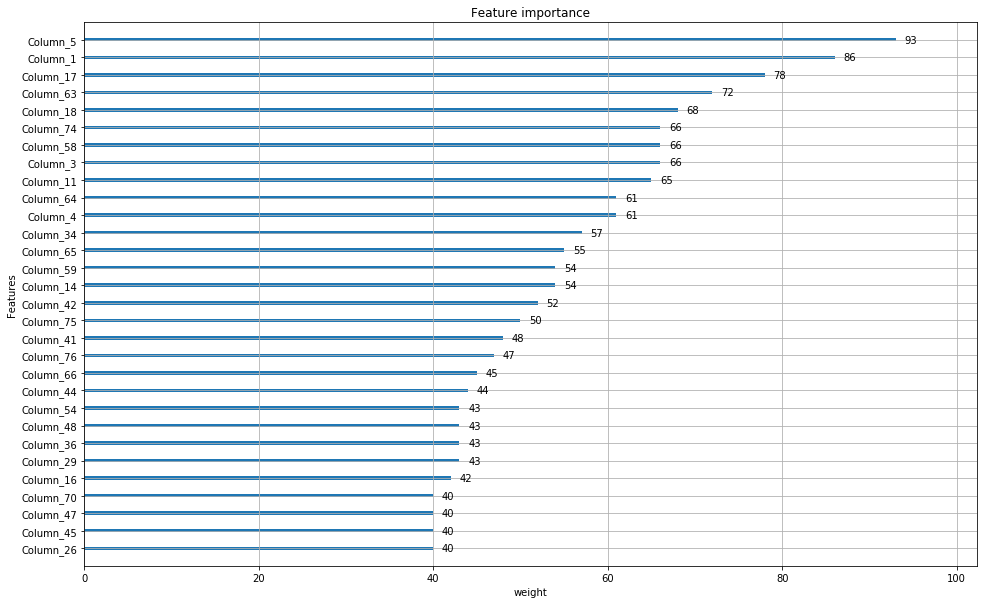

In [163]:
# best : 0.35661
plot_importance(model, xlabel = 'weight', max_num_features = 30)
plt.show()

In [9]:
'''
It seems they used SMAPE for testing but MAPE for training.

Reference: 
1.Uber: https://eng.uber.com/neural-networks/
2.1st prize: https://github.com/Arturus/kaggle-web-traffic/blob/master/how_it_works.md
'''
def smape(actual, predicted):
    '''
    calculate smape: symmetric_mean_absolute_percentage_error
    '''
    dividend= np.abs(np.array(actual) - np.array(predicted))
    denominator = np.array(actual) + np.array(predicted)
    
    return 2 * np.mean(np.divide(dividend, denominator, out=np.zeros_like(dividend), where=denominator!=0, casting='unsafe'))

# Tunining Parameters

# Step 0: dart( Dropouts meet Multiple Additive Regression Trees)
### It's fair that different algorithm is compared with default setting individually...

In [151]:
from sklearn.model_selection import StratifiedKFold # for cross-validation

'''
boosting_type = 'dart'
try differetnt boosting_type 

‘gbdt’, traditional Gradient Boosting Decision Tree.
‘dart’, Dropouts meet Multiple Additive Regression Trees.
‘goss’, Gradient-based One-Side Sampling. 
‘rf’, Random Forest.
'''
seed = 1030
lgb_pars = []
for boosting_type in ['dart','gbdt','goss']:
    print ('boosting_type :', boosting_type)
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                          boosting_type = boosting_type,
                          random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('boosting_type', boosting_type, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((boosting_type, np.mean(n_fold_result)))

boosting_type : dart
[1]	valid_0's mape: 0.704194
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.692217
[3]	valid_0's mape: 0.680962
[4]	valid_0's mape: 0.672584
[5]	valid_0's mape: 0.672584
[6]	valid_0's mape: 0.663354
[7]	valid_0's mape: 0.655426
[8]	valid_0's mape: 0.64673
[9]	valid_0's mape: 0.642213
[10]	valid_0's mape: 0.635555
[11]	valid_0's mape: 0.629777
[12]	valid_0's mape: 0.625126
[13]	valid_0's mape: 0.620581
[14]	valid_0's mape: 0.616866
[15]	valid_0's mape: 0.63936
[16]	valid_0's mape: 0.637572
[17]	valid_0's mape: 0.631421
[18]	valid_0's mape: 0.630666
[19]	valid_0's mape: 0.63022
[20]	valid_0's mape: 0.625159
[21]	valid_0's mape: 0.621021
[22]	valid_0's mape: 0.617804
[23]	valid_0's mape: 0.614088
[24]	valid_0's mape: 0.610797
[25]	valid_0's mape: 0.605657
[26]	valid_0's mape: 0.606785
[27]	valid_0's mape: 0.621494
[28]	valid_0's mape: 0.617801
[29]	valid_0's mape: 0.613182
[30]	valid_0's mape: 0.613712
[31]	valid_0's mape: 0.614189

[64]	valid_0's mape: 0.591163
[65]	valid_0's mape: 0.589526
[66]	valid_0's mape: 0.590879
[67]	valid_0's mape: 0.592238
[68]	valid_0's mape: 0.589819
[69]	valid_0's mape: 0.587719
[70]	valid_0's mape: 0.585462
[71]	valid_0's mape: 0.586967
[72]	valid_0's mape: 0.588402
[73]	valid_0's mape: 0.58956
[74]	valid_0's mape: 0.591327
[75]	valid_0's mape: 0.591919
[76]	valid_0's mape: 0.58975
[77]	valid_0's mape: 0.590705
[78]	valid_0's mape: 0.591251
[79]	valid_0's mape: 0.588205
[80]	valid_0's mape: 0.588786
[81]	valid_0's mape: 0.590173
[82]	valid_0's mape: 0.587121
[83]	valid_0's mape: 0.586955
[84]	valid_0's mape: 0.584188
[85]	valid_0's mape: 0.585372
[86]	valid_0's mape: 0.586343
[87]	valid_0's mape: 0.587767
[88]	valid_0's mape: 0.584932
[89]	valid_0's mape: 0.586076
[90]	valid_0's mape: 0.583356
[91]	valid_0's mape: 0.580628
[92]	valid_0's mape: 0.579218
[93]	valid_0's mape: 0.57734
[94]	valid_0's mape: 0.578768
[95]	valid_0's mape: 0.577193
[96]	valid_0's mape: 0.578141
[97]	valid_0'

[29]	valid_0's mape: 0.572288
[30]	valid_0's mape: 0.570919
[31]	valid_0's mape: 0.569775
[32]	valid_0's mape: 0.566109
[33]	valid_0's mape: 0.564838
[34]	valid_0's mape: 0.563036
[35]	valid_0's mape: 0.561462
[36]	valid_0's mape: 0.558893
[37]	valid_0's mape: 0.557713
[38]	valid_0's mape: 0.556179
[39]	valid_0's mape: 0.555023
[40]	valid_0's mape: 0.552052
[41]	valid_0's mape: 0.551302
[42]	valid_0's mape: 0.550134
[43]	valid_0's mape: 0.547022
[44]	valid_0's mape: 0.546351
[45]	valid_0's mape: 0.544664
[46]	valid_0's mape: 0.543962
[47]	valid_0's mape: 0.543316
[48]	valid_0's mape: 0.542109
[49]	valid_0's mape: 0.541107
[50]	valid_0's mape: 0.540274
[51]	valid_0's mape: 0.539673
[52]	valid_0's mape: 0.538609
[53]	valid_0's mape: 0.538174
[54]	valid_0's mape: 0.537292
[55]	valid_0's mape: 0.536377
[56]	valid_0's mape: 0.535034
[57]	valid_0's mape: 0.533137
[58]	valid_0's mape: 0.532567
[59]	valid_0's mape: 0.531939
[60]	valid_0's mape: 0.530629
[61]	valid_0's mape: 0.529722
[62]	valid

[97]	valid_0's mape: 0.502491
[98]	valid_0's mape: 0.501993
[99]	valid_0's mape: 0.50168
[100]	valid_0's mape: 0.501259
Did not meet early stopping. Best iteration is:
[100]	valid_0's mape: 0.501259
[1]	valid_0's mape: 0.701232
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.688834
[3]	valid_0's mape: 0.680082
[4]	valid_0's mape: 0.66989
[5]	valid_0's mape: 0.662385
[6]	valid_0's mape: 0.654086
[7]	valid_0's mape: 0.645348
[8]	valid_0's mape: 0.640437
[9]	valid_0's mape: 0.634347
[10]	valid_0's mape: 0.628778
[11]	valid_0's mape: 0.622585
[12]	valid_0's mape: 0.617362
[13]	valid_0's mape: 0.612775
[14]	valid_0's mape: 0.608971
[15]	valid_0's mape: 0.605224
[16]	valid_0's mape: 0.601078
[17]	valid_0's mape: 0.597063
[18]	valid_0's mape: 0.594169
[19]	valid_0's mape: 0.589426
[20]	valid_0's mape: 0.585245
[21]	valid_0's mape: 0.583263
[22]	valid_0's mape: 0.579328
[23]	valid_0's mape: 0.577465
[24]	valid_0's mape: 0.574735
[25]	valid_0's mape: 0.571975

[57]	valid_0's mape: 0.610274
[58]	valid_0's mape: 0.61
[59]	valid_0's mape: 0.609566
[60]	valid_0's mape: 0.610122
[61]	valid_0's mape: 0.610038
[62]	valid_0's mape: 0.609649
[63]	valid_0's mape: 0.609254
[64]	valid_0's mape: 0.60896
[65]	valid_0's mape: 0.608164
[66]	valid_0's mape: 0.608139
[67]	valid_0's mape: 0.607615
[68]	valid_0's mape: 0.607286
[69]	valid_0's mape: 0.607161
[70]	valid_0's mape: 0.606382
[71]	valid_0's mape: 0.604858
[72]	valid_0's mape: 0.603075
[73]	valid_0's mape: 0.602517
[74]	valid_0's mape: 0.602176
[75]	valid_0's mape: 0.601547
[76]	valid_0's mape: 0.600566
[77]	valid_0's mape: 0.600325
[78]	valid_0's mape: 0.599534
[79]	valid_0's mape: 0.598601
[80]	valid_0's mape: 0.59844
[81]	valid_0's mape: 0.59741
[82]	valid_0's mape: 0.597049
[83]	valid_0's mape: 0.596678
[84]	valid_0's mape: 0.596426
[85]	valid_0's mape: 0.595752
[86]	valid_0's mape: 0.594259
[87]	valid_0's mape: 0.593883
[88]	valid_0's mape: 0.593824
[89]	valid_0's mape: 0.593541
[90]	valid_0's ma

[27]	valid_0's mape: 0.625787
[28]	valid_0's mape: 0.626175
[29]	valid_0's mape: 0.625952
[30]	valid_0's mape: 0.626026
[31]	valid_0's mape: 0.625046
[32]	valid_0's mape: 0.625053
[33]	valid_0's mape: 0.624793
[34]	valid_0's mape: 0.624754
[35]	valid_0's mape: 0.624359
[36]	valid_0's mape: 0.623787
[37]	valid_0's mape: 0.623616
[38]	valid_0's mape: 0.623561
[39]	valid_0's mape: 0.623619
[40]	valid_0's mape: 0.62349
[41]	valid_0's mape: 0.623352
[42]	valid_0's mape: 0.623252
[43]	valid_0's mape: 0.621687
[44]	valid_0's mape: 0.621376
[45]	valid_0's mape: 0.620992
[46]	valid_0's mape: 0.620221
[47]	valid_0's mape: 0.619818
[48]	valid_0's mape: 0.619534
[49]	valid_0's mape: 0.61911
[50]	valid_0's mape: 0.619084
[51]	valid_0's mape: 0.618004
[52]	valid_0's mape: 0.618026
[53]	valid_0's mape: 0.617619
[54]	valid_0's mape: 0.617048
[55]	valid_0's mape: 0.616582
[56]	valid_0's mape: 0.614889
[57]	valid_0's mape: 0.61409
[58]	valid_0's mape: 0.612975
[59]	valid_0's mape: 0.611487
[60]	valid_0'

LightGBMError: b'Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/travis/build/Microsoft/LightGBM/python-package/compile/src/boosting/rf.hpp, line 29 .\n'

results [('dart', 0.575816008432626), ('gbdt', 0.49915340573523537), ('goss', 0.5892699125337227)]
best paras gbdt
best_score_ 0.49915340573523537


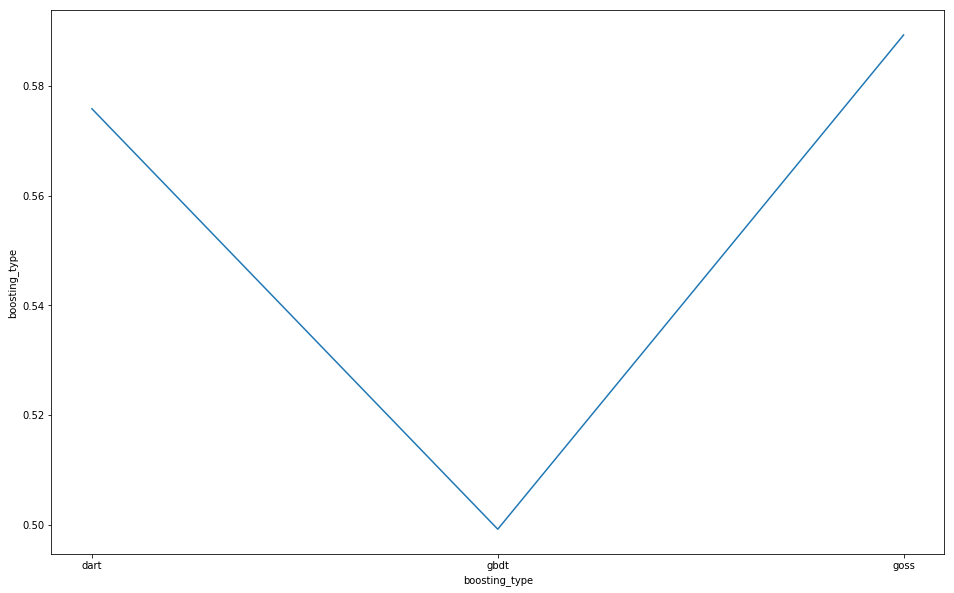

In [152]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(-1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['boosting_type','best_score_'])
plt.plot(df['boosting_type'],df['best_score_'])
plt.xlabel('boosting_type')
plt.ylabel('boosting_type')
plt.show()

# Step 1: Fix learning rate and number of estimators for tuning tree-based parameters
 

In [85]:
from sklearn.cross_validation import StratifiedKFold 
'''

Using StratifiedKFold from sklearn.cross_validation for this block instead sklearn.model_selection
due to distinct version.

'''

##########################################
#Step 1: Fix learning rate and number of estimators for tuning tree-based parameters
##########################################

seed = 1030

default_params = {
    'objective': 'regression_l2',
    'learning_rate': 0.1,
    'max_depth': -1,
    'min_child_weight': 0.001,
    'min_split_gain' : 0,
    'subsample': 1.0,
    'colsample_bytree': 1.0,
    'num_leaves': 31,
}
#We will divide into 10 stratified folds (the same distibution of labels in each fold) for testing
cv = StratifiedKFold(Y_train, n_folds=5, shuffle=True, random_state=seed)

#Return evenly spaced numbers over a specified interval.
n_estimators_range = np.linspace(start = 100, stop = 2000, num = 10).astype('int') 

print ('Starting to find optimum n_estimators that we need to tune our tree-based paras')
# tuning n_estimators
train_scores, test_scores = validation_curve(
    LGBMModel(**default_params),
    X_train, 
    Y_train,
    param_name = 'n_estimators',
    param_range = n_estimators_range,
    cv=cv,
    scoring='neg_mean_absolute_error' # Due to some problems, the bigger the score, the better the performance
)


Starting to find optimum n_estimators that we need to tune our tree-based paras


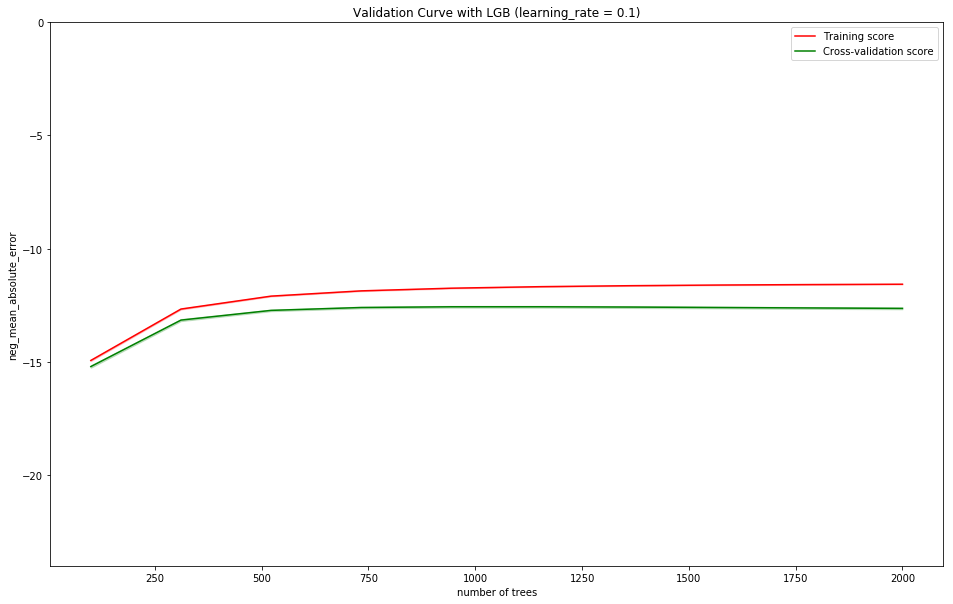

Best cross-validation result (-12.56) obtained for 1155 trees


In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = [16, 10] # customizing
# for following plot
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
# plot
plt.title("Validation Curve with LGB (learning_rate = 0.1)")
plt.xlabel("number of trees")
plt.ylabel("neg_mean_absolute_error")
plt.ylim(-24, 0)

plt.plot(n_estimators_range,
             train_scores_mean,
             label="Training score",
             color="r")

plt.plot(n_estimators_range,
             test_scores_mean, 
             label="Cross-validation score",
             color="g")

plt.fill_between(n_estimators_range, 
                 train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, 
                 alpha=0.2, color="r")

plt.fill_between(n_estimators_range,
                 test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std,
                 alpha=0.2, color="g")

plt.axhline(y=1, color='k', ls='dashed')

plt.legend(loc="best")
plt.show()

best_i = np.argmax(test_scores_mean) # best index
print("Best cross-validation result ({0:.2f}) obtained for {1} trees".format(test_scores_mean[best_i], n_estimators_range[best_i]))


In [128]:
##############
# preprocessing for the following procedures
##############
X_train = X_train.values
Y_train = Y_train.values


# Step 2:Tune num_leaves(Tree complexity), starting with wider range 

In [129]:
from sklearn.model_selection import StratifiedKFold # for cross-validation

##########################################
#Step 2: Tune num_leaves(Tree complexity) 
##########################################
'''
Tree complexity - in lightgbm that is controlled by number of leaves (num_leaves)

The more num_leaves, the larger tree complexity
'''
#----------------------------
#1. Start with wider range 
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 8, stop = 128, num = 10).astype('int'):
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        #print("TRAIN:", train_index, "TEST:", test_index)
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

[1]	valid_0's mape: 0.708916
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.702886
[3]	valid_0's mape: 0.694961
[4]	valid_0's mape: 0.68866
[5]	valid_0's mape: 0.684089
[6]	valid_0's mape: 0.677815
[7]	valid_0's mape: 0.671901
[8]	valid_0's mape: 0.668932
[9]	valid_0's mape: 0.662864
[10]	valid_0's mape: 0.658209
[11]	valid_0's mape: 0.654847
[12]	valid_0's mape: 0.652376
[13]	valid_0's mape: 0.648085
[14]	valid_0's mape: 0.643734
[15]	valid_0's mape: 0.639646
[16]	valid_0's mape: 0.636594
[17]	valid_0's mape: 0.633335
[18]	valid_0's mape: 0.62977
[19]	valid_0's mape: 0.628876
[20]	valid_0's mape: 0.627026
[21]	valid_0's mape: 0.626282
[22]	valid_0's mape: 0.624721
[23]	valid_0's mape: 0.623927
[24]	valid_0's mape: 0.62223
[25]	valid_0's mape: 0.61746
[26]	valid_0's mape: 0.616155
[27]	valid_0's mape: 0.615102
[28]	valid_0's mape: 0.614003
[29]	valid_0's mape: 0.61322
[30]	valid_0's mape: 0.612663
[31]	valid_0's mape: 0.611956
[32]	valid_0's mape: 0

[268]	valid_0's mape: 0.540061
[269]	valid_0's mape: 0.539988
[270]	valid_0's mape: 0.539917
[271]	valid_0's mape: 0.539676
[272]	valid_0's mape: 0.539658
[273]	valid_0's mape: 0.539626
[274]	valid_0's mape: 0.539623
[275]	valid_0's mape: 0.539472
[276]	valid_0's mape: 0.539444
[277]	valid_0's mape: 0.539315
[278]	valid_0's mape: 0.539314
[279]	valid_0's mape: 0.539314
[280]	valid_0's mape: 0.539314
[281]	valid_0's mape: 0.539312
[282]	valid_0's mape: 0.539108
[283]	valid_0's mape: 0.538934
[284]	valid_0's mape: 0.538919
[285]	valid_0's mape: 0.538907
[286]	valid_0's mape: 0.538731
[287]	valid_0's mape: 0.538571
[288]	valid_0's mape: 0.538555
[289]	valid_0's mape: 0.538537
[290]	valid_0's mape: 0.538473
[291]	valid_0's mape: 0.538376
[292]	valid_0's mape: 0.537997
[293]	valid_0's mape: 0.537927
[294]	valid_0's mape: 0.537877
[295]	valid_0's mape: 0.537772
[296]	valid_0's mape: 0.537693
[297]	valid_0's mape: 0.537433
[298]	valid_0's mape: 0.537416
[299]	valid_0's mape: 0.537358
[300]	va

[540]	valid_0's mape: 0.518178
[541]	valid_0's mape: 0.51806
[542]	valid_0's mape: 0.518048
[543]	valid_0's mape: 0.518043
[544]	valid_0's mape: 0.518043
[545]	valid_0's mape: 0.518042
[546]	valid_0's mape: 0.518041
[547]	valid_0's mape: 0.517994
[548]	valid_0's mape: 0.517993
[549]	valid_0's mape: 0.517993
[550]	valid_0's mape: 0.517971
[551]	valid_0's mape: 0.517971
[552]	valid_0's mape: 0.517931
[553]	valid_0's mape: 0.517872
[554]	valid_0's mape: 0.517809
[555]	valid_0's mape: 0.517793
[556]	valid_0's mape: 0.517699
[557]	valid_0's mape: 0.517689
[558]	valid_0's mape: 0.517669
[559]	valid_0's mape: 0.517662
[560]	valid_0's mape: 0.517585
[561]	valid_0's mape: 0.517514
[562]	valid_0's mape: 0.517508
[563]	valid_0's mape: 0.517508
[564]	valid_0's mape: 0.517486
[565]	valid_0's mape: 0.517472
[566]	valid_0's mape: 0.517464
[567]	valid_0's mape: 0.517462
[568]	valid_0's mape: 0.517462
[569]	valid_0's mape: 0.516779
[570]	valid_0's mape: 0.516762
[571]	valid_0's mape: 0.516761
[572]	val

[811]	valid_0's mape: 0.508683
[812]	valid_0's mape: 0.508683
[813]	valid_0's mape: 0.508673
[814]	valid_0's mape: 0.508673
[815]	valid_0's mape: 0.508673
[816]	valid_0's mape: 0.508669
[817]	valid_0's mape: 0.508669
[818]	valid_0's mape: 0.50867
[819]	valid_0's mape: 0.508673
[820]	valid_0's mape: 0.508675
[821]	valid_0's mape: 0.508677
[822]	valid_0's mape: 0.508677
[823]	valid_0's mape: 0.508678
[824]	valid_0's mape: 0.508678
[825]	valid_0's mape: 0.50868
[826]	valid_0's mape: 0.508681
[827]	valid_0's mape: 0.508624
[828]	valid_0's mape: 0.508623
[829]	valid_0's mape: 0.508618
[830]	valid_0's mape: 0.508612
[831]	valid_0's mape: 0.508606
[832]	valid_0's mape: 0.508605
[833]	valid_0's mape: 0.508601
[834]	valid_0's mape: 0.508601
[835]	valid_0's mape: 0.508601
[836]	valid_0's mape: 0.508601
[837]	valid_0's mape: 0.508601
[838]	valid_0's mape: 0.508601
[839]	valid_0's mape: 0.508509
[840]	valid_0's mape: 0.508478
[841]	valid_0's mape: 0.508405
[842]	valid_0's mape: 0.508346
[843]	vali

[1077]	valid_0's mape: 0.501788
[1078]	valid_0's mape: 0.501332
[1079]	valid_0's mape: 0.501285
[1080]	valid_0's mape: 0.501284
[1081]	valid_0's mape: 0.501284
[1082]	valid_0's mape: 0.501283
[1083]	valid_0's mape: 0.501283
[1084]	valid_0's mape: 0.501283
[1085]	valid_0's mape: 0.501282
[1086]	valid_0's mape: 0.501282
[1087]	valid_0's mape: 0.501282
[1088]	valid_0's mape: 0.501281
[1089]	valid_0's mape: 0.501281
[1090]	valid_0's mape: 0.501281
[1091]	valid_0's mape: 0.501281
[1092]	valid_0's mape: 0.501281
[1093]	valid_0's mape: 0.501281
[1094]	valid_0's mape: 0.501281
[1095]	valid_0's mape: 0.501281
[1096]	valid_0's mape: 0.501281
[1097]	valid_0's mape: 0.501281
[1098]	valid_0's mape: 0.501281
[1099]	valid_0's mape: 0.501281
[1100]	valid_0's mape: 0.501281
[1101]	valid_0's mape: 0.501281
[1102]	valid_0's mape: 0.501281
[1103]	valid_0's mape: 0.501281
[1104]	valid_0's mape: 0.501281
[1105]	valid_0's mape: 0.501281
[1106]	valid_0's mape: 0.501281
[1107]	valid_0's mape: 0.501281
[1108]	v

[187]	valid_0's mape: 0.544177
[188]	valid_0's mape: 0.543682
[189]	valid_0's mape: 0.543482
[190]	valid_0's mape: 0.543389
[191]	valid_0's mape: 0.543291
[192]	valid_0's mape: 0.542999
[193]	valid_0's mape: 0.542829
[194]	valid_0's mape: 0.542647
[195]	valid_0's mape: 0.542472
[196]	valid_0's mape: 0.542267
[197]	valid_0's mape: 0.542226
[198]	valid_0's mape: 0.542089
[199]	valid_0's mape: 0.541897
[200]	valid_0's mape: 0.541617
[201]	valid_0's mape: 0.541455
[202]	valid_0's mape: 0.541252
[203]	valid_0's mape: 0.539177
[204]	valid_0's mape: 0.537012
[205]	valid_0's mape: 0.536809
[206]	valid_0's mape: 0.536697
[207]	valid_0's mape: 0.536652
[208]	valid_0's mape: 0.536555
[209]	valid_0's mape: 0.536267
[210]	valid_0's mape: 0.536103
[211]	valid_0's mape: 0.535748
[212]	valid_0's mape: 0.535442
[213]	valid_0's mape: 0.535307
[214]	valid_0's mape: 0.535203
[215]	valid_0's mape: 0.535149
[216]	valid_0's mape: 0.535091
[217]	valid_0's mape: 0.534886
[218]	valid_0's mape: 0.534763
[219]	va

[455]	valid_0's mape: 0.509464
[456]	valid_0's mape: 0.5094
[457]	valid_0's mape: 0.50934
[458]	valid_0's mape: 0.509206
[459]	valid_0's mape: 0.50919
[460]	valid_0's mape: 0.509049
[461]	valid_0's mape: 0.509013
[462]	valid_0's mape: 0.50862
[463]	valid_0's mape: 0.507954
[464]	valid_0's mape: 0.50793
[465]	valid_0's mape: 0.507827
[466]	valid_0's mape: 0.507826
[467]	valid_0's mape: 0.507815
[468]	valid_0's mape: 0.507805
[469]	valid_0's mape: 0.507802
[470]	valid_0's mape: 0.507784
[471]	valid_0's mape: 0.507769
[472]	valid_0's mape: 0.507653
[473]	valid_0's mape: 0.507574
[474]	valid_0's mape: 0.507297
[475]	valid_0's mape: 0.50713
[476]	valid_0's mape: 0.507078
[477]	valid_0's mape: 0.506884
[478]	valid_0's mape: 0.506829
[479]	valid_0's mape: 0.506784
[480]	valid_0's mape: 0.50663
[481]	valid_0's mape: 0.506572
[482]	valid_0's mape: 0.506569
[483]	valid_0's mape: 0.506537
[484]	valid_0's mape: 0.506527
[485]	valid_0's mape: 0.506527
[486]	valid_0's mape: 0.506476
[487]	valid_0's 

[723]	valid_0's mape: 0.491979
[724]	valid_0's mape: 0.491825
[725]	valid_0's mape: 0.491767
[726]	valid_0's mape: 0.49167
[727]	valid_0's mape: 0.491595
[728]	valid_0's mape: 0.491585
[729]	valid_0's mape: 0.491568
[730]	valid_0's mape: 0.491566
[731]	valid_0's mape: 0.491526
[732]	valid_0's mape: 0.491526
[733]	valid_0's mape: 0.49152
[734]	valid_0's mape: 0.491483
[735]	valid_0's mape: 0.491453
[736]	valid_0's mape: 0.491357
[737]	valid_0's mape: 0.491317
[738]	valid_0's mape: 0.491286
[739]	valid_0's mape: 0.491277
[740]	valid_0's mape: 0.491247
[741]	valid_0's mape: 0.491226
[742]	valid_0's mape: 0.491211
[743]	valid_0's mape: 0.491211
[744]	valid_0's mape: 0.491117
[745]	valid_0's mape: 0.491113
[746]	valid_0's mape: 0.4911
[747]	valid_0's mape: 0.4911
[748]	valid_0's mape: 0.49109
[749]	valid_0's mape: 0.491027
[750]	valid_0's mape: 0.490856
[751]	valid_0's mape: 0.490843
[752]	valid_0's mape: 0.490808
[753]	valid_0's mape: 0.490723
[754]	valid_0's mape: 0.490722
[755]	valid_0's

[988]	valid_0's mape: 0.482882
[989]	valid_0's mape: 0.482882
[990]	valid_0's mape: 0.482882
[991]	valid_0's mape: 0.482878
[992]	valid_0's mape: 0.482873
[993]	valid_0's mape: 0.482851
[994]	valid_0's mape: 0.482774
[995]	valid_0's mape: 0.482571
[996]	valid_0's mape: 0.482512
[997]	valid_0's mape: 0.482386
[998]	valid_0's mape: 0.482383
[999]	valid_0's mape: 0.482383
[1000]	valid_0's mape: 0.482373
[1001]	valid_0's mape: 0.482369
[1002]	valid_0's mape: 0.482368
[1003]	valid_0's mape: 0.482367
[1004]	valid_0's mape: 0.482366
[1005]	valid_0's mape: 0.482366
[1006]	valid_0's mape: 0.482331
[1007]	valid_0's mape: 0.48233
[1008]	valid_0's mape: 0.482331
[1009]	valid_0's mape: 0.482298
[1010]	valid_0's mape: 0.482292
[1011]	valid_0's mape: 0.482267
[1012]	valid_0's mape: 0.482264
[1013]	valid_0's mape: 0.482243
[1014]	valid_0's mape: 0.482243
[1015]	valid_0's mape: 0.482244
[1016]	valid_0's mape: 0.482215
[1017]	valid_0's mape: 0.482213
[1018]	valid_0's mape: 0.482203
[1019]	valid_0's mape

[98]	valid_0's mape: 0.572449
[99]	valid_0's mape: 0.571986
[100]	valid_0's mape: 0.571335
[101]	valid_0's mape: 0.571017
[102]	valid_0's mape: 0.570142
[103]	valid_0's mape: 0.569604
[104]	valid_0's mape: 0.569391
[105]	valid_0's mape: 0.567046
[106]	valid_0's mape: 0.566253
[107]	valid_0's mape: 0.566044
[108]	valid_0's mape: 0.565996
[109]	valid_0's mape: 0.565931
[110]	valid_0's mape: 0.565613
[111]	valid_0's mape: 0.565072
[112]	valid_0's mape: 0.564761
[113]	valid_0's mape: 0.564557
[114]	valid_0's mape: 0.564368
[115]	valid_0's mape: 0.564103
[116]	valid_0's mape: 0.563634
[117]	valid_0's mape: 0.563339
[118]	valid_0's mape: 0.562974
[119]	valid_0's mape: 0.562452
[120]	valid_0's mape: 0.562141
[121]	valid_0's mape: 0.561888
[122]	valid_0's mape: 0.561305
[123]	valid_0's mape: 0.560985
[124]	valid_0's mape: 0.560848
[125]	valid_0's mape: 0.560697
[126]	valid_0's mape: 0.560493
[127]	valid_0's mape: 0.560458
[128]	valid_0's mape: 0.560129
[129]	valid_0's mape: 0.560002
[130]	vali

[363]	valid_0's mape: 0.520236
[364]	valid_0's mape: 0.520193
[365]	valid_0's mape: 0.520045
[366]	valid_0's mape: 0.519972
[367]	valid_0's mape: 0.519924
[368]	valid_0's mape: 0.519868
[369]	valid_0's mape: 0.519797
[370]	valid_0's mape: 0.519557
[371]	valid_0's mape: 0.519434
[372]	valid_0's mape: 0.51933
[373]	valid_0's mape: 0.519243
[374]	valid_0's mape: 0.518447
[375]	valid_0's mape: 0.518426
[376]	valid_0's mape: 0.51818
[377]	valid_0's mape: 0.518028
[378]	valid_0's mape: 0.517936
[379]	valid_0's mape: 0.517904
[380]	valid_0's mape: 0.517876
[381]	valid_0's mape: 0.517712
[382]	valid_0's mape: 0.517698
[383]	valid_0's mape: 0.51765
[384]	valid_0's mape: 0.517538
[385]	valid_0's mape: 0.517472
[386]	valid_0's mape: 0.51747
[387]	valid_0's mape: 0.517458
[388]	valid_0's mape: 0.51744
[389]	valid_0's mape: 0.51744
[390]	valid_0's mape: 0.517439
[391]	valid_0's mape: 0.517367
[392]	valid_0's mape: 0.517359
[393]	valid_0's mape: 0.517263
[394]	valid_0's mape: 0.517112
[395]	valid_0'

[630]	valid_0's mape: 0.507219
[631]	valid_0's mape: 0.507218
[632]	valid_0's mape: 0.507217
[633]	valid_0's mape: 0.507216
[634]	valid_0's mape: 0.507135
[635]	valid_0's mape: 0.507099
[636]	valid_0's mape: 0.507066
[637]	valid_0's mape: 0.506969
[638]	valid_0's mape: 0.506961
[639]	valid_0's mape: 0.506945
[640]	valid_0's mape: 0.506931
[641]	valid_0's mape: 0.506904
[642]	valid_0's mape: 0.506887
[643]	valid_0's mape: 0.506826
[644]	valid_0's mape: 0.506799
[645]	valid_0's mape: 0.506794
[646]	valid_0's mape: 0.50674
[647]	valid_0's mape: 0.506698
[648]	valid_0's mape: 0.506672
[649]	valid_0's mape: 0.506614
[650]	valid_0's mape: 0.506611
[651]	valid_0's mape: 0.506609
[652]	valid_0's mape: 0.506543
[653]	valid_0's mape: 0.506522
[654]	valid_0's mape: 0.50652
[655]	valid_0's mape: 0.506393
[656]	valid_0's mape: 0.506331
[657]	valid_0's mape: 0.506322
[658]	valid_0's mape: 0.506312
[659]	valid_0's mape: 0.506299
[660]	valid_0's mape: 0.506249
[661]	valid_0's mape: 0.50623
[662]	valid

[898]	valid_0's mape: 0.498069
[899]	valid_0's mape: 0.498068
[900]	valid_0's mape: 0.498045
[901]	valid_0's mape: 0.498045
[902]	valid_0's mape: 0.497917
[903]	valid_0's mape: 0.497918
[904]	valid_0's mape: 0.497821
[905]	valid_0's mape: 0.497755
[906]	valid_0's mape: 0.497693
[907]	valid_0's mape: 0.497689
[908]	valid_0's mape: 0.497689
[909]	valid_0's mape: 0.497491
[910]	valid_0's mape: 0.497477
[911]	valid_0's mape: 0.49741
[912]	valid_0's mape: 0.496994
[913]	valid_0's mape: 0.496938
[914]	valid_0's mape: 0.496938
[915]	valid_0's mape: 0.496883
[916]	valid_0's mape: 0.496829
[917]	valid_0's mape: 0.496826
[918]	valid_0's mape: 0.496743
[919]	valid_0's mape: 0.496725
[920]	valid_0's mape: 0.496678
[921]	valid_0's mape: 0.496669
[922]	valid_0's mape: 0.496666
[923]	valid_0's mape: 0.496663
[924]	valid_0's mape: 0.496659
[925]	valid_0's mape: 0.496625
[926]	valid_0's mape: 0.496608
[927]	valid_0's mape: 0.496599
[928]	valid_0's mape: 0.496598
[929]	valid_0's mape: 0.496589
[930]	val

[1]	valid_0's mape: 0.7057
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.699977
[3]	valid_0's mape: 0.691799
[4]	valid_0's mape: 0.685473
[5]	valid_0's mape: 0.680339
[6]	valid_0's mape: 0.674362
[7]	valid_0's mape: 0.67078
[8]	valid_0's mape: 0.664914
[9]	valid_0's mape: 0.657852
[10]	valid_0's mape: 0.655739
[11]	valid_0's mape: 0.649576
[12]	valid_0's mape: 0.644076
[13]	valid_0's mape: 0.640263
[14]	valid_0's mape: 0.638139
[15]	valid_0's mape: 0.634524
[16]	valid_0's mape: 0.630269
[17]	valid_0's mape: 0.629211
[18]	valid_0's mape: 0.627805
[19]	valid_0's mape: 0.625932
[20]	valid_0's mape: 0.622494
[21]	valid_0's mape: 0.621275
[22]	valid_0's mape: 0.616963
[23]	valid_0's mape: 0.614066
[24]	valid_0's mape: 0.612606
[25]	valid_0's mape: 0.61167
[26]	valid_0's mape: 0.610992
[27]	valid_0's mape: 0.60893
[28]	valid_0's mape: 0.607944
[29]	valid_0's mape: 0.606735
[30]	valid_0's mape: 0.606338
[31]	valid_0's mape: 0.605566
[32]	valid_0's mape: 0

[269]	valid_0's mape: 0.527408
[270]	valid_0's mape: 0.52726
[271]	valid_0's mape: 0.527194
[272]	valid_0's mape: 0.527159
[273]	valid_0's mape: 0.527096
[274]	valid_0's mape: 0.527049
[275]	valid_0's mape: 0.526935
[276]	valid_0's mape: 0.526794
[277]	valid_0's mape: 0.526688
[278]	valid_0's mape: 0.526395
[279]	valid_0's mape: 0.526351
[280]	valid_0's mape: 0.526305
[281]	valid_0's mape: 0.526299
[282]	valid_0's mape: 0.526092
[283]	valid_0's mape: 0.52602
[284]	valid_0's mape: 0.525334
[285]	valid_0's mape: 0.525179
[286]	valid_0's mape: 0.525136
[287]	valid_0's mape: 0.525019
[288]	valid_0's mape: 0.524997
[289]	valid_0's mape: 0.524981
[290]	valid_0's mape: 0.524967
[291]	valid_0's mape: 0.52492
[292]	valid_0's mape: 0.524883
[293]	valid_0's mape: 0.524657
[294]	valid_0's mape: 0.524611
[295]	valid_0's mape: 0.524572
[296]	valid_0's mape: 0.524319
[297]	valid_0's mape: 0.524137
[298]	valid_0's mape: 0.524083
[299]	valid_0's mape: 0.524023
[300]	valid_0's mape: 0.523962
[301]	valid

[538]	valid_0's mape: 0.503789
[539]	valid_0's mape: 0.503791
[540]	valid_0's mape: 0.503786
[541]	valid_0's mape: 0.503771
[542]	valid_0's mape: 0.503729
[543]	valid_0's mape: 0.503706
[544]	valid_0's mape: 0.503672
[545]	valid_0's mape: 0.503667
[546]	valid_0's mape: 0.50367
[547]	valid_0's mape: 0.503602
[548]	valid_0's mape: 0.503598
[549]	valid_0's mape: 0.503533
[550]	valid_0's mape: 0.503532
[551]	valid_0's mape: 0.503395
[552]	valid_0's mape: 0.50339
[553]	valid_0's mape: 0.503385
[554]	valid_0's mape: 0.503383
[555]	valid_0's mape: 0.503385
[556]	valid_0's mape: 0.503383
[557]	valid_0's mape: 0.503385
[558]	valid_0's mape: 0.503384
[559]	valid_0's mape: 0.503383
[560]	valid_0's mape: 0.503382
[561]	valid_0's mape: 0.503382
[562]	valid_0's mape: 0.503382
[563]	valid_0's mape: 0.503381
[564]	valid_0's mape: 0.503381
[565]	valid_0's mape: 0.503381
[566]	valid_0's mape: 0.503364
[567]	valid_0's mape: 0.503364
[568]	valid_0's mape: 0.503364
[569]	valid_0's mape: 0.503364
[570]	vali

[809]	valid_0's mape: 0.49416
[810]	valid_0's mape: 0.493997
[811]	valid_0's mape: 0.493999
[812]	valid_0's mape: 0.493981
[813]	valid_0's mape: 0.493956
[814]	valid_0's mape: 0.493948
[815]	valid_0's mape: 0.493928
[816]	valid_0's mape: 0.493915
[817]	valid_0's mape: 0.49391
[818]	valid_0's mape: 0.493903
[819]	valid_0's mape: 0.493843
[820]	valid_0's mape: 0.493842
[821]	valid_0's mape: 0.493842
[822]	valid_0's mape: 0.493842
[823]	valid_0's mape: 0.493842
[824]	valid_0's mape: 0.493842
[825]	valid_0's mape: 0.493837
[826]	valid_0's mape: 0.493825
[827]	valid_0's mape: 0.493823
[828]	valid_0's mape: 0.493822
[829]	valid_0's mape: 0.493784
[830]	valid_0's mape: 0.493641
[831]	valid_0's mape: 0.493601
[832]	valid_0's mape: 0.493598
[833]	valid_0's mape: 0.493537
[834]	valid_0's mape: 0.493539
[835]	valid_0's mape: 0.493533
[836]	valid_0's mape: 0.493522
[837]	valid_0's mape: 0.493522
[838]	valid_0's mape: 0.493475
[839]	valid_0's mape: 0.493475
[840]	valid_0's mape: 0.493446
[841]	vali

[1077]	valid_0's mape: 0.488279
[1078]	valid_0's mape: 0.488279
[1079]	valid_0's mape: 0.488279
[1080]	valid_0's mape: 0.488279
[1081]	valid_0's mape: 0.488279
[1082]	valid_0's mape: 0.488279
[1083]	valid_0's mape: 0.488279
[1084]	valid_0's mape: 0.488279
[1085]	valid_0's mape: 0.488279
[1086]	valid_0's mape: 0.488279
[1087]	valid_0's mape: 0.488279
[1088]	valid_0's mape: 0.488279
[1089]	valid_0's mape: 0.488279
[1090]	valid_0's mape: 0.488279
[1091]	valid_0's mape: 0.488279
[1092]	valid_0's mape: 0.488279
[1093]	valid_0's mape: 0.488279
[1094]	valid_0's mape: 0.488279
[1095]	valid_0's mape: 0.488279
[1096]	valid_0's mape: 0.488279
[1097]	valid_0's mape: 0.488279
[1098]	valid_0's mape: 0.488279
[1099]	valid_0's mape: 0.488279
[1100]	valid_0's mape: 0.488279
[1101]	valid_0's mape: 0.488279
Early stopping, best iteration is:
[1051]	valid_0's mape: 0.488277
[1]	valid_0's mape: 0.707552
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.698525
[3]	valid_0's

[244]	valid_0's mape: 0.529028
[245]	valid_0's mape: 0.528758
[246]	valid_0's mape: 0.528242
[247]	valid_0's mape: 0.527683
[248]	valid_0's mape: 0.527422
[249]	valid_0's mape: 0.527254
[250]	valid_0's mape: 0.526979
[251]	valid_0's mape: 0.526873
[252]	valid_0's mape: 0.526841
[253]	valid_0's mape: 0.526801
[254]	valid_0's mape: 0.526551
[255]	valid_0's mape: 0.526442
[256]	valid_0's mape: 0.52642
[257]	valid_0's mape: 0.526317
[258]	valid_0's mape: 0.526307
[259]	valid_0's mape: 0.526158
[260]	valid_0's mape: 0.526144
[261]	valid_0's mape: 0.526017
[262]	valid_0's mape: 0.525704
[263]	valid_0's mape: 0.525685
[264]	valid_0's mape: 0.525633
[265]	valid_0's mape: 0.525584
[266]	valid_0's mape: 0.525503
[267]	valid_0's mape: 0.525499
[268]	valid_0's mape: 0.525498
[269]	valid_0's mape: 0.525482
[270]	valid_0's mape: 0.525469
[271]	valid_0's mape: 0.525391
[272]	valid_0's mape: 0.525188
[273]	valid_0's mape: 0.525048
[274]	valid_0's mape: 0.525024
[275]	valid_0's mape: 0.525012
[276]	val

[514]	valid_0's mape: 0.505062
[515]	valid_0's mape: 0.50506
[516]	valid_0's mape: 0.505058
[517]	valid_0's mape: 0.504995
[518]	valid_0's mape: 0.504988
[519]	valid_0's mape: 0.504981
[520]	valid_0's mape: 0.504977
[521]	valid_0's mape: 0.504947
[522]	valid_0's mape: 0.504939
[523]	valid_0's mape: 0.50492
[524]	valid_0's mape: 0.504891
[525]	valid_0's mape: 0.504856
[526]	valid_0's mape: 0.504763
[527]	valid_0's mape: 0.504674
[528]	valid_0's mape: 0.50464
[529]	valid_0's mape: 0.504629
[530]	valid_0's mape: 0.504614
[531]	valid_0's mape: 0.504608
[532]	valid_0's mape: 0.504578
[533]	valid_0's mape: 0.504394
[534]	valid_0's mape: 0.504377
[535]	valid_0's mape: 0.504371
[536]	valid_0's mape: 0.504312
[537]	valid_0's mape: 0.504192
[538]	valid_0's mape: 0.50415
[539]	valid_0's mape: 0.504122
[540]	valid_0's mape: 0.503973
[541]	valid_0's mape: 0.503965
[542]	valid_0's mape: 0.503924
[543]	valid_0's mape: 0.503884
[544]	valid_0's mape: 0.503857
[545]	valid_0's mape: 0.503729
[546]	valid_

[784]	valid_0's mape: 0.492339
[785]	valid_0's mape: 0.4923
[786]	valid_0's mape: 0.492275
[787]	valid_0's mape: 0.492254
[788]	valid_0's mape: 0.492212
[789]	valid_0's mape: 0.492156
[790]	valid_0's mape: 0.492145
[791]	valid_0's mape: 0.491911
[792]	valid_0's mape: 0.491909
[793]	valid_0's mape: 0.491764
[794]	valid_0's mape: 0.49172
[795]	valid_0's mape: 0.491713
[796]	valid_0's mape: 0.491712
[797]	valid_0's mape: 0.491708
[798]	valid_0's mape: 0.491708
[799]	valid_0's mape: 0.491708
[800]	valid_0's mape: 0.491672
[801]	valid_0's mape: 0.491662
[802]	valid_0's mape: 0.491634
[803]	valid_0's mape: 0.491614
[804]	valid_0's mape: 0.491561
[805]	valid_0's mape: 0.491558
[806]	valid_0's mape: 0.491555
[807]	valid_0's mape: 0.491552
[808]	valid_0's mape: 0.49155
[809]	valid_0's mape: 0.491547
[810]	valid_0's mape: 0.491547
[811]	valid_0's mape: 0.491545
[812]	valid_0's mape: 0.491515
[813]	valid_0's mape: 0.491515
[814]	valid_0's mape: 0.491511
[815]	valid_0's mape: 0.491202
[816]	valid_

[1052]	valid_0's mape: 0.48497
[1053]	valid_0's mape: 0.484965
[1054]	valid_0's mape: 0.48496
[1055]	valid_0's mape: 0.484955
[1056]	valid_0's mape: 0.484951
[1057]	valid_0's mape: 0.484947
[1058]	valid_0's mape: 0.484944
[1059]	valid_0's mape: 0.484941
[1060]	valid_0's mape: 0.484936
[1061]	valid_0's mape: 0.484934
[1062]	valid_0's mape: 0.484931
[1063]	valid_0's mape: 0.484931
[1064]	valid_0's mape: 0.484931
[1065]	valid_0's mape: 0.484931
[1066]	valid_0's mape: 0.484931
[1067]	valid_0's mape: 0.484931
[1068]	valid_0's mape: 0.484931
[1069]	valid_0's mape: 0.484931
[1070]	valid_0's mape: 0.484931
[1071]	valid_0's mape: 0.484931
[1072]	valid_0's mape: 0.484931
[1073]	valid_0's mape: 0.484931
[1074]	valid_0's mape: 0.484931
[1075]	valid_0's mape: 0.484931
[1076]	valid_0's mape: 0.484931
[1077]	valid_0's mape: 0.484931
[1078]	valid_0's mape: 0.484931
[1079]	valid_0's mape: 0.484931
[1080]	valid_0's mape: 0.484931
[1081]	valid_0's mape: 0.484931
[1082]	valid_0's mape: 0.484931
[1083]	val

[162]	valid_0's mape: 0.505457
[163]	valid_0's mape: 0.505248
[164]	valid_0's mape: 0.505119
[165]	valid_0's mape: 0.504572
[166]	valid_0's mape: 0.504346
[167]	valid_0's mape: 0.504186
[168]	valid_0's mape: 0.503868
[169]	valid_0's mape: 0.503666
[170]	valid_0's mape: 0.503464
[171]	valid_0's mape: 0.503303
[172]	valid_0's mape: 0.503154
[173]	valid_0's mape: 0.502956
[174]	valid_0's mape: 0.502537
[175]	valid_0's mape: 0.50242
[176]	valid_0's mape: 0.502287
[177]	valid_0's mape: 0.502257
[178]	valid_0's mape: 0.502243
[179]	valid_0's mape: 0.501939
[180]	valid_0's mape: 0.501662
[181]	valid_0's mape: 0.501639
[182]	valid_0's mape: 0.501549
[183]	valid_0's mape: 0.501193
[184]	valid_0's mape: 0.500639
[185]	valid_0's mape: 0.500616
[186]	valid_0's mape: 0.500582
[187]	valid_0's mape: 0.500413
[188]	valid_0's mape: 0.500006
[189]	valid_0's mape: 0.499852
[190]	valid_0's mape: 0.499697
[191]	valid_0's mape: 0.499671
[192]	valid_0's mape: 0.499459
[193]	valid_0's mape: 0.49921
[194]	vali

[432]	valid_0's mape: 0.482502
[433]	valid_0's mape: 0.482472
[434]	valid_0's mape: 0.482389
[435]	valid_0's mape: 0.48237
[436]	valid_0's mape: 0.482329
[437]	valid_0's mape: 0.482073
[438]	valid_0's mape: 0.482042
[439]	valid_0's mape: 0.481981
[440]	valid_0's mape: 0.481978
[441]	valid_0's mape: 0.481974
[442]	valid_0's mape: 0.481845
[443]	valid_0's mape: 0.481845
[444]	valid_0's mape: 0.481816
[445]	valid_0's mape: 0.481794
[446]	valid_0's mape: 0.481789
[447]	valid_0's mape: 0.481789
[448]	valid_0's mape: 0.481789
[449]	valid_0's mape: 0.481789
[450]	valid_0's mape: 0.48176
[451]	valid_0's mape: 0.481759
[452]	valid_0's mape: 0.481753
[453]	valid_0's mape: 0.481648
[454]	valid_0's mape: 0.481616
[455]	valid_0's mape: 0.481594
[456]	valid_0's mape: 0.481589
[457]	valid_0's mape: 0.481476
[458]	valid_0's mape: 0.481477
[459]	valid_0's mape: 0.481432
[460]	valid_0's mape: 0.481428
[461]	valid_0's mape: 0.481404
[462]	valid_0's mape: 0.481291
[463]	valid_0's mape: 0.48126
[464]	valid

[699]	valid_0's mape: 0.470445
[700]	valid_0's mape: 0.470433
[701]	valid_0's mape: 0.470425
[702]	valid_0's mape: 0.470422
[703]	valid_0's mape: 0.470408
[704]	valid_0's mape: 0.470404
[705]	valid_0's mape: 0.470176
[706]	valid_0's mape: 0.470173
[707]	valid_0's mape: 0.470167
[708]	valid_0's mape: 0.470139
[709]	valid_0's mape: 0.470123
[710]	valid_0's mape: 0.470123
[711]	valid_0's mape: 0.470121
[712]	valid_0's mape: 0.470113
[713]	valid_0's mape: 0.47011
[714]	valid_0's mape: 0.470106
[715]	valid_0's mape: 0.47009
[716]	valid_0's mape: 0.470078
[717]	valid_0's mape: 0.470076
[718]	valid_0's mape: 0.47007
[719]	valid_0's mape: 0.470062
[720]	valid_0's mape: 0.470039
[721]	valid_0's mape: 0.469997
[722]	valid_0's mape: 0.469982
[723]	valid_0's mape: 0.469968
[724]	valid_0's mape: 0.469958
[725]	valid_0's mape: 0.469958
[726]	valid_0's mape: 0.469895
[727]	valid_0's mape: 0.469885
[728]	valid_0's mape: 0.469858
[729]	valid_0's mape: 0.469817
[730]	valid_0's mape: 0.469818
[731]	valid

[966]	valid_0's mape: 0.465019
[967]	valid_0's mape: 0.465006
[968]	valid_0's mape: 0.464893
[969]	valid_0's mape: 0.464894
[970]	valid_0's mape: 0.464893
[971]	valid_0's mape: 0.464894
[972]	valid_0's mape: 0.464895
[973]	valid_0's mape: 0.464891
[974]	valid_0's mape: 0.46479
[975]	valid_0's mape: 0.46474
[976]	valid_0's mape: 0.464732
[977]	valid_0's mape: 0.464676
[978]	valid_0's mape: 0.464677
[979]	valid_0's mape: 0.464667
[980]	valid_0's mape: 0.464666
[981]	valid_0's mape: 0.464661
[982]	valid_0's mape: 0.464627
[983]	valid_0's mape: 0.464619
[984]	valid_0's mape: 0.46462
[985]	valid_0's mape: 0.464617
[986]	valid_0's mape: 0.464558
[987]	valid_0's mape: 0.464516
[988]	valid_0's mape: 0.4645
[989]	valid_0's mape: 0.46431
[990]	valid_0's mape: 0.464306
[991]	valid_0's mape: 0.46431
[992]	valid_0's mape: 0.464262
[993]	valid_0's mape: 0.464169
[994]	valid_0's mape: 0.464142
[995]	valid_0's mape: 0.464141
[996]	valid_0's mape: 0.464033
[997]	valid_0's mape: 0.464032
[998]	valid_0's

[73]	valid_0's mape: 0.53554
[74]	valid_0's mape: 0.535047
[75]	valid_0's mape: 0.533574
[76]	valid_0's mape: 0.533067
[77]	valid_0's mape: 0.532857
[78]	valid_0's mape: 0.532411
[79]	valid_0's mape: 0.531999
[80]	valid_0's mape: 0.531531
[81]	valid_0's mape: 0.53135
[82]	valid_0's mape: 0.530983
[83]	valid_0's mape: 0.530419
[84]	valid_0's mape: 0.530119
[85]	valid_0's mape: 0.52971
[86]	valid_0's mape: 0.529465
[87]	valid_0's mape: 0.529103
[88]	valid_0's mape: 0.52872
[89]	valid_0's mape: 0.527635
[90]	valid_0's mape: 0.527009
[91]	valid_0's mape: 0.52669
[92]	valid_0's mape: 0.526538
[93]	valid_0's mape: 0.526203
[94]	valid_0's mape: 0.525302
[95]	valid_0's mape: 0.524146
[96]	valid_0's mape: 0.523829
[97]	valid_0's mape: 0.522331
[98]	valid_0's mape: 0.52191
[99]	valid_0's mape: 0.521327
[100]	valid_0's mape: 0.52089
[101]	valid_0's mape: 0.520662
[102]	valid_0's mape: 0.52023
[103]	valid_0's mape: 0.519979
[104]	valid_0's mape: 0.51842
[105]	valid_0's mape: 0.518035
[106]	valid_0

[343]	valid_0's mape: 0.474326
[344]	valid_0's mape: 0.474318
[345]	valid_0's mape: 0.474315
[346]	valid_0's mape: 0.47429
[347]	valid_0's mape: 0.47426
[348]	valid_0's mape: 0.474252
[349]	valid_0's mape: 0.474216
[350]	valid_0's mape: 0.474217
[351]	valid_0's mape: 0.474206
[352]	valid_0's mape: 0.474187
[353]	valid_0's mape: 0.473745
[354]	valid_0's mape: 0.473724
[355]	valid_0's mape: 0.473565
[356]	valid_0's mape: 0.473494
[357]	valid_0's mape: 0.473433
[358]	valid_0's mape: 0.473308
[359]	valid_0's mape: 0.473252
[360]	valid_0's mape: 0.473251
[361]	valid_0's mape: 0.472936
[362]	valid_0's mape: 0.472862
[363]	valid_0's mape: 0.472863
[364]	valid_0's mape: 0.472866
[365]	valid_0's mape: 0.472837
[366]	valid_0's mape: 0.472834
[367]	valid_0's mape: 0.47283
[368]	valid_0's mape: 0.472768
[369]	valid_0's mape: 0.472769
[370]	valid_0's mape: 0.472762
[371]	valid_0's mape: 0.47274
[372]	valid_0's mape: 0.472738
[373]	valid_0's mape: 0.472738
[374]	valid_0's mape: 0.472728
[375]	valid_

[611]	valid_0's mape: 0.460316
[612]	valid_0's mape: 0.460309
[613]	valid_0's mape: 0.46026
[614]	valid_0's mape: 0.46023
[615]	valid_0's mape: 0.46023
[616]	valid_0's mape: 0.460224
[617]	valid_0's mape: 0.460137
[618]	valid_0's mape: 0.460133
[619]	valid_0's mape: 0.460126
[620]	valid_0's mape: 0.460119
[621]	valid_0's mape: 0.460114
[622]	valid_0's mape: 0.460113
[623]	valid_0's mape: 0.460111
[624]	valid_0's mape: 0.460101
[625]	valid_0's mape: 0.4601
[626]	valid_0's mape: 0.460099
[627]	valid_0's mape: 0.460098
[628]	valid_0's mape: 0.460093
[629]	valid_0's mape: 0.460089
[630]	valid_0's mape: 0.46009
[631]	valid_0's mape: 0.46009
[632]	valid_0's mape: 0.460089
[633]	valid_0's mape: 0.460089
[634]	valid_0's mape: 0.460089
[635]	valid_0's mape: 0.460089
[636]	valid_0's mape: 0.460089
[637]	valid_0's mape: 0.460063
[638]	valid_0's mape: 0.460011
[639]	valid_0's mape: 0.460009
[640]	valid_0's mape: 0.460011
[641]	valid_0's mape: 0.460008
[642]	valid_0's mape: 0.460004
[643]	valid_0's

[881]	valid_0's mape: 0.452039
[882]	valid_0's mape: 0.452042
[883]	valid_0's mape: 0.452042
[884]	valid_0's mape: 0.452032
[885]	valid_0's mape: 0.452029
[886]	valid_0's mape: 0.452024
[887]	valid_0's mape: 0.452011
[888]	valid_0's mape: 0.451987
[889]	valid_0's mape: 0.451966
[890]	valid_0's mape: 0.451908
[891]	valid_0's mape: 0.451897
[892]	valid_0's mape: 0.451857
[893]	valid_0's mape: 0.451838
[894]	valid_0's mape: 0.451827
[895]	valid_0's mape: 0.451816
[896]	valid_0's mape: 0.451792
[897]	valid_0's mape: 0.45165
[898]	valid_0's mape: 0.451619
[899]	valid_0's mape: 0.451607
[900]	valid_0's mape: 0.451592
[901]	valid_0's mape: 0.451364
[902]	valid_0's mape: 0.451291
[903]	valid_0's mape: 0.451291
[904]	valid_0's mape: 0.451288
[905]	valid_0's mape: 0.451286
[906]	valid_0's mape: 0.45128
[907]	valid_0's mape: 0.451281
[908]	valid_0's mape: 0.45128
[909]	valid_0's mape: 0.451279
[910]	valid_0's mape: 0.451254
[911]	valid_0's mape: 0.451253
[912]	valid_0's mape: 0.451251
[913]	valid

[1145]	valid_0's mape: 0.446774
[1146]	valid_0's mape: 0.446774
[1147]	valid_0's mape: 0.446763
[1148]	valid_0's mape: 0.446763
[1149]	valid_0's mape: 0.446762
[1150]	valid_0's mape: 0.446763
[1151]	valid_0's mape: 0.446762
[1152]	valid_0's mape: 0.446753
[1153]	valid_0's mape: 0.446753
[1154]	valid_0's mape: 0.446754
[1155]	valid_0's mape: 0.446752
Did not meet early stopping. Best iteration is:
[1155]	valid_0's mape: 0.446752
[1]	valid_0's mape: 0.705401
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.695905
[3]	valid_0's mape: 0.68536
[4]	valid_0's mape: 0.673561
[5]	valid_0's mape: 0.668188
[6]	valid_0's mape: 0.662896
[7]	valid_0's mape: 0.657081
[8]	valid_0's mape: 0.648375
[9]	valid_0's mape: 0.641215
[10]	valid_0's mape: 0.63621
[11]	valid_0's mape: 0.631048
[12]	valid_0's mape: 0.626417
[13]	valid_0's mape: 0.62283
[14]	valid_0's mape: 0.619022
[15]	valid_0's mape: 0.61445
[16]	valid_0's mape: 0.610528
[17]	valid_0's mape: 0.606337
[18]	vali

[255]	valid_0's mape: 0.480225
[256]	valid_0's mape: 0.480213
[257]	valid_0's mape: 0.480156
[258]	valid_0's mape: 0.480149
[259]	valid_0's mape: 0.479801
[260]	valid_0's mape: 0.479798
[261]	valid_0's mape: 0.479683
[262]	valid_0's mape: 0.479626
[263]	valid_0's mape: 0.479442
[264]	valid_0's mape: 0.479418
[265]	valid_0's mape: 0.479342
[266]	valid_0's mape: 0.479313
[267]	valid_0's mape: 0.479296
[268]	valid_0's mape: 0.479247
[269]	valid_0's mape: 0.478929
[270]	valid_0's mape: 0.478896
[271]	valid_0's mape: 0.478798
[272]	valid_0's mape: 0.478779
[273]	valid_0's mape: 0.478709
[274]	valid_0's mape: 0.478647
[275]	valid_0's mape: 0.478633
[276]	valid_0's mape: 0.478418
[277]	valid_0's mape: 0.4784
[278]	valid_0's mape: 0.478381
[279]	valid_0's mape: 0.478321
[280]	valid_0's mape: 0.478223
[281]	valid_0's mape: 0.4782
[282]	valid_0's mape: 0.478184
[283]	valid_0's mape: 0.478138
[284]	valid_0's mape: 0.478118
[285]	valid_0's mape: 0.47798
[286]	valid_0's mape: 0.477929
[287]	valid_0

[525]	valid_0's mape: 0.46538
[526]	valid_0's mape: 0.465378
[527]	valid_0's mape: 0.465332
[528]	valid_0's mape: 0.46532
[529]	valid_0's mape: 0.465268
[530]	valid_0's mape: 0.465086
[531]	valid_0's mape: 0.465057
[532]	valid_0's mape: 0.465047
[533]	valid_0's mape: 0.46488
[534]	valid_0's mape: 0.464874
[535]	valid_0's mape: 0.46484
[536]	valid_0's mape: 0.46483
[537]	valid_0's mape: 0.464828
[538]	valid_0's mape: 0.464828
[539]	valid_0's mape: 0.464826
[540]	valid_0's mape: 0.464823
[541]	valid_0's mape: 0.464823
[542]	valid_0's mape: 0.464823
[543]	valid_0's mape: 0.464824
[544]	valid_0's mape: 0.464821
[545]	valid_0's mape: 0.464737
[546]	valid_0's mape: 0.464736
[547]	valid_0's mape: 0.464645
[548]	valid_0's mape: 0.46464
[549]	valid_0's mape: 0.464629
[550]	valid_0's mape: 0.46456
[551]	valid_0's mape: 0.464558
[552]	valid_0's mape: 0.46455
[553]	valid_0's mape: 0.464539
[554]	valid_0's mape: 0.464531
[555]	valid_0's mape: 0.464529
[556]	valid_0's mape: 0.464405
[557]	valid_0's 

[793]	valid_0's mape: 0.455883
[794]	valid_0's mape: 0.455883
[795]	valid_0's mape: 0.455854
[796]	valid_0's mape: 0.455851
[797]	valid_0's mape: 0.455848
[798]	valid_0's mape: 0.455847
[799]	valid_0's mape: 0.455828
[800]	valid_0's mape: 0.455828
[801]	valid_0's mape: 0.455818
[802]	valid_0's mape: 0.455794
[803]	valid_0's mape: 0.455768
[804]	valid_0's mape: 0.455757
[805]	valid_0's mape: 0.45575
[806]	valid_0's mape: 0.455746
[807]	valid_0's mape: 0.455746
[808]	valid_0's mape: 0.455738
[809]	valid_0's mape: 0.455728
[810]	valid_0's mape: 0.455728
[811]	valid_0's mape: 0.455458
[812]	valid_0's mape: 0.455454
[813]	valid_0's mape: 0.455414
[814]	valid_0's mape: 0.455302
[815]	valid_0's mape: 0.455297
[816]	valid_0's mape: 0.455296
[817]	valid_0's mape: 0.455293
[818]	valid_0's mape: 0.455293
[819]	valid_0's mape: 0.455293
[820]	valid_0's mape: 0.455293
[821]	valid_0's mape: 0.455271
[822]	valid_0's mape: 0.455271
[823]	valid_0's mape: 0.455241
[824]	valid_0's mape: 0.45524
[825]	vali

[1062]	valid_0's mape: 0.447849
[1063]	valid_0's mape: 0.447846
[1064]	valid_0's mape: 0.447825
[1065]	valid_0's mape: 0.447822
[1066]	valid_0's mape: 0.447822
[1067]	valid_0's mape: 0.447812
[1068]	valid_0's mape: 0.447804
[1069]	valid_0's mape: 0.447795
[1070]	valid_0's mape: 0.447769
[1071]	valid_0's mape: 0.447764
[1072]	valid_0's mape: 0.447754
[1073]	valid_0's mape: 0.447713
[1074]	valid_0's mape: 0.447643
[1075]	valid_0's mape: 0.447636
[1076]	valid_0's mape: 0.447635
[1077]	valid_0's mape: 0.447635
[1078]	valid_0's mape: 0.447635
[1079]	valid_0's mape: 0.447636
[1080]	valid_0's mape: 0.447636
[1081]	valid_0's mape: 0.447636
[1082]	valid_0's mape: 0.447636
[1083]	valid_0's mape: 0.447636
[1084]	valid_0's mape: 0.447636
[1085]	valid_0's mape: 0.447637
[1086]	valid_0's mape: 0.447637
[1087]	valid_0's mape: 0.447637
[1088]	valid_0's mape: 0.447637
[1089]	valid_0's mape: 0.447637
[1090]	valid_0's mape: 0.447637
[1091]	valid_0's mape: 0.447637
[1092]	valid_0's mape: 0.447637
[1093]	v

[168]	valid_0's mape: 0.497422
[169]	valid_0's mape: 0.497412
[170]	valid_0's mape: 0.497379
[171]	valid_0's mape: 0.497345
[172]	valid_0's mape: 0.497133
[173]	valid_0's mape: 0.497088
[174]	valid_0's mape: 0.497071
[175]	valid_0's mape: 0.496576
[176]	valid_0's mape: 0.496423
[177]	valid_0's mape: 0.49603
[178]	valid_0's mape: 0.495866
[179]	valid_0's mape: 0.495753
[180]	valid_0's mape: 0.495576
[181]	valid_0's mape: 0.495299
[182]	valid_0's mape: 0.49511
[183]	valid_0's mape: 0.494966
[184]	valid_0's mape: 0.49473
[185]	valid_0's mape: 0.494559
[186]	valid_0's mape: 0.494412
[187]	valid_0's mape: 0.494372
[188]	valid_0's mape: 0.494345
[189]	valid_0's mape: 0.494268
[190]	valid_0's mape: 0.493955
[191]	valid_0's mape: 0.493802
[192]	valid_0's mape: 0.493265
[193]	valid_0's mape: 0.493002
[194]	valid_0's mape: 0.492881
[195]	valid_0's mape: 0.492828
[196]	valid_0's mape: 0.492779
[197]	valid_0's mape: 0.492585
[198]	valid_0's mape: 0.492496
[199]	valid_0's mape: 0.492411
[200]	valid

[440]	valid_0's mape: 0.466711
[441]	valid_0's mape: 0.46671
[442]	valid_0's mape: 0.466699
[443]	valid_0's mape: 0.466657
[444]	valid_0's mape: 0.466623
[445]	valid_0's mape: 0.466552
[446]	valid_0's mape: 0.466504
[447]	valid_0's mape: 0.466475
[448]	valid_0's mape: 0.466437
[449]	valid_0's mape: 0.466291
[450]	valid_0's mape: 0.466262
[451]	valid_0's mape: 0.466061
[452]	valid_0's mape: 0.465995
[453]	valid_0's mape: 0.465895
[454]	valid_0's mape: 0.465853
[455]	valid_0's mape: 0.46567
[456]	valid_0's mape: 0.465666
[457]	valid_0's mape: 0.465642
[458]	valid_0's mape: 0.465627
[459]	valid_0's mape: 0.465582
[460]	valid_0's mape: 0.465573
[461]	valid_0's mape: 0.465553
[462]	valid_0's mape: 0.465522
[463]	valid_0's mape: 0.465353
[464]	valid_0's mape: 0.465326
[465]	valid_0's mape: 0.465325
[466]	valid_0's mape: 0.465227
[467]	valid_0's mape: 0.465209
[468]	valid_0's mape: 0.465163
[469]	valid_0's mape: 0.465136
[470]	valid_0's mape: 0.465129
[471]	valid_0's mape: 0.465088
[472]	vali

[706]	valid_0's mape: 0.45784
[707]	valid_0's mape: 0.457838
[708]	valid_0's mape: 0.457836
[709]	valid_0's mape: 0.457833
[710]	valid_0's mape: 0.457824
[711]	valid_0's mape: 0.457824
[712]	valid_0's mape: 0.457826
[713]	valid_0's mape: 0.457828
[714]	valid_0's mape: 0.457829
[715]	valid_0's mape: 0.457831
[716]	valid_0's mape: 0.457827
[717]	valid_0's mape: 0.457828
[718]	valid_0's mape: 0.457824
[719]	valid_0's mape: 0.457815
[720]	valid_0's mape: 0.457815
[721]	valid_0's mape: 0.45779
[722]	valid_0's mape: 0.457778
[723]	valid_0's mape: 0.457757
[724]	valid_0's mape: 0.457757
[725]	valid_0's mape: 0.457739
[726]	valid_0's mape: 0.457729
[727]	valid_0's mape: 0.457709
[728]	valid_0's mape: 0.45771
[729]	valid_0's mape: 0.457699
[730]	valid_0's mape: 0.457688
[731]	valid_0's mape: 0.457684
[732]	valid_0's mape: 0.457684
[733]	valid_0's mape: 0.457686
[734]	valid_0's mape: 0.457668
[735]	valid_0's mape: 0.457665
[736]	valid_0's mape: 0.457667
[737]	valid_0's mape: 0.457557
[738]	valid

[977]	valid_0's mape: 0.447696
[978]	valid_0's mape: 0.447616
[979]	valid_0's mape: 0.447522
[980]	valid_0's mape: 0.44752
[981]	valid_0's mape: 0.447482
[982]	valid_0's mape: 0.447456
[983]	valid_0's mape: 0.447446
[984]	valid_0's mape: 0.447443
[985]	valid_0's mape: 0.447366
[986]	valid_0's mape: 0.44737
[987]	valid_0's mape: 0.447199
[988]	valid_0's mape: 0.447175
[989]	valid_0's mape: 0.447155
[990]	valid_0's mape: 0.44713
[991]	valid_0's mape: 0.447121
[992]	valid_0's mape: 0.447118
[993]	valid_0's mape: 0.447118
[994]	valid_0's mape: 0.447051
[995]	valid_0's mape: 0.447052
[996]	valid_0's mape: 0.447048
[997]	valid_0's mape: 0.447042
[998]	valid_0's mape: 0.447041
[999]	valid_0's mape: 0.446867
[1000]	valid_0's mape: 0.446848
[1001]	valid_0's mape: 0.446843
[1002]	valid_0's mape: 0.446845
[1003]	valid_0's mape: 0.446848
[1004]	valid_0's mape: 0.446846
[1005]	valid_0's mape: 0.446842
[1006]	valid_0's mape: 0.446839
[1007]	valid_0's mape: 0.44684
[1008]	valid_0's mape: 0.44684
[100

[86]	valid_0's mape: 0.523988
[87]	valid_0's mape: 0.523537
[88]	valid_0's mape: 0.52327
[89]	valid_0's mape: 0.522299
[90]	valid_0's mape: 0.521441
[91]	valid_0's mape: 0.521062
[92]	valid_0's mape: 0.52046
[93]	valid_0's mape: 0.519979
[94]	valid_0's mape: 0.519696
[95]	valid_0's mape: 0.519355
[96]	valid_0's mape: 0.518822
[97]	valid_0's mape: 0.518433
[98]	valid_0's mape: 0.517997
[99]	valid_0's mape: 0.517602
[100]	valid_0's mape: 0.517187
[101]	valid_0's mape: 0.516866
[102]	valid_0's mape: 0.516615
[103]	valid_0's mape: 0.516036
[104]	valid_0's mape: 0.515451
[105]	valid_0's mape: 0.513565
[106]	valid_0's mape: 0.513238
[107]	valid_0's mape: 0.512977
[108]	valid_0's mape: 0.512804
[109]	valid_0's mape: 0.512662
[110]	valid_0's mape: 0.511865
[111]	valid_0's mape: 0.511609
[112]	valid_0's mape: 0.511367
[113]	valid_0's mape: 0.510961
[114]	valid_0's mape: 0.509494
[115]	valid_0's mape: 0.509224
[116]	valid_0's mape: 0.508848
[117]	valid_0's mape: 0.508252
[118]	valid_0's mape: 0.

[352]	valid_0's mape: 0.465887
[353]	valid_0's mape: 0.465838
[354]	valid_0's mape: 0.465806
[355]	valid_0's mape: 0.465785
[356]	valid_0's mape: 0.465773
[357]	valid_0's mape: 0.465757
[358]	valid_0's mape: 0.465749
[359]	valid_0's mape: 0.46574
[360]	valid_0's mape: 0.465688
[361]	valid_0's mape: 0.465664
[362]	valid_0's mape: 0.465621
[363]	valid_0's mape: 0.465604
[364]	valid_0's mape: 0.465586
[365]	valid_0's mape: 0.465511
[366]	valid_0's mape: 0.465131
[367]	valid_0's mape: 0.464981
[368]	valid_0's mape: 0.464963
[369]	valid_0's mape: 0.464863
[370]	valid_0's mape: 0.464676
[371]	valid_0's mape: 0.464495
[372]	valid_0's mape: 0.464483
[373]	valid_0's mape: 0.464475
[374]	valid_0's mape: 0.464418
[375]	valid_0's mape: 0.464351
[376]	valid_0's mape: 0.464292
[377]	valid_0's mape: 0.463265
[378]	valid_0's mape: 0.462933
[379]	valid_0's mape: 0.462934
[380]	valid_0's mape: 0.462896
[381]	valid_0's mape: 0.462895
[382]	valid_0's mape: 0.462847
[383]	valid_0's mape: 0.462807
[384]	val

[621]	valid_0's mape: 0.452984
[622]	valid_0's mape: 0.452937
[623]	valid_0's mape: 0.452934
[624]	valid_0's mape: 0.452896
[625]	valid_0's mape: 0.452886
[626]	valid_0's mape: 0.452861
[627]	valid_0's mape: 0.452784
[628]	valid_0's mape: 0.452786
[629]	valid_0's mape: 0.452784
[630]	valid_0's mape: 0.45278
[631]	valid_0's mape: 0.45274
[632]	valid_0's mape: 0.452735
[633]	valid_0's mape: 0.452719
[634]	valid_0's mape: 0.452582
[635]	valid_0's mape: 0.452581
[636]	valid_0's mape: 0.452577
[637]	valid_0's mape: 0.452577
[638]	valid_0's mape: 0.452577
[639]	valid_0's mape: 0.452573
[640]	valid_0's mape: 0.452574
[641]	valid_0's mape: 0.452578
[642]	valid_0's mape: 0.452581
[643]	valid_0's mape: 0.452542
[644]	valid_0's mape: 0.452536
[645]	valid_0's mape: 0.45253
[646]	valid_0's mape: 0.452427
[647]	valid_0's mape: 0.452416
[648]	valid_0's mape: 0.452376
[649]	valid_0's mape: 0.452304
[650]	valid_0's mape: 0.452292
[651]	valid_0's mape: 0.45225
[652]	valid_0's mape: 0.452201
[653]	valid_

[891]	valid_0's mape: 0.444877
[892]	valid_0's mape: 0.444876
[893]	valid_0's mape: 0.444875
[894]	valid_0's mape: 0.444873
[895]	valid_0's mape: 0.444857
[896]	valid_0's mape: 0.444804
[897]	valid_0's mape: 0.444801
[898]	valid_0's mape: 0.4448
[899]	valid_0's mape: 0.444799
[900]	valid_0's mape: 0.444775
[901]	valid_0's mape: 0.444773
[902]	valid_0's mape: 0.444739
[903]	valid_0's mape: 0.444697
[904]	valid_0's mape: 0.444698
[905]	valid_0's mape: 0.444696
[906]	valid_0's mape: 0.444691
[907]	valid_0's mape: 0.444689
[908]	valid_0's mape: 0.444666
[909]	valid_0's mape: 0.444641
[910]	valid_0's mape: 0.444622
[911]	valid_0's mape: 0.444609
[912]	valid_0's mape: 0.444602
[913]	valid_0's mape: 0.444584
[914]	valid_0's mape: 0.444579
[915]	valid_0's mape: 0.444579
[916]	valid_0's mape: 0.444575
[917]	valid_0's mape: 0.444566
[918]	valid_0's mape: 0.444564
[919]	valid_0's mape: 0.444549
[920]	valid_0's mape: 0.444531
[921]	valid_0's mape: 0.444528
[922]	valid_0's mape: 0.444528
[923]	vali

[1]	valid_0's mape: 0.703946
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.691223
[3]	valid_0's mape: 0.680518
[4]	valid_0's mape: 0.670586
[5]	valid_0's mape: 0.662016
[6]	valid_0's mape: 0.652999
[7]	valid_0's mape: 0.646887
[8]	valid_0's mape: 0.640801
[9]	valid_0's mape: 0.634679
[10]	valid_0's mape: 0.630069
[11]	valid_0's mape: 0.624862
[12]	valid_0's mape: 0.62088
[13]	valid_0's mape: 0.615685
[14]	valid_0's mape: 0.612607
[15]	valid_0's mape: 0.609318
[16]	valid_0's mape: 0.605621
[17]	valid_0's mape: 0.59971
[18]	valid_0's mape: 0.596238
[19]	valid_0's mape: 0.593479
[20]	valid_0's mape: 0.589057
[21]	valid_0's mape: 0.587004
[22]	valid_0's mape: 0.583149
[23]	valid_0's mape: 0.579692
[24]	valid_0's mape: 0.57823
[25]	valid_0's mape: 0.576774
[26]	valid_0's mape: 0.575483
[27]	valid_0's mape: 0.573462
[28]	valid_0's mape: 0.570458
[29]	valid_0's mape: 0.568919
[30]	valid_0's mape: 0.566846
[31]	valid_0's mape: 0.56497
[32]	valid_0's mape: 

[269]	valid_0's mape: 0.465386
[270]	valid_0's mape: 0.465241
[271]	valid_0's mape: 0.465157
[272]	valid_0's mape: 0.464911
[273]	valid_0's mape: 0.464866
[274]	valid_0's mape: 0.464795
[275]	valid_0's mape: 0.464566
[276]	valid_0's mape: 0.464556
[277]	valid_0's mape: 0.464214
[278]	valid_0's mape: 0.464077
[279]	valid_0's mape: 0.463999
[280]	valid_0's mape: 0.463951
[281]	valid_0's mape: 0.463709
[282]	valid_0's mape: 0.463621
[283]	valid_0's mape: 0.463331
[284]	valid_0's mape: 0.463302
[285]	valid_0's mape: 0.463137
[286]	valid_0's mape: 0.463089
[287]	valid_0's mape: 0.463072
[288]	valid_0's mape: 0.462695
[289]	valid_0's mape: 0.462347
[290]	valid_0's mape: 0.462124
[291]	valid_0's mape: 0.461834
[292]	valid_0's mape: 0.461738
[293]	valid_0's mape: 0.461451
[294]	valid_0's mape: 0.46099
[295]	valid_0's mape: 0.460852
[296]	valid_0's mape: 0.46078
[297]	valid_0's mape: 0.460082
[298]	valid_0's mape: 0.459986
[299]	valid_0's mape: 0.459962
[300]	valid_0's mape: 0.45987
[301]	valid

[540]	valid_0's mape: 0.447352
[541]	valid_0's mape: 0.447333
[542]	valid_0's mape: 0.447326
[543]	valid_0's mape: 0.447258
[544]	valid_0's mape: 0.44725
[545]	valid_0's mape: 0.44725
[546]	valid_0's mape: 0.447182
[547]	valid_0's mape: 0.447015
[548]	valid_0's mape: 0.446997
[549]	valid_0's mape: 0.446982
[550]	valid_0's mape: 0.44694
[551]	valid_0's mape: 0.446938
[552]	valid_0's mape: 0.446932
[553]	valid_0's mape: 0.446776
[554]	valid_0's mape: 0.446745
[555]	valid_0's mape: 0.446746
[556]	valid_0's mape: 0.44668
[557]	valid_0's mape: 0.446647
[558]	valid_0's mape: 0.446632
[559]	valid_0's mape: 0.44655
[560]	valid_0's mape: 0.446537
[561]	valid_0's mape: 0.446535
[562]	valid_0's mape: 0.44653
[563]	valid_0's mape: 0.446532
[564]	valid_0's mape: 0.446531
[565]	valid_0's mape: 0.446505
[566]	valid_0's mape: 0.4465
[567]	valid_0's mape: 0.446501
[568]	valid_0's mape: 0.4465
[569]	valid_0's mape: 0.446395
[570]	valid_0's mape: 0.446329
[571]	valid_0's mape: 0.446331
[572]	valid_0's ma

[806]	valid_0's mape: 0.439142
[807]	valid_0's mape: 0.439096
[808]	valid_0's mape: 0.439011
[809]	valid_0's mape: 0.438984
[810]	valid_0's mape: 0.438985
[811]	valid_0's mape: 0.438944
[812]	valid_0's mape: 0.438885
[813]	valid_0's mape: 0.438837
[814]	valid_0's mape: 0.438839
[815]	valid_0's mape: 0.438839
[816]	valid_0's mape: 0.43884
[817]	valid_0's mape: 0.438808
[818]	valid_0's mape: 0.438805
[819]	valid_0's mape: 0.438804
[820]	valid_0's mape: 0.438769
[821]	valid_0's mape: 0.438753
[822]	valid_0's mape: 0.438752
[823]	valid_0's mape: 0.438748
[824]	valid_0's mape: 0.438748
[825]	valid_0's mape: 0.438689
[826]	valid_0's mape: 0.438683
[827]	valid_0's mape: 0.438683
[828]	valid_0's mape: 0.438684
[829]	valid_0's mape: 0.438662
[830]	valid_0's mape: 0.438661
[831]	valid_0's mape: 0.438662
[832]	valid_0's mape: 0.438656
[833]	valid_0's mape: 0.43865
[834]	valid_0's mape: 0.438644
[835]	valid_0's mape: 0.438644
[836]	valid_0's mape: 0.438648
[837]	valid_0's mape: 0.438645
[838]	vali

[1073]	valid_0's mape: 0.434796
[1074]	valid_0's mape: 0.43479
[1075]	valid_0's mape: 0.434791
[1076]	valid_0's mape: 0.434791
[1077]	valid_0's mape: 0.434789
[1078]	valid_0's mape: 0.434788
[1079]	valid_0's mape: 0.434789
[1080]	valid_0's mape: 0.434708
[1081]	valid_0's mape: 0.434628
[1082]	valid_0's mape: 0.434603
[1083]	valid_0's mape: 0.434558
[1084]	valid_0's mape: 0.434492
[1085]	valid_0's mape: 0.434349
[1086]	valid_0's mape: 0.434282
[1087]	valid_0's mape: 0.434215
[1088]	valid_0's mape: 0.434215
[1089]	valid_0's mape: 0.434202
[1090]	valid_0's mape: 0.434189
[1091]	valid_0's mape: 0.434186
[1092]	valid_0's mape: 0.434184
[1093]	valid_0's mape: 0.434174
[1094]	valid_0's mape: 0.434076
[1095]	valid_0's mape: 0.434072
[1096]	valid_0's mape: 0.434076
[1097]	valid_0's mape: 0.434061
[1098]	valid_0's mape: 0.434061
[1099]	valid_0's mape: 0.434058
[1100]	valid_0's mape: 0.434054
[1101]	valid_0's mape: 0.434
[1102]	valid_0's mape: 0.434
[1103]	valid_0's mape: 0.433998
[1104]	valid_0'

[183]	valid_0's mape: 0.471832
[184]	valid_0's mape: 0.471781
[185]	valid_0's mape: 0.471549
[186]	valid_0's mape: 0.471373
[187]	valid_0's mape: 0.470608
[188]	valid_0's mape: 0.470082
[189]	valid_0's mape: 0.469722
[190]	valid_0's mape: 0.469518
[191]	valid_0's mape: 0.469394
[192]	valid_0's mape: 0.469352
[193]	valid_0's mape: 0.469313
[194]	valid_0's mape: 0.469136
[195]	valid_0's mape: 0.468985
[196]	valid_0's mape: 0.468734
[197]	valid_0's mape: 0.468582
[198]	valid_0's mape: 0.468467
[199]	valid_0's mape: 0.468426
[200]	valid_0's mape: 0.46808
[201]	valid_0's mape: 0.467926
[202]	valid_0's mape: 0.46769
[203]	valid_0's mape: 0.467654
[204]	valid_0's mape: 0.467511
[205]	valid_0's mape: 0.467218
[206]	valid_0's mape: 0.46708
[207]	valid_0's mape: 0.466969
[208]	valid_0's mape: 0.466888
[209]	valid_0's mape: 0.46688
[210]	valid_0's mape: 0.466859
[211]	valid_0's mape: 0.466806
[212]	valid_0's mape: 0.466759
[213]	valid_0's mape: 0.466494
[214]	valid_0's mape: 0.466383
[215]	valid_

[453]	valid_0's mape: 0.441375
[454]	valid_0's mape: 0.441355
[455]	valid_0's mape: 0.441326
[456]	valid_0's mape: 0.441192
[457]	valid_0's mape: 0.441122
[458]	valid_0's mape: 0.441103
[459]	valid_0's mape: 0.441094
[460]	valid_0's mape: 0.440938
[461]	valid_0's mape: 0.440633
[462]	valid_0's mape: 0.44061
[463]	valid_0's mape: 0.440565
[464]	valid_0's mape: 0.440558
[465]	valid_0's mape: 0.440485
[466]	valid_0's mape: 0.440334
[467]	valid_0's mape: 0.440323
[468]	valid_0's mape: 0.440317
[469]	valid_0's mape: 0.440316
[470]	valid_0's mape: 0.440217
[471]	valid_0's mape: 0.440199
[472]	valid_0's mape: 0.440079
[473]	valid_0's mape: 0.440074
[474]	valid_0's mape: 0.440067
[475]	valid_0's mape: 0.440061
[476]	valid_0's mape: 0.440015
[477]	valid_0's mape: 0.43997
[478]	valid_0's mape: 0.439933
[479]	valid_0's mape: 0.439928
[480]	valid_0's mape: 0.439901
[481]	valid_0's mape: 0.439881
[482]	valid_0's mape: 0.439873
[483]	valid_0's mape: 0.439858
[484]	valid_0's mape: 0.439843
[485]	vali

[719]	valid_0's mape: 0.431459
[720]	valid_0's mape: 0.431464
[721]	valid_0's mape: 0.431464
[722]	valid_0's mape: 0.431462
[723]	valid_0's mape: 0.431464
[724]	valid_0's mape: 0.431467
[725]	valid_0's mape: 0.431468
[726]	valid_0's mape: 0.431468
[727]	valid_0's mape: 0.431467
[728]	valid_0's mape: 0.431467
[729]	valid_0's mape: 0.431471
[730]	valid_0's mape: 0.431467
[731]	valid_0's mape: 0.431466
[732]	valid_0's mape: 0.431467
[733]	valid_0's mape: 0.431467
[734]	valid_0's mape: 0.431459
[735]	valid_0's mape: 0.43146
[736]	valid_0's mape: 0.43146
[737]	valid_0's mape: 0.431459
[738]	valid_0's mape: 0.431457
[739]	valid_0's mape: 0.431458
[740]	valid_0's mape: 0.431455
[741]	valid_0's mape: 0.43145
[742]	valid_0's mape: 0.431449
[743]	valid_0's mape: 0.431451
[744]	valid_0's mape: 0.43145
[745]	valid_0's mape: 0.431449
[746]	valid_0's mape: 0.431446
[747]	valid_0's mape: 0.431445
[748]	valid_0's mape: 0.431445
[749]	valid_0's mape: 0.431437
[750]	valid_0's mape: 0.431437
[751]	valid_

[989]	valid_0's mape: 0.427388
[990]	valid_0's mape: 0.427374
[991]	valid_0's mape: 0.427376
[992]	valid_0's mape: 0.427377
[993]	valid_0's mape: 0.427374
[994]	valid_0's mape: 0.427374
[995]	valid_0's mape: 0.427367
[996]	valid_0's mape: 0.427368
[997]	valid_0's mape: 0.427368
[998]	valid_0's mape: 0.427369
[999]	valid_0's mape: 0.427366
[1000]	valid_0's mape: 0.427362
[1001]	valid_0's mape: 0.427345
[1002]	valid_0's mape: 0.427345
[1003]	valid_0's mape: 0.427343
[1004]	valid_0's mape: 0.42735
[1005]	valid_0's mape: 0.427345
[1006]	valid_0's mape: 0.42735
[1007]	valid_0's mape: 0.427349
[1008]	valid_0's mape: 0.427348
[1009]	valid_0's mape: 0.427348
[1010]	valid_0's mape: 0.427347
[1011]	valid_0's mape: 0.427347
[1012]	valid_0's mape: 0.427346
[1013]	valid_0's mape: 0.427346
[1014]	valid_0's mape: 0.427348
[1015]	valid_0's mape: 0.427341
[1016]	valid_0's mape: 0.42734
[1017]	valid_0's mape: 0.427333
[1018]	valid_0's mape: 0.427324
[1019]	valid_0's mape: 0.427322
[1020]	valid_0's mape:

[95]	valid_0's mape: 0.499539
[96]	valid_0's mape: 0.499281
[97]	valid_0's mape: 0.498921
[98]	valid_0's mape: 0.498265
[99]	valid_0's mape: 0.497918
[100]	valid_0's mape: 0.497237
[101]	valid_0's mape: 0.496033
[102]	valid_0's mape: 0.495737
[103]	valid_0's mape: 0.495159
[104]	valid_0's mape: 0.494787
[105]	valid_0's mape: 0.493884
[106]	valid_0's mape: 0.493681
[107]	valid_0's mape: 0.493463
[108]	valid_0's mape: 0.492896
[109]	valid_0's mape: 0.492454
[110]	valid_0's mape: 0.492335
[111]	valid_0's mape: 0.491961
[112]	valid_0's mape: 0.491558
[113]	valid_0's mape: 0.491355
[114]	valid_0's mape: 0.491106
[115]	valid_0's mape: 0.490962
[116]	valid_0's mape: 0.490807
[117]	valid_0's mape: 0.490738
[118]	valid_0's mape: 0.490434
[119]	valid_0's mape: 0.489891
[120]	valid_0's mape: 0.489134
[121]	valid_0's mape: 0.488784
[122]	valid_0's mape: 0.488579
[123]	valid_0's mape: 0.488267
[124]	valid_0's mape: 0.487828
[125]	valid_0's mape: 0.487419
[126]	valid_0's mape: 0.487108
[127]	valid_0

[367]	valid_0's mape: 0.44803
[368]	valid_0's mape: 0.447273
[369]	valid_0's mape: 0.447172
[370]	valid_0's mape: 0.447147
[371]	valid_0's mape: 0.447047
[372]	valid_0's mape: 0.447036
[373]	valid_0's mape: 0.446886
[374]	valid_0's mape: 0.44688
[375]	valid_0's mape: 0.446615
[376]	valid_0's mape: 0.446522
[377]	valid_0's mape: 0.446461
[378]	valid_0's mape: 0.446255
[379]	valid_0's mape: 0.446145
[380]	valid_0's mape: 0.446143
[381]	valid_0's mape: 0.446101
[382]	valid_0's mape: 0.446022
[383]	valid_0's mape: 0.446009
[384]	valid_0's mape: 0.446003
[385]	valid_0's mape: 0.445998
[386]	valid_0's mape: 0.445993
[387]	valid_0's mape: 0.445924
[388]	valid_0's mape: 0.445917
[389]	valid_0's mape: 0.445917
[390]	valid_0's mape: 0.445878
[391]	valid_0's mape: 0.44588
[392]	valid_0's mape: 0.445739
[393]	valid_0's mape: 0.445719
[394]	valid_0's mape: 0.445717
[395]	valid_0's mape: 0.445707
[396]	valid_0's mape: 0.445655
[397]	valid_0's mape: 0.445658
[398]	valid_0's mape: 0.445563
[399]	valid

[634]	valid_0's mape: 0.43872
[635]	valid_0's mape: 0.43872
[636]	valid_0's mape: 0.438719
[637]	valid_0's mape: 0.438718
[638]	valid_0's mape: 0.438715
[639]	valid_0's mape: 0.438564
[640]	valid_0's mape: 0.438548
[641]	valid_0's mape: 0.438543
[642]	valid_0's mape: 0.438542
[643]	valid_0's mape: 0.438543
[644]	valid_0's mape: 0.438543
[645]	valid_0's mape: 0.438546
[646]	valid_0's mape: 0.438541
[647]	valid_0's mape: 0.438541
[648]	valid_0's mape: 0.438541
[649]	valid_0's mape: 0.438305
[650]	valid_0's mape: 0.438297
[651]	valid_0's mape: 0.438285
[652]	valid_0's mape: 0.438129
[653]	valid_0's mape: 0.438086
[654]	valid_0's mape: 0.438072
[655]	valid_0's mape: 0.437749
[656]	valid_0's mape: 0.437644
[657]	valid_0's mape: 0.437635
[658]	valid_0's mape: 0.437631
[659]	valid_0's mape: 0.43762
[660]	valid_0's mape: 0.437597
[661]	valid_0's mape: 0.437577
[662]	valid_0's mape: 0.437382
[663]	valid_0's mape: 0.437347
[664]	valid_0's mape: 0.437309
[665]	valid_0's mape: 0.437287
[666]	valid

[900]	valid_0's mape: 0.431787
[901]	valid_0's mape: 0.431776
[902]	valid_0's mape: 0.431778
[903]	valid_0's mape: 0.431737
[904]	valid_0's mape: 0.431431
[905]	valid_0's mape: 0.431286
[906]	valid_0's mape: 0.431284
[907]	valid_0's mape: 0.431283
[908]	valid_0's mape: 0.431276
[909]	valid_0's mape: 0.431264
[910]	valid_0's mape: 0.431258
[911]	valid_0's mape: 0.431242
[912]	valid_0's mape: 0.431185
[913]	valid_0's mape: 0.431189
[914]	valid_0's mape: 0.431189
[915]	valid_0's mape: 0.431187
[916]	valid_0's mape: 0.431184
[917]	valid_0's mape: 0.431175
[918]	valid_0's mape: 0.431171
[919]	valid_0's mape: 0.431161
[920]	valid_0's mape: 0.431152
[921]	valid_0's mape: 0.431146
[922]	valid_0's mape: 0.431136
[923]	valid_0's mape: 0.43098
[924]	valid_0's mape: 0.430977
[925]	valid_0's mape: 0.430975
[926]	valid_0's mape: 0.430949
[927]	valid_0's mape: 0.430924
[928]	valid_0's mape: 0.430866
[929]	valid_0's mape: 0.430832
[930]	valid_0's mape: 0.430826
[931]	valid_0's mape: 0.430763
[932]	val

[8]	valid_0's mape: 0.636269
[9]	valid_0's mape: 0.631458
[10]	valid_0's mape: 0.625871
[11]	valid_0's mape: 0.620525
[12]	valid_0's mape: 0.616419
[13]	valid_0's mape: 0.611113
[14]	valid_0's mape: 0.606263
[15]	valid_0's mape: 0.602983
[16]	valid_0's mape: 0.600121
[17]	valid_0's mape: 0.594223
[18]	valid_0's mape: 0.589707
[19]	valid_0's mape: 0.586607
[20]	valid_0's mape: 0.584101
[21]	valid_0's mape: 0.580291
[22]	valid_0's mape: 0.578797
[23]	valid_0's mape: 0.57494
[24]	valid_0's mape: 0.572215
[25]	valid_0's mape: 0.569954
[26]	valid_0's mape: 0.568106
[27]	valid_0's mape: 0.565382
[28]	valid_0's mape: 0.562243
[29]	valid_0's mape: 0.560553
[30]	valid_0's mape: 0.558479
[31]	valid_0's mape: 0.557231
[32]	valid_0's mape: 0.555804
[33]	valid_0's mape: 0.554249
[34]	valid_0's mape: 0.551474
[35]	valid_0's mape: 0.550662
[36]	valid_0's mape: 0.547978
[37]	valid_0's mape: 0.546446
[38]	valid_0's mape: 0.544855
[39]	valid_0's mape: 0.543363
[40]	valid_0's mape: 0.541732
[41]	valid_0'

[279]	valid_0's mape: 0.456028
[280]	valid_0's mape: 0.45592
[281]	valid_0's mape: 0.455656
[282]	valid_0's mape: 0.455607
[283]	valid_0's mape: 0.455283
[284]	valid_0's mape: 0.455077
[285]	valid_0's mape: 0.45495
[286]	valid_0's mape: 0.454908
[287]	valid_0's mape: 0.454735
[288]	valid_0's mape: 0.454644
[289]	valid_0's mape: 0.454377
[290]	valid_0's mape: 0.454049
[291]	valid_0's mape: 0.453671
[292]	valid_0's mape: 0.453427
[293]	valid_0's mape: 0.453256
[294]	valid_0's mape: 0.453201
[295]	valid_0's mape: 0.453182
[296]	valid_0's mape: 0.453127
[297]	valid_0's mape: 0.453069
[298]	valid_0's mape: 0.452792
[299]	valid_0's mape: 0.452679
[300]	valid_0's mape: 0.452392
[301]	valid_0's mape: 0.45152
[302]	valid_0's mape: 0.451436
[303]	valid_0's mape: 0.451358
[304]	valid_0's mape: 0.45132
[305]	valid_0's mape: 0.451258
[306]	valid_0's mape: 0.451246
[307]	valid_0's mape: 0.451234
[308]	valid_0's mape: 0.451172
[309]	valid_0's mape: 0.451073
[310]	valid_0's mape: 0.451034
[311]	valid_

[548]	valid_0's mape: 0.440062
[549]	valid_0's mape: 0.44006
[550]	valid_0's mape: 0.440052
[551]	valid_0's mape: 0.440048
[552]	valid_0's mape: 0.440049
[553]	valid_0's mape: 0.440051
[554]	valid_0's mape: 0.439917
[555]	valid_0's mape: 0.439914
[556]	valid_0's mape: 0.439913
[557]	valid_0's mape: 0.439909
[558]	valid_0's mape: 0.4399
[559]	valid_0's mape: 0.439857
[560]	valid_0's mape: 0.439857
[561]	valid_0's mape: 0.439833
[562]	valid_0's mape: 0.439804
[563]	valid_0's mape: 0.439701
[564]	valid_0's mape: 0.439698
[565]	valid_0's mape: 0.439689
[566]	valid_0's mape: 0.439678
[567]	valid_0's mape: 0.439632
[568]	valid_0's mape: 0.43963
[569]	valid_0's mape: 0.439496
[570]	valid_0's mape: 0.439486
[571]	valid_0's mape: 0.439459
[572]	valid_0's mape: 0.439439
[573]	valid_0's mape: 0.439388
[574]	valid_0's mape: 0.439379
[575]	valid_0's mape: 0.439366
[576]	valid_0's mape: 0.43935
[577]	valid_0's mape: 0.439346
[578]	valid_0's mape: 0.43934
[579]	valid_0's mape: 0.439324
[580]	valid_0'

[819]	valid_0's mape: 0.435966
[820]	valid_0's mape: 0.43597
[821]	valid_0's mape: 0.435971
[822]	valid_0's mape: 0.435971
[823]	valid_0's mape: 0.435973
[824]	valid_0's mape: 0.435974
[825]	valid_0's mape: 0.435975
[826]	valid_0's mape: 0.435975
[827]	valid_0's mape: 0.435976
[828]	valid_0's mape: 0.435977
[829]	valid_0's mape: 0.435956
[830]	valid_0's mape: 0.435957
[831]	valid_0's mape: 0.435952
[832]	valid_0's mape: 0.435823
[833]	valid_0's mape: 0.435823
[834]	valid_0's mape: 0.435827
[835]	valid_0's mape: 0.435827
[836]	valid_0's mape: 0.435822
[837]	valid_0's mape: 0.435816
[838]	valid_0's mape: 0.435815
[839]	valid_0's mape: 0.435815
[840]	valid_0's mape: 0.43582
[841]	valid_0's mape: 0.435823
[842]	valid_0's mape: 0.435816
[843]	valid_0's mape: 0.435808
[844]	valid_0's mape: 0.435811
[845]	valid_0's mape: 0.435814
[846]	valid_0's mape: 0.435811
[847]	valid_0's mape: 0.435807
[848]	valid_0's mape: 0.435811
[849]	valid_0's mape: 0.435791
[850]	valid_0's mape: 0.435769
[851]	vali

[1086]	valid_0's mape: 0.431097
[1087]	valid_0's mape: 0.431098
[1088]	valid_0's mape: 0.431075
[1089]	valid_0's mape: 0.431078
[1090]	valid_0's mape: 0.431066
[1091]	valid_0's mape: 0.431036
[1092]	valid_0's mape: 0.431003
[1093]	valid_0's mape: 0.430999
[1094]	valid_0's mape: 0.430999
[1095]	valid_0's mape: 0.43097
[1096]	valid_0's mape: 0.430944
[1097]	valid_0's mape: 0.430875
[1098]	valid_0's mape: 0.430875
[1099]	valid_0's mape: 0.430857
[1100]	valid_0's mape: 0.430844
[1101]	valid_0's mape: 0.430836
[1102]	valid_0's mape: 0.430837
[1103]	valid_0's mape: 0.430838
[1104]	valid_0's mape: 0.430842
[1105]	valid_0's mape: 0.43084
[1106]	valid_0's mape: 0.430803
[1107]	valid_0's mape: 0.430791
[1108]	valid_0's mape: 0.430767
[1109]	valid_0's mape: 0.43076
[1110]	valid_0's mape: 0.430722
[1111]	valid_0's mape: 0.430724
[1112]	valid_0's mape: 0.430722
[1113]	valid_0's mape: 0.430461
[1114]	valid_0's mape: 0.430449
[1115]	valid_0's mape: 0.430447
[1116]	valid_0's mape: 0.430444
[1117]	vali

[196]	valid_0's mape: 0.459731
[197]	valid_0's mape: 0.459609
[198]	valid_0's mape: 0.459574
[199]	valid_0's mape: 0.459505
[200]	valid_0's mape: 0.459488
[201]	valid_0's mape: 0.459473
[202]	valid_0's mape: 0.458956
[203]	valid_0's mape: 0.458857
[204]	valid_0's mape: 0.458838
[205]	valid_0's mape: 0.458788
[206]	valid_0's mape: 0.458597
[207]	valid_0's mape: 0.458468
[208]	valid_0's mape: 0.45846
[209]	valid_0's mape: 0.45835
[210]	valid_0's mape: 0.458314
[211]	valid_0's mape: 0.458291
[212]	valid_0's mape: 0.458214
[213]	valid_0's mape: 0.458111
[214]	valid_0's mape: 0.458089
[215]	valid_0's mape: 0.457816
[216]	valid_0's mape: 0.457616
[217]	valid_0's mape: 0.457603
[218]	valid_0's mape: 0.457289
[219]	valid_0's mape: 0.457251
[220]	valid_0's mape: 0.457144
[221]	valid_0's mape: 0.457081
[222]	valid_0's mape: 0.457041
[223]	valid_0's mape: 0.456875
[224]	valid_0's mape: 0.45683
[225]	valid_0's mape: 0.456782
[226]	valid_0's mape: 0.456657
[227]	valid_0's mape: 0.456514
[228]	valid

[463]	valid_0's mape: 0.434687
[464]	valid_0's mape: 0.434652
[465]	valid_0's mape: 0.434631
[466]	valid_0's mape: 0.434608
[467]	valid_0's mape: 0.434604
[468]	valid_0's mape: 0.434539
[469]	valid_0's mape: 0.43452
[470]	valid_0's mape: 0.434458
[471]	valid_0's mape: 0.434424
[472]	valid_0's mape: 0.434392
[473]	valid_0's mape: 0.434276
[474]	valid_0's mape: 0.434263
[475]	valid_0's mape: 0.434252
[476]	valid_0's mape: 0.43422
[477]	valid_0's mape: 0.434216
[478]	valid_0's mape: 0.434186
[479]	valid_0's mape: 0.434121
[480]	valid_0's mape: 0.434006
[481]	valid_0's mape: 0.433908
[482]	valid_0's mape: 0.433793
[483]	valid_0's mape: 0.433745
[484]	valid_0's mape: 0.433698
[485]	valid_0's mape: 0.433682
[486]	valid_0's mape: 0.433664
[487]	valid_0's mape: 0.433656
[488]	valid_0's mape: 0.433647
[489]	valid_0's mape: 0.433527
[490]	valid_0's mape: 0.43317
[491]	valid_0's mape: 0.433161
[492]	valid_0's mape: 0.433118
[493]	valid_0's mape: 0.433084
[494]	valid_0's mape: 0.433084
[495]	valid

[730]	valid_0's mape: 0.426456
[731]	valid_0's mape: 0.426456
[732]	valid_0's mape: 0.426456
[733]	valid_0's mape: 0.426457
[734]	valid_0's mape: 0.426452
[735]	valid_0's mape: 0.426443
[736]	valid_0's mape: 0.426433
[737]	valid_0's mape: 0.426424
[738]	valid_0's mape: 0.426429
[739]	valid_0's mape: 0.426424
[740]	valid_0's mape: 0.42639
[741]	valid_0's mape: 0.426384
[742]	valid_0's mape: 0.426383
[743]	valid_0's mape: 0.42638
[744]	valid_0's mape: 0.426376
[745]	valid_0's mape: 0.426327
[746]	valid_0's mape: 0.426313
[747]	valid_0's mape: 0.426312
[748]	valid_0's mape: 0.426308
[749]	valid_0's mape: 0.426308
[750]	valid_0's mape: 0.426254
[751]	valid_0's mape: 0.426233
[752]	valid_0's mape: 0.426206
[753]	valid_0's mape: 0.4262
[754]	valid_0's mape: 0.426199
[755]	valid_0's mape: 0.426179
[756]	valid_0's mape: 0.426177
[757]	valid_0's mape: 0.426175
[758]	valid_0's mape: 0.426172
[759]	valid_0's mape: 0.426168
[760]	valid_0's mape: 0.426157
[761]	valid_0's mape: 0.426069
[762]	valid_

[999]	valid_0's mape: 0.421334
[1000]	valid_0's mape: 0.421288
[1001]	valid_0's mape: 0.421283
[1002]	valid_0's mape: 0.421283
[1003]	valid_0's mape: 0.421265
[1004]	valid_0's mape: 0.421253
[1005]	valid_0's mape: 0.421252
[1006]	valid_0's mape: 0.421249
[1007]	valid_0's mape: 0.421245
[1008]	valid_0's mape: 0.421157
[1009]	valid_0's mape: 0.421148
[1010]	valid_0's mape: 0.421144
[1011]	valid_0's mape: 0.421145
[1012]	valid_0's mape: 0.421142
[1013]	valid_0's mape: 0.421139
[1014]	valid_0's mape: 0.421121
[1015]	valid_0's mape: 0.421093
[1016]	valid_0's mape: 0.421088
[1017]	valid_0's mape: 0.421088
[1018]	valid_0's mape: 0.421089
[1019]	valid_0's mape: 0.421082
[1020]	valid_0's mape: 0.421085
[1021]	valid_0's mape: 0.421087
[1022]	valid_0's mape: 0.421016
[1023]	valid_0's mape: 0.421009
[1024]	valid_0's mape: 0.421
[1025]	valid_0's mape: 0.420988
[1026]	valid_0's mape: 0.420987
[1027]	valid_0's mape: 0.420988
[1028]	valid_0's mape: 0.420984
[1029]	valid_0's mape: 0.420984
[1030]	valid

[107]	valid_0's mape: 0.479218
[108]	valid_0's mape: 0.479008
[109]	valid_0's mape: 0.477669
[110]	valid_0's mape: 0.477259
[111]	valid_0's mape: 0.47686
[112]	valid_0's mape: 0.476225
[113]	valid_0's mape: 0.475643
[114]	valid_0's mape: 0.47554
[115]	valid_0's mape: 0.475172
[116]	valid_0's mape: 0.475093
[117]	valid_0's mape: 0.474875
[118]	valid_0's mape: 0.474554
[119]	valid_0's mape: 0.474453
[120]	valid_0's mape: 0.474278
[121]	valid_0's mape: 0.47402
[122]	valid_0's mape: 0.473808
[123]	valid_0's mape: 0.473424
[124]	valid_0's mape: 0.473191
[125]	valid_0's mape: 0.473151
[126]	valid_0's mape: 0.472517
[127]	valid_0's mape: 0.472203
[128]	valid_0's mape: 0.471803
[129]	valid_0's mape: 0.471412
[130]	valid_0's mape: 0.471365
[131]	valid_0's mape: 0.471038
[132]	valid_0's mape: 0.470814
[133]	valid_0's mape: 0.470709
[134]	valid_0's mape: 0.470539
[135]	valid_0's mape: 0.470408
[136]	valid_0's mape: 0.46992
[137]	valid_0's mape: 0.468603
[138]	valid_0's mape: 0.468129
[139]	valid_

[376]	valid_0's mape: 0.438977
[377]	valid_0's mape: 0.438895
[378]	valid_0's mape: 0.438823
[379]	valid_0's mape: 0.438823
[380]	valid_0's mape: 0.438825
[381]	valid_0's mape: 0.43861
[382]	valid_0's mape: 0.438577
[383]	valid_0's mape: 0.438412
[384]	valid_0's mape: 0.438363
[385]	valid_0's mape: 0.438264
[386]	valid_0's mape: 0.438089
[387]	valid_0's mape: 0.438024
[388]	valid_0's mape: 0.437936
[389]	valid_0's mape: 0.43781
[390]	valid_0's mape: 0.437642
[391]	valid_0's mape: 0.437597
[392]	valid_0's mape: 0.437566
[393]	valid_0's mape: 0.437454
[394]	valid_0's mape: 0.437416
[395]	valid_0's mape: 0.437387
[396]	valid_0's mape: 0.437308
[397]	valid_0's mape: 0.437281
[398]	valid_0's mape: 0.437183
[399]	valid_0's mape: 0.437125
[400]	valid_0's mape: 0.437121
[401]	valid_0's mape: 0.436854
[402]	valid_0's mape: 0.436849
[403]	valid_0's mape: 0.436777
[404]	valid_0's mape: 0.43672
[405]	valid_0's mape: 0.436681
[406]	valid_0's mape: 0.436631
[407]	valid_0's mape: 0.436609
[408]	valid

[646]	valid_0's mape: 0.432065
[647]	valid_0's mape: 0.432057
[648]	valid_0's mape: 0.431959
[649]	valid_0's mape: 0.431959
[650]	valid_0's mape: 0.431948
[651]	valid_0's mape: 0.431944
[652]	valid_0's mape: 0.431931
[653]	valid_0's mape: 0.431932
[654]	valid_0's mape: 0.431914
[655]	valid_0's mape: 0.431915
[656]	valid_0's mape: 0.431915
[657]	valid_0's mape: 0.431894
[658]	valid_0's mape: 0.431889
[659]	valid_0's mape: 0.431889
[660]	valid_0's mape: 0.431779
[661]	valid_0's mape: 0.431779
[662]	valid_0's mape: 0.431754
[663]	valid_0's mape: 0.431697
[664]	valid_0's mape: 0.431533
[665]	valid_0's mape: 0.431508
[666]	valid_0's mape: 0.431511
[667]	valid_0's mape: 0.431491
[668]	valid_0's mape: 0.431479
[669]	valid_0's mape: 0.431434
[670]	valid_0's mape: 0.431411
[671]	valid_0's mape: 0.431411
[672]	valid_0's mape: 0.431406
[673]	valid_0's mape: 0.431384
[674]	valid_0's mape: 0.431387
[675]	valid_0's mape: 0.431384
[676]	valid_0's mape: 0.431383
[677]	valid_0's mape: 0.431383
[678]	va

[912]	valid_0's mape: 0.427275
[913]	valid_0's mape: 0.427272
[914]	valid_0's mape: 0.427033
[915]	valid_0's mape: 0.426985
[916]	valid_0's mape: 0.426964
[917]	valid_0's mape: 0.426942
[918]	valid_0's mape: 0.426863
[919]	valid_0's mape: 0.426845
[920]	valid_0's mape: 0.426828
[921]	valid_0's mape: 0.426828
[922]	valid_0's mape: 0.426825
[923]	valid_0's mape: 0.426828
[924]	valid_0's mape: 0.426829
[925]	valid_0's mape: 0.426829
[926]	valid_0's mape: 0.426816
[927]	valid_0's mape: 0.426595
[928]	valid_0's mape: 0.42658
[929]	valid_0's mape: 0.426567
[930]	valid_0's mape: 0.426501
[931]	valid_0's mape: 0.426383
[932]	valid_0's mape: 0.426345
[933]	valid_0's mape: 0.426238
[934]	valid_0's mape: 0.426222
[935]	valid_0's mape: 0.426216
[936]	valid_0's mape: 0.426191
[937]	valid_0's mape: 0.426191
[938]	valid_0's mape: 0.426167
[939]	valid_0's mape: 0.426166
[940]	valid_0's mape: 0.426164
[941]	valid_0's mape: 0.426146
[942]	valid_0's mape: 0.426145
[943]	valid_0's mape: 0.426148
[944]	val

[17]	valid_0's mape: 0.584156
[18]	valid_0's mape: 0.580374
[19]	valid_0's mape: 0.57694
[20]	valid_0's mape: 0.57266
[21]	valid_0's mape: 0.568478
[22]	valid_0's mape: 0.564761
[23]	valid_0's mape: 0.560574
[24]	valid_0's mape: 0.558759
[25]	valid_0's mape: 0.555657
[26]	valid_0's mape: 0.55367
[27]	valid_0's mape: 0.549231
[28]	valid_0's mape: 0.545379
[29]	valid_0's mape: 0.543658
[30]	valid_0's mape: 0.542155
[31]	valid_0's mape: 0.539997
[32]	valid_0's mape: 0.537854
[33]	valid_0's mape: 0.534122
[34]	valid_0's mape: 0.531493
[35]	valid_0's mape: 0.530376
[36]	valid_0's mape: 0.528717
[37]	valid_0's mape: 0.527196
[38]	valid_0's mape: 0.525957
[39]	valid_0's mape: 0.524255
[40]	valid_0's mape: 0.522641
[41]	valid_0's mape: 0.520812
[42]	valid_0's mape: 0.519142
[43]	valid_0's mape: 0.518076
[44]	valid_0's mape: 0.516167
[45]	valid_0's mape: 0.515348
[46]	valid_0's mape: 0.51429
[47]	valid_0's mape: 0.512952
[48]	valid_0's mape: 0.511688
[49]	valid_0's mape: 0.510282
[50]	valid_0's

[289]	valid_0's mape: 0.439073
[290]	valid_0's mape: 0.439066
[291]	valid_0's mape: 0.439031
[292]	valid_0's mape: 0.438896
[293]	valid_0's mape: 0.438859
[294]	valid_0's mape: 0.438788
[295]	valid_0's mape: 0.438665
[296]	valid_0's mape: 0.438594
[297]	valid_0's mape: 0.438582
[298]	valid_0's mape: 0.438568
[299]	valid_0's mape: 0.438536
[300]	valid_0's mape: 0.438463
[301]	valid_0's mape: 0.43842
[302]	valid_0's mape: 0.438327
[303]	valid_0's mape: 0.438327
[304]	valid_0's mape: 0.438318
[305]	valid_0's mape: 0.438316
[306]	valid_0's mape: 0.43807
[307]	valid_0's mape: 0.438064
[308]	valid_0's mape: 0.438061
[309]	valid_0's mape: 0.438057
[310]	valid_0's mape: 0.438043
[311]	valid_0's mape: 0.438038
[312]	valid_0's mape: 0.438033
[313]	valid_0's mape: 0.438021
[314]	valid_0's mape: 0.438015
[315]	valid_0's mape: 0.437994
[316]	valid_0's mape: 0.437915
[317]	valid_0's mape: 0.43786
[318]	valid_0's mape: 0.437759
[319]	valid_0's mape: 0.43776
[320]	valid_0's mape: 0.43774
[321]	valid_0

[555]	valid_0's mape: 0.426925
[556]	valid_0's mape: 0.426916
[557]	valid_0's mape: 0.426917
[558]	valid_0's mape: 0.426897
[559]	valid_0's mape: 0.426894
[560]	valid_0's mape: 0.426898
[561]	valid_0's mape: 0.426891
[562]	valid_0's mape: 0.426894
[563]	valid_0's mape: 0.426788
[564]	valid_0's mape: 0.426752
[565]	valid_0's mape: 0.426754
[566]	valid_0's mape: 0.426749
[567]	valid_0's mape: 0.426752
[568]	valid_0's mape: 0.426747
[569]	valid_0's mape: 0.426736
[570]	valid_0's mape: 0.426734
[571]	valid_0's mape: 0.426735
[572]	valid_0's mape: 0.426692
[573]	valid_0's mape: 0.426627
[574]	valid_0's mape: 0.426623
[575]	valid_0's mape: 0.426588
[576]	valid_0's mape: 0.426584
[577]	valid_0's mape: 0.426578
[578]	valid_0's mape: 0.426581
[579]	valid_0's mape: 0.426576
[580]	valid_0's mape: 0.426577
[581]	valid_0's mape: 0.426577
[582]	valid_0's mape: 0.426557
[583]	valid_0's mape: 0.426528
[584]	valid_0's mape: 0.426522
[585]	valid_0's mape: 0.426477
[586]	valid_0's mape: 0.426472
[587]	va

[823]	valid_0's mape: 0.421484
[824]	valid_0's mape: 0.421326
[825]	valid_0's mape: 0.421298
[826]	valid_0's mape: 0.421293
[827]	valid_0's mape: 0.421287
[828]	valid_0's mape: 0.421288
[829]	valid_0's mape: 0.42129
[830]	valid_0's mape: 0.421263
[831]	valid_0's mape: 0.421261
[832]	valid_0's mape: 0.421259
[833]	valid_0's mape: 0.421219
[834]	valid_0's mape: 0.421214
[835]	valid_0's mape: 0.421159
[836]	valid_0's mape: 0.421102
[837]	valid_0's mape: 0.421092
[838]	valid_0's mape: 0.421089
[839]	valid_0's mape: 0.421056
[840]	valid_0's mape: 0.421037
[841]	valid_0's mape: 0.42093
[842]	valid_0's mape: 0.420922
[843]	valid_0's mape: 0.420921
[844]	valid_0's mape: 0.420905
[845]	valid_0's mape: 0.420881
[846]	valid_0's mape: 0.420868
[847]	valid_0's mape: 0.420866
[848]	valid_0's mape: 0.420865
[849]	valid_0's mape: 0.420796
[850]	valid_0's mape: 0.420783
[851]	valid_0's mape: 0.420783
[852]	valid_0's mape: 0.420781
[853]	valid_0's mape: 0.420781
[854]	valid_0's mape: 0.420781
[855]	vali

[1087]	valid_0's mape: 0.417446
[1088]	valid_0's mape: 0.417427
[1089]	valid_0's mape: 0.417421
[1090]	valid_0's mape: 0.417422
[1091]	valid_0's mape: 0.417425
[1092]	valid_0's mape: 0.417206
[1093]	valid_0's mape: 0.417185
[1094]	valid_0's mape: 0.417179
[1095]	valid_0's mape: 0.417166
[1096]	valid_0's mape: 0.417166
[1097]	valid_0's mape: 0.417142
[1098]	valid_0's mape: 0.417141
[1099]	valid_0's mape: 0.416918
[1100]	valid_0's mape: 0.416918
[1101]	valid_0's mape: 0.416918
[1102]	valid_0's mape: 0.416902
[1103]	valid_0's mape: 0.416901
[1104]	valid_0's mape: 0.416901
[1105]	valid_0's mape: 0.416902
[1106]	valid_0's mape: 0.416885
[1107]	valid_0's mape: 0.416884
[1108]	valid_0's mape: 0.416884
[1109]	valid_0's mape: 0.416877
[1110]	valid_0's mape: 0.41686
[1111]	valid_0's mape: 0.416861
[1112]	valid_0's mape: 0.41686
[1113]	valid_0's mape: 0.416855
[1114]	valid_0's mape: 0.416849
[1115]	valid_0's mape: 0.416838
[1116]	valid_0's mape: 0.416837
[1117]	valid_0's mape: 0.416831
[1118]	val

[195]	valid_0's mape: 0.455208
[196]	valid_0's mape: 0.455137
[197]	valid_0's mape: 0.454984
[198]	valid_0's mape: 0.45485
[199]	valid_0's mape: 0.454814
[200]	valid_0's mape: 0.45466
[201]	valid_0's mape: 0.454544
[202]	valid_0's mape: 0.454472
[203]	valid_0's mape: 0.454285
[204]	valid_0's mape: 0.454137
[205]	valid_0's mape: 0.454028
[206]	valid_0's mape: 0.453664
[207]	valid_0's mape: 0.453035
[208]	valid_0's mape: 0.453015
[209]	valid_0's mape: 0.452689
[210]	valid_0's mape: 0.452029
[211]	valid_0's mape: 0.45177
[212]	valid_0's mape: 0.451697
[213]	valid_0's mape: 0.451519
[214]	valid_0's mape: 0.45137
[215]	valid_0's mape: 0.451317
[216]	valid_0's mape: 0.450694
[217]	valid_0's mape: 0.450413
[218]	valid_0's mape: 0.450256
[219]	valid_0's mape: 0.450112
[220]	valid_0's mape: 0.449749
[221]	valid_0's mape: 0.44937
[222]	valid_0's mape: 0.449258
[223]	valid_0's mape: 0.449138
[224]	valid_0's mape: 0.449065
[225]	valid_0's mape: 0.448958
[226]	valid_0's mape: 0.448949
[227]	valid_0

[461]	valid_0's mape: 0.432207
[462]	valid_0's mape: 0.432199
[463]	valid_0's mape: 0.43218
[464]	valid_0's mape: 0.432127
[465]	valid_0's mape: 0.432082
[466]	valid_0's mape: 0.432079
[467]	valid_0's mape: 0.432043
[468]	valid_0's mape: 0.43204
[469]	valid_0's mape: 0.432037
[470]	valid_0's mape: 0.432015
[471]	valid_0's mape: 0.431991
[472]	valid_0's mape: 0.431965
[473]	valid_0's mape: 0.431941
[474]	valid_0's mape: 0.431769
[475]	valid_0's mape: 0.431757
[476]	valid_0's mape: 0.43175
[477]	valid_0's mape: 0.43171
[478]	valid_0's mape: 0.431675
[479]	valid_0's mape: 0.431653
[480]	valid_0's mape: 0.43164
[481]	valid_0's mape: 0.431623
[482]	valid_0's mape: 0.431623
[483]	valid_0's mape: 0.431582
[484]	valid_0's mape: 0.431584
[485]	valid_0's mape: 0.431584
[486]	valid_0's mape: 0.431489
[487]	valid_0's mape: 0.431441
[488]	valid_0's mape: 0.431013
[489]	valid_0's mape: 0.430936
[490]	valid_0's mape: 0.430976
[491]	valid_0's mape: 0.43092
[492]	valid_0's mape: 0.430881
[493]	valid_0'

[732]	valid_0's mape: 0.421336
[733]	valid_0's mape: 0.42132
[734]	valid_0's mape: 0.421255
[735]	valid_0's mape: 0.421191
[736]	valid_0's mape: 0.421181
[737]	valid_0's mape: 0.421177
[738]	valid_0's mape: 0.421178
[739]	valid_0's mape: 0.421107
[740]	valid_0's mape: 0.421042
[741]	valid_0's mape: 0.421042
[742]	valid_0's mape: 0.420919
[743]	valid_0's mape: 0.420819
[744]	valid_0's mape: 0.420774
[745]	valid_0's mape: 0.420771
[746]	valid_0's mape: 0.420761
[747]	valid_0's mape: 0.420751
[748]	valid_0's mape: 0.420757
[749]	valid_0's mape: 0.420743
[750]	valid_0's mape: 0.420744
[751]	valid_0's mape: 0.420742
[752]	valid_0's mape: 0.420684
[753]	valid_0's mape: 0.420458
[754]	valid_0's mape: 0.42045
[755]	valid_0's mape: 0.420431
[756]	valid_0's mape: 0.420422
[757]	valid_0's mape: 0.420415
[758]	valid_0's mape: 0.42041
[759]	valid_0's mape: 0.420398
[760]	valid_0's mape: 0.420402
[761]	valid_0's mape: 0.420409
[762]	valid_0's mape: 0.420409
[763]	valid_0's mape: 0.420416
[764]	valid

[999]	valid_0's mape: 0.414052
[1000]	valid_0's mape: 0.41402
[1001]	valid_0's mape: 0.414018
[1002]	valid_0's mape: 0.414002
[1003]	valid_0's mape: 0.413998
[1004]	valid_0's mape: 0.413985
[1005]	valid_0's mape: 0.413944
[1006]	valid_0's mape: 0.41394
[1007]	valid_0's mape: 0.413909
[1008]	valid_0's mape: 0.413844
[1009]	valid_0's mape: 0.413809
[1010]	valid_0's mape: 0.413769
[1011]	valid_0's mape: 0.41375
[1012]	valid_0's mape: 0.413743
[1013]	valid_0's mape: 0.413742
[1014]	valid_0's mape: 0.413739
[1015]	valid_0's mape: 0.413704
[1016]	valid_0's mape: 0.413699
[1017]	valid_0's mape: 0.413701
[1018]	valid_0's mape: 0.413695
[1019]	valid_0's mape: 0.413692
[1020]	valid_0's mape: 0.413668
[1021]	valid_0's mape: 0.413662
[1022]	valid_0's mape: 0.413642
[1023]	valid_0's mape: 0.41363
[1024]	valid_0's mape: 0.413589
[1025]	valid_0's mape: 0.413586
[1026]	valid_0's mape: 0.413584
[1027]	valid_0's mape: 0.413583
[1028]	valid_0's mape: 0.41358
[1029]	valid_0's mape: 0.413581
[1030]	valid_0

[105]	valid_0's mape: 0.47255
[106]	valid_0's mape: 0.472213
[107]	valid_0's mape: 0.47211
[108]	valid_0's mape: 0.47181
[109]	valid_0's mape: 0.471209
[110]	valid_0's mape: 0.470708
[111]	valid_0's mape: 0.469996
[112]	valid_0's mape: 0.469633
[113]	valid_0's mape: 0.469366
[114]	valid_0's mape: 0.468899
[115]	valid_0's mape: 0.468357
[116]	valid_0's mape: 0.46783
[117]	valid_0's mape: 0.467447
[118]	valid_0's mape: 0.467206
[119]	valid_0's mape: 0.466465
[120]	valid_0's mape: 0.46631
[121]	valid_0's mape: 0.465228
[122]	valid_0's mape: 0.463722
[123]	valid_0's mape: 0.46346
[124]	valid_0's mape: 0.463328
[125]	valid_0's mape: 0.46287
[126]	valid_0's mape: 0.462577
[127]	valid_0's mape: 0.462522
[128]	valid_0's mape: 0.461935
[129]	valid_0's mape: 0.461742
[130]	valid_0's mape: 0.461579
[131]	valid_0's mape: 0.461297
[132]	valid_0's mape: 0.461214
[133]	valid_0's mape: 0.460975
[134]	valid_0's mape: 0.46067
[135]	valid_0's mape: 0.460358
[136]	valid_0's mape: 0.459644
[137]	valid_0's 

[375]	valid_0's mape: 0.428162
[376]	valid_0's mape: 0.428154
[377]	valid_0's mape: 0.428147
[378]	valid_0's mape: 0.428134
[379]	valid_0's mape: 0.428083
[380]	valid_0's mape: 0.427961
[381]	valid_0's mape: 0.427761
[382]	valid_0's mape: 0.427637
[383]	valid_0's mape: 0.427425
[384]	valid_0's mape: 0.427422
[385]	valid_0's mape: 0.427321
[386]	valid_0's mape: 0.427297
[387]	valid_0's mape: 0.426993
[388]	valid_0's mape: 0.426969
[389]	valid_0's mape: 0.426959
[390]	valid_0's mape: 0.42693
[391]	valid_0's mape: 0.426928
[392]	valid_0's mape: 0.426912
[393]	valid_0's mape: 0.42682
[394]	valid_0's mape: 0.42681
[395]	valid_0's mape: 0.426677
[396]	valid_0's mape: 0.426617
[397]	valid_0's mape: 0.42653
[398]	valid_0's mape: 0.426521
[399]	valid_0's mape: 0.426471
[400]	valid_0's mape: 0.42645
[401]	valid_0's mape: 0.426366
[402]	valid_0's mape: 0.426327
[403]	valid_0's mape: 0.42632
[404]	valid_0's mape: 0.426299
[405]	valid_0's mape: 0.426259
[406]	valid_0's mape: 0.426228
[407]	valid_0'

[643]	valid_0's mape: 0.414352
[644]	valid_0's mape: 0.414346
[645]	valid_0's mape: 0.41435
[646]	valid_0's mape: 0.414334
[647]	valid_0's mape: 0.414334
[648]	valid_0's mape: 0.414226
[649]	valid_0's mape: 0.414215
[650]	valid_0's mape: 0.414219
[651]	valid_0's mape: 0.414208
[652]	valid_0's mape: 0.414183
[653]	valid_0's mape: 0.414182
[654]	valid_0's mape: 0.414182
[655]	valid_0's mape: 0.413997
[656]	valid_0's mape: 0.413924
[657]	valid_0's mape: 0.413924
[658]	valid_0's mape: 0.41392
[659]	valid_0's mape: 0.413922
[660]	valid_0's mape: 0.413915
[661]	valid_0's mape: 0.413911
[662]	valid_0's mape: 0.413901
[663]	valid_0's mape: 0.413842
[664]	valid_0's mape: 0.413824
[665]	valid_0's mape: 0.413803
[666]	valid_0's mape: 0.413767
[667]	valid_0's mape: 0.413765
[668]	valid_0's mape: 0.413704
[669]	valid_0's mape: 0.413693
[670]	valid_0's mape: 0.413685
[671]	valid_0's mape: 0.413684
[672]	valid_0's mape: 0.413671
[673]	valid_0's mape: 0.413667
[674]	valid_0's mape: 0.413669
[675]	vali

[913]	valid_0's mape: 0.409408
[914]	valid_0's mape: 0.409405
[915]	valid_0's mape: 0.409412
[916]	valid_0's mape: 0.409412
[917]	valid_0's mape: 0.409284
[918]	valid_0's mape: 0.409278
[919]	valid_0's mape: 0.409251
[920]	valid_0's mape: 0.409248
[921]	valid_0's mape: 0.409239
[922]	valid_0's mape: 0.409236
[923]	valid_0's mape: 0.409236
[924]	valid_0's mape: 0.40923
[925]	valid_0's mape: 0.409127
[926]	valid_0's mape: 0.409125
[927]	valid_0's mape: 0.409098
[928]	valid_0's mape: 0.409091
[929]	valid_0's mape: 0.409076
[930]	valid_0's mape: 0.409075
[931]	valid_0's mape: 0.409053
[932]	valid_0's mape: 0.409048
[933]	valid_0's mape: 0.409051
[934]	valid_0's mape: 0.40905
[935]	valid_0's mape: 0.409054
[936]	valid_0's mape: 0.409019
[937]	valid_0's mape: 0.409018
[938]	valid_0's mape: 0.408999
[939]	valid_0's mape: 0.408997
[940]	valid_0's mape: 0.408934
[941]	valid_0's mape: 0.408932
[942]	valid_0's mape: 0.408928
[943]	valid_0's mape: 0.408924
[944]	valid_0's mape: 0.408927
[945]	vali

[17]	valid_0's mape: 0.581922
[18]	valid_0's mape: 0.578685
[19]	valid_0's mape: 0.575878
[20]	valid_0's mape: 0.571081
[21]	valid_0's mape: 0.567015
[22]	valid_0's mape: 0.562951
[23]	valid_0's mape: 0.559721
[24]	valid_0's mape: 0.557814
[25]	valid_0's mape: 0.553089
[26]	valid_0's mape: 0.551155
[27]	valid_0's mape: 0.548609
[28]	valid_0's mape: 0.545708
[29]	valid_0's mape: 0.543101
[30]	valid_0's mape: 0.540899
[31]	valid_0's mape: 0.539095
[32]	valid_0's mape: 0.537553
[33]	valid_0's mape: 0.536191
[34]	valid_0's mape: 0.534588
[35]	valid_0's mape: 0.532122
[36]	valid_0's mape: 0.530845
[37]	valid_0's mape: 0.529546
[38]	valid_0's mape: 0.528145
[39]	valid_0's mape: 0.526428
[40]	valid_0's mape: 0.523952
[41]	valid_0's mape: 0.521454
[42]	valid_0's mape: 0.520269
[43]	valid_0's mape: 0.518941
[44]	valid_0's mape: 0.517811
[45]	valid_0's mape: 0.516652
[46]	valid_0's mape: 0.514547
[47]	valid_0's mape: 0.513379
[48]	valid_0's mape: 0.511788
[49]	valid_0's mape: 0.509952
[50]	valid

[287]	valid_0's mape: 0.436186
[288]	valid_0's mape: 0.436161
[289]	valid_0's mape: 0.43612
[290]	valid_0's mape: 0.435846
[291]	valid_0's mape: 0.435742
[292]	valid_0's mape: 0.435698
[293]	valid_0's mape: 0.435382
[294]	valid_0's mape: 0.435367
[295]	valid_0's mape: 0.435281
[296]	valid_0's mape: 0.435085
[297]	valid_0's mape: 0.435026
[298]	valid_0's mape: 0.43503
[299]	valid_0's mape: 0.435028
[300]	valid_0's mape: 0.435027
[301]	valid_0's mape: 0.435025
[302]	valid_0's mape: 0.43502
[303]	valid_0's mape: 0.435011
[304]	valid_0's mape: 0.435001
[305]	valid_0's mape: 0.434993
[306]	valid_0's mape: 0.434989
[307]	valid_0's mape: 0.434986
[308]	valid_0's mape: 0.434987
[309]	valid_0's mape: 0.434978
[310]	valid_0's mape: 0.434948
[311]	valid_0's mape: 0.434848
[312]	valid_0's mape: 0.434833
[313]	valid_0's mape: 0.434831
[314]	valid_0's mape: 0.434825
[315]	valid_0's mape: 0.43482
[316]	valid_0's mape: 0.434776
[317]	valid_0's mape: 0.434507
[318]	valid_0's mape: 0.434486
[319]	valid_

[556]	valid_0's mape: 0.422352
[557]	valid_0's mape: 0.422318
[558]	valid_0's mape: 0.422306
[559]	valid_0's mape: 0.422222
[560]	valid_0's mape: 0.422167
[561]	valid_0's mape: 0.422148
[562]	valid_0's mape: 0.42215
[563]	valid_0's mape: 0.42214
[564]	valid_0's mape: 0.422137
[565]	valid_0's mape: 0.422135
[566]	valid_0's mape: 0.422068
[567]	valid_0's mape: 0.422058
[568]	valid_0's mape: 0.422046
[569]	valid_0's mape: 0.421943
[570]	valid_0's mape: 0.421908
[571]	valid_0's mape: 0.421797
[572]	valid_0's mape: 0.421745
[573]	valid_0's mape: 0.421727
[574]	valid_0's mape: 0.4217
[575]	valid_0's mape: 0.421694
[576]	valid_0's mape: 0.421603
[577]	valid_0's mape: 0.421602
[578]	valid_0's mape: 0.421591
[579]	valid_0's mape: 0.421586
[580]	valid_0's mape: 0.42157
[581]	valid_0's mape: 0.42157
[582]	valid_0's mape: 0.421512
[583]	valid_0's mape: 0.421485
[584]	valid_0's mape: 0.421482
[585]	valid_0's mape: 0.421386
[586]	valid_0's mape: 0.421187
[587]	valid_0's mape: 0.421157
[588]	valid_0'

[823]	valid_0's mape: 0.413388
[824]	valid_0's mape: 0.413389
[825]	valid_0's mape: 0.413387
[826]	valid_0's mape: 0.413386
[827]	valid_0's mape: 0.413347
[828]	valid_0's mape: 0.41333
[829]	valid_0's mape: 0.413327
[830]	valid_0's mape: 0.413324
[831]	valid_0's mape: 0.413283
[832]	valid_0's mape: 0.413268
[833]	valid_0's mape: 0.413263
[834]	valid_0's mape: 0.413098
[835]	valid_0's mape: 0.413098
[836]	valid_0's mape: 0.413079
[837]	valid_0's mape: 0.413077
[838]	valid_0's mape: 0.413078
[839]	valid_0's mape: 0.413075
[840]	valid_0's mape: 0.413064
[841]	valid_0's mape: 0.413055
[842]	valid_0's mape: 0.413053
[843]	valid_0's mape: 0.41305
[844]	valid_0's mape: 0.413046
[845]	valid_0's mape: 0.413045
[846]	valid_0's mape: 0.412995
[847]	valid_0's mape: 0.412996
[848]	valid_0's mape: 0.412994
[849]	valid_0's mape: 0.412994
[850]	valid_0's mape: 0.412995
[851]	valid_0's mape: 0.412994
[852]	valid_0's mape: 0.412994
[853]	valid_0's mape: 0.412993
[854]	valid_0's mape: 0.412984
[855]	vali

[1089]	valid_0's mape: 0.40988
[1090]	valid_0's mape: 0.409879
[1091]	valid_0's mape: 0.409878
[1092]	valid_0's mape: 0.409872
[1093]	valid_0's mape: 0.409875
[1094]	valid_0's mape: 0.409875
[1095]	valid_0's mape: 0.409878
[1096]	valid_0's mape: 0.40987
[1097]	valid_0's mape: 0.409856
[1098]	valid_0's mape: 0.409855
[1099]	valid_0's mape: 0.409856
[1100]	valid_0's mape: 0.409853
[1101]	valid_0's mape: 0.409735
[1102]	valid_0's mape: 0.409725
[1103]	valid_0's mape: 0.409668
[1104]	valid_0's mape: 0.409666
[1105]	valid_0's mape: 0.409658
[1106]	valid_0's mape: 0.409645
[1107]	valid_0's mape: 0.409577
[1108]	valid_0's mape: 0.409519
[1109]	valid_0's mape: 0.409519
[1110]	valid_0's mape: 0.409503
[1111]	valid_0's mape: 0.409447
[1112]	valid_0's mape: 0.409399
[1113]	valid_0's mape: 0.409381
[1114]	valid_0's mape: 0.409394
[1115]	valid_0's mape: 0.409387
[1116]	valid_0's mape: 0.409385
[1117]	valid_0's mape: 0.40938
[1118]	valid_0's mape: 0.409378
[1119]	valid_0's mape: 0.409373
[1120]	vali

[197]	valid_0's mape: 0.442543
[198]	valid_0's mape: 0.442084
[199]	valid_0's mape: 0.441891
[200]	valid_0's mape: 0.441666
[201]	valid_0's mape: 0.441616
[202]	valid_0's mape: 0.441406
[203]	valid_0's mape: 0.441236
[204]	valid_0's mape: 0.441099
[205]	valid_0's mape: 0.441027
[206]	valid_0's mape: 0.440982
[207]	valid_0's mape: 0.440793
[208]	valid_0's mape: 0.440418
[209]	valid_0's mape: 0.440348
[210]	valid_0's mape: 0.440194
[211]	valid_0's mape: 0.439977
[212]	valid_0's mape: 0.439502
[213]	valid_0's mape: 0.43944
[214]	valid_0's mape: 0.439236
[215]	valid_0's mape: 0.438913
[216]	valid_0's mape: 0.438633
[217]	valid_0's mape: 0.438562
[218]	valid_0's mape: 0.438168
[219]	valid_0's mape: 0.438091
[220]	valid_0's mape: 0.437965
[221]	valid_0's mape: 0.437867
[222]	valid_0's mape: 0.437835
[223]	valid_0's mape: 0.43762
[224]	valid_0's mape: 0.437524
[225]	valid_0's mape: 0.437436
[226]	valid_0's mape: 0.437401
[227]	valid_0's mape: 0.437379
[228]	valid_0's mape: 0.437221
[229]	vali

[465]	valid_0's mape: 0.421306
[466]	valid_0's mape: 0.4213
[467]	valid_0's mape: 0.421279
[468]	valid_0's mape: 0.421276
[469]	valid_0's mape: 0.421279
[470]	valid_0's mape: 0.421239
[471]	valid_0's mape: 0.421216
[472]	valid_0's mape: 0.421214
[473]	valid_0's mape: 0.421161
[474]	valid_0's mape: 0.421146
[475]	valid_0's mape: 0.421133
[476]	valid_0's mape: 0.42113
[477]	valid_0's mape: 0.421074
[478]	valid_0's mape: 0.421072
[479]	valid_0's mape: 0.42106
[480]	valid_0's mape: 0.421057
[481]	valid_0's mape: 0.421044
[482]	valid_0's mape: 0.421024
[483]	valid_0's mape: 0.421011
[484]	valid_0's mape: 0.421007
[485]	valid_0's mape: 0.421008
[486]	valid_0's mape: 0.421007
[487]	valid_0's mape: 0.420976
[488]	valid_0's mape: 0.420978
[489]	valid_0's mape: 0.420955
[490]	valid_0's mape: 0.420954
[491]	valid_0's mape: 0.420955
[492]	valid_0's mape: 0.420953
[493]	valid_0's mape: 0.420957
[494]	valid_0's mape: 0.420959
[495]	valid_0's mape: 0.42095
[496]	valid_0's mape: 0.420941
[497]	valid_0

[733]	valid_0's mape: 0.41421
[734]	valid_0's mape: 0.414188
[735]	valid_0's mape: 0.414184
[736]	valid_0's mape: 0.414182
[737]	valid_0's mape: 0.41416
[738]	valid_0's mape: 0.414157
[739]	valid_0's mape: 0.414154
[740]	valid_0's mape: 0.414149
[741]	valid_0's mape: 0.414148
[742]	valid_0's mape: 0.414119
[743]	valid_0's mape: 0.414089
[744]	valid_0's mape: 0.41405
[745]	valid_0's mape: 0.41405
[746]	valid_0's mape: 0.413972
[747]	valid_0's mape: 0.413967
[748]	valid_0's mape: 0.413896
[749]	valid_0's mape: 0.413901
[750]	valid_0's mape: 0.413901
[751]	valid_0's mape: 0.413737
[752]	valid_0's mape: 0.413724
[753]	valid_0's mape: 0.413728
[754]	valid_0's mape: 0.413677
[755]	valid_0's mape: 0.413685
[756]	valid_0's mape: 0.413673
[757]	valid_0's mape: 0.413662
[758]	valid_0's mape: 0.413627
[759]	valid_0's mape: 0.413539
[760]	valid_0's mape: 0.413521
[761]	valid_0's mape: 0.413509
[762]	valid_0's mape: 0.413507
[763]	valid_0's mape: 0.413499
[764]	valid_0's mape: 0.413493
[765]	valid_

[1000]	valid_0's mape: 0.409288
[1001]	valid_0's mape: 0.409272
[1002]	valid_0's mape: 0.409272
[1003]	valid_0's mape: 0.409273
[1004]	valid_0's mape: 0.409245
[1005]	valid_0's mape: 0.409245
[1006]	valid_0's mape: 0.409242
[1007]	valid_0's mape: 0.409238
[1008]	valid_0's mape: 0.409224
[1009]	valid_0's mape: 0.409225
[1010]	valid_0's mape: 0.409221
[1011]	valid_0's mape: 0.409218
[1012]	valid_0's mape: 0.409214
[1013]	valid_0's mape: 0.409218
[1014]	valid_0's mape: 0.409214
[1015]	valid_0's mape: 0.40919
[1016]	valid_0's mape: 0.409191
[1017]	valid_0's mape: 0.409192
[1018]	valid_0's mape: 0.409189
[1019]	valid_0's mape: 0.409194
[1020]	valid_0's mape: 0.409188
[1021]	valid_0's mape: 0.409163
[1022]	valid_0's mape: 0.409164
[1023]	valid_0's mape: 0.409168
[1024]	valid_0's mape: 0.409167
[1025]	valid_0's mape: 0.409169
[1026]	valid_0's mape: 0.409176
[1027]	valid_0's mape: 0.409168
[1028]	valid_0's mape: 0.40914
[1029]	valid_0's mape: 0.409135
[1030]	valid_0's mape: 0.409119
[1031]	val

[108]	valid_0's mape: 0.458591
[109]	valid_0's mape: 0.457755
[110]	valid_0's mape: 0.457303
[111]	valid_0's mape: 0.457017
[112]	valid_0's mape: 0.456581
[113]	valid_0's mape: 0.456198
[114]	valid_0's mape: 0.455994
[115]	valid_0's mape: 0.45556
[116]	valid_0's mape: 0.455457
[117]	valid_0's mape: 0.455331
[118]	valid_0's mape: 0.455206
[119]	valid_0's mape: 0.45469
[120]	valid_0's mape: 0.454512
[121]	valid_0's mape: 0.454366
[122]	valid_0's mape: 0.45402
[123]	valid_0's mape: 0.453537
[124]	valid_0's mape: 0.453341
[125]	valid_0's mape: 0.453059
[126]	valid_0's mape: 0.452744
[127]	valid_0's mape: 0.452598
[128]	valid_0's mape: 0.452445
[129]	valid_0's mape: 0.452203
[130]	valid_0's mape: 0.45125
[131]	valid_0's mape: 0.450679
[132]	valid_0's mape: 0.450309
[133]	valid_0's mape: 0.450183
[134]	valid_0's mape: 0.449795
[135]	valid_0's mape: 0.448946
[136]	valid_0's mape: 0.448729
[137]	valid_0's mape: 0.448554
[138]	valid_0's mape: 0.448417
[139]	valid_0's mape: 0.447549
[140]	valid_

[378]	valid_0's mape: 0.419676
[379]	valid_0's mape: 0.419603
[380]	valid_0's mape: 0.419569
[381]	valid_0's mape: 0.419569
[382]	valid_0's mape: 0.41954
[383]	valid_0's mape: 0.419519
[384]	valid_0's mape: 0.419512
[385]	valid_0's mape: 0.419446
[386]	valid_0's mape: 0.419447
[387]	valid_0's mape: 0.419422
[388]	valid_0's mape: 0.419417
[389]	valid_0's mape: 0.419417
[390]	valid_0's mape: 0.419401
[391]	valid_0's mape: 0.419373
[392]	valid_0's mape: 0.41933
[393]	valid_0's mape: 0.419199
[394]	valid_0's mape: 0.41917
[395]	valid_0's mape: 0.419087
[396]	valid_0's mape: 0.419008
[397]	valid_0's mape: 0.418951
[398]	valid_0's mape: 0.418934
[399]	valid_0's mape: 0.418928
[400]	valid_0's mape: 0.418892
[401]	valid_0's mape: 0.418886
[402]	valid_0's mape: 0.418556
[403]	valid_0's mape: 0.418562
[404]	valid_0's mape: 0.418458
[405]	valid_0's mape: 0.418414
[406]	valid_0's mape: 0.418349
[407]	valid_0's mape: 0.418293
[408]	valid_0's mape: 0.418171
[409]	valid_0's mape: 0.418052
[410]	valid

[645]	valid_0's mape: 0.412947
[646]	valid_0's mape: 0.41294
[647]	valid_0's mape: 0.412929
[648]	valid_0's mape: 0.412922
[649]	valid_0's mape: 0.41292
[650]	valid_0's mape: 0.412917
[651]	valid_0's mape: 0.412919
[652]	valid_0's mape: 0.412917
[653]	valid_0's mape: 0.412919
[654]	valid_0's mape: 0.412913
[655]	valid_0's mape: 0.412914
[656]	valid_0's mape: 0.412914
[657]	valid_0's mape: 0.412907
[658]	valid_0's mape: 0.412905
[659]	valid_0's mape: 0.41281
[660]	valid_0's mape: 0.412792
[661]	valid_0's mape: 0.412769
[662]	valid_0's mape: 0.412775
[663]	valid_0's mape: 0.412772
[664]	valid_0's mape: 0.412754
[665]	valid_0's mape: 0.412667
[666]	valid_0's mape: 0.41265
[667]	valid_0's mape: 0.412619
[668]	valid_0's mape: 0.412611
[669]	valid_0's mape: 0.412528
[670]	valid_0's mape: 0.41252
[671]	valid_0's mape: 0.412481
[672]	valid_0's mape: 0.412475
[673]	valid_0's mape: 0.412473
[674]	valid_0's mape: 0.412464
[675]	valid_0's mape: 0.412469
[676]	valid_0's mape: 0.412468
[677]	valid_0

[911]	valid_0's mape: 0.410103
[912]	valid_0's mape: 0.410102
[913]	valid_0's mape: 0.410102
[914]	valid_0's mape: 0.4101
[915]	valid_0's mape: 0.409928
[916]	valid_0's mape: 0.409902
[917]	valid_0's mape: 0.409804
[918]	valid_0's mape: 0.409785
[919]	valid_0's mape: 0.40978
[920]	valid_0's mape: 0.409751
[921]	valid_0's mape: 0.409745
[922]	valid_0's mape: 0.409743
[923]	valid_0's mape: 0.409742
[924]	valid_0's mape: 0.409747
[925]	valid_0's mape: 0.409708
[926]	valid_0's mape: 0.409691
[927]	valid_0's mape: 0.409663
[928]	valid_0's mape: 0.409643
[929]	valid_0's mape: 0.409598
[930]	valid_0's mape: 0.40959
[931]	valid_0's mape: 0.409588
[932]	valid_0's mape: 0.409565
[933]	valid_0's mape: 0.409567
[934]	valid_0's mape: 0.409552
[935]	valid_0's mape: 0.409544
[936]	valid_0's mape: 0.409542
[937]	valid_0's mape: 0.409534
[938]	valid_0's mape: 0.409536
[939]	valid_0's mape: 0.409534
[940]	valid_0's mape: 0.409528
[941]	valid_0's mape: 0.409528
[942]	valid_0's mape: 0.409528
[943]	valid_

[16]	valid_0's mape: 0.581021
[17]	valid_0's mape: 0.576193
[18]	valid_0's mape: 0.571681
[19]	valid_0's mape: 0.56759
[20]	valid_0's mape: 0.563356
[21]	valid_0's mape: 0.559941
[22]	valid_0's mape: 0.557628
[23]	valid_0's mape: 0.555259
[24]	valid_0's mape: 0.552095
[25]	valid_0's mape: 0.547589
[26]	valid_0's mape: 0.543983
[27]	valid_0's mape: 0.540476
[28]	valid_0's mape: 0.537858
[29]	valid_0's mape: 0.535601
[30]	valid_0's mape: 0.532942
[31]	valid_0's mape: 0.530756
[32]	valid_0's mape: 0.528969
[33]	valid_0's mape: 0.526996
[34]	valid_0's mape: 0.525681
[35]	valid_0's mape: 0.524115
[36]	valid_0's mape: 0.522113
[37]	valid_0's mape: 0.519872
[38]	valid_0's mape: 0.518039
[39]	valid_0's mape: 0.515174
[40]	valid_0's mape: 0.514004
[41]	valid_0's mape: 0.512567
[42]	valid_0's mape: 0.511285
[43]	valid_0's mape: 0.510001
[44]	valid_0's mape: 0.50821
[45]	valid_0's mape: 0.505949
[46]	valid_0's mape: 0.504953
[47]	valid_0's mape: 0.50365
[48]	valid_0's mape: 0.502558
[49]	valid_0'

[286]	valid_0's mape: 0.430451
[287]	valid_0's mape: 0.430401
[288]	valid_0's mape: 0.430367
[289]	valid_0's mape: 0.430243
[290]	valid_0's mape: 0.430033
[291]	valid_0's mape: 0.429994
[292]	valid_0's mape: 0.429671
[293]	valid_0's mape: 0.429582
[294]	valid_0's mape: 0.429558
[295]	valid_0's mape: 0.429546
[296]	valid_0's mape: 0.429538
[297]	valid_0's mape: 0.429462
[298]	valid_0's mape: 0.429436
[299]	valid_0's mape: 0.429436
[300]	valid_0's mape: 0.42943
[301]	valid_0's mape: 0.429432
[302]	valid_0's mape: 0.429423
[303]	valid_0's mape: 0.429313
[304]	valid_0's mape: 0.429299
[305]	valid_0's mape: 0.429296
[306]	valid_0's mape: 0.429127
[307]	valid_0's mape: 0.429129
[308]	valid_0's mape: 0.429108
[309]	valid_0's mape: 0.429032
[310]	valid_0's mape: 0.429026
[311]	valid_0's mape: 0.428914
[312]	valid_0's mape: 0.428599
[313]	valid_0's mape: 0.428539
[314]	valid_0's mape: 0.428465
[315]	valid_0's mape: 0.428305
[316]	valid_0's mape: 0.428139
[317]	valid_0's mape: 0.428076
[318]	val

[552]	valid_0's mape: 0.415583
[553]	valid_0's mape: 0.415582
[554]	valid_0's mape: 0.415559
[555]	valid_0's mape: 0.41555
[556]	valid_0's mape: 0.415548
[557]	valid_0's mape: 0.415527
[558]	valid_0's mape: 0.415528
[559]	valid_0's mape: 0.415527
[560]	valid_0's mape: 0.415528
[561]	valid_0's mape: 0.415526
[562]	valid_0's mape: 0.415528
[563]	valid_0's mape: 0.415524
[564]	valid_0's mape: 0.415523
[565]	valid_0's mape: 0.415524
[566]	valid_0's mape: 0.415525
[567]	valid_0's mape: 0.415523
[568]	valid_0's mape: 0.41552
[569]	valid_0's mape: 0.415522
[570]	valid_0's mape: 0.415522
[571]	valid_0's mape: 0.415527
[572]	valid_0's mape: 0.415528
[573]	valid_0's mape: 0.415526
[574]	valid_0's mape: 0.415521
[575]	valid_0's mape: 0.415519
[576]	valid_0's mape: 0.41552
[577]	valid_0's mape: 0.415516
[578]	valid_0's mape: 0.415516
[579]	valid_0's mape: 0.415501
[580]	valid_0's mape: 0.415499
[581]	valid_0's mape: 0.415499
[582]	valid_0's mape: 0.415359
[583]	valid_0's mape: 0.415356
[584]	valid

[819]	valid_0's mape: 0.410461
[820]	valid_0's mape: 0.410383
[821]	valid_0's mape: 0.410375
[822]	valid_0's mape: 0.410371
[823]	valid_0's mape: 0.410369
[824]	valid_0's mape: 0.410375
[825]	valid_0's mape: 0.410376
[826]	valid_0's mape: 0.410364
[827]	valid_0's mape: 0.410338
[828]	valid_0's mape: 0.410301
[829]	valid_0's mape: 0.410285
[830]	valid_0's mape: 0.410217
[831]	valid_0's mape: 0.410208
[832]	valid_0's mape: 0.410206
[833]	valid_0's mape: 0.410198
[834]	valid_0's mape: 0.410198
[835]	valid_0's mape: 0.410196
[836]	valid_0's mape: 0.410173
[837]	valid_0's mape: 0.410166
[838]	valid_0's mape: 0.410166
[839]	valid_0's mape: 0.410152
[840]	valid_0's mape: 0.410142
[841]	valid_0's mape: 0.410139
[842]	valid_0's mape: 0.410043
[843]	valid_0's mape: 0.410036
[844]	valid_0's mape: 0.410012
[845]	valid_0's mape: 0.40971
[846]	valid_0's mape: 0.40959
[847]	valid_0's mape: 0.409587
[848]	valid_0's mape: 0.409581
[849]	valid_0's mape: 0.409572
[850]	valid_0's mape: 0.409561
[851]	vali

[1085]	valid_0's mape: 0.406966
[1086]	valid_0's mape: 0.406968
[1087]	valid_0's mape: 0.406965
[1088]	valid_0's mape: 0.406964
[1089]	valid_0's mape: 0.40697
[1090]	valid_0's mape: 0.40694
[1091]	valid_0's mape: 0.406925
[1092]	valid_0's mape: 0.40692
[1093]	valid_0's mape: 0.406918
[1094]	valid_0's mape: 0.406903
[1095]	valid_0's mape: 0.406889
[1096]	valid_0's mape: 0.406874
[1097]	valid_0's mape: 0.406871
[1098]	valid_0's mape: 0.406857
[1099]	valid_0's mape: 0.406857
[1100]	valid_0's mape: 0.406854
[1101]	valid_0's mape: 0.406854
[1102]	valid_0's mape: 0.406846
[1103]	valid_0's mape: 0.406843
[1104]	valid_0's mape: 0.406844
[1105]	valid_0's mape: 0.406827
[1106]	valid_0's mape: 0.406814
[1107]	valid_0's mape: 0.406816
[1108]	valid_0's mape: 0.406819
[1109]	valid_0's mape: 0.406817
[1110]	valid_0's mape: 0.406818
[1111]	valid_0's mape: 0.406805
[1112]	valid_0's mape: 0.406796
[1113]	valid_0's mape: 0.406791
[1114]	valid_0's mape: 0.406788
[1115]	valid_0's mape: 0.406779
[1116]	vali

[191]	valid_0's mape: 0.43713
[192]	valid_0's mape: 0.436845
[193]	valid_0's mape: 0.436683
[194]	valid_0's mape: 0.436502
[195]	valid_0's mape: 0.436393
[196]	valid_0's mape: 0.436337
[197]	valid_0's mape: 0.435852
[198]	valid_0's mape: 0.435393
[199]	valid_0's mape: 0.435241
[200]	valid_0's mape: 0.435038
[201]	valid_0's mape: 0.43499
[202]	valid_0's mape: 0.434657
[203]	valid_0's mape: 0.434588
[204]	valid_0's mape: 0.434449
[205]	valid_0's mape: 0.434361
[206]	valid_0's mape: 0.434195
[207]	valid_0's mape: 0.434003
[208]	valid_0's mape: 0.433856
[209]	valid_0's mape: 0.433578
[210]	valid_0's mape: 0.433153
[211]	valid_0's mape: 0.432933
[212]	valid_0's mape: 0.432905
[213]	valid_0's mape: 0.43271
[214]	valid_0's mape: 0.432692
[215]	valid_0's mape: 0.432675
[216]	valid_0's mape: 0.432558
[217]	valid_0's mape: 0.432342
[218]	valid_0's mape: 0.432194
[219]	valid_0's mape: 0.432081
[220]	valid_0's mape: 0.431906
[221]	valid_0's mape: 0.431704
[222]	valid_0's mape: 0.431627
[223]	valid

[461]	valid_0's mape: 0.412072
[462]	valid_0's mape: 0.412053
[463]	valid_0's mape: 0.411982
[464]	valid_0's mape: 0.411937
[465]	valid_0's mape: 0.411844
[466]	valid_0's mape: 0.411806
[467]	valid_0's mape: 0.411783
[468]	valid_0's mape: 0.411748
[469]	valid_0's mape: 0.41174
[470]	valid_0's mape: 0.4116
[471]	valid_0's mape: 0.411551
[472]	valid_0's mape: 0.411465
[473]	valid_0's mape: 0.411438
[474]	valid_0's mape: 0.411177
[475]	valid_0's mape: 0.410697
[476]	valid_0's mape: 0.410694
[477]	valid_0's mape: 0.41059
[478]	valid_0's mape: 0.410584
[479]	valid_0's mape: 0.410556
[480]	valid_0's mape: 0.410437
[481]	valid_0's mape: 0.410419
[482]	valid_0's mape: 0.410376
[483]	valid_0's mape: 0.410215
[484]	valid_0's mape: 0.410174
[485]	valid_0's mape: 0.410162
[486]	valid_0's mape: 0.410148
[487]	valid_0's mape: 0.41007
[488]	valid_0's mape: 0.410062
[489]	valid_0's mape: 0.410013
[490]	valid_0's mape: 0.409969
[491]	valid_0's mape: 0.409812
[492]	valid_0's mape: 0.409806
[493]	valid_0

[730]	valid_0's mape: 0.402855
[731]	valid_0's mape: 0.402701
[732]	valid_0's mape: 0.402696
[733]	valid_0's mape: 0.40269
[734]	valid_0's mape: 0.402681
[735]	valid_0's mape: 0.402663
[736]	valid_0's mape: 0.402645
[737]	valid_0's mape: 0.402648
[738]	valid_0's mape: 0.402592
[739]	valid_0's mape: 0.402586
[740]	valid_0's mape: 0.402571
[741]	valid_0's mape: 0.402492
[742]	valid_0's mape: 0.402475
[743]	valid_0's mape: 0.402469
[744]	valid_0's mape: 0.402465
[745]	valid_0's mape: 0.402464
[746]	valid_0's mape: 0.402464
[747]	valid_0's mape: 0.402465
[748]	valid_0's mape: 0.402462
[749]	valid_0's mape: 0.402461
[750]	valid_0's mape: 0.402445
[751]	valid_0's mape: 0.402445
[752]	valid_0's mape: 0.402432
[753]	valid_0's mape: 0.402385
[754]	valid_0's mape: 0.402365
[755]	valid_0's mape: 0.402309
[756]	valid_0's mape: 0.4023
[757]	valid_0's mape: 0.402298
[758]	valid_0's mape: 0.402293
[759]	valid_0's mape: 0.402288
[760]	valid_0's mape: 0.402294
[761]	valid_0's mape: 0.402282
[762]	valid

[998]	valid_0's mape: 0.399737
[999]	valid_0's mape: 0.399722
[1000]	valid_0's mape: 0.399715
[1001]	valid_0's mape: 0.399704
[1002]	valid_0's mape: 0.399678
[1003]	valid_0's mape: 0.399673
[1004]	valid_0's mape: 0.399672
[1005]	valid_0's mape: 0.399665
[1006]	valid_0's mape: 0.399652
[1007]	valid_0's mape: 0.399645
[1008]	valid_0's mape: 0.399633
[1009]	valid_0's mape: 0.399624
[1010]	valid_0's mape: 0.399615
[1011]	valid_0's mape: 0.399595
[1012]	valid_0's mape: 0.399567
[1013]	valid_0's mape: 0.39957
[1014]	valid_0's mape: 0.399572
[1015]	valid_0's mape: 0.399573
[1016]	valid_0's mape: 0.399573
[1017]	valid_0's mape: 0.399575
[1018]	valid_0's mape: 0.399533
[1019]	valid_0's mape: 0.399532
[1020]	valid_0's mape: 0.39953
[1021]	valid_0's mape: 0.399529
[1022]	valid_0's mape: 0.39952
[1023]	valid_0's mape: 0.399508
[1024]	valid_0's mape: 0.399445
[1025]	valid_0's mape: 0.39942
[1026]	valid_0's mape: 0.39943
[1027]	valid_0's mape: 0.399427
[1028]	valid_0's mape: 0.399405
[1029]	valid_0'

[103]	valid_0's mape: 0.456961
[104]	valid_0's mape: 0.4565
[105]	valid_0's mape: 0.456108
[106]	valid_0's mape: 0.45593
[107]	valid_0's mape: 0.455688
[108]	valid_0's mape: 0.454827
[109]	valid_0's mape: 0.45436
[110]	valid_0's mape: 0.453978
[111]	valid_0's mape: 0.453746
[112]	valid_0's mape: 0.453439
[113]	valid_0's mape: 0.453211
[114]	valid_0's mape: 0.453176
[115]	valid_0's mape: 0.452418
[116]	valid_0's mape: 0.452243
[117]	valid_0's mape: 0.452202
[118]	valid_0's mape: 0.451721
[119]	valid_0's mape: 0.451316
[120]	valid_0's mape: 0.451017
[121]	valid_0's mape: 0.450587
[122]	valid_0's mape: 0.450361
[123]	valid_0's mape: 0.449649
[124]	valid_0's mape: 0.449457
[125]	valid_0's mape: 0.449082
[126]	valid_0's mape: 0.448691
[127]	valid_0's mape: 0.448366
[128]	valid_0's mape: 0.448204
[129]	valid_0's mape: 0.448053
[130]	valid_0's mape: 0.447949
[131]	valid_0's mape: 0.447795
[132]	valid_0's mape: 0.447357
[133]	valid_0's mape: 0.447051
[134]	valid_0's mape: 0.446791
[135]	valid_

[370]	valid_0's mape: 0.422645
[371]	valid_0's mape: 0.422628
[372]	valid_0's mape: 0.422591
[373]	valid_0's mape: 0.422591
[374]	valid_0's mape: 0.422589
[375]	valid_0's mape: 0.422585
[376]	valid_0's mape: 0.422581
[377]	valid_0's mape: 0.422576
[378]	valid_0's mape: 0.422335
[379]	valid_0's mape: 0.422279
[380]	valid_0's mape: 0.422021
[381]	valid_0's mape: 0.42202
[382]	valid_0's mape: 0.422008
[383]	valid_0's mape: 0.422009
[384]	valid_0's mape: 0.422005
[385]	valid_0's mape: 0.422007
[386]	valid_0's mape: 0.422014
[387]	valid_0's mape: 0.42202
[388]	valid_0's mape: 0.422018
[389]	valid_0's mape: 0.422018
[390]	valid_0's mape: 0.422008
[391]	valid_0's mape: 0.422011
[392]	valid_0's mape: 0.42201
[393]	valid_0's mape: 0.422007
[394]	valid_0's mape: 0.421985
[395]	valid_0's mape: 0.421988
[396]	valid_0's mape: 0.42199
[397]	valid_0's mape: 0.421992
[398]	valid_0's mape: 0.421984
[399]	valid_0's mape: 0.421963
[400]	valid_0's mape: 0.421956
[401]	valid_0's mape: 0.421949
[402]	valid_

[639]	valid_0's mape: 0.414767
[640]	valid_0's mape: 0.414753
[641]	valid_0's mape: 0.414686
[642]	valid_0's mape: 0.414669
[643]	valid_0's mape: 0.414651
[644]	valid_0's mape: 0.41465
[645]	valid_0's mape: 0.414643
[646]	valid_0's mape: 0.414646
[647]	valid_0's mape: 0.414633
[648]	valid_0's mape: 0.414608
[649]	valid_0's mape: 0.414598
[650]	valid_0's mape: 0.414592
[651]	valid_0's mape: 0.414577
[652]	valid_0's mape: 0.414568
[653]	valid_0's mape: 0.414551
[654]	valid_0's mape: 0.414538
[655]	valid_0's mape: 0.414534
[656]	valid_0's mape: 0.414524
[657]	valid_0's mape: 0.414501
[658]	valid_0's mape: 0.41449
[659]	valid_0's mape: 0.414313
[660]	valid_0's mape: 0.414275
[661]	valid_0's mape: 0.41412
[662]	valid_0's mape: 0.414108
[663]	valid_0's mape: 0.414105
[664]	valid_0's mape: 0.414096
[665]	valid_0's mape: 0.414065
[666]	valid_0's mape: 0.414053
[667]	valid_0's mape: 0.413898
[668]	valid_0's mape: 0.413902
[669]	valid_0's mape: 0.413899
[670]	valid_0's mape: 0.413888
[671]	valid

[909]	valid_0's mape: 0.408788
[910]	valid_0's mape: 0.408784
[911]	valid_0's mape: 0.408782
[912]	valid_0's mape: 0.408779
[913]	valid_0's mape: 0.408779
[914]	valid_0's mape: 0.408779
[915]	valid_0's mape: 0.408776
[916]	valid_0's mape: 0.40878
[917]	valid_0's mape: 0.408781
[918]	valid_0's mape: 0.408764
[919]	valid_0's mape: 0.408752
[920]	valid_0's mape: 0.408739
[921]	valid_0's mape: 0.40872
[922]	valid_0's mape: 0.408711
[923]	valid_0's mape: 0.408713
[924]	valid_0's mape: 0.408656
[925]	valid_0's mape: 0.408593
[926]	valid_0's mape: 0.408588
[927]	valid_0's mape: 0.408587
[928]	valid_0's mape: 0.408585
[929]	valid_0's mape: 0.408546
[930]	valid_0's mape: 0.408369
[931]	valid_0's mape: 0.408366
[932]	valid_0's mape: 0.408364
[933]	valid_0's mape: 0.408369
[934]	valid_0's mape: 0.408369
[935]	valid_0's mape: 0.408369
[936]	valid_0's mape: 0.408348
[937]	valid_0's mape: 0.408336
[938]	valid_0's mape: 0.408311
[939]	valid_0's mape: 0.408294
[940]	valid_0's mape: 0.408294
[941]	vali

[11]	valid_0's mape: 0.600297
[12]	valid_0's mape: 0.595387
[13]	valid_0's mape: 0.591207
[14]	valid_0's mape: 0.586246
[15]	valid_0's mape: 0.582324
[16]	valid_0's mape: 0.577598
[17]	valid_0's mape: 0.573775
[18]	valid_0's mape: 0.570037
[19]	valid_0's mape: 0.56464
[20]	valid_0's mape: 0.560033
[21]	valid_0's mape: 0.556564
[22]	valid_0's mape: 0.552575
[23]	valid_0's mape: 0.549749
[24]	valid_0's mape: 0.546961
[25]	valid_0's mape: 0.543654
[26]	valid_0's mape: 0.540393
[27]	valid_0's mape: 0.5361
[28]	valid_0's mape: 0.533716
[29]	valid_0's mape: 0.529586
[30]	valid_0's mape: 0.526696
[31]	valid_0's mape: 0.523713
[32]	valid_0's mape: 0.521695
[33]	valid_0's mape: 0.518989
[34]	valid_0's mape: 0.516315
[35]	valid_0's mape: 0.514903
[36]	valid_0's mape: 0.513676
[37]	valid_0's mape: 0.512294
[38]	valid_0's mape: 0.510932
[39]	valid_0's mape: 0.50892
[40]	valid_0's mape: 0.507125
[41]	valid_0's mape: 0.506188
[42]	valid_0's mape: 0.504493
[43]	valid_0's mape: 0.503622
[44]	valid_0's

[282]	valid_0's mape: 0.42407
[283]	valid_0's mape: 0.42406
[284]	valid_0's mape: 0.423977
[285]	valid_0's mape: 0.423837
[286]	valid_0's mape: 0.42377
[287]	valid_0's mape: 0.423715
[288]	valid_0's mape: 0.423685
[289]	valid_0's mape: 0.423676
[290]	valid_0's mape: 0.423663
[291]	valid_0's mape: 0.423575
[292]	valid_0's mape: 0.423522
[293]	valid_0's mape: 0.423514
[294]	valid_0's mape: 0.423507
[295]	valid_0's mape: 0.423395
[296]	valid_0's mape: 0.423383
[297]	valid_0's mape: 0.423376
[298]	valid_0's mape: 0.423118
[299]	valid_0's mape: 0.423097
[300]	valid_0's mape: 0.423083
[301]	valid_0's mape: 0.423034
[302]	valid_0's mape: 0.423013
[303]	valid_0's mape: 0.422997
[304]	valid_0's mape: 0.422914
[305]	valid_0's mape: 0.422763
[306]	valid_0's mape: 0.422618
[307]	valid_0's mape: 0.422517
[308]	valid_0's mape: 0.422496
[309]	valid_0's mape: 0.422488
[310]	valid_0's mape: 0.422481
[311]	valid_0's mape: 0.422471
[312]	valid_0's mape: 0.422471
[313]	valid_0's mape: 0.42247
[314]	valid_

[548]	valid_0's mape: 0.412932
[549]	valid_0's mape: 0.412929
[550]	valid_0's mape: 0.412923
[551]	valid_0's mape: 0.412922
[552]	valid_0's mape: 0.41283
[553]	valid_0's mape: 0.412826
[554]	valid_0's mape: 0.412823
[555]	valid_0's mape: 0.412819
[556]	valid_0's mape: 0.412809
[557]	valid_0's mape: 0.412809
[558]	valid_0's mape: 0.412811
[559]	valid_0's mape: 0.412811
[560]	valid_0's mape: 0.412805
[561]	valid_0's mape: 0.412806
[562]	valid_0's mape: 0.412795
[563]	valid_0's mape: 0.412791
[564]	valid_0's mape: 0.412789
[565]	valid_0's mape: 0.412771
[566]	valid_0's mape: 0.412547
[567]	valid_0's mape: 0.412474
[568]	valid_0's mape: 0.412451
[569]	valid_0's mape: 0.412418
[570]	valid_0's mape: 0.412409
[571]	valid_0's mape: 0.41235
[572]	valid_0's mape: 0.412352
[573]	valid_0's mape: 0.412343
[574]	valid_0's mape: 0.412334
[575]	valid_0's mape: 0.41228
[576]	valid_0's mape: 0.412261
[577]	valid_0's mape: 0.412255
[578]	valid_0's mape: 0.412258
[579]	valid_0's mape: 0.412257
[580]	valid

[818]	valid_0's mape: 0.407151
[819]	valid_0's mape: 0.407143
[820]	valid_0's mape: 0.407142
[821]	valid_0's mape: 0.407143
[822]	valid_0's mape: 0.407127
[823]	valid_0's mape: 0.407126
[824]	valid_0's mape: 0.407094
[825]	valid_0's mape: 0.407074
[826]	valid_0's mape: 0.40707
[827]	valid_0's mape: 0.407072
[828]	valid_0's mape: 0.407067
[829]	valid_0's mape: 0.407068
[830]	valid_0's mape: 0.407062
[831]	valid_0's mape: 0.407056
[832]	valid_0's mape: 0.407059
[833]	valid_0's mape: 0.40706
[834]	valid_0's mape: 0.40706
[835]	valid_0's mape: 0.407062
[836]	valid_0's mape: 0.40706
[837]	valid_0's mape: 0.407054
[838]	valid_0's mape: 0.407054
[839]	valid_0's mape: 0.407057
[840]	valid_0's mape: 0.407016
[841]	valid_0's mape: 0.407009
[842]	valid_0's mape: 0.40701
[843]	valid_0's mape: 0.407003
[844]	valid_0's mape: 0.407004
[845]	valid_0's mape: 0.407001
[846]	valid_0's mape: 0.406995
[847]	valid_0's mape: 0.406994
[848]	valid_0's mape: 0.406993
[849]	valid_0's mape: 0.406984
[850]	valid_0

[1081]	valid_0's mape: 0.405106
[1082]	valid_0's mape: 0.4051
[1083]	valid_0's mape: 0.40499
[1084]	valid_0's mape: 0.404996
[1085]	valid_0's mape: 0.404925
[1086]	valid_0's mape: 0.40492
[1087]	valid_0's mape: 0.404916
[1088]	valid_0's mape: 0.404881
[1089]	valid_0's mape: 0.404867
[1090]	valid_0's mape: 0.404852
[1091]	valid_0's mape: 0.404861
[1092]	valid_0's mape: 0.404865
[1093]	valid_0's mape: 0.404861
[1094]	valid_0's mape: 0.404859
[1095]	valid_0's mape: 0.404854
[1096]	valid_0's mape: 0.404843
[1097]	valid_0's mape: 0.404737
[1098]	valid_0's mape: 0.404726
[1099]	valid_0's mape: 0.404646
[1100]	valid_0's mape: 0.404638
[1101]	valid_0's mape: 0.404637
[1102]	valid_0's mape: 0.404634
[1103]	valid_0's mape: 0.404567
[1104]	valid_0's mape: 0.404562
[1105]	valid_0's mape: 0.404559
[1106]	valid_0's mape: 0.404569
[1107]	valid_0's mape: 0.40456
[1108]	valid_0's mape: 0.404566
[1109]	valid_0's mape: 0.404564
[1110]	valid_0's mape: 0.404563
[1111]	valid_0's mape: 0.404553
[1112]	valid_

[191]	valid_0's mape: 0.428614
[192]	valid_0's mape: 0.428533
[193]	valid_0's mape: 0.428427
[194]	valid_0's mape: 0.428351
[195]	valid_0's mape: 0.428162
[196]	valid_0's mape: 0.427789
[197]	valid_0's mape: 0.427554
[198]	valid_0's mape: 0.427123
[199]	valid_0's mape: 0.426672
[200]	valid_0's mape: 0.426661
[201]	valid_0's mape: 0.426646
[202]	valid_0's mape: 0.426422
[203]	valid_0's mape: 0.426336
[204]	valid_0's mape: 0.426264
[205]	valid_0's mape: 0.426021
[206]	valid_0's mape: 0.426012
[207]	valid_0's mape: 0.425857
[208]	valid_0's mape: 0.425741
[209]	valid_0's mape: 0.425588
[210]	valid_0's mape: 0.425439
[211]	valid_0's mape: 0.425231
[212]	valid_0's mape: 0.425126
[213]	valid_0's mape: 0.42485
[214]	valid_0's mape: 0.42482
[215]	valid_0's mape: 0.424797
[216]	valid_0's mape: 0.424781
[217]	valid_0's mape: 0.424691
[218]	valid_0's mape: 0.424617
[219]	valid_0's mape: 0.424421
[220]	valid_0's mape: 0.424186
[221]	valid_0's mape: 0.42379
[222]	valid_0's mape: 0.423784
[223]	valid

[461]	valid_0's mape: 0.40865
[462]	valid_0's mape: 0.408648
[463]	valid_0's mape: 0.408648
[464]	valid_0's mape: 0.408649
[465]	valid_0's mape: 0.408648
[466]	valid_0's mape: 0.408643
[467]	valid_0's mape: 0.408637
[468]	valid_0's mape: 0.408638
[469]	valid_0's mape: 0.408611
[470]	valid_0's mape: 0.40847
[471]	valid_0's mape: 0.408472
[472]	valid_0's mape: 0.408468
[473]	valid_0's mape: 0.408446
[474]	valid_0's mape: 0.408408
[475]	valid_0's mape: 0.408342
[476]	valid_0's mape: 0.408284
[477]	valid_0's mape: 0.408227
[478]	valid_0's mape: 0.40823
[479]	valid_0's mape: 0.408229
[480]	valid_0's mape: 0.408221
[481]	valid_0's mape: 0.408207
[482]	valid_0's mape: 0.408203
[483]	valid_0's mape: 0.408184
[484]	valid_0's mape: 0.408132
[485]	valid_0's mape: 0.408115
[486]	valid_0's mape: 0.408116
[487]	valid_0's mape: 0.408053
[488]	valid_0's mape: 0.408053
[489]	valid_0's mape: 0.408034
[490]	valid_0's mape: 0.407999
[491]	valid_0's mape: 0.407997
[492]	valid_0's mape: 0.407999
[493]	valid

[727]	valid_0's mape: 0.402656
[728]	valid_0's mape: 0.402634
[729]	valid_0's mape: 0.402605
[730]	valid_0's mape: 0.402596
[731]	valid_0's mape: 0.402557
[732]	valid_0's mape: 0.402556
[733]	valid_0's mape: 0.40255
[734]	valid_0's mape: 0.40255
[735]	valid_0's mape: 0.402536
[736]	valid_0's mape: 0.402536
[737]	valid_0's mape: 0.402536
[738]	valid_0's mape: 0.402528
[739]	valid_0's mape: 0.402522
[740]	valid_0's mape: 0.402517
[741]	valid_0's mape: 0.402508
[742]	valid_0's mape: 0.402501
[743]	valid_0's mape: 0.40247
[744]	valid_0's mape: 0.402471
[745]	valid_0's mape: 0.40246
[746]	valid_0's mape: 0.40245
[747]	valid_0's mape: 0.402432
[748]	valid_0's mape: 0.402427
[749]	valid_0's mape: 0.402425
[750]	valid_0's mape: 0.402407
[751]	valid_0's mape: 0.402393
[752]	valid_0's mape: 0.402388
[753]	valid_0's mape: 0.402385
[754]	valid_0's mape: 0.402384
[755]	valid_0's mape: 0.402373
[756]	valid_0's mape: 0.402376
[757]	valid_0's mape: 0.402368
[758]	valid_0's mape: 0.402368
[759]	valid_0

[994]	valid_0's mape: 0.399866
[995]	valid_0's mape: 0.399867
[996]	valid_0's mape: 0.399869
[997]	valid_0's mape: 0.399871
[998]	valid_0's mape: 0.399871
[999]	valid_0's mape: 0.399858
[1000]	valid_0's mape: 0.399862
[1001]	valid_0's mape: 0.399839
[1002]	valid_0's mape: 0.399829
[1003]	valid_0's mape: 0.399831
[1004]	valid_0's mape: 0.39982
[1005]	valid_0's mape: 0.399821
[1006]	valid_0's mape: 0.399822
[1007]	valid_0's mape: 0.399824
[1008]	valid_0's mape: 0.399814
[1009]	valid_0's mape: 0.399812
[1010]	valid_0's mape: 0.399796
[1011]	valid_0's mape: 0.399793
[1012]	valid_0's mape: 0.399795
[1013]	valid_0's mape: 0.399787
[1014]	valid_0's mape: 0.399786
[1015]	valid_0's mape: 0.39978
[1016]	valid_0's mape: 0.399781
[1017]	valid_0's mape: 0.399719
[1018]	valid_0's mape: 0.399704
[1019]	valid_0's mape: 0.399686
[1020]	valid_0's mape: 0.399672
[1021]	valid_0's mape: 0.399659
[1022]	valid_0's mape: 0.399644
[1023]	valid_0's mape: 0.399633
[1024]	valid_0's mape: 0.39962
[1025]	valid_0's 

[100]	valid_0's mape: 0.451495
[101]	valid_0's mape: 0.451299
[102]	valid_0's mape: 0.450999
[103]	valid_0's mape: 0.450611
[104]	valid_0's mape: 0.449108
[105]	valid_0's mape: 0.448756
[106]	valid_0's mape: 0.448514
[107]	valid_0's mape: 0.448246
[108]	valid_0's mape: 0.448051
[109]	valid_0's mape: 0.447984
[110]	valid_0's mape: 0.447711
[111]	valid_0's mape: 0.44702
[112]	valid_0's mape: 0.446712
[113]	valid_0's mape: 0.446526
[114]	valid_0's mape: 0.446266
[115]	valid_0's mape: 0.446197
[116]	valid_0's mape: 0.445935
[117]	valid_0's mape: 0.445657
[118]	valid_0's mape: 0.445618
[119]	valid_0's mape: 0.44543
[120]	valid_0's mape: 0.444879
[121]	valid_0's mape: 0.444718
[122]	valid_0's mape: 0.444284
[123]	valid_0's mape: 0.444075
[124]	valid_0's mape: 0.443734
[125]	valid_0's mape: 0.443512
[126]	valid_0's mape: 0.44293
[127]	valid_0's mape: 0.442769
[128]	valid_0's mape: 0.442557
[129]	valid_0's mape: 0.442465
[130]	valid_0's mape: 0.44217
[131]	valid_0's mape: 0.441838
[132]	valid_

[367]	valid_0's mape: 0.415672
[368]	valid_0's mape: 0.415639
[369]	valid_0's mape: 0.415558
[370]	valid_0's mape: 0.415511
[371]	valid_0's mape: 0.415237
[372]	valid_0's mape: 0.415226
[373]	valid_0's mape: 0.415209
[374]	valid_0's mape: 0.415185
[375]	valid_0's mape: 0.41507
[376]	valid_0's mape: 0.414984
[377]	valid_0's mape: 0.414979
[378]	valid_0's mape: 0.414911
[379]	valid_0's mape: 0.414902
[380]	valid_0's mape: 0.414898
[381]	valid_0's mape: 0.414842
[382]	valid_0's mape: 0.414818
[383]	valid_0's mape: 0.41465
[384]	valid_0's mape: 0.414601
[385]	valid_0's mape: 0.414551
[386]	valid_0's mape: 0.414489
[387]	valid_0's mape: 0.414464
[388]	valid_0's mape: 0.414395
[389]	valid_0's mape: 0.414359
[390]	valid_0's mape: 0.414358
[391]	valid_0's mape: 0.414324
[392]	valid_0's mape: 0.41428
[393]	valid_0's mape: 0.414245
[394]	valid_0's mape: 0.414161
[395]	valid_0's mape: 0.414136
[396]	valid_0's mape: 0.414077
[397]	valid_0's mape: 0.413997
[398]	valid_0's mape: 0.413814
[399]	valid

[634]	valid_0's mape: 0.406633
[635]	valid_0's mape: 0.406594
[636]	valid_0's mape: 0.406578
[637]	valid_0's mape: 0.406606
[638]	valid_0's mape: 0.406543
[639]	valid_0's mape: 0.406436
[640]	valid_0's mape: 0.406329
[641]	valid_0's mape: 0.406324
[642]	valid_0's mape: 0.406321
[643]	valid_0's mape: 0.406314
[644]	valid_0's mape: 0.406288
[645]	valid_0's mape: 0.406253
[646]	valid_0's mape: 0.40625
[647]	valid_0's mape: 0.406169
[648]	valid_0's mape: 0.406089
[649]	valid_0's mape: 0.406075
[650]	valid_0's mape: 0.406039
[651]	valid_0's mape: 0.405912
[652]	valid_0's mape: 0.40589
[653]	valid_0's mape: 0.405892
[654]	valid_0's mape: 0.405845
[655]	valid_0's mape: 0.405822
[656]	valid_0's mape: 0.405815
[657]	valid_0's mape: 0.405814
[658]	valid_0's mape: 0.405794
[659]	valid_0's mape: 0.405794
[660]	valid_0's mape: 0.40579
[661]	valid_0's mape: 0.405789
[662]	valid_0's mape: 0.405787
[663]	valid_0's mape: 0.405777
[664]	valid_0's mape: 0.40578
[665]	valid_0's mape: 0.405776
[666]	valid_

[901]	valid_0's mape: 0.400847
[902]	valid_0's mape: 0.400552
[903]	valid_0's mape: 0.400563
[904]	valid_0's mape: 0.400559
[905]	valid_0's mape: 0.400522
[906]	valid_0's mape: 0.400511
[907]	valid_0's mape: 0.400511
[908]	valid_0's mape: 0.400508
[909]	valid_0's mape: 0.400503
[910]	valid_0's mape: 0.40051
[911]	valid_0's mape: 0.400504
[912]	valid_0's mape: 0.400508
[913]	valid_0's mape: 0.400358
[914]	valid_0's mape: 0.400342
[915]	valid_0's mape: 0.400337
[916]	valid_0's mape: 0.400333
[917]	valid_0's mape: 0.400324
[918]	valid_0's mape: 0.400195
[919]	valid_0's mape: 0.400193
[920]	valid_0's mape: 0.400179
[921]	valid_0's mape: 0.400179
[922]	valid_0's mape: 0.400182
[923]	valid_0's mape: 0.400186
[924]	valid_0's mape: 0.400187
[925]	valid_0's mape: 0.400188
[926]	valid_0's mape: 0.400169
[927]	valid_0's mape: 0.400163
[928]	valid_0's mape: 0.400159
[929]	valid_0's mape: 0.400156
[930]	valid_0's mape: 0.400153
[931]	valid_0's mape: 0.400155
[932]	valid_0's mape: 0.400155
[933]	val

[6]	valid_0's mape: 0.635893
[7]	valid_0's mape: 0.626747
[8]	valid_0's mape: 0.617963
[9]	valid_0's mape: 0.612454
[10]	valid_0's mape: 0.606303
[11]	valid_0's mape: 0.600185
[12]	valid_0's mape: 0.593116
[13]	valid_0's mape: 0.587478
[14]	valid_0's mape: 0.582228
[15]	valid_0's mape: 0.575955
[16]	valid_0's mape: 0.57146
[17]	valid_0's mape: 0.567482
[18]	valid_0's mape: 0.562767
[19]	valid_0's mape: 0.558311
[20]	valid_0's mape: 0.553914
[21]	valid_0's mape: 0.550172
[22]	valid_0's mape: 0.545149
[23]	valid_0's mape: 0.541648
[24]	valid_0's mape: 0.53818
[25]	valid_0's mape: 0.534885
[26]	valid_0's mape: 0.532629
[27]	valid_0's mape: 0.528483
[28]	valid_0's mape: 0.524462
[29]	valid_0's mape: 0.521499
[30]	valid_0's mape: 0.519715
[31]	valid_0's mape: 0.517099
[32]	valid_0's mape: 0.515248
[33]	valid_0's mape: 0.512069
[34]	valid_0's mape: 0.510725
[35]	valid_0's mape: 0.508128
[36]	valid_0's mape: 0.506388
[37]	valid_0's mape: 0.502948
[38]	valid_0's mape: 0.500454
[39]	valid_0's m

[278]	valid_0's mape: 0.417625
[279]	valid_0's mape: 0.417551
[280]	valid_0's mape: 0.417455
[281]	valid_0's mape: 0.417276
[282]	valid_0's mape: 0.417226
[283]	valid_0's mape: 0.417111
[284]	valid_0's mape: 0.417064
[285]	valid_0's mape: 0.417045
[286]	valid_0's mape: 0.416978
[287]	valid_0's mape: 0.416951
[288]	valid_0's mape: 0.41696
[289]	valid_0's mape: 0.416927
[290]	valid_0's mape: 0.416833
[291]	valid_0's mape: 0.416714
[292]	valid_0's mape: 0.416689
[293]	valid_0's mape: 0.416507
[294]	valid_0's mape: 0.41643
[295]	valid_0's mape: 0.416339
[296]	valid_0's mape: 0.416252
[297]	valid_0's mape: 0.416212
[298]	valid_0's mape: 0.416163
[299]	valid_0's mape: 0.416105
[300]	valid_0's mape: 0.416051
[301]	valid_0's mape: 0.415793
[302]	valid_0's mape: 0.415787
[303]	valid_0's mape: 0.41573
[304]	valid_0's mape: 0.415607
[305]	valid_0's mape: 0.415496
[306]	valid_0's mape: 0.415475
[307]	valid_0's mape: 0.415456
[308]	valid_0's mape: 0.415225
[309]	valid_0's mape: 0.41519
[310]	valid_

[548]	valid_0's mape: 0.405269
[549]	valid_0's mape: 0.405196
[550]	valid_0's mape: 0.405167
[551]	valid_0's mape: 0.405024
[552]	valid_0's mape: 0.404962
[553]	valid_0's mape: 0.404956
[554]	valid_0's mape: 0.404698
[555]	valid_0's mape: 0.40469
[556]	valid_0's mape: 0.404688
[557]	valid_0's mape: 0.404649
[558]	valid_0's mape: 0.404636
[559]	valid_0's mape: 0.404609
[560]	valid_0's mape: 0.404451
[561]	valid_0's mape: 0.404405
[562]	valid_0's mape: 0.404341
[563]	valid_0's mape: 0.404269
[564]	valid_0's mape: 0.404238
[565]	valid_0's mape: 0.404201
[566]	valid_0's mape: 0.404173
[567]	valid_0's mape: 0.404144
[568]	valid_0's mape: 0.404114
[569]	valid_0's mape: 0.404076
[570]	valid_0's mape: 0.404072
[571]	valid_0's mape: 0.404062
[572]	valid_0's mape: 0.404059
[573]	valid_0's mape: 0.404049
[574]	valid_0's mape: 0.404023
[575]	valid_0's mape: 0.403977
[576]	valid_0's mape: 0.403952
[577]	valid_0's mape: 0.403935
[578]	valid_0's mape: 0.403891
[579]	valid_0's mape: 0.403875
[580]	val

[814]	valid_0's mape: 0.39928
[815]	valid_0's mape: 0.399259
[816]	valid_0's mape: 0.399255
[817]	valid_0's mape: 0.399176
[818]	valid_0's mape: 0.39915
[819]	valid_0's mape: 0.399141
[820]	valid_0's mape: 0.399087
[821]	valid_0's mape: 0.39908
[822]	valid_0's mape: 0.399033
[823]	valid_0's mape: 0.399036
[824]	valid_0's mape: 0.399013
[825]	valid_0's mape: 0.399016
[826]	valid_0's mape: 0.398991
[827]	valid_0's mape: 0.398984
[828]	valid_0's mape: 0.39898
[829]	valid_0's mape: 0.398949
[830]	valid_0's mape: 0.398924
[831]	valid_0's mape: 0.398916
[832]	valid_0's mape: 0.398908
[833]	valid_0's mape: 0.398901
[834]	valid_0's mape: 0.398895
[835]	valid_0's mape: 0.398887
[836]	valid_0's mape: 0.398817
[837]	valid_0's mape: 0.398803
[838]	valid_0's mape: 0.398798
[839]	valid_0's mape: 0.398798
[840]	valid_0's mape: 0.398792
[841]	valid_0's mape: 0.398707
[842]	valid_0's mape: 0.398705
[843]	valid_0's mape: 0.398704
[844]	valid_0's mape: 0.398697
[845]	valid_0's mape: 0.398667
[846]	valid_

[1078]	valid_0's mape: 0.396118
[1079]	valid_0's mape: 0.39611
[1080]	valid_0's mape: 0.39611
[1081]	valid_0's mape: 0.396109
[1082]	valid_0's mape: 0.396104
[1083]	valid_0's mape: 0.3961
[1084]	valid_0's mape: 0.395999
[1085]	valid_0's mape: 0.395954
[1086]	valid_0's mape: 0.395952
[1087]	valid_0's mape: 0.395948
[1088]	valid_0's mape: 0.395949
[1089]	valid_0's mape: 0.395951
[1090]	valid_0's mape: 0.395951
[1091]	valid_0's mape: 0.395948
[1092]	valid_0's mape: 0.395929
[1093]	valid_0's mape: 0.39593
[1094]	valid_0's mape: 0.395931
[1095]	valid_0's mape: 0.395918
[1096]	valid_0's mape: 0.395885
[1097]	valid_0's mape: 0.39588
[1098]	valid_0's mape: 0.395875
[1099]	valid_0's mape: 0.395861
[1100]	valid_0's mape: 0.395857
[1101]	valid_0's mape: 0.395862
[1102]	valid_0's mape: 0.395859
[1103]	valid_0's mape: 0.395862
[1104]	valid_0's mape: 0.395864
[1105]	valid_0's mape: 0.395855
[1106]	valid_0's mape: 0.39583
[1107]	valid_0's mape: 0.395823
[1108]	valid_0's mape: 0.395805
[1109]	valid_0'

[187]	valid_0's mape: 0.430575
[188]	valid_0's mape: 0.430573
[189]	valid_0's mape: 0.430543
[190]	valid_0's mape: 0.430535
[191]	valid_0's mape: 0.430526
[192]	valid_0's mape: 0.430428
[193]	valid_0's mape: 0.430405
[194]	valid_0's mape: 0.43012
[195]	valid_0's mape: 0.430082
[196]	valid_0's mape: 0.429829
[197]	valid_0's mape: 0.429396
[198]	valid_0's mape: 0.429375
[199]	valid_0's mape: 0.429257
[200]	valid_0's mape: 0.429248
[201]	valid_0's mape: 0.428989
[202]	valid_0's mape: 0.428823
[203]	valid_0's mape: 0.428363
[204]	valid_0's mape: 0.428153
[205]	valid_0's mape: 0.427973
[206]	valid_0's mape: 0.427873
[207]	valid_0's mape: 0.427774
[208]	valid_0's mape: 0.427683
[209]	valid_0's mape: 0.427514
[210]	valid_0's mape: 0.427428
[211]	valid_0's mape: 0.42741
[212]	valid_0's mape: 0.427381
[213]	valid_0's mape: 0.427261
[214]	valid_0's mape: 0.427124
[215]	valid_0's mape: 0.426803
[216]	valid_0's mape: 0.426735
[217]	valid_0's mape: 0.426568
[218]	valid_0's mape: 0.4265
[219]	valid_

[455]	valid_0's mape: 0.411308
[456]	valid_0's mape: 0.411213
[457]	valid_0's mape: 0.411199
[458]	valid_0's mape: 0.411196
[459]	valid_0's mape: 0.411195
[460]	valid_0's mape: 0.411199
[461]	valid_0's mape: 0.411193
[462]	valid_0's mape: 0.411174
[463]	valid_0's mape: 0.411174
[464]	valid_0's mape: 0.411151
[465]	valid_0's mape: 0.411138
[466]	valid_0's mape: 0.41113
[467]	valid_0's mape: 0.411127
[468]	valid_0's mape: 0.41111
[469]	valid_0's mape: 0.411099
[470]	valid_0's mape: 0.411089
[471]	valid_0's mape: 0.411049
[472]	valid_0's mape: 0.411021
[473]	valid_0's mape: 0.411016
[474]	valid_0's mape: 0.411007
[475]	valid_0's mape: 0.410993
[476]	valid_0's mape: 0.410995
[477]	valid_0's mape: 0.410989
[478]	valid_0's mape: 0.410985
[479]	valid_0's mape: 0.410977
[480]	valid_0's mape: 0.410942
[481]	valid_0's mape: 0.410824
[482]	valid_0's mape: 0.41072
[483]	valid_0's mape: 0.410641
[484]	valid_0's mape: 0.410623
[485]	valid_0's mape: 0.4106
[486]	valid_0's mape: 0.410539
[487]	valid_0

[723]	valid_0's mape: 0.405057
[724]	valid_0's mape: 0.405055
[725]	valid_0's mape: 0.404937
[726]	valid_0's mape: 0.404932
[727]	valid_0's mape: 0.404895
[728]	valid_0's mape: 0.40489
[729]	valid_0's mape: 0.404886
[730]	valid_0's mape: 0.404883
[731]	valid_0's mape: 0.40487
[732]	valid_0's mape: 0.40487
[733]	valid_0's mape: 0.404868
[734]	valid_0's mape: 0.404848
[735]	valid_0's mape: 0.404852
[736]	valid_0's mape: 0.404856
[737]	valid_0's mape: 0.404803
[738]	valid_0's mape: 0.404731
[739]	valid_0's mape: 0.404733
[740]	valid_0's mape: 0.404724
[741]	valid_0's mape: 0.404659
[742]	valid_0's mape: 0.404649
[743]	valid_0's mape: 0.404651
[744]	valid_0's mape: 0.404598
[745]	valid_0's mape: 0.404592
[746]	valid_0's mape: 0.404592
[747]	valid_0's mape: 0.404595
[748]	valid_0's mape: 0.404554
[749]	valid_0's mape: 0.404551
[750]	valid_0's mape: 0.404496
[751]	valid_0's mape: 0.404494
[752]	valid_0's mape: 0.404489
[753]	valid_0's mape: 0.404412
[754]	valid_0's mape: 0.404409
[755]	valid

[990]	valid_0's mape: 0.400159
[991]	valid_0's mape: 0.400158
[992]	valid_0's mape: 0.400158
[993]	valid_0's mape: 0.399996
[994]	valid_0's mape: 0.399918
[995]	valid_0's mape: 0.399917
[996]	valid_0's mape: 0.399917
[997]	valid_0's mape: 0.399911
[998]	valid_0's mape: 0.399902
[999]	valid_0's mape: 0.399886
[1000]	valid_0's mape: 0.399874
[1001]	valid_0's mape: 0.399869
[1002]	valid_0's mape: 0.399864
[1003]	valid_0's mape: 0.399863
[1004]	valid_0's mape: 0.399818
[1005]	valid_0's mape: 0.399809
[1006]	valid_0's mape: 0.3998
[1007]	valid_0's mape: 0.399788
[1008]	valid_0's mape: 0.399699
[1009]	valid_0's mape: 0.399674
[1010]	valid_0's mape: 0.399669
[1011]	valid_0's mape: 0.399646
[1012]	valid_0's mape: 0.399561
[1013]	valid_0's mape: 0.399561
[1014]	valid_0's mape: 0.399559
[1015]	valid_0's mape: 0.399557
[1016]	valid_0's mape: 0.399555
[1017]	valid_0's mape: 0.399556
[1018]	valid_0's mape: 0.399506
[1019]	valid_0's mape: 0.399495
[1020]	valid_0's mape: 0.399488
[1021]	valid_0's map

[94]	valid_0's mape: 0.450516
[95]	valid_0's mape: 0.450223
[96]	valid_0's mape: 0.449804
[97]	valid_0's mape: 0.449361
[98]	valid_0's mape: 0.448981
[99]	valid_0's mape: 0.448466
[100]	valid_0's mape: 0.448033
[101]	valid_0's mape: 0.447537
[102]	valid_0's mape: 0.447168
[103]	valid_0's mape: 0.446905
[104]	valid_0's mape: 0.446759
[105]	valid_0's mape: 0.446348
[106]	valid_0's mape: 0.446084
[107]	valid_0's mape: 0.445841
[108]	valid_0's mape: 0.445676
[109]	valid_0's mape: 0.445363
[110]	valid_0's mape: 0.444768
[111]	valid_0's mape: 0.444466
[112]	valid_0's mape: 0.444331
[113]	valid_0's mape: 0.444103
[114]	valid_0's mape: 0.443916
[115]	valid_0's mape: 0.44354
[116]	valid_0's mape: 0.442707
[117]	valid_0's mape: 0.442513
[118]	valid_0's mape: 0.442047
[119]	valid_0's mape: 0.441602
[120]	valid_0's mape: 0.440587
[121]	valid_0's mape: 0.440369
[122]	valid_0's mape: 0.440063
[123]	valid_0's mape: 0.439464
[124]	valid_0's mape: 0.439148
[125]	valid_0's mape: 0.438821
[126]	valid_0's

[360]	valid_0's mape: 0.413011
[361]	valid_0's mape: 0.412894
[362]	valid_0's mape: 0.412832
[363]	valid_0's mape: 0.412742
[364]	valid_0's mape: 0.412644
[365]	valid_0's mape: 0.412611
[366]	valid_0's mape: 0.412512
[367]	valid_0's mape: 0.412453
[368]	valid_0's mape: 0.41239
[369]	valid_0's mape: 0.412343
[370]	valid_0's mape: 0.412119
[371]	valid_0's mape: 0.412101
[372]	valid_0's mape: 0.412093
[373]	valid_0's mape: 0.411912
[374]	valid_0's mape: 0.411896
[375]	valid_0's mape: 0.411886
[376]	valid_0's mape: 0.411896
[377]	valid_0's mape: 0.41188
[378]	valid_0's mape: 0.411823
[379]	valid_0's mape: 0.411749
[380]	valid_0's mape: 0.411731
[381]	valid_0's mape: 0.411654
[382]	valid_0's mape: 0.411254
[383]	valid_0's mape: 0.411151
[384]	valid_0's mape: 0.411139
[385]	valid_0's mape: 0.411126
[386]	valid_0's mape: 0.411045
[387]	valid_0's mape: 0.410872
[388]	valid_0's mape: 0.410834
[389]	valid_0's mape: 0.410828
[390]	valid_0's mape: 0.410771
[391]	valid_0's mape: 0.410771
[392]	vali

[626]	valid_0's mape: 0.402189
[627]	valid_0's mape: 0.402193
[628]	valid_0's mape: 0.402098
[629]	valid_0's mape: 0.402048
[630]	valid_0's mape: 0.401959
[631]	valid_0's mape: 0.401925
[632]	valid_0's mape: 0.401912
[633]	valid_0's mape: 0.401895
[634]	valid_0's mape: 0.401789
[635]	valid_0's mape: 0.401771
[636]	valid_0's mape: 0.401751
[637]	valid_0's mape: 0.401749
[638]	valid_0's mape: 0.40175
[639]	valid_0's mape: 0.401748
[640]	valid_0's mape: 0.401738
[641]	valid_0's mape: 0.401709
[642]	valid_0's mape: 0.401707
[643]	valid_0's mape: 0.401709
[644]	valid_0's mape: 0.401703
[645]	valid_0's mape: 0.401702
[646]	valid_0's mape: 0.401699
[647]	valid_0's mape: 0.401701
[648]	valid_0's mape: 0.401692
[649]	valid_0's mape: 0.401692
[650]	valid_0's mape: 0.401691
[651]	valid_0's mape: 0.401669
[652]	valid_0's mape: 0.401662
[653]	valid_0's mape: 0.401656
[654]	valid_0's mape: 0.401656
[655]	valid_0's mape: 0.401655
[656]	valid_0's mape: 0.401658
[657]	valid_0's mape: 0.401661
[658]	val

[894]	valid_0's mape: 0.398612
[895]	valid_0's mape: 0.398615
[896]	valid_0's mape: 0.398616
[897]	valid_0's mape: 0.398615
[898]	valid_0's mape: 0.398619
[899]	valid_0's mape: 0.398588
[900]	valid_0's mape: 0.398586
[901]	valid_0's mape: 0.398585
[902]	valid_0's mape: 0.398585
[903]	valid_0's mape: 0.398581
[904]	valid_0's mape: 0.398583
[905]	valid_0's mape: 0.398584
[906]	valid_0's mape: 0.398585
[907]	valid_0's mape: 0.398583
[908]	valid_0's mape: 0.398533
[909]	valid_0's mape: 0.398528
[910]	valid_0's mape: 0.398524
[911]	valid_0's mape: 0.398521
[912]	valid_0's mape: 0.39852
[913]	valid_0's mape: 0.398515
[914]	valid_0's mape: 0.398523
[915]	valid_0's mape: 0.398518
[916]	valid_0's mape: 0.398515
[917]	valid_0's mape: 0.39851
[918]	valid_0's mape: 0.398502
[919]	valid_0's mape: 0.398498
[920]	valid_0's mape: 0.398489
[921]	valid_0's mape: 0.398486
[922]	valid_0's mape: 0.398469
[923]	valid_0's mape: 0.398444
[924]	valid_0's mape: 0.398423
[925]	valid_0's mape: 0.398424
[926]	vali

[1]	valid_0's mape: 0.700282
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.685906
[3]	valid_0's mape: 0.67222
[4]	valid_0's mape: 0.658768
[5]	valid_0's mape: 0.645593
[6]	valid_0's mape: 0.635911
[7]	valid_0's mape: 0.625396
[8]	valid_0's mape: 0.616943
[9]	valid_0's mape: 0.609432
[10]	valid_0's mape: 0.602415
[11]	valid_0's mape: 0.594866
[12]	valid_0's mape: 0.588487
[13]	valid_0's mape: 0.581762
[14]	valid_0's mape: 0.576111
[15]	valid_0's mape: 0.569893
[16]	valid_0's mape: 0.564048
[17]	valid_0's mape: 0.559596
[18]	valid_0's mape: 0.554866
[19]	valid_0's mape: 0.54924
[20]	valid_0's mape: 0.544118
[21]	valid_0's mape: 0.54006
[22]	valid_0's mape: 0.536579
[23]	valid_0's mape: 0.532766
[24]	valid_0's mape: 0.52814
[25]	valid_0's mape: 0.524296
[26]	valid_0's mape: 0.520497
[27]	valid_0's mape: 0.517618
[28]	valid_0's mape: 0.515823
[29]	valid_0's mape: 0.513617
[30]	valid_0's mape: 0.511558
[31]	valid_0's mape: 0.509177
[32]	valid_0's mape: 

[270]	valid_0's mape: 0.414085
[271]	valid_0's mape: 0.41408
[272]	valid_0's mape: 0.414056
[273]	valid_0's mape: 0.414052
[274]	valid_0's mape: 0.414047
[275]	valid_0's mape: 0.414042
[276]	valid_0's mape: 0.41404
[277]	valid_0's mape: 0.414034
[278]	valid_0's mape: 0.414026
[279]	valid_0's mape: 0.413983
[280]	valid_0's mape: 0.413725
[281]	valid_0's mape: 0.413725
[282]	valid_0's mape: 0.413261
[283]	valid_0's mape: 0.413238
[284]	valid_0's mape: 0.413228
[285]	valid_0's mape: 0.413137
[286]	valid_0's mape: 0.413111
[287]	valid_0's mape: 0.412981
[288]	valid_0's mape: 0.412923
[289]	valid_0's mape: 0.412921
[290]	valid_0's mape: 0.412864
[291]	valid_0's mape: 0.412712
[292]	valid_0's mape: 0.412704
[293]	valid_0's mape: 0.412658
[294]	valid_0's mape: 0.412638
[295]	valid_0's mape: 0.412635
[296]	valid_0's mape: 0.412544
[297]	valid_0's mape: 0.412522
[298]	valid_0's mape: 0.412494
[299]	valid_0's mape: 0.412433
[300]	valid_0's mape: 0.412378
[301]	valid_0's mape: 0.412252
[302]	vali

[539]	valid_0's mape: 0.401343
[540]	valid_0's mape: 0.401334
[541]	valid_0's mape: 0.401332
[542]	valid_0's mape: 0.401303
[543]	valid_0's mape: 0.401258
[544]	valid_0's mape: 0.40121
[545]	valid_0's mape: 0.401185
[546]	valid_0's mape: 0.40107
[547]	valid_0's mape: 0.401063
[548]	valid_0's mape: 0.401064
[549]	valid_0's mape: 0.401049
[550]	valid_0's mape: 0.40105
[551]	valid_0's mape: 0.401045
[552]	valid_0's mape: 0.400998
[553]	valid_0's mape: 0.400986
[554]	valid_0's mape: 0.400985
[555]	valid_0's mape: 0.400985
[556]	valid_0's mape: 0.400984
[557]	valid_0's mape: 0.400938
[558]	valid_0's mape: 0.400935
[559]	valid_0's mape: 0.400936
[560]	valid_0's mape: 0.400934
[561]	valid_0's mape: 0.400937
[562]	valid_0's mape: 0.400942
[563]	valid_0's mape: 0.400947
[564]	valid_0's mape: 0.400907
[565]	valid_0's mape: 0.400863
[566]	valid_0's mape: 0.40086
[567]	valid_0's mape: 0.400857
[568]	valid_0's mape: 0.400858
[569]	valid_0's mape: 0.400814
[570]	valid_0's mape: 0.400814
[571]	valid_

[807]	valid_0's mape: 0.397121
[808]	valid_0's mape: 0.397137
[809]	valid_0's mape: 0.397131
[810]	valid_0's mape: 0.39712
[811]	valid_0's mape: 0.397114
[812]	valid_0's mape: 0.397092
[813]	valid_0's mape: 0.397094
[814]	valid_0's mape: 0.397089
[815]	valid_0's mape: 0.39708
[816]	valid_0's mape: 0.397077
[817]	valid_0's mape: 0.397047
[818]	valid_0's mape: 0.39704
[819]	valid_0's mape: 0.397042
[820]	valid_0's mape: 0.397021
[821]	valid_0's mape: 0.396938
[822]	valid_0's mape: 0.396937
[823]	valid_0's mape: 0.396882
[824]	valid_0's mape: 0.39688
[825]	valid_0's mape: 0.396851
[826]	valid_0's mape: 0.396853
[827]	valid_0's mape: 0.396852
[828]	valid_0's mape: 0.396839
[829]	valid_0's mape: 0.396836
[830]	valid_0's mape: 0.396834
[831]	valid_0's mape: 0.396821
[832]	valid_0's mape: 0.396824
[833]	valid_0's mape: 0.396781
[834]	valid_0's mape: 0.396779
[835]	valid_0's mape: 0.396781
[836]	valid_0's mape: 0.39678
[837]	valid_0's mape: 0.396771
[838]	valid_0's mape: 0.396762
[839]	valid_0

[1073]	valid_0's mape: 0.39456
[1074]	valid_0's mape: 0.39456
[1075]	valid_0's mape: 0.394562
[1076]	valid_0's mape: 0.394564
[1077]	valid_0's mape: 0.394549
[1078]	valid_0's mape: 0.39455
[1079]	valid_0's mape: 0.394541
[1080]	valid_0's mape: 0.394537
[1081]	valid_0's mape: 0.394537
[1082]	valid_0's mape: 0.394532
[1083]	valid_0's mape: 0.394531
[1084]	valid_0's mape: 0.39453
[1085]	valid_0's mape: 0.394519
[1086]	valid_0's mape: 0.394516
[1087]	valid_0's mape: 0.394514
[1088]	valid_0's mape: 0.394514
[1089]	valid_0's mape: 0.394492
[1090]	valid_0's mape: 0.394491
[1091]	valid_0's mape: 0.394487
[1092]	valid_0's mape: 0.394478
[1093]	valid_0's mape: 0.394477
[1094]	valid_0's mape: 0.394481
[1095]	valid_0's mape: 0.39447
[1096]	valid_0's mape: 0.394457
[1097]	valid_0's mape: 0.394459
[1098]	valid_0's mape: 0.394455
[1099]	valid_0's mape: 0.394442
[1100]	valid_0's mape: 0.394441
[1101]	valid_0's mape: 0.394432
[1102]	valid_0's mape: 0.394432
[1103]	valid_0's mape: 0.394439
[1104]	valid_

[183]	valid_0's mape: 0.422264
[184]	valid_0's mape: 0.422214
[185]	valid_0's mape: 0.4221
[186]	valid_0's mape: 0.421996
[187]	valid_0's mape: 0.421905
[188]	valid_0's mape: 0.421792
[189]	valid_0's mape: 0.421661
[190]	valid_0's mape: 0.421517
[191]	valid_0's mape: 0.421474
[192]	valid_0's mape: 0.421445
[193]	valid_0's mape: 0.421265
[194]	valid_0's mape: 0.42116
[195]	valid_0's mape: 0.420849
[196]	valid_0's mape: 0.42066
[197]	valid_0's mape: 0.420588
[198]	valid_0's mape: 0.420384
[199]	valid_0's mape: 0.420242
[200]	valid_0's mape: 0.420223
[201]	valid_0's mape: 0.420038
[202]	valid_0's mape: 0.420006
[203]	valid_0's mape: 0.41973
[204]	valid_0's mape: 0.419598
[205]	valid_0's mape: 0.419544
[206]	valid_0's mape: 0.419544
[207]	valid_0's mape: 0.419504
[208]	valid_0's mape: 0.419372
[209]	valid_0's mape: 0.419264
[210]	valid_0's mape: 0.419248
[211]	valid_0's mape: 0.41918
[212]	valid_0's mape: 0.419166
[213]	valid_0's mape: 0.419126
[214]	valid_0's mape: 0.419075
[215]	valid_0'

[449]	valid_0's mape: 0.405894
[450]	valid_0's mape: 0.405812
[451]	valid_0's mape: 0.405732
[452]	valid_0's mape: 0.405505
[453]	valid_0's mape: 0.405131
[454]	valid_0's mape: 0.405102
[455]	valid_0's mape: 0.404964
[456]	valid_0's mape: 0.404844
[457]	valid_0's mape: 0.404749
[458]	valid_0's mape: 0.404716
[459]	valid_0's mape: 0.404544
[460]	valid_0's mape: 0.404468
[461]	valid_0's mape: 0.404347
[462]	valid_0's mape: 0.404346
[463]	valid_0's mape: 0.404283
[464]	valid_0's mape: 0.404266
[465]	valid_0's mape: 0.404206
[466]	valid_0's mape: 0.404171
[467]	valid_0's mape: 0.404166
[468]	valid_0's mape: 0.403709
[469]	valid_0's mape: 0.403595
[470]	valid_0's mape: 0.403583
[471]	valid_0's mape: 0.403571
[472]	valid_0's mape: 0.403513
[473]	valid_0's mape: 0.403366
[474]	valid_0's mape: 0.403353
[475]	valid_0's mape: 0.403297
[476]	valid_0's mape: 0.403285
[477]	valid_0's mape: 0.403272
[478]	valid_0's mape: 0.403258
[479]	valid_0's mape: 0.403237
[480]	valid_0's mape: 0.403124
[481]	va

[715]	valid_0's mape: 0.397797
[716]	valid_0's mape: 0.397795
[717]	valid_0's mape: 0.397789
[718]	valid_0's mape: 0.397734
[719]	valid_0's mape: 0.397718
[720]	valid_0's mape: 0.397722
[721]	valid_0's mape: 0.397727
[722]	valid_0's mape: 0.397729
[723]	valid_0's mape: 0.397732
[724]	valid_0's mape: 0.397728
[725]	valid_0's mape: 0.397727
[726]	valid_0's mape: 0.397727
[727]	valid_0's mape: 0.397709
[728]	valid_0's mape: 0.397706
[729]	valid_0's mape: 0.397704
[730]	valid_0's mape: 0.397709
[731]	valid_0's mape: 0.397708
[732]	valid_0's mape: 0.397707
[733]	valid_0's mape: 0.397701
[734]	valid_0's mape: 0.397693
[735]	valid_0's mape: 0.397667
[736]	valid_0's mape: 0.397666
[737]	valid_0's mape: 0.397641
[738]	valid_0's mape: 0.397645
[739]	valid_0's mape: 0.397623
[740]	valid_0's mape: 0.39762
[741]	valid_0's mape: 0.397599
[742]	valid_0's mape: 0.397594
[743]	valid_0's mape: 0.397584
[744]	valid_0's mape: 0.397548
[745]	valid_0's mape: 0.397477
[746]	valid_0's mape: 0.39745
[747]	vali

[981]	valid_0's mape: 0.393274
[982]	valid_0's mape: 0.393248
[983]	valid_0's mape: 0.393235
[984]	valid_0's mape: 0.39323
[985]	valid_0's mape: 0.393221
[986]	valid_0's mape: 0.393178
[987]	valid_0's mape: 0.393133
[988]	valid_0's mape: 0.393115
[989]	valid_0's mape: 0.393057
[990]	valid_0's mape: 0.393034
[991]	valid_0's mape: 0.392998
[992]	valid_0's mape: 0.392927
[993]	valid_0's mape: 0.392924
[994]	valid_0's mape: 0.39291
[995]	valid_0's mape: 0.392911
[996]	valid_0's mape: 0.392911
[997]	valid_0's mape: 0.392908
[998]	valid_0's mape: 0.392907
[999]	valid_0's mape: 0.392864
[1000]	valid_0's mape: 0.392866
[1001]	valid_0's mape: 0.39285
[1002]	valid_0's mape: 0.392841
[1003]	valid_0's mape: 0.392834
[1004]	valid_0's mape: 0.392832
[1005]	valid_0's mape: 0.392821
[1006]	valid_0's mape: 0.392812
[1007]	valid_0's mape: 0.392807
[1008]	valid_0's mape: 0.392808
[1009]	valid_0's mape: 0.392794
[1010]	valid_0's mape: 0.392792
[1011]	valid_0's mape: 0.392742
[1012]	valid_0's mape: 0.39273

[86]	valid_0's mape: 0.44615
[87]	valid_0's mape: 0.445562
[88]	valid_0's mape: 0.445278
[89]	valid_0's mape: 0.445012
[90]	valid_0's mape: 0.444583
[91]	valid_0's mape: 0.443839
[92]	valid_0's mape: 0.442773
[93]	valid_0's mape: 0.442345
[94]	valid_0's mape: 0.441933
[95]	valid_0's mape: 0.441827
[96]	valid_0's mape: 0.441748
[97]	valid_0's mape: 0.441554
[98]	valid_0's mape: 0.441326
[99]	valid_0's mape: 0.440828
[100]	valid_0's mape: 0.440153
[101]	valid_0's mape: 0.439878
[102]	valid_0's mape: 0.43948
[103]	valid_0's mape: 0.439181
[104]	valid_0's mape: 0.438819
[105]	valid_0's mape: 0.438641
[106]	valid_0's mape: 0.438183
[107]	valid_0's mape: 0.437631
[108]	valid_0's mape: 0.437404
[109]	valid_0's mape: 0.437132
[110]	valid_0's mape: 0.436234
[111]	valid_0's mape: 0.436069
[112]	valid_0's mape: 0.435486
[113]	valid_0's mape: 0.435074
[114]	valid_0's mape: 0.434611
[115]	valid_0's mape: 0.433936
[116]	valid_0's mape: 0.433514
[117]	valid_0's mape: 0.433216
[118]	valid_0's mape: 0.

[354]	valid_0's mape: 0.405675
[355]	valid_0's mape: 0.405714
[356]	valid_0's mape: 0.405704
[357]	valid_0's mape: 0.405606
[358]	valid_0's mape: 0.405605
[359]	valid_0's mape: 0.405567
[360]	valid_0's mape: 0.405384
[361]	valid_0's mape: 0.405319
[362]	valid_0's mape: 0.405303
[363]	valid_0's mape: 0.405171
[364]	valid_0's mape: 0.405144
[365]	valid_0's mape: 0.405105
[366]	valid_0's mape: 0.405094
[367]	valid_0's mape: 0.405032
[368]	valid_0's mape: 0.404703
[369]	valid_0's mape: 0.404635
[370]	valid_0's mape: 0.404344
[371]	valid_0's mape: 0.404333
[372]	valid_0's mape: 0.40428
[373]	valid_0's mape: 0.404226
[374]	valid_0's mape: 0.404216
[375]	valid_0's mape: 0.404211
[376]	valid_0's mape: 0.404204
[377]	valid_0's mape: 0.404188
[378]	valid_0's mape: 0.404059
[379]	valid_0's mape: 0.404032
[380]	valid_0's mape: 0.404014
[381]	valid_0's mape: 0.403983
[382]	valid_0's mape: 0.403969
[383]	valid_0's mape: 0.403954
[384]	valid_0's mape: 0.403915
[385]	valid_0's mape: 0.403884
[386]	val

[622]	valid_0's mape: 0.395444
[623]	valid_0's mape: 0.395431
[624]	valid_0's mape: 0.395413
[625]	valid_0's mape: 0.395409
[626]	valid_0's mape: 0.395377
[627]	valid_0's mape: 0.39537
[628]	valid_0's mape: 0.395368
[629]	valid_0's mape: 0.395365
[630]	valid_0's mape: 0.395361
[631]	valid_0's mape: 0.395254
[632]	valid_0's mape: 0.395248
[633]	valid_0's mape: 0.395242
[634]	valid_0's mape: 0.395239
[635]	valid_0's mape: 0.395233
[636]	valid_0's mape: 0.395237
[637]	valid_0's mape: 0.39523
[638]	valid_0's mape: 0.395202
[639]	valid_0's mape: 0.395203
[640]	valid_0's mape: 0.395202
[641]	valid_0's mape: 0.395157
[642]	valid_0's mape: 0.39515
[643]	valid_0's mape: 0.395152
[644]	valid_0's mape: 0.395106
[645]	valid_0's mape: 0.395092
[646]	valid_0's mape: 0.395088
[647]	valid_0's mape: 0.395082
[648]	valid_0's mape: 0.395073
[649]	valid_0's mape: 0.395055
[650]	valid_0's mape: 0.395052
[651]	valid_0's mape: 0.395042
[652]	valid_0's mape: 0.395032
[653]	valid_0's mape: 0.394992
[654]	valid

[888]	valid_0's mape: 0.391739
[889]	valid_0's mape: 0.391734
[890]	valid_0's mape: 0.391708
[891]	valid_0's mape: 0.391712
[892]	valid_0's mape: 0.391705
[893]	valid_0's mape: 0.391694
[894]	valid_0's mape: 0.391693
[895]	valid_0's mape: 0.39169
[896]	valid_0's mape: 0.391693
[897]	valid_0's mape: 0.391695
[898]	valid_0's mape: 0.391698
[899]	valid_0's mape: 0.391699
[900]	valid_0's mape: 0.391699
[901]	valid_0's mape: 0.391699
[902]	valid_0's mape: 0.391702
[903]	valid_0's mape: 0.391701
[904]	valid_0's mape: 0.391698
[905]	valid_0's mape: 0.391696
[906]	valid_0's mape: 0.3917
[907]	valid_0's mape: 0.391701
[908]	valid_0's mape: 0.391702
[909]	valid_0's mape: 0.391697
[910]	valid_0's mape: 0.3917
[911]	valid_0's mape: 0.3917
[912]	valid_0's mape: 0.3917
[913]	valid_0's mape: 0.391692
[914]	valid_0's mape: 0.391696
[915]	valid_0's mape: 0.391703
[916]	valid_0's mape: 0.391704
[917]	valid_0's mape: 0.391706
[918]	valid_0's mape: 0.391712
[919]	valid_0's mape: 0.391718
[920]	valid_0's m

[1151]	valid_0's mape: 0.389534
[1152]	valid_0's mape: 0.389496
[1153]	valid_0's mape: 0.3895
[1154]	valid_0's mape: 0.389494
[1155]	valid_0's mape: 0.389492
Did not meet early stopping. Best iteration is:
[1155]	valid_0's mape: 0.389492
[1]	valid_0's mape: 0.701016
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.683572
[3]	valid_0's mape: 0.668871
[4]	valid_0's mape: 0.654329
[5]	valid_0's mape: 0.643228
[6]	valid_0's mape: 0.631685
[7]	valid_0's mape: 0.622174
[8]	valid_0's mape: 0.612408
[9]	valid_0's mape: 0.604614
[10]	valid_0's mape: 0.595995
[11]	valid_0's mape: 0.58965
[12]	valid_0's mape: 0.583298
[13]	valid_0's mape: 0.577263
[14]	valid_0's mape: 0.571116
[15]	valid_0's mape: 0.566511
[16]	valid_0's mape: 0.561728
[17]	valid_0's mape: 0.558035
[18]	valid_0's mape: 0.552291
[19]	valid_0's mape: 0.548118
[20]	valid_0's mape: 0.544567
[21]	valid_0's mape: 0.54049
[22]	valid_0's mape: 0.536368
[23]	valid_0's mape: 0.533608
[24]	valid_0's mape: 

[263]	valid_0's mape: 0.410201
[264]	valid_0's mape: 0.410135
[265]	valid_0's mape: 0.410039
[266]	valid_0's mape: 0.410015
[267]	valid_0's mape: 0.40997
[268]	valid_0's mape: 0.409962
[269]	valid_0's mape: 0.409888
[270]	valid_0's mape: 0.409771
[271]	valid_0's mape: 0.409719
[272]	valid_0's mape: 0.409706
[273]	valid_0's mape: 0.409445
[274]	valid_0's mape: 0.409441
[275]	valid_0's mape: 0.40941
[276]	valid_0's mape: 0.409356
[277]	valid_0's mape: 0.409254
[278]	valid_0's mape: 0.409256
[279]	valid_0's mape: 0.409183
[280]	valid_0's mape: 0.40917
[281]	valid_0's mape: 0.409138
[282]	valid_0's mape: 0.409133
[283]	valid_0's mape: 0.409132
[284]	valid_0's mape: 0.409119
[285]	valid_0's mape: 0.409083
[286]	valid_0's mape: 0.409044
[287]	valid_0's mape: 0.408965
[288]	valid_0's mape: 0.408921
[289]	valid_0's mape: 0.408893
[290]	valid_0's mape: 0.408864
[291]	valid_0's mape: 0.408819
[292]	valid_0's mape: 0.408698
[293]	valid_0's mape: 0.40869
[294]	valid_0's mape: 0.40867
[295]	valid_0

[532]	valid_0's mape: 0.400977
[533]	valid_0's mape: 0.400946
[534]	valid_0's mape: 0.400897
[535]	valid_0's mape: 0.400905
[536]	valid_0's mape: 0.400845
[537]	valid_0's mape: 0.400838
[538]	valid_0's mape: 0.400837
[539]	valid_0's mape: 0.400789
[540]	valid_0's mape: 0.400782
[541]	valid_0's mape: 0.400691
[542]	valid_0's mape: 0.40067
[543]	valid_0's mape: 0.400637
[544]	valid_0's mape: 0.400639
[545]	valid_0's mape: 0.400621
[546]	valid_0's mape: 0.400567
[547]	valid_0's mape: 0.400564
[548]	valid_0's mape: 0.400562
[549]	valid_0's mape: 0.400562
[550]	valid_0's mape: 0.400565
[551]	valid_0's mape: 0.400572
[552]	valid_0's mape: 0.400571
[553]	valid_0's mape: 0.400571
[554]	valid_0's mape: 0.400568
[555]	valid_0's mape: 0.400561
[556]	valid_0's mape: 0.400549
[557]	valid_0's mape: 0.400487
[558]	valid_0's mape: 0.400374
[559]	valid_0's mape: 0.400359
[560]	valid_0's mape: 0.400389
[561]	valid_0's mape: 0.400381
[562]	valid_0's mape: 0.400385
[563]	valid_0's mape: 0.400387
[564]	val

[798]	valid_0's mape: 0.394816
[799]	valid_0's mape: 0.394815
[800]	valid_0's mape: 0.394809
[801]	valid_0's mape: 0.394792
[802]	valid_0's mape: 0.394796
[803]	valid_0's mape: 0.394805
[804]	valid_0's mape: 0.394803
[805]	valid_0's mape: 0.394763
[806]	valid_0's mape: 0.394761
[807]	valid_0's mape: 0.394759
[808]	valid_0's mape: 0.394762
[809]	valid_0's mape: 0.394729
[810]	valid_0's mape: 0.394725
[811]	valid_0's mape: 0.394716
[812]	valid_0's mape: 0.39472
[813]	valid_0's mape: 0.394719
[814]	valid_0's mape: 0.39472
[815]	valid_0's mape: 0.394722
[816]	valid_0's mape: 0.394712
[817]	valid_0's mape: 0.394712
[818]	valid_0's mape: 0.394717
[819]	valid_0's mape: 0.394717
[820]	valid_0's mape: 0.394722
[821]	valid_0's mape: 0.394716
[822]	valid_0's mape: 0.39471
[823]	valid_0's mape: 0.394693
[824]	valid_0's mape: 0.39468
[825]	valid_0's mape: 0.394664
[826]	valid_0's mape: 0.394653
[827]	valid_0's mape: 0.394645
[828]	valid_0's mape: 0.39463
[829]	valid_0's mape: 0.394548
[830]	valid_0

[1063]	valid_0's mape: 0.392064
[1064]	valid_0's mape: 0.392037
[1065]	valid_0's mape: 0.392047
[1066]	valid_0's mape: 0.392046
[1067]	valid_0's mape: 0.392045
[1068]	valid_0's mape: 0.39203
[1069]	valid_0's mape: 0.391981
[1070]	valid_0's mape: 0.39196
[1071]	valid_0's mape: 0.391969
[1072]	valid_0's mape: 0.391969
[1073]	valid_0's mape: 0.391945
[1074]	valid_0's mape: 0.391925
[1075]	valid_0's mape: 0.391905
[1076]	valid_0's mape: 0.391896
[1077]	valid_0's mape: 0.391886
[1078]	valid_0's mape: 0.39188
[1079]	valid_0's mape: 0.391885
[1080]	valid_0's mape: 0.391884
[1081]	valid_0's mape: 0.391755
[1082]	valid_0's mape: 0.391734
[1083]	valid_0's mape: 0.391733
[1084]	valid_0's mape: 0.391734
[1085]	valid_0's mape: 0.391626
[1086]	valid_0's mape: 0.391592
[1087]	valid_0's mape: 0.391495
[1088]	valid_0's mape: 0.391477
[1089]	valid_0's mape: 0.391391
[1090]	valid_0's mape: 0.391381
[1091]	valid_0's mape: 0.391367
[1092]	valid_0's mape: 0.391366
[1093]	valid_0's mape: 0.391368
[1094]	vali

[171]	valid_0's mape: 0.420749
[172]	valid_0's mape: 0.420555
[173]	valid_0's mape: 0.420222
[174]	valid_0's mape: 0.420117
[175]	valid_0's mape: 0.420084
[176]	valid_0's mape: 0.41991
[177]	valid_0's mape: 0.419801
[178]	valid_0's mape: 0.419623
[179]	valid_0's mape: 0.419561
[180]	valid_0's mape: 0.41864
[181]	valid_0's mape: 0.418243
[182]	valid_0's mape: 0.418115
[183]	valid_0's mape: 0.418078
[184]	valid_0's mape: 0.418005
[185]	valid_0's mape: 0.417884
[186]	valid_0's mape: 0.417718
[187]	valid_0's mape: 0.417434
[188]	valid_0's mape: 0.417369
[189]	valid_0's mape: 0.417319
[190]	valid_0's mape: 0.417227
[191]	valid_0's mape: 0.417174
[192]	valid_0's mape: 0.416909
[193]	valid_0's mape: 0.416815
[194]	valid_0's mape: 0.416616
[195]	valid_0's mape: 0.416528
[196]	valid_0's mape: 0.416278
[197]	valid_0's mape: 0.41609
[198]	valid_0's mape: 0.416012
[199]	valid_0's mape: 0.415384
[200]	valid_0's mape: 0.415258
[201]	valid_0's mape: 0.415093
[202]	valid_0's mape: 0.415038
[203]	valid

[439]	valid_0's mape: 0.404071
[440]	valid_0's mape: 0.404007
[441]	valid_0's mape: 0.403987
[442]	valid_0's mape: 0.403978
[443]	valid_0's mape: 0.40398
[444]	valid_0's mape: 0.403968
[445]	valid_0's mape: 0.403969
[446]	valid_0's mape: 0.403967
[447]	valid_0's mape: 0.403962
[448]	valid_0's mape: 0.403956
[449]	valid_0's mape: 0.403952
[450]	valid_0's mape: 0.403934
[451]	valid_0's mape: 0.403939
[452]	valid_0's mape: 0.403936
[453]	valid_0's mape: 0.403895
[454]	valid_0's mape: 0.403888
[455]	valid_0's mape: 0.403885
[456]	valid_0's mape: 0.40389
[457]	valid_0's mape: 0.40376
[458]	valid_0's mape: 0.403728
[459]	valid_0's mape: 0.403718
[460]	valid_0's mape: 0.403718
[461]	valid_0's mape: 0.40371
[462]	valid_0's mape: 0.403655
[463]	valid_0's mape: 0.403533
[464]	valid_0's mape: 0.403523
[465]	valid_0's mape: 0.403519
[466]	valid_0's mape: 0.403512
[467]	valid_0's mape: 0.403502
[468]	valid_0's mape: 0.403503
[469]	valid_0's mape: 0.403502
[470]	valid_0's mape: 0.403465
[471]	valid_

[708]	valid_0's mape: 0.400387
[709]	valid_0's mape: 0.400381
[710]	valid_0's mape: 0.400379
[711]	valid_0's mape: 0.400378
[712]	valid_0's mape: 0.400369
[713]	valid_0's mape: 0.400356
[714]	valid_0's mape: 0.400351
[715]	valid_0's mape: 0.400349
[716]	valid_0's mape: 0.400348
[717]	valid_0's mape: 0.400344
[718]	valid_0's mape: 0.400344
[719]	valid_0's mape: 0.400269
[720]	valid_0's mape: 0.400177
[721]	valid_0's mape: 0.400178
[722]	valid_0's mape: 0.400092
[723]	valid_0's mape: 0.399878
[724]	valid_0's mape: 0.39979
[725]	valid_0's mape: 0.399789
[726]	valid_0's mape: 0.399785
[727]	valid_0's mape: 0.399713
[728]	valid_0's mape: 0.399714
[729]	valid_0's mape: 0.399655
[730]	valid_0's mape: 0.399634
[731]	valid_0's mape: 0.399638
[732]	valid_0's mape: 0.39964
[733]	valid_0's mape: 0.399644
[734]	valid_0's mape: 0.39953
[735]	valid_0's mape: 0.399469
[736]	valid_0's mape: 0.399467
[737]	valid_0's mape: 0.399464
[738]	valid_0's mape: 0.399461
[739]	valid_0's mape: 0.399446
[740]	valid

[975]	valid_0's mape: 0.396139
[976]	valid_0's mape: 0.396141
[977]	valid_0's mape: 0.396146
[978]	valid_0's mape: 0.396145
[979]	valid_0's mape: 0.396134
[980]	valid_0's mape: 0.396132
[981]	valid_0's mape: 0.396133
[982]	valid_0's mape: 0.396129
[983]	valid_0's mape: 0.396121
[984]	valid_0's mape: 0.396118
[985]	valid_0's mape: 0.396118
[986]	valid_0's mape: 0.39611
[987]	valid_0's mape: 0.396083
[988]	valid_0's mape: 0.396052
[989]	valid_0's mape: 0.396046
[990]	valid_0's mape: 0.396042
[991]	valid_0's mape: 0.396042
[992]	valid_0's mape: 0.396045
[993]	valid_0's mape: 0.396043
[994]	valid_0's mape: 0.396018
[995]	valid_0's mape: 0.396008
[996]	valid_0's mape: 0.395998
[997]	valid_0's mape: 0.395999
[998]	valid_0's mape: 0.395999
[999]	valid_0's mape: 0.395998
[1000]	valid_0's mape: 0.395997
[1001]	valid_0's mape: 0.396001
[1002]	valid_0's mape: 0.396
[1003]	valid_0's mape: 0.395971
[1004]	valid_0's mape: 0.39597
[1005]	valid_0's mape: 0.395894
[1006]	valid_0's mape: 0.395885
[1007]

[81]	valid_0's mape: 0.440469
[82]	valid_0's mape: 0.439906
[83]	valid_0's mape: 0.439386
[84]	valid_0's mape: 0.439182
[85]	valid_0's mape: 0.439031
[86]	valid_0's mape: 0.438627
[87]	valid_0's mape: 0.438238
[88]	valid_0's mape: 0.43779
[89]	valid_0's mape: 0.437449
[90]	valid_0's mape: 0.437076
[91]	valid_0's mape: 0.436404
[92]	valid_0's mape: 0.435331
[93]	valid_0's mape: 0.434543
[94]	valid_0's mape: 0.434228
[95]	valid_0's mape: 0.433766
[96]	valid_0's mape: 0.433509
[97]	valid_0's mape: 0.433215
[98]	valid_0's mape: 0.432979
[99]	valid_0's mape: 0.432686
[100]	valid_0's mape: 0.432264
[101]	valid_0's mape: 0.431813
[102]	valid_0's mape: 0.431402
[103]	valid_0's mape: 0.430702
[104]	valid_0's mape: 0.430285
[105]	valid_0's mape: 0.429867
[106]	valid_0's mape: 0.429237
[107]	valid_0's mape: 0.42897
[108]	valid_0's mape: 0.428694
[109]	valid_0's mape: 0.428325
[110]	valid_0's mape: 0.428108
[111]	valid_0's mape: 0.427869
[112]	valid_0's mape: 0.427496
[113]	valid_0's mape: 0.42733

[347]	valid_0's mape: 0.402433
[348]	valid_0's mape: 0.402422
[349]	valid_0's mape: 0.402419
[350]	valid_0's mape: 0.402218
[351]	valid_0's mape: 0.402205
[352]	valid_0's mape: 0.402191
[353]	valid_0's mape: 0.402183
[354]	valid_0's mape: 0.402157
[355]	valid_0's mape: 0.402155
[356]	valid_0's mape: 0.402154
[357]	valid_0's mape: 0.402104
[358]	valid_0's mape: 0.40204
[359]	valid_0's mape: 0.401856
[360]	valid_0's mape: 0.40177
[361]	valid_0's mape: 0.401782
[362]	valid_0's mape: 0.401723
[363]	valid_0's mape: 0.401689
[364]	valid_0's mape: 0.401671
[365]	valid_0's mape: 0.40153
[366]	valid_0's mape: 0.401491
[367]	valid_0's mape: 0.401381
[368]	valid_0's mape: 0.401305
[369]	valid_0's mape: 0.401302
[370]	valid_0's mape: 0.401235
[371]	valid_0's mape: 0.401094
[372]	valid_0's mape: 0.401029
[373]	valid_0's mape: 0.401029
[374]	valid_0's mape: 0.401025
[375]	valid_0's mape: 0.401026
[376]	valid_0's mape: 0.400991
[377]	valid_0's mape: 0.400838
[378]	valid_0's mape: 0.400808
[379]	valid

[616]	valid_0's mape: 0.394749
[617]	valid_0's mape: 0.394752
[618]	valid_0's mape: 0.394752
[619]	valid_0's mape: 0.394748
[620]	valid_0's mape: 0.394745
[621]	valid_0's mape: 0.39474
[622]	valid_0's mape: 0.39474
[623]	valid_0's mape: 0.39474
[624]	valid_0's mape: 0.394741
[625]	valid_0's mape: 0.394742
[626]	valid_0's mape: 0.394746
[627]	valid_0's mape: 0.394741
[628]	valid_0's mape: 0.394739
[629]	valid_0's mape: 0.394725
[630]	valid_0's mape: 0.394728
[631]	valid_0's mape: 0.394728
[632]	valid_0's mape: 0.394724
[633]	valid_0's mape: 0.394723
[634]	valid_0's mape: 0.394726
[635]	valid_0's mape: 0.394725
[636]	valid_0's mape: 0.394729
[637]	valid_0's mape: 0.39473
[638]	valid_0's mape: 0.394722
[639]	valid_0's mape: 0.394725
[640]	valid_0's mape: 0.394723
[641]	valid_0's mape: 0.394725
[642]	valid_0's mape: 0.394727
[643]	valid_0's mape: 0.394728
[644]	valid_0's mape: 0.394741
[645]	valid_0's mape: 0.394743
[646]	valid_0's mape: 0.394736
[647]	valid_0's mape: 0.394738
[648]	valid_

[884]	valid_0's mape: 0.390143
[885]	valid_0's mape: 0.390139
[886]	valid_0's mape: 0.390133
[887]	valid_0's mape: 0.390126
[888]	valid_0's mape: 0.390111
[889]	valid_0's mape: 0.390085
[890]	valid_0's mape: 0.390027
[891]	valid_0's mape: 0.389947
[892]	valid_0's mape: 0.389946
[893]	valid_0's mape: 0.389926
[894]	valid_0's mape: 0.389903
[895]	valid_0's mape: 0.389885
[896]	valid_0's mape: 0.389879
[897]	valid_0's mape: 0.389849
[898]	valid_0's mape: 0.389847
[899]	valid_0's mape: 0.389818
[900]	valid_0's mape: 0.389822
[901]	valid_0's mape: 0.389809
[902]	valid_0's mape: 0.389808
[903]	valid_0's mape: 0.389799
[904]	valid_0's mape: 0.389764
[905]	valid_0's mape: 0.389765
[906]	valid_0's mape: 0.389731
[907]	valid_0's mape: 0.389699
[908]	valid_0's mape: 0.389695
[909]	valid_0's mape: 0.389696
[910]	valid_0's mape: 0.389696
[911]	valid_0's mape: 0.389698
[912]	valid_0's mape: 0.389677
[913]	valid_0's mape: 0.389672
[914]	valid_0's mape: 0.38967
[915]	valid_0's mape: 0.38967
[916]	vali

[1146]	valid_0's mape: 0.388637
[1147]	valid_0's mape: 0.388633
[1148]	valid_0's mape: 0.38862
[1149]	valid_0's mape: 0.388613
[1150]	valid_0's mape: 0.388601
[1151]	valid_0's mape: 0.388593
[1152]	valid_0's mape: 0.388587
[1153]	valid_0's mape: 0.388579
[1154]	valid_0's mape: 0.38858
[1155]	valid_0's mape: 0.388578
Did not meet early stopping. Best iteration is:
[1155]	valid_0's mape: 0.388578
[1]	valid_0's mape: 0.696253
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.677585
[3]	valid_0's mape: 0.6622
[4]	valid_0's mape: 0.64848
[5]	valid_0's mape: 0.63719
[6]	valid_0's mape: 0.627307
[7]	valid_0's mape: 0.617862
[8]	valid_0's mape: 0.608378
[9]	valid_0's mape: 0.600664
[10]	valid_0's mape: 0.591235
[11]	valid_0's mape: 0.583691
[12]	valid_0's mape: 0.577125
[13]	valid_0's mape: 0.571101
[14]	valid_0's mape: 0.565496
[15]	valid_0's mape: 0.560711
[16]	valid_0's mape: 0.556207
[17]	valid_0's mape: 0.552075
[18]	valid_0's mape: 0.547484
[19]	valid_0'

[257]	valid_0's mape: 0.410556
[258]	valid_0's mape: 0.410231
[259]	valid_0's mape: 0.410189
[260]	valid_0's mape: 0.410069
[261]	valid_0's mape: 0.409746
[262]	valid_0's mape: 0.409588
[263]	valid_0's mape: 0.409534
[264]	valid_0's mape: 0.409451
[265]	valid_0's mape: 0.409421
[266]	valid_0's mape: 0.409143
[267]	valid_0's mape: 0.409028
[268]	valid_0's mape: 0.408862
[269]	valid_0's mape: 0.408744
[270]	valid_0's mape: 0.408686
[271]	valid_0's mape: 0.40867
[272]	valid_0's mape: 0.408674
[273]	valid_0's mape: 0.408666
[274]	valid_0's mape: 0.408659
[275]	valid_0's mape: 0.408666
[276]	valid_0's mape: 0.408669
[277]	valid_0's mape: 0.408667
[278]	valid_0's mape: 0.408579
[279]	valid_0's mape: 0.408423
[280]	valid_0's mape: 0.408406
[281]	valid_0's mape: 0.40839
[282]	valid_0's mape: 0.408389
[283]	valid_0's mape: 0.408382
[284]	valid_0's mape: 0.408367
[285]	valid_0's mape: 0.408244
[286]	valid_0's mape: 0.40824
[287]	valid_0's mape: 0.408228
[288]	valid_0's mape: 0.408052
[289]	valid

[523]	valid_0's mape: 0.397052
[524]	valid_0's mape: 0.397035
[525]	valid_0's mape: 0.397033
[526]	valid_0's mape: 0.39694
[527]	valid_0's mape: 0.396935
[528]	valid_0's mape: 0.396921
[529]	valid_0's mape: 0.396913
[530]	valid_0's mape: 0.396901
[531]	valid_0's mape: 0.396899
[532]	valid_0's mape: 0.396896
[533]	valid_0's mape: 0.396894
[534]	valid_0's mape: 0.396873
[535]	valid_0's mape: 0.396864
[536]	valid_0's mape: 0.39685
[537]	valid_0's mape: 0.396841
[538]	valid_0's mape: 0.396839
[539]	valid_0's mape: 0.39683
[540]	valid_0's mape: 0.396823
[541]	valid_0's mape: 0.396812
[542]	valid_0's mape: 0.396777
[543]	valid_0's mape: 0.396762
[544]	valid_0's mape: 0.396715
[545]	valid_0's mape: 0.396681
[546]	valid_0's mape: 0.396662
[547]	valid_0's mape: 0.396626
[548]	valid_0's mape: 0.396613
[549]	valid_0's mape: 0.396558
[550]	valid_0's mape: 0.396468
[551]	valid_0's mape: 0.396469
[552]	valid_0's mape: 0.396467
[553]	valid_0's mape: 0.396463
[554]	valid_0's mape: 0.396462
[555]	valid

[790]	valid_0's mape: 0.393563
[791]	valid_0's mape: 0.393559
[792]	valid_0's mape: 0.393536
[793]	valid_0's mape: 0.393534
[794]	valid_0's mape: 0.393327
[795]	valid_0's mape: 0.39329
[796]	valid_0's mape: 0.393294
[797]	valid_0's mape: 0.393295
[798]	valid_0's mape: 0.393286
[799]	valid_0's mape: 0.393278
[800]	valid_0's mape: 0.393249
[801]	valid_0's mape: 0.393244
[802]	valid_0's mape: 0.393227
[803]	valid_0's mape: 0.393229
[804]	valid_0's mape: 0.393236
[805]	valid_0's mape: 0.393233
[806]	valid_0's mape: 0.39323
[807]	valid_0's mape: 0.393222
[808]	valid_0's mape: 0.393228
[809]	valid_0's mape: 0.393148
[810]	valid_0's mape: 0.393129
[811]	valid_0's mape: 0.393059
[812]	valid_0's mape: 0.393051
[813]	valid_0's mape: 0.393052
[814]	valid_0's mape: 0.393022
[815]	valid_0's mape: 0.393011
[816]	valid_0's mape: 0.393009
[817]	valid_0's mape: 0.393003
[818]	valid_0's mape: 0.393005
[819]	valid_0's mape: 0.393007
[820]	valid_0's mape: 0.393007
[821]	valid_0's mape: 0.393009
[822]	vali

[1054]	valid_0's mape: 0.391091
[1055]	valid_0's mape: 0.391063
[1056]	valid_0's mape: 0.390989
[1057]	valid_0's mape: 0.39099
[1058]	valid_0's mape: 0.39099
[1059]	valid_0's mape: 0.390974
[1060]	valid_0's mape: 0.390965
[1061]	valid_0's mape: 0.390931
[1062]	valid_0's mape: 0.39093
[1063]	valid_0's mape: 0.390931
[1064]	valid_0's mape: 0.390937
[1065]	valid_0's mape: 0.390937
[1066]	valid_0's mape: 0.390932
[1067]	valid_0's mape: 0.390897
[1068]	valid_0's mape: 0.390854
[1069]	valid_0's mape: 0.390696
[1070]	valid_0's mape: 0.390678
[1071]	valid_0's mape: 0.390659
[1072]	valid_0's mape: 0.390647
[1073]	valid_0's mape: 0.390636
[1074]	valid_0's mape: 0.390626
[1075]	valid_0's mape: 0.390619
[1076]	valid_0's mape: 0.390593
[1077]	valid_0's mape: 0.390585
[1078]	valid_0's mape: 0.390579
[1079]	valid_0's mape: 0.39057
[1080]	valid_0's mape: 0.390561
[1081]	valid_0's mape: 0.390565
[1082]	valid_0's mape: 0.390565
[1083]	valid_0's mape: 0.39056
[1084]	valid_0's mape: 0.390551
[1085]	valid_

[160]	valid_0's mape: 0.416738
[161]	valid_0's mape: 0.416552
[162]	valid_0's mape: 0.416282
[163]	valid_0's mape: 0.416009
[164]	valid_0's mape: 0.41594
[165]	valid_0's mape: 0.415855
[166]	valid_0's mape: 0.414977
[167]	valid_0's mape: 0.414803
[168]	valid_0's mape: 0.414751
[169]	valid_0's mape: 0.414498
[170]	valid_0's mape: 0.414315
[171]	valid_0's mape: 0.414182
[172]	valid_0's mape: 0.414029
[173]	valid_0's mape: 0.413897
[174]	valid_0's mape: 0.413816
[175]	valid_0's mape: 0.413603
[176]	valid_0's mape: 0.413407
[177]	valid_0's mape: 0.413266
[178]	valid_0's mape: 0.413095
[179]	valid_0's mape: 0.413052
[180]	valid_0's mape: 0.412856
[181]	valid_0's mape: 0.412649
[182]	valid_0's mape: 0.412583
[183]	valid_0's mape: 0.412356
[184]	valid_0's mape: 0.412231
[185]	valid_0's mape: 0.412099
[186]	valid_0's mape: 0.411994
[187]	valid_0's mape: 0.4119
[188]	valid_0's mape: 0.411823
[189]	valid_0's mape: 0.411616
[190]	valid_0's mape: 0.41145
[191]	valid_0's mape: 0.411393
[192]	valid_

[427]	valid_0's mape: 0.39541
[428]	valid_0's mape: 0.395377
[429]	valid_0's mape: 0.395362
[430]	valid_0's mape: 0.395352
[431]	valid_0's mape: 0.395326
[432]	valid_0's mape: 0.395273
[433]	valid_0's mape: 0.395269
[434]	valid_0's mape: 0.395254
[435]	valid_0's mape: 0.395211
[436]	valid_0's mape: 0.395186
[437]	valid_0's mape: 0.395153
[438]	valid_0's mape: 0.39512
[439]	valid_0's mape: 0.395025
[440]	valid_0's mape: 0.39501
[441]	valid_0's mape: 0.394989
[442]	valid_0's mape: 0.394959
[443]	valid_0's mape: 0.394948
[444]	valid_0's mape: 0.394939
[445]	valid_0's mape: 0.394946
[446]	valid_0's mape: 0.394949
[447]	valid_0's mape: 0.394937
[448]	valid_0's mape: 0.394861
[449]	valid_0's mape: 0.394816
[450]	valid_0's mape: 0.394815
[451]	valid_0's mape: 0.394801
[452]	valid_0's mape: 0.394783
[453]	valid_0's mape: 0.394776
[454]	valid_0's mape: 0.394773
[455]	valid_0's mape: 0.394767
[456]	valid_0's mape: 0.394756
[457]	valid_0's mape: 0.394694
[458]	valid_0's mape: 0.394545
[459]	valid

[694]	valid_0's mape: 0.389446
[695]	valid_0's mape: 0.38945
[696]	valid_0's mape: 0.389452
[697]	valid_0's mape: 0.389447
[698]	valid_0's mape: 0.389441
[699]	valid_0's mape: 0.389438
[700]	valid_0's mape: 0.389433
[701]	valid_0's mape: 0.389413
[702]	valid_0's mape: 0.389416
[703]	valid_0's mape: 0.389419
[704]	valid_0's mape: 0.389415
[705]	valid_0's mape: 0.389423
[706]	valid_0's mape: 0.389418
[707]	valid_0's mape: 0.389413
[708]	valid_0's mape: 0.389397
[709]	valid_0's mape: 0.38938
[710]	valid_0's mape: 0.38935
[711]	valid_0's mape: 0.389349
[712]	valid_0's mape: 0.389352
[713]	valid_0's mape: 0.389347
[714]	valid_0's mape: 0.389313
[715]	valid_0's mape: 0.38929
[716]	valid_0's mape: 0.389255
[717]	valid_0's mape: 0.389222
[718]	valid_0's mape: 0.38922
[719]	valid_0's mape: 0.38922
[720]	valid_0's mape: 0.389213
[721]	valid_0's mape: 0.389204
[722]	valid_0's mape: 0.389184
[723]	valid_0's mape: 0.389181
[724]	valid_0's mape: 0.389174
[725]	valid_0's mape: 0.389162
[726]	valid_0'

[960]	valid_0's mape: 0.386278
[961]	valid_0's mape: 0.386247
[962]	valid_0's mape: 0.386225
[963]	valid_0's mape: 0.386225
[964]	valid_0's mape: 0.386204
[965]	valid_0's mape: 0.386207
[966]	valid_0's mape: 0.386209
[967]	valid_0's mape: 0.386195
[968]	valid_0's mape: 0.386201
[969]	valid_0's mape: 0.386197
[970]	valid_0's mape: 0.386199
[971]	valid_0's mape: 0.386197
[972]	valid_0's mape: 0.386198
[973]	valid_0's mape: 0.386192
[974]	valid_0's mape: 0.386197
[975]	valid_0's mape: 0.386194
[976]	valid_0's mape: 0.386195
[977]	valid_0's mape: 0.386194
[978]	valid_0's mape: 0.386187
[979]	valid_0's mape: 0.386183
[980]	valid_0's mape: 0.386185
[981]	valid_0's mape: 0.386178
[982]	valid_0's mape: 0.386178
[983]	valid_0's mape: 0.38615
[984]	valid_0's mape: 0.386145
[985]	valid_0's mape: 0.386148
[986]	valid_0's mape: 0.386095
[987]	valid_0's mape: 0.386086
[988]	valid_0's mape: 0.386088
[989]	valid_0's mape: 0.386087
[990]	valid_0's mape: 0.385976
[991]	valid_0's mape: 0.385973
[992]	val

[65]	valid_0's mape: 0.449488
[66]	valid_0's mape: 0.447888
[67]	valid_0's mape: 0.446972
[68]	valid_0's mape: 0.44633
[69]	valid_0's mape: 0.445501
[70]	valid_0's mape: 0.444237
[71]	valid_0's mape: 0.443656
[72]	valid_0's mape: 0.443037
[73]	valid_0's mape: 0.44214
[74]	valid_0's mape: 0.441194
[75]	valid_0's mape: 0.440302
[76]	valid_0's mape: 0.439836
[77]	valid_0's mape: 0.43946
[78]	valid_0's mape: 0.439005
[79]	valid_0's mape: 0.438328
[80]	valid_0's mape: 0.437756
[81]	valid_0's mape: 0.437327
[82]	valid_0's mape: 0.436894
[83]	valid_0's mape: 0.436461
[84]	valid_0's mape: 0.436174
[85]	valid_0's mape: 0.435753
[86]	valid_0's mape: 0.435215
[87]	valid_0's mape: 0.434847
[88]	valid_0's mape: 0.434379
[89]	valid_0's mape: 0.433812
[90]	valid_0's mape: 0.433329
[91]	valid_0's mape: 0.432899
[92]	valid_0's mape: 0.432463
[93]	valid_0's mape: 0.432006
[94]	valid_0's mape: 0.43137
[95]	valid_0's mape: 0.430967
[96]	valid_0's mape: 0.430368
[97]	valid_0's mape: 0.430077
[98]	valid_0's

[333]	valid_0's mape: 0.401437
[334]	valid_0's mape: 0.401313
[335]	valid_0's mape: 0.401288
[336]	valid_0's mape: 0.401128
[337]	valid_0's mape: 0.400997
[338]	valid_0's mape: 0.400958
[339]	valid_0's mape: 0.400965
[340]	valid_0's mape: 0.400939
[341]	valid_0's mape: 0.400912
[342]	valid_0's mape: 0.400888
[343]	valid_0's mape: 0.400883
[344]	valid_0's mape: 0.400849
[345]	valid_0's mape: 0.400808
[346]	valid_0's mape: 0.400784
[347]	valid_0's mape: 0.400726
[348]	valid_0's mape: 0.400722
[349]	valid_0's mape: 0.400662
[350]	valid_0's mape: 0.400638
[351]	valid_0's mape: 0.400556
[352]	valid_0's mape: 0.4003
[353]	valid_0's mape: 0.400243
[354]	valid_0's mape: 0.400231
[355]	valid_0's mape: 0.400203
[356]	valid_0's mape: 0.400191
[357]	valid_0's mape: 0.40018
[358]	valid_0's mape: 0.400084
[359]	valid_0's mape: 0.400076
[360]	valid_0's mape: 0.400019
[361]	valid_0's mape: 0.399993
[362]	valid_0's mape: 0.39995
[363]	valid_0's mape: 0.399943
[364]	valid_0's mape: 0.399896
[365]	valid_

[601]	valid_0's mape: 0.393614
[602]	valid_0's mape: 0.393579
[603]	valid_0's mape: 0.393581
[604]	valid_0's mape: 0.393583
[605]	valid_0's mape: 0.39358
[606]	valid_0's mape: 0.393563
[607]	valid_0's mape: 0.393571
[608]	valid_0's mape: 0.393537
[609]	valid_0's mape: 0.393529
[610]	valid_0's mape: 0.393529
[611]	valid_0's mape: 0.393524
[612]	valid_0's mape: 0.393535
[613]	valid_0's mape: 0.393535
[614]	valid_0's mape: 0.393514
[615]	valid_0's mape: 0.393472
[616]	valid_0's mape: 0.393466
[617]	valid_0's mape: 0.393386
[618]	valid_0's mape: 0.393372
[619]	valid_0's mape: 0.393375
[620]	valid_0's mape: 0.393366
[621]	valid_0's mape: 0.393354
[622]	valid_0's mape: 0.393277
[623]	valid_0's mape: 0.393269
[624]	valid_0's mape: 0.393249
[625]	valid_0's mape: 0.39324
[626]	valid_0's mape: 0.393224
[627]	valid_0's mape: 0.393218
[628]	valid_0's mape: 0.393168
[629]	valid_0's mape: 0.393068
[630]	valid_0's mape: 0.393068
[631]	valid_0's mape: 0.393041
[632]	valid_0's mape: 0.393005
[633]	vali

[868]	valid_0's mape: 0.388388
[869]	valid_0's mape: 0.388374
[870]	valid_0's mape: 0.388345
[871]	valid_0's mape: 0.388352
[872]	valid_0's mape: 0.388347
[873]	valid_0's mape: 0.388348
[874]	valid_0's mape: 0.388351
[875]	valid_0's mape: 0.388328
[876]	valid_0's mape: 0.388316
[877]	valid_0's mape: 0.388312
[878]	valid_0's mape: 0.388275
[879]	valid_0's mape: 0.388276
[880]	valid_0's mape: 0.388273
[881]	valid_0's mape: 0.388274
[882]	valid_0's mape: 0.388275
[883]	valid_0's mape: 0.388262
[884]	valid_0's mape: 0.38826
[885]	valid_0's mape: 0.388244
[886]	valid_0's mape: 0.388228
[887]	valid_0's mape: 0.388228
[888]	valid_0's mape: 0.38822
[889]	valid_0's mape: 0.388214
[890]	valid_0's mape: 0.388236
[891]	valid_0's mape: 0.388225
[892]	valid_0's mape: 0.38815
[893]	valid_0's mape: 0.388155
[894]	valid_0's mape: 0.388154
[895]	valid_0's mape: 0.388154
[896]	valid_0's mape: 0.388103
[897]	valid_0's mape: 0.388053
[898]	valid_0's mape: 0.388027
[899]	valid_0's mape: 0.38801
[900]	valid_

[1133]	valid_0's mape: 0.385744
[1134]	valid_0's mape: 0.385741
[1135]	valid_0's mape: 0.385742
[1136]	valid_0's mape: 0.385736
[1137]	valid_0's mape: 0.385735
[1138]	valid_0's mape: 0.385739
[1139]	valid_0's mape: 0.38574
[1140]	valid_0's mape: 0.38574
[1141]	valid_0's mape: 0.385738
[1142]	valid_0's mape: 0.385739
[1143]	valid_0's mape: 0.38573
[1144]	valid_0's mape: 0.385672
[1145]	valid_0's mape: 0.38568
[1146]	valid_0's mape: 0.385681
[1147]	valid_0's mape: 0.385678
[1148]	valid_0's mape: 0.385673
[1149]	valid_0's mape: 0.385663
[1150]	valid_0's mape: 0.385653
[1151]	valid_0's mape: 0.385655
[1152]	valid_0's mape: 0.385635
[1153]	valid_0's mape: 0.385635
[1154]	valid_0's mape: 0.385636
[1155]	valid_0's mape: 0.385633
Did not meet early stopping. Best iteration is:
[1155]	valid_0's mape: 0.385633
[1]	valid_0's mape: 0.697682
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.680383
[3]	valid_0's mape: 0.666009
[4]	valid_0's mape: 0.651457
[5]	valid_

[243]	valid_0's mape: 0.409251
[244]	valid_0's mape: 0.409076
[245]	valid_0's mape: 0.408906
[246]	valid_0's mape: 0.408735
[247]	valid_0's mape: 0.40855
[248]	valid_0's mape: 0.408514
[249]	valid_0's mape: 0.408193
[250]	valid_0's mape: 0.408111
[251]	valid_0's mape: 0.408063
[252]	valid_0's mape: 0.40802
[253]	valid_0's mape: 0.407958
[254]	valid_0's mape: 0.407917
[255]	valid_0's mape: 0.407829
[256]	valid_0's mape: 0.407751
[257]	valid_0's mape: 0.4077
[258]	valid_0's mape: 0.407666
[259]	valid_0's mape: 0.407656
[260]	valid_0's mape: 0.407583
[261]	valid_0's mape: 0.40755
[262]	valid_0's mape: 0.407482
[263]	valid_0's mape: 0.407467
[264]	valid_0's mape: 0.407459
[265]	valid_0's mape: 0.407412
[266]	valid_0's mape: 0.407392
[267]	valid_0's mape: 0.407259
[268]	valid_0's mape: 0.407209
[269]	valid_0's mape: 0.40708
[270]	valid_0's mape: 0.407034
[271]	valid_0's mape: 0.407006
[272]	valid_0's mape: 0.406923
[273]	valid_0's mape: 0.406855
[274]	valid_0's mape: 0.406846
[275]	valid_0'

[511]	valid_0's mape: 0.398324
[512]	valid_0's mape: 0.398296
[513]	valid_0's mape: 0.398294
[514]	valid_0's mape: 0.398273
[515]	valid_0's mape: 0.398275
[516]	valid_0's mape: 0.398259
[517]	valid_0's mape: 0.398242
[518]	valid_0's mape: 0.398249
[519]	valid_0's mape: 0.398242
[520]	valid_0's mape: 0.398243
[521]	valid_0's mape: 0.398245
[522]	valid_0's mape: 0.398235
[523]	valid_0's mape: 0.398236
[524]	valid_0's mape: 0.39823
[525]	valid_0's mape: 0.398225
[526]	valid_0's mape: 0.398227
[527]	valid_0's mape: 0.398214
[528]	valid_0's mape: 0.398212
[529]	valid_0's mape: 0.398207
[530]	valid_0's mape: 0.3982
[531]	valid_0's mape: 0.3982
[532]	valid_0's mape: 0.398198
[533]	valid_0's mape: 0.398184
[534]	valid_0's mape: 0.398186
[535]	valid_0's mape: 0.398185
[536]	valid_0's mape: 0.398174
[537]	valid_0's mape: 0.39816
[538]	valid_0's mape: 0.398151
[539]	valid_0's mape: 0.39814
[540]	valid_0's mape: 0.398061
[541]	valid_0's mape: 0.39806
[542]	valid_0's mape: 0.398057
[543]	valid_0's 

[779]	valid_0's mape: 0.39462
[780]	valid_0's mape: 0.39461
[781]	valid_0's mape: 0.394596
[782]	valid_0's mape: 0.39449
[783]	valid_0's mape: 0.39448
[784]	valid_0's mape: 0.394482
[785]	valid_0's mape: 0.394481
[786]	valid_0's mape: 0.394492
[787]	valid_0's mape: 0.394467
[788]	valid_0's mape: 0.394471
[789]	valid_0's mape: 0.394467
[790]	valid_0's mape: 0.394462
[791]	valid_0's mape: 0.394431
[792]	valid_0's mape: 0.394426
[793]	valid_0's mape: 0.394404
[794]	valid_0's mape: 0.394373
[795]	valid_0's mape: 0.394363
[796]	valid_0's mape: 0.394282
[797]	valid_0's mape: 0.394205
[798]	valid_0's mape: 0.394138
[799]	valid_0's mape: 0.394124
[800]	valid_0's mape: 0.394152
[801]	valid_0's mape: 0.394121
[802]	valid_0's mape: 0.394026
[803]	valid_0's mape: 0.394025
[804]	valid_0's mape: 0.394022
[805]	valid_0's mape: 0.393819
[806]	valid_0's mape: 0.393803
[807]	valid_0's mape: 0.393769
[808]	valid_0's mape: 0.393759
[809]	valid_0's mape: 0.393679
[810]	valid_0's mape: 0.393663
[811]	valid_

[1043]	valid_0's mape: 0.390828
[1044]	valid_0's mape: 0.390821
[1045]	valid_0's mape: 0.390815
[1046]	valid_0's mape: 0.390799
[1047]	valid_0's mape: 0.390798
[1048]	valid_0's mape: 0.390794
[1049]	valid_0's mape: 0.390799
[1050]	valid_0's mape: 0.390761
[1051]	valid_0's mape: 0.39076
[1052]	valid_0's mape: 0.390755
[1053]	valid_0's mape: 0.39075
[1054]	valid_0's mape: 0.390748
[1055]	valid_0's mape: 0.390752
[1056]	valid_0's mape: 0.390756
[1057]	valid_0's mape: 0.390759
[1058]	valid_0's mape: 0.390753
[1059]	valid_0's mape: 0.390758
[1060]	valid_0's mape: 0.390759
[1061]	valid_0's mape: 0.390752
[1062]	valid_0's mape: 0.390747
[1063]	valid_0's mape: 0.390707
[1064]	valid_0's mape: 0.390701
[1065]	valid_0's mape: 0.390697
[1066]	valid_0's mape: 0.390697
[1067]	valid_0's mape: 0.39069
[1068]	valid_0's mape: 0.39069
[1069]	valid_0's mape: 0.390691
[1070]	valid_0's mape: 0.390696
[1071]	valid_0's mape: 0.390707
[1072]	valid_0's mape: 0.390665
[1073]	valid_0's mape: 0.390664
[1074]	valid

[150]	valid_0's mape: 0.413882
[151]	valid_0's mape: 0.413864
[152]	valid_0's mape: 0.413644
[153]	valid_0's mape: 0.413439
[154]	valid_0's mape: 0.413418
[155]	valid_0's mape: 0.413373
[156]	valid_0's mape: 0.413239
[157]	valid_0's mape: 0.412918
[158]	valid_0's mape: 0.412408
[159]	valid_0's mape: 0.412109
[160]	valid_0's mape: 0.411853
[161]	valid_0's mape: 0.411771
[162]	valid_0's mape: 0.411449
[163]	valid_0's mape: 0.41129
[164]	valid_0's mape: 0.411078
[165]	valid_0's mape: 0.410959
[166]	valid_0's mape: 0.410726
[167]	valid_0's mape: 0.410671
[168]	valid_0's mape: 0.410586
[169]	valid_0's mape: 0.410345
[170]	valid_0's mape: 0.410126
[171]	valid_0's mape: 0.41
[172]	valid_0's mape: 0.409927
[173]	valid_0's mape: 0.409886
[174]	valid_0's mape: 0.409864
[175]	valid_0's mape: 0.409814
[176]	valid_0's mape: 0.409565
[177]	valid_0's mape: 0.409539
[178]	valid_0's mape: 0.409497
[179]	valid_0's mape: 0.409431
[180]	valid_0's mape: 0.409369
[181]	valid_0's mape: 0.409335
[182]	valid_0

[418]	valid_0's mape: 0.395231
[419]	valid_0's mape: 0.395211
[420]	valid_0's mape: 0.395174
[421]	valid_0's mape: 0.395136
[422]	valid_0's mape: 0.395104
[423]	valid_0's mape: 0.395075
[424]	valid_0's mape: 0.395036
[425]	valid_0's mape: 0.39502
[426]	valid_0's mape: 0.395019
[427]	valid_0's mape: 0.394998
[428]	valid_0's mape: 0.394934
[429]	valid_0's mape: 0.394897
[430]	valid_0's mape: 0.394486
[431]	valid_0's mape: 0.39446
[432]	valid_0's mape: 0.394441
[433]	valid_0's mape: 0.39444
[434]	valid_0's mape: 0.394438
[435]	valid_0's mape: 0.394435
[436]	valid_0's mape: 0.394424
[437]	valid_0's mape: 0.394401
[438]	valid_0's mape: 0.394391
[439]	valid_0's mape: 0.394341
[440]	valid_0's mape: 0.394333
[441]	valid_0's mape: 0.394194
[442]	valid_0's mape: 0.39416
[443]	valid_0's mape: 0.394162
[444]	valid_0's mape: 0.394159
[445]	valid_0's mape: 0.39416
[446]	valid_0's mape: 0.394156
[447]	valid_0's mape: 0.394154
[448]	valid_0's mape: 0.394003
[449]	valid_0's mape: 0.393986
[450]	valid_0

[686]	valid_0's mape: 0.390307
[687]	valid_0's mape: 0.390281
[688]	valid_0's mape: 0.390276
[689]	valid_0's mape: 0.390282
[690]	valid_0's mape: 0.390276
[691]	valid_0's mape: 0.390256
[692]	valid_0's mape: 0.390252
[693]	valid_0's mape: 0.39021
[694]	valid_0's mape: 0.390208
[695]	valid_0's mape: 0.390206
[696]	valid_0's mape: 0.390202
[697]	valid_0's mape: 0.390191
[698]	valid_0's mape: 0.390189
[699]	valid_0's mape: 0.390166
[700]	valid_0's mape: 0.3901
[701]	valid_0's mape: 0.39009
[702]	valid_0's mape: 0.390087
[703]	valid_0's mape: 0.390071
[704]	valid_0's mape: 0.390074
[705]	valid_0's mape: 0.389962
[706]	valid_0's mape: 0.389964
[707]	valid_0's mape: 0.389962
[708]	valid_0's mape: 0.389961
[709]	valid_0's mape: 0.389962
[710]	valid_0's mape: 0.389967
[711]	valid_0's mape: 0.389966
[712]	valid_0's mape: 0.389964
[713]	valid_0's mape: 0.389962
[714]	valid_0's mape: 0.389957
[715]	valid_0's mape: 0.389959
[716]	valid_0's mape: 0.389952
[717]	valid_0's mape: 0.389948
[718]	valid_

[953]	valid_0's mape: 0.388285
[954]	valid_0's mape: 0.388268
[955]	valid_0's mape: 0.38827
[956]	valid_0's mape: 0.388272
[957]	valid_0's mape: 0.38828
[958]	valid_0's mape: 0.388271
[959]	valid_0's mape: 0.388267
[960]	valid_0's mape: 0.388275
[961]	valid_0's mape: 0.388276
[962]	valid_0's mape: 0.388268
[963]	valid_0's mape: 0.388264
[964]	valid_0's mape: 0.388265
[965]	valid_0's mape: 0.388244
[966]	valid_0's mape: 0.388231
[967]	valid_0's mape: 0.388205
[968]	valid_0's mape: 0.388218
[969]	valid_0's mape: 0.388208
[970]	valid_0's mape: 0.388208
[971]	valid_0's mape: 0.388125
[972]	valid_0's mape: 0.388092
[973]	valid_0's mape: 0.388084
[974]	valid_0's mape: 0.388054
[975]	valid_0's mape: 0.388048
[976]	valid_0's mape: 0.387944
[977]	valid_0's mape: 0.387894
[978]	valid_0's mape: 0.387899
[979]	valid_0's mape: 0.387905
[980]	valid_0's mape: 0.387913
[981]	valid_0's mape: 0.387898
[982]	valid_0's mape: 0.387891
[983]	valid_0's mape: 0.387884
[984]	valid_0's mape: 0.387877
[985]	vali

[58]	valid_0's mape: 0.453371
[59]	valid_0's mape: 0.452266
[60]	valid_0's mape: 0.451336
[61]	valid_0's mape: 0.450546
[62]	valid_0's mape: 0.449231
[63]	valid_0's mape: 0.448415
[64]	valid_0's mape: 0.447702
[65]	valid_0's mape: 0.446611
[66]	valid_0's mape: 0.445929
[67]	valid_0's mape: 0.444448
[68]	valid_0's mape: 0.443608
[69]	valid_0's mape: 0.442877
[70]	valid_0's mape: 0.442156
[71]	valid_0's mape: 0.441637
[72]	valid_0's mape: 0.441041
[73]	valid_0's mape: 0.440585
[74]	valid_0's mape: 0.439856
[75]	valid_0's mape: 0.439481
[76]	valid_0's mape: 0.438743
[77]	valid_0's mape: 0.437842
[78]	valid_0's mape: 0.437275
[79]	valid_0's mape: 0.437032
[80]	valid_0's mape: 0.436886
[81]	valid_0's mape: 0.436435
[82]	valid_0's mape: 0.43583
[83]	valid_0's mape: 0.435483
[84]	valid_0's mape: 0.434914
[85]	valid_0's mape: 0.43455
[86]	valid_0's mape: 0.434023
[87]	valid_0's mape: 0.43358
[88]	valid_0's mape: 0.433325
[89]	valid_0's mape: 0.432654
[90]	valid_0's mape: 0.432139
[91]	valid_0'

[326]	valid_0's mape: 0.399619
[327]	valid_0's mape: 0.39956
[328]	valid_0's mape: 0.399525
[329]	valid_0's mape: 0.399512
[330]	valid_0's mape: 0.399502
[331]	valid_0's mape: 0.399474
[332]	valid_0's mape: 0.399459
[333]	valid_0's mape: 0.399456
[334]	valid_0's mape: 0.39946
[335]	valid_0's mape: 0.399462
[336]	valid_0's mape: 0.399425
[337]	valid_0's mape: 0.3994
[338]	valid_0's mape: 0.399388
[339]	valid_0's mape: 0.399373
[340]	valid_0's mape: 0.39936
[341]	valid_0's mape: 0.399294
[342]	valid_0's mape: 0.399225
[343]	valid_0's mape: 0.399222
[344]	valid_0's mape: 0.39922
[345]	valid_0's mape: 0.399092
[346]	valid_0's mape: 0.39896
[347]	valid_0's mape: 0.398961
[348]	valid_0's mape: 0.398936
[349]	valid_0's mape: 0.398936
[350]	valid_0's mape: 0.39894
[351]	valid_0's mape: 0.398933
[352]	valid_0's mape: 0.398931
[353]	valid_0's mape: 0.39893
[354]	valid_0's mape: 0.398934
[355]	valid_0's mape: 0.398944
[356]	valid_0's mape: 0.398946
[357]	valid_0's mape: 0.398951
[358]	valid_0's m

[592]	valid_0's mape: 0.391923
[593]	valid_0's mape: 0.391875
[594]	valid_0's mape: 0.391825
[595]	valid_0's mape: 0.391803
[596]	valid_0's mape: 0.391797
[597]	valid_0's mape: 0.391795
[598]	valid_0's mape: 0.391775
[599]	valid_0's mape: 0.391771
[600]	valid_0's mape: 0.391776
[601]	valid_0's mape: 0.391765
[602]	valid_0's mape: 0.391703
[603]	valid_0's mape: 0.391688
[604]	valid_0's mape: 0.391675
[605]	valid_0's mape: 0.391613
[606]	valid_0's mape: 0.39154
[607]	valid_0's mape: 0.391536
[608]	valid_0's mape: 0.391469
[609]	valid_0's mape: 0.391397
[610]	valid_0's mape: 0.3914
[611]	valid_0's mape: 0.391333
[612]	valid_0's mape: 0.391286
[613]	valid_0's mape: 0.391277
[614]	valid_0's mape: 0.391283
[615]	valid_0's mape: 0.39108
[616]	valid_0's mape: 0.391068
[617]	valid_0's mape: 0.391064
[618]	valid_0's mape: 0.390934
[619]	valid_0's mape: 0.390857
[620]	valid_0's mape: 0.390816
[621]	valid_0's mape: 0.390819
[622]	valid_0's mape: 0.39082
[623]	valid_0's mape: 0.390825
[624]	valid_0

[859]	valid_0's mape: 0.386988
[860]	valid_0's mape: 0.386986
[861]	valid_0's mape: 0.386985
[862]	valid_0's mape: 0.386973
[863]	valid_0's mape: 0.386971
[864]	valid_0's mape: 0.386963
[865]	valid_0's mape: 0.386958
[866]	valid_0's mape: 0.386768
[867]	valid_0's mape: 0.386741
[868]	valid_0's mape: 0.386713
[869]	valid_0's mape: 0.386699
[870]	valid_0's mape: 0.386697
[871]	valid_0's mape: 0.386691
[872]	valid_0's mape: 0.38669
[873]	valid_0's mape: 0.386693
[874]	valid_0's mape: 0.38669
[875]	valid_0's mape: 0.386684
[876]	valid_0's mape: 0.386684
[877]	valid_0's mape: 0.386684
[878]	valid_0's mape: 0.386681
[879]	valid_0's mape: 0.386666
[880]	valid_0's mape: 0.386654
[881]	valid_0's mape: 0.386623
[882]	valid_0's mape: 0.38662
[883]	valid_0's mape: 0.386615
[884]	valid_0's mape: 0.386612
[885]	valid_0's mape: 0.386616
[886]	valid_0's mape: 0.38662
[887]	valid_0's mape: 0.386604
[888]	valid_0's mape: 0.3866
[889]	valid_0's mape: 0.386602
[890]	valid_0's mape: 0.386597
[891]	valid_0'

[1123]	valid_0's mape: 0.384647
[1124]	valid_0's mape: 0.384638
[1125]	valid_0's mape: 0.384627
[1126]	valid_0's mape: 0.384627
[1127]	valid_0's mape: 0.384582
[1128]	valid_0's mape: 0.384581
[1129]	valid_0's mape: 0.384584
[1130]	valid_0's mape: 0.38457
[1131]	valid_0's mape: 0.384577
[1132]	valid_0's mape: 0.384568
[1133]	valid_0's mape: 0.384569
[1134]	valid_0's mape: 0.38457
[1135]	valid_0's mape: 0.384576
[1136]	valid_0's mape: 0.38457
[1137]	valid_0's mape: 0.384566
[1138]	valid_0's mape: 0.384571
[1139]	valid_0's mape: 0.384571
[1140]	valid_0's mape: 0.384566
[1141]	valid_0's mape: 0.384567
[1142]	valid_0's mape: 0.384566
[1143]	valid_0's mape: 0.384565
[1144]	valid_0's mape: 0.384567
[1145]	valid_0's mape: 0.38457
[1146]	valid_0's mape: 0.384569
[1147]	valid_0's mape: 0.384574
[1148]	valid_0's mape: 0.38457
[1149]	valid_0's mape: 0.384568
[1150]	valid_0's mape: 0.384566
[1151]	valid_0's mape: 0.384539
[1152]	valid_0's mape: 0.384537
[1153]	valid_0's mape: 0.384536
[1154]	valid_

[235]	valid_0's mape: 0.401957
[236]	valid_0's mape: 0.401936
[237]	valid_0's mape: 0.401935
[238]	valid_0's mape: 0.401832
[239]	valid_0's mape: 0.40178
[240]	valid_0's mape: 0.401681
[241]	valid_0's mape: 0.401626
[242]	valid_0's mape: 0.401568
[243]	valid_0's mape: 0.401556
[244]	valid_0's mape: 0.401457
[245]	valid_0's mape: 0.401377
[246]	valid_0's mape: 0.401013
[247]	valid_0's mape: 0.400797
[248]	valid_0's mape: 0.400709
[249]	valid_0's mape: 0.400579
[250]	valid_0's mape: 0.400521
[251]	valid_0's mape: 0.400487
[252]	valid_0's mape: 0.400458
[253]	valid_0's mape: 0.400376
[254]	valid_0's mape: 0.40032
[255]	valid_0's mape: 0.400177
[256]	valid_0's mape: 0.400175
[257]	valid_0's mape: 0.400172
[258]	valid_0's mape: 0.400141
[259]	valid_0's mape: 0.3999
[260]	valid_0's mape: 0.39984
[261]	valid_0's mape: 0.399758
[262]	valid_0's mape: 0.39975
[263]	valid_0's mape: 0.399746
[264]	valid_0's mape: 0.399734
[265]	valid_0's mape: 0.399727
[266]	valid_0's mape: 0.399574
[267]	valid_0'

[504]	valid_0's mape: 0.388634
[505]	valid_0's mape: 0.388617
[506]	valid_0's mape: 0.388477
[507]	valid_0's mape: 0.38847
[508]	valid_0's mape: 0.388454
[509]	valid_0's mape: 0.38833
[510]	valid_0's mape: 0.388316
[511]	valid_0's mape: 0.388311
[512]	valid_0's mape: 0.388306
[513]	valid_0's mape: 0.388299
[514]	valid_0's mape: 0.388198
[515]	valid_0's mape: 0.388198
[516]	valid_0's mape: 0.388179
[517]	valid_0's mape: 0.388183
[518]	valid_0's mape: 0.388138
[519]	valid_0's mape: 0.38809
[520]	valid_0's mape: 0.388053
[521]	valid_0's mape: 0.388019
[522]	valid_0's mape: 0.388019
[523]	valid_0's mape: 0.388013
[524]	valid_0's mape: 0.387856
[525]	valid_0's mape: 0.38781
[526]	valid_0's mape: 0.387821
[527]	valid_0's mape: 0.387819
[528]	valid_0's mape: 0.387808
[529]	valid_0's mape: 0.387798
[530]	valid_0's mape: 0.387797
[531]	valid_0's mape: 0.387798
[532]	valid_0's mape: 0.387772
[533]	valid_0's mape: 0.387765
[534]	valid_0's mape: 0.387751
[535]	valid_0's mape: 0.387745
[536]	valid_

[770]	valid_0's mape: 0.385151
[771]	valid_0's mape: 0.385146
[772]	valid_0's mape: 0.385151
[773]	valid_0's mape: 0.385155
[774]	valid_0's mape: 0.385152
[775]	valid_0's mape: 0.385146
[776]	valid_0's mape: 0.385148
[777]	valid_0's mape: 0.385143
[778]	valid_0's mape: 0.385142
[779]	valid_0's mape: 0.385133
[780]	valid_0's mape: 0.385099
[781]	valid_0's mape: 0.385103
[782]	valid_0's mape: 0.385096
[783]	valid_0's mape: 0.385098
[784]	valid_0's mape: 0.38509
[785]	valid_0's mape: 0.38509
[786]	valid_0's mape: 0.385065
[787]	valid_0's mape: 0.385066
[788]	valid_0's mape: 0.385076
[789]	valid_0's mape: 0.385062
[790]	valid_0's mape: 0.385051
[791]	valid_0's mape: 0.385036
[792]	valid_0's mape: 0.385035
[793]	valid_0's mape: 0.385035
[794]	valid_0's mape: 0.385044
[795]	valid_0's mape: 0.385034
[796]	valid_0's mape: 0.385036
[797]	valid_0's mape: 0.385033
[798]	valid_0's mape: 0.385034
[799]	valid_0's mape: 0.385028
[800]	valid_0's mape: 0.385024
[801]	valid_0's mape: 0.385025
[802]	vali

[1038]	valid_0's mape: 0.3838
[1039]	valid_0's mape: 0.383802
[1040]	valid_0's mape: 0.383803
[1041]	valid_0's mape: 0.383802
[1042]	valid_0's mape: 0.383802
[1043]	valid_0's mape: 0.383802
[1044]	valid_0's mape: 0.383802
[1045]	valid_0's mape: 0.383805
[1046]	valid_0's mape: 0.383807
[1047]	valid_0's mape: 0.383809
[1048]	valid_0's mape: 0.383813
[1049]	valid_0's mape: 0.383806
[1050]	valid_0's mape: 0.3838
[1051]	valid_0's mape: 0.383797
[1052]	valid_0's mape: 0.383798
[1053]	valid_0's mape: 0.3838
[1054]	valid_0's mape: 0.383798
[1055]	valid_0's mape: 0.383799
[1056]	valid_0's mape: 0.38379
[1057]	valid_0's mape: 0.383781
[1058]	valid_0's mape: 0.383781
[1059]	valid_0's mape: 0.383779
[1060]	valid_0's mape: 0.383778
[1061]	valid_0's mape: 0.383776
[1062]	valid_0's mape: 0.383778
[1063]	valid_0's mape: 0.383778
[1064]	valid_0's mape: 0.383779
[1065]	valid_0's mape: 0.383778
[1066]	valid_0's mape: 0.38378
[1067]	valid_0's mape: 0.383778
[1068]	valid_0's mape: 0.383784
[1069]	valid_0's

[145]	valid_0's mape: 0.413858
[146]	valid_0's mape: 0.413678
[147]	valid_0's mape: 0.413535
[148]	valid_0's mape: 0.413476
[149]	valid_0's mape: 0.413361
[150]	valid_0's mape: 0.413214
[151]	valid_0's mape: 0.413105
[152]	valid_0's mape: 0.412546
[153]	valid_0's mape: 0.412337
[154]	valid_0's mape: 0.412131
[155]	valid_0's mape: 0.411811
[156]	valid_0's mape: 0.411606
[157]	valid_0's mape: 0.411124
[158]	valid_0's mape: 0.41094
[159]	valid_0's mape: 0.410801
[160]	valid_0's mape: 0.410522
[161]	valid_0's mape: 0.410266
[162]	valid_0's mape: 0.410047
[163]	valid_0's mape: 0.410031
[164]	valid_0's mape: 0.409855
[165]	valid_0's mape: 0.409765
[166]	valid_0's mape: 0.409497
[167]	valid_0's mape: 0.409484
[168]	valid_0's mape: 0.409303
[169]	valid_0's mape: 0.409207
[170]	valid_0's mape: 0.409096
[171]	valid_0's mape: 0.408744
[172]	valid_0's mape: 0.408573
[173]	valid_0's mape: 0.408491
[174]	valid_0's mape: 0.408333
[175]	valid_0's mape: 0.408143
[176]	valid_0's mape: 0.40806
[177]	vali

[414]	valid_0's mape: 0.392936
[415]	valid_0's mape: 0.392899
[416]	valid_0's mape: 0.392871
[417]	valid_0's mape: 0.392857
[418]	valid_0's mape: 0.392835
[419]	valid_0's mape: 0.392772
[420]	valid_0's mape: 0.3927
[421]	valid_0's mape: 0.392632
[422]	valid_0's mape: 0.392465
[423]	valid_0's mape: 0.392437
[424]	valid_0's mape: 0.392404
[425]	valid_0's mape: 0.392393
[426]	valid_0's mape: 0.392365
[427]	valid_0's mape: 0.392324
[428]	valid_0's mape: 0.392313
[429]	valid_0's mape: 0.392299
[430]	valid_0's mape: 0.392308
[431]	valid_0's mape: 0.392294
[432]	valid_0's mape: 0.392281
[433]	valid_0's mape: 0.392264
[434]	valid_0's mape: 0.392215
[435]	valid_0's mape: 0.392163
[436]	valid_0's mape: 0.392099
[437]	valid_0's mape: 0.392045
[438]	valid_0's mape: 0.392044
[439]	valid_0's mape: 0.391985
[440]	valid_0's mape: 0.391902
[441]	valid_0's mape: 0.391889
[442]	valid_0's mape: 0.391877
[443]	valid_0's mape: 0.391791
[444]	valid_0's mape: 0.391727
[445]	valid_0's mape: 0.391711
[446]	vali

[680]	valid_0's mape: 0.38584
[681]	valid_0's mape: 0.385815
[682]	valid_0's mape: 0.38581
[683]	valid_0's mape: 0.385807
[684]	valid_0's mape: 0.38578
[685]	valid_0's mape: 0.385761
[686]	valid_0's mape: 0.385756
[687]	valid_0's mape: 0.38571
[688]	valid_0's mape: 0.385676
[689]	valid_0's mape: 0.385676
[690]	valid_0's mape: 0.385679
[691]	valid_0's mape: 0.385662
[692]	valid_0's mape: 0.385627
[693]	valid_0's mape: 0.385621
[694]	valid_0's mape: 0.385613
[695]	valid_0's mape: 0.385597
[696]	valid_0's mape: 0.385595
[697]	valid_0's mape: 0.385594
[698]	valid_0's mape: 0.385575
[699]	valid_0's mape: 0.385556
[700]	valid_0's mape: 0.385523
[701]	valid_0's mape: 0.385515
[702]	valid_0's mape: 0.385505
[703]	valid_0's mape: 0.385506
[704]	valid_0's mape: 0.385482
[705]	valid_0's mape: 0.385482
[706]	valid_0's mape: 0.385362
[707]	valid_0's mape: 0.385353
[708]	valid_0's mape: 0.385343
[709]	valid_0's mape: 0.385282
[710]	valid_0's mape: 0.385279
[711]	valid_0's mape: 0.38528
[712]	valid_0

[946]	valid_0's mape: 0.38341
[947]	valid_0's mape: 0.38341
[948]	valid_0's mape: 0.383399
[949]	valid_0's mape: 0.383396
[950]	valid_0's mape: 0.383396
[951]	valid_0's mape: 0.383386
[952]	valid_0's mape: 0.383369
[953]	valid_0's mape: 0.383365
[954]	valid_0's mape: 0.383364
[955]	valid_0's mape: 0.383351
[956]	valid_0's mape: 0.383355
[957]	valid_0's mape: 0.383341
[958]	valid_0's mape: 0.383341
[959]	valid_0's mape: 0.383345
[960]	valid_0's mape: 0.383335
[961]	valid_0's mape: 0.383337
[962]	valid_0's mape: 0.383348
[963]	valid_0's mape: 0.383343
[964]	valid_0's mape: 0.38335
[965]	valid_0's mape: 0.383348
[966]	valid_0's mape: 0.383362
[967]	valid_0's mape: 0.383373
[968]	valid_0's mape: 0.383382
[969]	valid_0's mape: 0.383398
[970]	valid_0's mape: 0.383389
[971]	valid_0's mape: 0.383381
[972]	valid_0's mape: 0.383378
[973]	valid_0's mape: 0.383366
[974]	valid_0's mape: 0.383364
[975]	valid_0's mape: 0.383309
[976]	valid_0's mape: 0.383304
[977]	valid_0's mape: 0.383294
[978]	valid

[50]	valid_0's mape: 0.461133
[51]	valid_0's mape: 0.459854
[52]	valid_0's mape: 0.458472
[53]	valid_0's mape: 0.457367
[54]	valid_0's mape: 0.456618
[55]	valid_0's mape: 0.455467
[56]	valid_0's mape: 0.454576
[57]	valid_0's mape: 0.453398
[58]	valid_0's mape: 0.452264
[59]	valid_0's mape: 0.450934
[60]	valid_0's mape: 0.450445
[61]	valid_0's mape: 0.449665
[62]	valid_0's mape: 0.448936
[63]	valid_0's mape: 0.447561
[64]	valid_0's mape: 0.446765
[65]	valid_0's mape: 0.445766
[66]	valid_0's mape: 0.444796
[67]	valid_0's mape: 0.443528
[68]	valid_0's mape: 0.442807
[69]	valid_0's mape: 0.441505
[70]	valid_0's mape: 0.440534
[71]	valid_0's mape: 0.43966
[72]	valid_0's mape: 0.438414
[73]	valid_0's mape: 0.437935
[74]	valid_0's mape: 0.437434
[75]	valid_0's mape: 0.436867
[76]	valid_0's mape: 0.436426
[77]	valid_0's mape: 0.435336
[78]	valid_0's mape: 0.434949
[79]	valid_0's mape: 0.434579
[80]	valid_0's mape: 0.43366
[81]	valid_0's mape: 0.433172
[82]	valid_0's mape: 0.432894
[83]	valid_0

[317]	valid_0's mape: 0.398896
[318]	valid_0's mape: 0.398893
[319]	valid_0's mape: 0.398887
[320]	valid_0's mape: 0.398884
[321]	valid_0's mape: 0.398879
[322]	valid_0's mape: 0.398867
[323]	valid_0's mape: 0.398853
[324]	valid_0's mape: 0.398855
[325]	valid_0's mape: 0.398846
[326]	valid_0's mape: 0.398843
[327]	valid_0's mape: 0.398813
[328]	valid_0's mape: 0.398802
[329]	valid_0's mape: 0.398778
[330]	valid_0's mape: 0.398776
[331]	valid_0's mape: 0.398777
[332]	valid_0's mape: 0.398624
[333]	valid_0's mape: 0.398547
[334]	valid_0's mape: 0.398512
[335]	valid_0's mape: 0.398304
[336]	valid_0's mape: 0.398294
[337]	valid_0's mape: 0.398231
[338]	valid_0's mape: 0.398225
[339]	valid_0's mape: 0.398217
[340]	valid_0's mape: 0.398193
[341]	valid_0's mape: 0.398172
[342]	valid_0's mape: 0.398148
[343]	valid_0's mape: 0.398129
[344]	valid_0's mape: 0.398128
[345]	valid_0's mape: 0.398051
[346]	valid_0's mape: 0.397998
[347]	valid_0's mape: 0.397998
[348]	valid_0's mape: 0.397993
[349]	va

[585]	valid_0's mape: 0.391009
[586]	valid_0's mape: 0.391008
[587]	valid_0's mape: 0.39101
[588]	valid_0's mape: 0.390993
[589]	valid_0's mape: 0.390942
[590]	valid_0's mape: 0.390934
[591]	valid_0's mape: 0.390908
[592]	valid_0's mape: 0.39085
[593]	valid_0's mape: 0.390825
[594]	valid_0's mape: 0.390731
[595]	valid_0's mape: 0.390657
[596]	valid_0's mape: 0.390589
[597]	valid_0's mape: 0.390566
[598]	valid_0's mape: 0.390559
[599]	valid_0's mape: 0.390517
[600]	valid_0's mape: 0.390506
[601]	valid_0's mape: 0.390508
[602]	valid_0's mape: 0.390504
[603]	valid_0's mape: 0.390498
[604]	valid_0's mape: 0.390498
[605]	valid_0's mape: 0.390494
[606]	valid_0's mape: 0.390504
[607]	valid_0's mape: 0.390502
[608]	valid_0's mape: 0.390498
[609]	valid_0's mape: 0.390486
[610]	valid_0's mape: 0.390475
[611]	valid_0's mape: 0.390477
[612]	valid_0's mape: 0.390472
[613]	valid_0's mape: 0.390471
[614]	valid_0's mape: 0.390426
[615]	valid_0's mape: 0.390427
[616]	valid_0's mape: 0.390424
[617]	vali

[853]	valid_0's mape: 0.388117
[854]	valid_0's mape: 0.388117
[855]	valid_0's mape: 0.388118
[856]	valid_0's mape: 0.388118
[857]	valid_0's mape: 0.388121
[858]	valid_0's mape: 0.388102
[859]	valid_0's mape: 0.388081
[860]	valid_0's mape: 0.388047
[861]	valid_0's mape: 0.388041
[862]	valid_0's mape: 0.388039
[863]	valid_0's mape: 0.388003
[864]	valid_0's mape: 0.388
[865]	valid_0's mape: 0.387989
[866]	valid_0's mape: 0.387981
[867]	valid_0's mape: 0.387934
[868]	valid_0's mape: 0.387928
[869]	valid_0's mape: 0.38793
[870]	valid_0's mape: 0.387821
[871]	valid_0's mape: 0.387799
[872]	valid_0's mape: 0.387792
[873]	valid_0's mape: 0.387786
[874]	valid_0's mape: 0.387784
[875]	valid_0's mape: 0.387697
[876]	valid_0's mape: 0.387692
[877]	valid_0's mape: 0.387683
[878]	valid_0's mape: 0.387679
[879]	valid_0's mape: 0.387668
[880]	valid_0's mape: 0.387647
[881]	valid_0's mape: 0.387646
[882]	valid_0's mape: 0.387643
[883]	valid_0's mape: 0.387646
[884]	valid_0's mape: 0.387629
[885]	valid_

[39]	valid_0's mape: 0.469416
[40]	valid_0's mape: 0.467582
[41]	valid_0's mape: 0.466499
[42]	valid_0's mape: 0.465202
[43]	valid_0's mape: 0.463359
[44]	valid_0's mape: 0.46143
[45]	valid_0's mape: 0.459929
[46]	valid_0's mape: 0.458676
[47]	valid_0's mape: 0.456953
[48]	valid_0's mape: 0.455779
[49]	valid_0's mape: 0.454161
[50]	valid_0's mape: 0.453018
[51]	valid_0's mape: 0.451637
[52]	valid_0's mape: 0.449941
[53]	valid_0's mape: 0.449136
[54]	valid_0's mape: 0.447667
[55]	valid_0's mape: 0.446456
[56]	valid_0's mape: 0.445704
[57]	valid_0's mape: 0.444496
[58]	valid_0's mape: 0.443116
[59]	valid_0's mape: 0.442167
[60]	valid_0's mape: 0.441448
[61]	valid_0's mape: 0.440935
[62]	valid_0's mape: 0.439933
[63]	valid_0's mape: 0.438692
[64]	valid_0's mape: 0.438154
[65]	valid_0's mape: 0.437498
[66]	valid_0's mape: 0.436129
[67]	valid_0's mape: 0.435359
[68]	valid_0's mape: 0.434777
[69]	valid_0's mape: 0.434007
[70]	valid_0's mape: 0.433625
[71]	valid_0's mape: 0.432971
[72]	valid_

[307]	valid_0's mape: 0.395386
[308]	valid_0's mape: 0.395329
[309]	valid_0's mape: 0.395329
[310]	valid_0's mape: 0.395328
[311]	valid_0's mape: 0.395312
[312]	valid_0's mape: 0.395183
[313]	valid_0's mape: 0.39515
[314]	valid_0's mape: 0.395115
[315]	valid_0's mape: 0.394991
[316]	valid_0's mape: 0.394941
[317]	valid_0's mape: 0.394809
[318]	valid_0's mape: 0.394794
[319]	valid_0's mape: 0.394728
[320]	valid_0's mape: 0.394663
[321]	valid_0's mape: 0.394658
[322]	valid_0's mape: 0.394528
[323]	valid_0's mape: 0.394516
[324]	valid_0's mape: 0.394504
[325]	valid_0's mape: 0.394495
[326]	valid_0's mape: 0.394482
[327]	valid_0's mape: 0.394374
[328]	valid_0's mape: 0.394314
[329]	valid_0's mape: 0.394233
[330]	valid_0's mape: 0.394194
[331]	valid_0's mape: 0.394001
[332]	valid_0's mape: 0.393999
[333]	valid_0's mape: 0.393921
[334]	valid_0's mape: 0.393875
[335]	valid_0's mape: 0.393829
[336]	valid_0's mape: 0.393827
[337]	valid_0's mape: 0.393822
[338]	valid_0's mape: 0.393733
[339]	val

[573]	valid_0's mape: 0.388209
[574]	valid_0's mape: 0.3882
[575]	valid_0's mape: 0.388146
[576]	valid_0's mape: 0.388106
[577]	valid_0's mape: 0.388078
[578]	valid_0's mape: 0.388074
[579]	valid_0's mape: 0.388065
[580]	valid_0's mape: 0.388062
[581]	valid_0's mape: 0.388059
[582]	valid_0's mape: 0.388056
[583]	valid_0's mape: 0.387938
[584]	valid_0's mape: 0.387928
[585]	valid_0's mape: 0.387926
[586]	valid_0's mape: 0.38792
[587]	valid_0's mape: 0.387912
[588]	valid_0's mape: 0.387909
[589]	valid_0's mape: 0.387911
[590]	valid_0's mape: 0.387907
[591]	valid_0's mape: 0.387898
[592]	valid_0's mape: 0.387891
[593]	valid_0's mape: 0.38789
[594]	valid_0's mape: 0.387844
[595]	valid_0's mape: 0.387838
[596]	valid_0's mape: 0.387824
[597]	valid_0's mape: 0.387822
[598]	valid_0's mape: 0.387775
[599]	valid_0's mape: 0.387767
[600]	valid_0's mape: 0.387765
[601]	valid_0's mape: 0.387752
[602]	valid_0's mape: 0.387738
[603]	valid_0's mape: 0.387738
[604]	valid_0's mape: 0.387719
[605]	valid_

[840]	valid_0's mape: 0.38317
[841]	valid_0's mape: 0.383163
[842]	valid_0's mape: 0.383159
[843]	valid_0's mape: 0.383155
[844]	valid_0's mape: 0.383143
[845]	valid_0's mape: 0.383122
[846]	valid_0's mape: 0.383106
[847]	valid_0's mape: 0.383104
[848]	valid_0's mape: 0.383079
[849]	valid_0's mape: 0.383055
[850]	valid_0's mape: 0.383055
[851]	valid_0's mape: 0.383058
[852]	valid_0's mape: 0.383056
[853]	valid_0's mape: 0.383055
[854]	valid_0's mape: 0.383044
[855]	valid_0's mape: 0.383043
[856]	valid_0's mape: 0.383045
[857]	valid_0's mape: 0.382954
[858]	valid_0's mape: 0.382919
[859]	valid_0's mape: 0.382885
[860]	valid_0's mape: 0.382885
[861]	valid_0's mape: 0.382898
[862]	valid_0's mape: 0.382888
[863]	valid_0's mape: 0.382848
[864]	valid_0's mape: 0.382843
[865]	valid_0's mape: 0.382837
[866]	valid_0's mape: 0.382837
[867]	valid_0's mape: 0.382837
[868]	valid_0's mape: 0.382834
[869]	valid_0's mape: 0.382823
[870]	valid_0's mape: 0.382803
[871]	valid_0's mape: 0.382793
[872]	val

[1105]	valid_0's mape: 0.380386
[1106]	valid_0's mape: 0.380389
[1107]	valid_0's mape: 0.38035
[1108]	valid_0's mape: 0.380344
[1109]	valid_0's mape: 0.380338
[1110]	valid_0's mape: 0.380342
[1111]	valid_0's mape: 0.380335
[1112]	valid_0's mape: 0.380337
[1113]	valid_0's mape: 0.380306
[1114]	valid_0's mape: 0.380301
[1115]	valid_0's mape: 0.380284
[1116]	valid_0's mape: 0.380279
[1117]	valid_0's mape: 0.380284
[1118]	valid_0's mape: 0.380289
[1119]	valid_0's mape: 0.3803
[1120]	valid_0's mape: 0.380276
[1121]	valid_0's mape: 0.380325
[1122]	valid_0's mape: 0.380326
[1123]	valid_0's mape: 0.380314
[1124]	valid_0's mape: 0.38031
[1125]	valid_0's mape: 0.380303
[1126]	valid_0's mape: 0.380308
[1127]	valid_0's mape: 0.380275
[1128]	valid_0's mape: 0.380265
[1129]	valid_0's mape: 0.380269
[1130]	valid_0's mape: 0.380267
[1131]	valid_0's mape: 0.380269
[1132]	valid_0's mape: 0.380229
[1133]	valid_0's mape: 0.380226
[1134]	valid_0's mape: 0.380238
[1135]	valid_0's mape: 0.380236
[1136]	valid

[216]	valid_0's mape: 0.401051
[217]	valid_0's mape: 0.400968
[218]	valid_0's mape: 0.400823
[219]	valid_0's mape: 0.400722
[220]	valid_0's mape: 0.400652
[221]	valid_0's mape: 0.400258
[222]	valid_0's mape: 0.400162
[223]	valid_0's mape: 0.400008
[224]	valid_0's mape: 0.39995
[225]	valid_0's mape: 0.399909
[226]	valid_0's mape: 0.399898
[227]	valid_0's mape: 0.399888
[228]	valid_0's mape: 0.399854
[229]	valid_0's mape: 0.399787
[230]	valid_0's mape: 0.399779
[231]	valid_0's mape: 0.399771
[232]	valid_0's mape: 0.399752
[233]	valid_0's mape: 0.399683
[234]	valid_0's mape: 0.39954
[235]	valid_0's mape: 0.39953
[236]	valid_0's mape: 0.39952
[237]	valid_0's mape: 0.399511
[238]	valid_0's mape: 0.399458
[239]	valid_0's mape: 0.399313
[240]	valid_0's mape: 0.399153
[241]	valid_0's mape: 0.399153
[242]	valid_0's mape: 0.399143
[243]	valid_0's mape: 0.399117
[244]	valid_0's mape: 0.398977
[245]	valid_0's mape: 0.398975
[246]	valid_0's mape: 0.398961
[247]	valid_0's mape: 0.398962
[248]	valid_

[484]	valid_0's mape: 0.390528
[485]	valid_0's mape: 0.390506
[486]	valid_0's mape: 0.390485
[487]	valid_0's mape: 0.390472
[488]	valid_0's mape: 0.390439
[489]	valid_0's mape: 0.390442
[490]	valid_0's mape: 0.390414
[491]	valid_0's mape: 0.390395
[492]	valid_0's mape: 0.390391
[493]	valid_0's mape: 0.390395
[494]	valid_0's mape: 0.3904
[495]	valid_0's mape: 0.390378
[496]	valid_0's mape: 0.390376
[497]	valid_0's mape: 0.390347
[498]	valid_0's mape: 0.390213
[499]	valid_0's mape: 0.390212
[500]	valid_0's mape: 0.39009
[501]	valid_0's mape: 0.390095
[502]	valid_0's mape: 0.390088
[503]	valid_0's mape: 0.390083
[504]	valid_0's mape: 0.390101
[505]	valid_0's mape: 0.390034
[506]	valid_0's mape: 0.390023
[507]	valid_0's mape: 0.390016
[508]	valid_0's mape: 0.390009
[509]	valid_0's mape: 0.389898
[510]	valid_0's mape: 0.389736
[511]	valid_0's mape: 0.389701
[512]	valid_0's mape: 0.389691
[513]	valid_0's mape: 0.389681
[514]	valid_0's mape: 0.389585
[515]	valid_0's mape: 0.389536
[516]	valid

[751]	valid_0's mape: 0.385344
[752]	valid_0's mape: 0.385339
[753]	valid_0's mape: 0.38534
[754]	valid_0's mape: 0.385091
[755]	valid_0's mape: 0.385085
[756]	valid_0's mape: 0.385087
[757]	valid_0's mape: 0.385095
[758]	valid_0's mape: 0.385095
[759]	valid_0's mape: 0.385047
[760]	valid_0's mape: 0.385023
[761]	valid_0's mape: 0.38503
[762]	valid_0's mape: 0.385029
[763]	valid_0's mape: 0.385022
[764]	valid_0's mape: 0.385014
[765]	valid_0's mape: 0.385015
[766]	valid_0's mape: 0.385012
[767]	valid_0's mape: 0.385009
[768]	valid_0's mape: 0.384982
[769]	valid_0's mape: 0.38499
[770]	valid_0's mape: 0.384985
[771]	valid_0's mape: 0.38498
[772]	valid_0's mape: 0.384991
[773]	valid_0's mape: 0.384995
[774]	valid_0's mape: 0.384996
[775]	valid_0's mape: 0.384983
[776]	valid_0's mape: 0.384988
[777]	valid_0's mape: 0.384992
[778]	valid_0's mape: 0.385002
[779]	valid_0's mape: 0.385008
[780]	valid_0's mape: 0.385002
[781]	valid_0's mape: 0.385001
[782]	valid_0's mape: 0.385005
[783]	valid_

[1017]	valid_0's mape: 0.382801
[1018]	valid_0's mape: 0.382796
[1019]	valid_0's mape: 0.3828
[1020]	valid_0's mape: 0.382801
[1021]	valid_0's mape: 0.382805
[1022]	valid_0's mape: 0.382802
[1023]	valid_0's mape: 0.382804
[1024]	valid_0's mape: 0.382799
[1025]	valid_0's mape: 0.382794
[1026]	valid_0's mape: 0.382798
[1027]	valid_0's mape: 0.382764
[1028]	valid_0's mape: 0.382754
[1029]	valid_0's mape: 0.38276
[1030]	valid_0's mape: 0.38275
[1031]	valid_0's mape: 0.382749
[1032]	valid_0's mape: 0.382753
[1033]	valid_0's mape: 0.382754
[1034]	valid_0's mape: 0.382749
[1035]	valid_0's mape: 0.382743
[1036]	valid_0's mape: 0.38274
[1037]	valid_0's mape: 0.382747
[1038]	valid_0's mape: 0.382737
[1039]	valid_0's mape: 0.382729
[1040]	valid_0's mape: 0.382723
[1041]	valid_0's mape: 0.382714
[1042]	valid_0's mape: 0.382664
[1043]	valid_0's mape: 0.382664
[1044]	valid_0's mape: 0.382658
[1045]	valid_0's mape: 0.382664
[1046]	valid_0's mape: 0.382666
[1047]	valid_0's mape: 0.382663
[1048]	valid_

[122]	valid_0's mape: 0.410643
[123]	valid_0's mape: 0.410254
[124]	valid_0's mape: 0.409971
[125]	valid_0's mape: 0.40973
[126]	valid_0's mape: 0.409477
[127]	valid_0's mape: 0.409403
[128]	valid_0's mape: 0.40913
[129]	valid_0's mape: 0.409013
[130]	valid_0's mape: 0.408846
[131]	valid_0's mape: 0.408746
[132]	valid_0's mape: 0.40853
[133]	valid_0's mape: 0.408238
[134]	valid_0's mape: 0.408101
[135]	valid_0's mape: 0.408004
[136]	valid_0's mape: 0.407898
[137]	valid_0's mape: 0.407643
[138]	valid_0's mape: 0.407451
[139]	valid_0's mape: 0.407031
[140]	valid_0's mape: 0.406945
[141]	valid_0's mape: 0.406784
[142]	valid_0's mape: 0.406472
[143]	valid_0's mape: 0.40638
[144]	valid_0's mape: 0.406327
[145]	valid_0's mape: 0.406083
[146]	valid_0's mape: 0.406021
[147]	valid_0's mape: 0.405993
[148]	valid_0's mape: 0.405851
[149]	valid_0's mape: 0.405749
[150]	valid_0's mape: 0.405705
[151]	valid_0's mape: 0.405661
[152]	valid_0's mape: 0.405592
[153]	valid_0's mape: 0.40555
[154]	valid_0

[389]	valid_0's mape: 0.387867
[390]	valid_0's mape: 0.3878
[391]	valid_0's mape: 0.387758
[392]	valid_0's mape: 0.387745
[393]	valid_0's mape: 0.387738
[394]	valid_0's mape: 0.38772
[395]	valid_0's mape: 0.387716
[396]	valid_0's mape: 0.387647
[397]	valid_0's mape: 0.387651
[398]	valid_0's mape: 0.387644
[399]	valid_0's mape: 0.38764
[400]	valid_0's mape: 0.387635
[401]	valid_0's mape: 0.387621
[402]	valid_0's mape: 0.387658
[403]	valid_0's mape: 0.387568
[404]	valid_0's mape: 0.387558
[405]	valid_0's mape: 0.387553
[406]	valid_0's mape: 0.387553
[407]	valid_0's mape: 0.387538
[408]	valid_0's mape: 0.387453
[409]	valid_0's mape: 0.387149
[410]	valid_0's mape: 0.387113
[411]	valid_0's mape: 0.38695
[412]	valid_0's mape: 0.386909
[413]	valid_0's mape: 0.386883
[414]	valid_0's mape: 0.386876
[415]	valid_0's mape: 0.386832
[416]	valid_0's mape: 0.38683
[417]	valid_0's mape: 0.386809
[418]	valid_0's mape: 0.386797
[419]	valid_0's mape: 0.386779
[420]	valid_0's mape: 0.386746
[421]	valid_0'

[656]	valid_0's mape: 0.382672
[657]	valid_0's mape: 0.382663
[658]	valid_0's mape: 0.382656
[659]	valid_0's mape: 0.382651
[660]	valid_0's mape: 0.382645
[661]	valid_0's mape: 0.382639
[662]	valid_0's mape: 0.382632
[663]	valid_0's mape: 0.382636
[664]	valid_0's mape: 0.382636
[665]	valid_0's mape: 0.382628
[666]	valid_0's mape: 0.382632
[667]	valid_0's mape: 0.382637
[668]	valid_0's mape: 0.382635
[669]	valid_0's mape: 0.382631
[670]	valid_0's mape: 0.382631
[671]	valid_0's mape: 0.382608
[672]	valid_0's mape: 0.382605
[673]	valid_0's mape: 0.382606
[674]	valid_0's mape: 0.382607
[675]	valid_0's mape: 0.382613
[676]	valid_0's mape: 0.382611
[677]	valid_0's mape: 0.382586
[678]	valid_0's mape: 0.382589
[679]	valid_0's mape: 0.38259
[680]	valid_0's mape: 0.382589
[681]	valid_0's mape: 0.382591
[682]	valid_0's mape: 0.382601
[683]	valid_0's mape: 0.382599
[684]	valid_0's mape: 0.382598
[685]	valid_0's mape: 0.382607
[686]	valid_0's mape: 0.382612
[687]	valid_0's mape: 0.382606
[688]	val

[922]	valid_0's mape: 0.381713
[923]	valid_0's mape: 0.381711
[924]	valid_0's mape: 0.381707
Early stopping, best iteration is:
[874]	valid_0's mape: 0.38168
[1]	valid_0's mape: 0.696411
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.677898
[3]	valid_0's mape: 0.66094
[4]	valid_0's mape: 0.646611
[5]	valid_0's mape: 0.635302
[6]	valid_0's mape: 0.621502
[7]	valid_0's mape: 0.61026
[8]	valid_0's mape: 0.600811
[9]	valid_0's mape: 0.592831
[10]	valid_0's mape: 0.585125
[11]	valid_0's mape: 0.577783
[12]	valid_0's mape: 0.570012
[13]	valid_0's mape: 0.563922
[14]	valid_0's mape: 0.557164
[15]	valid_0's mape: 0.552025
[16]	valid_0's mape: 0.547569
[17]	valid_0's mape: 0.541819
[18]	valid_0's mape: 0.537039
[19]	valid_0's mape: 0.532085
[20]	valid_0's mape: 0.526208
[21]	valid_0's mape: 0.52048
[22]	valid_0's mape: 0.515405
[23]	valid_0's mape: 0.510837
[24]	valid_0's mape: 0.505747
[25]	valid_0's mape: 0.501481
[26]	valid_0's mape: 0.498439
[27]	valid_0

[263]	valid_0's mape: 0.396412
[264]	valid_0's mape: 0.396378
[265]	valid_0's mape: 0.396322
[266]	valid_0's mape: 0.396282
[267]	valid_0's mape: 0.396228
[268]	valid_0's mape: 0.396229
[269]	valid_0's mape: 0.396139
[270]	valid_0's mape: 0.396133
[271]	valid_0's mape: 0.396133
[272]	valid_0's mape: 0.396042
[273]	valid_0's mape: 0.396043
[274]	valid_0's mape: 0.396022
[275]	valid_0's mape: 0.396008
[276]	valid_0's mape: 0.395994
[277]	valid_0's mape: 0.395911
[278]	valid_0's mape: 0.395864
[279]	valid_0's mape: 0.395858
[280]	valid_0's mape: 0.395711
[281]	valid_0's mape: 0.395663
[282]	valid_0's mape: 0.395534
[283]	valid_0's mape: 0.395521
[284]	valid_0's mape: 0.395472
[285]	valid_0's mape: 0.395318
[286]	valid_0's mape: 0.395299
[287]	valid_0's mape: 0.395196
[288]	valid_0's mape: 0.395125
[289]	valid_0's mape: 0.394992
[290]	valid_0's mape: 0.394976
[291]	valid_0's mape: 0.394965
[292]	valid_0's mape: 0.394873
[293]	valid_0's mape: 0.394831
[294]	valid_0's mape: 0.394779
[295]	va

[531]	valid_0's mape: 0.385669
[532]	valid_0's mape: 0.385646
[533]	valid_0's mape: 0.385621
[534]	valid_0's mape: 0.385608
[535]	valid_0's mape: 0.385595
[536]	valid_0's mape: 0.38539
[537]	valid_0's mape: 0.385344
[538]	valid_0's mape: 0.385306
[539]	valid_0's mape: 0.385278
[540]	valid_0's mape: 0.385246
[541]	valid_0's mape: 0.385206
[542]	valid_0's mape: 0.385193
[543]	valid_0's mape: 0.385188
[544]	valid_0's mape: 0.385169
[545]	valid_0's mape: 0.385157
[546]	valid_0's mape: 0.385144
[547]	valid_0's mape: 0.385045
[548]	valid_0's mape: 0.385038
[549]	valid_0's mape: 0.384969
[550]	valid_0's mape: 0.384914
[551]	valid_0's mape: 0.384874
[552]	valid_0's mape: 0.384872
[553]	valid_0's mape: 0.384871
[554]	valid_0's mape: 0.384861
[555]	valid_0's mape: 0.38486
[556]	valid_0's mape: 0.384856
[557]	valid_0's mape: 0.384776
[558]	valid_0's mape: 0.384772
[559]	valid_0's mape: 0.38476
[560]	valid_0's mape: 0.384695
[561]	valid_0's mape: 0.384647
[562]	valid_0's mape: 0.384637
[563]	valid

[797]	valid_0's mape: 0.382724
[798]	valid_0's mape: 0.382731
[799]	valid_0's mape: 0.38273
[800]	valid_0's mape: 0.382733
[801]	valid_0's mape: 0.382718
[802]	valid_0's mape: 0.38272
[803]	valid_0's mape: 0.382727
[804]	valid_0's mape: 0.382728
[805]	valid_0's mape: 0.382745
[806]	valid_0's mape: 0.382741
[807]	valid_0's mape: 0.382744
[808]	valid_0's mape: 0.38274
[809]	valid_0's mape: 0.382729
[810]	valid_0's mape: 0.38273
[811]	valid_0's mape: 0.382726
[812]	valid_0's mape: 0.382748
[813]	valid_0's mape: 0.382748
[814]	valid_0's mape: 0.382752
[815]	valid_0's mape: 0.382753
[816]	valid_0's mape: 0.382729
[817]	valid_0's mape: 0.382725
[818]	valid_0's mape: 0.382729
[819]	valid_0's mape: 0.382727
[820]	valid_0's mape: 0.382725
[821]	valid_0's mape: 0.382722
[822]	valid_0's mape: 0.382715
[823]	valid_0's mape: 0.382686
[824]	valid_0's mape: 0.38268
[825]	valid_0's mape: 0.382682
[826]	valid_0's mape: 0.38268
[827]	valid_0's mape: 0.382673
[828]	valid_0's mape: 0.382673
[829]	valid_0'

[1063]	valid_0's mape: 0.380596
[1064]	valid_0's mape: 0.380594
[1065]	valid_0's mape: 0.380584
[1066]	valid_0's mape: 0.380578
[1067]	valid_0's mape: 0.380543
[1068]	valid_0's mape: 0.380515
[1069]	valid_0's mape: 0.380513
[1070]	valid_0's mape: 0.380488
[1071]	valid_0's mape: 0.380479
[1072]	valid_0's mape: 0.380477
[1073]	valid_0's mape: 0.380466
[1074]	valid_0's mape: 0.380461
[1075]	valid_0's mape: 0.380454
[1076]	valid_0's mape: 0.380452
[1077]	valid_0's mape: 0.38044
[1078]	valid_0's mape: 0.38044
[1079]	valid_0's mape: 0.380439
[1080]	valid_0's mape: 0.38044
[1081]	valid_0's mape: 0.380437
[1082]	valid_0's mape: 0.380437
[1083]	valid_0's mape: 0.380441
[1084]	valid_0's mape: 0.380441
[1085]	valid_0's mape: 0.380441
[1086]	valid_0's mape: 0.380449
[1087]	valid_0's mape: 0.38045
[1088]	valid_0's mape: 0.380443
[1089]	valid_0's mape: 0.380445
[1090]	valid_0's mape: 0.380446
[1091]	valid_0's mape: 0.380445
[1092]	valid_0's mape: 0.380452
[1093]	valid_0's mape: 0.380456
[1094]	valid

results [(8, 0.48985767687608883), (21, 0.44781399189393767), (34, 0.427074474456637), (48, 0.41320752214943096), (61, 0.4050480857499797), (74, 0.3987989480871227), (88, 0.39265146679743257), (101, 0.38864254430449274), (114, 0.3854590915330659), (128, 0.3821651821192732)]
best paras 128
best_score_ 0.3821651821192732


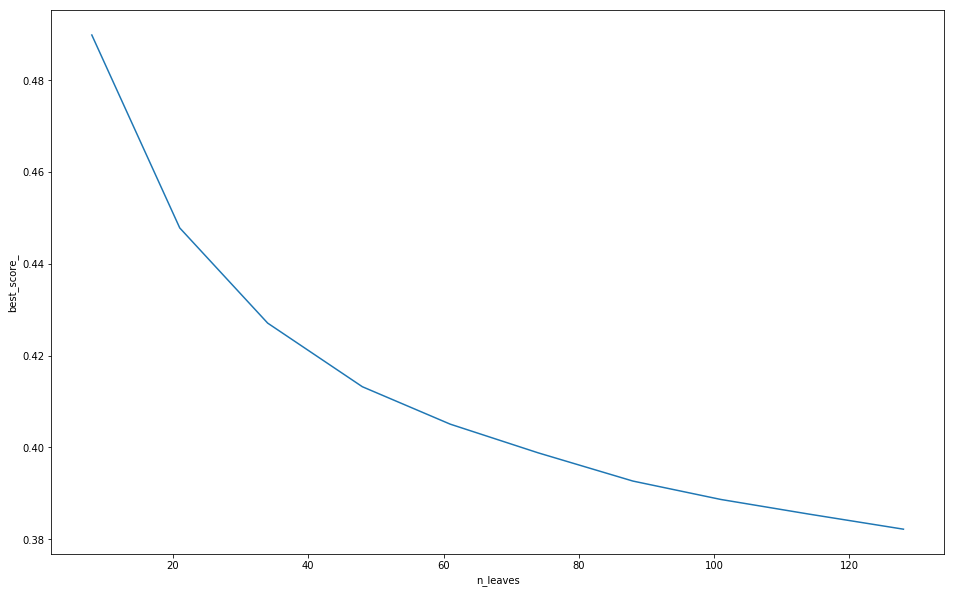

In [135]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

In [136]:
#----------------------------
#2. try larger value of num_leaves
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 128, stop = 256, num = 10).astype('int'):
    print ('n_leaves',n_leaves)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

n_leaves 128
[1]	valid_0's mape: 0.697234
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.677786
[3]	valid_0's mape: 0.662806
[4]	valid_0's mape: 0.64682
[5]	valid_0's mape: 0.634993
[6]	valid_0's mape: 0.625171
[7]	valid_0's mape: 0.61522
[8]	valid_0's mape: 0.605101
[9]	valid_0's mape: 0.595337
[10]	valid_0's mape: 0.588978
[11]	valid_0's mape: 0.582252
[12]	valid_0's mape: 0.575919
[13]	valid_0's mape: 0.569315
[14]	valid_0's mape: 0.560888
[15]	valid_0's mape: 0.556078
[16]	valid_0's mape: 0.552356
[17]	valid_0's mape: 0.54776
[18]	valid_0's mape: 0.543203
[19]	valid_0's mape: 0.539456
[20]	valid_0's mape: 0.535511
[21]	valid_0's mape: 0.529654
[22]	valid_0's mape: 0.524495
[23]	valid_0's mape: 0.521047
[24]	valid_0's mape: 0.517565
[25]	valid_0's mape: 0.512788
[26]	valid_0's mape: 0.508275
[27]	valid_0's mape: 0.504715
[28]	valid_0's mape: 0.501288
[29]	valid_0's mape: 0.4988
[30]	valid_0's mape: 0.496999
[31]	valid_0's mape: 0.494395
[32]	vali

[269]	valid_0's mape: 0.401042
[270]	valid_0's mape: 0.401008
[271]	valid_0's mape: 0.400948
[272]	valid_0's mape: 0.400871
[273]	valid_0's mape: 0.400759
[274]	valid_0's mape: 0.400662
[275]	valid_0's mape: 0.400611
[276]	valid_0's mape: 0.400464
[277]	valid_0's mape: 0.400422
[278]	valid_0's mape: 0.400366
[279]	valid_0's mape: 0.400304
[280]	valid_0's mape: 0.400221
[281]	valid_0's mape: 0.400099
[282]	valid_0's mape: 0.400046
[283]	valid_0's mape: 0.399963
[284]	valid_0's mape: 0.399926
[285]	valid_0's mape: 0.399897
[286]	valid_0's mape: 0.399881
[287]	valid_0's mape: 0.399806
[288]	valid_0's mape: 0.39979
[289]	valid_0's mape: 0.399721
[290]	valid_0's mape: 0.399687
[291]	valid_0's mape: 0.399615
[292]	valid_0's mape: 0.399578
[293]	valid_0's mape: 0.399467
[294]	valid_0's mape: 0.399461
[295]	valid_0's mape: 0.39944
[296]	valid_0's mape: 0.399442
[297]	valid_0's mape: 0.399431
[298]	valid_0's mape: 0.399418
[299]	valid_0's mape: 0.399316
[300]	valid_0's mape: 0.399249
[301]	vali

[535]	valid_0's mape: 0.39242
[536]	valid_0's mape: 0.392418
[537]	valid_0's mape: 0.39242
[538]	valid_0's mape: 0.392355
[539]	valid_0's mape: 0.392245
[540]	valid_0's mape: 0.39221
[541]	valid_0's mape: 0.392182
[542]	valid_0's mape: 0.39216
[543]	valid_0's mape: 0.392121
[544]	valid_0's mape: 0.392116
[545]	valid_0's mape: 0.392111
[546]	valid_0's mape: 0.392111
[547]	valid_0's mape: 0.392103
[548]	valid_0's mape: 0.392054
[549]	valid_0's mape: 0.392008
[550]	valid_0's mape: 0.391954
[551]	valid_0's mape: 0.39196
[552]	valid_0's mape: 0.391959
[553]	valid_0's mape: 0.391948
[554]	valid_0's mape: 0.391931
[555]	valid_0's mape: 0.391937
[556]	valid_0's mape: 0.39193
[557]	valid_0's mape: 0.39191
[558]	valid_0's mape: 0.391825
[559]	valid_0's mape: 0.391816
[560]	valid_0's mape: 0.391788
[561]	valid_0's mape: 0.391694
[562]	valid_0's mape: 0.391693
[563]	valid_0's mape: 0.391623
[564]	valid_0's mape: 0.391621
[565]	valid_0's mape: 0.391624
[566]	valid_0's mape: 0.391605
[567]	valid_0's

[801]	valid_0's mape: 0.388401
[802]	valid_0's mape: 0.388393
[803]	valid_0's mape: 0.388395
[804]	valid_0's mape: 0.388395
[805]	valid_0's mape: 0.388396
[806]	valid_0's mape: 0.388394
[807]	valid_0's mape: 0.388392
[808]	valid_0's mape: 0.388382
[809]	valid_0's mape: 0.388383
[810]	valid_0's mape: 0.388385
[811]	valid_0's mape: 0.388382
[812]	valid_0's mape: 0.388389
[813]	valid_0's mape: 0.38838
[814]	valid_0's mape: 0.38838
[815]	valid_0's mape: 0.388377
[816]	valid_0's mape: 0.388376
[817]	valid_0's mape: 0.388381
[818]	valid_0's mape: 0.388381
[819]	valid_0's mape: 0.388389
[820]	valid_0's mape: 0.388345
[821]	valid_0's mape: 0.388337
[822]	valid_0's mape: 0.388331
[823]	valid_0's mape: 0.38834
[824]	valid_0's mape: 0.38834
[825]	valid_0's mape: 0.38834
[826]	valid_0's mape: 0.388343
[827]	valid_0's mape: 0.388342
[828]	valid_0's mape: 0.388338
[829]	valid_0's mape: 0.388341
[830]	valid_0's mape: 0.388311
[831]	valid_0's mape: 0.388306
[832]	valid_0's mape: 0.388308
[833]	valid_0

[1068]	valid_0's mape: 0.386683
[1069]	valid_0's mape: 0.386696
[1070]	valid_0's mape: 0.386704
[1071]	valid_0's mape: 0.3867
[1072]	valid_0's mape: 0.386701
[1073]	valid_0's mape: 0.3867
[1074]	valid_0's mape: 0.386695
[1075]	valid_0's mape: 0.386686
[1076]	valid_0's mape: 0.38668
[1077]	valid_0's mape: 0.386674
Early stopping, best iteration is:
[1027]	valid_0's mape: 0.386661
[1]	valid_0's mape: 0.697906
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.680414
[3]	valid_0's mape: 0.664767
[4]	valid_0's mape: 0.649928
[5]	valid_0's mape: 0.635106
[6]	valid_0's mape: 0.623175
[7]	valid_0's mape: 0.61386
[8]	valid_0's mape: 0.604862
[9]	valid_0's mape: 0.59484
[10]	valid_0's mape: 0.585613
[11]	valid_0's mape: 0.578926
[12]	valid_0's mape: 0.570954
[13]	valid_0's mape: 0.562108
[14]	valid_0's mape: 0.556432
[15]	valid_0's mape: 0.551887
[16]	valid_0's mape: 0.545205
[17]	valid_0's mape: 0.540052
[18]	valid_0's mape: 0.535201
[19]	valid_0's mape: 0.5305

[256]	valid_0's mape: 0.398167
[257]	valid_0's mape: 0.398134
[258]	valid_0's mape: 0.398132
[259]	valid_0's mape: 0.398013
[260]	valid_0's mape: 0.397761
[261]	valid_0's mape: 0.397752
[262]	valid_0's mape: 0.39774
[263]	valid_0's mape: 0.397703
[264]	valid_0's mape: 0.397548
[265]	valid_0's mape: 0.397504
[266]	valid_0's mape: 0.397483
[267]	valid_0's mape: 0.397442
[268]	valid_0's mape: 0.3972
[269]	valid_0's mape: 0.397186
[270]	valid_0's mape: 0.397159
[271]	valid_0's mape: 0.39716
[272]	valid_0's mape: 0.397101
[273]	valid_0's mape: 0.397089
[274]	valid_0's mape: 0.397053
[275]	valid_0's mape: 0.397012
[276]	valid_0's mape: 0.39699
[277]	valid_0's mape: 0.396915
[278]	valid_0's mape: 0.396852
[279]	valid_0's mape: 0.396757
[280]	valid_0's mape: 0.396775
[281]	valid_0's mape: 0.396688
[282]	valid_0's mape: 0.396534
[283]	valid_0's mape: 0.396491
[284]	valid_0's mape: 0.396469
[285]	valid_0's mape: 0.396338
[286]	valid_0's mape: 0.396326
[287]	valid_0's mape: 0.396322
[288]	valid_0

[522]	valid_0's mape: 0.389762
[523]	valid_0's mape: 0.389681
[524]	valid_0's mape: 0.389646
[525]	valid_0's mape: 0.389641
[526]	valid_0's mape: 0.389599
[527]	valid_0's mape: 0.38957
[528]	valid_0's mape: 0.389559
[529]	valid_0's mape: 0.389491
[530]	valid_0's mape: 0.389466
[531]	valid_0's mape: 0.389402
[532]	valid_0's mape: 0.389375
[533]	valid_0's mape: 0.389348
[534]	valid_0's mape: 0.3893
[535]	valid_0's mape: 0.389292
[536]	valid_0's mape: 0.389269
[537]	valid_0's mape: 0.389257
[538]	valid_0's mape: 0.38924
[539]	valid_0's mape: 0.38923
[540]	valid_0's mape: 0.389196
[541]	valid_0's mape: 0.389189
[542]	valid_0's mape: 0.389168
[543]	valid_0's mape: 0.388973
[544]	valid_0's mape: 0.388944
[545]	valid_0's mape: 0.38878
[546]	valid_0's mape: 0.38875
[547]	valid_0's mape: 0.388744
[548]	valid_0's mape: 0.388711
[549]	valid_0's mape: 0.388706
[550]	valid_0's mape: 0.388701
[551]	valid_0's mape: 0.388689
[552]	valid_0's mape: 0.388655
[553]	valid_0's mape: 0.388647
[554]	valid_0's

[789]	valid_0's mape: 0.383435
[790]	valid_0's mape: 0.38339
[791]	valid_0's mape: 0.383393
[792]	valid_0's mape: 0.383395
[793]	valid_0's mape: 0.383381
[794]	valid_0's mape: 0.383382
[795]	valid_0's mape: 0.383381
[796]	valid_0's mape: 0.383383
[797]	valid_0's mape: 0.383379
[798]	valid_0's mape: 0.383385
[799]	valid_0's mape: 0.383383
[800]	valid_0's mape: 0.383382
[801]	valid_0's mape: 0.383382
[802]	valid_0's mape: 0.383377
[803]	valid_0's mape: 0.383372
[804]	valid_0's mape: 0.383345
[805]	valid_0's mape: 0.383304
[806]	valid_0's mape: 0.383291
[807]	valid_0's mape: 0.383286
[808]	valid_0's mape: 0.383283
[809]	valid_0's mape: 0.383271
[810]	valid_0's mape: 0.383271
[811]	valid_0's mape: 0.38327
[812]	valid_0's mape: 0.383253
[813]	valid_0's mape: 0.383248
[814]	valid_0's mape: 0.383247
[815]	valid_0's mape: 0.383234
[816]	valid_0's mape: 0.383231
[817]	valid_0's mape: 0.383233
[818]	valid_0's mape: 0.38323
[819]	valid_0's mape: 0.383223
[820]	valid_0's mape: 0.3832
[821]	valid_0

[1053]	valid_0's mape: 0.380647
[1054]	valid_0's mape: 0.38065
[1055]	valid_0's mape: 0.380647
[1056]	valid_0's mape: 0.380639
[1057]	valid_0's mape: 0.380636
[1058]	valid_0's mape: 0.380623
[1059]	valid_0's mape: 0.380616
[1060]	valid_0's mape: 0.380624
[1061]	valid_0's mape: 0.380629
[1062]	valid_0's mape: 0.380619
[1063]	valid_0's mape: 0.38057
[1064]	valid_0's mape: 0.380571
[1065]	valid_0's mape: 0.380581
[1066]	valid_0's mape: 0.380588
[1067]	valid_0's mape: 0.380575
[1068]	valid_0's mape: 0.380581
[1069]	valid_0's mape: 0.380577
[1070]	valid_0's mape: 0.380573
[1071]	valid_0's mape: 0.380555
[1072]	valid_0's mape: 0.380554
[1073]	valid_0's mape: 0.380554
[1074]	valid_0's mape: 0.380542
[1075]	valid_0's mape: 0.380523
[1076]	valid_0's mape: 0.380525
[1077]	valid_0's mape: 0.380523
[1078]	valid_0's mape: 0.380522
[1079]	valid_0's mape: 0.380524
[1080]	valid_0's mape: 0.38052
[1081]	valid_0's mape: 0.380518
[1082]	valid_0's mape: 0.380521
[1083]	valid_0's mape: 0.380523
[1084]	vali

[159]	valid_0's mape: 0.407867
[160]	valid_0's mape: 0.407697
[161]	valid_0's mape: 0.407665
[162]	valid_0's mape: 0.407573
[163]	valid_0's mape: 0.40754
[164]	valid_0's mape: 0.407427
[165]	valid_0's mape: 0.407387
[166]	valid_0's mape: 0.407386
[167]	valid_0's mape: 0.407307
[168]	valid_0's mape: 0.407162
[169]	valid_0's mape: 0.407119
[170]	valid_0's mape: 0.406931
[171]	valid_0's mape: 0.406632
[172]	valid_0's mape: 0.406553
[173]	valid_0's mape: 0.40654
[174]	valid_0's mape: 0.406412
[175]	valid_0's mape: 0.40622
[176]	valid_0's mape: 0.406108
[177]	valid_0's mape: 0.405926
[178]	valid_0's mape: 0.405613
[179]	valid_0's mape: 0.405466
[180]	valid_0's mape: 0.40487
[181]	valid_0's mape: 0.404827
[182]	valid_0's mape: 0.404673
[183]	valid_0's mape: 0.404569
[184]	valid_0's mape: 0.404437
[185]	valid_0's mape: 0.404343
[186]	valid_0's mape: 0.40427
[187]	valid_0's mape: 0.404183
[188]	valid_0's mape: 0.404139
[189]	valid_0's mape: 0.404119
[190]	valid_0's mape: 0.404038
[191]	valid_0

[426]	valid_0's mape: 0.392018
[427]	valid_0's mape: 0.392007
[428]	valid_0's mape: 0.391875
[429]	valid_0's mape: 0.391869
[430]	valid_0's mape: 0.391859
[431]	valid_0's mape: 0.391855
[432]	valid_0's mape: 0.391828
[433]	valid_0's mape: 0.391814
[434]	valid_0's mape: 0.391777
[435]	valid_0's mape: 0.391673
[436]	valid_0's mape: 0.391622
[437]	valid_0's mape: 0.391614
[438]	valid_0's mape: 0.391564
[439]	valid_0's mape: 0.391538
[440]	valid_0's mape: 0.391534
[441]	valid_0's mape: 0.391523
[442]	valid_0's mape: 0.391493
[443]	valid_0's mape: 0.391485
[444]	valid_0's mape: 0.391484
[445]	valid_0's mape: 0.391483
[446]	valid_0's mape: 0.391478
[447]	valid_0's mape: 0.391471
[448]	valid_0's mape: 0.391474
[449]	valid_0's mape: 0.391475
[450]	valid_0's mape: 0.391474
[451]	valid_0's mape: 0.391473
[452]	valid_0's mape: 0.39147
[453]	valid_0's mape: 0.391473
[454]	valid_0's mape: 0.39147
[455]	valid_0's mape: 0.391476
[456]	valid_0's mape: 0.391409
[457]	valid_0's mape: 0.391409
[458]	vali

[692]	valid_0's mape: 0.385906
[693]	valid_0's mape: 0.385911
[694]	valid_0's mape: 0.385883
[695]	valid_0's mape: 0.385838
[696]	valid_0's mape: 0.385839
[697]	valid_0's mape: 0.385838
[698]	valid_0's mape: 0.385828
[699]	valid_0's mape: 0.385832
[700]	valid_0's mape: 0.385837
[701]	valid_0's mape: 0.385834
[702]	valid_0's mape: 0.385828
[703]	valid_0's mape: 0.385834
[704]	valid_0's mape: 0.385834
[705]	valid_0's mape: 0.38584
[706]	valid_0's mape: 0.385752
[707]	valid_0's mape: 0.385749
[708]	valid_0's mape: 0.385745
[709]	valid_0's mape: 0.385742
[710]	valid_0's mape: 0.385743
[711]	valid_0's mape: 0.385741
[712]	valid_0's mape: 0.385739
[713]	valid_0's mape: 0.385738
[714]	valid_0's mape: 0.385722
[715]	valid_0's mape: 0.385714
[716]	valid_0's mape: 0.385691
[717]	valid_0's mape: 0.385689
[718]	valid_0's mape: 0.385649
[719]	valid_0's mape: 0.385637
[720]	valid_0's mape: 0.385632
[721]	valid_0's mape: 0.385608
[722]	valid_0's mape: 0.385577
[723]	valid_0's mape: 0.385558
[724]	val

[959]	valid_0's mape: 0.383624
[960]	valid_0's mape: 0.38363
[961]	valid_0's mape: 0.383635
[962]	valid_0's mape: 0.383629
[963]	valid_0's mape: 0.383625
[964]	valid_0's mape: 0.383579
[965]	valid_0's mape: 0.383571
[966]	valid_0's mape: 0.383553
[967]	valid_0's mape: 0.383555
[968]	valid_0's mape: 0.383558
[969]	valid_0's mape: 0.383535
[970]	valid_0's mape: 0.383538
[971]	valid_0's mape: 0.383535
[972]	valid_0's mape: 0.383512
[973]	valid_0's mape: 0.383509
[974]	valid_0's mape: 0.383507
[975]	valid_0's mape: 0.383504
[976]	valid_0's mape: 0.383499
[977]	valid_0's mape: 0.383473
[978]	valid_0's mape: 0.383462
[979]	valid_0's mape: 0.383435
[980]	valid_0's mape: 0.383433
[981]	valid_0's mape: 0.383388
[982]	valid_0's mape: 0.383389
[983]	valid_0's mape: 0.383373
[984]	valid_0's mape: 0.383368
[985]	valid_0's mape: 0.383374
[986]	valid_0's mape: 0.383344
[987]	valid_0's mape: 0.383284
[988]	valid_0's mape: 0.383246
[989]	valid_0's mape: 0.383186
[990]	valid_0's mape: 0.383186
[991]	val

[64]	valid_0's mape: 0.436608
[65]	valid_0's mape: 0.435807
[66]	valid_0's mape: 0.43527
[67]	valid_0's mape: 0.434257
[68]	valid_0's mape: 0.433501
[69]	valid_0's mape: 0.432925
[70]	valid_0's mape: 0.432352
[71]	valid_0's mape: 0.431645
[72]	valid_0's mape: 0.430609
[73]	valid_0's mape: 0.429893
[74]	valid_0's mape: 0.428737
[75]	valid_0's mape: 0.428325
[76]	valid_0's mape: 0.427914
[77]	valid_0's mape: 0.427376
[78]	valid_0's mape: 0.426933
[79]	valid_0's mape: 0.426445
[80]	valid_0's mape: 0.425886
[81]	valid_0's mape: 0.424774
[82]	valid_0's mape: 0.424344
[83]	valid_0's mape: 0.423896
[84]	valid_0's mape: 0.422888
[85]	valid_0's mape: 0.422506
[86]	valid_0's mape: 0.422277
[87]	valid_0's mape: 0.421841
[88]	valid_0's mape: 0.42166
[89]	valid_0's mape: 0.421316
[90]	valid_0's mape: 0.420875
[91]	valid_0's mape: 0.420568
[92]	valid_0's mape: 0.420298
[93]	valid_0's mape: 0.419807
[94]	valid_0's mape: 0.419514
[95]	valid_0's mape: 0.419172
[96]	valid_0's mape: 0.41784
[97]	valid_0'

[332]	valid_0's mape: 0.389987
[333]	valid_0's mape: 0.389979
[334]	valid_0's mape: 0.389973
[335]	valid_0's mape: 0.38996
[336]	valid_0's mape: 0.389958
[337]	valid_0's mape: 0.389951
[338]	valid_0's mape: 0.389944
[339]	valid_0's mape: 0.38994
[340]	valid_0's mape: 0.389942
[341]	valid_0's mape: 0.389918
[342]	valid_0's mape: 0.389838
[343]	valid_0's mape: 0.389828
[344]	valid_0's mape: 0.389787
[345]	valid_0's mape: 0.389728
[346]	valid_0's mape: 0.389684
[347]	valid_0's mape: 0.389651
[348]	valid_0's mape: 0.389595
[349]	valid_0's mape: 0.389463
[350]	valid_0's mape: 0.38941
[351]	valid_0's mape: 0.389389
[352]	valid_0's mape: 0.389352
[353]	valid_0's mape: 0.389238
[354]	valid_0's mape: 0.389016
[355]	valid_0's mape: 0.388874
[356]	valid_0's mape: 0.388836
[357]	valid_0's mape: 0.388822
[358]	valid_0's mape: 0.388813
[359]	valid_0's mape: 0.388781
[360]	valid_0's mape: 0.388706
[361]	valid_0's mape: 0.388641
[362]	valid_0's mape: 0.388529
[363]	valid_0's mape: 0.38852
[364]	valid_

[600]	valid_0's mape: 0.383076
[601]	valid_0's mape: 0.383078
[602]	valid_0's mape: 0.383076
[603]	valid_0's mape: 0.383082
[604]	valid_0's mape: 0.383059
[605]	valid_0's mape: 0.382917
[606]	valid_0's mape: 0.382919
[607]	valid_0's mape: 0.382892
[608]	valid_0's mape: 0.382896
[609]	valid_0's mape: 0.382898
[610]	valid_0's mape: 0.382887
[611]	valid_0's mape: 0.382882
[612]	valid_0's mape: 0.382874
[613]	valid_0's mape: 0.382865
[614]	valid_0's mape: 0.382858
[615]	valid_0's mape: 0.382862
[616]	valid_0's mape: 0.382834
[617]	valid_0's mape: 0.382838
[618]	valid_0's mape: 0.382802
[619]	valid_0's mape: 0.382805
[620]	valid_0's mape: 0.382796
[621]	valid_0's mape: 0.382799
[622]	valid_0's mape: 0.382785
[623]	valid_0's mape: 0.382783
[624]	valid_0's mape: 0.382762
[625]	valid_0's mape: 0.382741
[626]	valid_0's mape: 0.382742
[627]	valid_0's mape: 0.382744
[628]	valid_0's mape: 0.382747
[629]	valid_0's mape: 0.382742
[630]	valid_0's mape: 0.382734
[631]	valid_0's mape: 0.382717
[632]	va

[868]	valid_0's mape: 0.381741
[869]	valid_0's mape: 0.381739
[870]	valid_0's mape: 0.381733
[871]	valid_0's mape: 0.381726
[872]	valid_0's mape: 0.381727
[873]	valid_0's mape: 0.381692
[874]	valid_0's mape: 0.38168
[875]	valid_0's mape: 0.381685
[876]	valid_0's mape: 0.381701
[877]	valid_0's mape: 0.381701
[878]	valid_0's mape: 0.381701
[879]	valid_0's mape: 0.381701
[880]	valid_0's mape: 0.381697
[881]	valid_0's mape: 0.381711
[882]	valid_0's mape: 0.381718
[883]	valid_0's mape: 0.381709
[884]	valid_0's mape: 0.381704
[885]	valid_0's mape: 0.381691
[886]	valid_0's mape: 0.381699
[887]	valid_0's mape: 0.381705
[888]	valid_0's mape: 0.381697
[889]	valid_0's mape: 0.381714
[890]	valid_0's mape: 0.381715
[891]	valid_0's mape: 0.381721
[892]	valid_0's mape: 0.381722
[893]	valid_0's mape: 0.381724
[894]	valid_0's mape: 0.381715
[895]	valid_0's mape: 0.381716
[896]	valid_0's mape: 0.381708
[897]	valid_0's mape: 0.381712
[898]	valid_0's mape: 0.38171
[899]	valid_0's mape: 0.38172
[900]	valid

[210]	valid_0's mape: 0.399519
[211]	valid_0's mape: 0.399485
[212]	valid_0's mape: 0.399456
[213]	valid_0's mape: 0.399458
[214]	valid_0's mape: 0.399419
[215]	valid_0's mape: 0.399418
[216]	valid_0's mape: 0.399394
[217]	valid_0's mape: 0.399316
[218]	valid_0's mape: 0.399276
[219]	valid_0's mape: 0.399256
[220]	valid_0's mape: 0.399221
[221]	valid_0's mape: 0.399219
[222]	valid_0's mape: 0.399222
[223]	valid_0's mape: 0.399219
[224]	valid_0's mape: 0.399125
[225]	valid_0's mape: 0.399106
[226]	valid_0's mape: 0.399107
[227]	valid_0's mape: 0.399075
[228]	valid_0's mape: 0.399047
[229]	valid_0's mape: 0.399017
[230]	valid_0's mape: 0.398925
[231]	valid_0's mape: 0.398843
[232]	valid_0's mape: 0.398818
[233]	valid_0's mape: 0.39879
[234]	valid_0's mape: 0.398736
[235]	valid_0's mape: 0.398674
[236]	valid_0's mape: 0.398574
[237]	valid_0's mape: 0.398443
[238]	valid_0's mape: 0.398239
[239]	valid_0's mape: 0.398155
[240]	valid_0's mape: 0.398093
[241]	valid_0's mape: 0.398079
[242]	val

[478]	valid_0's mape: 0.386797
[479]	valid_0's mape: 0.38679
[480]	valid_0's mape: 0.386661
[481]	valid_0's mape: 0.386653
[482]	valid_0's mape: 0.386635
[483]	valid_0's mape: 0.386603
[484]	valid_0's mape: 0.386528
[485]	valid_0's mape: 0.386519
[486]	valid_0's mape: 0.386514
[487]	valid_0's mape: 0.386502
[488]	valid_0's mape: 0.386484
[489]	valid_0's mape: 0.386439
[490]	valid_0's mape: 0.386361
[491]	valid_0's mape: 0.386279
[492]	valid_0's mape: 0.386281
[493]	valid_0's mape: 0.386269
[494]	valid_0's mape: 0.386275
[495]	valid_0's mape: 0.386263
[496]	valid_0's mape: 0.386256
[497]	valid_0's mape: 0.386242
[498]	valid_0's mape: 0.386219
[499]	valid_0's mape: 0.386193
[500]	valid_0's mape: 0.386173
[501]	valid_0's mape: 0.386193
[502]	valid_0's mape: 0.386129
[503]	valid_0's mape: 0.386122
[504]	valid_0's mape: 0.386113
[505]	valid_0's mape: 0.386101
[506]	valid_0's mape: 0.386095
[507]	valid_0's mape: 0.386077
[508]	valid_0's mape: 0.386065
[509]	valid_0's mape: 0.386062
[510]	val

[746]	valid_0's mape: 0.383221
[747]	valid_0's mape: 0.383223
[748]	valid_0's mape: 0.383217
[749]	valid_0's mape: 0.383212
[750]	valid_0's mape: 0.383212
[751]	valid_0's mape: 0.383213
[752]	valid_0's mape: 0.383216
[753]	valid_0's mape: 0.383199
[754]	valid_0's mape: 0.383196
[755]	valid_0's mape: 0.383187
[756]	valid_0's mape: 0.383184
[757]	valid_0's mape: 0.383209
[758]	valid_0's mape: 0.383205
[759]	valid_0's mape: 0.383201
[760]	valid_0's mape: 0.383189
[761]	valid_0's mape: 0.383184
[762]	valid_0's mape: 0.383182
[763]	valid_0's mape: 0.38319
[764]	valid_0's mape: 0.383175
[765]	valid_0's mape: 0.383166
[766]	valid_0's mape: 0.383048
[767]	valid_0's mape: 0.383039
[768]	valid_0's mape: 0.383024
[769]	valid_0's mape: 0.38302
[770]	valid_0's mape: 0.383007
[771]	valid_0's mape: 0.383002
[772]	valid_0's mape: 0.382999
[773]	valid_0's mape: 0.383002
[774]	valid_0's mape: 0.383008
[775]	valid_0's mape: 0.383001
[776]	valid_0's mape: 0.383009
[777]	valid_0's mape: 0.383011
[778]	vali

[1014]	valid_0's mape: 0.381108
[1015]	valid_0's mape: 0.381053
[1016]	valid_0's mape: 0.381053
[1017]	valid_0's mape: 0.381054
[1018]	valid_0's mape: 0.381013
[1019]	valid_0's mape: 0.380999
[1020]	valid_0's mape: 0.380988
[1021]	valid_0's mape: 0.380987
[1022]	valid_0's mape: 0.380988
[1023]	valid_0's mape: 0.380994
[1024]	valid_0's mape: 0.380974
[1025]	valid_0's mape: 0.380975
[1026]	valid_0's mape: 0.380975
[1027]	valid_0's mape: 0.380966
[1028]	valid_0's mape: 0.380964
[1029]	valid_0's mape: 0.380958
[1030]	valid_0's mape: 0.380954
[1031]	valid_0's mape: 0.380953
[1032]	valid_0's mape: 0.380955
[1033]	valid_0's mape: 0.380943
[1034]	valid_0's mape: 0.380923
[1035]	valid_0's mape: 0.380913
[1036]	valid_0's mape: 0.380845
[1037]	valid_0's mape: 0.38084
[1038]	valid_0's mape: 0.380816
[1039]	valid_0's mape: 0.380794
[1040]	valid_0's mape: 0.380702
[1041]	valid_0's mape: 0.380677
[1042]	valid_0's mape: 0.380675
[1043]	valid_0's mape: 0.380675
[1044]	valid_0's mape: 0.380677
[1045]	va

[121]	valid_0's mape: 0.414216
[122]	valid_0's mape: 0.414077
[123]	valid_0's mape: 0.413924
[124]	valid_0's mape: 0.413599
[125]	valid_0's mape: 0.413359
[126]	valid_0's mape: 0.412745
[127]	valid_0's mape: 0.412605
[128]	valid_0's mape: 0.412452
[129]	valid_0's mape: 0.412378
[130]	valid_0's mape: 0.412186
[131]	valid_0's mape: 0.411937
[132]	valid_0's mape: 0.411759
[133]	valid_0's mape: 0.41165
[134]	valid_0's mape: 0.411468
[135]	valid_0's mape: 0.411154
[136]	valid_0's mape: 0.410994
[137]	valid_0's mape: 0.410854
[138]	valid_0's mape: 0.410544
[139]	valid_0's mape: 0.41033
[140]	valid_0's mape: 0.410061
[141]	valid_0's mape: 0.409929
[142]	valid_0's mape: 0.409702
[143]	valid_0's mape: 0.409473
[144]	valid_0's mape: 0.409391
[145]	valid_0's mape: 0.409116
[146]	valid_0's mape: 0.408922
[147]	valid_0's mape: 0.408826
[148]	valid_0's mape: 0.408769
[149]	valid_0's mape: 0.408482
[150]	valid_0's mape: 0.408236
[151]	valid_0's mape: 0.408181
[152]	valid_0's mape: 0.408091
[153]	vali

[389]	valid_0's mape: 0.391643
[390]	valid_0's mape: 0.391633
[391]	valid_0's mape: 0.391626
[392]	valid_0's mape: 0.391619
[393]	valid_0's mape: 0.39162
[394]	valid_0's mape: 0.391576
[395]	valid_0's mape: 0.391563
[396]	valid_0's mape: 0.391544
[397]	valid_0's mape: 0.39154
[398]	valid_0's mape: 0.391451
[399]	valid_0's mape: 0.391427
[400]	valid_0's mape: 0.391395
[401]	valid_0's mape: 0.391376
[402]	valid_0's mape: 0.391354
[403]	valid_0's mape: 0.391326
[404]	valid_0's mape: 0.391252
[405]	valid_0's mape: 0.391197
[406]	valid_0's mape: 0.391186
[407]	valid_0's mape: 0.391156
[408]	valid_0's mape: 0.391093
[409]	valid_0's mape: 0.391091
[410]	valid_0's mape: 0.391073
[411]	valid_0's mape: 0.391052
[412]	valid_0's mape: 0.391027
[413]	valid_0's mape: 0.391023
[414]	valid_0's mape: 0.39102
[415]	valid_0's mape: 0.391
[416]	valid_0's mape: 0.390968
[417]	valid_0's mape: 0.390974
[418]	valid_0's mape: 0.390952
[419]	valid_0's mape: 0.390931
[420]	valid_0's mape: 0.390914
[421]	valid_0'

[657]	valid_0's mape: 0.385705
[658]	valid_0's mape: 0.385707
[659]	valid_0's mape: 0.385708
[660]	valid_0's mape: 0.385712
[661]	valid_0's mape: 0.38571
[662]	valid_0's mape: 0.385714
[663]	valid_0's mape: 0.385715
[664]	valid_0's mape: 0.385672
[665]	valid_0's mape: 0.385657
[666]	valid_0's mape: 0.385655
[667]	valid_0's mape: 0.385656
[668]	valid_0's mape: 0.385659
[669]	valid_0's mape: 0.385658
[670]	valid_0's mape: 0.385614
[671]	valid_0's mape: 0.385601
[672]	valid_0's mape: 0.385593
[673]	valid_0's mape: 0.385587
[674]	valid_0's mape: 0.385566
[675]	valid_0's mape: 0.385565
[676]	valid_0's mape: 0.385556
[677]	valid_0's mape: 0.385552
[678]	valid_0's mape: 0.385551
[679]	valid_0's mape: 0.385555
[680]	valid_0's mape: 0.385549
[681]	valid_0's mape: 0.385553
[682]	valid_0's mape: 0.385552
[683]	valid_0's mape: 0.385548
[684]	valid_0's mape: 0.385548
[685]	valid_0's mape: 0.385532
[686]	valid_0's mape: 0.3855
[687]	valid_0's mape: 0.385484
[688]	valid_0's mape: 0.385482
[689]	valid

[923]	valid_0's mape: 0.38375
[924]	valid_0's mape: 0.383728
[925]	valid_0's mape: 0.383725
[926]	valid_0's mape: 0.383728
[927]	valid_0's mape: 0.383719
[928]	valid_0's mape: 0.383717
[929]	valid_0's mape: 0.383717
[930]	valid_0's mape: 0.383725
[931]	valid_0's mape: 0.383734
[932]	valid_0's mape: 0.38373
[933]	valid_0's mape: 0.38373
[934]	valid_0's mape: 0.383736
[935]	valid_0's mape: 0.38374
[936]	valid_0's mape: 0.383735
[937]	valid_0's mape: 0.383739
[938]	valid_0's mape: 0.383731
[939]	valid_0's mape: 0.383734
[940]	valid_0's mape: 0.383731
[941]	valid_0's mape: 0.383745
[942]	valid_0's mape: 0.383735
[943]	valid_0's mape: 0.38373
[944]	valid_0's mape: 0.383718
[945]	valid_0's mape: 0.383717
[946]	valid_0's mape: 0.383709
[947]	valid_0's mape: 0.383692
[948]	valid_0's mape: 0.38368
[949]	valid_0's mape: 0.383678
[950]	valid_0's mape: 0.383668
[951]	valid_0's mape: 0.383678
[952]	valid_0's mape: 0.383678
[953]	valid_0's mape: 0.383681
[954]	valid_0's mape: 0.383669
[955]	valid_0'

[25]	valid_0's mape: 0.497259
[26]	valid_0's mape: 0.494695
[27]	valid_0's mape: 0.491101
[28]	valid_0's mape: 0.488595
[29]	valid_0's mape: 0.486536
[30]	valid_0's mape: 0.483066
[31]	valid_0's mape: 0.480565
[32]	valid_0's mape: 0.479102
[33]	valid_0's mape: 0.475869
[34]	valid_0's mape: 0.473128
[35]	valid_0's mape: 0.471072
[36]	valid_0's mape: 0.468985
[37]	valid_0's mape: 0.466823
[38]	valid_0's mape: 0.464996
[39]	valid_0's mape: 0.463623
[40]	valid_0's mape: 0.461668
[41]	valid_0's mape: 0.459384
[42]	valid_0's mape: 0.457757
[43]	valid_0's mape: 0.455928
[44]	valid_0's mape: 0.454992
[45]	valid_0's mape: 0.453501
[46]	valid_0's mape: 0.452189
[47]	valid_0's mape: 0.450767
[48]	valid_0's mape: 0.449998
[49]	valid_0's mape: 0.449529
[50]	valid_0's mape: 0.44849
[51]	valid_0's mape: 0.447205
[52]	valid_0's mape: 0.446506
[53]	valid_0's mape: 0.444886
[54]	valid_0's mape: 0.443519
[55]	valid_0's mape: 0.442434
[56]	valid_0's mape: 0.441764
[57]	valid_0's mape: 0.440037
[58]	valid_

[294]	valid_0's mape: 0.390179
[295]	valid_0's mape: 0.390152
[296]	valid_0's mape: 0.390066
[297]	valid_0's mape: 0.390007
[298]	valid_0's mape: 0.389946
[299]	valid_0's mape: 0.389923
[300]	valid_0's mape: 0.389894
[301]	valid_0's mape: 0.389889
[302]	valid_0's mape: 0.38987
[303]	valid_0's mape: 0.389872
[304]	valid_0's mape: 0.389857
[305]	valid_0's mape: 0.389834
[306]	valid_0's mape: 0.389748
[307]	valid_0's mape: 0.389701
[308]	valid_0's mape: 0.389688
[309]	valid_0's mape: 0.389673
[310]	valid_0's mape: 0.389625
[311]	valid_0's mape: 0.389579
[312]	valid_0's mape: 0.389553
[313]	valid_0's mape: 0.389518
[314]	valid_0's mape: 0.389482
[315]	valid_0's mape: 0.389472
[316]	valid_0's mape: 0.389371
[317]	valid_0's mape: 0.389346
[318]	valid_0's mape: 0.389335
[319]	valid_0's mape: 0.389325
[320]	valid_0's mape: 0.389297
[321]	valid_0's mape: 0.389089
[322]	valid_0's mape: 0.389029
[323]	valid_0's mape: 0.388984
[324]	valid_0's mape: 0.388927
[325]	valid_0's mape: 0.38887
[326]	vali

[561]	valid_0's mape: 0.383614
[562]	valid_0's mape: 0.383604
[563]	valid_0's mape: 0.383532
[564]	valid_0's mape: 0.383531
[565]	valid_0's mape: 0.38346
[566]	valid_0's mape: 0.383437
[567]	valid_0's mape: 0.383419
[568]	valid_0's mape: 0.383363
[569]	valid_0's mape: 0.383302
[570]	valid_0's mape: 0.383276
[571]	valid_0's mape: 0.383247
[572]	valid_0's mape: 0.383196
[573]	valid_0's mape: 0.383159
[574]	valid_0's mape: 0.383142
[575]	valid_0's mape: 0.383143
[576]	valid_0's mape: 0.383118
[577]	valid_0's mape: 0.383114
[578]	valid_0's mape: 0.383019
[579]	valid_0's mape: 0.383
[580]	valid_0's mape: 0.38298
[581]	valid_0's mape: 0.38297
[582]	valid_0's mape: 0.382957
[583]	valid_0's mape: 0.38291
[584]	valid_0's mape: 0.38289
[585]	valid_0's mape: 0.382871
[586]	valid_0's mape: 0.382861
[587]	valid_0's mape: 0.382853
[588]	valid_0's mape: 0.382808
[589]	valid_0's mape: 0.382762
[590]	valid_0's mape: 0.382715
[591]	valid_0's mape: 0.382669
[592]	valid_0's mape: 0.38261
[593]	valid_0's m

[829]	valid_0's mape: 0.379333
[830]	valid_0's mape: 0.379334
[831]	valid_0's mape: 0.379324
[832]	valid_0's mape: 0.379325
[833]	valid_0's mape: 0.379311
[834]	valid_0's mape: 0.379309
[835]	valid_0's mape: 0.379306
[836]	valid_0's mape: 0.379304
[837]	valid_0's mape: 0.379298
[838]	valid_0's mape: 0.379303
[839]	valid_0's mape: 0.379314
[840]	valid_0's mape: 0.379325
[841]	valid_0's mape: 0.379235
[842]	valid_0's mape: 0.379239
[843]	valid_0's mape: 0.379229
[844]	valid_0's mape: 0.379232
[845]	valid_0's mape: 0.379175
[846]	valid_0's mape: 0.379159
[847]	valid_0's mape: 0.379135
[848]	valid_0's mape: 0.379136
[849]	valid_0's mape: 0.379128
[850]	valid_0's mape: 0.379134
[851]	valid_0's mape: 0.379134
[852]	valid_0's mape: 0.379112
[853]	valid_0's mape: 0.37907
[854]	valid_0's mape: 0.379068
[855]	valid_0's mape: 0.379057
[856]	valid_0's mape: 0.37901
[857]	valid_0's mape: 0.379012
[858]	valid_0's mape: 0.379008
[859]	valid_0's mape: 0.379003
[860]	valid_0's mape: 0.378999
[861]	vali

[1093]	valid_0's mape: 0.377756
[1094]	valid_0's mape: 0.377759
[1095]	valid_0's mape: 0.377759
[1096]	valid_0's mape: 0.377758
[1097]	valid_0's mape: 0.377736
[1098]	valid_0's mape: 0.377729
[1099]	valid_0's mape: 0.37773
[1100]	valid_0's mape: 0.377722
[1101]	valid_0's mape: 0.377723
[1102]	valid_0's mape: 0.377723
[1103]	valid_0's mape: 0.377715
[1104]	valid_0's mape: 0.377714
[1105]	valid_0's mape: 0.377672
[1106]	valid_0's mape: 0.377663
[1107]	valid_0's mape: 0.37764
[1108]	valid_0's mape: 0.377634
[1109]	valid_0's mape: 0.377631
[1110]	valid_0's mape: 0.377629
[1111]	valid_0's mape: 0.377624
[1112]	valid_0's mape: 0.377618
[1113]	valid_0's mape: 0.377611
[1114]	valid_0's mape: 0.377605
[1115]	valid_0's mape: 0.37761
[1116]	valid_0's mape: 0.377608
[1117]	valid_0's mape: 0.377604
[1118]	valid_0's mape: 0.377604
[1119]	valid_0's mape: 0.377599
[1120]	valid_0's mape: 0.377598
[1121]	valid_0's mape: 0.377594
[1122]	valid_0's mape: 0.377588
[1123]	valid_0's mape: 0.377575
[1124]	vali

[202]	valid_0's mape: 0.398342
[203]	valid_0's mape: 0.398247
[204]	valid_0's mape: 0.398217
[205]	valid_0's mape: 0.398174
[206]	valid_0's mape: 0.398017
[207]	valid_0's mape: 0.397994
[208]	valid_0's mape: 0.39798
[209]	valid_0's mape: 0.397936
[210]	valid_0's mape: 0.397888
[211]	valid_0's mape: 0.397877
[212]	valid_0's mape: 0.397746
[213]	valid_0's mape: 0.397729
[214]	valid_0's mape: 0.397656
[215]	valid_0's mape: 0.397617
[216]	valid_0's mape: 0.397497
[217]	valid_0's mape: 0.397393
[218]	valid_0's mape: 0.397341
[219]	valid_0's mape: 0.397265
[220]	valid_0's mape: 0.397137
[221]	valid_0's mape: 0.397078
[222]	valid_0's mape: 0.396974
[223]	valid_0's mape: 0.396938
[224]	valid_0's mape: 0.396916
[225]	valid_0's mape: 0.396827
[226]	valid_0's mape: 0.39667
[227]	valid_0's mape: 0.39666
[228]	valid_0's mape: 0.396643
[229]	valid_0's mape: 0.396592
[230]	valid_0's mape: 0.396565
[231]	valid_0's mape: 0.396407
[232]	valid_0's mape: 0.396354
[233]	valid_0's mape: 0.396283
[234]	valid

[470]	valid_0's mape: 0.386183
[471]	valid_0's mape: 0.386167
[472]	valid_0's mape: 0.386165
[473]	valid_0's mape: 0.386163
[474]	valid_0's mape: 0.386151
[475]	valid_0's mape: 0.386137
[476]	valid_0's mape: 0.386123
[477]	valid_0's mape: 0.386119
[478]	valid_0's mape: 0.386119
[479]	valid_0's mape: 0.386089
[480]	valid_0's mape: 0.386098
[481]	valid_0's mape: 0.386085
[482]	valid_0's mape: 0.386067
[483]	valid_0's mape: 0.386054
[484]	valid_0's mape: 0.386047
[485]	valid_0's mape: 0.386026
[486]	valid_0's mape: 0.386026
[487]	valid_0's mape: 0.386021
[488]	valid_0's mape: 0.386016
[489]	valid_0's mape: 0.386015
[490]	valid_0's mape: 0.386007
[491]	valid_0's mape: 0.386008
[492]	valid_0's mape: 0.386007
[493]	valid_0's mape: 0.386007
[494]	valid_0's mape: 0.385966
[495]	valid_0's mape: 0.385958
[496]	valid_0's mape: 0.385953
[497]	valid_0's mape: 0.38594
[498]	valid_0's mape: 0.385943
[499]	valid_0's mape: 0.385919
[500]	valid_0's mape: 0.38591
[501]	valid_0's mape: 0.385875
[502]	vali

[737]	valid_0's mape: 0.382316
[738]	valid_0's mape: 0.382311
[739]	valid_0's mape: 0.382305
[740]	valid_0's mape: 0.382304
[741]	valid_0's mape: 0.382299
[742]	valid_0's mape: 0.382298
[743]	valid_0's mape: 0.382285
[744]	valid_0's mape: 0.382286
[745]	valid_0's mape: 0.382282
[746]	valid_0's mape: 0.382283
[747]	valid_0's mape: 0.382282
[748]	valid_0's mape: 0.382287
[749]	valid_0's mape: 0.382287
[750]	valid_0's mape: 0.382284
[751]	valid_0's mape: 0.382269
[752]	valid_0's mape: 0.382261
[753]	valid_0's mape: 0.382261
[754]	valid_0's mape: 0.382264
[755]	valid_0's mape: 0.382254
[756]	valid_0's mape: 0.38222
[757]	valid_0's mape: 0.38222
[758]	valid_0's mape: 0.382219
[759]	valid_0's mape: 0.382215
[760]	valid_0's mape: 0.382201
[761]	valid_0's mape: 0.382189
[762]	valid_0's mape: 0.382195
[763]	valid_0's mape: 0.382187
[764]	valid_0's mape: 0.382163
[765]	valid_0's mape: 0.382147
[766]	valid_0's mape: 0.381911
[767]	valid_0's mape: 0.381882
[768]	valid_0's mape: 0.381882
[769]	vali

[1003]	valid_0's mape: 0.379526
[1004]	valid_0's mape: 0.379532
[1005]	valid_0's mape: 0.379536
[1006]	valid_0's mape: 0.379509
[1007]	valid_0's mape: 0.379508
[1008]	valid_0's mape: 0.37951
[1009]	valid_0's mape: 0.379506
[1010]	valid_0's mape: 0.37951
[1011]	valid_0's mape: 0.379512
[1012]	valid_0's mape: 0.379501
[1013]	valid_0's mape: 0.379483
[1014]	valid_0's mape: 0.379483
[1015]	valid_0's mape: 0.379489
[1016]	valid_0's mape: 0.379483
[1017]	valid_0's mape: 0.379474
[1018]	valid_0's mape: 0.379458
[1019]	valid_0's mape: 0.379459
[1020]	valid_0's mape: 0.37944
[1021]	valid_0's mape: 0.37944
[1022]	valid_0's mape: 0.37943
[1023]	valid_0's mape: 0.379432
[1024]	valid_0's mape: 0.379429
[1025]	valid_0's mape: 0.379429
[1026]	valid_0's mape: 0.379425
[1027]	valid_0's mape: 0.379415
[1028]	valid_0's mape: 0.379411
[1029]	valid_0's mape: 0.379397
[1030]	valid_0's mape: 0.379382
[1031]	valid_0's mape: 0.379365
[1032]	valid_0's mape: 0.379362
[1033]	valid_0's mape: 0.379304
[1034]	valid_

[110]	valid_0's mape: 0.414072
[111]	valid_0's mape: 0.413947
[112]	valid_0's mape: 0.413484
[113]	valid_0's mape: 0.41318
[114]	valid_0's mape: 0.412999
[115]	valid_0's mape: 0.412927
[116]	valid_0's mape: 0.41285
[117]	valid_0's mape: 0.412757
[118]	valid_0's mape: 0.412213
[119]	valid_0's mape: 0.41193
[120]	valid_0's mape: 0.411632
[121]	valid_0's mape: 0.411468
[122]	valid_0's mape: 0.411304
[123]	valid_0's mape: 0.410967
[124]	valid_0's mape: 0.41035
[125]	valid_0's mape: 0.410206
[126]	valid_0's mape: 0.410131
[127]	valid_0's mape: 0.40989
[128]	valid_0's mape: 0.409468
[129]	valid_0's mape: 0.409132
[130]	valid_0's mape: 0.409011
[131]	valid_0's mape: 0.408981
[132]	valid_0's mape: 0.408926
[133]	valid_0's mape: 0.408599
[134]	valid_0's mape: 0.408545
[135]	valid_0's mape: 0.408484
[136]	valid_0's mape: 0.408195
[137]	valid_0's mape: 0.408018
[138]	valid_0's mape: 0.407879
[139]	valid_0's mape: 0.407331
[140]	valid_0's mape: 0.406942
[141]	valid_0's mape: 0.406896
[142]	valid_0

[376]	valid_0's mape: 0.38921
[377]	valid_0's mape: 0.38921
[378]	valid_0's mape: 0.389207
[379]	valid_0's mape: 0.389205
[380]	valid_0's mape: 0.389187
[381]	valid_0's mape: 0.389118
[382]	valid_0's mape: 0.389105
[383]	valid_0's mape: 0.38905
[384]	valid_0's mape: 0.389033
[385]	valid_0's mape: 0.389024
[386]	valid_0's mape: 0.388912
[387]	valid_0's mape: 0.388748
[388]	valid_0's mape: 0.388657
[389]	valid_0's mape: 0.388647
[390]	valid_0's mape: 0.388596
[391]	valid_0's mape: 0.388501
[392]	valid_0's mape: 0.388495
[393]	valid_0's mape: 0.388484
[394]	valid_0's mape: 0.388455
[395]	valid_0's mape: 0.388434
[396]	valid_0's mape: 0.388428
[397]	valid_0's mape: 0.388286
[398]	valid_0's mape: 0.388197
[399]	valid_0's mape: 0.388169
[400]	valid_0's mape: 0.388047
[401]	valid_0's mape: 0.388031
[402]	valid_0's mape: 0.38801
[403]	valid_0's mape: 0.38799
[404]	valid_0's mape: 0.387982
[405]	valid_0's mape: 0.387916
[406]	valid_0's mape: 0.387867
[407]	valid_0's mape: 0.387813
[408]	valid_0

[644]	valid_0's mape: 0.383491
[645]	valid_0's mape: 0.383494
[646]	valid_0's mape: 0.38349
[647]	valid_0's mape: 0.383489
[648]	valid_0's mape: 0.383466
[649]	valid_0's mape: 0.383455
[650]	valid_0's mape: 0.383455
[651]	valid_0's mape: 0.383444
[652]	valid_0's mape: 0.383431
[653]	valid_0's mape: 0.383433
[654]	valid_0's mape: 0.38341
[655]	valid_0's mape: 0.383405
[656]	valid_0's mape: 0.383353
[657]	valid_0's mape: 0.383347
[658]	valid_0's mape: 0.383332
[659]	valid_0's mape: 0.383328
[660]	valid_0's mape: 0.383327
[661]	valid_0's mape: 0.38331
[662]	valid_0's mape: 0.38331
[663]	valid_0's mape: 0.3833
[664]	valid_0's mape: 0.383293
[665]	valid_0's mape: 0.383291
[666]	valid_0's mape: 0.383289
[667]	valid_0's mape: 0.383282
[668]	valid_0's mape: 0.383284
[669]	valid_0's mape: 0.383285
[670]	valid_0's mape: 0.383288
[671]	valid_0's mape: 0.383274
[672]	valid_0's mape: 0.383205
[673]	valid_0's mape: 0.383196
[674]	valid_0's mape: 0.383179
[675]	valid_0's mape: 0.383174
[676]	valid_0'

[911]	valid_0's mape: 0.379877
[912]	valid_0's mape: 0.379874
[913]	valid_0's mape: 0.379841
[914]	valid_0's mape: 0.379811
[915]	valid_0's mape: 0.379816
[916]	valid_0's mape: 0.379779
[917]	valid_0's mape: 0.379793
[918]	valid_0's mape: 0.37978
[919]	valid_0's mape: 0.379775
[920]	valid_0's mape: 0.379769
[921]	valid_0's mape: 0.379778
[922]	valid_0's mape: 0.379774
[923]	valid_0's mape: 0.379785
[924]	valid_0's mape: 0.379724
[925]	valid_0's mape: 0.379728
[926]	valid_0's mape: 0.37972
[927]	valid_0's mape: 0.379725
[928]	valid_0's mape: 0.379701
[929]	valid_0's mape: 0.379696
[930]	valid_0's mape: 0.379672
[931]	valid_0's mape: 0.379669
[932]	valid_0's mape: 0.379662
[933]	valid_0's mape: 0.379666
[934]	valid_0's mape: 0.379653
[935]	valid_0's mape: 0.379654
[936]	valid_0's mape: 0.37965
[937]	valid_0's mape: 0.379647
[938]	valid_0's mape: 0.379654
[939]	valid_0's mape: 0.379659
[940]	valid_0's mape: 0.379656
[941]	valid_0's mape: 0.379654
[942]	valid_0's mape: 0.379647
[943]	valid

[14]	valid_0's mape: 0.550715
[15]	valid_0's mape: 0.545989
[16]	valid_0's mape: 0.541252
[17]	valid_0's mape: 0.535105
[18]	valid_0's mape: 0.529943
[19]	valid_0's mape: 0.524797
[20]	valid_0's mape: 0.519782
[21]	valid_0's mape: 0.514774
[22]	valid_0's mape: 0.508672
[23]	valid_0's mape: 0.504271
[24]	valid_0's mape: 0.500554
[25]	valid_0's mape: 0.496149
[26]	valid_0's mape: 0.492098
[27]	valid_0's mape: 0.489355
[28]	valid_0's mape: 0.485546
[29]	valid_0's mape: 0.482793
[30]	valid_0's mape: 0.479959
[31]	valid_0's mape: 0.478004
[32]	valid_0's mape: 0.475711
[33]	valid_0's mape: 0.47222
[34]	valid_0's mape: 0.470283
[35]	valid_0's mape: 0.467893
[36]	valid_0's mape: 0.465654
[37]	valid_0's mape: 0.463996
[38]	valid_0's mape: 0.462177
[39]	valid_0's mape: 0.460207
[40]	valid_0's mape: 0.4577
[41]	valid_0's mape: 0.455922
[42]	valid_0's mape: 0.453824
[43]	valid_0's mape: 0.452389
[44]	valid_0's mape: 0.451224
[45]	valid_0's mape: 0.449677
[46]	valid_0's mape: 0.448527
[47]	valid_0'

[283]	valid_0's mape: 0.390982
[284]	valid_0's mape: 0.390968
[285]	valid_0's mape: 0.390943
[286]	valid_0's mape: 0.390924
[287]	valid_0's mape: 0.390882
[288]	valid_0's mape: 0.390862
[289]	valid_0's mape: 0.390865
[290]	valid_0's mape: 0.390851
[291]	valid_0's mape: 0.390809
[292]	valid_0's mape: 0.390684
[293]	valid_0's mape: 0.390674
[294]	valid_0's mape: 0.39064
[295]	valid_0's mape: 0.390615
[296]	valid_0's mape: 0.390526
[297]	valid_0's mape: 0.390501
[298]	valid_0's mape: 0.390327
[299]	valid_0's mape: 0.390246
[300]	valid_0's mape: 0.390155
[301]	valid_0's mape: 0.390133
[302]	valid_0's mape: 0.390134
[303]	valid_0's mape: 0.390112
[304]	valid_0's mape: 0.389981
[305]	valid_0's mape: 0.389939
[306]	valid_0's mape: 0.389928
[307]	valid_0's mape: 0.389892
[308]	valid_0's mape: 0.38982
[309]	valid_0's mape: 0.389723
[310]	valid_0's mape: 0.389719
[311]	valid_0's mape: 0.38971
[312]	valid_0's mape: 0.389685
[313]	valid_0's mape: 0.389683
[314]	valid_0's mape: 0.389637
[315]	valid

[549]	valid_0's mape: 0.383748
[550]	valid_0's mape: 0.383749
[551]	valid_0's mape: 0.38373
[552]	valid_0's mape: 0.383693
[553]	valid_0's mape: 0.383631
[554]	valid_0's mape: 0.383553
[555]	valid_0's mape: 0.383413
[556]	valid_0's mape: 0.383394
[557]	valid_0's mape: 0.383397
[558]	valid_0's mape: 0.383385
[559]	valid_0's mape: 0.383319
[560]	valid_0's mape: 0.383252
[561]	valid_0's mape: 0.383254
[562]	valid_0's mape: 0.383174
[563]	valid_0's mape: 0.383163
[564]	valid_0's mape: 0.383114
[565]	valid_0's mape: 0.383116
[566]	valid_0's mape: 0.383084
[567]	valid_0's mape: 0.383071
[568]	valid_0's mape: 0.383073
[569]	valid_0's mape: 0.383072
[570]	valid_0's mape: 0.383071
[571]	valid_0's mape: 0.38307
[572]	valid_0's mape: 0.383061
[573]	valid_0's mape: 0.383022
[574]	valid_0's mape: 0.382988
[575]	valid_0's mape: 0.382921
[576]	valid_0's mape: 0.382912
[577]	valid_0's mape: 0.382878
[578]	valid_0's mape: 0.382858
[579]	valid_0's mape: 0.382843
[580]	valid_0's mape: 0.382833
[581]	vali

[815]	valid_0's mape: 0.380047
[816]	valid_0's mape: 0.380054
[817]	valid_0's mape: 0.379962
[818]	valid_0's mape: 0.379963
[819]	valid_0's mape: 0.379954
[820]	valid_0's mape: 0.379927
[821]	valid_0's mape: 0.37992
[822]	valid_0's mape: 0.379901
[823]	valid_0's mape: 0.379897
[824]	valid_0's mape: 0.379894
[825]	valid_0's mape: 0.379881
[826]	valid_0's mape: 0.379845
[827]	valid_0's mape: 0.379848
[828]	valid_0's mape: 0.37984
[829]	valid_0's mape: 0.379828
[830]	valid_0's mape: 0.379829
[831]	valid_0's mape: 0.379819
[832]	valid_0's mape: 0.379807
[833]	valid_0's mape: 0.379781
[834]	valid_0's mape: 0.37977
[835]	valid_0's mape: 0.379785
[836]	valid_0's mape: 0.379767
[837]	valid_0's mape: 0.379774
[838]	valid_0's mape: 0.379778
[839]	valid_0's mape: 0.379776
[840]	valid_0's mape: 0.379777
[841]	valid_0's mape: 0.37978
[842]	valid_0's mape: 0.379783
[843]	valid_0's mape: 0.379782
[844]	valid_0's mape: 0.379786
[845]	valid_0's mape: 0.37978
[846]	valid_0's mape: 0.379754
[847]	valid_0

[1078]	valid_0's mape: 0.37864
[1079]	valid_0's mape: 0.37864
[1080]	valid_0's mape: 0.378639
[1081]	valid_0's mape: 0.378648
[1082]	valid_0's mape: 0.378551
[1083]	valid_0's mape: 0.378544
[1084]	valid_0's mape: 0.378533
[1085]	valid_0's mape: 0.378524
[1086]	valid_0's mape: 0.378529
[1087]	valid_0's mape: 0.378518
[1088]	valid_0's mape: 0.378499
[1089]	valid_0's mape: 0.378491
[1090]	valid_0's mape: 0.378482
[1091]	valid_0's mape: 0.378486
[1092]	valid_0's mape: 0.378465
[1093]	valid_0's mape: 0.378477
[1094]	valid_0's mape: 0.378485
[1095]	valid_0's mape: 0.378468
[1096]	valid_0's mape: 0.378464
[1097]	valid_0's mape: 0.378463
[1098]	valid_0's mape: 0.378455
[1099]	valid_0's mape: 0.378455
[1100]	valid_0's mape: 0.37843
[1101]	valid_0's mape: 0.378396
[1102]	valid_0's mape: 0.378399
[1103]	valid_0's mape: 0.378396
[1104]	valid_0's mape: 0.378404
[1105]	valid_0's mape: 0.378391
[1106]	valid_0's mape: 0.37839
[1107]	valid_0's mape: 0.37839
[1108]	valid_0's mape: 0.378384
[1109]	valid_

[187]	valid_0's mape: 0.40125
[188]	valid_0's mape: 0.401109
[189]	valid_0's mape: 0.40079
[190]	valid_0's mape: 0.400749
[191]	valid_0's mape: 0.400493
[192]	valid_0's mape: 0.400478
[193]	valid_0's mape: 0.400424
[194]	valid_0's mape: 0.400395
[195]	valid_0's mape: 0.400356
[196]	valid_0's mape: 0.400287
[197]	valid_0's mape: 0.400189
[198]	valid_0's mape: 0.400095
[199]	valid_0's mape: 0.399774
[200]	valid_0's mape: 0.399766
[201]	valid_0's mape: 0.399656
[202]	valid_0's mape: 0.399665
[203]	valid_0's mape: 0.399143
[204]	valid_0's mape: 0.399082
[205]	valid_0's mape: 0.399055
[206]	valid_0's mape: 0.399025
[207]	valid_0's mape: 0.399001
[208]	valid_0's mape: 0.398905
[209]	valid_0's mape: 0.39889
[210]	valid_0's mape: 0.39888
[211]	valid_0's mape: 0.398861
[212]	valid_0's mape: 0.398747
[213]	valid_0's mape: 0.398719
[214]	valid_0's mape: 0.398687
[215]	valid_0's mape: 0.398662
[216]	valid_0's mape: 0.39864
[217]	valid_0's mape: 0.398583
[218]	valid_0's mape: 0.398517
[219]	valid_0

[454]	valid_0's mape: 0.389027
[455]	valid_0's mape: 0.388973
[456]	valid_0's mape: 0.388961
[457]	valid_0's mape: 0.388933
[458]	valid_0's mape: 0.388926
[459]	valid_0's mape: 0.388908
[460]	valid_0's mape: 0.388883
[461]	valid_0's mape: 0.388868
[462]	valid_0's mape: 0.388867
[463]	valid_0's mape: 0.388869
[464]	valid_0's mape: 0.388878
[465]	valid_0's mape: 0.388874
[466]	valid_0's mape: 0.38888
[467]	valid_0's mape: 0.388871
[468]	valid_0's mape: 0.388837
[469]	valid_0's mape: 0.388754
[470]	valid_0's mape: 0.38875
[471]	valid_0's mape: 0.388739
[472]	valid_0's mape: 0.388732
[473]	valid_0's mape: 0.388733
[474]	valid_0's mape: 0.388725
[475]	valid_0's mape: 0.388608
[476]	valid_0's mape: 0.388591
[477]	valid_0's mape: 0.388571
[478]	valid_0's mape: 0.388561
[479]	valid_0's mape: 0.388533
[480]	valid_0's mape: 0.388501
[481]	valid_0's mape: 0.38849
[482]	valid_0's mape: 0.388473
[483]	valid_0's mape: 0.388463
[484]	valid_0's mape: 0.388411
[485]	valid_0's mape: 0.388361
[486]	valid

[722]	valid_0's mape: 0.384893
[723]	valid_0's mape: 0.384896
[724]	valid_0's mape: 0.384888
[725]	valid_0's mape: 0.384881
[726]	valid_0's mape: 0.384877
[727]	valid_0's mape: 0.384879
[728]	valid_0's mape: 0.384862
[729]	valid_0's mape: 0.384871
[730]	valid_0's mape: 0.384869
[731]	valid_0's mape: 0.384866
[732]	valid_0's mape: 0.384866
[733]	valid_0's mape: 0.384855
[734]	valid_0's mape: 0.384848
[735]	valid_0's mape: 0.384845
[736]	valid_0's mape: 0.384841
[737]	valid_0's mape: 0.384836
[738]	valid_0's mape: 0.384841
[739]	valid_0's mape: 0.384837
[740]	valid_0's mape: 0.384831
[741]	valid_0's mape: 0.384821
[742]	valid_0's mape: 0.384815
[743]	valid_0's mape: 0.384826
[744]	valid_0's mape: 0.384808
[745]	valid_0's mape: 0.384806
[746]	valid_0's mape: 0.384805
[747]	valid_0's mape: 0.384794
[748]	valid_0's mape: 0.384772
[749]	valid_0's mape: 0.384766
[750]	valid_0's mape: 0.384733
[751]	valid_0's mape: 0.384723
[752]	valid_0's mape: 0.384719
[753]	valid_0's mape: 0.384712
[754]	va

[990]	valid_0's mape: 0.38259
[991]	valid_0's mape: 0.382599
[992]	valid_0's mape: 0.3826
[993]	valid_0's mape: 0.382593
[994]	valid_0's mape: 0.382581
[995]	valid_0's mape: 0.382583
[996]	valid_0's mape: 0.382576
[997]	valid_0's mape: 0.382562
[998]	valid_0's mape: 0.382559
[999]	valid_0's mape: 0.382554
[1000]	valid_0's mape: 0.382562
[1001]	valid_0's mape: 0.382551
[1002]	valid_0's mape: 0.382551
[1003]	valid_0's mape: 0.382539
[1004]	valid_0's mape: 0.382539
[1005]	valid_0's mape: 0.382531
[1006]	valid_0's mape: 0.382525
[1007]	valid_0's mape: 0.382521
[1008]	valid_0's mape: 0.382512
[1009]	valid_0's mape: 0.382505
[1010]	valid_0's mape: 0.382504
[1011]	valid_0's mape: 0.382501
[1012]	valid_0's mape: 0.38248
[1013]	valid_0's mape: 0.382487
[1014]	valid_0's mape: 0.38242
[1015]	valid_0's mape: 0.38243
[1016]	valid_0's mape: 0.382421
[1017]	valid_0's mape: 0.382394
[1018]	valid_0's mape: 0.38238
[1019]	valid_0's mape: 0.382381
[1020]	valid_0's mape: 0.382381
[1021]	valid_0's mape: 0.

[94]	valid_0's mape: 0.414748
[95]	valid_0's mape: 0.414386
[96]	valid_0's mape: 0.414004
[97]	valid_0's mape: 0.413825
[98]	valid_0's mape: 0.413379
[99]	valid_0's mape: 0.413143
[100]	valid_0's mape: 0.412641
[101]	valid_0's mape: 0.412215
[102]	valid_0's mape: 0.411563
[103]	valid_0's mape: 0.411029
[104]	valid_0's mape: 0.410795
[105]	valid_0's mape: 0.410515
[106]	valid_0's mape: 0.41009
[107]	valid_0's mape: 0.409961
[108]	valid_0's mape: 0.409515
[109]	valid_0's mape: 0.409229
[110]	valid_0's mape: 0.409001
[111]	valid_0's mape: 0.408602
[112]	valid_0's mape: 0.4085
[113]	valid_0's mape: 0.408445
[114]	valid_0's mape: 0.408326
[115]	valid_0's mape: 0.408247
[116]	valid_0's mape: 0.408147
[117]	valid_0's mape: 0.408092
[118]	valid_0's mape: 0.407678
[119]	valid_0's mape: 0.407232
[120]	valid_0's mape: 0.407063
[121]	valid_0's mape: 0.406961
[122]	valid_0's mape: 0.406787
[123]	valid_0's mape: 0.406561
[124]	valid_0's mape: 0.406416
[125]	valid_0's mape: 0.406356
[126]	valid_0's m

[361]	valid_0's mape: 0.387002
[362]	valid_0's mape: 0.386982
[363]	valid_0's mape: 0.386953
[364]	valid_0's mape: 0.386948
[365]	valid_0's mape: 0.386886
[366]	valid_0's mape: 0.386844
[367]	valid_0's mape: 0.386871
[368]	valid_0's mape: 0.386855
[369]	valid_0's mape: 0.386837
[370]	valid_0's mape: 0.386817
[371]	valid_0's mape: 0.386782
[372]	valid_0's mape: 0.386766
[373]	valid_0's mape: 0.386654
[374]	valid_0's mape: 0.386643
[375]	valid_0's mape: 0.386626
[376]	valid_0's mape: 0.386621
[377]	valid_0's mape: 0.386616
[378]	valid_0's mape: 0.38661
[379]	valid_0's mape: 0.386393
[380]	valid_0's mape: 0.386219
[381]	valid_0's mape: 0.386192
[382]	valid_0's mape: 0.386195
[383]	valid_0's mape: 0.386186
[384]	valid_0's mape: 0.386112
[385]	valid_0's mape: 0.386048
[386]	valid_0's mape: 0.386038
[387]	valid_0's mape: 0.386066
[388]	valid_0's mape: 0.385983
[389]	valid_0's mape: 0.385944
[390]	valid_0's mape: 0.385925
[391]	valid_0's mape: 0.3859
[392]	valid_0's mape: 0.3859
[393]	valid_0

[627]	valid_0's mape: 0.380566
[628]	valid_0's mape: 0.380537
[629]	valid_0's mape: 0.38053
[630]	valid_0's mape: 0.380526
[631]	valid_0's mape: 0.38051
[632]	valid_0's mape: 0.3805
[633]	valid_0's mape: 0.380432
[634]	valid_0's mape: 0.380416
[635]	valid_0's mape: 0.380411
[636]	valid_0's mape: 0.380403
[637]	valid_0's mape: 0.380399
[638]	valid_0's mape: 0.380395
[639]	valid_0's mape: 0.380393
[640]	valid_0's mape: 0.380413
[641]	valid_0's mape: 0.380401
[642]	valid_0's mape: 0.380383
[643]	valid_0's mape: 0.380381
[644]	valid_0's mape: 0.38035
[645]	valid_0's mape: 0.38031
[646]	valid_0's mape: 0.380284
[647]	valid_0's mape: 0.380281
[648]	valid_0's mape: 0.380238
[649]	valid_0's mape: 0.380232
[650]	valid_0's mape: 0.380233
[651]	valid_0's mape: 0.380221
[652]	valid_0's mape: 0.380219
[653]	valid_0's mape: 0.380216
[654]	valid_0's mape: 0.380203
[655]	valid_0's mape: 0.380201
[656]	valid_0's mape: 0.380198
[657]	valid_0's mape: 0.380194
[658]	valid_0's mape: 0.380173
[659]	valid_0'

[893]	valid_0's mape: 0.377957
[894]	valid_0's mape: 0.377955
[895]	valid_0's mape: 0.377955
[896]	valid_0's mape: 0.37796
[897]	valid_0's mape: 0.377961
[898]	valid_0's mape: 0.377956
[899]	valid_0's mape: 0.377958
[900]	valid_0's mape: 0.37784
[901]	valid_0's mape: 0.377838
[902]	valid_0's mape: 0.377834
[903]	valid_0's mape: 0.377806
[904]	valid_0's mape: 0.377797
[905]	valid_0's mape: 0.377774
[906]	valid_0's mape: 0.377763
[907]	valid_0's mape: 0.377755
[908]	valid_0's mape: 0.377729
[909]	valid_0's mape: 0.377718
[910]	valid_0's mape: 0.377719
[911]	valid_0's mape: 0.377713
[912]	valid_0's mape: 0.377713
[913]	valid_0's mape: 0.377722
[914]	valid_0's mape: 0.37772
[915]	valid_0's mape: 0.377718
[916]	valid_0's mape: 0.377714
[917]	valid_0's mape: 0.377714
[918]	valid_0's mape: 0.377713
[919]	valid_0's mape: 0.377714
[920]	valid_0's mape: 0.377645
[921]	valid_0's mape: 0.377647
[922]	valid_0's mape: 0.377649
[923]	valid_0's mape: 0.377641
[924]	valid_0's mape: 0.377641
[925]	valid

[1155]	valid_0's mape: 0.376735
Did not meet early stopping. Best iteration is:
[1150]	valid_0's mape: 0.376728
[1]	valid_0's mape: 0.695008
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.674465
[3]	valid_0's mape: 0.657507
[4]	valid_0's mape: 0.64161
[5]	valid_0's mape: 0.627974
[6]	valid_0's mape: 0.614784
[7]	valid_0's mape: 0.602743
[8]	valid_0's mape: 0.59261
[9]	valid_0's mape: 0.582663
[10]	valid_0's mape: 0.573444
[11]	valid_0's mape: 0.566066
[12]	valid_0's mape: 0.558992
[13]	valid_0's mape: 0.551858
[14]	valid_0's mape: 0.544773
[15]	valid_0's mape: 0.538801
[16]	valid_0's mape: 0.534173
[17]	valid_0's mape: 0.529199
[18]	valid_0's mape: 0.524117
[19]	valid_0's mape: 0.519145
[20]	valid_0's mape: 0.514445
[21]	valid_0's mape: 0.509624
[22]	valid_0's mape: 0.504534
[23]	valid_0's mape: 0.50005
[24]	valid_0's mape: 0.497135
[25]	valid_0's mape: 0.49432
[26]	valid_0's mape: 0.490408
[27]	valid_0's mape: 0.486739
[28]	valid_0's mape: 0.483973

[266]	valid_0's mape: 0.390168
[267]	valid_0's mape: 0.390137
[268]	valid_0's mape: 0.390138
[269]	valid_0's mape: 0.38997
[270]	valid_0's mape: 0.389834
[271]	valid_0's mape: 0.389813
[272]	valid_0's mape: 0.389708
[273]	valid_0's mape: 0.389622
[274]	valid_0's mape: 0.389577
[275]	valid_0's mape: 0.389576
[276]	valid_0's mape: 0.3895
[277]	valid_0's mape: 0.389462
[278]	valid_0's mape: 0.389447
[279]	valid_0's mape: 0.389439
[280]	valid_0's mape: 0.38942
[281]	valid_0's mape: 0.389394
[282]	valid_0's mape: 0.389339
[283]	valid_0's mape: 0.389308
[284]	valid_0's mape: 0.389307
[285]	valid_0's mape: 0.389305
[286]	valid_0's mape: 0.389269
[287]	valid_0's mape: 0.389197
[288]	valid_0's mape: 0.38917
[289]	valid_0's mape: 0.389148
[290]	valid_0's mape: 0.38915
[291]	valid_0's mape: 0.389148
[292]	valid_0's mape: 0.389145
[293]	valid_0's mape: 0.389145
[294]	valid_0's mape: 0.38908
[295]	valid_0's mape: 0.38908
[296]	valid_0's mape: 0.389085
[297]	valid_0's mape: 0.389056
[298]	valid_0's 

[534]	valid_0's mape: 0.38123
[535]	valid_0's mape: 0.381212
[536]	valid_0's mape: 0.381212
[537]	valid_0's mape: 0.381207
[538]	valid_0's mape: 0.38115
[539]	valid_0's mape: 0.381127
[540]	valid_0's mape: 0.381115
[541]	valid_0's mape: 0.381086
[542]	valid_0's mape: 0.381091
[543]	valid_0's mape: 0.381026
[544]	valid_0's mape: 0.381014
[545]	valid_0's mape: 0.380999
[546]	valid_0's mape: 0.380998
[547]	valid_0's mape: 0.380999
[548]	valid_0's mape: 0.380951
[549]	valid_0's mape: 0.380956
[550]	valid_0's mape: 0.380946
[551]	valid_0's mape: 0.380942
[552]	valid_0's mape: 0.380951
[553]	valid_0's mape: 0.38093
[554]	valid_0's mape: 0.380925
[555]	valid_0's mape: 0.380917
[556]	valid_0's mape: 0.380925
[557]	valid_0's mape: 0.380918
[558]	valid_0's mape: 0.380907
[559]	valid_0's mape: 0.380883
[560]	valid_0's mape: 0.380867
[561]	valid_0's mape: 0.380855
[562]	valid_0's mape: 0.380845
[563]	valid_0's mape: 0.380787
[564]	valid_0's mape: 0.380742
[565]	valid_0's mape: 0.380645
[566]	valid

[802]	valid_0's mape: 0.377509
[803]	valid_0's mape: 0.37751
[804]	valid_0's mape: 0.377499
[805]	valid_0's mape: 0.377507
[806]	valid_0's mape: 0.377502
[807]	valid_0's mape: 0.37749
[808]	valid_0's mape: 0.377484
[809]	valid_0's mape: 0.377465
[810]	valid_0's mape: 0.37746
[811]	valid_0's mape: 0.377428
[812]	valid_0's mape: 0.377417
[813]	valid_0's mape: 0.377433
[814]	valid_0's mape: 0.377433
[815]	valid_0's mape: 0.377437
[816]	valid_0's mape: 0.37743
[817]	valid_0's mape: 0.377431
[818]	valid_0's mape: 0.37743
[819]	valid_0's mape: 0.377416
[820]	valid_0's mape: 0.377414
[821]	valid_0's mape: 0.37741
[822]	valid_0's mape: 0.37741
[823]	valid_0's mape: 0.377402
[824]	valid_0's mape: 0.377397
[825]	valid_0's mape: 0.377399
[826]	valid_0's mape: 0.377403
[827]	valid_0's mape: 0.377402
[828]	valid_0's mape: 0.377401
[829]	valid_0's mape: 0.377281
[830]	valid_0's mape: 0.377284
[831]	valid_0's mape: 0.377278
[832]	valid_0's mape: 0.377281
[833]	valid_0's mape: 0.37728
[834]	valid_0's 

[1068]	valid_0's mape: 0.375476
[1069]	valid_0's mape: 0.375477
[1070]	valid_0's mape: 0.375448
[1071]	valid_0's mape: 0.375447
[1072]	valid_0's mape: 0.375417
[1073]	valid_0's mape: 0.37541
[1074]	valid_0's mape: 0.375412
[1075]	valid_0's mape: 0.37541
[1076]	valid_0's mape: 0.375416
[1077]	valid_0's mape: 0.375417
[1078]	valid_0's mape: 0.375419
[1079]	valid_0's mape: 0.375399
[1080]	valid_0's mape: 0.375396
[1081]	valid_0's mape: 0.375394
[1082]	valid_0's mape: 0.375394
[1083]	valid_0's mape: 0.375396
[1084]	valid_0's mape: 0.375407
[1085]	valid_0's mape: 0.37537
[1086]	valid_0's mape: 0.375369
[1087]	valid_0's mape: 0.375348
[1088]	valid_0's mape: 0.375333
[1089]	valid_0's mape: 0.375335
[1090]	valid_0's mape: 0.375335
[1091]	valid_0's mape: 0.375334
[1092]	valid_0's mape: 0.37531
[1093]	valid_0's mape: 0.375322
[1094]	valid_0's mape: 0.375334
[1095]	valid_0's mape: 0.375343
[1096]	valid_0's mape: 0.375355
[1097]	valid_0's mape: 0.37535
[1098]	valid_0's mape: 0.375358
[1099]	valid_

[177]	valid_0's mape: 0.393376
[178]	valid_0's mape: 0.393335
[179]	valid_0's mape: 0.393277
[180]	valid_0's mape: 0.39325
[181]	valid_0's mape: 0.3931
[182]	valid_0's mape: 0.392999
[183]	valid_0's mape: 0.39292
[184]	valid_0's mape: 0.392895
[185]	valid_0's mape: 0.392819
[186]	valid_0's mape: 0.392808
[187]	valid_0's mape: 0.392485
[188]	valid_0's mape: 0.392408
[189]	valid_0's mape: 0.392323
[190]	valid_0's mape: 0.392211
[191]	valid_0's mape: 0.39206
[192]	valid_0's mape: 0.391869
[193]	valid_0's mape: 0.391827
[194]	valid_0's mape: 0.391798
[195]	valid_0's mape: 0.391796
[196]	valid_0's mape: 0.391778
[197]	valid_0's mape: 0.391689
[198]	valid_0's mape: 0.391673
[199]	valid_0's mape: 0.391633
[200]	valid_0's mape: 0.391556
[201]	valid_0's mape: 0.391547
[202]	valid_0's mape: 0.391545
[203]	valid_0's mape: 0.391405
[204]	valid_0's mape: 0.391198
[205]	valid_0's mape: 0.391156
[206]	valid_0's mape: 0.391048
[207]	valid_0's mape: 0.39104
[208]	valid_0's mape: 0.391027
[209]	valid_0'

[445]	valid_0's mape: 0.381603
[446]	valid_0's mape: 0.381612
[447]	valid_0's mape: 0.381605
[448]	valid_0's mape: 0.381616
[449]	valid_0's mape: 0.38156
[450]	valid_0's mape: 0.381571
[451]	valid_0's mape: 0.381552
[452]	valid_0's mape: 0.38151
[453]	valid_0's mape: 0.381489
[454]	valid_0's mape: 0.381434
[455]	valid_0's mape: 0.38143
[456]	valid_0's mape: 0.381418
[457]	valid_0's mape: 0.381404
[458]	valid_0's mape: 0.381396
[459]	valid_0's mape: 0.381373
[460]	valid_0's mape: 0.381273
[461]	valid_0's mape: 0.381235
[462]	valid_0's mape: 0.381206
[463]	valid_0's mape: 0.381157
[464]	valid_0's mape: 0.381144
[465]	valid_0's mape: 0.381144
[466]	valid_0's mape: 0.381136
[467]	valid_0's mape: 0.381122
[468]	valid_0's mape: 0.381115
[469]	valid_0's mape: 0.38111
[470]	valid_0's mape: 0.381079
[471]	valid_0's mape: 0.381087
[472]	valid_0's mape: 0.381064
[473]	valid_0's mape: 0.381026
[474]	valid_0's mape: 0.380999
[475]	valid_0's mape: 0.380964
[476]	valid_0's mape: 0.380951
[477]	valid_

[711]	valid_0's mape: 0.376819
[712]	valid_0's mape: 0.376827
[713]	valid_0's mape: 0.376799
[714]	valid_0's mape: 0.376751
[715]	valid_0's mape: 0.376752
[716]	valid_0's mape: 0.376744
[717]	valid_0's mape: 0.376732
[718]	valid_0's mape: 0.376725
[719]	valid_0's mape: 0.376701
[720]	valid_0's mape: 0.376684
[721]	valid_0's mape: 0.376696
[722]	valid_0's mape: 0.376697
[723]	valid_0's mape: 0.376689
[724]	valid_0's mape: 0.37668
[725]	valid_0's mape: 0.376674
[726]	valid_0's mape: 0.376648
[727]	valid_0's mape: 0.376645
[728]	valid_0's mape: 0.376646
[729]	valid_0's mape: 0.376643
[730]	valid_0's mape: 0.376645
[731]	valid_0's mape: 0.376641
[732]	valid_0's mape: 0.376643
[733]	valid_0's mape: 0.376639
[734]	valid_0's mape: 0.376633
[735]	valid_0's mape: 0.376621
[736]	valid_0's mape: 0.376602
[737]	valid_0's mape: 0.3766
[738]	valid_0's mape: 0.376488
[739]	valid_0's mape: 0.376491
[740]	valid_0's mape: 0.376494
[741]	valid_0's mape: 0.376486
[742]	valid_0's mape: 0.376483
[743]	valid

[150]	valid_0's mape: 0.399684
[151]	valid_0's mape: 0.399389
[152]	valid_0's mape: 0.399249
[153]	valid_0's mape: 0.39923
[154]	valid_0's mape: 0.399159
[155]	valid_0's mape: 0.399057
[156]	valid_0's mape: 0.398993
[157]	valid_0's mape: 0.39867
[158]	valid_0's mape: 0.398507
[159]	valid_0's mape: 0.398354
[160]	valid_0's mape: 0.398307
[161]	valid_0's mape: 0.398193
[162]	valid_0's mape: 0.398095
[163]	valid_0's mape: 0.397976
[164]	valid_0's mape: 0.397893
[165]	valid_0's mape: 0.397691
[166]	valid_0's mape: 0.397569
[167]	valid_0's mape: 0.397404
[168]	valid_0's mape: 0.39734
[169]	valid_0's mape: 0.397175
[170]	valid_0's mape: 0.396988
[171]	valid_0's mape: 0.396902
[172]	valid_0's mape: 0.396739
[173]	valid_0's mape: 0.39667
[174]	valid_0's mape: 0.396452
[175]	valid_0's mape: 0.39627
[176]	valid_0's mape: 0.39622
[177]	valid_0's mape: 0.396182
[178]	valid_0's mape: 0.396081
[179]	valid_0's mape: 0.395793
[180]	valid_0's mape: 0.395709
[181]	valid_0's mape: 0.395686
[182]	valid_0'

[417]	valid_0's mape: 0.383481
[418]	valid_0's mape: 0.383471
[419]	valid_0's mape: 0.383447
[420]	valid_0's mape: 0.383416
[421]	valid_0's mape: 0.383411
[422]	valid_0's mape: 0.383291
[423]	valid_0's mape: 0.383266
[424]	valid_0's mape: 0.383226
[425]	valid_0's mape: 0.383209
[426]	valid_0's mape: 0.383194
[427]	valid_0's mape: 0.383199
[428]	valid_0's mape: 0.383078
[429]	valid_0's mape: 0.383078
[430]	valid_0's mape: 0.383067
[431]	valid_0's mape: 0.38307
[432]	valid_0's mape: 0.38306
[433]	valid_0's mape: 0.382987
[434]	valid_0's mape: 0.382809
[435]	valid_0's mape: 0.382804
[436]	valid_0's mape: 0.382725
[437]	valid_0's mape: 0.382679
[438]	valid_0's mape: 0.382669
[439]	valid_0's mape: 0.38261
[440]	valid_0's mape: 0.382572
[441]	valid_0's mape: 0.382551
[442]	valid_0's mape: 0.382494
[443]	valid_0's mape: 0.382487
[444]	valid_0's mape: 0.382473
[445]	valid_0's mape: 0.382451
[446]	valid_0's mape: 0.382454
[447]	valid_0's mape: 0.38243
[448]	valid_0's mape: 0.382385
[449]	valid_

[684]	valid_0's mape: 0.378366
[685]	valid_0's mape: 0.378368
[686]	valid_0's mape: 0.378365
[687]	valid_0's mape: 0.37834
[688]	valid_0's mape: 0.378322
[689]	valid_0's mape: 0.378315
[690]	valid_0's mape: 0.378333
[691]	valid_0's mape: 0.378339
[692]	valid_0's mape: 0.378336
[693]	valid_0's mape: 0.378337
[694]	valid_0's mape: 0.378332
[695]	valid_0's mape: 0.378327
[696]	valid_0's mape: 0.378309
[697]	valid_0's mape: 0.378219
[698]	valid_0's mape: 0.378199
[699]	valid_0's mape: 0.378196
[700]	valid_0's mape: 0.378191
[701]	valid_0's mape: 0.378187
[702]	valid_0's mape: 0.37817
[703]	valid_0's mape: 0.378164
[704]	valid_0's mape: 0.378034
[705]	valid_0's mape: 0.378031
[706]	valid_0's mape: 0.378027
[707]	valid_0's mape: 0.378035
[708]	valid_0's mape: 0.378043
[709]	valid_0's mape: 0.378036
[710]	valid_0's mape: 0.378036
[711]	valid_0's mape: 0.378039
[712]	valid_0's mape: 0.378043
[713]	valid_0's mape: 0.37804
[714]	valid_0's mape: 0.378036
[715]	valid_0's mape: 0.378022
[716]	valid

[950]	valid_0's mape: 0.376
[951]	valid_0's mape: 0.375983
[952]	valid_0's mape: 0.375964
[953]	valid_0's mape: 0.375951
[954]	valid_0's mape: 0.375945
[955]	valid_0's mape: 0.375944
[956]	valid_0's mape: 0.375937
[957]	valid_0's mape: 0.375935
[958]	valid_0's mape: 0.375933
[959]	valid_0's mape: 0.375935
[960]	valid_0's mape: 0.375934
[961]	valid_0's mape: 0.375936
[962]	valid_0's mape: 0.375907
[963]	valid_0's mape: 0.375906
[964]	valid_0's mape: 0.375904
[965]	valid_0's mape: 0.375906
[966]	valid_0's mape: 0.375896
[967]	valid_0's mape: 0.375897
[968]	valid_0's mape: 0.37589
[969]	valid_0's mape: 0.375888
[970]	valid_0's mape: 0.375888
[971]	valid_0's mape: 0.375888
[972]	valid_0's mape: 0.375887
[973]	valid_0's mape: 0.375886
[974]	valid_0's mape: 0.375885
[975]	valid_0's mape: 0.375864
[976]	valid_0's mape: 0.37586
[977]	valid_0's mape: 0.375824
[978]	valid_0's mape: 0.37582
[979]	valid_0's mape: 0.375816
[980]	valid_0's mape: 0.375817
[981]	valid_0's mape: 0.375823
[982]	valid_0'

[53]	valid_0's mape: 0.439696
[54]	valid_0's mape: 0.438531
[55]	valid_0's mape: 0.437627
[56]	valid_0's mape: 0.436694
[57]	valid_0's mape: 0.435132
[58]	valid_0's mape: 0.433754
[59]	valid_0's mape: 0.432632
[60]	valid_0's mape: 0.432131
[61]	valid_0's mape: 0.431595
[62]	valid_0's mape: 0.430505
[63]	valid_0's mape: 0.430047
[64]	valid_0's mape: 0.429285
[65]	valid_0's mape: 0.428582
[66]	valid_0's mape: 0.427908
[67]	valid_0's mape: 0.427012
[68]	valid_0's mape: 0.426403
[69]	valid_0's mape: 0.426067
[70]	valid_0's mape: 0.425716
[71]	valid_0's mape: 0.425129
[72]	valid_0's mape: 0.424684
[73]	valid_0's mape: 0.423749
[74]	valid_0's mape: 0.42333
[75]	valid_0's mape: 0.422708
[76]	valid_0's mape: 0.42235
[77]	valid_0's mape: 0.421937
[78]	valid_0's mape: 0.421204
[79]	valid_0's mape: 0.420872
[80]	valid_0's mape: 0.420122
[81]	valid_0's mape: 0.419635
[82]	valid_0's mape: 0.419281
[83]	valid_0's mape: 0.418908
[84]	valid_0's mape: 0.418329
[85]	valid_0's mape: 0.417155
[86]	valid_0

[322]	valid_0's mape: 0.389699
[323]	valid_0's mape: 0.389662
[324]	valid_0's mape: 0.389649
[325]	valid_0's mape: 0.389634
[326]	valid_0's mape: 0.389477
[327]	valid_0's mape: 0.38942
[328]	valid_0's mape: 0.389337
[329]	valid_0's mape: 0.389316
[330]	valid_0's mape: 0.389279
[331]	valid_0's mape: 0.389256
[332]	valid_0's mape: 0.389169
[333]	valid_0's mape: 0.389103
[334]	valid_0's mape: 0.389067
[335]	valid_0's mape: 0.389018
[336]	valid_0's mape: 0.389004
[337]	valid_0's mape: 0.388962
[338]	valid_0's mape: 0.388942
[339]	valid_0's mape: 0.388907
[340]	valid_0's mape: 0.388846
[341]	valid_0's mape: 0.388811
[342]	valid_0's mape: 0.388693
[343]	valid_0's mape: 0.388316
[344]	valid_0's mape: 0.388208
[345]	valid_0's mape: 0.388178
[346]	valid_0's mape: 0.388173
[347]	valid_0's mape: 0.387912
[348]	valid_0's mape: 0.387861
[349]	valid_0's mape: 0.387854
[350]	valid_0's mape: 0.387775
[351]	valid_0's mape: 0.387751
[352]	valid_0's mape: 0.387744
[353]	valid_0's mape: 0.387681
[354]	val

[587]	valid_0's mape: 0.383458
[588]	valid_0's mape: 0.383437
[589]	valid_0's mape: 0.383428
[590]	valid_0's mape: 0.383429
[591]	valid_0's mape: 0.383389
[592]	valid_0's mape: 0.383384
[593]	valid_0's mape: 0.383389
[594]	valid_0's mape: 0.383384
[595]	valid_0's mape: 0.383387
[596]	valid_0's mape: 0.383381
[597]	valid_0's mape: 0.383372
[598]	valid_0's mape: 0.383348
[599]	valid_0's mape: 0.383318
[600]	valid_0's mape: 0.383304
[601]	valid_0's mape: 0.383298
[602]	valid_0's mape: 0.383277
[603]	valid_0's mape: 0.383269
[604]	valid_0's mape: 0.383271
[605]	valid_0's mape: 0.383263
[606]	valid_0's mape: 0.38326
[607]	valid_0's mape: 0.383258
[608]	valid_0's mape: 0.383262
[609]	valid_0's mape: 0.383247
[610]	valid_0's mape: 0.383238
[611]	valid_0's mape: 0.383238
[612]	valid_0's mape: 0.383206
[613]	valid_0's mape: 0.383188
[614]	valid_0's mape: 0.383187
[615]	valid_0's mape: 0.383192
[616]	valid_0's mape: 0.383179
[617]	valid_0's mape: 0.383173
[618]	valid_0's mape: 0.383172
[619]	val

[854]	valid_0's mape: 0.381116
[855]	valid_0's mape: 0.381108
[856]	valid_0's mape: 0.38111
[857]	valid_0's mape: 0.381107
[858]	valid_0's mape: 0.3811
[859]	valid_0's mape: 0.381017
[860]	valid_0's mape: 0.380977
[861]	valid_0's mape: 0.380977
[862]	valid_0's mape: 0.380951
[863]	valid_0's mape: 0.380926
[864]	valid_0's mape: 0.380919
[865]	valid_0's mape: 0.380918
[866]	valid_0's mape: 0.380905
[867]	valid_0's mape: 0.380874
[868]	valid_0's mape: 0.380868
[869]	valid_0's mape: 0.380869
[870]	valid_0's mape: 0.380858
[871]	valid_0's mape: 0.380853
[872]	valid_0's mape: 0.380856
[873]	valid_0's mape: 0.380843
[874]	valid_0's mape: 0.380847
[875]	valid_0's mape: 0.380848
[876]	valid_0's mape: 0.380762
[877]	valid_0's mape: 0.380754
[878]	valid_0's mape: 0.380752
[879]	valid_0's mape: 0.380751
[880]	valid_0's mape: 0.38073
[881]	valid_0's mape: 0.380728
[882]	valid_0's mape: 0.380735
[883]	valid_0's mape: 0.380726
[884]	valid_0's mape: 0.38072
[885]	valid_0's mape: 0.380657
[886]	valid_0

[1118]	valid_0's mape: 0.379341
[1119]	valid_0's mape: 0.379346
[1120]	valid_0's mape: 0.379348
[1121]	valid_0's mape: 0.379352
[1122]	valid_0's mape: 0.379345
[1123]	valid_0's mape: 0.379353
[1124]	valid_0's mape: 0.379357
[1125]	valid_0's mape: 0.379358
[1126]	valid_0's mape: 0.379365
[1127]	valid_0's mape: 0.379359
[1128]	valid_0's mape: 0.379366
[1129]	valid_0's mape: 0.379367
[1130]	valid_0's mape: 0.37936
[1131]	valid_0's mape: 0.379381
[1132]	valid_0's mape: 0.379375
[1133]	valid_0's mape: 0.379366
[1134]	valid_0's mape: 0.379368
[1135]	valid_0's mape: 0.379365
[1136]	valid_0's mape: 0.37937
[1137]	valid_0's mape: 0.379366
[1138]	valid_0's mape: 0.37936
[1139]	valid_0's mape: 0.379356
[1140]	valid_0's mape: 0.379362
[1141]	valid_0's mape: 0.379376
[1142]	valid_0's mape: 0.379371
[1143]	valid_0's mape: 0.37937
[1144]	valid_0's mape: 0.379364
[1145]	valid_0's mape: 0.379357
[1146]	valid_0's mape: 0.379358
[1147]	valid_0's mape: 0.379351
[1148]	valid_0's mape: 0.379344
[1149]	valid

[226]	valid_0's mape: 0.389238
[227]	valid_0's mape: 0.389221
[228]	valid_0's mape: 0.389144
[229]	valid_0's mape: 0.389032
[230]	valid_0's mape: 0.388853
[231]	valid_0's mape: 0.388837
[232]	valid_0's mape: 0.388793
[233]	valid_0's mape: 0.388787
[234]	valid_0's mape: 0.388748
[235]	valid_0's mape: 0.388571
[236]	valid_0's mape: 0.388576
[237]	valid_0's mape: 0.38851
[238]	valid_0's mape: 0.388462
[239]	valid_0's mape: 0.388393
[240]	valid_0's mape: 0.388342
[241]	valid_0's mape: 0.388251
[242]	valid_0's mape: 0.388171
[243]	valid_0's mape: 0.388138
[244]	valid_0's mape: 0.388133
[245]	valid_0's mape: 0.388119
[246]	valid_0's mape: 0.388098
[247]	valid_0's mape: 0.388069
[248]	valid_0's mape: 0.388022
[249]	valid_0's mape: 0.388013
[250]	valid_0's mape: 0.38791
[251]	valid_0's mape: 0.387907
[252]	valid_0's mape: 0.387894
[253]	valid_0's mape: 0.387887
[254]	valid_0's mape: 0.387879
[255]	valid_0's mape: 0.38787
[256]	valid_0's mape: 0.387827
[257]	valid_0's mape: 0.387797
[258]	valid

[494]	valid_0's mape: 0.380105
[495]	valid_0's mape: 0.380111
[496]	valid_0's mape: 0.380108
[497]	valid_0's mape: 0.380096
[498]	valid_0's mape: 0.38009
[499]	valid_0's mape: 0.380071
[500]	valid_0's mape: 0.380071
[501]	valid_0's mape: 0.380069
[502]	valid_0's mape: 0.380075
[503]	valid_0's mape: 0.380077
[504]	valid_0's mape: 0.380054
[505]	valid_0's mape: 0.38005
[506]	valid_0's mape: 0.380047
[507]	valid_0's mape: 0.380015
[508]	valid_0's mape: 0.379969
[509]	valid_0's mape: 0.379962
[510]	valid_0's mape: 0.379919
[511]	valid_0's mape: 0.379923
[512]	valid_0's mape: 0.379837
[513]	valid_0's mape: 0.379766
[514]	valid_0's mape: 0.379759
[515]	valid_0's mape: 0.379765
[516]	valid_0's mape: 0.379732
[517]	valid_0's mape: 0.379717
[518]	valid_0's mape: 0.379696
[519]	valid_0's mape: 0.379659
[520]	valid_0's mape: 0.379654
[521]	valid_0's mape: 0.379645
[522]	valid_0's mape: 0.379641
[523]	valid_0's mape: 0.37964
[524]	valid_0's mape: 0.379558
[525]	valid_0's mape: 0.379451
[526]	valid

[762]	valid_0's mape: 0.375931
[763]	valid_0's mape: 0.375926
[764]	valid_0's mape: 0.375927
[765]	valid_0's mape: 0.375893
[766]	valid_0's mape: 0.375877
[767]	valid_0's mape: 0.375862
[768]	valid_0's mape: 0.375836
[769]	valid_0's mape: 0.375827
[770]	valid_0's mape: 0.375829
[771]	valid_0's mape: 0.375821
[772]	valid_0's mape: 0.375797
[773]	valid_0's mape: 0.375788
[774]	valid_0's mape: 0.375772
[775]	valid_0's mape: 0.375758
[776]	valid_0's mape: 0.375742
[777]	valid_0's mape: 0.375737
[778]	valid_0's mape: 0.375728
[779]	valid_0's mape: 0.375729
[780]	valid_0's mape: 0.375717
[781]	valid_0's mape: 0.375716
[782]	valid_0's mape: 0.37567
[783]	valid_0's mape: 0.375659
[784]	valid_0's mape: 0.375656
[785]	valid_0's mape: 0.375645
[786]	valid_0's mape: 0.375634
[787]	valid_0's mape: 0.37563
[788]	valid_0's mape: 0.375624
[789]	valid_0's mape: 0.375616
[790]	valid_0's mape: 0.375591
[791]	valid_0's mape: 0.375581
[792]	valid_0's mape: 0.375577
[793]	valid_0's mape: 0.375581
[794]	vali

[1028]	valid_0's mape: 0.374075
[1029]	valid_0's mape: 0.374076
[1030]	valid_0's mape: 0.374084
[1031]	valid_0's mape: 0.374086
[1032]	valid_0's mape: 0.374077
[1033]	valid_0's mape: 0.374086
[1034]	valid_0's mape: 0.374092
[1035]	valid_0's mape: 0.374084
[1036]	valid_0's mape: 0.374082
[1037]	valid_0's mape: 0.374071
[1038]	valid_0's mape: 0.37406
[1039]	valid_0's mape: 0.374065
[1040]	valid_0's mape: 0.374067
[1041]	valid_0's mape: 0.374073
[1042]	valid_0's mape: 0.374074
[1043]	valid_0's mape: 0.37407
[1044]	valid_0's mape: 0.374076
[1045]	valid_0's mape: 0.37408
[1046]	valid_0's mape: 0.374083
[1047]	valid_0's mape: 0.374085
[1048]	valid_0's mape: 0.374082
[1049]	valid_0's mape: 0.37408
[1050]	valid_0's mape: 0.374067
[1051]	valid_0's mape: 0.374078
[1052]	valid_0's mape: 0.374081
[1053]	valid_0's mape: 0.374078
[1054]	valid_0's mape: 0.37408
[1055]	valid_0's mape: 0.374086
[1056]	valid_0's mape: 0.374086
[1057]	valid_0's mape: 0.374086
[1058]	valid_0's mape: 0.374082
[1059]	valid_

[135]	valid_0's mape: 0.400831
[136]	valid_0's mape: 0.400764
[137]	valid_0's mape: 0.400748
[138]	valid_0's mape: 0.40072
[139]	valid_0's mape: 0.400645
[140]	valid_0's mape: 0.400522
[141]	valid_0's mape: 0.400463
[142]	valid_0's mape: 0.400345
[143]	valid_0's mape: 0.400236
[144]	valid_0's mape: 0.400005
[145]	valid_0's mape: 0.399841
[146]	valid_0's mape: 0.399663
[147]	valid_0's mape: 0.399355
[148]	valid_0's mape: 0.399151
[149]	valid_0's mape: 0.399115
[150]	valid_0's mape: 0.399052
[151]	valid_0's mape: 0.398897
[152]	valid_0's mape: 0.398734
[153]	valid_0's mape: 0.398611
[154]	valid_0's mape: 0.398151
[155]	valid_0's mape: 0.398028
[156]	valid_0's mape: 0.397827
[157]	valid_0's mape: 0.397664
[158]	valid_0's mape: 0.397392
[159]	valid_0's mape: 0.397275
[160]	valid_0's mape: 0.397117
[161]	valid_0's mape: 0.396818
[162]	valid_0's mape: 0.396532
[163]	valid_0's mape: 0.396449
[164]	valid_0's mape: 0.39632
[165]	valid_0's mape: 0.396284
[166]	valid_0's mape: 0.396246
[167]	vali

[401]	valid_0's mape: 0.382011
[402]	valid_0's mape: 0.381976
[403]	valid_0's mape: 0.381966
[404]	valid_0's mape: 0.381934
[405]	valid_0's mape: 0.381771
[406]	valid_0's mape: 0.381741
[407]	valid_0's mape: 0.381718
[408]	valid_0's mape: 0.381687
[409]	valid_0's mape: 0.381617
[410]	valid_0's mape: 0.381598
[411]	valid_0's mape: 0.381585
[412]	valid_0's mape: 0.381558
[413]	valid_0's mape: 0.381531
[414]	valid_0's mape: 0.381514
[415]	valid_0's mape: 0.381407
[416]	valid_0's mape: 0.381394
[417]	valid_0's mape: 0.381342
[418]	valid_0's mape: 0.381339
[419]	valid_0's mape: 0.381307
[420]	valid_0's mape: 0.381303
[421]	valid_0's mape: 0.381266
[422]	valid_0's mape: 0.381208
[423]	valid_0's mape: 0.38121
[424]	valid_0's mape: 0.381171
[425]	valid_0's mape: 0.381178
[426]	valid_0's mape: 0.381104
[427]	valid_0's mape: 0.381077
[428]	valid_0's mape: 0.381077
[429]	valid_0's mape: 0.380983
[430]	valid_0's mape: 0.380967
[431]	valid_0's mape: 0.380942
[432]	valid_0's mape: 0.380929
[433]	val

[667]	valid_0's mape: 0.378191
[668]	valid_0's mape: 0.378191
[669]	valid_0's mape: 0.378189
[670]	valid_0's mape: 0.37807
[671]	valid_0's mape: 0.378076
[672]	valid_0's mape: 0.378083
[673]	valid_0's mape: 0.378082
[674]	valid_0's mape: 0.378077
[675]	valid_0's mape: 0.378082
[676]	valid_0's mape: 0.37808
[677]	valid_0's mape: 0.37808
[678]	valid_0's mape: 0.378083
[679]	valid_0's mape: 0.378079
[680]	valid_0's mape: 0.378083
[681]	valid_0's mape: 0.378085
[682]	valid_0's mape: 0.377987
[683]	valid_0's mape: 0.377981
[684]	valid_0's mape: 0.377989
[685]	valid_0's mape: 0.377987
[686]	valid_0's mape: 0.377984
[687]	valid_0's mape: 0.377987
[688]	valid_0's mape: 0.377995
[689]	valid_0's mape: 0.377988
[690]	valid_0's mape: 0.377997
[691]	valid_0's mape: 0.378001
[692]	valid_0's mape: 0.378006
[693]	valid_0's mape: 0.378005
[694]	valid_0's mape: 0.377998
[695]	valid_0's mape: 0.377999
[696]	valid_0's mape: 0.378007
[697]	valid_0's mape: 0.378006
[698]	valid_0's mape: 0.378013
[699]	valid

[934]	valid_0's mape: 0.376763
[935]	valid_0's mape: 0.376754
[936]	valid_0's mape: 0.376745
[937]	valid_0's mape: 0.376738
[938]	valid_0's mape: 0.376769
[939]	valid_0's mape: 0.376764
[940]	valid_0's mape: 0.376766
[941]	valid_0's mape: 0.37676
[942]	valid_0's mape: 0.376764
[943]	valid_0's mape: 0.376756
[944]	valid_0's mape: 0.376756
[945]	valid_0's mape: 0.376753
[946]	valid_0's mape: 0.37675
[947]	valid_0's mape: 0.376755
[948]	valid_0's mape: 0.376752
[949]	valid_0's mape: 0.376755
[950]	valid_0's mape: 0.376741
[951]	valid_0's mape: 0.376741
[952]	valid_0's mape: 0.376727
[953]	valid_0's mape: 0.376725
[954]	valid_0's mape: 0.37673
[955]	valid_0's mape: 0.376725
[956]	valid_0's mape: 0.376703
[957]	valid_0's mape: 0.376696
[958]	valid_0's mape: 0.376693
[959]	valid_0's mape: 0.376706
[960]	valid_0's mape: 0.376702
[961]	valid_0's mape: 0.3767
[962]	valid_0's mape: 0.376695
[963]	valid_0's mape: 0.376681
[964]	valid_0's mape: 0.376684
[965]	valid_0's mape: 0.37668
[966]	valid_0'

[38]	valid_0's mape: 0.451212
[39]	valid_0's mape: 0.449158
[40]	valid_0's mape: 0.447881
[41]	valid_0's mape: 0.446412
[42]	valid_0's mape: 0.4443
[43]	valid_0's mape: 0.442436
[44]	valid_0's mape: 0.441581
[45]	valid_0's mape: 0.440162
[46]	valid_0's mape: 0.43851
[47]	valid_0's mape: 0.437513
[48]	valid_0's mape: 0.435712
[49]	valid_0's mape: 0.434786
[50]	valid_0's mape: 0.433163
[51]	valid_0's mape: 0.432429
[52]	valid_0's mape: 0.430594
[53]	valid_0's mape: 0.429805
[54]	valid_0's mape: 0.428514
[55]	valid_0's mape: 0.428
[56]	valid_0's mape: 0.427327
[57]	valid_0's mape: 0.426715
[58]	valid_0's mape: 0.425977
[59]	valid_0's mape: 0.425516
[60]	valid_0's mape: 0.424739
[61]	valid_0's mape: 0.423703
[62]	valid_0's mape: 0.423016
[63]	valid_0's mape: 0.421769
[64]	valid_0's mape: 0.421095
[65]	valid_0's mape: 0.420566
[66]	valid_0's mape: 0.41932
[67]	valid_0's mape: 0.418748
[68]	valid_0's mape: 0.417972
[69]	valid_0's mape: 0.417288
[70]	valid_0's mape: 0.416885
[71]	valid_0's ma

[306]	valid_0's mape: 0.383542
[307]	valid_0's mape: 0.383539
[308]	valid_0's mape: 0.383527
[309]	valid_0's mape: 0.383486
[310]	valid_0's mape: 0.383465
[311]	valid_0's mape: 0.383454
[312]	valid_0's mape: 0.383384
[313]	valid_0's mape: 0.383386
[314]	valid_0's mape: 0.38338
[315]	valid_0's mape: 0.383374
[316]	valid_0's mape: 0.383315
[317]	valid_0's mape: 0.383302
[318]	valid_0's mape: 0.383278
[319]	valid_0's mape: 0.383208
[320]	valid_0's mape: 0.383204
[321]	valid_0's mape: 0.383193
[322]	valid_0's mape: 0.383144
[323]	valid_0's mape: 0.383123
[324]	valid_0's mape: 0.383084
[325]	valid_0's mape: 0.382998
[326]	valid_0's mape: 0.38296
[327]	valid_0's mape: 0.382947
[328]	valid_0's mape: 0.38296
[329]	valid_0's mape: 0.382952
[330]	valid_0's mape: 0.382953
[331]	valid_0's mape: 0.38296
[332]	valid_0's mape: 0.382961
[333]	valid_0's mape: 0.382964
[334]	valid_0's mape: 0.382958
[335]	valid_0's mape: 0.382956
[336]	valid_0's mape: 0.382948
[337]	valid_0's mape: 0.38291
[338]	valid_0

[573]	valid_0's mape: 0.376959
[574]	valid_0's mape: 0.376931
[575]	valid_0's mape: 0.376934
[576]	valid_0's mape: 0.376922
[577]	valid_0's mape: 0.376919
[578]	valid_0's mape: 0.37692
[579]	valid_0's mape: 0.376856
[580]	valid_0's mape: 0.376777
[581]	valid_0's mape: 0.376775
[582]	valid_0's mape: 0.376759
[583]	valid_0's mape: 0.376748
[584]	valid_0's mape: 0.376743
[585]	valid_0's mape: 0.376748
[586]	valid_0's mape: 0.376742
[587]	valid_0's mape: 0.376744
[588]	valid_0's mape: 0.376741
[589]	valid_0's mape: 0.376747
[590]	valid_0's mape: 0.376729
[591]	valid_0's mape: 0.376718
[592]	valid_0's mape: 0.376719
[593]	valid_0's mape: 0.37672
[594]	valid_0's mape: 0.376708
[595]	valid_0's mape: 0.37668
[596]	valid_0's mape: 0.376672
[597]	valid_0's mape: 0.37667
[598]	valid_0's mape: 0.376669
[599]	valid_0's mape: 0.376645
[600]	valid_0's mape: 0.37664
[601]	valid_0's mape: 0.376626
[602]	valid_0's mape: 0.376632
[603]	valid_0's mape: 0.37663
[604]	valid_0's mape: 0.376545
[605]	valid_0'

[840]	valid_0's mape: 0.375224
[841]	valid_0's mape: 0.375216
[842]	valid_0's mape: 0.37522
[843]	valid_0's mape: 0.375213
[844]	valid_0's mape: 0.375216
[845]	valid_0's mape: 0.375204
[846]	valid_0's mape: 0.375206
[847]	valid_0's mape: 0.375209
[848]	valid_0's mape: 0.375203
[849]	valid_0's mape: 0.3752
[850]	valid_0's mape: 0.3752
[851]	valid_0's mape: 0.375194
[852]	valid_0's mape: 0.375183
[853]	valid_0's mape: 0.375177
[854]	valid_0's mape: 0.375175
[855]	valid_0's mape: 0.375163
[856]	valid_0's mape: 0.375158
[857]	valid_0's mape: 0.375152
[858]	valid_0's mape: 0.375148
[859]	valid_0's mape: 0.375148
[860]	valid_0's mape: 0.375151
[861]	valid_0's mape: 0.375142
[862]	valid_0's mape: 0.375125
[863]	valid_0's mape: 0.375118
[864]	valid_0's mape: 0.375121
[865]	valid_0's mape: 0.375126
[866]	valid_0's mape: 0.375123
[867]	valid_0's mape: 0.375124
[868]	valid_0's mape: 0.375122
[869]	valid_0's mape: 0.375134
[870]	valid_0's mape: 0.375149
[871]	valid_0's mape: 0.375157
[872]	valid_0

[1105]	valid_0's mape: 0.374406
[1106]	valid_0's mape: 0.374374
[1107]	valid_0's mape: 0.374378
[1108]	valid_0's mape: 0.374355
[1109]	valid_0's mape: 0.374345
[1110]	valid_0's mape: 0.374339
[1111]	valid_0's mape: 0.374335
[1112]	valid_0's mape: 0.374334
[1113]	valid_0's mape: 0.374323
[1114]	valid_0's mape: 0.374317
[1115]	valid_0's mape: 0.374339
[1116]	valid_0's mape: 0.374343
[1117]	valid_0's mape: 0.374345
[1118]	valid_0's mape: 0.374344
[1119]	valid_0's mape: 0.374331
[1120]	valid_0's mape: 0.374324
[1121]	valid_0's mape: 0.374324
[1122]	valid_0's mape: 0.374315
[1123]	valid_0's mape: 0.374322
[1124]	valid_0's mape: 0.374323
[1125]	valid_0's mape: 0.374315
[1126]	valid_0's mape: 0.374326
[1127]	valid_0's mape: 0.374325
[1128]	valid_0's mape: 0.37432
[1129]	valid_0's mape: 0.374322
[1130]	valid_0's mape: 0.374324
[1131]	valid_0's mape: 0.374333
[1132]	valid_0's mape: 0.374344
[1133]	valid_0's mape: 0.374303
[1134]	valid_0's mape: 0.374301
[1135]	valid_0's mape: 0.374279
[1136]	va

[215]	valid_0's mape: 0.388616
[216]	valid_0's mape: 0.388532
[217]	valid_0's mape: 0.38849
[218]	valid_0's mape: 0.388461
[219]	valid_0's mape: 0.388394
[220]	valid_0's mape: 0.388305
[221]	valid_0's mape: 0.388281
[222]	valid_0's mape: 0.388197
[223]	valid_0's mape: 0.388178
[224]	valid_0's mape: 0.388133
[225]	valid_0's mape: 0.388096
[226]	valid_0's mape: 0.388073
[227]	valid_0's mape: 0.388039
[228]	valid_0's mape: 0.387988
[229]	valid_0's mape: 0.38791
[230]	valid_0's mape: 0.387896
[231]	valid_0's mape: 0.387895
[232]	valid_0's mape: 0.387879
[233]	valid_0's mape: 0.387871
[234]	valid_0's mape: 0.38784
[235]	valid_0's mape: 0.387793
[236]	valid_0's mape: 0.387733
[237]	valid_0's mape: 0.387715
[238]	valid_0's mape: 0.387705
[239]	valid_0's mape: 0.387611
[240]	valid_0's mape: 0.387353
[241]	valid_0's mape: 0.387342
[242]	valid_0's mape: 0.387221
[243]	valid_0's mape: 0.387176
[244]	valid_0's mape: 0.387105
[245]	valid_0's mape: 0.386923
[246]	valid_0's mape: 0.386809
[247]	valid

[482]	valid_0's mape: 0.378553
[483]	valid_0's mape: 0.378554
[484]	valid_0's mape: 0.378533
[485]	valid_0's mape: 0.378508
[486]	valid_0's mape: 0.378508
[487]	valid_0's mape: 0.378509
[488]	valid_0's mape: 0.378495
[489]	valid_0's mape: 0.378477
[490]	valid_0's mape: 0.378489
[491]	valid_0's mape: 0.378473
[492]	valid_0's mape: 0.378475
[493]	valid_0's mape: 0.378461
[494]	valid_0's mape: 0.378453
[495]	valid_0's mape: 0.378452
[496]	valid_0's mape: 0.378447
[497]	valid_0's mape: 0.378429
[498]	valid_0's mape: 0.378417
[499]	valid_0's mape: 0.378412
[500]	valid_0's mape: 0.378378
[501]	valid_0's mape: 0.378389
[502]	valid_0's mape: 0.378378
[503]	valid_0's mape: 0.378389
[504]	valid_0's mape: 0.378382
[505]	valid_0's mape: 0.378367
[506]	valid_0's mape: 0.378322
[507]	valid_0's mape: 0.378318
[508]	valid_0's mape: 0.37831
[509]	valid_0's mape: 0.378377
[510]	valid_0's mape: 0.378372
[511]	valid_0's mape: 0.378357
[512]	valid_0's mape: 0.378336
[513]	valid_0's mape: 0.378319
[514]	val

[749]	valid_0's mape: 0.375814
[750]	valid_0's mape: 0.375816
[751]	valid_0's mape: 0.375815
[752]	valid_0's mape: 0.375816
[753]	valid_0's mape: 0.375829
[754]	valid_0's mape: 0.375821
[755]	valid_0's mape: 0.375819
[756]	valid_0's mape: 0.375822
[757]	valid_0's mape: 0.375827
[758]	valid_0's mape: 0.375832
[759]	valid_0's mape: 0.375825
[760]	valid_0's mape: 0.375828
[761]	valid_0's mape: 0.375838
[762]	valid_0's mape: 0.375836
[763]	valid_0's mape: 0.375839
[764]	valid_0's mape: 0.375847
[765]	valid_0's mape: 0.375844
[766]	valid_0's mape: 0.37585
[767]	valid_0's mape: 0.375856
[768]	valid_0's mape: 0.375872
[769]	valid_0's mape: 0.375866
[770]	valid_0's mape: 0.375865
[771]	valid_0's mape: 0.375872
[772]	valid_0's mape: 0.375881
[773]	valid_0's mape: 0.37588
[774]	valid_0's mape: 0.375877
[775]	valid_0's mape: 0.375887
[776]	valid_0's mape: 0.375886
[777]	valid_0's mape: 0.375891
[778]	valid_0's mape: 0.375904
[779]	valid_0's mape: 0.375908
[780]	valid_0's mape: 0.375909
[781]	vali

[222]	valid_0's mape: 0.391782
[223]	valid_0's mape: 0.391777
[224]	valid_0's mape: 0.391739
[225]	valid_0's mape: 0.391675
[226]	valid_0's mape: 0.39163
[227]	valid_0's mape: 0.391605
[228]	valid_0's mape: 0.39154
[229]	valid_0's mape: 0.391527
[230]	valid_0's mape: 0.391534
[231]	valid_0's mape: 0.391445
[232]	valid_0's mape: 0.391308
[233]	valid_0's mape: 0.391134
[234]	valid_0's mape: 0.391018
[235]	valid_0's mape: 0.390894
[236]	valid_0's mape: 0.390759
[237]	valid_0's mape: 0.39064
[238]	valid_0's mape: 0.390532
[239]	valid_0's mape: 0.390466
[240]	valid_0's mape: 0.390269
[241]	valid_0's mape: 0.390239
[242]	valid_0's mape: 0.390202
[243]	valid_0's mape: 0.390152
[244]	valid_0's mape: 0.38985
[245]	valid_0's mape: 0.389836
[246]	valid_0's mape: 0.38982
[247]	valid_0's mape: 0.389726
[248]	valid_0's mape: 0.389664
[249]	valid_0's mape: 0.389602
[250]	valid_0's mape: 0.389534
[251]	valid_0's mape: 0.389518
[252]	valid_0's mape: 0.389496
[253]	valid_0's mape: 0.389395
[254]	valid_0

[488]	valid_0's mape: 0.383197
[489]	valid_0's mape: 0.383174
[490]	valid_0's mape: 0.383173
[491]	valid_0's mape: 0.383176
[492]	valid_0's mape: 0.383183
[493]	valid_0's mape: 0.383138
[494]	valid_0's mape: 0.383117
[495]	valid_0's mape: 0.383092
[496]	valid_0's mape: 0.383093
[497]	valid_0's mape: 0.383073
[498]	valid_0's mape: 0.38306
[499]	valid_0's mape: 0.383071
[500]	valid_0's mape: 0.383073
[501]	valid_0's mape: 0.383052
[502]	valid_0's mape: 0.383028
[503]	valid_0's mape: 0.383043
[504]	valid_0's mape: 0.383049
[505]	valid_0's mape: 0.38302
[506]	valid_0's mape: 0.383024
[507]	valid_0's mape: 0.383017
[508]	valid_0's mape: 0.382991
[509]	valid_0's mape: 0.382967
[510]	valid_0's mape: 0.382946
[511]	valid_0's mape: 0.382936
[512]	valid_0's mape: 0.382932
[513]	valid_0's mape: 0.382934
[514]	valid_0's mape: 0.382926
[515]	valid_0's mape: 0.382904
[516]	valid_0's mape: 0.382895
[517]	valid_0's mape: 0.382885
[518]	valid_0's mape: 0.382854
[519]	valid_0's mape: 0.382835
[520]	vali

[754]	valid_0's mape: 0.380306
[755]	valid_0's mape: 0.380306
[756]	valid_0's mape: 0.380309
[757]	valid_0's mape: 0.380293
[758]	valid_0's mape: 0.380289
[759]	valid_0's mape: 0.38028
[760]	valid_0's mape: 0.38027
[761]	valid_0's mape: 0.38025
[762]	valid_0's mape: 0.38025
[763]	valid_0's mape: 0.380235
[764]	valid_0's mape: 0.380187
[765]	valid_0's mape: 0.380188
[766]	valid_0's mape: 0.380164
[767]	valid_0's mape: 0.380159
[768]	valid_0's mape: 0.380169
[769]	valid_0's mape: 0.380144
[770]	valid_0's mape: 0.380175
[771]	valid_0's mape: 0.380125
[772]	valid_0's mape: 0.380101
[773]	valid_0's mape: 0.380098
[774]	valid_0's mape: 0.380075
[775]	valid_0's mape: 0.380056
[776]	valid_0's mape: 0.380059
[777]	valid_0's mape: 0.380055
[778]	valid_0's mape: 0.380061
[779]	valid_0's mape: 0.380051
[780]	valid_0's mape: 0.380048
[781]	valid_0's mape: 0.380038
[782]	valid_0's mape: 0.379988
[783]	valid_0's mape: 0.379986
[784]	valid_0's mape: 0.379978
[785]	valid_0's mape: 0.379958
[786]	valid_

[1020]	valid_0's mape: 0.377796
[1021]	valid_0's mape: 0.377799
[1022]	valid_0's mape: 0.377797
[1023]	valid_0's mape: 0.377787
[1024]	valid_0's mape: 0.37778
[1025]	valid_0's mape: 0.37777
[1026]	valid_0's mape: 0.377696
[1027]	valid_0's mape: 0.377689
[1028]	valid_0's mape: 0.377689
[1029]	valid_0's mape: 0.377677
[1030]	valid_0's mape: 0.377665
[1031]	valid_0's mape: 0.377654
[1032]	valid_0's mape: 0.37766
[1033]	valid_0's mape: 0.377654
[1034]	valid_0's mape: 0.377669
[1035]	valid_0's mape: 0.377669
[1036]	valid_0's mape: 0.377668
[1037]	valid_0's mape: 0.377652
[1038]	valid_0's mape: 0.37765
[1039]	valid_0's mape: 0.377647
[1040]	valid_0's mape: 0.377652
[1041]	valid_0's mape: 0.377661
[1042]	valid_0's mape: 0.377656
[1043]	valid_0's mape: 0.377651
[1044]	valid_0's mape: 0.377621
[1045]	valid_0's mape: 0.377614
[1046]	valid_0's mape: 0.377615
[1047]	valid_0's mape: 0.377603
[1048]	valid_0's mape: 0.377588
[1049]	valid_0's mape: 0.377563
[1050]	valid_0's mape: 0.377559
[1051]	valid

[125]	valid_0's mape: 0.399174
[126]	valid_0's mape: 0.399115
[127]	valid_0's mape: 0.399013
[128]	valid_0's mape: 0.398959
[129]	valid_0's mape: 0.398848
[130]	valid_0's mape: 0.398729
[131]	valid_0's mape: 0.398681
[132]	valid_0's mape: 0.398644
[133]	valid_0's mape: 0.398568
[134]	valid_0's mape: 0.398527
[135]	valid_0's mape: 0.398264
[136]	valid_0's mape: 0.398022
[137]	valid_0's mape: 0.39784
[138]	valid_0's mape: 0.397664
[139]	valid_0's mape: 0.397483
[140]	valid_0's mape: 0.397247
[141]	valid_0's mape: 0.396957
[142]	valid_0's mape: 0.396841
[143]	valid_0's mape: 0.396618
[144]	valid_0's mape: 0.39653
[145]	valid_0's mape: 0.396416
[146]	valid_0's mape: 0.396288
[147]	valid_0's mape: 0.396093
[148]	valid_0's mape: 0.396044
[149]	valid_0's mape: 0.395959
[150]	valid_0's mape: 0.395876
[151]	valid_0's mape: 0.395737
[152]	valid_0's mape: 0.395667
[153]	valid_0's mape: 0.395596
[154]	valid_0's mape: 0.395432
[155]	valid_0's mape: 0.395357
[156]	valid_0's mape: 0.395254
[157]	vali

[393]	valid_0's mape: 0.380781
[394]	valid_0's mape: 0.380769
[395]	valid_0's mape: 0.380766
[396]	valid_0's mape: 0.380752
[397]	valid_0's mape: 0.380699
[398]	valid_0's mape: 0.380666
[399]	valid_0's mape: 0.380649
[400]	valid_0's mape: 0.380645
[401]	valid_0's mape: 0.380642
[402]	valid_0's mape: 0.380635
[403]	valid_0's mape: 0.380616
[404]	valid_0's mape: 0.3806
[405]	valid_0's mape: 0.380599
[406]	valid_0's mape: 0.380529
[407]	valid_0's mape: 0.380526
[408]	valid_0's mape: 0.38052
[409]	valid_0's mape: 0.380514
[410]	valid_0's mape: 0.380501
[411]	valid_0's mape: 0.380469
[412]	valid_0's mape: 0.380464
[413]	valid_0's mape: 0.380456
[414]	valid_0's mape: 0.38042
[415]	valid_0's mape: 0.380399
[416]	valid_0's mape: 0.380382
[417]	valid_0's mape: 0.380354
[418]	valid_0's mape: 0.380333
[419]	valid_0's mape: 0.380334
[420]	valid_0's mape: 0.380333
[421]	valid_0's mape: 0.380329
[422]	valid_0's mape: 0.380334
[423]	valid_0's mape: 0.38034
[424]	valid_0's mape: 0.380331
[425]	valid_0

[659]	valid_0's mape: 0.375447
[660]	valid_0's mape: 0.375449
[661]	valid_0's mape: 0.375408
[662]	valid_0's mape: 0.375391
[663]	valid_0's mape: 0.375362
[664]	valid_0's mape: 0.375347
[665]	valid_0's mape: 0.37534
[666]	valid_0's mape: 0.375329
[667]	valid_0's mape: 0.375294
[668]	valid_0's mape: 0.375288
[669]	valid_0's mape: 0.375283
[670]	valid_0's mape: 0.375252
[671]	valid_0's mape: 0.375226
[672]	valid_0's mape: 0.375213
[673]	valid_0's mape: 0.375187
[674]	valid_0's mape: 0.375175
[675]	valid_0's mape: 0.375171
[676]	valid_0's mape: 0.375157
[677]	valid_0's mape: 0.37515
[678]	valid_0's mape: 0.375143
[679]	valid_0's mape: 0.375142
[680]	valid_0's mape: 0.375137
[681]	valid_0's mape: 0.375127
[682]	valid_0's mape: 0.375126
[683]	valid_0's mape: 0.37512
[684]	valid_0's mape: 0.375093
[685]	valid_0's mape: 0.375087
[686]	valid_0's mape: 0.37507
[687]	valid_0's mape: 0.375051
[688]	valid_0's mape: 0.375054
[689]	valid_0's mape: 0.37503
[690]	valid_0's mape: 0.37503
[691]	valid_0'

[926]	valid_0's mape: 0.372702
[927]	valid_0's mape: 0.372693
[928]	valid_0's mape: 0.372686
[929]	valid_0's mape: 0.372678
[930]	valid_0's mape: 0.372671
[931]	valid_0's mape: 0.372645
[932]	valid_0's mape: 0.372651
[933]	valid_0's mape: 0.37265
[934]	valid_0's mape: 0.372654
[935]	valid_0's mape: 0.372644
[936]	valid_0's mape: 0.372637
[937]	valid_0's mape: 0.372638
[938]	valid_0's mape: 0.372635
[939]	valid_0's mape: 0.372613
[940]	valid_0's mape: 0.372627
[941]	valid_0's mape: 0.372626
[942]	valid_0's mape: 0.372609
[943]	valid_0's mape: 0.372599
[944]	valid_0's mape: 0.3726
[945]	valid_0's mape: 0.372592
[946]	valid_0's mape: 0.372593
[947]	valid_0's mape: 0.372591
[948]	valid_0's mape: 0.372576
[949]	valid_0's mape: 0.372579
[950]	valid_0's mape: 0.372588
[951]	valid_0's mape: 0.372591
[952]	valid_0's mape: 0.372597
[953]	valid_0's mape: 0.372591
[954]	valid_0's mape: 0.37259
[955]	valid_0's mape: 0.372593
[956]	valid_0's mape: 0.372591
[957]	valid_0's mape: 0.372605
[958]	valid_

[29]	valid_0's mape: 0.473928
[30]	valid_0's mape: 0.471462
[31]	valid_0's mape: 0.468341
[32]	valid_0's mape: 0.46626
[33]	valid_0's mape: 0.464238
[34]	valid_0's mape: 0.461382
[35]	valid_0's mape: 0.459376
[36]	valid_0's mape: 0.456752
[37]	valid_0's mape: 0.454956
[38]	valid_0's mape: 0.452746
[39]	valid_0's mape: 0.450805
[40]	valid_0's mape: 0.44887
[41]	valid_0's mape: 0.4476
[42]	valid_0's mape: 0.446063
[43]	valid_0's mape: 0.444863
[44]	valid_0's mape: 0.442813
[45]	valid_0's mape: 0.440926
[46]	valid_0's mape: 0.439678
[47]	valid_0's mape: 0.438428
[48]	valid_0's mape: 0.436528
[49]	valid_0's mape: 0.435623
[50]	valid_0's mape: 0.43413
[51]	valid_0's mape: 0.433581
[52]	valid_0's mape: 0.432531
[53]	valid_0's mape: 0.431215
[54]	valid_0's mape: 0.430117
[55]	valid_0's mape: 0.428976
[56]	valid_0's mape: 0.428072
[57]	valid_0's mape: 0.427335
[58]	valid_0's mape: 0.42657
[59]	valid_0's mape: 0.425556
[60]	valid_0's mape: 0.424654
[61]	valid_0's mape: 0.424012
[62]	valid_0's m

[298]	valid_0's mape: 0.382452
[299]	valid_0's mape: 0.382436
[300]	valid_0's mape: 0.382435
[301]	valid_0's mape: 0.382426
[302]	valid_0's mape: 0.382372
[303]	valid_0's mape: 0.382292
[304]	valid_0's mape: 0.382272
[305]	valid_0's mape: 0.382113
[306]	valid_0's mape: 0.382115
[307]	valid_0's mape: 0.382014
[308]	valid_0's mape: 0.381978
[309]	valid_0's mape: 0.381932
[310]	valid_0's mape: 0.381861
[311]	valid_0's mape: 0.38172
[312]	valid_0's mape: 0.381671
[313]	valid_0's mape: 0.381644
[314]	valid_0's mape: 0.381638
[315]	valid_0's mape: 0.381534
[316]	valid_0's mape: 0.381485
[317]	valid_0's mape: 0.381466
[318]	valid_0's mape: 0.381467
[319]	valid_0's mape: 0.381449
[320]	valid_0's mape: 0.38136
[321]	valid_0's mape: 0.381347
[322]	valid_0's mape: 0.381343
[323]	valid_0's mape: 0.381292
[324]	valid_0's mape: 0.381235
[325]	valid_0's mape: 0.381081
[326]	valid_0's mape: 0.381059
[327]	valid_0's mape: 0.380996
[328]	valid_0's mape: 0.380911
[329]	valid_0's mape: 0.380905
[330]	vali

[565]	valid_0's mape: 0.375539
[566]	valid_0's mape: 0.375522
[567]	valid_0's mape: 0.375503
[568]	valid_0's mape: 0.375491
[569]	valid_0's mape: 0.375447
[570]	valid_0's mape: 0.375441
[571]	valid_0's mape: 0.375449
[572]	valid_0's mape: 0.375382
[573]	valid_0's mape: 0.375376
[574]	valid_0's mape: 0.375367
[575]	valid_0's mape: 0.375375
[576]	valid_0's mape: 0.375358
[577]	valid_0's mape: 0.375347
[578]	valid_0's mape: 0.375321
[579]	valid_0's mape: 0.375289
[580]	valid_0's mape: 0.37529
[581]	valid_0's mape: 0.375296
[582]	valid_0's mape: 0.375289
[583]	valid_0's mape: 0.375283
[584]	valid_0's mape: 0.375256
[585]	valid_0's mape: 0.375232
[586]	valid_0's mape: 0.375224
[587]	valid_0's mape: 0.375226
[588]	valid_0's mape: 0.375196
[589]	valid_0's mape: 0.375182
[590]	valid_0's mape: 0.375175
[591]	valid_0's mape: 0.375178
[592]	valid_0's mape: 0.375149
[593]	valid_0's mape: 0.375143
[594]	valid_0's mape: 0.375137
[595]	valid_0's mape: 0.37512
[596]	valid_0's mape: 0.3751
[597]	valid_

[832]	valid_0's mape: 0.373185
[833]	valid_0's mape: 0.373182
[834]	valid_0's mape: 0.373184
[835]	valid_0's mape: 0.373189
[836]	valid_0's mape: 0.373188
[837]	valid_0's mape: 0.373183
[838]	valid_0's mape: 0.373191
[839]	valid_0's mape: 0.373187
[840]	valid_0's mape: 0.373185
[841]	valid_0's mape: 0.37318
[842]	valid_0's mape: 0.37318
[843]	valid_0's mape: 0.373175
[844]	valid_0's mape: 0.373153
[845]	valid_0's mape: 0.373163
[846]	valid_0's mape: 0.373159
[847]	valid_0's mape: 0.373156
[848]	valid_0's mape: 0.373153
[849]	valid_0's mape: 0.373251
[850]	valid_0's mape: 0.373239
[851]	valid_0's mape: 0.373239
[852]	valid_0's mape: 0.373219
[853]	valid_0's mape: 0.373209
[854]	valid_0's mape: 0.373213
[855]	valid_0's mape: 0.373216
[856]	valid_0's mape: 0.3732
[857]	valid_0's mape: 0.373211
[858]	valid_0's mape: 0.373193
[859]	valid_0's mape: 0.373182
[860]	valid_0's mape: 0.373195
[861]	valid_0's mape: 0.373188
[862]	valid_0's mape: 0.373179
[863]	valid_0's mape: 0.373168
[864]	valid_

[1096]	valid_0's mape: 0.372027
[1097]	valid_0's mape: 0.372022
[1098]	valid_0's mape: 0.372024
[1099]	valid_0's mape: 0.372024
[1100]	valid_0's mape: 0.371997
[1101]	valid_0's mape: 0.371996
[1102]	valid_0's mape: 0.371983
[1103]	valid_0's mape: 0.371986
[1104]	valid_0's mape: 0.371986
[1105]	valid_0's mape: 0.371987
[1106]	valid_0's mape: 0.371985
[1107]	valid_0's mape: 0.37198
[1108]	valid_0's mape: 0.371974
[1109]	valid_0's mape: 0.371978
[1110]	valid_0's mape: 0.371982
[1111]	valid_0's mape: 0.371991
[1112]	valid_0's mape: 0.371982
[1113]	valid_0's mape: 0.37197
[1114]	valid_0's mape: 0.371953
[1115]	valid_0's mape: 0.371917
[1116]	valid_0's mape: 0.371906
[1117]	valid_0's mape: 0.371902
[1118]	valid_0's mape: 0.371893
[1119]	valid_0's mape: 0.371898
[1120]	valid_0's mape: 0.371887
[1121]	valid_0's mape: 0.371879
[1122]	valid_0's mape: 0.371875
[1123]	valid_0's mape: 0.371885
[1124]	valid_0's mape: 0.371872
[1125]	valid_0's mape: 0.371874
[1126]	valid_0's mape: 0.371872
[1127]	val

[204]	valid_0's mape: 0.386969
[205]	valid_0's mape: 0.386958
[206]	valid_0's mape: 0.386876
[207]	valid_0's mape: 0.386786
[208]	valid_0's mape: 0.386699
[209]	valid_0's mape: 0.386559
[210]	valid_0's mape: 0.386465
[211]	valid_0's mape: 0.386418
[212]	valid_0's mape: 0.386269
[213]	valid_0's mape: 0.38615
[214]	valid_0's mape: 0.386107
[215]	valid_0's mape: 0.385972
[216]	valid_0's mape: 0.385923
[217]	valid_0's mape: 0.385837
[218]	valid_0's mape: 0.385706
[219]	valid_0's mape: 0.385617
[220]	valid_0's mape: 0.385185
[221]	valid_0's mape: 0.385062
[222]	valid_0's mape: 0.384958
[223]	valid_0's mape: 0.384912
[224]	valid_0's mape: 0.38479
[225]	valid_0's mape: 0.38472
[226]	valid_0's mape: 0.38465
[227]	valid_0's mape: 0.384517
[228]	valid_0's mape: 0.384445
[229]	valid_0's mape: 0.384428
[230]	valid_0's mape: 0.384414
[231]	valid_0's mape: 0.384376
[232]	valid_0's mape: 0.384349
[233]	valid_0's mape: 0.384282
[234]	valid_0's mape: 0.38426
[235]	valid_0's mape: 0.384187
[236]	valid_0

[470]	valid_0's mape: 0.377239
[471]	valid_0's mape: 0.37719
[472]	valid_0's mape: 0.377174
[473]	valid_0's mape: 0.377167
[474]	valid_0's mape: 0.377169
[475]	valid_0's mape: 0.377169
[476]	valid_0's mape: 0.377158
[477]	valid_0's mape: 0.37711
[478]	valid_0's mape: 0.377093
[479]	valid_0's mape: 0.377068
[480]	valid_0's mape: 0.37705
[481]	valid_0's mape: 0.377017
[482]	valid_0's mape: 0.376989
[483]	valid_0's mape: 0.376982
[484]	valid_0's mape: 0.376971
[485]	valid_0's mape: 0.37693
[486]	valid_0's mape: 0.376918
[487]	valid_0's mape: 0.376908
[488]	valid_0's mape: 0.376895
[489]	valid_0's mape: 0.376917
[490]	valid_0's mape: 0.376912
[491]	valid_0's mape: 0.376896
[492]	valid_0's mape: 0.376855
[493]	valid_0's mape: 0.376845
[494]	valid_0's mape: 0.376828
[495]	valid_0's mape: 0.376827
[496]	valid_0's mape: 0.376824
[497]	valid_0's mape: 0.376822
[498]	valid_0's mape: 0.376822
[499]	valid_0's mape: 0.376818
[500]	valid_0's mape: 0.376788
[501]	valid_0's mape: 0.376765
[502]	valid_

[738]	valid_0's mape: 0.374939
[739]	valid_0's mape: 0.374929
[740]	valid_0's mape: 0.374926
[741]	valid_0's mape: 0.374916
[742]	valid_0's mape: 0.374925
[743]	valid_0's mape: 0.37493
[744]	valid_0's mape: 0.374937
[745]	valid_0's mape: 0.374939
[746]	valid_0's mape: 0.374949
[747]	valid_0's mape: 0.37495
[748]	valid_0's mape: 0.374953
[749]	valid_0's mape: 0.374956
[750]	valid_0's mape: 0.374944
[751]	valid_0's mape: 0.374937
[752]	valid_0's mape: 0.374938
[753]	valid_0's mape: 0.374938
[754]	valid_0's mape: 0.374959
[755]	valid_0's mape: 0.37496
[756]	valid_0's mape: 0.374959
[757]	valid_0's mape: 0.374954
[758]	valid_0's mape: 0.374949
[759]	valid_0's mape: 0.374941
[760]	valid_0's mape: 0.374913
[761]	valid_0's mape: 0.374877
[762]	valid_0's mape: 0.374865
[763]	valid_0's mape: 0.37486
[764]	valid_0's mape: 0.374853
[765]	valid_0's mape: 0.374839
[766]	valid_0's mape: 0.374816
[767]	valid_0's mape: 0.374842
[768]	valid_0's mape: 0.374857
[769]	valid_0's mape: 0.374871
[770]	valid_

[58]	valid_0's mape: 0.422298
[59]	valid_0's mape: 0.421256
[60]	valid_0's mape: 0.420301
[61]	valid_0's mape: 0.419832
[62]	valid_0's mape: 0.418927
[63]	valid_0's mape: 0.418165
[64]	valid_0's mape: 0.417211
[65]	valid_0's mape: 0.416777
[66]	valid_0's mape: 0.416172
[67]	valid_0's mape: 0.415253
[68]	valid_0's mape: 0.41461
[69]	valid_0's mape: 0.413971
[70]	valid_0's mape: 0.413255
[71]	valid_0's mape: 0.412655
[72]	valid_0's mape: 0.411956
[73]	valid_0's mape: 0.411163
[74]	valid_0's mape: 0.410601
[75]	valid_0's mape: 0.410073
[76]	valid_0's mape: 0.409774
[77]	valid_0's mape: 0.409422
[78]	valid_0's mape: 0.408975
[79]	valid_0's mape: 0.408579
[80]	valid_0's mape: 0.408243
[81]	valid_0's mape: 0.407963
[82]	valid_0's mape: 0.407321
[83]	valid_0's mape: 0.407064
[84]	valid_0's mape: 0.406627
[85]	valid_0's mape: 0.406306
[86]	valid_0's mape: 0.405923
[87]	valid_0's mape: 0.405763
[88]	valid_0's mape: 0.405345
[89]	valid_0's mape: 0.405019
[90]	valid_0's mape: 0.404495
[91]	valid_

[325]	valid_0's mape: 0.381733
[326]	valid_0's mape: 0.381699
[327]	valid_0's mape: 0.381705
[328]	valid_0's mape: 0.381693
[329]	valid_0's mape: 0.381675
[330]	valid_0's mape: 0.381636
[331]	valid_0's mape: 0.381565
[332]	valid_0's mape: 0.381541
[333]	valid_0's mape: 0.381512
[334]	valid_0's mape: 0.381487
[335]	valid_0's mape: 0.381445
[336]	valid_0's mape: 0.381326
[337]	valid_0's mape: 0.38132
[338]	valid_0's mape: 0.381258
[339]	valid_0's mape: 0.381222
[340]	valid_0's mape: 0.381217
[341]	valid_0's mape: 0.381175
[342]	valid_0's mape: 0.381157
[343]	valid_0's mape: 0.381098
[344]	valid_0's mape: 0.381066
[345]	valid_0's mape: 0.38106
[346]	valid_0's mape: 0.381021
[347]	valid_0's mape: 0.381009
[348]	valid_0's mape: 0.380988
[349]	valid_0's mape: 0.38095
[350]	valid_0's mape: 0.380934
[351]	valid_0's mape: 0.380908
[352]	valid_0's mape: 0.380808
[353]	valid_0's mape: 0.380809
[354]	valid_0's mape: 0.380788
[355]	valid_0's mape: 0.380751
[356]	valid_0's mape: 0.380697
[357]	valid

[592]	valid_0's mape: 0.375661
[593]	valid_0's mape: 0.375595
[594]	valid_0's mape: 0.37559
[595]	valid_0's mape: 0.375597
[596]	valid_0's mape: 0.375593
[597]	valid_0's mape: 0.375573
[598]	valid_0's mape: 0.375559
[599]	valid_0's mape: 0.37555
[600]	valid_0's mape: 0.375549
[601]	valid_0's mape: 0.37555
[602]	valid_0's mape: 0.375552
[603]	valid_0's mape: 0.375548
[604]	valid_0's mape: 0.37558
[605]	valid_0's mape: 0.375573
[606]	valid_0's mape: 0.375577
[607]	valid_0's mape: 0.375578
[608]	valid_0's mape: 0.375575
[609]	valid_0's mape: 0.375584
[610]	valid_0's mape: 0.375578
[611]	valid_0's mape: 0.375525
[612]	valid_0's mape: 0.375508
[613]	valid_0's mape: 0.375511
[614]	valid_0's mape: 0.375508
[615]	valid_0's mape: 0.375504
[616]	valid_0's mape: 0.375471
[617]	valid_0's mape: 0.37542
[618]	valid_0's mape: 0.37543
[619]	valid_0's mape: 0.375425
[620]	valid_0's mape: 0.375403
[621]	valid_0's mape: 0.375373
[622]	valid_0's mape: 0.37537
[623]	valid_0's mape: 0.375369
[624]	valid_0's

[859]	valid_0's mape: 0.372229
[860]	valid_0's mape: 0.372201
[861]	valid_0's mape: 0.372196
[862]	valid_0's mape: 0.372206
[863]	valid_0's mape: 0.372204
[864]	valid_0's mape: 0.372196
[865]	valid_0's mape: 0.372187
[866]	valid_0's mape: 0.37218
[867]	valid_0's mape: 0.372179
[868]	valid_0's mape: 0.372169
[869]	valid_0's mape: 0.37217
[870]	valid_0's mape: 0.372172
[871]	valid_0's mape: 0.372169
[872]	valid_0's mape: 0.372154
[873]	valid_0's mape: 0.372147
[874]	valid_0's mape: 0.372141
[875]	valid_0's mape: 0.372134
[876]	valid_0's mape: 0.372121
[877]	valid_0's mape: 0.37212
[878]	valid_0's mape: 0.372118
[879]	valid_0's mape: 0.372118
[880]	valid_0's mape: 0.372121
[881]	valid_0's mape: 0.372119
[882]	valid_0's mape: 0.37212
[883]	valid_0's mape: 0.372121
[884]	valid_0's mape: 0.372129
[885]	valid_0's mape: 0.372134
[886]	valid_0's mape: 0.372133
[887]	valid_0's mape: 0.372122
[888]	valid_0's mape: 0.372128
[889]	valid_0's mape: 0.372119
[890]	valid_0's mape: 0.372121
[891]	valid_

[1123]	valid_0's mape: 0.371199
[1124]	valid_0's mape: 0.371203
[1125]	valid_0's mape: 0.371197
[1126]	valid_0's mape: 0.371188
[1127]	valid_0's mape: 0.371173
[1128]	valid_0's mape: 0.371173
[1129]	valid_0's mape: 0.37117
[1130]	valid_0's mape: 0.371169
[1131]	valid_0's mape: 0.371179
[1132]	valid_0's mape: 0.371186
[1133]	valid_0's mape: 0.371183
[1134]	valid_0's mape: 0.371178
[1135]	valid_0's mape: 0.371148
[1136]	valid_0's mape: 0.371135
[1137]	valid_0's mape: 0.371133
[1138]	valid_0's mape: 0.371117
[1139]	valid_0's mape: 0.371122
[1140]	valid_0's mape: 0.371131
[1141]	valid_0's mape: 0.371129
[1142]	valid_0's mape: 0.37113
[1143]	valid_0's mape: 0.371141
[1144]	valid_0's mape: 0.371141
[1145]	valid_0's mape: 0.371141
[1146]	valid_0's mape: 0.371138
[1147]	valid_0's mape: 0.371142
[1148]	valid_0's mape: 0.371158
[1149]	valid_0's mape: 0.371161
[1150]	valid_0's mape: 0.371155
[1151]	valid_0's mape: 0.371158
[1152]	valid_0's mape: 0.371144
[1153]	valid_0's mape: 0.371147
[1154]	val

[231]	valid_0's mape: 0.387651
[232]	valid_0's mape: 0.387433
[233]	valid_0's mape: 0.387366
[234]	valid_0's mape: 0.387365
[235]	valid_0's mape: 0.387327
[236]	valid_0's mape: 0.387323
[237]	valid_0's mape: 0.387196
[238]	valid_0's mape: 0.387202
[239]	valid_0's mape: 0.387144
[240]	valid_0's mape: 0.387134
[241]	valid_0's mape: 0.387061
[242]	valid_0's mape: 0.38683
[243]	valid_0's mape: 0.386812
[244]	valid_0's mape: 0.386782
[245]	valid_0's mape: 0.386771
[246]	valid_0's mape: 0.38671
[247]	valid_0's mape: 0.386615
[248]	valid_0's mape: 0.386586
[249]	valid_0's mape: 0.38658
[250]	valid_0's mape: 0.386545
[251]	valid_0's mape: 0.386405
[252]	valid_0's mape: 0.386303
[253]	valid_0's mape: 0.386264
[254]	valid_0's mape: 0.386131
[255]	valid_0's mape: 0.386088
[256]	valid_0's mape: 0.386048
[257]	valid_0's mape: 0.385992
[258]	valid_0's mape: 0.385979
[259]	valid_0's mape: 0.3859
[260]	valid_0's mape: 0.385868
[261]	valid_0's mape: 0.385814
[262]	valid_0's mape: 0.385758
[263]	valid_0

[496]	valid_0's mape: 0.380306
[497]	valid_0's mape: 0.380308
[498]	valid_0's mape: 0.38031
[499]	valid_0's mape: 0.380309
[500]	valid_0's mape: 0.380301
[501]	valid_0's mape: 0.38032
[502]	valid_0's mape: 0.380322
[503]	valid_0's mape: 0.380314
[504]	valid_0's mape: 0.380317
[505]	valid_0's mape: 0.380313
[506]	valid_0's mape: 0.380283
[507]	valid_0's mape: 0.380281
[508]	valid_0's mape: 0.380236
[509]	valid_0's mape: 0.380217
[510]	valid_0's mape: 0.380198
[511]	valid_0's mape: 0.380135
[512]	valid_0's mape: 0.380145
[513]	valid_0's mape: 0.380132
[514]	valid_0's mape: 0.380129
[515]	valid_0's mape: 0.380107
[516]	valid_0's mape: 0.380047
[517]	valid_0's mape: 0.38002
[518]	valid_0's mape: 0.379982
[519]	valid_0's mape: 0.379958
[520]	valid_0's mape: 0.379949
[521]	valid_0's mape: 0.379952
[522]	valid_0's mape: 0.379947
[523]	valid_0's mape: 0.379945
[524]	valid_0's mape: 0.379924
[525]	valid_0's mape: 0.379885
[526]	valid_0's mape: 0.379877
[527]	valid_0's mape: 0.379876
[528]	valid

[763]	valid_0's mape: 0.377725
[764]	valid_0's mape: 0.377711
[765]	valid_0's mape: 0.377699
[766]	valid_0's mape: 0.377694
[767]	valid_0's mape: 0.377688
[768]	valid_0's mape: 0.377682
[769]	valid_0's mape: 0.37768
[770]	valid_0's mape: 0.377678
[771]	valid_0's mape: 0.377688
[772]	valid_0's mape: 0.377667
[773]	valid_0's mape: 0.377668
[774]	valid_0's mape: 0.377663
[775]	valid_0's mape: 0.377664
[776]	valid_0's mape: 0.377685
[777]	valid_0's mape: 0.377689
[778]	valid_0's mape: 0.37767
[779]	valid_0's mape: 0.377661
[780]	valid_0's mape: 0.377656
[781]	valid_0's mape: 0.377606
[782]	valid_0's mape: 0.377604
[783]	valid_0's mape: 0.3776
[784]	valid_0's mape: 0.377601
[785]	valid_0's mape: 0.377605
[786]	valid_0's mape: 0.377574
[787]	valid_0's mape: 0.377566
[788]	valid_0's mape: 0.377557
[789]	valid_0's mape: 0.377549
[790]	valid_0's mape: 0.377553
[791]	valid_0's mape: 0.377544
[792]	valid_0's mape: 0.377518
[793]	valid_0's mape: 0.377491
[794]	valid_0's mape: 0.37749
[795]	valid_0

[1028]	valid_0's mape: 0.375672
[1029]	valid_0's mape: 0.375677
[1030]	valid_0's mape: 0.375663
[1031]	valid_0's mape: 0.375673
[1032]	valid_0's mape: 0.37567
[1033]	valid_0's mape: 0.375669
[1034]	valid_0's mape: 0.375659
[1035]	valid_0's mape: 0.37566
[1036]	valid_0's mape: 0.375659
[1037]	valid_0's mape: 0.375659
[1038]	valid_0's mape: 0.375664
[1039]	valid_0's mape: 0.375646
[1040]	valid_0's mape: 0.375642
[1041]	valid_0's mape: 0.375633
[1042]	valid_0's mape: 0.375642
[1043]	valid_0's mape: 0.375637
[1044]	valid_0's mape: 0.375637
[1045]	valid_0's mape: 0.375645
[1046]	valid_0's mape: 0.375638
[1047]	valid_0's mape: 0.375633
[1048]	valid_0's mape: 0.375632
[1049]	valid_0's mape: 0.375636
[1050]	valid_0's mape: 0.375627
[1051]	valid_0's mape: 0.375625
[1052]	valid_0's mape: 0.375614
[1053]	valid_0's mape: 0.375618
[1054]	valid_0's mape: 0.375605
[1055]	valid_0's mape: 0.375606
[1056]	valid_0's mape: 0.375613
[1057]	valid_0's mape: 0.375608
[1058]	valid_0's mape: 0.375608
[1059]	val

[134]	valid_0's mape: 0.395695
[135]	valid_0's mape: 0.395614
[136]	valid_0's mape: 0.395327
[137]	valid_0's mape: 0.39502
[138]	valid_0's mape: 0.394772
[139]	valid_0's mape: 0.394685
[140]	valid_0's mape: 0.39454
[141]	valid_0's mape: 0.394414
[142]	valid_0's mape: 0.394286
[143]	valid_0's mape: 0.394059
[144]	valid_0's mape: 0.394035
[145]	valid_0's mape: 0.393957
[146]	valid_0's mape: 0.393842
[147]	valid_0's mape: 0.393695
[148]	valid_0's mape: 0.393456
[149]	valid_0's mape: 0.393271
[150]	valid_0's mape: 0.393142
[151]	valid_0's mape: 0.393111
[152]	valid_0's mape: 0.393049
[153]	valid_0's mape: 0.392834
[154]	valid_0's mape: 0.392818
[155]	valid_0's mape: 0.392732
[156]	valid_0's mape: 0.392648
[157]	valid_0's mape: 0.392569
[158]	valid_0's mape: 0.392531
[159]	valid_0's mape: 0.392463
[160]	valid_0's mape: 0.392403
[161]	valid_0's mape: 0.392087
[162]	valid_0's mape: 0.391999
[163]	valid_0's mape: 0.391777
[164]	valid_0's mape: 0.391663
[165]	valid_0's mape: 0.391595
[166]	vali

[401]	valid_0's mape: 0.376602
[402]	valid_0's mape: 0.376592
[403]	valid_0's mape: 0.376589
[404]	valid_0's mape: 0.376429
[405]	valid_0's mape: 0.376401
[406]	valid_0's mape: 0.376389
[407]	valid_0's mape: 0.376379
[408]	valid_0's mape: 0.376384
[409]	valid_0's mape: 0.376299
[410]	valid_0's mape: 0.376283
[411]	valid_0's mape: 0.376256
[412]	valid_0's mape: 0.376244
[413]	valid_0's mape: 0.376236
[414]	valid_0's mape: 0.376219
[415]	valid_0's mape: 0.376157
[416]	valid_0's mape: 0.376097
[417]	valid_0's mape: 0.376082
[418]	valid_0's mape: 0.376054
[419]	valid_0's mape: 0.376008
[420]	valid_0's mape: 0.375977
[421]	valid_0's mape: 0.375962
[422]	valid_0's mape: 0.375905
[423]	valid_0's mape: 0.375906
[424]	valid_0's mape: 0.375888
[425]	valid_0's mape: 0.37585
[426]	valid_0's mape: 0.375834
[427]	valid_0's mape: 0.375801
[428]	valid_0's mape: 0.375792
[429]	valid_0's mape: 0.375757
[430]	valid_0's mape: 0.375737
[431]	valid_0's mape: 0.375728
[432]	valid_0's mape: 0.375595
[433]	val

[668]	valid_0's mape: 0.372383
[669]	valid_0's mape: 0.372363
[670]	valid_0's mape: 0.372362
[671]	valid_0's mape: 0.372327
[672]	valid_0's mape: 0.372323
[673]	valid_0's mape: 0.372327
[674]	valid_0's mape: 0.372321
[675]	valid_0's mape: 0.372309
[676]	valid_0's mape: 0.372298
[677]	valid_0's mape: 0.372287
[678]	valid_0's mape: 0.372284
[679]	valid_0's mape: 0.372272
[680]	valid_0's mape: 0.372244
[681]	valid_0's mape: 0.372237
[682]	valid_0's mape: 0.372232
[683]	valid_0's mape: 0.372231
[684]	valid_0's mape: 0.372228
[685]	valid_0's mape: 0.372229
[686]	valid_0's mape: 0.372216
[687]	valid_0's mape: 0.37222
[688]	valid_0's mape: 0.372226
[689]	valid_0's mape: 0.37223
[690]	valid_0's mape: 0.37219
[691]	valid_0's mape: 0.372174
[692]	valid_0's mape: 0.372157
[693]	valid_0's mape: 0.372157
[694]	valid_0's mape: 0.37215
[695]	valid_0's mape: 0.372151
[696]	valid_0's mape: 0.372141
[697]	valid_0's mape: 0.372133
[698]	valid_0's mape: 0.372138
[699]	valid_0's mape: 0.372134
[700]	valid_

[936]	valid_0's mape: 0.370884
[937]	valid_0's mape: 0.370882
[938]	valid_0's mape: 0.370888
[939]	valid_0's mape: 0.370883
[940]	valid_0's mape: 0.370879
[941]	valid_0's mape: 0.370878
[942]	valid_0's mape: 0.370882
[943]	valid_0's mape: 0.370884
[944]	valid_0's mape: 0.370898
[945]	valid_0's mape: 0.370892
[946]	valid_0's mape: 0.370897
[947]	valid_0's mape: 0.370891
[948]	valid_0's mape: 0.370865
[949]	valid_0's mape: 0.370851
[950]	valid_0's mape: 0.370855
[951]	valid_0's mape: 0.370847
[952]	valid_0's mape: 0.370851
[953]	valid_0's mape: 0.370845
[954]	valid_0's mape: 0.370839
[955]	valid_0's mape: 0.370848
[956]	valid_0's mape: 0.370863
[957]	valid_0's mape: 0.370867
[958]	valid_0's mape: 0.37087
[959]	valid_0's mape: 0.370868
[960]	valid_0's mape: 0.37086
[961]	valid_0's mape: 0.370849
[962]	valid_0's mape: 0.370846
[963]	valid_0's mape: 0.370853
[964]	valid_0's mape: 0.370855
[965]	valid_0's mape: 0.370836
[966]	valid_0's mape: 0.370844
[967]	valid_0's mape: 0.370844
[968]	vali

[40]	valid_0's mape: 0.443548
[41]	valid_0's mape: 0.442125
[42]	valid_0's mape: 0.441087
[43]	valid_0's mape: 0.440084
[44]	valid_0's mape: 0.438782
[45]	valid_0's mape: 0.437602
[46]	valid_0's mape: 0.435554
[47]	valid_0's mape: 0.434398
[48]	valid_0's mape: 0.433489
[49]	valid_0's mape: 0.432212
[50]	valid_0's mape: 0.43101
[51]	valid_0's mape: 0.430078
[52]	valid_0's mape: 0.428931
[53]	valid_0's mape: 0.427319
[54]	valid_0's mape: 0.425316
[55]	valid_0's mape: 0.424627
[56]	valid_0's mape: 0.423092
[57]	valid_0's mape: 0.422364
[58]	valid_0's mape: 0.421316
[59]	valid_0's mape: 0.420791
[60]	valid_0's mape: 0.420137
[61]	valid_0's mape: 0.419356
[62]	valid_0's mape: 0.418618
[63]	valid_0's mape: 0.417438
[64]	valid_0's mape: 0.416414
[65]	valid_0's mape: 0.415661
[66]	valid_0's mape: 0.415262
[67]	valid_0's mape: 0.414514
[68]	valid_0's mape: 0.414195
[69]	valid_0's mape: 0.413706
[70]	valid_0's mape: 0.413223
[71]	valid_0's mape: 0.41287
[72]	valid_0's mape: 0.412383
[73]	valid_0

[309]	valid_0's mape: 0.378659
[310]	valid_0's mape: 0.378606
[311]	valid_0's mape: 0.378571
[312]	valid_0's mape: 0.378519
[313]	valid_0's mape: 0.378503
[314]	valid_0's mape: 0.378487
[315]	valid_0's mape: 0.378496
[316]	valid_0's mape: 0.378487
[317]	valid_0's mape: 0.37842
[318]	valid_0's mape: 0.3784
[319]	valid_0's mape: 0.378399
[320]	valid_0's mape: 0.37841
[321]	valid_0's mape: 0.378409
[322]	valid_0's mape: 0.3784
[323]	valid_0's mape: 0.378388
[324]	valid_0's mape: 0.37835
[325]	valid_0's mape: 0.378331
[326]	valid_0's mape: 0.378309
[327]	valid_0's mape: 0.378254
[328]	valid_0's mape: 0.378244
[329]	valid_0's mape: 0.378242
[330]	valid_0's mape: 0.37816
[331]	valid_0's mape: 0.378162
[332]	valid_0's mape: 0.378124
[333]	valid_0's mape: 0.378047
[334]	valid_0's mape: 0.378038
[335]	valid_0's mape: 0.378028
[336]	valid_0's mape: 0.378026
[337]	valid_0's mape: 0.378015
[338]	valid_0's mape: 0.378022
[339]	valid_0's mape: 0.378022
[340]	valid_0's mape: 0.377989
[341]	valid_0's 

[577]	valid_0's mape: 0.372956
[578]	valid_0's mape: 0.372954
[579]	valid_0's mape: 0.372902
[580]	valid_0's mape: 0.372888
[581]	valid_0's mape: 0.372864
[582]	valid_0's mape: 0.372862
[583]	valid_0's mape: 0.372831
[584]	valid_0's mape: 0.372798
[585]	valid_0's mape: 0.372769
[586]	valid_0's mape: 0.372766
[587]	valid_0's mape: 0.372757
[588]	valid_0's mape: 0.372749
[589]	valid_0's mape: 0.372746
[590]	valid_0's mape: 0.372736
[591]	valid_0's mape: 0.37273
[592]	valid_0's mape: 0.372735
[593]	valid_0's mape: 0.372734
[594]	valid_0's mape: 0.372729
[595]	valid_0's mape: 0.372719
[596]	valid_0's mape: 0.372714
[597]	valid_0's mape: 0.372696
[598]	valid_0's mape: 0.372676
[599]	valid_0's mape: 0.372668
[600]	valid_0's mape: 0.372672
[601]	valid_0's mape: 0.372679
[602]	valid_0's mape: 0.372677
[603]	valid_0's mape: 0.372644
[604]	valid_0's mape: 0.372541
[605]	valid_0's mape: 0.372472
[606]	valid_0's mape: 0.372477
[607]	valid_0's mape: 0.37247
[608]	valid_0's mape: 0.372462
[609]	vali

[842]	valid_0's mape: 0.371062
[843]	valid_0's mape: 0.371053
[844]	valid_0's mape: 0.371041
[845]	valid_0's mape: 0.371045
[846]	valid_0's mape: 0.371037
[847]	valid_0's mape: 0.371038
[848]	valid_0's mape: 0.37103
[849]	valid_0's mape: 0.371019
[850]	valid_0's mape: 0.371023
[851]	valid_0's mape: 0.371014
[852]	valid_0's mape: 0.371011
[853]	valid_0's mape: 0.371002
[854]	valid_0's mape: 0.371001
[855]	valid_0's mape: 0.371011
[856]	valid_0's mape: 0.371
[857]	valid_0's mape: 0.371004
[858]	valid_0's mape: 0.370993
[859]	valid_0's mape: 0.37099
[860]	valid_0's mape: 0.370984
[861]	valid_0's mape: 0.37098
[862]	valid_0's mape: 0.370993
[863]	valid_0's mape: 0.370989
[864]	valid_0's mape: 0.37097
[865]	valid_0's mape: 0.370962
[866]	valid_0's mape: 0.37097
[867]	valid_0's mape: 0.370954
[868]	valid_0's mape: 0.370947
[869]	valid_0's mape: 0.370962
[870]	valid_0's mape: 0.370987
[871]	valid_0's mape: 0.370978
[872]	valid_0's mape: 0.370984
[873]	valid_0's mape: 0.370993
[874]	valid_0's 

[1105]	valid_0's mape: 0.369767
[1106]	valid_0's mape: 0.369777
[1107]	valid_0's mape: 0.369759
[1108]	valid_0's mape: 0.369756
[1109]	valid_0's mape: 0.369762
[1110]	valid_0's mape: 0.369759
[1111]	valid_0's mape: 0.369757
[1112]	valid_0's mape: 0.369761
[1113]	valid_0's mape: 0.369762
[1114]	valid_0's mape: 0.369767
[1115]	valid_0's mape: 0.369765
[1116]	valid_0's mape: 0.369758
[1117]	valid_0's mape: 0.369754
[1118]	valid_0's mape: 0.369752
[1119]	valid_0's mape: 0.369761
[1120]	valid_0's mape: 0.369753
[1121]	valid_0's mape: 0.369749
[1122]	valid_0's mape: 0.369722
[1123]	valid_0's mape: 0.369718
[1124]	valid_0's mape: 0.369711
[1125]	valid_0's mape: 0.369711
[1126]	valid_0's mape: 0.369713
[1127]	valid_0's mape: 0.369712
[1128]	valid_0's mape: 0.369718
[1129]	valid_0's mape: 0.369721
[1130]	valid_0's mape: 0.369726
[1131]	valid_0's mape: 0.369722
[1132]	valid_0's mape: 0.36972
[1133]	valid_0's mape: 0.36971
[1134]	valid_0's mape: 0.36971
[1135]	valid_0's mape: 0.369713
[1136]	vali

[213]	valid_0's mape: 0.383012
[214]	valid_0's mape: 0.382876
[215]	valid_0's mape: 0.382799
[216]	valid_0's mape: 0.382753
[217]	valid_0's mape: 0.382686
[218]	valid_0's mape: 0.382633
[219]	valid_0's mape: 0.38259
[220]	valid_0's mape: 0.382564
[221]	valid_0's mape: 0.382513
[222]	valid_0's mape: 0.382442
[223]	valid_0's mape: 0.382412
[224]	valid_0's mape: 0.382373
[225]	valid_0's mape: 0.382252
[226]	valid_0's mape: 0.382218
[227]	valid_0's mape: 0.382156
[228]	valid_0's mape: 0.382095
[229]	valid_0's mape: 0.382067
[230]	valid_0's mape: 0.38174
[231]	valid_0's mape: 0.38172
[232]	valid_0's mape: 0.38169
[233]	valid_0's mape: 0.3816
[234]	valid_0's mape: 0.381513
[235]	valid_0's mape: 0.381376
[236]	valid_0's mape: 0.381232
[237]	valid_0's mape: 0.381244
[238]	valid_0's mape: 0.381099
[239]	valid_0's mape: 0.38105
[240]	valid_0's mape: 0.381019
[241]	valid_0's mape: 0.380994
[242]	valid_0's mape: 0.380935
[243]	valid_0's mape: 0.380918
[244]	valid_0's mape: 0.380906
[245]	valid_0's

[479]	valid_0's mape: 0.374051
[480]	valid_0's mape: 0.374042
[481]	valid_0's mape: 0.374024
[482]	valid_0's mape: 0.374021
[483]	valid_0's mape: 0.374017
[484]	valid_0's mape: 0.374009
[485]	valid_0's mape: 0.37402
[486]	valid_0's mape: 0.374012
[487]	valid_0's mape: 0.373985
[488]	valid_0's mape: 0.373979
[489]	valid_0's mape: 0.373991
[490]	valid_0's mape: 0.374007
[491]	valid_0's mape: 0.373953
[492]	valid_0's mape: 0.373961
[493]	valid_0's mape: 0.373959
[494]	valid_0's mape: 0.373918
[495]	valid_0's mape: 0.373886
[496]	valid_0's mape: 0.373869
[497]	valid_0's mape: 0.37386
[498]	valid_0's mape: 0.373863
[499]	valid_0's mape: 0.373849
[500]	valid_0's mape: 0.373851
[501]	valid_0's mape: 0.373829
[502]	valid_0's mape: 0.373819
[503]	valid_0's mape: 0.373807
[504]	valid_0's mape: 0.373792
[505]	valid_0's mape: 0.373795
[506]	valid_0's mape: 0.373803
[507]	valid_0's mape: 0.373778
[508]	valid_0's mape: 0.373772
[509]	valid_0's mape: 0.373746
[510]	valid_0's mape: 0.373725
[511]	vali

[746]	valid_0's mape: 0.371454
[747]	valid_0's mape: 0.371461
[748]	valid_0's mape: 0.371458
[749]	valid_0's mape: 0.371467
[750]	valid_0's mape: 0.37147
[751]	valid_0's mape: 0.371476
[752]	valid_0's mape: 0.371476
[753]	valid_0's mape: 0.371484
[754]	valid_0's mape: 0.371487
[755]	valid_0's mape: 0.371487
[756]	valid_0's mape: 0.371475
[757]	valid_0's mape: 0.371469
[758]	valid_0's mape: 0.371476
[759]	valid_0's mape: 0.371468
[760]	valid_0's mape: 0.371449
[761]	valid_0's mape: 0.371442
[762]	valid_0's mape: 0.371433
[763]	valid_0's mape: 0.371412
[764]	valid_0's mape: 0.371415
[765]	valid_0's mape: 0.371363
[766]	valid_0's mape: 0.371346
[767]	valid_0's mape: 0.371339
[768]	valid_0's mape: 0.371322
[769]	valid_0's mape: 0.371312
[770]	valid_0's mape: 0.371313
[771]	valid_0's mape: 0.371314
[772]	valid_0's mape: 0.371321
[773]	valid_0's mape: 0.371321
[774]	valid_0's mape: 0.371319
[775]	valid_0's mape: 0.371286
[776]	valid_0's mape: 0.371274
[777]	valid_0's mape: 0.371288
[778]	val

[1013]	valid_0's mape: 0.370616
[1014]	valid_0's mape: 0.370607
[1015]	valid_0's mape: 0.370593
[1016]	valid_0's mape: 0.370596
[1017]	valid_0's mape: 0.3706
[1018]	valid_0's mape: 0.370604
[1019]	valid_0's mape: 0.370601
[1020]	valid_0's mape: 0.370571
[1021]	valid_0's mape: 0.370565
[1022]	valid_0's mape: 0.370541
[1023]	valid_0's mape: 0.370535
[1024]	valid_0's mape: 0.370537
[1025]	valid_0's mape: 0.370584
[1026]	valid_0's mape: 0.370569
[1027]	valid_0's mape: 0.370572
[1028]	valid_0's mape: 0.370577
[1029]	valid_0's mape: 0.370589
[1030]	valid_0's mape: 0.370591
[1031]	valid_0's mape: 0.370595
[1032]	valid_0's mape: 0.370584
[1033]	valid_0's mape: 0.370587
[1034]	valid_0's mape: 0.370571
[1035]	valid_0's mape: 0.370574
[1036]	valid_0's mape: 0.37058
[1037]	valid_0's mape: 0.370577
[1038]	valid_0's mape: 0.370564
[1039]	valid_0's mape: 0.370578
[1040]	valid_0's mape: 0.370569
[1041]	valid_0's mape: 0.370573
[1042]	valid_0's mape: 0.370576
[1043]	valid_0's mape: 0.370576
[1044]	vali

[203]	valid_0's mape: 0.384521
[204]	valid_0's mape: 0.384508
[205]	valid_0's mape: 0.384503
[206]	valid_0's mape: 0.384425
[207]	valid_0's mape: 0.384403
[208]	valid_0's mape: 0.384416
[209]	valid_0's mape: 0.384374
[210]	valid_0's mape: 0.384362
[211]	valid_0's mape: 0.384325
[212]	valid_0's mape: 0.384317
[213]	valid_0's mape: 0.384151
[214]	valid_0's mape: 0.384145
[215]	valid_0's mape: 0.384079
[216]	valid_0's mape: 0.383959
[217]	valid_0's mape: 0.383948
[218]	valid_0's mape: 0.383885
[219]	valid_0's mape: 0.383816
[220]	valid_0's mape: 0.383793
[221]	valid_0's mape: 0.383735
[222]	valid_0's mape: 0.383644
[223]	valid_0's mape: 0.383561
[224]	valid_0's mape: 0.383547
[225]	valid_0's mape: 0.383533
[226]	valid_0's mape: 0.383465
[227]	valid_0's mape: 0.383458
[228]	valid_0's mape: 0.38343
[229]	valid_0's mape: 0.383417
[230]	valid_0's mape: 0.383387
[231]	valid_0's mape: 0.383233
[232]	valid_0's mape: 0.383206
[233]	valid_0's mape: 0.383119
[234]	valid_0's mape: 0.383048
[235]	val

[471]	valid_0's mape: 0.376152
[472]	valid_0's mape: 0.376133
[473]	valid_0's mape: 0.376048
[474]	valid_0's mape: 0.37605
[475]	valid_0's mape: 0.376039
[476]	valid_0's mape: 0.37602
[477]	valid_0's mape: 0.37601
[478]	valid_0's mape: 0.375952
[479]	valid_0's mape: 0.37592
[480]	valid_0's mape: 0.375911
[481]	valid_0's mape: 0.375882
[482]	valid_0's mape: 0.375866
[483]	valid_0's mape: 0.375873
[484]	valid_0's mape: 0.375867
[485]	valid_0's mape: 0.375839
[486]	valid_0's mape: 0.375793
[487]	valid_0's mape: 0.375781
[488]	valid_0's mape: 0.375778
[489]	valid_0's mape: 0.375779
[490]	valid_0's mape: 0.375781
[491]	valid_0's mape: 0.375778
[492]	valid_0's mape: 0.375776
[493]	valid_0's mape: 0.375769
[494]	valid_0's mape: 0.375768
[495]	valid_0's mape: 0.375762
[496]	valid_0's mape: 0.37572
[497]	valid_0's mape: 0.375722
[498]	valid_0's mape: 0.37573
[499]	valid_0's mape: 0.375723
[500]	valid_0's mape: 0.375701
[501]	valid_0's mape: 0.375696
[502]	valid_0's mape: 0.37567
[503]	valid_0's

[738]	valid_0's mape: 0.373799
[739]	valid_0's mape: 0.373787
[740]	valid_0's mape: 0.373801
[741]	valid_0's mape: 0.3738
[742]	valid_0's mape: 0.3738
[743]	valid_0's mape: 0.373799
[744]	valid_0's mape: 0.37382
[745]	valid_0's mape: 0.373831
[746]	valid_0's mape: 0.373834
[747]	valid_0's mape: 0.373827
[748]	valid_0's mape: 0.373832
[749]	valid_0's mape: 0.373867
[750]	valid_0's mape: 0.373859
[751]	valid_0's mape: 0.373864
[752]	valid_0's mape: 0.373861
[753]	valid_0's mape: 0.373858
[754]	valid_0's mape: 0.373841
[755]	valid_0's mape: 0.373806
[756]	valid_0's mape: 0.373792
[757]	valid_0's mape: 0.373792
[758]	valid_0's mape: 0.373796
[759]	valid_0's mape: 0.373782
[760]	valid_0's mape: 0.373776
[761]	valid_0's mape: 0.373776
[762]	valid_0's mape: 0.373778
[763]	valid_0's mape: 0.373777
[764]	valid_0's mape: 0.373776
[765]	valid_0's mape: 0.373767
[766]	valid_0's mape: 0.37377
[767]	valid_0's mape: 0.373769
[768]	valid_0's mape: 0.37376
[769]	valid_0's mape: 0.37376
[770]	valid_0's 

[108]	valid_0's mape: 0.400828
[109]	valid_0's mape: 0.400644
[110]	valid_0's mape: 0.400434
[111]	valid_0's mape: 0.40024
[112]	valid_0's mape: 0.400012
[113]	valid_0's mape: 0.399794
[114]	valid_0's mape: 0.39962
[115]	valid_0's mape: 0.399574
[116]	valid_0's mape: 0.399207
[117]	valid_0's mape: 0.3991
[118]	valid_0's mape: 0.398755
[119]	valid_0's mape: 0.398602
[120]	valid_0's mape: 0.398344
[121]	valid_0's mape: 0.398164
[122]	valid_0's mape: 0.398097
[123]	valid_0's mape: 0.398012
[124]	valid_0's mape: 0.397906
[125]	valid_0's mape: 0.397759
[126]	valid_0's mape: 0.39757
[127]	valid_0's mape: 0.397529
[128]	valid_0's mape: 0.397446
[129]	valid_0's mape: 0.397353
[130]	valid_0's mape: 0.397274
[131]	valid_0's mape: 0.397138
[132]	valid_0's mape: 0.3969
[133]	valid_0's mape: 0.396842
[134]	valid_0's mape: 0.396775
[135]	valid_0's mape: 0.396503
[136]	valid_0's mape: 0.396417
[137]	valid_0's mape: 0.396274
[138]	valid_0's mape: 0.396083
[139]	valid_0's mape: 0.395929
[140]	valid_0's

[374]	valid_0's mape: 0.381363
[375]	valid_0's mape: 0.381364
[376]	valid_0's mape: 0.381346
[377]	valid_0's mape: 0.381291
[378]	valid_0's mape: 0.381188
[379]	valid_0's mape: 0.381175
[380]	valid_0's mape: 0.381169
[381]	valid_0's mape: 0.381162
[382]	valid_0's mape: 0.381152
[383]	valid_0's mape: 0.381133
[384]	valid_0's mape: 0.381142
[385]	valid_0's mape: 0.381123
[386]	valid_0's mape: 0.381056
[387]	valid_0's mape: 0.381054
[388]	valid_0's mape: 0.380996
[389]	valid_0's mape: 0.380965
[390]	valid_0's mape: 0.380937
[391]	valid_0's mape: 0.38094
[392]	valid_0's mape: 0.380941
[393]	valid_0's mape: 0.380908
[394]	valid_0's mape: 0.380827
[395]	valid_0's mape: 0.380804
[396]	valid_0's mape: 0.380785
[397]	valid_0's mape: 0.380749
[398]	valid_0's mape: 0.380712
[399]	valid_0's mape: 0.380697
[400]	valid_0's mape: 0.38067
[401]	valid_0's mape: 0.380674
[402]	valid_0's mape: 0.380657
[403]	valid_0's mape: 0.380663
[404]	valid_0's mape: 0.380647
[405]	valid_0's mape: 0.380645
[406]	vali

[640]	valid_0's mape: 0.377802
[641]	valid_0's mape: 0.377795
[642]	valid_0's mape: 0.377786
[643]	valid_0's mape: 0.377774
[644]	valid_0's mape: 0.37777
[645]	valid_0's mape: 0.377787
[646]	valid_0's mape: 0.377777
[647]	valid_0's mape: 0.377763
[648]	valid_0's mape: 0.377694
[649]	valid_0's mape: 0.37768
[650]	valid_0's mape: 0.377662
[651]	valid_0's mape: 0.377603
[652]	valid_0's mape: 0.377568
[653]	valid_0's mape: 0.377563
[654]	valid_0's mape: 0.377549
[655]	valid_0's mape: 0.377538
[656]	valid_0's mape: 0.377571
[657]	valid_0's mape: 0.377529
[658]	valid_0's mape: 0.377519
[659]	valid_0's mape: 0.377509
[660]	valid_0's mape: 0.377516
[661]	valid_0's mape: 0.377511
[662]	valid_0's mape: 0.37751
[663]	valid_0's mape: 0.377491
[664]	valid_0's mape: 0.377494
[665]	valid_0's mape: 0.3775
[666]	valid_0's mape: 0.377503
[667]	valid_0's mape: 0.377501
[668]	valid_0's mape: 0.377505
[669]	valid_0's mape: 0.377509
[670]	valid_0's mape: 0.377516
[671]	valid_0's mape: 0.37752
[672]	valid_0'

[906]	valid_0's mape: 0.375757
[907]	valid_0's mape: 0.375755
[908]	valid_0's mape: 0.375724
[909]	valid_0's mape: 0.375718
[910]	valid_0's mape: 0.375713
[911]	valid_0's mape: 0.375718
[912]	valid_0's mape: 0.375724
[913]	valid_0's mape: 0.375724
[914]	valid_0's mape: 0.375697
[915]	valid_0's mape: 0.375701
[916]	valid_0's mape: 0.37571
[917]	valid_0's mape: 0.375713
[918]	valid_0's mape: 0.375718
[919]	valid_0's mape: 0.375722
[920]	valid_0's mape: 0.375729
[921]	valid_0's mape: 0.375721
[922]	valid_0's mape: 0.375721
[923]	valid_0's mape: 0.375723
[924]	valid_0's mape: 0.375718
[925]	valid_0's mape: 0.375709
[926]	valid_0's mape: 0.375697
[927]	valid_0's mape: 0.375705
[928]	valid_0's mape: 0.375695
[929]	valid_0's mape: 0.375694
[930]	valid_0's mape: 0.37569
[931]	valid_0's mape: 0.375683
[932]	valid_0's mape: 0.375681
[933]	valid_0's mape: 0.375673
[934]	valid_0's mape: 0.375658
[935]	valid_0's mape: 0.375665
[936]	valid_0's mape: 0.37567
[937]	valid_0's mape: 0.375651
[938]	valid

[9]	valid_0's mape: 0.570142
[10]	valid_0's mape: 0.560926
[11]	valid_0's mape: 0.552838
[12]	valid_0's mape: 0.544878
[13]	valid_0's mape: 0.539327
[14]	valid_0's mape: 0.531375
[15]	valid_0's mape: 0.525015
[16]	valid_0's mape: 0.517312
[17]	valid_0's mape: 0.509627
[18]	valid_0's mape: 0.503327
[19]	valid_0's mape: 0.498282
[20]	valid_0's mape: 0.493651
[21]	valid_0's mape: 0.490485
[22]	valid_0's mape: 0.485636
[23]	valid_0's mape: 0.481109
[24]	valid_0's mape: 0.478328
[25]	valid_0's mape: 0.474329
[26]	valid_0's mape: 0.471373
[27]	valid_0's mape: 0.468803
[28]	valid_0's mape: 0.464826
[29]	valid_0's mape: 0.46269
[30]	valid_0's mape: 0.459944
[31]	valid_0's mape: 0.456892
[32]	valid_0's mape: 0.454567
[33]	valid_0's mape: 0.452612
[34]	valid_0's mape: 0.449726
[35]	valid_0's mape: 0.447282
[36]	valid_0's mape: 0.44525
[37]	valid_0's mape: 0.442132
[38]	valid_0's mape: 0.440335
[39]	valid_0's mape: 0.438328
[40]	valid_0's mape: 0.436906
[41]	valid_0's mape: 0.435261
[42]	valid_0'

[280]	valid_0's mape: 0.379097
[281]	valid_0's mape: 0.379085
[282]	valid_0's mape: 0.379058
[283]	valid_0's mape: 0.379051
[284]	valid_0's mape: 0.379038
[285]	valid_0's mape: 0.379029
[286]	valid_0's mape: 0.378966
[287]	valid_0's mape: 0.378939
[288]	valid_0's mape: 0.378906
[289]	valid_0's mape: 0.378866
[290]	valid_0's mape: 0.378839
[291]	valid_0's mape: 0.378802
[292]	valid_0's mape: 0.378789
[293]	valid_0's mape: 0.378806
[294]	valid_0's mape: 0.378808
[295]	valid_0's mape: 0.37879
[296]	valid_0's mape: 0.378716
[297]	valid_0's mape: 0.378656
[298]	valid_0's mape: 0.37864
[299]	valid_0's mape: 0.37853
[300]	valid_0's mape: 0.378345
[301]	valid_0's mape: 0.378184
[302]	valid_0's mape: 0.378176
[303]	valid_0's mape: 0.378136
[304]	valid_0's mape: 0.378042
[305]	valid_0's mape: 0.378038
[306]	valid_0's mape: 0.378012
[307]	valid_0's mape: 0.377968
[308]	valid_0's mape: 0.377891
[309]	valid_0's mape: 0.377876
[310]	valid_0's mape: 0.377745
[311]	valid_0's mape: 0.377681
[312]	valid

[546]	valid_0's mape: 0.37245
[547]	valid_0's mape: 0.3724
[548]	valid_0's mape: 0.372379
[549]	valid_0's mape: 0.372363
[550]	valid_0's mape: 0.372358
[551]	valid_0's mape: 0.372277
[552]	valid_0's mape: 0.372235
[553]	valid_0's mape: 0.372251
[554]	valid_0's mape: 0.37223
[555]	valid_0's mape: 0.372225
[556]	valid_0's mape: 0.372217
[557]	valid_0's mape: 0.372219
[558]	valid_0's mape: 0.372211
[559]	valid_0's mape: 0.372179
[560]	valid_0's mape: 0.372176
[561]	valid_0's mape: 0.372165
[562]	valid_0's mape: 0.372147
[563]	valid_0's mape: 0.372145
[564]	valid_0's mape: 0.372108
[565]	valid_0's mape: 0.372103
[566]	valid_0's mape: 0.372071
[567]	valid_0's mape: 0.372069
[568]	valid_0's mape: 0.372061
[569]	valid_0's mape: 0.372034
[570]	valid_0's mape: 0.372018
[571]	valid_0's mape: 0.372022
[572]	valid_0's mape: 0.372015
[573]	valid_0's mape: 0.372005
[574]	valid_0's mape: 0.371997
[575]	valid_0's mape: 0.372004
[576]	valid_0's mape: 0.372001
[577]	valid_0's mape: 0.371932
[578]	valid_

[812]	valid_0's mape: 0.36985
[813]	valid_0's mape: 0.369845
[814]	valid_0's mape: 0.369856
[815]	valid_0's mape: 0.369856
[816]	valid_0's mape: 0.369846
[817]	valid_0's mape: 0.369833
[818]	valid_0's mape: 0.369829
[819]	valid_0's mape: 0.369833
[820]	valid_0's mape: 0.369835
[821]	valid_0's mape: 0.369842
[822]	valid_0's mape: 0.369735
[823]	valid_0's mape: 0.369738
[824]	valid_0's mape: 0.369738
[825]	valid_0's mape: 0.369736
[826]	valid_0's mape: 0.369736
[827]	valid_0's mape: 0.369735
[828]	valid_0's mape: 0.369738
[829]	valid_0's mape: 0.369744
[830]	valid_0's mape: 0.369743
[831]	valid_0's mape: 0.369723
[832]	valid_0's mape: 0.369717
[833]	valid_0's mape: 0.369717
[834]	valid_0's mape: 0.369699
[835]	valid_0's mape: 0.369695
[836]	valid_0's mape: 0.369684
[837]	valid_0's mape: 0.369694
[838]	valid_0's mape: 0.369683
[839]	valid_0's mape: 0.369663
[840]	valid_0's mape: 0.369652
[841]	valid_0's mape: 0.369643
[842]	valid_0's mape: 0.369629
[843]	valid_0's mape: 0.369622
[844]	val

[182]	valid_0's mape: 0.384538
[183]	valid_0's mape: 0.384482
[184]	valid_0's mape: 0.384397
[185]	valid_0's mape: 0.384339
[186]	valid_0's mape: 0.38414
[187]	valid_0's mape: 0.384114
[188]	valid_0's mape: 0.384066
[189]	valid_0's mape: 0.383908
[190]	valid_0's mape: 0.38381
[191]	valid_0's mape: 0.383686
[192]	valid_0's mape: 0.383611
[193]	valid_0's mape: 0.383606
[194]	valid_0's mape: 0.383585
[195]	valid_0's mape: 0.383497
[196]	valid_0's mape: 0.383383
[197]	valid_0's mape: 0.383358
[198]	valid_0's mape: 0.383354
[199]	valid_0's mape: 0.383343
[200]	valid_0's mape: 0.383163
[201]	valid_0's mape: 0.383126
[202]	valid_0's mape: 0.383069
[203]	valid_0's mape: 0.383056
[204]	valid_0's mape: 0.382981
[205]	valid_0's mape: 0.382826
[206]	valid_0's mape: 0.382787
[207]	valid_0's mape: 0.382696
[208]	valid_0's mape: 0.382609
[209]	valid_0's mape: 0.382599
[210]	valid_0's mape: 0.382577
[211]	valid_0's mape: 0.38247
[212]	valid_0's mape: 0.382407
[213]	valid_0's mape: 0.382367
[214]	valid

[448]	valid_0's mape: 0.373777
[449]	valid_0's mape: 0.373741
[450]	valid_0's mape: 0.373715
[451]	valid_0's mape: 0.373705
[452]	valid_0's mape: 0.373693
[453]	valid_0's mape: 0.373692
[454]	valid_0's mape: 0.373697
[455]	valid_0's mape: 0.373695
[456]	valid_0's mape: 0.373682
[457]	valid_0's mape: 0.373689
[458]	valid_0's mape: 0.373679
[459]	valid_0's mape: 0.373662
[460]	valid_0's mape: 0.373645
[461]	valid_0's mape: 0.373637
[462]	valid_0's mape: 0.373638
[463]	valid_0's mape: 0.373598
[464]	valid_0's mape: 0.373598
[465]	valid_0's mape: 0.373589
[466]	valid_0's mape: 0.373578
[467]	valid_0's mape: 0.373499
[468]	valid_0's mape: 0.373458
[469]	valid_0's mape: 0.373448
[470]	valid_0's mape: 0.373448
[471]	valid_0's mape: 0.373445
[472]	valid_0's mape: 0.373427
[473]	valid_0's mape: 0.373424
[474]	valid_0's mape: 0.373423
[475]	valid_0's mape: 0.373403
[476]	valid_0's mape: 0.373404
[477]	valid_0's mape: 0.373409
[478]	valid_0's mape: 0.373405
[479]	valid_0's mape: 0.373411
[480]	va

[714]	valid_0's mape: 0.371205
[715]	valid_0's mape: 0.371203
[716]	valid_0's mape: 0.371195
[717]	valid_0's mape: 0.371202
[718]	valid_0's mape: 0.37121
[719]	valid_0's mape: 0.371142
[720]	valid_0's mape: 0.37114
[721]	valid_0's mape: 0.371164
[722]	valid_0's mape: 0.371165
[723]	valid_0's mape: 0.371161
[724]	valid_0's mape: 0.371152
[725]	valid_0's mape: 0.371142
[726]	valid_0's mape: 0.371142
[727]	valid_0's mape: 0.37114
[728]	valid_0's mape: 0.37113
[729]	valid_0's mape: 0.371142
[730]	valid_0's mape: 0.371142
[731]	valid_0's mape: 0.371119
[732]	valid_0's mape: 0.371107
[733]	valid_0's mape: 0.371119
[734]	valid_0's mape: 0.371108
[735]	valid_0's mape: 0.371101
[736]	valid_0's mape: 0.371119
[737]	valid_0's mape: 0.371117
[738]	valid_0's mape: 0.371089
[739]	valid_0's mape: 0.371076
[740]	valid_0's mape: 0.371102
[741]	valid_0's mape: 0.371114
[742]	valid_0's mape: 0.371111
[743]	valid_0's mape: 0.371123
[744]	valid_0's mape: 0.371113
[745]	valid_0's mape: 0.371113
[746]	valid_

[981]	valid_0's mape: 0.370039
[982]	valid_0's mape: 0.370035
[983]	valid_0's mape: 0.370032
[984]	valid_0's mape: 0.370028
[985]	valid_0's mape: 0.370026
[986]	valid_0's mape: 0.370028
[987]	valid_0's mape: 0.370015
[988]	valid_0's mape: 0.370026
[989]	valid_0's mape: 0.370008
[990]	valid_0's mape: 0.370009
[991]	valid_0's mape: 0.37001
[992]	valid_0's mape: 0.369998
[993]	valid_0's mape: 0.370003
[994]	valid_0's mape: 0.370011
[995]	valid_0's mape: 0.370001
[996]	valid_0's mape: 0.369999
[997]	valid_0's mape: 0.37001
[998]	valid_0's mape: 0.370002
[999]	valid_0's mape: 0.37001
[1000]	valid_0's mape: 0.370014
[1001]	valid_0's mape: 0.370017
[1002]	valid_0's mape: 0.370013
[1003]	valid_0's mape: 0.370006
[1004]	valid_0's mape: 0.370009
[1005]	valid_0's mape: 0.370005
[1006]	valid_0's mape: 0.369995
[1007]	valid_0's mape: 0.37
[1008]	valid_0's mape: 0.370007
[1009]	valid_0's mape: 0.370012
[1010]	valid_0's mape: 0.370017
[1011]	valid_0's mape: 0.37001
[1012]	valid_0's mape: 0.37001
[101

[86]	valid_0's mape: 0.400128
[87]	valid_0's mape: 0.399615
[88]	valid_0's mape: 0.399172
[89]	valid_0's mape: 0.398979
[90]	valid_0's mape: 0.398696
[91]	valid_0's mape: 0.398282
[92]	valid_0's mape: 0.397968
[93]	valid_0's mape: 0.397566
[94]	valid_0's mape: 0.397143
[95]	valid_0's mape: 0.39694
[96]	valid_0's mape: 0.396764
[97]	valid_0's mape: 0.396502
[98]	valid_0's mape: 0.396406
[99]	valid_0's mape: 0.396261
[100]	valid_0's mape: 0.396101
[101]	valid_0's mape: 0.396033
[102]	valid_0's mape: 0.395796
[103]	valid_0's mape: 0.395467
[104]	valid_0's mape: 0.39517
[105]	valid_0's mape: 0.39496
[106]	valid_0's mape: 0.394894
[107]	valid_0's mape: 0.394583
[108]	valid_0's mape: 0.394218
[109]	valid_0's mape: 0.39401
[110]	valid_0's mape: 0.393871
[111]	valid_0's mape: 0.393746
[112]	valid_0's mape: 0.393365
[113]	valid_0's mape: 0.393057
[114]	valid_0's mape: 0.392786
[115]	valid_0's mape: 0.392623
[116]	valid_0's mape: 0.392434
[117]	valid_0's mape: 0.392395
[118]	valid_0's mape: 0.39

[354]	valid_0's mape: 0.377254
[355]	valid_0's mape: 0.377252
[356]	valid_0's mape: 0.377248
[357]	valid_0's mape: 0.377251
[358]	valid_0's mape: 0.377251
[359]	valid_0's mape: 0.377244
[360]	valid_0's mape: 0.377245
[361]	valid_0's mape: 0.377258
[362]	valid_0's mape: 0.377244
[363]	valid_0's mape: 0.377215
[364]	valid_0's mape: 0.377224
[365]	valid_0's mape: 0.377218
[366]	valid_0's mape: 0.377205
[367]	valid_0's mape: 0.377202
[368]	valid_0's mape: 0.37719
[369]	valid_0's mape: 0.377179
[370]	valid_0's mape: 0.377167
[371]	valid_0's mape: 0.377168
[372]	valid_0's mape: 0.377134
[373]	valid_0's mape: 0.377124
[374]	valid_0's mape: 0.377104
[375]	valid_0's mape: 0.377054
[376]	valid_0's mape: 0.377029
[377]	valid_0's mape: 0.377017
[378]	valid_0's mape: 0.37702
[379]	valid_0's mape: 0.377022
[380]	valid_0's mape: 0.376937
[381]	valid_0's mape: 0.37693
[382]	valid_0's mape: 0.376921
[383]	valid_0's mape: 0.376874
[384]	valid_0's mape: 0.376861
[385]	valid_0's mape: 0.37685
[386]	valid_

[620]	valid_0's mape: 0.37342
[621]	valid_0's mape: 0.373425
[622]	valid_0's mape: 0.373431
[623]	valid_0's mape: 0.373426
[624]	valid_0's mape: 0.373415
[625]	valid_0's mape: 0.373388
[626]	valid_0's mape: 0.373407
[627]	valid_0's mape: 0.373368
[628]	valid_0's mape: 0.373367
[629]	valid_0's mape: 0.373363
[630]	valid_0's mape: 0.373358
[631]	valid_0's mape: 0.373354
[632]	valid_0's mape: 0.373347
[633]	valid_0's mape: 0.373345
[634]	valid_0's mape: 0.37334
[635]	valid_0's mape: 0.373341
[636]	valid_0's mape: 0.373333
[637]	valid_0's mape: 0.373339
[638]	valid_0's mape: 0.373336
[639]	valid_0's mape: 0.37335
[640]	valid_0's mape: 0.373331
[641]	valid_0's mape: 0.373321
[642]	valid_0's mape: 0.373319
[643]	valid_0's mape: 0.373322
[644]	valid_0's mape: 0.373252
[645]	valid_0's mape: 0.373243
[646]	valid_0's mape: 0.373239
[647]	valid_0's mape: 0.373225
[648]	valid_0's mape: 0.373234
[649]	valid_0's mape: 0.373231
[650]	valid_0's mape: 0.373238
[651]	valid_0's mape: 0.37324
[652]	valid_

[888]	valid_0's mape: 0.37169
[889]	valid_0's mape: 0.371694
[890]	valid_0's mape: 0.371694
[891]	valid_0's mape: 0.371683
[892]	valid_0's mape: 0.371681
[893]	valid_0's mape: 0.371679
[894]	valid_0's mape: 0.371614
[895]	valid_0's mape: 0.371593
[896]	valid_0's mape: 0.371586
[897]	valid_0's mape: 0.37158
[898]	valid_0's mape: 0.371573
[899]	valid_0's mape: 0.371566
[900]	valid_0's mape: 0.371553
[901]	valid_0's mape: 0.371544
[902]	valid_0's mape: 0.371553
[903]	valid_0's mape: 0.371529
[904]	valid_0's mape: 0.371529
[905]	valid_0's mape: 0.371524
[906]	valid_0's mape: 0.371519
[907]	valid_0's mape: 0.371516
[908]	valid_0's mape: 0.371531
[909]	valid_0's mape: 0.37153
[910]	valid_0's mape: 0.371535
[911]	valid_0's mape: 0.371534
[912]	valid_0's mape: 0.371535
[913]	valid_0's mape: 0.371536
[914]	valid_0's mape: 0.371536
[915]	valid_0's mape: 0.371541
[916]	valid_0's mape: 0.371531
[917]	valid_0's mape: 0.371506
[918]	valid_0's mape: 0.371504
[919]	valid_0's mape: 0.371489
[920]	valid

[1149]	valid_0's mape: 0.370255
[1150]	valid_0's mape: 0.370266
[1151]	valid_0's mape: 0.370264
[1152]	valid_0's mape: 0.370239
[1153]	valid_0's mape: 0.370264
[1154]	valid_0's mape: 0.370268
[1155]	valid_0's mape: 0.370272
Did not meet early stopping. Best iteration is:
[1152]	valid_0's mape: 0.370239
[1]	valid_0's mape: 0.692827
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.670335
[3]	valid_0's mape: 0.649508
[4]	valid_0's mape: 0.633691
[5]	valid_0's mape: 0.617491
[6]	valid_0's mape: 0.604794
[7]	valid_0's mape: 0.591877
[8]	valid_0's mape: 0.578502
[9]	valid_0's mape: 0.567694
[10]	valid_0's mape: 0.557569
[11]	valid_0's mape: 0.549042
[12]	valid_0's mape: 0.5407
[13]	valid_0's mape: 0.533531
[14]	valid_0's mape: 0.524285
[15]	valid_0's mape: 0.518259
[16]	valid_0's mape: 0.512743
[17]	valid_0's mape: 0.50694
[18]	valid_0's mape: 0.503029
[19]	valid_0's mape: 0.49862
[20]	valid_0's mape: 0.493503
[21]	valid_0's mape: 0.489279
[22]	valid_0's ma

[260]	valid_0's mape: 0.379985
[261]	valid_0's mape: 0.37994
[262]	valid_0's mape: 0.379925
[263]	valid_0's mape: 0.379863
[264]	valid_0's mape: 0.379791
[265]	valid_0's mape: 0.379779
[266]	valid_0's mape: 0.379706
[267]	valid_0's mape: 0.379682
[268]	valid_0's mape: 0.379654
[269]	valid_0's mape: 0.379649
[270]	valid_0's mape: 0.379521
[271]	valid_0's mape: 0.379519
[272]	valid_0's mape: 0.379494
[273]	valid_0's mape: 0.379431
[274]	valid_0's mape: 0.37938
[275]	valid_0's mape: 0.379388
[276]	valid_0's mape: 0.379349
[277]	valid_0's mape: 0.379266
[278]	valid_0's mape: 0.37922
[279]	valid_0's mape: 0.379168
[280]	valid_0's mape: 0.37915
[281]	valid_0's mape: 0.37907
[282]	valid_0's mape: 0.379003
[283]	valid_0's mape: 0.37901
[284]	valid_0's mape: 0.37895
[285]	valid_0's mape: 0.378915
[286]	valid_0's mape: 0.378851
[287]	valid_0's mape: 0.378836
[288]	valid_0's mape: 0.378794
[289]	valid_0's mape: 0.378749
[290]	valid_0's mape: 0.378679
[291]	valid_0's mape: 0.378625
[292]	valid_0's

[526]	valid_0's mape: 0.373426
[527]	valid_0's mape: 0.373415
[528]	valid_0's mape: 0.373407
[529]	valid_0's mape: 0.373397
[530]	valid_0's mape: 0.373392
[531]	valid_0's mape: 0.373397
[532]	valid_0's mape: 0.373355
[533]	valid_0's mape: 0.373378
[534]	valid_0's mape: 0.373371
[535]	valid_0's mape: 0.373365
[536]	valid_0's mape: 0.373353
[537]	valid_0's mape: 0.373358
[538]	valid_0's mape: 0.37331
[539]	valid_0's mape: 0.373296
[540]	valid_0's mape: 0.373294
[541]	valid_0's mape: 0.373295
[542]	valid_0's mape: 0.373268
[543]	valid_0's mape: 0.373271
[544]	valid_0's mape: 0.373164
[545]	valid_0's mape: 0.373161
[546]	valid_0's mape: 0.373161
[547]	valid_0's mape: 0.373163
[548]	valid_0's mape: 0.373142
[549]	valid_0's mape: 0.37315
[550]	valid_0's mape: 0.373143
[551]	valid_0's mape: 0.373117
[552]	valid_0's mape: 0.373102
[553]	valid_0's mape: 0.373101
[554]	valid_0's mape: 0.373089
[555]	valid_0's mape: 0.373091
[556]	valid_0's mape: 0.373079
[557]	valid_0's mape: 0.373011
[558]	vali

[791]	valid_0's mape: 0.371436
[792]	valid_0's mape: 0.371429
[793]	valid_0's mape: 0.3714
[794]	valid_0's mape: 0.371398
[795]	valid_0's mape: 0.37137
[796]	valid_0's mape: 0.371323
[797]	valid_0's mape: 0.371315
[798]	valid_0's mape: 0.371318
[799]	valid_0's mape: 0.371302
[800]	valid_0's mape: 0.371283
[801]	valid_0's mape: 0.371274
[802]	valid_0's mape: 0.37126
[803]	valid_0's mape: 0.371256
[804]	valid_0's mape: 0.371249
[805]	valid_0's mape: 0.371234
[806]	valid_0's mape: 0.371226
[807]	valid_0's mape: 0.371216
[808]	valid_0's mape: 0.371217
[809]	valid_0's mape: 0.371203
[810]	valid_0's mape: 0.371203
[811]	valid_0's mape: 0.371204
[812]	valid_0's mape: 0.371203
[813]	valid_0's mape: 0.371198
[814]	valid_0's mape: 0.371202
[815]	valid_0's mape: 0.37119
[816]	valid_0's mape: 0.371196
[817]	valid_0's mape: 0.371195
[818]	valid_0's mape: 0.37122
[819]	valid_0's mape: 0.371213
[820]	valid_0's mape: 0.371102
[821]	valid_0's mape: 0.371086
[822]	valid_0's mape: 0.371081
[823]	valid_0'

[1055]	valid_0's mape: 0.370049
[1056]	valid_0's mape: 0.370055
[1057]	valid_0's mape: 0.370057
[1058]	valid_0's mape: 0.370059
[1059]	valid_0's mape: 0.370055
[1060]	valid_0's mape: 0.370055
[1061]	valid_0's mape: 0.370058
[1062]	valid_0's mape: 0.370067
[1063]	valid_0's mape: 0.370071
[1064]	valid_0's mape: 0.370066
[1065]	valid_0's mape: 0.370058
[1066]	valid_0's mape: 0.370058
[1067]	valid_0's mape: 0.370063
[1068]	valid_0's mape: 0.37007
[1069]	valid_0's mape: 0.370068
[1070]	valid_0's mape: 0.370068
[1071]	valid_0's mape: 0.370057
[1072]	valid_0's mape: 0.370053
[1073]	valid_0's mape: 0.370047
[1074]	valid_0's mape: 0.370036
[1075]	valid_0's mape: 0.370031
[1076]	valid_0's mape: 0.370015
[1077]	valid_0's mape: 0.370011
[1078]	valid_0's mape: 0.370013
[1079]	valid_0's mape: 0.370011
[1080]	valid_0's mape: 0.370021
[1081]	valid_0's mape: 0.370011
[1082]	valid_0's mape: 0.370013
[1083]	valid_0's mape: 0.370011
[1084]	valid_0's mape: 0.370002
[1085]	valid_0's mape: 0.370001
[1086]	va

[163]	valid_0's mape: 0.389679
[164]	valid_0's mape: 0.389471
[165]	valid_0's mape: 0.389431
[166]	valid_0's mape: 0.389405
[167]	valid_0's mape: 0.389193
[168]	valid_0's mape: 0.38912
[169]	valid_0's mape: 0.388917
[170]	valid_0's mape: 0.388829
[171]	valid_0's mape: 0.388687
[172]	valid_0's mape: 0.388578
[173]	valid_0's mape: 0.38852
[174]	valid_0's mape: 0.388472
[175]	valid_0's mape: 0.388339
[176]	valid_0's mape: 0.388289
[177]	valid_0's mape: 0.388255
[178]	valid_0's mape: 0.388142
[179]	valid_0's mape: 0.388033
[180]	valid_0's mape: 0.38801
[181]	valid_0's mape: 0.387952
[182]	valid_0's mape: 0.38779
[183]	valid_0's mape: 0.387681
[184]	valid_0's mape: 0.387592
[185]	valid_0's mape: 0.387518
[186]	valid_0's mape: 0.387473
[187]	valid_0's mape: 0.387319
[188]	valid_0's mape: 0.387231
[189]	valid_0's mape: 0.387122
[190]	valid_0's mape: 0.387076
[191]	valid_0's mape: 0.38692
[192]	valid_0's mape: 0.386837
[193]	valid_0's mape: 0.386813
[194]	valid_0's mape: 0.386789
[195]	valid_0

[430]	valid_0's mape: 0.377948
[431]	valid_0's mape: 0.37794
[432]	valid_0's mape: 0.377948
[433]	valid_0's mape: 0.377952
[434]	valid_0's mape: 0.377947
[435]	valid_0's mape: 0.377943
[436]	valid_0's mape: 0.377932
[437]	valid_0's mape: 0.377933
[438]	valid_0's mape: 0.377882
[439]	valid_0's mape: 0.377876
[440]	valid_0's mape: 0.377857
[441]	valid_0's mape: 0.377858
[442]	valid_0's mape: 0.377836
[443]	valid_0's mape: 0.377843
[444]	valid_0's mape: 0.377822
[445]	valid_0's mape: 0.377777
[446]	valid_0's mape: 0.377735
[447]	valid_0's mape: 0.377656
[448]	valid_0's mape: 0.377645
[449]	valid_0's mape: 0.377605
[450]	valid_0's mape: 0.377594
[451]	valid_0's mape: 0.377585
[452]	valid_0's mape: 0.377584
[453]	valid_0's mape: 0.377561
[454]	valid_0's mape: 0.377525
[455]	valid_0's mape: 0.377473
[456]	valid_0's mape: 0.377402
[457]	valid_0's mape: 0.37734
[458]	valid_0's mape: 0.377268
[459]	valid_0's mape: 0.377217
[460]	valid_0's mape: 0.377207
[461]	valid_0's mape: 0.37719
[462]	valid

[697]	valid_0's mape: 0.374933
[698]	valid_0's mape: 0.374956
[699]	valid_0's mape: 0.374952
[700]	valid_0's mape: 0.374947
[701]	valid_0's mape: 0.374922
[702]	valid_0's mape: 0.374914
[703]	valid_0's mape: 0.374911
[704]	valid_0's mape: 0.374903
[705]	valid_0's mape: 0.374891
[706]	valid_0's mape: 0.374878
[707]	valid_0's mape: 0.374874
[708]	valid_0's mape: 0.374868
[709]	valid_0's mape: 0.374854
[710]	valid_0's mape: 0.374848
[711]	valid_0's mape: 0.374839
[712]	valid_0's mape: 0.374831
[713]	valid_0's mape: 0.374802
[714]	valid_0's mape: 0.374804
[715]	valid_0's mape: 0.374799
[716]	valid_0's mape: 0.374795
[717]	valid_0's mape: 0.374789
[718]	valid_0's mape: 0.374779
[719]	valid_0's mape: 0.374793
[720]	valid_0's mape: 0.374792
[721]	valid_0's mape: 0.374807
[722]	valid_0's mape: 0.374792
[723]	valid_0's mape: 0.374784
[724]	valid_0's mape: 0.374786
[725]	valid_0's mape: 0.374768
[726]	valid_0's mape: 0.374751
[727]	valid_0's mape: 0.374762
[728]	valid_0's mape: 0.374751
[729]	va

[963]	valid_0's mape: 0.373219
[964]	valid_0's mape: 0.373214
[965]	valid_0's mape: 0.373233
[966]	valid_0's mape: 0.373228
[967]	valid_0's mape: 0.373224
[968]	valid_0's mape: 0.373166
[969]	valid_0's mape: 0.373152
[970]	valid_0's mape: 0.37314
[971]	valid_0's mape: 0.373139
[972]	valid_0's mape: 0.373126
[973]	valid_0's mape: 0.373124
[974]	valid_0's mape: 0.373137
[975]	valid_0's mape: 0.373133
[976]	valid_0's mape: 0.373147
[977]	valid_0's mape: 0.373146
[978]	valid_0's mape: 0.37315
[979]	valid_0's mape: 0.373168
[980]	valid_0's mape: 0.373171
[981]	valid_0's mape: 0.373167
[982]	valid_0's mape: 0.373171
[983]	valid_0's mape: 0.373167
[984]	valid_0's mape: 0.373178
[985]	valid_0's mape: 0.373181
[986]	valid_0's mape: 0.373184
[987]	valid_0's mape: 0.373185
[988]	valid_0's mape: 0.373193
[989]	valid_0's mape: 0.373193
[990]	valid_0's mape: 0.373194
[991]	valid_0's mape: 0.373202
[992]	valid_0's mape: 0.373203
[993]	valid_0's mape: 0.373197
[994]	valid_0's mape: 0.373206
[995]	vali

[67]	valid_0's mape: 0.406787
[68]	valid_0's mape: 0.406258
[69]	valid_0's mape: 0.405673
[70]	valid_0's mape: 0.404545
[71]	valid_0's mape: 0.404208
[72]	valid_0's mape: 0.403722
[73]	valid_0's mape: 0.403072
[74]	valid_0's mape: 0.402446
[75]	valid_0's mape: 0.402095
[76]	valid_0's mape: 0.401541
[77]	valid_0's mape: 0.401264
[78]	valid_0's mape: 0.400903
[79]	valid_0's mape: 0.400653
[80]	valid_0's mape: 0.400147
[81]	valid_0's mape: 0.399854
[82]	valid_0's mape: 0.399407
[83]	valid_0's mape: 0.399161
[84]	valid_0's mape: 0.398821
[85]	valid_0's mape: 0.398458
[86]	valid_0's mape: 0.398008
[87]	valid_0's mape: 0.397721
[88]	valid_0's mape: 0.397303
[89]	valid_0's mape: 0.396897
[90]	valid_0's mape: 0.39619
[91]	valid_0's mape: 0.395861
[92]	valid_0's mape: 0.395662
[93]	valid_0's mape: 0.395408
[94]	valid_0's mape: 0.395077
[95]	valid_0's mape: 0.394805
[96]	valid_0's mape: 0.394445
[97]	valid_0's mape: 0.394269
[98]	valid_0's mape: 0.394026
[99]	valid_0's mape: 0.393809
[100]	valid

[334]	valid_0's mape: 0.374654
[335]	valid_0's mape: 0.374622
[336]	valid_0's mape: 0.374613
[337]	valid_0's mape: 0.374582
[338]	valid_0's mape: 0.374563
[339]	valid_0's mape: 0.374554
[340]	valid_0's mape: 0.374532
[341]	valid_0's mape: 0.374504
[342]	valid_0's mape: 0.374421
[343]	valid_0's mape: 0.374373
[344]	valid_0's mape: 0.374347
[345]	valid_0's mape: 0.374324
[346]	valid_0's mape: 0.374303
[347]	valid_0's mape: 0.37425
[348]	valid_0's mape: 0.374228
[349]	valid_0's mape: 0.374212
[350]	valid_0's mape: 0.374191
[351]	valid_0's mape: 0.374121
[352]	valid_0's mape: 0.374083
[353]	valid_0's mape: 0.374075
[354]	valid_0's mape: 0.374046
[355]	valid_0's mape: 0.374013
[356]	valid_0's mape: 0.373941
[357]	valid_0's mape: 0.373903
[358]	valid_0's mape: 0.373873
[359]	valid_0's mape: 0.373831
[360]	valid_0's mape: 0.373785
[361]	valid_0's mape: 0.37376
[362]	valid_0's mape: 0.373763
[363]	valid_0's mape: 0.373725
[364]	valid_0's mape: 0.373727
[365]	valid_0's mape: 0.373692
[366]	vali

[602]	valid_0's mape: 0.370557
[603]	valid_0's mape: 0.370528
[604]	valid_0's mape: 0.370511
[605]	valid_0's mape: 0.370508
[606]	valid_0's mape: 0.37051
[607]	valid_0's mape: 0.370497
[608]	valid_0's mape: 0.370504
[609]	valid_0's mape: 0.370503
[610]	valid_0's mape: 0.370514
[611]	valid_0's mape: 0.370516
[612]	valid_0's mape: 0.370516
[613]	valid_0's mape: 0.370519
[614]	valid_0's mape: 0.370513
[615]	valid_0's mape: 0.37051
[616]	valid_0's mape: 0.3705
[617]	valid_0's mape: 0.370505
[618]	valid_0's mape: 0.370511
[619]	valid_0's mape: 0.370509
[620]	valid_0's mape: 0.370513
[621]	valid_0's mape: 0.370524
[622]	valid_0's mape: 0.370538
[623]	valid_0's mape: 0.370554
[624]	valid_0's mape: 0.370544
[625]	valid_0's mape: 0.3705
[626]	valid_0's mape: 0.370511
[627]	valid_0's mape: 0.370493
[628]	valid_0's mape: 0.370463
[629]	valid_0's mape: 0.370468
[630]	valid_0's mape: 0.370462
[631]	valid_0's mape: 0.370424
[632]	valid_0's mape: 0.370378
[633]	valid_0's mape: 0.370282
[634]	valid_0'

[869]	valid_0's mape: 0.369036
[870]	valid_0's mape: 0.36905
[871]	valid_0's mape: 0.369048
[872]	valid_0's mape: 0.369036
[873]	valid_0's mape: 0.369027
[874]	valid_0's mape: 0.369042
[875]	valid_0's mape: 0.369017
[876]	valid_0's mape: 0.369006
[877]	valid_0's mape: 0.369
[878]	valid_0's mape: 0.368993
[879]	valid_0's mape: 0.368985
[880]	valid_0's mape: 0.368978
[881]	valid_0's mape: 0.368967
[882]	valid_0's mape: 0.368964
[883]	valid_0's mape: 0.368957
[884]	valid_0's mape: 0.368946
[885]	valid_0's mape: 0.368949
[886]	valid_0's mape: 0.368937
[887]	valid_0's mape: 0.36893
[888]	valid_0's mape: 0.368892
[889]	valid_0's mape: 0.368888
[890]	valid_0's mape: 0.368885
[891]	valid_0's mape: 0.3689
[892]	valid_0's mape: 0.368888
[893]	valid_0's mape: 0.368886
[894]	valid_0's mape: 0.36887
[895]	valid_0's mape: 0.36887
[896]	valid_0's mape: 0.368857
[897]	valid_0's mape: 0.368863
[898]	valid_0's mape: 0.36885
[899]	valid_0's mape: 0.368861
[900]	valid_0's mape: 0.368856
[901]	valid_0's ma

[1132]	valid_0's mape: 0.367895
[1133]	valid_0's mape: 0.367889
[1134]	valid_0's mape: 0.36789
[1135]	valid_0's mape: 0.367887
[1136]	valid_0's mape: 0.36789
[1137]	valid_0's mape: 0.367869
[1138]	valid_0's mape: 0.367872
[1139]	valid_0's mape: 0.367872
[1140]	valid_0's mape: 0.367869
[1141]	valid_0's mape: 0.367848
[1142]	valid_0's mape: 0.367852
[1143]	valid_0's mape: 0.367843
[1144]	valid_0's mape: 0.367816
[1145]	valid_0's mape: 0.36781
[1146]	valid_0's mape: 0.367803
[1147]	valid_0's mape: 0.367806
[1148]	valid_0's mape: 0.367827
[1149]	valid_0's mape: 0.367821
[1150]	valid_0's mape: 0.367809
[1151]	valid_0's mape: 0.367802
[1152]	valid_0's mape: 0.367797
[1153]	valid_0's mape: 0.367793
[1154]	valid_0's mape: 0.367784
[1155]	valid_0's mape: 0.367788
Did not meet early stopping. Best iteration is:
[1154]	valid_0's mape: 0.367784
[1]	valid_0's mape: 0.689828
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.667668
[3]	valid_0's mape: 0.648192
[4]	va

[241]	valid_0's mape: 0.38052
[242]	valid_0's mape: 0.380483
[243]	valid_0's mape: 0.380393
[244]	valid_0's mape: 0.380268
[245]	valid_0's mape: 0.38024
[246]	valid_0's mape: 0.3801
[247]	valid_0's mape: 0.380051
[248]	valid_0's mape: 0.379909
[249]	valid_0's mape: 0.379712
[250]	valid_0's mape: 0.379657
[251]	valid_0's mape: 0.379634
[252]	valid_0's mape: 0.379614
[253]	valid_0's mape: 0.379579
[254]	valid_0's mape: 0.379482
[255]	valid_0's mape: 0.379388
[256]	valid_0's mape: 0.37935
[257]	valid_0's mape: 0.379243
[258]	valid_0's mape: 0.379227
[259]	valid_0's mape: 0.379204
[260]	valid_0's mape: 0.379106
[261]	valid_0's mape: 0.37908
[262]	valid_0's mape: 0.379014
[263]	valid_0's mape: 0.378974
[264]	valid_0's mape: 0.378943
[265]	valid_0's mape: 0.378932
[266]	valid_0's mape: 0.378912
[267]	valid_0's mape: 0.378874
[268]	valid_0's mape: 0.378861
[269]	valid_0's mape: 0.378829
[270]	valid_0's mape: 0.378695
[271]	valid_0's mape: 0.378582
[272]	valid_0's mape: 0.378559
[273]	valid_0'

[508]	valid_0's mape: 0.372239
[509]	valid_0's mape: 0.372229
[510]	valid_0's mape: 0.372217
[511]	valid_0's mape: 0.372208
[512]	valid_0's mape: 0.37214
[513]	valid_0's mape: 0.372146
[514]	valid_0's mape: 0.372141
[515]	valid_0's mape: 0.372118
[516]	valid_0's mape: 0.372096
[517]	valid_0's mape: 0.372045
[518]	valid_0's mape: 0.372033
[519]	valid_0's mape: 0.372026
[520]	valid_0's mape: 0.372008
[521]	valid_0's mape: 0.371983
[522]	valid_0's mape: 0.371946
[523]	valid_0's mape: 0.371942
[524]	valid_0's mape: 0.371923
[525]	valid_0's mape: 0.371904
[526]	valid_0's mape: 0.371857
[527]	valid_0's mape: 0.371841
[528]	valid_0's mape: 0.37183
[529]	valid_0's mape: 0.371732
[530]	valid_0's mape: 0.371649
[531]	valid_0's mape: 0.371644
[532]	valid_0's mape: 0.371656
[533]	valid_0's mape: 0.371653
[534]	valid_0's mape: 0.371656
[535]	valid_0's mape: 0.371629
[536]	valid_0's mape: 0.371604
[537]	valid_0's mape: 0.371599
[538]	valid_0's mape: 0.37161
[539]	valid_0's mape: 0.371602
[540]	valid

[774]	valid_0's mape: 0.36947
[775]	valid_0's mape: 0.369464
[776]	valid_0's mape: 0.369438
[777]	valid_0's mape: 0.369442
[778]	valid_0's mape: 0.369444
[779]	valid_0's mape: 0.369445
[780]	valid_0's mape: 0.369452
[781]	valid_0's mape: 0.369447
[782]	valid_0's mape: 0.369447
[783]	valid_0's mape: 0.369442
[784]	valid_0's mape: 0.369451
[785]	valid_0's mape: 0.36945
[786]	valid_0's mape: 0.369448
[787]	valid_0's mape: 0.369438
[788]	valid_0's mape: 0.369433
[789]	valid_0's mape: 0.369426
[790]	valid_0's mape: 0.369434
[791]	valid_0's mape: 0.369415
[792]	valid_0's mape: 0.369421
[793]	valid_0's mape: 0.3694
[794]	valid_0's mape: 0.369407
[795]	valid_0's mape: 0.369406
[796]	valid_0's mape: 0.369395
[797]	valid_0's mape: 0.369403
[798]	valid_0's mape: 0.369411
[799]	valid_0's mape: 0.369384
[800]	valid_0's mape: 0.369357
[801]	valid_0's mape: 0.369331
[802]	valid_0's mape: 0.369337
[803]	valid_0's mape: 0.369325
[804]	valid_0's mape: 0.369305
[805]	valid_0's mape: 0.369304
[806]	valid_

[84]	valid_0's mape: 0.397243
[85]	valid_0's mape: 0.396769
[86]	valid_0's mape: 0.396529
[87]	valid_0's mape: 0.396394
[88]	valid_0's mape: 0.395913
[89]	valid_0's mape: 0.39559
[90]	valid_0's mape: 0.395381
[91]	valid_0's mape: 0.395055
[92]	valid_0's mape: 0.394553
[93]	valid_0's mape: 0.394179
[94]	valid_0's mape: 0.393945
[95]	valid_0's mape: 0.393694
[96]	valid_0's mape: 0.393536
[97]	valid_0's mape: 0.393252
[98]	valid_0's mape: 0.393035
[99]	valid_0's mape: 0.392612
[100]	valid_0's mape: 0.392421
[101]	valid_0's mape: 0.392283
[102]	valid_0's mape: 0.391978
[103]	valid_0's mape: 0.391414
[104]	valid_0's mape: 0.391072
[105]	valid_0's mape: 0.390938
[106]	valid_0's mape: 0.3907
[107]	valid_0's mape: 0.390592
[108]	valid_0's mape: 0.390529
[109]	valid_0's mape: 0.39035
[110]	valid_0's mape: 0.389945
[111]	valid_0's mape: 0.389525
[112]	valid_0's mape: 0.389166
[113]	valid_0's mape: 0.388979
[114]	valid_0's mape: 0.388866
[115]	valid_0's mape: 0.38882
[116]	valid_0's mape: 0.38855

[350]	valid_0's mape: 0.374418
[351]	valid_0's mape: 0.374389
[352]	valid_0's mape: 0.374381
[353]	valid_0's mape: 0.374371
[354]	valid_0's mape: 0.374337
[355]	valid_0's mape: 0.37431
[356]	valid_0's mape: 0.37423
[357]	valid_0's mape: 0.374238
[358]	valid_0's mape: 0.374196
[359]	valid_0's mape: 0.374172
[360]	valid_0's mape: 0.374158
[361]	valid_0's mape: 0.374121
[362]	valid_0's mape: 0.374066
[363]	valid_0's mape: 0.373942
[364]	valid_0's mape: 0.37393
[365]	valid_0's mape: 0.373919
[366]	valid_0's mape: 0.373834
[367]	valid_0's mape: 0.373767
[368]	valid_0's mape: 0.373761
[369]	valid_0's mape: 0.373755
[370]	valid_0's mape: 0.373727
[371]	valid_0's mape: 0.373702
[372]	valid_0's mape: 0.373705
[373]	valid_0's mape: 0.373656
[374]	valid_0's mape: 0.373625
[375]	valid_0's mape: 0.373599
[376]	valid_0's mape: 0.373572
[377]	valid_0's mape: 0.373506
[378]	valid_0's mape: 0.373485
[379]	valid_0's mape: 0.373461
[380]	valid_0's mape: 0.373484
[381]	valid_0's mape: 0.373484
[382]	valid

[618]	valid_0's mape: 0.371181
[619]	valid_0's mape: 0.371161
[620]	valid_0's mape: 0.371152
[621]	valid_0's mape: 0.371142
[622]	valid_0's mape: 0.371145
[623]	valid_0's mape: 0.371127
[624]	valid_0's mape: 0.371123
[625]	valid_0's mape: 0.371121
[626]	valid_0's mape: 0.371102
[627]	valid_0's mape: 0.37099
[628]	valid_0's mape: 0.37099
[629]	valid_0's mape: 0.370992
[630]	valid_0's mape: 0.371005
[631]	valid_0's mape: 0.371004
[632]	valid_0's mape: 0.371012
[633]	valid_0's mape: 0.371004
[634]	valid_0's mape: 0.371014
[635]	valid_0's mape: 0.370992
[636]	valid_0's mape: 0.37095
[637]	valid_0's mape: 0.370959
[638]	valid_0's mape: 0.370949
[639]	valid_0's mape: 0.370873
[640]	valid_0's mape: 0.370874
[641]	valid_0's mape: 0.370773
[642]	valid_0's mape: 0.370777
[643]	valid_0's mape: 0.370782
[644]	valid_0's mape: 0.370593
[645]	valid_0's mape: 0.370575
[646]	valid_0's mape: 0.370494
[647]	valid_0's mape: 0.370501
[648]	valid_0's mape: 0.370491
[649]	valid_0's mape: 0.370496
[650]	valid

[108]	valid_0's mape: 0.393734
[109]	valid_0's mape: 0.393379
[110]	valid_0's mape: 0.392877
[111]	valid_0's mape: 0.392627
[112]	valid_0's mape: 0.392479
[113]	valid_0's mape: 0.392293
[114]	valid_0's mape: 0.39187
[115]	valid_0's mape: 0.39167
[116]	valid_0's mape: 0.391296
[117]	valid_0's mape: 0.391183
[118]	valid_0's mape: 0.391072
[119]	valid_0's mape: 0.390886
[120]	valid_0's mape: 0.390684
[121]	valid_0's mape: 0.39047
[122]	valid_0's mape: 0.390253
[123]	valid_0's mape: 0.390195
[124]	valid_0's mape: 0.390146
[125]	valid_0's mape: 0.389946
[126]	valid_0's mape: 0.389865
[127]	valid_0's mape: 0.38967
[128]	valid_0's mape: 0.389515
[129]	valid_0's mape: 0.389394
[130]	valid_0's mape: 0.38927
[131]	valid_0's mape: 0.389189
[132]	valid_0's mape: 0.389075
[133]	valid_0's mape: 0.388945
[134]	valid_0's mape: 0.388624
[135]	valid_0's mape: 0.388463
[136]	valid_0's mape: 0.388381
[137]	valid_0's mape: 0.388306
[138]	valid_0's mape: 0.388255
[139]	valid_0's mape: 0.388053
[140]	valid_0

[375]	valid_0's mape: 0.376228
[376]	valid_0's mape: 0.376229
[377]	valid_0's mape: 0.376208
[378]	valid_0's mape: 0.376224
[379]	valid_0's mape: 0.376232
[380]	valid_0's mape: 0.376224
[381]	valid_0's mape: 0.376228
[382]	valid_0's mape: 0.376227
[383]	valid_0's mape: 0.376235
[384]	valid_0's mape: 0.376237
[385]	valid_0's mape: 0.376242
[386]	valid_0's mape: 0.376243
[387]	valid_0's mape: 0.376233
[388]	valid_0's mape: 0.376233
[389]	valid_0's mape: 0.376242
[390]	valid_0's mape: 0.376221
[391]	valid_0's mape: 0.376208
[392]	valid_0's mape: 0.376185
[393]	valid_0's mape: 0.376198
[394]	valid_0's mape: 0.376181
[395]	valid_0's mape: 0.376166
[396]	valid_0's mape: 0.376163
[397]	valid_0's mape: 0.376141
[398]	valid_0's mape: 0.376135
[399]	valid_0's mape: 0.376108
[400]	valid_0's mape: 0.376044
[401]	valid_0's mape: 0.376043
[402]	valid_0's mape: 0.376016
[403]	valid_0's mape: 0.376017
[404]	valid_0's mape: 0.376006
[405]	valid_0's mape: 0.375986
[406]	valid_0's mape: 0.375984
[407]	va

[640]	valid_0's mape: 0.373382
[641]	valid_0's mape: 0.373379
[642]	valid_0's mape: 0.373371
[643]	valid_0's mape: 0.373375
[644]	valid_0's mape: 0.373363
[645]	valid_0's mape: 0.373359
[646]	valid_0's mape: 0.373353
[647]	valid_0's mape: 0.373353
[648]	valid_0's mape: 0.373343
[649]	valid_0's mape: 0.373327
[650]	valid_0's mape: 0.373289
[651]	valid_0's mape: 0.373293
[652]	valid_0's mape: 0.373275
[653]	valid_0's mape: 0.373276
[654]	valid_0's mape: 0.373266
[655]	valid_0's mape: 0.373271
[656]	valid_0's mape: 0.373265
[657]	valid_0's mape: 0.373269
[658]	valid_0's mape: 0.37325
[659]	valid_0's mape: 0.373257
[660]	valid_0's mape: 0.373253
[661]	valid_0's mape: 0.373236
[662]	valid_0's mape: 0.373217
[663]	valid_0's mape: 0.373209
[664]	valid_0's mape: 0.373216
[665]	valid_0's mape: 0.373234
[666]	valid_0's mape: 0.373197
[667]	valid_0's mape: 0.373185
[668]	valid_0's mape: 0.37319
[669]	valid_0's mape: 0.373164
[670]	valid_0's mape: 0.373164
[671]	valid_0's mape: 0.373164
[672]	vali

[907]	valid_0's mape: 0.371672
[908]	valid_0's mape: 0.371649
[909]	valid_0's mape: 0.371648
[910]	valid_0's mape: 0.371589
[911]	valid_0's mape: 0.371578
[912]	valid_0's mape: 0.37158
[913]	valid_0's mape: 0.371601
[914]	valid_0's mape: 0.371613
[915]	valid_0's mape: 0.371629
[916]	valid_0's mape: 0.371624
[917]	valid_0's mape: 0.371616
[918]	valid_0's mape: 0.371625
[919]	valid_0's mape: 0.371598
[920]	valid_0's mape: 0.371579
[921]	valid_0's mape: 0.371577
[922]	valid_0's mape: 0.371561
[923]	valid_0's mape: 0.371549
[924]	valid_0's mape: 0.371525
[925]	valid_0's mape: 0.371532
[926]	valid_0's mape: 0.37153
[927]	valid_0's mape: 0.371534
[928]	valid_0's mape: 0.371532
[929]	valid_0's mape: 0.371528
[930]	valid_0's mape: 0.371526
[931]	valid_0's mape: 0.371513
[932]	valid_0's mape: 0.371486
[933]	valid_0's mape: 0.371475
[934]	valid_0's mape: 0.371446
[935]	valid_0's mape: 0.371424
[936]	valid_0's mape: 0.371415
[937]	valid_0's mape: 0.371393
[938]	valid_0's mape: 0.371378
[939]	vali

[9]	valid_0's mape: 0.563704
[10]	valid_0's mape: 0.553995
[11]	valid_0's mape: 0.544268
[12]	valid_0's mape: 0.535966
[13]	valid_0's mape: 0.529207
[14]	valid_0's mape: 0.522809
[15]	valid_0's mape: 0.516952
[16]	valid_0's mape: 0.511875
[17]	valid_0's mape: 0.505949
[18]	valid_0's mape: 0.501546
[19]	valid_0's mape: 0.496797
[20]	valid_0's mape: 0.491963
[21]	valid_0's mape: 0.487284
[22]	valid_0's mape: 0.482682
[23]	valid_0's mape: 0.47969
[24]	valid_0's mape: 0.475295
[25]	valid_0's mape: 0.473023
[26]	valid_0's mape: 0.470327
[27]	valid_0's mape: 0.466096
[28]	valid_0's mape: 0.462869
[29]	valid_0's mape: 0.459812
[30]	valid_0's mape: 0.45755
[31]	valid_0's mape: 0.454347
[32]	valid_0's mape: 0.452208
[33]	valid_0's mape: 0.449928
[34]	valid_0's mape: 0.447925
[35]	valid_0's mape: 0.445555
[36]	valid_0's mape: 0.444299
[37]	valid_0's mape: 0.441833
[38]	valid_0's mape: 0.439791
[39]	valid_0's mape: 0.437425
[40]	valid_0's mape: 0.435557
[41]	valid_0's mape: 0.433689
[42]	valid_0'

[279]	valid_0's mape: 0.379996
[280]	valid_0's mape: 0.379981
[281]	valid_0's mape: 0.379954
[282]	valid_0's mape: 0.379863
[283]	valid_0's mape: 0.379817
[284]	valid_0's mape: 0.379785
[285]	valid_0's mape: 0.379691
[286]	valid_0's mape: 0.379633
[287]	valid_0's mape: 0.379633
[288]	valid_0's mape: 0.379614
[289]	valid_0's mape: 0.379593
[290]	valid_0's mape: 0.379577
[291]	valid_0's mape: 0.379565
[292]	valid_0's mape: 0.379568
[293]	valid_0's mape: 0.379536
[294]	valid_0's mape: 0.379525
[295]	valid_0's mape: 0.379499
[296]	valid_0's mape: 0.379486
[297]	valid_0's mape: 0.379457
[298]	valid_0's mape: 0.379419
[299]	valid_0's mape: 0.379377
[300]	valid_0's mape: 0.379383
[301]	valid_0's mape: 0.379352
[302]	valid_0's mape: 0.379337
[303]	valid_0's mape: 0.379301
[304]	valid_0's mape: 0.379244
[305]	valid_0's mape: 0.379193
[306]	valid_0's mape: 0.379164
[307]	valid_0's mape: 0.379156
[308]	valid_0's mape: 0.379151
[309]	valid_0's mape: 0.379142
[310]	valid_0's mape: 0.379084
[311]	va

[545]	valid_0's mape: 0.374428
[546]	valid_0's mape: 0.374416
[547]	valid_0's mape: 0.374422
[548]	valid_0's mape: 0.374421
[549]	valid_0's mape: 0.374424
[550]	valid_0's mape: 0.374409
[551]	valid_0's mape: 0.374395
[552]	valid_0's mape: 0.374401
[553]	valid_0's mape: 0.374404
[554]	valid_0's mape: 0.37442
[555]	valid_0's mape: 0.374409
[556]	valid_0's mape: 0.374406
[557]	valid_0's mape: 0.374394
[558]	valid_0's mape: 0.374387
[559]	valid_0's mape: 0.374349
[560]	valid_0's mape: 0.374336
[561]	valid_0's mape: 0.374332
[562]	valid_0's mape: 0.374333
[563]	valid_0's mape: 0.374314
[564]	valid_0's mape: 0.374311
[565]	valid_0's mape: 0.374288
[566]	valid_0's mape: 0.374287
[567]	valid_0's mape: 0.374281
[568]	valid_0's mape: 0.374271
[569]	valid_0's mape: 0.374233
[570]	valid_0's mape: 0.374224
[571]	valid_0's mape: 0.374226
[572]	valid_0's mape: 0.374222
[573]	valid_0's mape: 0.374227
[574]	valid_0's mape: 0.374238
[575]	valid_0's mape: 0.374242
[576]	valid_0's mape: 0.374244
[577]	val

[813]	valid_0's mape: 0.37181
[814]	valid_0's mape: 0.371812
[815]	valid_0's mape: 0.37179
[816]	valid_0's mape: 0.37177
[817]	valid_0's mape: 0.371754
[818]	valid_0's mape: 0.371778
[819]	valid_0's mape: 0.371767
[820]	valid_0's mape: 0.371762
[821]	valid_0's mape: 0.371757
[822]	valid_0's mape: 0.371753
[823]	valid_0's mape: 0.371756
[824]	valid_0's mape: 0.371754
[825]	valid_0's mape: 0.371879
[826]	valid_0's mape: 0.371874
[827]	valid_0's mape: 0.371862
[828]	valid_0's mape: 0.371868
[829]	valid_0's mape: 0.371867
[830]	valid_0's mape: 0.371868
[831]	valid_0's mape: 0.37185
[832]	valid_0's mape: 0.371814
[833]	valid_0's mape: 0.371815
[834]	valid_0's mape: 0.371776
[835]	valid_0's mape: 0.371773
[836]	valid_0's mape: 0.371785
[837]	valid_0's mape: 0.371771
[838]	valid_0's mape: 0.371759
[839]	valid_0's mape: 0.371744
[840]	valid_0's mape: 0.37173
[841]	valid_0's mape: 0.371721
[842]	valid_0's mape: 0.371705
[843]	valid_0's mape: 0.37168
[844]	valid_0's mape: 0.371658
[845]	valid_0'

[1076]	valid_0's mape: 0.370963
[1077]	valid_0's mape: 0.370954
[1078]	valid_0's mape: 0.370952
[1079]	valid_0's mape: 0.37094
[1080]	valid_0's mape: 0.370898
[1081]	valid_0's mape: 0.370885
[1082]	valid_0's mape: 0.370867
[1083]	valid_0's mape: 0.370854
[1084]	valid_0's mape: 0.370846
[1085]	valid_0's mape: 0.370868
[1086]	valid_0's mape: 0.370838
[1087]	valid_0's mape: 0.370823
[1088]	valid_0's mape: 0.370821
[1089]	valid_0's mape: 0.370816
[1090]	valid_0's mape: 0.370781
[1091]	valid_0's mape: 0.370783
[1092]	valid_0's mape: 0.370787
[1093]	valid_0's mape: 0.370763
[1094]	valid_0's mape: 0.370762
[1095]	valid_0's mape: 0.370744
[1096]	valid_0's mape: 0.370723
[1097]	valid_0's mape: 0.370706
[1098]	valid_0's mape: 0.370707
[1099]	valid_0's mape: 0.370703
[1100]	valid_0's mape: 0.370707
[1101]	valid_0's mape: 0.37071
[1102]	valid_0's mape: 0.370688
[1103]	valid_0's mape: 0.370609
[1104]	valid_0's mape: 0.370602
[1105]	valid_0's mape: 0.370598
[1106]	valid_0's mape: 0.370601
[1107]	val

[184]	valid_0's mape: 0.381699
[185]	valid_0's mape: 0.381622
[186]	valid_0's mape: 0.381551
[187]	valid_0's mape: 0.381509
[188]	valid_0's mape: 0.381422
[189]	valid_0's mape: 0.381389
[190]	valid_0's mape: 0.381362
[191]	valid_0's mape: 0.381316
[192]	valid_0's mape: 0.381284
[193]	valid_0's mape: 0.381264
[194]	valid_0's mape: 0.381206
[195]	valid_0's mape: 0.381148
[196]	valid_0's mape: 0.38102
[197]	valid_0's mape: 0.380991
[198]	valid_0's mape: 0.380978
[199]	valid_0's mape: 0.380932
[200]	valid_0's mape: 0.380784
[201]	valid_0's mape: 0.38064
[202]	valid_0's mape: 0.380471
[203]	valid_0's mape: 0.380302
[204]	valid_0's mape: 0.38025
[205]	valid_0's mape: 0.380191
[206]	valid_0's mape: 0.38004
[207]	valid_0's mape: 0.380016
[208]	valid_0's mape: 0.379971
[209]	valid_0's mape: 0.379938
[210]	valid_0's mape: 0.379879
[211]	valid_0's mape: 0.379792
[212]	valid_0's mape: 0.379691
[213]	valid_0's mape: 0.379572
[214]	valid_0's mape: 0.37951
[215]	valid_0's mape: 0.379469
[216]	valid_0

[450]	valid_0's mape: 0.371237
[451]	valid_0's mape: 0.371207
[452]	valid_0's mape: 0.371201
[453]	valid_0's mape: 0.371202
[454]	valid_0's mape: 0.371186
[455]	valid_0's mape: 0.371164
[456]	valid_0's mape: 0.371142
[457]	valid_0's mape: 0.371108
[458]	valid_0's mape: 0.37111
[459]	valid_0's mape: 0.371098
[460]	valid_0's mape: 0.371096
[461]	valid_0's mape: 0.371075
[462]	valid_0's mape: 0.371083
[463]	valid_0's mape: 0.371071
[464]	valid_0's mape: 0.371059
[465]	valid_0's mape: 0.371045
[466]	valid_0's mape: 0.371031
[467]	valid_0's mape: 0.371031
[468]	valid_0's mape: 0.371002
[469]	valid_0's mape: 0.370994
[470]	valid_0's mape: 0.371
[471]	valid_0's mape: 0.370969
[472]	valid_0's mape: 0.370959
[473]	valid_0's mape: 0.370961
[474]	valid_0's mape: 0.370955
[475]	valid_0's mape: 0.370955
[476]	valid_0's mape: 0.370957
[477]	valid_0's mape: 0.370954
[478]	valid_0's mape: 0.370927
[479]	valid_0's mape: 0.370925
[480]	valid_0's mape: 0.370904
[481]	valid_0's mape: 0.370898
[482]	valid_

[717]	valid_0's mape: 0.368863
[718]	valid_0's mape: 0.368835
[719]	valid_0's mape: 0.36883
[720]	valid_0's mape: 0.368829
[721]	valid_0's mape: 0.368813
[722]	valid_0's mape: 0.368807
[723]	valid_0's mape: 0.368816
[724]	valid_0's mape: 0.36882
[725]	valid_0's mape: 0.368799
[726]	valid_0's mape: 0.368802
[727]	valid_0's mape: 0.368796
[728]	valid_0's mape: 0.368802
[729]	valid_0's mape: 0.368799
[730]	valid_0's mape: 0.368805
[731]	valid_0's mape: 0.368791
[732]	valid_0's mape: 0.368751
[733]	valid_0's mape: 0.368744
[734]	valid_0's mape: 0.36875
[735]	valid_0's mape: 0.368751
[736]	valid_0's mape: 0.368665
[737]	valid_0's mape: 0.368657
[738]	valid_0's mape: 0.368648
[739]	valid_0's mape: 0.368621
[740]	valid_0's mape: 0.36861
[741]	valid_0's mape: 0.368602
[742]	valid_0's mape: 0.368554
[743]	valid_0's mape: 0.368478
[744]	valid_0's mape: 0.368468
[745]	valid_0's mape: 0.368439
[746]	valid_0's mape: 0.368446
[747]	valid_0's mape: 0.368435
[748]	valid_0's mape: 0.368428
[749]	valid_

[985]	valid_0's mape: 0.367094
[986]	valid_0's mape: 0.367085
[987]	valid_0's mape: 0.367089
[988]	valid_0's mape: 0.36709
[989]	valid_0's mape: 0.36704
[990]	valid_0's mape: 0.367045
[991]	valid_0's mape: 0.367036
[992]	valid_0's mape: 0.367
[993]	valid_0's mape: 0.367004
[994]	valid_0's mape: 0.367
[995]	valid_0's mape: 0.366993
[996]	valid_0's mape: 0.366998
[997]	valid_0's mape: 0.366992
[998]	valid_0's mape: 0.36699
[999]	valid_0's mape: 0.366989
[1000]	valid_0's mape: 0.366978
[1001]	valid_0's mape: 0.366978
[1002]	valid_0's mape: 0.366973
[1003]	valid_0's mape: 0.366961
[1004]	valid_0's mape: 0.36696
[1005]	valid_0's mape: 0.366933
[1006]	valid_0's mape: 0.366933
[1007]	valid_0's mape: 0.36692
[1008]	valid_0's mape: 0.366918
[1009]	valid_0's mape: 0.36691
[1010]	valid_0's mape: 0.36685
[1011]	valid_0's mape: 0.366825
[1012]	valid_0's mape: 0.366823
[1013]	valid_0's mape: 0.366806
[1014]	valid_0's mape: 0.366812
[1015]	valid_0's mape: 0.366809
[1016]	valid_0's mape: 0.366812
[101

[90]	valid_0's mape: 0.394688
[91]	valid_0's mape: 0.394488
[92]	valid_0's mape: 0.394163
[93]	valid_0's mape: 0.393668
[94]	valid_0's mape: 0.393462
[95]	valid_0's mape: 0.39317
[96]	valid_0's mape: 0.392787
[97]	valid_0's mape: 0.39217
[98]	valid_0's mape: 0.392034
[99]	valid_0's mape: 0.391751
[100]	valid_0's mape: 0.391415
[101]	valid_0's mape: 0.391232
[102]	valid_0's mape: 0.390897
[103]	valid_0's mape: 0.390581
[104]	valid_0's mape: 0.390257
[105]	valid_0's mape: 0.390022
[106]	valid_0's mape: 0.389895
[107]	valid_0's mape: 0.389676
[108]	valid_0's mape: 0.389503
[109]	valid_0's mape: 0.389293
[110]	valid_0's mape: 0.389107
[111]	valid_0's mape: 0.388921
[112]	valid_0's mape: 0.388678
[113]	valid_0's mape: 0.388297
[114]	valid_0's mape: 0.388095
[115]	valid_0's mape: 0.387869
[116]	valid_0's mape: 0.38754
[117]	valid_0's mape: 0.387257
[118]	valid_0's mape: 0.387204
[119]	valid_0's mape: 0.387155
[120]	valid_0's mape: 0.387051
[121]	valid_0's mape: 0.386863
[122]	valid_0's mape:

[357]	valid_0's mape: 0.372904
[358]	valid_0's mape: 0.372886
[359]	valid_0's mape: 0.372883
[360]	valid_0's mape: 0.372858
[361]	valid_0's mape: 0.372854
[362]	valid_0's mape: 0.372851
[363]	valid_0's mape: 0.372808
[364]	valid_0's mape: 0.372776
[365]	valid_0's mape: 0.372724
[366]	valid_0's mape: 0.372702
[367]	valid_0's mape: 0.372678
[368]	valid_0's mape: 0.372637
[369]	valid_0's mape: 0.372561
[370]	valid_0's mape: 0.372437
[371]	valid_0's mape: 0.372417
[372]	valid_0's mape: 0.372411
[373]	valid_0's mape: 0.372411
[374]	valid_0's mape: 0.372402
[375]	valid_0's mape: 0.372373
[376]	valid_0's mape: 0.372328
[377]	valid_0's mape: 0.372284
[378]	valid_0's mape: 0.372227
[379]	valid_0's mape: 0.372193
[380]	valid_0's mape: 0.372114
[381]	valid_0's mape: 0.372078
[382]	valid_0's mape: 0.37198
[383]	valid_0's mape: 0.371914
[384]	valid_0's mape: 0.371868
[385]	valid_0's mape: 0.37186
[386]	valid_0's mape: 0.371857
[387]	valid_0's mape: 0.371823
[388]	valid_0's mape: 0.371819
[389]	vali

[625]	valid_0's mape: 0.36804
[626]	valid_0's mape: 0.367998
[627]	valid_0's mape: 0.367904
[628]	valid_0's mape: 0.367865
[629]	valid_0's mape: 0.367818
[630]	valid_0's mape: 0.36776
[631]	valid_0's mape: 0.367748
[632]	valid_0's mape: 0.367737
[633]	valid_0's mape: 0.367684
[634]	valid_0's mape: 0.367666
[635]	valid_0's mape: 0.367665
[636]	valid_0's mape: 0.367659
[637]	valid_0's mape: 0.367649
[638]	valid_0's mape: 0.367628
[639]	valid_0's mape: 0.367612
[640]	valid_0's mape: 0.367592
[641]	valid_0's mape: 0.367603
[642]	valid_0's mape: 0.367604
[643]	valid_0's mape: 0.367601
[644]	valid_0's mape: 0.367602
[645]	valid_0's mape: 0.367601
[646]	valid_0's mape: 0.367592
[647]	valid_0's mape: 0.367588
[648]	valid_0's mape: 0.367563
[649]	valid_0's mape: 0.367567
[650]	valid_0's mape: 0.367571
[651]	valid_0's mape: 0.367555
[652]	valid_0's mape: 0.36756
[653]	valid_0's mape: 0.367555
[654]	valid_0's mape: 0.367559
[655]	valid_0's mape: 0.367554
[656]	valid_0's mape: 0.367565
[657]	valid

[892]	valid_0's mape: 0.365677
[893]	valid_0's mape: 0.365656
[894]	valid_0's mape: 0.365657
[895]	valid_0's mape: 0.365655
[896]	valid_0's mape: 0.365663
[897]	valid_0's mape: 0.365679
[898]	valid_0's mape: 0.365689
[899]	valid_0's mape: 0.365616
[900]	valid_0's mape: 0.365614
[901]	valid_0's mape: 0.365623
[902]	valid_0's mape: 0.365612
[903]	valid_0's mape: 0.365616
[904]	valid_0's mape: 0.365618
[905]	valid_0's mape: 0.365629
[906]	valid_0's mape: 0.365631
[907]	valid_0's mape: 0.365626
[908]	valid_0's mape: 0.365625
[909]	valid_0's mape: 0.36561
[910]	valid_0's mape: 0.3656
[911]	valid_0's mape: 0.365594
[912]	valid_0's mape: 0.365596
[913]	valid_0's mape: 0.365596
[914]	valid_0's mape: 0.365593
[915]	valid_0's mape: 0.365591
[916]	valid_0's mape: 0.365592
[917]	valid_0's mape: 0.365597
[918]	valid_0's mape: 0.365588
[919]	valid_0's mape: 0.365599
[920]	valid_0's mape: 0.3656
[921]	valid_0's mape: 0.365605
[922]	valid_0's mape: 0.365593
[923]	valid_0's mape: 0.365584
[924]	valid_0

[137]	valid_0's mape: 0.385017
[138]	valid_0's mape: 0.384867
[139]	valid_0's mape: 0.384826
[140]	valid_0's mape: 0.38479
[141]	valid_0's mape: 0.384753
[142]	valid_0's mape: 0.384714
[143]	valid_0's mape: 0.384664
[144]	valid_0's mape: 0.384607
[145]	valid_0's mape: 0.384605
[146]	valid_0's mape: 0.384578
[147]	valid_0's mape: 0.384464
[148]	valid_0's mape: 0.384357
[149]	valid_0's mape: 0.384268
[150]	valid_0's mape: 0.384151
[151]	valid_0's mape: 0.383925
[152]	valid_0's mape: 0.383717
[153]	valid_0's mape: 0.383554
[154]	valid_0's mape: 0.38353
[155]	valid_0's mape: 0.383291
[156]	valid_0's mape: 0.383234
[157]	valid_0's mape: 0.383106
[158]	valid_0's mape: 0.382891
[159]	valid_0's mape: 0.38284
[160]	valid_0's mape: 0.382652
[161]	valid_0's mape: 0.382598
[162]	valid_0's mape: 0.382502
[163]	valid_0's mape: 0.382426
[164]	valid_0's mape: 0.382363
[165]	valid_0's mape: 0.382352
[166]	valid_0's mape: 0.382282
[167]	valid_0's mape: 0.382093
[168]	valid_0's mape: 0.381989
[169]	valid

[404]	valid_0's mape: 0.3739
[405]	valid_0's mape: 0.373896
[406]	valid_0's mape: 0.373915
[407]	valid_0's mape: 0.373901
[408]	valid_0's mape: 0.373887
[409]	valid_0's mape: 0.373842
[410]	valid_0's mape: 0.3738
[411]	valid_0's mape: 0.373799
[412]	valid_0's mape: 0.37377
[413]	valid_0's mape: 0.373757
[414]	valid_0's mape: 0.373713
[415]	valid_0's mape: 0.373694
[416]	valid_0's mape: 0.373683
[417]	valid_0's mape: 0.373646
[418]	valid_0's mape: 0.373636
[419]	valid_0's mape: 0.373626
[420]	valid_0's mape: 0.373565
[421]	valid_0's mape: 0.373563
[422]	valid_0's mape: 0.37347
[423]	valid_0's mape: 0.373471
[424]	valid_0's mape: 0.37342
[425]	valid_0's mape: 0.373428
[426]	valid_0's mape: 0.373425
[427]	valid_0's mape: 0.373425
[428]	valid_0's mape: 0.373427
[429]	valid_0's mape: 0.373413
[430]	valid_0's mape: 0.373433
[431]	valid_0's mape: 0.373418
[432]	valid_0's mape: 0.37341
[433]	valid_0's mape: 0.373399
[434]	valid_0's mape: 0.373389
[435]	valid_0's mape: 0.373358
[436]	valid_0's 

[670]	valid_0's mape: 0.370765
[671]	valid_0's mape: 0.370769
[672]	valid_0's mape: 0.370776
[673]	valid_0's mape: 0.37077
[674]	valid_0's mape: 0.370769
[675]	valid_0's mape: 0.370768
[676]	valid_0's mape: 0.370768
[677]	valid_0's mape: 0.370758
[678]	valid_0's mape: 0.370752
[679]	valid_0's mape: 0.370752
[680]	valid_0's mape: 0.370747
[681]	valid_0's mape: 0.370729
[682]	valid_0's mape: 0.370741
[683]	valid_0's mape: 0.370733
[684]	valid_0's mape: 0.370731
[685]	valid_0's mape: 0.37073
[686]	valid_0's mape: 0.370725
[687]	valid_0's mape: 0.370713
[688]	valid_0's mape: 0.370709
[689]	valid_0's mape: 0.370699
[690]	valid_0's mape: 0.370699
[691]	valid_0's mape: 0.37069
[692]	valid_0's mape: 0.370685
[693]	valid_0's mape: 0.370692
[694]	valid_0's mape: 0.37069
[695]	valid_0's mape: 0.370678
[696]	valid_0's mape: 0.370676
[697]	valid_0's mape: 0.370666
[698]	valid_0's mape: 0.370667
[699]	valid_0's mape: 0.370673
[700]	valid_0's mape: 0.370663
[701]	valid_0's mape: 0.370645
[702]	valid_

[936]	valid_0's mape: 0.369449
[937]	valid_0's mape: 0.369464
[938]	valid_0's mape: 0.369454
[939]	valid_0's mape: 0.369426
[940]	valid_0's mape: 0.369417
[941]	valid_0's mape: 0.369422
[942]	valid_0's mape: 0.369415
[943]	valid_0's mape: 0.369387
[944]	valid_0's mape: 0.369384
[945]	valid_0's mape: 0.36937
[946]	valid_0's mape: 0.369357
[947]	valid_0's mape: 0.369351
[948]	valid_0's mape: 0.369331
[949]	valid_0's mape: 0.369343
[950]	valid_0's mape: 0.369332
[951]	valid_0's mape: 0.369327
[952]	valid_0's mape: 0.369328
[953]	valid_0's mape: 0.369321
[954]	valid_0's mape: 0.369309
[955]	valid_0's mape: 0.369287
[956]	valid_0's mape: 0.369281
[957]	valid_0's mape: 0.369277
[958]	valid_0's mape: 0.369284
[959]	valid_0's mape: 0.369283
[960]	valid_0's mape: 0.369285
[961]	valid_0's mape: 0.369347
[962]	valid_0's mape: 0.369389
[963]	valid_0's mape: 0.369379
[964]	valid_0's mape: 0.369385
[965]	valid_0's mape: 0.369382
[966]	valid_0's mape: 0.369391
[967]	valid_0's mape: 0.369382
[968]	val

[39]	valid_0's mape: 0.432093
[40]	valid_0's mape: 0.430847
[41]	valid_0's mape: 0.429088
[42]	valid_0's mape: 0.427585
[43]	valid_0's mape: 0.426533
[44]	valid_0's mape: 0.424796
[45]	valid_0's mape: 0.42332
[46]	valid_0's mape: 0.421808
[47]	valid_0's mape: 0.420514
[48]	valid_0's mape: 0.419393
[49]	valid_0's mape: 0.418236
[50]	valid_0's mape: 0.417225
[51]	valid_0's mape: 0.416225
[52]	valid_0's mape: 0.41509
[53]	valid_0's mape: 0.414429
[54]	valid_0's mape: 0.413505
[55]	valid_0's mape: 0.412119
[56]	valid_0's mape: 0.411068
[57]	valid_0's mape: 0.410274
[58]	valid_0's mape: 0.409477
[59]	valid_0's mape: 0.409096
[60]	valid_0's mape: 0.408086
[61]	valid_0's mape: 0.406948
[62]	valid_0's mape: 0.406026
[63]	valid_0's mape: 0.405366
[64]	valid_0's mape: 0.404848
[65]	valid_0's mape: 0.404035
[66]	valid_0's mape: 0.403493
[67]	valid_0's mape: 0.403052
[68]	valid_0's mape: 0.402573
[69]	valid_0's mape: 0.402276
[70]	valid_0's mape: 0.401894
[71]	valid_0's mape: 0.401531
[72]	valid_0

[307]	valid_0's mape: 0.374976
[308]	valid_0's mape: 0.374949
[309]	valid_0's mape: 0.374939
[310]	valid_0's mape: 0.374924
[311]	valid_0's mape: 0.374902
[312]	valid_0's mape: 0.374884
[313]	valid_0's mape: 0.374873
[314]	valid_0's mape: 0.374838
[315]	valid_0's mape: 0.374815
[316]	valid_0's mape: 0.374798
[317]	valid_0's mape: 0.374754
[318]	valid_0's mape: 0.374726
[319]	valid_0's mape: 0.374641
[320]	valid_0's mape: 0.374605
[321]	valid_0's mape: 0.374445
[322]	valid_0's mape: 0.3744
[323]	valid_0's mape: 0.374237
[324]	valid_0's mape: 0.374244
[325]	valid_0's mape: 0.374195
[326]	valid_0's mape: 0.374139
[327]	valid_0's mape: 0.374125
[328]	valid_0's mape: 0.374107
[329]	valid_0's mape: 0.374088
[330]	valid_0's mape: 0.374071
[331]	valid_0's mape: 0.374031
[332]	valid_0's mape: 0.373836
[333]	valid_0's mape: 0.373728
[334]	valid_0's mape: 0.373501
[335]	valid_0's mape: 0.373491
[336]	valid_0's mape: 0.373418
[337]	valid_0's mape: 0.373382
[338]	valid_0's mape: 0.37338
[339]	valid

[573]	valid_0's mape: 0.369762
[574]	valid_0's mape: 0.369733
[575]	valid_0's mape: 0.369736
[576]	valid_0's mape: 0.369732
[577]	valid_0's mape: 0.369732
[578]	valid_0's mape: 0.369725
[579]	valid_0's mape: 0.369725
[580]	valid_0's mape: 0.369704
[581]	valid_0's mape: 0.369699
[582]	valid_0's mape: 0.369676
[583]	valid_0's mape: 0.369666
[584]	valid_0's mape: 0.369614
[585]	valid_0's mape: 0.369597
[586]	valid_0's mape: 0.369589
[587]	valid_0's mape: 0.369572
[588]	valid_0's mape: 0.369565
[589]	valid_0's mape: 0.369558
[590]	valid_0's mape: 0.369458
[591]	valid_0's mape: 0.36945
[592]	valid_0's mape: 0.369451
[593]	valid_0's mape: 0.3694
[594]	valid_0's mape: 0.369385
[595]	valid_0's mape: 0.369375
[596]	valid_0's mape: 0.369363
[597]	valid_0's mape: 0.36936
[598]	valid_0's mape: 0.369354
[599]	valid_0's mape: 0.369343
[600]	valid_0's mape: 0.36935
[601]	valid_0's mape: 0.369358
[602]	valid_0's mape: 0.369359
[603]	valid_0's mape: 0.369349
[604]	valid_0's mape: 0.369351
[605]	valid_0

[841]	valid_0's mape: 0.368167
[842]	valid_0's mape: 0.368155
[843]	valid_0's mape: 0.368124
[844]	valid_0's mape: 0.368123
[845]	valid_0's mape: 0.368128
[846]	valid_0's mape: 0.368128
[847]	valid_0's mape: 0.368123
[848]	valid_0's mape: 0.368125
[849]	valid_0's mape: 0.368119
[850]	valid_0's mape: 0.368119
[851]	valid_0's mape: 0.368114
[852]	valid_0's mape: 0.368108
[853]	valid_0's mape: 0.368103
[854]	valid_0's mape: 0.368096
[855]	valid_0's mape: 0.368099
[856]	valid_0's mape: 0.368094
[857]	valid_0's mape: 0.367964
[858]	valid_0's mape: 0.367968
[859]	valid_0's mape: 0.367962
[860]	valid_0's mape: 0.367846
[861]	valid_0's mape: 0.367745
[862]	valid_0's mape: 0.367749
[863]	valid_0's mape: 0.367656
[864]	valid_0's mape: 0.367657
[865]	valid_0's mape: 0.367675
[866]	valid_0's mape: 0.367682
[867]	valid_0's mape: 0.367689
[868]	valid_0's mape: 0.367688
[869]	valid_0's mape: 0.367684
[870]	valid_0's mape: 0.367684
[871]	valid_0's mape: 0.367674
[872]	valid_0's mape: 0.367667
[873]	va

[150]	valid_0's mape: 0.38606
[151]	valid_0's mape: 0.385943
[152]	valid_0's mape: 0.385876
[153]	valid_0's mape: 0.385767
[154]	valid_0's mape: 0.38573
[155]	valid_0's mape: 0.385708
[156]	valid_0's mape: 0.38564
[157]	valid_0's mape: 0.385473
[158]	valid_0's mape: 0.385384
[159]	valid_0's mape: 0.385345
[160]	valid_0's mape: 0.385297
[161]	valid_0's mape: 0.385143
[162]	valid_0's mape: 0.385046
[163]	valid_0's mape: 0.384977
[164]	valid_0's mape: 0.384832
[165]	valid_0's mape: 0.384796
[166]	valid_0's mape: 0.384758
[167]	valid_0's mape: 0.384702
[168]	valid_0's mape: 0.384602
[169]	valid_0's mape: 0.384542
[170]	valid_0's mape: 0.384453
[171]	valid_0's mape: 0.384339
[172]	valid_0's mape: 0.384239
[173]	valid_0's mape: 0.384178
[174]	valid_0's mape: 0.383954
[175]	valid_0's mape: 0.383834
[176]	valid_0's mape: 0.383709
[177]	valid_0's mape: 0.383675
[178]	valid_0's mape: 0.383644
[179]	valid_0's mape: 0.383574
[180]	valid_0's mape: 0.383551
[181]	valid_0's mape: 0.383497
[182]	valid

[417]	valid_0's mape: 0.37625
[418]	valid_0's mape: 0.376262
[419]	valid_0's mape: 0.376262
[420]	valid_0's mape: 0.376264
[421]	valid_0's mape: 0.376272
[422]	valid_0's mape: 0.376246
[423]	valid_0's mape: 0.376225
[424]	valid_0's mape: 0.376224
[425]	valid_0's mape: 0.376219
[426]	valid_0's mape: 0.37622
[427]	valid_0's mape: 0.376207
[428]	valid_0's mape: 0.376192
[429]	valid_0's mape: 0.376109
[430]	valid_0's mape: 0.376086
[431]	valid_0's mape: 0.376034
[432]	valid_0's mape: 0.376039
[433]	valid_0's mape: 0.375999
[434]	valid_0's mape: 0.375969
[435]	valid_0's mape: 0.375961
[436]	valid_0's mape: 0.375953
[437]	valid_0's mape: 0.37593
[438]	valid_0's mape: 0.375877
[439]	valid_0's mape: 0.375865
[440]	valid_0's mape: 0.375826
[441]	valid_0's mape: 0.375811
[442]	valid_0's mape: 0.37582
[443]	valid_0's mape: 0.375786
[444]	valid_0's mape: 0.375776
[445]	valid_0's mape: 0.375752
[446]	valid_0's mape: 0.375738
[447]	valid_0's mape: 0.375708
[448]	valid_0's mape: 0.37571
[449]	valid_0

[682]	valid_0's mape: 0.373812
[683]	valid_0's mape: 0.373815
[684]	valid_0's mape: 0.373822
[685]	valid_0's mape: 0.373809
[686]	valid_0's mape: 0.373817
[687]	valid_0's mape: 0.373817
[688]	valid_0's mape: 0.373821
[689]	valid_0's mape: 0.373811
[690]	valid_0's mape: 0.373808
[691]	valid_0's mape: 0.373796
[692]	valid_0's mape: 0.373767
[693]	valid_0's mape: 0.373764
[694]	valid_0's mape: 0.373761
[695]	valid_0's mape: 0.373759
[696]	valid_0's mape: 0.373758
[697]	valid_0's mape: 0.373753
[698]	valid_0's mape: 0.373753
[699]	valid_0's mape: 0.373754
[700]	valid_0's mape: 0.373743
[701]	valid_0's mape: 0.373738
[702]	valid_0's mape: 0.37373
[703]	valid_0's mape: 0.373727
[704]	valid_0's mape: 0.373726
[705]	valid_0's mape: 0.373722
[706]	valid_0's mape: 0.373721
[707]	valid_0's mape: 0.373717
[708]	valid_0's mape: 0.373723
[709]	valid_0's mape: 0.37372
[710]	valid_0's mape: 0.373718
[711]	valid_0's mape: 0.373712
[712]	valid_0's mape: 0.37371
[713]	valid_0's mape: 0.373712
[714]	valid

[949]	valid_0's mape: 0.371192
[950]	valid_0's mape: 0.371188
[951]	valid_0's mape: 0.371201
[952]	valid_0's mape: 0.371201
[953]	valid_0's mape: 0.371205
[954]	valid_0's mape: 0.371217
[955]	valid_0's mape: 0.371217
[956]	valid_0's mape: 0.371214
[957]	valid_0's mape: 0.371211
[958]	valid_0's mape: 0.371199
[959]	valid_0's mape: 0.371197
[960]	valid_0's mape: 0.371175
[961]	valid_0's mape: 0.371172
[962]	valid_0's mape: 0.371179
[963]	valid_0's mape: 0.371173
[964]	valid_0's mape: 0.371156
[965]	valid_0's mape: 0.371154
[966]	valid_0's mape: 0.371158
[967]	valid_0's mape: 0.37116
[968]	valid_0's mape: 0.371164
[969]	valid_0's mape: 0.371154
[970]	valid_0's mape: 0.371157
[971]	valid_0's mape: 0.371167
[972]	valid_0's mape: 0.371141
[973]	valid_0's mape: 0.371136
[974]	valid_0's mape: 0.371136
[975]	valid_0's mape: 0.371109
[976]	valid_0's mape: 0.371118
[977]	valid_0's mape: 0.371115
[978]	valid_0's mape: 0.371115
[979]	valid_0's mape: 0.371111
[980]	valid_0's mape: 0.371102
[981]	val

[52]	valid_0's mape: 0.4141
[53]	valid_0's mape: 0.413175
[54]	valid_0's mape: 0.411943
[55]	valid_0's mape: 0.410999
[56]	valid_0's mape: 0.409986
[57]	valid_0's mape: 0.408899
[58]	valid_0's mape: 0.408476
[59]	valid_0's mape: 0.407696
[60]	valid_0's mape: 0.40711
[61]	valid_0's mape: 0.405933
[62]	valid_0's mape: 0.405158
[63]	valid_0's mape: 0.404788
[64]	valid_0's mape: 0.404152
[65]	valid_0's mape: 0.402991
[66]	valid_0's mape: 0.402515
[67]	valid_0's mape: 0.402238
[68]	valid_0's mape: 0.401536
[69]	valid_0's mape: 0.400362
[70]	valid_0's mape: 0.399656
[71]	valid_0's mape: 0.399159
[72]	valid_0's mape: 0.398311
[73]	valid_0's mape: 0.397777
[74]	valid_0's mape: 0.397437
[75]	valid_0's mape: 0.397142
[76]	valid_0's mape: 0.396862
[77]	valid_0's mape: 0.396334
[78]	valid_0's mape: 0.395876
[79]	valid_0's mape: 0.395631
[80]	valid_0's mape: 0.395122
[81]	valid_0's mape: 0.394916
[82]	valid_0's mape: 0.394556
[83]	valid_0's mape: 0.394197
[84]	valid_0's mape: 0.39395
[85]	valid_0's

[320]	valid_0's mape: 0.374005
[321]	valid_0's mape: 0.373977
[322]	valid_0's mape: 0.373941
[323]	valid_0's mape: 0.373908
[324]	valid_0's mape: 0.373802
[325]	valid_0's mape: 0.373789
[326]	valid_0's mape: 0.373756
[327]	valid_0's mape: 0.37372
[328]	valid_0's mape: 0.373679
[329]	valid_0's mape: 0.373645
[330]	valid_0's mape: 0.373628
[331]	valid_0's mape: 0.373613
[332]	valid_0's mape: 0.373451
[333]	valid_0's mape: 0.37337
[334]	valid_0's mape: 0.373353
[335]	valid_0's mape: 0.373286
[336]	valid_0's mape: 0.373112
[337]	valid_0's mape: 0.373078
[338]	valid_0's mape: 0.373012
[339]	valid_0's mape: 0.372981
[340]	valid_0's mape: 0.372947
[341]	valid_0's mape: 0.372874
[342]	valid_0's mape: 0.372881
[343]	valid_0's mape: 0.372857
[344]	valid_0's mape: 0.372842
[345]	valid_0's mape: 0.372783
[346]	valid_0's mape: 0.372721
[347]	valid_0's mape: 0.372629
[348]	valid_0's mape: 0.372599
[349]	valid_0's mape: 0.372591
[350]	valid_0's mape: 0.372573
[351]	valid_0's mape: 0.372564
[352]	vali

[586]	valid_0's mape: 0.36904
[587]	valid_0's mape: 0.369039
[588]	valid_0's mape: 0.369032
[589]	valid_0's mape: 0.369024
[590]	valid_0's mape: 0.369012
[591]	valid_0's mape: 0.369001
[592]	valid_0's mape: 0.368984
[593]	valid_0's mape: 0.368995
[594]	valid_0's mape: 0.368991
[595]	valid_0's mape: 0.368978
[596]	valid_0's mape: 0.368977
[597]	valid_0's mape: 0.368971
[598]	valid_0's mape: 0.368981
[599]	valid_0's mape: 0.368963
[600]	valid_0's mape: 0.368955
[601]	valid_0's mape: 0.368932
[602]	valid_0's mape: 0.368901
[603]	valid_0's mape: 0.368895
[604]	valid_0's mape: 0.368872
[605]	valid_0's mape: 0.368777
[606]	valid_0's mape: 0.368752
[607]	valid_0's mape: 0.368733
[608]	valid_0's mape: 0.368713
[609]	valid_0's mape: 0.368691
[610]	valid_0's mape: 0.36868
[611]	valid_0's mape: 0.368685
[612]	valid_0's mape: 0.368664
[613]	valid_0's mape: 0.368642
[614]	valid_0's mape: 0.368605
[615]	valid_0's mape: 0.368614
[616]	valid_0's mape: 0.36859
[617]	valid_0's mape: 0.368588
[618]	valid

[852]	valid_0's mape: 0.367089
[853]	valid_0's mape: 0.367091
[854]	valid_0's mape: 0.367095
[855]	valid_0's mape: 0.367105
[856]	valid_0's mape: 0.367112
[857]	valid_0's mape: 0.36712
[858]	valid_0's mape: 0.367081
[859]	valid_0's mape: 0.36703
[860]	valid_0's mape: 0.367017
[861]	valid_0's mape: 0.367023
[862]	valid_0's mape: 0.367022
[863]	valid_0's mape: 0.367029
[864]	valid_0's mape: 0.367016
[865]	valid_0's mape: 0.367022
[866]	valid_0's mape: 0.367007
[867]	valid_0's mape: 0.366981
[868]	valid_0's mape: 0.366946
[869]	valid_0's mape: 0.366948
[870]	valid_0's mape: 0.366947
[871]	valid_0's mape: 0.36694
[872]	valid_0's mape: 0.366924
[873]	valid_0's mape: 0.367055
[874]	valid_0's mape: 0.367043
[875]	valid_0's mape: 0.367043
[876]	valid_0's mape: 0.367047
[877]	valid_0's mape: 0.36699
[878]	valid_0's mape: 0.366989
[879]	valid_0's mape: 0.366939
[880]	valid_0's mape: 0.366962
[881]	valid_0's mape: 0.366946
[882]	valid_0's mape: 0.366941
[883]	valid_0's mape: 0.36692
[884]	valid_0

[1115]	valid_0's mape: 0.365984
[1116]	valid_0's mape: 0.365977
[1117]	valid_0's mape: 0.365978
[1118]	valid_0's mape: 0.365994
[1119]	valid_0's mape: 0.365983
[1120]	valid_0's mape: 0.365949
[1121]	valid_0's mape: 0.365942
[1122]	valid_0's mape: 0.365844
[1123]	valid_0's mape: 0.365866
[1124]	valid_0's mape: 0.365815
[1125]	valid_0's mape: 0.365813
[1126]	valid_0's mape: 0.365807
[1127]	valid_0's mape: 0.365827
[1128]	valid_0's mape: 0.365814
[1129]	valid_0's mape: 0.365819
[1130]	valid_0's mape: 0.365804
[1131]	valid_0's mape: 0.365805
[1132]	valid_0's mape: 0.365813
[1133]	valid_0's mape: 0.365811
[1134]	valid_0's mape: 0.365813
[1135]	valid_0's mape: 0.365806
[1136]	valid_0's mape: 0.365818
[1137]	valid_0's mape: 0.365813
[1138]	valid_0's mape: 0.365815
[1139]	valid_0's mape: 0.365783
[1140]	valid_0's mape: 0.36578
[1141]	valid_0's mape: 0.365791
[1142]	valid_0's mape: 0.365793
[1143]	valid_0's mape: 0.365788
[1144]	valid_0's mape: 0.36578
[1145]	valid_0's mape: 0.365794
[1146]	val

[223]	valid_0's mape: 0.376518
[224]	valid_0's mape: 0.376444
[225]	valid_0's mape: 0.376339
[226]	valid_0's mape: 0.376292
[227]	valid_0's mape: 0.376308
[228]	valid_0's mape: 0.376212
[229]	valid_0's mape: 0.376144
[230]	valid_0's mape: 0.37608
[231]	valid_0's mape: 0.375972
[232]	valid_0's mape: 0.375945
[233]	valid_0's mape: 0.375927
[234]	valid_0's mape: 0.375862
[235]	valid_0's mape: 0.37578
[236]	valid_0's mape: 0.37574
[237]	valid_0's mape: 0.375733
[238]	valid_0's mape: 0.375707
[239]	valid_0's mape: 0.375641
[240]	valid_0's mape: 0.375545
[241]	valid_0's mape: 0.375541
[242]	valid_0's mape: 0.375506
[243]	valid_0's mape: 0.375469
[244]	valid_0's mape: 0.375433
[245]	valid_0's mape: 0.37541
[246]	valid_0's mape: 0.375373
[247]	valid_0's mape: 0.375324
[248]	valid_0's mape: 0.375227
[249]	valid_0's mape: 0.375151
[250]	valid_0's mape: 0.375104
[251]	valid_0's mape: 0.375074
[252]	valid_0's mape: 0.374984
[253]	valid_0's mape: 0.374944
[254]	valid_0's mape: 0.374909
[255]	valid_

[489]	valid_0's mape: 0.368462
[490]	valid_0's mape: 0.368455
[491]	valid_0's mape: 0.368453
[492]	valid_0's mape: 0.368448
[493]	valid_0's mape: 0.368436
[494]	valid_0's mape: 0.368415
[495]	valid_0's mape: 0.368376
[496]	valid_0's mape: 0.36838
[497]	valid_0's mape: 0.368389
[498]	valid_0's mape: 0.368374
[499]	valid_0's mape: 0.368358
[500]	valid_0's mape: 0.368355
[501]	valid_0's mape: 0.368349
[502]	valid_0's mape: 0.368338
[503]	valid_0's mape: 0.368331
[504]	valid_0's mape: 0.36831
[505]	valid_0's mape: 0.368295
[506]	valid_0's mape: 0.36828
[507]	valid_0's mape: 0.368273
[508]	valid_0's mape: 0.368266
[509]	valid_0's mape: 0.368256
[510]	valid_0's mape: 0.36826
[511]	valid_0's mape: 0.368267
[512]	valid_0's mape: 0.368267
[513]	valid_0's mape: 0.368262
[514]	valid_0's mape: 0.368236
[515]	valid_0's mape: 0.368212
[516]	valid_0's mape: 0.368202
[517]	valid_0's mape: 0.368175
[518]	valid_0's mape: 0.368032
[519]	valid_0's mape: 0.368014
[520]	valid_0's mape: 0.368018
[521]	valid_

[756]	valid_0's mape: 0.366407
[757]	valid_0's mape: 0.366414
[758]	valid_0's mape: 0.366391
[759]	valid_0's mape: 0.366356
[760]	valid_0's mape: 0.366358
[761]	valid_0's mape: 0.366357
[762]	valid_0's mape: 0.366354
[763]	valid_0's mape: 0.366366
[764]	valid_0's mape: 0.366354
[765]	valid_0's mape: 0.366329
[766]	valid_0's mape: 0.366327
[767]	valid_0's mape: 0.366319
[768]	valid_0's mape: 0.36632
[769]	valid_0's mape: 0.36631
[770]	valid_0's mape: 0.366303
[771]	valid_0's mape: 0.366305
[772]	valid_0's mape: 0.36628
[773]	valid_0's mape: 0.366279
[774]	valid_0's mape: 0.366258
[775]	valid_0's mape: 0.366253
[776]	valid_0's mape: 0.366261
[777]	valid_0's mape: 0.366258
[778]	valid_0's mape: 0.366246
[779]	valid_0's mape: 0.366248
[780]	valid_0's mape: 0.36625
[781]	valid_0's mape: 0.366252
[782]	valid_0's mape: 0.366253
[783]	valid_0's mape: 0.366255
[784]	valid_0's mape: 0.366246
[785]	valid_0's mape: 0.366244
[786]	valid_0's mape: 0.366236
[787]	valid_0's mape: 0.366249
[788]	valid_

[1023]	valid_0's mape: 0.365513
[1024]	valid_0's mape: 0.3655
[1025]	valid_0's mape: 0.365508
[1026]	valid_0's mape: 0.365513
[1027]	valid_0's mape: 0.365522
[1028]	valid_0's mape: 0.365532
[1029]	valid_0's mape: 0.365528
[1030]	valid_0's mape: 0.365536
[1031]	valid_0's mape: 0.365539
[1032]	valid_0's mape: 0.365542
[1033]	valid_0's mape: 0.365538
[1034]	valid_0's mape: 0.365536
[1035]	valid_0's mape: 0.365557
[1036]	valid_0's mape: 0.365589
[1037]	valid_0's mape: 0.365582
[1038]	valid_0's mape: 0.36559
[1039]	valid_0's mape: 0.365587
[1040]	valid_0's mape: 0.365583
[1041]	valid_0's mape: 0.365581
[1042]	valid_0's mape: 0.365574
[1043]	valid_0's mape: 0.36558
[1044]	valid_0's mape: 0.365573
[1045]	valid_0's mape: 0.365569
[1046]	valid_0's mape: 0.36557
[1047]	valid_0's mape: 0.365575
[1048]	valid_0's mape: 0.365581
[1049]	valid_0's mape: 0.36558
[1050]	valid_0's mape: 0.365577
[1051]	valid_0's mape: 0.365569
[1052]	valid_0's mape: 0.365555
[1053]	valid_0's mape: 0.365556
[1054]	valid_0

[128]	valid_0's mape: 0.382342
[129]	valid_0's mape: 0.3822
[130]	valid_0's mape: 0.382011
[131]	valid_0's mape: 0.381921
[132]	valid_0's mape: 0.38155
[133]	valid_0's mape: 0.381429
[134]	valid_0's mape: 0.381385
[135]	valid_0's mape: 0.381292
[136]	valid_0's mape: 0.381019
[137]	valid_0's mape: 0.380997
[138]	valid_0's mape: 0.380824
[139]	valid_0's mape: 0.380741
[140]	valid_0's mape: 0.38058
[141]	valid_0's mape: 0.380488
[142]	valid_0's mape: 0.380359
[143]	valid_0's mape: 0.380322
[144]	valid_0's mape: 0.380288
[145]	valid_0's mape: 0.380084
[146]	valid_0's mape: 0.379953
[147]	valid_0's mape: 0.379787
[148]	valid_0's mape: 0.379532
[149]	valid_0's mape: 0.379474
[150]	valid_0's mape: 0.37934
[151]	valid_0's mape: 0.379311
[152]	valid_0's mape: 0.379123
[153]	valid_0's mape: 0.379077
[154]	valid_0's mape: 0.379031
[155]	valid_0's mape: 0.379011
[156]	valid_0's mape: 0.378912
[157]	valid_0's mape: 0.378856
[158]	valid_0's mape: 0.37876
[159]	valid_0's mape: 0.378657
[160]	valid_0'

[394]	valid_0's mape: 0.369616
[395]	valid_0's mape: 0.369612
[396]	valid_0's mape: 0.369602
[397]	valid_0's mape: 0.369599
[398]	valid_0's mape: 0.369611
[399]	valid_0's mape: 0.369595
[400]	valid_0's mape: 0.36959
[401]	valid_0's mape: 0.369514
[402]	valid_0's mape: 0.369482
[403]	valid_0's mape: 0.369488
[404]	valid_0's mape: 0.369487
[405]	valid_0's mape: 0.369484
[406]	valid_0's mape: 0.369467
[407]	valid_0's mape: 0.369408
[408]	valid_0's mape: 0.369394
[409]	valid_0's mape: 0.369399
[410]	valid_0's mape: 0.369395
[411]	valid_0's mape: 0.369358
[412]	valid_0's mape: 0.369316
[413]	valid_0's mape: 0.369322
[414]	valid_0's mape: 0.369338
[415]	valid_0's mape: 0.369314
[416]	valid_0's mape: 0.36931
[417]	valid_0's mape: 0.369306
[418]	valid_0's mape: 0.369294
[419]	valid_0's mape: 0.369269
[420]	valid_0's mape: 0.36925
[421]	valid_0's mape: 0.369225
[422]	valid_0's mape: 0.369224
[423]	valid_0's mape: 0.369198
[424]	valid_0's mape: 0.369182
[425]	valid_0's mape: 0.369193
[426]	valid

[660]	valid_0's mape: 0.367422
[661]	valid_0's mape: 0.367422
[662]	valid_0's mape: 0.367414
[663]	valid_0's mape: 0.367426
[664]	valid_0's mape: 0.367419
[665]	valid_0's mape: 0.367407
[666]	valid_0's mape: 0.367399
[667]	valid_0's mape: 0.367397
[668]	valid_0's mape: 0.367392
[669]	valid_0's mape: 0.36738
[670]	valid_0's mape: 0.367366
[671]	valid_0's mape: 0.367365
[672]	valid_0's mape: 0.367355
[673]	valid_0's mape: 0.367348
[674]	valid_0's mape: 0.367346
[675]	valid_0's mape: 0.36733
[676]	valid_0's mape: 0.367323
[677]	valid_0's mape: 0.367236
[678]	valid_0's mape: 0.367189
[679]	valid_0's mape: 0.367153
[680]	valid_0's mape: 0.367159
[681]	valid_0's mape: 0.367153
[682]	valid_0's mape: 0.367146
[683]	valid_0's mape: 0.367133
[684]	valid_0's mape: 0.367132
[685]	valid_0's mape: 0.367128
[686]	valid_0's mape: 0.367121
[687]	valid_0's mape: 0.36713
[688]	valid_0's mape: 0.367118
[689]	valid_0's mape: 0.367104
[690]	valid_0's mape: 0.367108
[691]	valid_0's mape: 0.367109
[692]	valid

[15]	valid_0's mape: 0.509883
[16]	valid_0's mape: 0.503012
[17]	valid_0's mape: 0.49654
[18]	valid_0's mape: 0.491065
[19]	valid_0's mape: 0.486291
[20]	valid_0's mape: 0.481382
[21]	valid_0's mape: 0.477233
[22]	valid_0's mape: 0.472612
[23]	valid_0's mape: 0.468183
[24]	valid_0's mape: 0.464029
[25]	valid_0's mape: 0.459553
[26]	valid_0's mape: 0.45591
[27]	valid_0's mape: 0.452785
[28]	valid_0's mape: 0.448955
[29]	valid_0's mape: 0.445575
[30]	valid_0's mape: 0.442267
[31]	valid_0's mape: 0.440403
[32]	valid_0's mape: 0.438301
[33]	valid_0's mape: 0.435862
[34]	valid_0's mape: 0.433738
[35]	valid_0's mape: 0.431335
[36]	valid_0's mape: 0.429454
[37]	valid_0's mape: 0.427972
[38]	valid_0's mape: 0.426647
[39]	valid_0's mape: 0.425681
[40]	valid_0's mape: 0.424184
[41]	valid_0's mape: 0.422888
[42]	valid_0's mape: 0.421418
[43]	valid_0's mape: 0.419893
[44]	valid_0's mape: 0.418277
[45]	valid_0's mape: 0.416947
[46]	valid_0's mape: 0.41579
[47]	valid_0's mape: 0.415164
[48]	valid_0'

[283]	valid_0's mape: 0.374742
[284]	valid_0's mape: 0.374694
[285]	valid_0's mape: 0.374657
[286]	valid_0's mape: 0.374632
[287]	valid_0's mape: 0.374575
[288]	valid_0's mape: 0.374568
[289]	valid_0's mape: 0.374496
[290]	valid_0's mape: 0.374455
[291]	valid_0's mape: 0.374426
[292]	valid_0's mape: 0.37441
[293]	valid_0's mape: 0.374391
[294]	valid_0's mape: 0.374359
[295]	valid_0's mape: 0.374333
[296]	valid_0's mape: 0.374268
[297]	valid_0's mape: 0.374266
[298]	valid_0's mape: 0.374226
[299]	valid_0's mape: 0.374223
[300]	valid_0's mape: 0.374227
[301]	valid_0's mape: 0.374193
[302]	valid_0's mape: 0.374169
[303]	valid_0's mape: 0.374136
[304]	valid_0's mape: 0.374116
[305]	valid_0's mape: 0.374091
[306]	valid_0's mape: 0.374053
[307]	valid_0's mape: 0.373815
[308]	valid_0's mape: 0.373803
[309]	valid_0's mape: 0.373786
[310]	valid_0's mape: 0.373762
[311]	valid_0's mape: 0.373753
[312]	valid_0's mape: 0.373751
[313]	valid_0's mape: 0.373713
[314]	valid_0's mape: 0.373669
[315]	val

[549]	valid_0's mape: 0.369014
[550]	valid_0's mape: 0.36901
[551]	valid_0's mape: 0.368983
[552]	valid_0's mape: 0.36899
[553]	valid_0's mape: 0.368992
[554]	valid_0's mape: 0.368992
[555]	valid_0's mape: 0.369003
[556]	valid_0's mape: 0.369009
[557]	valid_0's mape: 0.368995
[558]	valid_0's mape: 0.368998
[559]	valid_0's mape: 0.368976
[560]	valid_0's mape: 0.368966
[561]	valid_0's mape: 0.369029
[562]	valid_0's mape: 0.369024
[563]	valid_0's mape: 0.369013
[564]	valid_0's mape: 0.369016
[565]	valid_0's mape: 0.369002
[566]	valid_0's mape: 0.368989
[567]	valid_0's mape: 0.368989
[568]	valid_0's mape: 0.368984
[569]	valid_0's mape: 0.36898
[570]	valid_0's mape: 0.36898
[571]	valid_0's mape: 0.368965
[572]	valid_0's mape: 0.36896
[573]	valid_0's mape: 0.36895
[574]	valid_0's mape: 0.368968
[575]	valid_0's mape: 0.368965
[576]	valid_0's mape: 0.368962
[577]	valid_0's mape: 0.368959
[578]	valid_0's mape: 0.36896
[579]	valid_0's mape: 0.368956
[580]	valid_0's mape: 0.368943
[581]	valid_0's

[816]	valid_0's mape: 0.367312
[817]	valid_0's mape: 0.36731
[818]	valid_0's mape: 0.367297
[819]	valid_0's mape: 0.36731
[820]	valid_0's mape: 0.367312
[821]	valid_0's mape: 0.367319
[822]	valid_0's mape: 0.367318
[823]	valid_0's mape: 0.367307
[824]	valid_0's mape: 0.367322
[825]	valid_0's mape: 0.367317
[826]	valid_0's mape: 0.367308
[827]	valid_0's mape: 0.367312
[828]	valid_0's mape: 0.367291
[829]	valid_0's mape: 0.367276
[830]	valid_0's mape: 0.367269
[831]	valid_0's mape: 0.367256
[832]	valid_0's mape: 0.367279
[833]	valid_0's mape: 0.367281
[834]	valid_0's mape: 0.367279
[835]	valid_0's mape: 0.367297
[836]	valid_0's mape: 0.3673
[837]	valid_0's mape: 0.367321
[838]	valid_0's mape: 0.367333
[839]	valid_0's mape: 0.367339
[840]	valid_0's mape: 0.367337
[841]	valid_0's mape: 0.367322
[842]	valid_0's mape: 0.367315
[843]	valid_0's mape: 0.367324
[844]	valid_0's mape: 0.367324
[845]	valid_0's mape: 0.367319
[846]	valid_0's mape: 0.36732
[847]	valid_0's mape: 0.367307
[848]	valid_0

results [(128, 0.38216518211927325), (142, 0.37893735740716183), (156, 0.37706866923016996), (170, 0.3757090542716099), (184, 0.3731621549960121), (199, 0.3717880206534957), (213, 0.37061343494476917), (227, 0.3697626137302296), (241, 0.3676027219541476), (256, 0.36690949316239696)]
best paras 256
best_score_ 0.36690949316239696


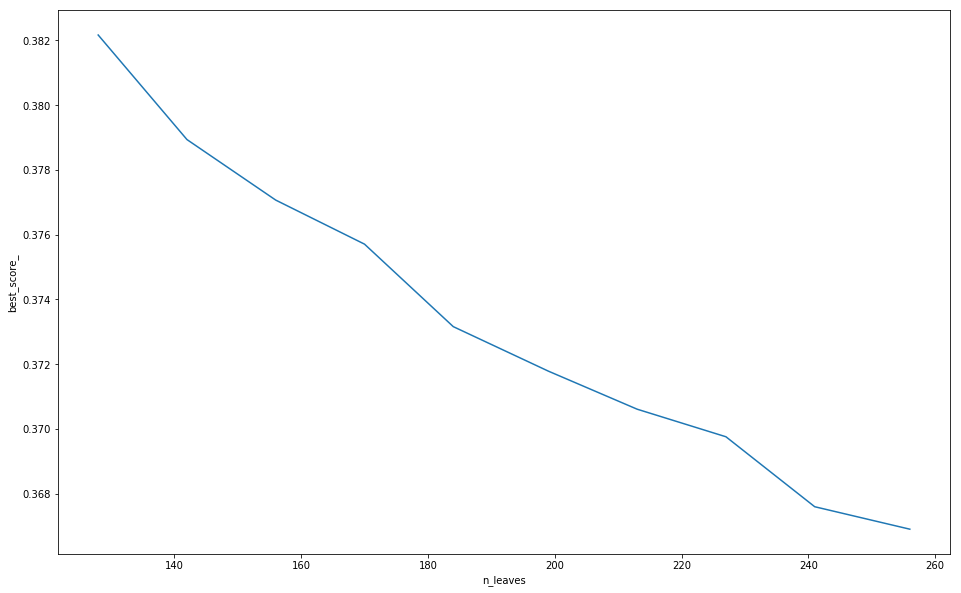

In [137]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

In [138]:
#----------------------------
#2. try larger value of num_leaves
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 256, stop = 512, num = 10).astype('int'):
    print ('n_leaves',n_leaves)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

n_leaves 256
[1]	valid_0's mape: 0.693014
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.671288
[3]	valid_0's mape: 0.651249
[4]	valid_0's mape: 0.632138
[5]	valid_0's mape: 0.613902
[6]	valid_0's mape: 0.599346
[7]	valid_0's mape: 0.585825
[8]	valid_0's mape: 0.573578
[9]	valid_0's mape: 0.561738
[10]	valid_0's mape: 0.551531
[11]	valid_0's mape: 0.54243
[12]	valid_0's mape: 0.534778
[13]	valid_0's mape: 0.527525
[14]	valid_0's mape: 0.519674
[15]	valid_0's mape: 0.513484
[16]	valid_0's mape: 0.508329
[17]	valid_0's mape: 0.504209
[18]	valid_0's mape: 0.49783
[19]	valid_0's mape: 0.49304
[20]	valid_0's mape: 0.487689
[21]	valid_0's mape: 0.483161
[22]	valid_0's mape: 0.478333
[23]	valid_0's mape: 0.47537
[24]	valid_0's mape: 0.470402
[25]	valid_0's mape: 0.466923
[26]	valid_0's mape: 0.463631
[27]	valid_0's mape: 0.459821
[28]	valid_0's mape: 0.457251
[29]	valid_0's mape: 0.45397
[30]	valid_0's mape: 0.451533
[31]	valid_0's mape: 0.448857
[32]	vali

[270]	valid_0's mape: 0.380282
[271]	valid_0's mape: 0.380265
[272]	valid_0's mape: 0.380214
[273]	valid_0's mape: 0.380191
[274]	valid_0's mape: 0.380156
[275]	valid_0's mape: 0.380141
[276]	valid_0's mape: 0.380128
[277]	valid_0's mape: 0.380073
[278]	valid_0's mape: 0.38007
[279]	valid_0's mape: 0.380062
[280]	valid_0's mape: 0.380057
[281]	valid_0's mape: 0.380028
[282]	valid_0's mape: 0.379966
[283]	valid_0's mape: 0.379928
[284]	valid_0's mape: 0.379891
[285]	valid_0's mape: 0.379874
[286]	valid_0's mape: 0.379871
[287]	valid_0's mape: 0.379771
[288]	valid_0's mape: 0.379684
[289]	valid_0's mape: 0.379628
[290]	valid_0's mape: 0.379585
[291]	valid_0's mape: 0.37949
[292]	valid_0's mape: 0.379471
[293]	valid_0's mape: 0.379379
[294]	valid_0's mape: 0.379344
[295]	valid_0's mape: 0.379342
[296]	valid_0's mape: 0.379341
[297]	valid_0's mape: 0.379324
[298]	valid_0's mape: 0.379302
[299]	valid_0's mape: 0.379265
[300]	valid_0's mape: 0.379258
[301]	valid_0's mape: 0.379265
[302]	vali

[535]	valid_0's mape: 0.374461
[536]	valid_0's mape: 0.374451
[537]	valid_0's mape: 0.374438
[538]	valid_0's mape: 0.374368
[539]	valid_0's mape: 0.374352
[540]	valid_0's mape: 0.374346
[541]	valid_0's mape: 0.374328
[542]	valid_0's mape: 0.374322
[543]	valid_0's mape: 0.374312
[544]	valid_0's mape: 0.374255
[545]	valid_0's mape: 0.374241
[546]	valid_0's mape: 0.37424
[547]	valid_0's mape: 0.374224
[548]	valid_0's mape: 0.3742
[549]	valid_0's mape: 0.374206
[550]	valid_0's mape: 0.374205
[551]	valid_0's mape: 0.374163
[552]	valid_0's mape: 0.374173
[553]	valid_0's mape: 0.374181
[554]	valid_0's mape: 0.374184
[555]	valid_0's mape: 0.374173
[556]	valid_0's mape: 0.374182
[557]	valid_0's mape: 0.374182
[558]	valid_0's mape: 0.374179
[559]	valid_0's mape: 0.374187
[560]	valid_0's mape: 0.374186
[561]	valid_0's mape: 0.374197
[562]	valid_0's mape: 0.374203
[563]	valid_0's mape: 0.374205
[564]	valid_0's mape: 0.374207
[565]	valid_0's mape: 0.374207
[566]	valid_0's mape: 0.374208
[567]	valid

[801]	valid_0's mape: 0.372613
[802]	valid_0's mape: 0.372578
[803]	valid_0's mape: 0.372576
[804]	valid_0's mape: 0.372563
[805]	valid_0's mape: 0.372515
[806]	valid_0's mape: 0.372514
[807]	valid_0's mape: 0.372497
[808]	valid_0's mape: 0.372507
[809]	valid_0's mape: 0.372453
[810]	valid_0's mape: 0.372442
[811]	valid_0's mape: 0.372437
[812]	valid_0's mape: 0.372402
[813]	valid_0's mape: 0.372374
[814]	valid_0's mape: 0.372338
[815]	valid_0's mape: 0.372329
[816]	valid_0's mape: 0.37226
[817]	valid_0's mape: 0.372245
[818]	valid_0's mape: 0.372251
[819]	valid_0's mape: 0.372236
[820]	valid_0's mape: 0.372229
[821]	valid_0's mape: 0.372229
[822]	valid_0's mape: 0.37222
[823]	valid_0's mape: 0.372221
[824]	valid_0's mape: 0.37222
[825]	valid_0's mape: 0.372222
[826]	valid_0's mape: 0.372227
[827]	valid_0's mape: 0.372235
[828]	valid_0's mape: 0.372225
[829]	valid_0's mape: 0.372211
[830]	valid_0's mape: 0.372208
[831]	valid_0's mape: 0.372211
[832]	valid_0's mape: 0.372216
[833]	valid

[1066]	valid_0's mape: 0.370422
[1067]	valid_0's mape: 0.370421
[1068]	valid_0's mape: 0.370423
[1069]	valid_0's mape: 0.370404
[1070]	valid_0's mape: 0.370414
[1071]	valid_0's mape: 0.370417
[1072]	valid_0's mape: 0.370418
[1073]	valid_0's mape: 0.370416
[1074]	valid_0's mape: 0.370416
[1075]	valid_0's mape: 0.370411
[1076]	valid_0's mape: 0.370417
[1077]	valid_0's mape: 0.370411
[1078]	valid_0's mape: 0.370415
[1079]	valid_0's mape: 0.370418
[1080]	valid_0's mape: 0.370417
[1081]	valid_0's mape: 0.370413
[1082]	valid_0's mape: 0.370414
[1083]	valid_0's mape: 0.37041
[1084]	valid_0's mape: 0.370401
[1085]	valid_0's mape: 0.370401
[1086]	valid_0's mape: 0.37041
[1087]	valid_0's mape: 0.370405
[1088]	valid_0's mape: 0.370397
[1089]	valid_0's mape: 0.370411
[1090]	valid_0's mape: 0.370391
[1091]	valid_0's mape: 0.370384
[1092]	valid_0's mape: 0.370371
[1093]	valid_0's mape: 0.370361
[1094]	valid_0's mape: 0.370346
[1095]	valid_0's mape: 0.370359
[1096]	valid_0's mape: 0.370361
[1097]	val

[173]	valid_0's mape: 0.380933
[174]	valid_0's mape: 0.380847
[175]	valid_0's mape: 0.380407
[176]	valid_0's mape: 0.380372
[177]	valid_0's mape: 0.380298
[178]	valid_0's mape: 0.380237
[179]	valid_0's mape: 0.380173
[180]	valid_0's mape: 0.380133
[181]	valid_0's mape: 0.380137
[182]	valid_0's mape: 0.380088
[183]	valid_0's mape: 0.380078
[184]	valid_0's mape: 0.380046
[185]	valid_0's mape: 0.379965
[186]	valid_0's mape: 0.379907
[187]	valid_0's mape: 0.379862
[188]	valid_0's mape: 0.379853
[189]	valid_0's mape: 0.379829
[190]	valid_0's mape: 0.379813
[191]	valid_0's mape: 0.379804
[192]	valid_0's mape: 0.3798
[193]	valid_0's mape: 0.379755
[194]	valid_0's mape: 0.37975
[195]	valid_0's mape: 0.379717
[196]	valid_0's mape: 0.379673
[197]	valid_0's mape: 0.379652
[198]	valid_0's mape: 0.379649
[199]	valid_0's mape: 0.37961
[200]	valid_0's mape: 0.379596
[201]	valid_0's mape: 0.379586
[202]	valid_0's mape: 0.37958
[203]	valid_0's mape: 0.379583
[204]	valid_0's mape: 0.379593
[205]	valid_0

[440]	valid_0's mape: 0.370227
[441]	valid_0's mape: 0.370214
[442]	valid_0's mape: 0.370193
[443]	valid_0's mape: 0.370203
[444]	valid_0's mape: 0.37021
[445]	valid_0's mape: 0.370163
[446]	valid_0's mape: 0.370167
[447]	valid_0's mape: 0.370054
[448]	valid_0's mape: 0.370065
[449]	valid_0's mape: 0.370074
[450]	valid_0's mape: 0.37007
[451]	valid_0's mape: 0.370067
[452]	valid_0's mape: 0.370068
[453]	valid_0's mape: 0.370051
[454]	valid_0's mape: 0.369951
[455]	valid_0's mape: 0.369943
[456]	valid_0's mape: 0.369937
[457]	valid_0's mape: 0.369939
[458]	valid_0's mape: 0.369914
[459]	valid_0's mape: 0.369902
[460]	valid_0's mape: 0.369915
[461]	valid_0's mape: 0.369882
[462]	valid_0's mape: 0.369882
[463]	valid_0's mape: 0.369892
[464]	valid_0's mape: 0.369895
[465]	valid_0's mape: 0.369904
[466]	valid_0's mape: 0.369906
[467]	valid_0's mape: 0.369913
[468]	valid_0's mape: 0.369922
[469]	valid_0's mape: 0.369905
[470]	valid_0's mape: 0.369913
[471]	valid_0's mape: 0.369918
[472]	vali

[707]	valid_0's mape: 0.367924
[708]	valid_0's mape: 0.367883
[709]	valid_0's mape: 0.367798
[710]	valid_0's mape: 0.367772
[711]	valid_0's mape: 0.367772
[712]	valid_0's mape: 0.367785
[713]	valid_0's mape: 0.367766
[714]	valid_0's mape: 0.36771
[715]	valid_0's mape: 0.367691
[716]	valid_0's mape: 0.367689
[717]	valid_0's mape: 0.367684
[718]	valid_0's mape: 0.367687
[719]	valid_0's mape: 0.367677
[720]	valid_0's mape: 0.36768
[721]	valid_0's mape: 0.367679
[722]	valid_0's mape: 0.367661
[723]	valid_0's mape: 0.367659
[724]	valid_0's mape: 0.367652
[725]	valid_0's mape: 0.367633
[726]	valid_0's mape: 0.367628
[727]	valid_0's mape: 0.367625
[728]	valid_0's mape: 0.36763
[729]	valid_0's mape: 0.36762
[730]	valid_0's mape: 0.367601
[731]	valid_0's mape: 0.367595
[732]	valid_0's mape: 0.367581
[733]	valid_0's mape: 0.367589
[734]	valid_0's mape: 0.367562
[735]	valid_0's mape: 0.367553
[736]	valid_0's mape: 0.367564
[737]	valid_0's mape: 0.367571
[738]	valid_0's mape: 0.367568
[739]	valid_

[973]	valid_0's mape: 0.366521
[974]	valid_0's mape: 0.36652
[975]	valid_0's mape: 0.366515
[976]	valid_0's mape: 0.366506
[977]	valid_0's mape: 0.366479
[978]	valid_0's mape: 0.366495
[979]	valid_0's mape: 0.366497
[980]	valid_0's mape: 0.366497
[981]	valid_0's mape: 0.366502
[982]	valid_0's mape: 0.366506
[983]	valid_0's mape: 0.366493
[984]	valid_0's mape: 0.366501
[985]	valid_0's mape: 0.366497
[986]	valid_0's mape: 0.36648
[987]	valid_0's mape: 0.366473
[988]	valid_0's mape: 0.366473
[989]	valid_0's mape: 0.366494
[990]	valid_0's mape: 0.366483
[991]	valid_0's mape: 0.366485
[992]	valid_0's mape: 0.36648
[993]	valid_0's mape: 0.36647
[994]	valid_0's mape: 0.366477
[995]	valid_0's mape: 0.366473
[996]	valid_0's mape: 0.36647
[997]	valid_0's mape: 0.36647
[998]	valid_0's mape: 0.366471
[999]	valid_0's mape: 0.366469
[1000]	valid_0's mape: 0.36646
[1001]	valid_0's mape: 0.366463
[1002]	valid_0's mape: 0.366463
[1003]	valid_0's mape: 0.366464
[1004]	valid_0's mape: 0.366459
[1005]	val

[78]	valid_0's mape: 0.396603
[79]	valid_0's mape: 0.396331
[80]	valid_0's mape: 0.395918
[81]	valid_0's mape: 0.395539
[82]	valid_0's mape: 0.395125
[83]	valid_0's mape: 0.394621
[84]	valid_0's mape: 0.394387
[85]	valid_0's mape: 0.394178
[86]	valid_0's mape: 0.393721
[87]	valid_0's mape: 0.393492
[88]	valid_0's mape: 0.393295
[89]	valid_0's mape: 0.392889
[90]	valid_0's mape: 0.392633
[91]	valid_0's mape: 0.392285
[92]	valid_0's mape: 0.391904
[93]	valid_0's mape: 0.391507
[94]	valid_0's mape: 0.391225
[95]	valid_0's mape: 0.390925
[96]	valid_0's mape: 0.390379
[97]	valid_0's mape: 0.390166
[98]	valid_0's mape: 0.390019
[99]	valid_0's mape: 0.389739
[100]	valid_0's mape: 0.38942
[101]	valid_0's mape: 0.38928
[102]	valid_0's mape: 0.389056
[103]	valid_0's mape: 0.388906
[104]	valid_0's mape: 0.388547
[105]	valid_0's mape: 0.38835
[106]	valid_0's mape: 0.388092
[107]	valid_0's mape: 0.387874
[108]	valid_0's mape: 0.387517
[109]	valid_0's mape: 0.387252
[110]	valid_0's mape: 0.387091
[1

[345]	valid_0's mape: 0.371348
[346]	valid_0's mape: 0.37134
[347]	valid_0's mape: 0.371284
[348]	valid_0's mape: 0.371285
[349]	valid_0's mape: 0.371269
[350]	valid_0's mape: 0.371174
[351]	valid_0's mape: 0.371137
[352]	valid_0's mape: 0.371126
[353]	valid_0's mape: 0.371124
[354]	valid_0's mape: 0.371085
[355]	valid_0's mape: 0.371084
[356]	valid_0's mape: 0.371081
[357]	valid_0's mape: 0.371047
[358]	valid_0's mape: 0.371038
[359]	valid_0's mape: 0.37102
[360]	valid_0's mape: 0.370992
[361]	valid_0's mape: 0.370981
[362]	valid_0's mape: 0.370971
[363]	valid_0's mape: 0.37097
[364]	valid_0's mape: 0.370962
[365]	valid_0's mape: 0.370949
[366]	valid_0's mape: 0.370924
[367]	valid_0's mape: 0.370874
[368]	valid_0's mape: 0.370874
[369]	valid_0's mape: 0.370856
[370]	valid_0's mape: 0.370747
[371]	valid_0's mape: 0.370728
[372]	valid_0's mape: 0.370712
[373]	valid_0's mape: 0.370702
[374]	valid_0's mape: 0.37067
[375]	valid_0's mape: 0.370663
[376]	valid_0's mape: 0.370614
[377]	valid_

[612]	valid_0's mape: 0.367107
[613]	valid_0's mape: 0.367114
[614]	valid_0's mape: 0.367108
[615]	valid_0's mape: 0.367105
[616]	valid_0's mape: 0.367092
[617]	valid_0's mape: 0.367081
[618]	valid_0's mape: 0.367091
[619]	valid_0's mape: 0.367071
[620]	valid_0's mape: 0.367069
[621]	valid_0's mape: 0.367068
[622]	valid_0's mape: 0.367048
[623]	valid_0's mape: 0.367042
[624]	valid_0's mape: 0.36705
[625]	valid_0's mape: 0.367002
[626]	valid_0's mape: 0.367011
[627]	valid_0's mape: 0.367002
[628]	valid_0's mape: 0.366989
[629]	valid_0's mape: 0.366967
[630]	valid_0's mape: 0.366953
[631]	valid_0's mape: 0.367064
[632]	valid_0's mape: 0.367067
[633]	valid_0's mape: 0.367069
[634]	valid_0's mape: 0.367063
[635]	valid_0's mape: 0.367057
[636]	valid_0's mape: 0.367032
[637]	valid_0's mape: 0.36703
[638]	valid_0's mape: 0.367017
[639]	valid_0's mape: 0.366996
[640]	valid_0's mape: 0.366998
[641]	valid_0's mape: 0.367002
[642]	valid_0's mape: 0.367007
[643]	valid_0's mape: 0.367003
[644]	vali

[879]	valid_0's mape: 0.365959
[880]	valid_0's mape: 0.365948
[881]	valid_0's mape: 0.365949
[882]	valid_0's mape: 0.365942
[883]	valid_0's mape: 0.365941
[884]	valid_0's mape: 0.365934
[885]	valid_0's mape: 0.365934
[886]	valid_0's mape: 0.365925
[887]	valid_0's mape: 0.365915
[888]	valid_0's mape: 0.365922
[889]	valid_0's mape: 0.365938
[890]	valid_0's mape: 0.365939
[891]	valid_0's mape: 0.365929
[892]	valid_0's mape: 0.365926
[893]	valid_0's mape: 0.365925
[894]	valid_0's mape: 0.365916
[895]	valid_0's mape: 0.365914
[896]	valid_0's mape: 0.365912
[897]	valid_0's mape: 0.365915
[898]	valid_0's mape: 0.365905
[899]	valid_0's mape: 0.3659
[900]	valid_0's mape: 0.365883
[901]	valid_0's mape: 0.365882
[902]	valid_0's mape: 0.365884
[903]	valid_0's mape: 0.365875
[904]	valid_0's mape: 0.365866
[905]	valid_0's mape: 0.36586
[906]	valid_0's mape: 0.365849
[907]	valid_0's mape: 0.365842
[908]	valid_0's mape: 0.365839
[909]	valid_0's mape: 0.36584
[910]	valid_0's mape: 0.365852
[911]	valid_

[1141]	valid_0's mape: 0.36527
[1142]	valid_0's mape: 0.365257
[1143]	valid_0's mape: 0.365249
[1144]	valid_0's mape: 0.365242
[1145]	valid_0's mape: 0.365241
[1146]	valid_0's mape: 0.365231
[1147]	valid_0's mape: 0.365233
[1148]	valid_0's mape: 0.365226
[1149]	valid_0's mape: 0.365221
[1150]	valid_0's mape: 0.365214
[1151]	valid_0's mape: 0.36522
[1152]	valid_0's mape: 0.365198
[1153]	valid_0's mape: 0.365187
[1154]	valid_0's mape: 0.365123
[1155]	valid_0's mape: 0.365129
Did not meet early stopping. Best iteration is:
[1154]	valid_0's mape: 0.365123
[1]	valid_0's mape: 0.690291
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.665104
[3]	valid_0's mape: 0.645103
[4]	valid_0's mape: 0.624273
[5]	valid_0's mape: 0.607594
[6]	valid_0's mape: 0.593594
[7]	valid_0's mape: 0.580527
[8]	valid_0's mape: 0.56864
[9]	valid_0's mape: 0.557954
[10]	valid_0's mape: 0.549776
[11]	valid_0's mape: 0.540159
[12]	valid_0's mape: 0.531482
[13]	valid_0's mape: 0.523837


[251]	valid_0's mape: 0.374046
[252]	valid_0's mape: 0.374025
[253]	valid_0's mape: 0.373968
[254]	valid_0's mape: 0.373798
[255]	valid_0's mape: 0.373787
[256]	valid_0's mape: 0.373742
[257]	valid_0's mape: 0.373669
[258]	valid_0's mape: 0.373632
[259]	valid_0's mape: 0.373588
[260]	valid_0's mape: 0.373587
[261]	valid_0's mape: 0.373552
[262]	valid_0's mape: 0.37342
[263]	valid_0's mape: 0.373309
[264]	valid_0's mape: 0.373255
[265]	valid_0's mape: 0.373221
[266]	valid_0's mape: 0.373214
[267]	valid_0's mape: 0.373193
[268]	valid_0's mape: 0.373159
[269]	valid_0's mape: 0.373101
[270]	valid_0's mape: 0.373078
[271]	valid_0's mape: 0.373024
[272]	valid_0's mape: 0.37301
[273]	valid_0's mape: 0.373007
[274]	valid_0's mape: 0.372988
[275]	valid_0's mape: 0.372934
[276]	valid_0's mape: 0.372872
[277]	valid_0's mape: 0.372865
[278]	valid_0's mape: 0.372863
[279]	valid_0's mape: 0.372816
[280]	valid_0's mape: 0.372801
[281]	valid_0's mape: 0.372742
[282]	valid_0's mape: 0.372739
[283]	vali

[518]	valid_0's mape: 0.368318
[519]	valid_0's mape: 0.368315
[520]	valid_0's mape: 0.36829
[521]	valid_0's mape: 0.368283
[522]	valid_0's mape: 0.36828
[523]	valid_0's mape: 0.368312
[524]	valid_0's mape: 0.36832
[525]	valid_0's mape: 0.368305
[526]	valid_0's mape: 0.368307
[527]	valid_0's mape: 0.368302
[528]	valid_0's mape: 0.368287
[529]	valid_0's mape: 0.368288
[530]	valid_0's mape: 0.368274
[531]	valid_0's mape: 0.368249
[532]	valid_0's mape: 0.368224
[533]	valid_0's mape: 0.368204
[534]	valid_0's mape: 0.368206
[535]	valid_0's mape: 0.368197
[536]	valid_0's mape: 0.368188
[537]	valid_0's mape: 0.368186
[538]	valid_0's mape: 0.36817
[539]	valid_0's mape: 0.368137
[540]	valid_0's mape: 0.368134
[541]	valid_0's mape: 0.368135
[542]	valid_0's mape: 0.368118
[543]	valid_0's mape: 0.368114
[544]	valid_0's mape: 0.368117
[545]	valid_0's mape: 0.368111
[546]	valid_0's mape: 0.36812
[547]	valid_0's mape: 0.368122
[548]	valid_0's mape: 0.368109
[549]	valid_0's mape: 0.368116
[550]	valid_0

[784]	valid_0's mape: 0.366685
[785]	valid_0's mape: 0.366681
[786]	valid_0's mape: 0.366684
[787]	valid_0's mape: 0.366678
[788]	valid_0's mape: 0.366673
[789]	valid_0's mape: 0.366666
[790]	valid_0's mape: 0.366671
[791]	valid_0's mape: 0.366661
[792]	valid_0's mape: 0.366644
[793]	valid_0's mape: 0.366641
[794]	valid_0's mape: 0.366644
[795]	valid_0's mape: 0.366624
[796]	valid_0's mape: 0.366621
[797]	valid_0's mape: 0.366618
[798]	valid_0's mape: 0.366618
[799]	valid_0's mape: 0.366614
[800]	valid_0's mape: 0.366611
[801]	valid_0's mape: 0.366586
[802]	valid_0's mape: 0.366583
[803]	valid_0's mape: 0.366586
[804]	valid_0's mape: 0.36654
[805]	valid_0's mape: 0.366536
[806]	valid_0's mape: 0.366539
[807]	valid_0's mape: 0.366529
[808]	valid_0's mape: 0.366541
[809]	valid_0's mape: 0.366523
[810]	valid_0's mape: 0.366519
[811]	valid_0's mape: 0.366523
[812]	valid_0's mape: 0.366518
[813]	valid_0's mape: 0.366515
[814]	valid_0's mape: 0.366518
[815]	valid_0's mape: 0.366505
[816]	val

[142]	valid_0's mape: 0.383241
[143]	valid_0's mape: 0.383178
[144]	valid_0's mape: 0.383066
[145]	valid_0's mape: 0.38283
[146]	valid_0's mape: 0.382744
[147]	valid_0's mape: 0.382571
[148]	valid_0's mape: 0.382384
[149]	valid_0's mape: 0.382307
[150]	valid_0's mape: 0.382198
[151]	valid_0's mape: 0.382107
[152]	valid_0's mape: 0.382055
[153]	valid_0's mape: 0.381682
[154]	valid_0's mape: 0.381459
[155]	valid_0's mape: 0.381404
[156]	valid_0's mape: 0.381326
[157]	valid_0's mape: 0.381298
[158]	valid_0's mape: 0.381235
[159]	valid_0's mape: 0.381191
[160]	valid_0's mape: 0.38114
[161]	valid_0's mape: 0.381089
[162]	valid_0's mape: 0.381009
[163]	valid_0's mape: 0.380961
[164]	valid_0's mape: 0.380855
[165]	valid_0's mape: 0.380808
[166]	valid_0's mape: 0.380722
[167]	valid_0's mape: 0.380482
[168]	valid_0's mape: 0.380354
[169]	valid_0's mape: 0.380055
[170]	valid_0's mape: 0.38005
[171]	valid_0's mape: 0.380017
[172]	valid_0's mape: 0.379715
[173]	valid_0's mape: 0.379489
[174]	valid

[408]	valid_0's mape: 0.370427
[409]	valid_0's mape: 0.370411
[410]	valid_0's mape: 0.370384
[411]	valid_0's mape: 0.37026
[412]	valid_0's mape: 0.370252
[413]	valid_0's mape: 0.37025
[414]	valid_0's mape: 0.370231
[415]	valid_0's mape: 0.370237
[416]	valid_0's mape: 0.370237
[417]	valid_0's mape: 0.370236
[418]	valid_0's mape: 0.370231
[419]	valid_0's mape: 0.370213
[420]	valid_0's mape: 0.370201
[421]	valid_0's mape: 0.37019
[422]	valid_0's mape: 0.370146
[423]	valid_0's mape: 0.370126
[424]	valid_0's mape: 0.37009
[425]	valid_0's mape: 0.369986
[426]	valid_0's mape: 0.369946
[427]	valid_0's mape: 0.369909
[428]	valid_0's mape: 0.369904
[429]	valid_0's mape: 0.369905
[430]	valid_0's mape: 0.369907
[431]	valid_0's mape: 0.369918
[432]	valid_0's mape: 0.369908
[433]	valid_0's mape: 0.36989
[434]	valid_0's mape: 0.369817
[435]	valid_0's mape: 0.369748
[436]	valid_0's mape: 0.369737
[437]	valid_0's mape: 0.369721
[438]	valid_0's mape: 0.369695
[439]	valid_0's mape: 0.369685
[440]	valid_0

[675]	valid_0's mape: 0.367996
[676]	valid_0's mape: 0.367993
[677]	valid_0's mape: 0.367968
[678]	valid_0's mape: 0.367948
[679]	valid_0's mape: 0.367942
[680]	valid_0's mape: 0.367939
[681]	valid_0's mape: 0.367954
[682]	valid_0's mape: 0.367947
[683]	valid_0's mape: 0.367948
[684]	valid_0's mape: 0.367936
[685]	valid_0's mape: 0.367928
[686]	valid_0's mape: 0.367924
[687]	valid_0's mape: 0.367925
[688]	valid_0's mape: 0.367915
[689]	valid_0's mape: 0.367889
[690]	valid_0's mape: 0.367881
[691]	valid_0's mape: 0.367889
[692]	valid_0's mape: 0.36786
[693]	valid_0's mape: 0.367882
[694]	valid_0's mape: 0.367893
[695]	valid_0's mape: 0.367887
[696]	valid_0's mape: 0.367879
[697]	valid_0's mape: 0.367868
[698]	valid_0's mape: 0.367859
[699]	valid_0's mape: 0.367849
[700]	valid_0's mape: 0.367838
[701]	valid_0's mape: 0.367816
[702]	valid_0's mape: 0.367824
[703]	valid_0's mape: 0.367808
[704]	valid_0's mape: 0.367798
[705]	valid_0's mape: 0.367775
[706]	valid_0's mape: 0.367776
[707]	val

[3]	valid_0's mape: 0.648573
[4]	valid_0's mape: 0.628872
[5]	valid_0's mape: 0.610724
[6]	valid_0's mape: 0.594661
[7]	valid_0's mape: 0.580594
[8]	valid_0's mape: 0.569484
[9]	valid_0's mape: 0.55831
[10]	valid_0's mape: 0.54768
[11]	valid_0's mape: 0.539474
[12]	valid_0's mape: 0.530739
[13]	valid_0's mape: 0.523485
[14]	valid_0's mape: 0.515366
[15]	valid_0's mape: 0.508023
[16]	valid_0's mape: 0.502638
[17]	valid_0's mape: 0.497868
[18]	valid_0's mape: 0.493067
[19]	valid_0's mape: 0.487778
[20]	valid_0's mape: 0.483853
[21]	valid_0's mape: 0.479654
[22]	valid_0's mape: 0.47655
[23]	valid_0's mape: 0.472257
[24]	valid_0's mape: 0.467746
[25]	valid_0's mape: 0.463122
[26]	valid_0's mape: 0.460272
[27]	valid_0's mape: 0.45646
[28]	valid_0's mape: 0.452456
[29]	valid_0's mape: 0.450045
[30]	valid_0's mape: 0.447512
[31]	valid_0's mape: 0.444917
[32]	valid_0's mape: 0.442722
[33]	valid_0's mape: 0.440795
[34]	valid_0's mape: 0.438781
[35]	valid_0's mape: 0.436175
[36]	valid_0's mape: 

[273]	valid_0's mape: 0.376694
[274]	valid_0's mape: 0.376577
[275]	valid_0's mape: 0.376554
[276]	valid_0's mape: 0.376534
[277]	valid_0's mape: 0.37649
[278]	valid_0's mape: 0.376501
[279]	valid_0's mape: 0.376481
[280]	valid_0's mape: 0.376449
[281]	valid_0's mape: 0.376428
[282]	valid_0's mape: 0.376366
[283]	valid_0's mape: 0.376355
[284]	valid_0's mape: 0.376328
[285]	valid_0's mape: 0.376301
[286]	valid_0's mape: 0.376263
[287]	valid_0's mape: 0.376245
[288]	valid_0's mape: 0.376222
[289]	valid_0's mape: 0.376215
[290]	valid_0's mape: 0.376158
[291]	valid_0's mape: 0.376144
[292]	valid_0's mape: 0.376085
[293]	valid_0's mape: 0.376072
[294]	valid_0's mape: 0.376033
[295]	valid_0's mape: 0.376014
[296]	valid_0's mape: 0.376002
[297]	valid_0's mape: 0.375987
[298]	valid_0's mape: 0.375953
[299]	valid_0's mape: 0.37586
[300]	valid_0's mape: 0.375815
[301]	valid_0's mape: 0.375786
[302]	valid_0's mape: 0.375778
[303]	valid_0's mape: 0.375765
[304]	valid_0's mape: 0.375738
[305]	vali

[538]	valid_0's mape: 0.371694
[539]	valid_0's mape: 0.371684
[540]	valid_0's mape: 0.371673
[541]	valid_0's mape: 0.371666
[542]	valid_0's mape: 0.371631
[543]	valid_0's mape: 0.371631
[544]	valid_0's mape: 0.371617
[545]	valid_0's mape: 0.371625
[546]	valid_0's mape: 0.371575
[547]	valid_0's mape: 0.371582
[548]	valid_0's mape: 0.371592
[549]	valid_0's mape: 0.371605
[550]	valid_0's mape: 0.371409
[551]	valid_0's mape: 0.371383
[552]	valid_0's mape: 0.371384
[553]	valid_0's mape: 0.371353
[554]	valid_0's mape: 0.371348
[555]	valid_0's mape: 0.371355
[556]	valid_0's mape: 0.371313
[557]	valid_0's mape: 0.371298
[558]	valid_0's mape: 0.371251
[559]	valid_0's mape: 0.371193
[560]	valid_0's mape: 0.371199
[561]	valid_0's mape: 0.371186
[562]	valid_0's mape: 0.371186
[563]	valid_0's mape: 0.37117
[564]	valid_0's mape: 0.371161
[565]	valid_0's mape: 0.371106
[566]	valid_0's mape: 0.371106
[567]	valid_0's mape: 0.371092
[568]	valid_0's mape: 0.371082
[569]	valid_0's mape: 0.37107
[570]	vali

[806]	valid_0's mape: 0.369078
[807]	valid_0's mape: 0.369093
[808]	valid_0's mape: 0.369098
[809]	valid_0's mape: 0.369081
[810]	valid_0's mape: 0.369072
[811]	valid_0's mape: 0.369084
[812]	valid_0's mape: 0.369054
[813]	valid_0's mape: 0.369049
[814]	valid_0's mape: 0.369035
[815]	valid_0's mape: 0.369023
[816]	valid_0's mape: 0.369015
[817]	valid_0's mape: 0.369014
[818]	valid_0's mape: 0.369019
[819]	valid_0's mape: 0.36901
[820]	valid_0's mape: 0.369002
[821]	valid_0's mape: 0.368992
[822]	valid_0's mape: 0.368989
[823]	valid_0's mape: 0.368966
[824]	valid_0's mape: 0.368952
[825]	valid_0's mape: 0.368943
[826]	valid_0's mape: 0.368919
[827]	valid_0's mape: 0.368912
[828]	valid_0's mape: 0.368921
[829]	valid_0's mape: 0.368836
[830]	valid_0's mape: 0.36884
[831]	valid_0's mape: 0.36885
[832]	valid_0's mape: 0.368855
[833]	valid_0's mape: 0.368844
[834]	valid_0's mape: 0.368845
[835]	valid_0's mape: 0.368831
[836]	valid_0's mape: 0.368842
[837]	valid_0's mape: 0.368845
[838]	valid

[1070]	valid_0's mape: 0.368255
[1071]	valid_0's mape: 0.368258
[1072]	valid_0's mape: 0.368241
[1073]	valid_0's mape: 0.368198
[1074]	valid_0's mape: 0.368176
[1075]	valid_0's mape: 0.368151
[1076]	valid_0's mape: 0.368142
[1077]	valid_0's mape: 0.368121
Early stopping, best iteration is:
[1027]	valid_0's mape: 0.367939
[1]	valid_0's mape: 0.688786
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.663693
[3]	valid_0's mape: 0.641627
[4]	valid_0's mape: 0.622454
[5]	valid_0's mape: 0.604943
[6]	valid_0's mape: 0.587976
[7]	valid_0's mape: 0.572909
[8]	valid_0's mape: 0.560894
[9]	valid_0's mape: 0.550166
[10]	valid_0's mape: 0.540235
[11]	valid_0's mape: 0.531374
[12]	valid_0's mape: 0.523645
[13]	valid_0's mape: 0.516066
[14]	valid_0's mape: 0.509547
[15]	valid_0's mape: 0.502068
[16]	valid_0's mape: 0.496646
[17]	valid_0's mape: 0.492405
[18]	valid_0's mape: 0.486834
[19]	valid_0's mape: 0.482558
[20]	valid_0's mape: 0.47813
[21]	valid_0's mape: 0.47

[258]	valid_0's mape: 0.372787
[259]	valid_0's mape: 0.37277
[260]	valid_0's mape: 0.372765
[261]	valid_0's mape: 0.372763
[262]	valid_0's mape: 0.372721
[263]	valid_0's mape: 0.372698
[264]	valid_0's mape: 0.372659
[265]	valid_0's mape: 0.372648
[266]	valid_0's mape: 0.372626
[267]	valid_0's mape: 0.372613
[268]	valid_0's mape: 0.372585
[269]	valid_0's mape: 0.372465
[270]	valid_0's mape: 0.372463
[271]	valid_0's mape: 0.372457
[272]	valid_0's mape: 0.372383
[273]	valid_0's mape: 0.372303
[274]	valid_0's mape: 0.372271
[275]	valid_0's mape: 0.372256
[276]	valid_0's mape: 0.37223
[277]	valid_0's mape: 0.372128
[278]	valid_0's mape: 0.372098
[279]	valid_0's mape: 0.37201
[280]	valid_0's mape: 0.371996
[281]	valid_0's mape: 0.371966
[282]	valid_0's mape: 0.37192
[283]	valid_0's mape: 0.371896
[284]	valid_0's mape: 0.371881
[285]	valid_0's mape: 0.371843
[286]	valid_0's mape: 0.371786
[287]	valid_0's mape: 0.371752
[288]	valid_0's mape: 0.371695
[289]	valid_0's mape: 0.371483
[290]	valid_

[526]	valid_0's mape: 0.367355
[527]	valid_0's mape: 0.367341
[528]	valid_0's mape: 0.367309
[529]	valid_0's mape: 0.367296
[530]	valid_0's mape: 0.367273
[531]	valid_0's mape: 0.367281
[532]	valid_0's mape: 0.367267
[533]	valid_0's mape: 0.367258
[534]	valid_0's mape: 0.36725
[535]	valid_0's mape: 0.367243
[536]	valid_0's mape: 0.367261
[537]	valid_0's mape: 0.367253
[538]	valid_0's mape: 0.367205
[539]	valid_0's mape: 0.367201
[540]	valid_0's mape: 0.367162
[541]	valid_0's mape: 0.367154
[542]	valid_0's mape: 0.36715
[543]	valid_0's mape: 0.367129
[544]	valid_0's mape: 0.367117
[545]	valid_0's mape: 0.367116
[546]	valid_0's mape: 0.367102
[547]	valid_0's mape: 0.3671
[548]	valid_0's mape: 0.367093
[549]	valid_0's mape: 0.367096
[550]	valid_0's mape: 0.367061
[551]	valid_0's mape: 0.367028
[552]	valid_0's mape: 0.367018
[553]	valid_0's mape: 0.367009
[554]	valid_0's mape: 0.36701
[555]	valid_0's mape: 0.367
[556]	valid_0's mape: 0.366987
[557]	valid_0's mape: 0.366994
[558]	valid_0's 

[792]	valid_0's mape: 0.364594
[793]	valid_0's mape: 0.364599
[794]	valid_0's mape: 0.364579
[795]	valid_0's mape: 0.364566
[796]	valid_0's mape: 0.364566
[797]	valid_0's mape: 0.36455
[798]	valid_0's mape: 0.364574
[799]	valid_0's mape: 0.364587
[800]	valid_0's mape: 0.364595
[801]	valid_0's mape: 0.364586
[802]	valid_0's mape: 0.36457
[803]	valid_0's mape: 0.364577
[804]	valid_0's mape: 0.364576
[805]	valid_0's mape: 0.364578
[806]	valid_0's mape: 0.364562
[807]	valid_0's mape: 0.364578
[808]	valid_0's mape: 0.364576
[809]	valid_0's mape: 0.364558
[810]	valid_0's mape: 0.364545
[811]	valid_0's mape: 0.364555
[812]	valid_0's mape: 0.364568
[813]	valid_0's mape: 0.364566
[814]	valid_0's mape: 0.364571
[815]	valid_0's mape: 0.364561
[816]	valid_0's mape: 0.364561
[817]	valid_0's mape: 0.364552
[818]	valid_0's mape: 0.364558
[819]	valid_0's mape: 0.364564
[820]	valid_0's mape: 0.364563
[821]	valid_0's mape: 0.364552
[822]	valid_0's mape: 0.364548
[823]	valid_0's mape: 0.36455
[824]	valid

[1056]	valid_0's mape: 0.363483
[1057]	valid_0's mape: 0.363478
[1058]	valid_0's mape: 0.363474
[1059]	valid_0's mape: 0.363474
[1060]	valid_0's mape: 0.363461
[1061]	valid_0's mape: 0.363454
[1062]	valid_0's mape: 0.363453
[1063]	valid_0's mape: 0.36344
[1064]	valid_0's mape: 0.363416
[1065]	valid_0's mape: 0.363407
[1066]	valid_0's mape: 0.363397
[1067]	valid_0's mape: 0.363389
[1068]	valid_0's mape: 0.363393
[1069]	valid_0's mape: 0.363402
[1070]	valid_0's mape: 0.363409
[1071]	valid_0's mape: 0.363414
[1072]	valid_0's mape: 0.363415
[1073]	valid_0's mape: 0.363435
[1074]	valid_0's mape: 0.363431
[1075]	valid_0's mape: 0.363436
[1076]	valid_0's mape: 0.363433
[1077]	valid_0's mape: 0.363416
[1078]	valid_0's mape: 0.363418
[1079]	valid_0's mape: 0.363412
[1080]	valid_0's mape: 0.363403
[1081]	valid_0's mape: 0.363402
[1082]	valid_0's mape: 0.363409
[1083]	valid_0's mape: 0.363403
[1084]	valid_0's mape: 0.363394
[1085]	valid_0's mape: 0.363379
[1086]	valid_0's mape: 0.363377
[1087]	va

[163]	valid_0's mape: 0.3774
[164]	valid_0's mape: 0.377365
[165]	valid_0's mape: 0.377322
[166]	valid_0's mape: 0.377251
[167]	valid_0's mape: 0.37722
[168]	valid_0's mape: 0.377145
[169]	valid_0's mape: 0.377062
[170]	valid_0's mape: 0.377035
[171]	valid_0's mape: 0.376913
[172]	valid_0's mape: 0.37674
[173]	valid_0's mape: 0.37667
[174]	valid_0's mape: 0.376611
[175]	valid_0's mape: 0.376559
[176]	valid_0's mape: 0.376534
[177]	valid_0's mape: 0.376496
[178]	valid_0's mape: 0.37643
[179]	valid_0's mape: 0.37635
[180]	valid_0's mape: 0.376279
[181]	valid_0's mape: 0.376212
[182]	valid_0's mape: 0.376138
[183]	valid_0's mape: 0.376102
[184]	valid_0's mape: 0.376106
[185]	valid_0's mape: 0.375858
[186]	valid_0's mape: 0.375742
[187]	valid_0's mape: 0.375519
[188]	valid_0's mape: 0.375416
[189]	valid_0's mape: 0.37517
[190]	valid_0's mape: 0.375052
[191]	valid_0's mape: 0.374977
[192]	valid_0's mape: 0.37489
[193]	valid_0's mape: 0.374789
[194]	valid_0's mape: 0.374771
[195]	valid_0's m

[430]	valid_0's mape: 0.367323
[431]	valid_0's mape: 0.367329
[432]	valid_0's mape: 0.367307
[433]	valid_0's mape: 0.367292
[434]	valid_0's mape: 0.367283
[435]	valid_0's mape: 0.367264
[436]	valid_0's mape: 0.367225
[437]	valid_0's mape: 0.367211
[438]	valid_0's mape: 0.367137
[439]	valid_0's mape: 0.367132
[440]	valid_0's mape: 0.367141
[441]	valid_0's mape: 0.367132
[442]	valid_0's mape: 0.367124
[443]	valid_0's mape: 0.367068
[444]	valid_0's mape: 0.367034
[445]	valid_0's mape: 0.36696
[446]	valid_0's mape: 0.366932
[447]	valid_0's mape: 0.366897
[448]	valid_0's mape: 0.366877
[449]	valid_0's mape: 0.366853
[450]	valid_0's mape: 0.366848
[451]	valid_0's mape: 0.366832
[452]	valid_0's mape: 0.366804
[453]	valid_0's mape: 0.366784
[454]	valid_0's mape: 0.366778
[455]	valid_0's mape: 0.366754
[456]	valid_0's mape: 0.366726
[457]	valid_0's mape: 0.366716
[458]	valid_0's mape: 0.366692
[459]	valid_0's mape: 0.366703
[460]	valid_0's mape: 0.366726
[461]	valid_0's mape: 0.366716
[462]	val

[696]	valid_0's mape: 0.363904
[697]	valid_0's mape: 0.363912
[698]	valid_0's mape: 0.363861
[699]	valid_0's mape: 0.36384
[700]	valid_0's mape: 0.363818
[701]	valid_0's mape: 0.363738
[702]	valid_0's mape: 0.363738
[703]	valid_0's mape: 0.363735
[704]	valid_0's mape: 0.363747
[705]	valid_0's mape: 0.363741
[706]	valid_0's mape: 0.363756
[707]	valid_0's mape: 0.363756
[708]	valid_0's mape: 0.363708
[709]	valid_0's mape: 0.3637
[710]	valid_0's mape: 0.363666
[711]	valid_0's mape: 0.363637
[712]	valid_0's mape: 0.363649
[713]	valid_0's mape: 0.363624
[714]	valid_0's mape: 0.363617
[715]	valid_0's mape: 0.363556
[716]	valid_0's mape: 0.363538
[717]	valid_0's mape: 0.36352
[718]	valid_0's mape: 0.363606
[719]	valid_0's mape: 0.36362
[720]	valid_0's mape: 0.363614
[721]	valid_0's mape: 0.363606
[722]	valid_0's mape: 0.363593
[723]	valid_0's mape: 0.363581
[724]	valid_0's mape: 0.363593
[725]	valid_0's mape: 0.363579
[726]	valid_0's mape: 0.363572
[727]	valid_0's mape: 0.363567
[728]	valid_0

[963]	valid_0's mape: 0.361444
[964]	valid_0's mape: 0.361439
[965]	valid_0's mape: 0.361416
[966]	valid_0's mape: 0.361392
[967]	valid_0's mape: 0.361383
[968]	valid_0's mape: 0.361371
[969]	valid_0's mape: 0.361368
[970]	valid_0's mape: 0.361387
[971]	valid_0's mape: 0.361386
[972]	valid_0's mape: 0.361394
[973]	valid_0's mape: 0.361399
[974]	valid_0's mape: 0.3614
[975]	valid_0's mape: 0.361408
[976]	valid_0's mape: 0.361405
[977]	valid_0's mape: 0.361412
[978]	valid_0's mape: 0.361407
[979]	valid_0's mape: 0.361404
[980]	valid_0's mape: 0.361396
[981]	valid_0's mape: 0.361393
[982]	valid_0's mape: 0.361396
[983]	valid_0's mape: 0.36138
[984]	valid_0's mape: 0.36138
[985]	valid_0's mape: 0.361381
[986]	valid_0's mape: 0.361379
[987]	valid_0's mape: 0.361395
[988]	valid_0's mape: 0.361391
[989]	valid_0's mape: 0.361404
[990]	valid_0's mape: 0.361398
[991]	valid_0's mape: 0.361391
[992]	valid_0's mape: 0.361389
[993]	valid_0's mape: 0.36138
[994]	valid_0's mape: 0.361379
[995]	valid_0

[67]	valid_0's mape: 0.396709
[68]	valid_0's mape: 0.396299
[69]	valid_0's mape: 0.395896
[70]	valid_0's mape: 0.395397
[71]	valid_0's mape: 0.394897
[72]	valid_0's mape: 0.39454
[73]	valid_0's mape: 0.394078
[74]	valid_0's mape: 0.393576
[75]	valid_0's mape: 0.393191
[76]	valid_0's mape: 0.39281
[77]	valid_0's mape: 0.392409
[78]	valid_0's mape: 0.39194
[79]	valid_0's mape: 0.391642
[80]	valid_0's mape: 0.391102
[81]	valid_0's mape: 0.39086
[82]	valid_0's mape: 0.390315
[83]	valid_0's mape: 0.390011
[84]	valid_0's mape: 0.389625
[85]	valid_0's mape: 0.389294
[86]	valid_0's mape: 0.389089
[87]	valid_0's mape: 0.388774
[88]	valid_0's mape: 0.388561
[89]	valid_0's mape: 0.388263
[90]	valid_0's mape: 0.387827
[91]	valid_0's mape: 0.387572
[92]	valid_0's mape: 0.387251
[93]	valid_0's mape: 0.387011
[94]	valid_0's mape: 0.386803
[95]	valid_0's mape: 0.386599
[96]	valid_0's mape: 0.386451
[97]	valid_0's mape: 0.386315
[98]	valid_0's mape: 0.38592
[99]	valid_0's mape: 0.385742
[100]	valid_0's

[336]	valid_0's mape: 0.369939
[337]	valid_0's mape: 0.36991
[338]	valid_0's mape: 0.36987
[339]	valid_0's mape: 0.369861
[340]	valid_0's mape: 0.369868
[341]	valid_0's mape: 0.369847
[342]	valid_0's mape: 0.369844
[343]	valid_0's mape: 0.369834
[344]	valid_0's mape: 0.369811
[345]	valid_0's mape: 0.369821
[346]	valid_0's mape: 0.369814
[347]	valid_0's mape: 0.369809
[348]	valid_0's mape: 0.369791
[349]	valid_0's mape: 0.369784
[350]	valid_0's mape: 0.369776
[351]	valid_0's mape: 0.369762
[352]	valid_0's mape: 0.36975
[353]	valid_0's mape: 0.369749
[354]	valid_0's mape: 0.369723
[355]	valid_0's mape: 0.369712
[356]	valid_0's mape: 0.369699
[357]	valid_0's mape: 0.369667
[358]	valid_0's mape: 0.369667
[359]	valid_0's mape: 0.369645
[360]	valid_0's mape: 0.369645
[361]	valid_0's mape: 0.369641
[362]	valid_0's mape: 0.369652
[363]	valid_0's mape: 0.369644
[364]	valid_0's mape: 0.369585
[365]	valid_0's mape: 0.369583
[366]	valid_0's mape: 0.369584
[367]	valid_0's mape: 0.369574
[368]	valid

[95]	valid_0's mape: 0.388435
[96]	valid_0's mape: 0.388286
[97]	valid_0's mape: 0.388053
[98]	valid_0's mape: 0.387916
[99]	valid_0's mape: 0.387611
[100]	valid_0's mape: 0.38745
[101]	valid_0's mape: 0.387263
[102]	valid_0's mape: 0.387104
[103]	valid_0's mape: 0.386973
[104]	valid_0's mape: 0.386821
[105]	valid_0's mape: 0.386678
[106]	valid_0's mape: 0.386388
[107]	valid_0's mape: 0.386223
[108]	valid_0's mape: 0.386146
[109]	valid_0's mape: 0.386011
[110]	valid_0's mape: 0.38574
[111]	valid_0's mape: 0.385576
[112]	valid_0's mape: 0.385434
[113]	valid_0's mape: 0.385154
[114]	valid_0's mape: 0.385071
[115]	valid_0's mape: 0.384945
[116]	valid_0's mape: 0.384799
[117]	valid_0's mape: 0.384686
[118]	valid_0's mape: 0.384465
[119]	valid_0's mape: 0.384358
[120]	valid_0's mape: 0.384237
[121]	valid_0's mape: 0.384175
[122]	valid_0's mape: 0.383998
[123]	valid_0's mape: 0.383729
[124]	valid_0's mape: 0.383344
[125]	valid_0's mape: 0.383186
[126]	valid_0's mape: 0.383032
[127]	valid_0's

[362]	valid_0's mape: 0.371057
[363]	valid_0's mape: 0.371051
[364]	valid_0's mape: 0.371025
[365]	valid_0's mape: 0.371021
[366]	valid_0's mape: 0.37101
[367]	valid_0's mape: 0.37099
[368]	valid_0's mape: 0.370953
[369]	valid_0's mape: 0.370938
[370]	valid_0's mape: 0.370931
[371]	valid_0's mape: 0.370908
[372]	valid_0's mape: 0.370868
[373]	valid_0's mape: 0.370862
[374]	valid_0's mape: 0.37085
[375]	valid_0's mape: 0.370823
[376]	valid_0's mape: 0.370818
[377]	valid_0's mape: 0.370814
[378]	valid_0's mape: 0.370774
[379]	valid_0's mape: 0.37075
[380]	valid_0's mape: 0.370739
[381]	valid_0's mape: 0.370751
[382]	valid_0's mape: 0.370727
[383]	valid_0's mape: 0.370708
[384]	valid_0's mape: 0.370687
[385]	valid_0's mape: 0.370649
[386]	valid_0's mape: 0.370633
[387]	valid_0's mape: 0.370603
[388]	valid_0's mape: 0.370561
[389]	valid_0's mape: 0.370554
[390]	valid_0's mape: 0.370553
[391]	valid_0's mape: 0.37053
[392]	valid_0's mape: 0.370474
[393]	valid_0's mape: 0.370453
[394]	valid_0

[628]	valid_0's mape: 0.366209
[629]	valid_0's mape: 0.366208
[630]	valid_0's mape: 0.366199
[631]	valid_0's mape: 0.366207
[632]	valid_0's mape: 0.366196
[633]	valid_0's mape: 0.366192
[634]	valid_0's mape: 0.366179
[635]	valid_0's mape: 0.366192
[636]	valid_0's mape: 0.36619
[637]	valid_0's mape: 0.366187
[638]	valid_0's mape: 0.366215
[639]	valid_0's mape: 0.366222
[640]	valid_0's mape: 0.366198
[641]	valid_0's mape: 0.366196
[642]	valid_0's mape: 0.366213
[643]	valid_0's mape: 0.366207
[644]	valid_0's mape: 0.366213
[645]	valid_0's mape: 0.366217
[646]	valid_0's mape: 0.366212
[647]	valid_0's mape: 0.366214
[648]	valid_0's mape: 0.366214
[649]	valid_0's mape: 0.366203
[650]	valid_0's mape: 0.366188
[651]	valid_0's mape: 0.366199
[652]	valid_0's mape: 0.366201
[653]	valid_0's mape: 0.366194
[654]	valid_0's mape: 0.366201
[655]	valid_0's mape: 0.366177
[656]	valid_0's mape: 0.366143
[657]	valid_0's mape: 0.366181
[658]	valid_0's mape: 0.366173
[659]	valid_0's mape: 0.366189
[660]	val

[894]	valid_0's mape: 0.365589
[895]	valid_0's mape: 0.365581
[896]	valid_0's mape: 0.365581
[897]	valid_0's mape: 0.365578
[898]	valid_0's mape: 0.365588
[899]	valid_0's mape: 0.365565
[900]	valid_0's mape: 0.365563
[901]	valid_0's mape: 0.365554
[902]	valid_0's mape: 0.365535
[903]	valid_0's mape: 0.365524
[904]	valid_0's mape: 0.365495
[905]	valid_0's mape: 0.365495
[906]	valid_0's mape: 0.365508
[907]	valid_0's mape: 0.365505
[908]	valid_0's mape: 0.365512
[909]	valid_0's mape: 0.365514
[910]	valid_0's mape: 0.365511
[911]	valid_0's mape: 0.365509
[912]	valid_0's mape: 0.3655
[913]	valid_0's mape: 0.365489
[914]	valid_0's mape: 0.365486
[915]	valid_0's mape: 0.365479
[916]	valid_0's mape: 0.365463
[917]	valid_0's mape: 0.365459
[918]	valid_0's mape: 0.365459
[919]	valid_0's mape: 0.365453
[920]	valid_0's mape: 0.365442
[921]	valid_0's mape: 0.365424
[922]	valid_0's mape: 0.365407
[923]	valid_0's mape: 0.365394
[924]	valid_0's mape: 0.365383
[925]	valid_0's mape: 0.36539
[926]	valid

[1155]	valid_0's mape: 0.365039
Did not meet early stopping. Best iteration is:
[1147]	valid_0's mape: 0.364984
n_leaves 312
[1]	valid_0's mape: 0.69117
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.665825
[3]	valid_0's mape: 0.644639
[4]	valid_0's mape: 0.625274
[5]	valid_0's mape: 0.607764
[6]	valid_0's mape: 0.592124
[7]	valid_0's mape: 0.577755
[8]	valid_0's mape: 0.56499
[9]	valid_0's mape: 0.554503
[10]	valid_0's mape: 0.544073
[11]	valid_0's mape: 0.5343
[12]	valid_0's mape: 0.526242
[13]	valid_0's mape: 0.520115
[14]	valid_0's mape: 0.512114
[15]	valid_0's mape: 0.505883
[16]	valid_0's mape: 0.499559
[17]	valid_0's mape: 0.494895
[18]	valid_0's mape: 0.489623
[19]	valid_0's mape: 0.484209
[20]	valid_0's mape: 0.479829
[21]	valid_0's mape: 0.476164
[22]	valid_0's mape: 0.471869
[23]	valid_0's mape: 0.467031
[24]	valid_0's mape: 0.463105
[25]	valid_0's mape: 0.459147
[26]	valid_0's mape: 0.456358
[27]	valid_0's mape: 0.452182
[28]	valid_0's m

[265]	valid_0's mape: 0.373297
[266]	valid_0's mape: 0.373303
[267]	valid_0's mape: 0.373253
[268]	valid_0's mape: 0.373193
[269]	valid_0's mape: 0.373168
[270]	valid_0's mape: 0.373153
[271]	valid_0's mape: 0.373133
[272]	valid_0's mape: 0.373061
[273]	valid_0's mape: 0.373028
[274]	valid_0's mape: 0.37303
[275]	valid_0's mape: 0.373007
[276]	valid_0's mape: 0.372999
[277]	valid_0's mape: 0.372982
[278]	valid_0's mape: 0.372981
[279]	valid_0's mape: 0.372973
[280]	valid_0's mape: 0.372953
[281]	valid_0's mape: 0.372935
[282]	valid_0's mape: 0.372861
[283]	valid_0's mape: 0.372854
[284]	valid_0's mape: 0.372796
[285]	valid_0's mape: 0.372778
[286]	valid_0's mape: 0.372769
[287]	valid_0's mape: 0.372749
[288]	valid_0's mape: 0.372733
[289]	valid_0's mape: 0.37271
[290]	valid_0's mape: 0.372679
[291]	valid_0's mape: 0.372563
[292]	valid_0's mape: 0.372534
[293]	valid_0's mape: 0.372514
[294]	valid_0's mape: 0.372491
[295]	valid_0's mape: 0.37248
[296]	valid_0's mape: 0.372428
[297]	valid

[531]	valid_0's mape: 0.3682
[532]	valid_0's mape: 0.368205
[533]	valid_0's mape: 0.368207
[534]	valid_0's mape: 0.368218
[535]	valid_0's mape: 0.368206
[536]	valid_0's mape: 0.368183
[537]	valid_0's mape: 0.368186
[538]	valid_0's mape: 0.36818
[539]	valid_0's mape: 0.368186
[540]	valid_0's mape: 0.3682
[541]	valid_0's mape: 0.368201
[542]	valid_0's mape: 0.368203
[543]	valid_0's mape: 0.368198
[544]	valid_0's mape: 0.368195
[545]	valid_0's mape: 0.368195
[546]	valid_0's mape: 0.368205
[547]	valid_0's mape: 0.368204
[548]	valid_0's mape: 0.36823
[549]	valid_0's mape: 0.368211
[550]	valid_0's mape: 0.368204
[551]	valid_0's mape: 0.368182
[552]	valid_0's mape: 0.368184
[553]	valid_0's mape: 0.368187
[554]	valid_0's mape: 0.368213
[555]	valid_0's mape: 0.368214
[556]	valid_0's mape: 0.368218
[557]	valid_0's mape: 0.36823
[558]	valid_0's mape: 0.368216
[559]	valid_0's mape: 0.36822
[560]	valid_0's mape: 0.368221
[561]	valid_0's mape: 0.368195
[562]	valid_0's mape: 0.368175
[563]	valid_0's 

[797]	valid_0's mape: 0.36633
[798]	valid_0's mape: 0.366317
[799]	valid_0's mape: 0.366312
[800]	valid_0's mape: 0.366328
[801]	valid_0's mape: 0.366347
[802]	valid_0's mape: 0.366335
[803]	valid_0's mape: 0.366346
[804]	valid_0's mape: 0.366336
[805]	valid_0's mape: 0.366338
[806]	valid_0's mape: 0.366339
[807]	valid_0's mape: 0.366317
[808]	valid_0's mape: 0.366318
[809]	valid_0's mape: 0.366316
[810]	valid_0's mape: 0.366305
[811]	valid_0's mape: 0.366305
[812]	valid_0's mape: 0.366309
[813]	valid_0's mape: 0.366311
[814]	valid_0's mape: 0.36631
[815]	valid_0's mape: 0.36629
[816]	valid_0's mape: 0.366258
[817]	valid_0's mape: 0.366264
[818]	valid_0's mape: 0.366247
[819]	valid_0's mape: 0.366234
[820]	valid_0's mape: 0.366227
[821]	valid_0's mape: 0.366242
[822]	valid_0's mape: 0.366249
[823]	valid_0's mape: 0.366239
[824]	valid_0's mape: 0.366238
[825]	valid_0's mape: 0.366238
[826]	valid_0's mape: 0.36623
[827]	valid_0's mape: 0.366228
[828]	valid_0's mape: 0.366228
[829]	valid_

[133]	valid_0's mape: 0.377953
[134]	valid_0's mape: 0.37784
[135]	valid_0's mape: 0.377731
[136]	valid_0's mape: 0.377504
[137]	valid_0's mape: 0.377449
[138]	valid_0's mape: 0.377309
[139]	valid_0's mape: 0.3773
[140]	valid_0's mape: 0.377147
[141]	valid_0's mape: 0.377059
[142]	valid_0's mape: 0.377023
[143]	valid_0's mape: 0.376935
[144]	valid_0's mape: 0.376868
[145]	valid_0's mape: 0.376661
[146]	valid_0's mape: 0.376605
[147]	valid_0's mape: 0.376537
[148]	valid_0's mape: 0.376441
[149]	valid_0's mape: 0.376333
[150]	valid_0's mape: 0.37625
[151]	valid_0's mape: 0.376158
[152]	valid_0's mape: 0.376137
[153]	valid_0's mape: 0.376121
[154]	valid_0's mape: 0.376058
[155]	valid_0's mape: 0.37601
[156]	valid_0's mape: 0.375988
[157]	valid_0's mape: 0.375959
[158]	valid_0's mape: 0.375669
[159]	valid_0's mape: 0.375615
[160]	valid_0's mape: 0.375557
[161]	valid_0's mape: 0.375501
[162]	valid_0's mape: 0.37542
[163]	valid_0's mape: 0.375392
[164]	valid_0's mape: 0.375254
[165]	valid_0'

[400]	valid_0's mape: 0.366823
[401]	valid_0's mape: 0.366817
[402]	valid_0's mape: 0.366736
[403]	valid_0's mape: 0.366745
[404]	valid_0's mape: 0.366728
[405]	valid_0's mape: 0.366732
[406]	valid_0's mape: 0.36669
[407]	valid_0's mape: 0.366586
[408]	valid_0's mape: 0.366567
[409]	valid_0's mape: 0.366557
[410]	valid_0's mape: 0.366532
[411]	valid_0's mape: 0.366526
[412]	valid_0's mape: 0.366556
[413]	valid_0's mape: 0.366554
[414]	valid_0's mape: 0.366568
[415]	valid_0's mape: 0.366553
[416]	valid_0's mape: 0.366585
[417]	valid_0's mape: 0.366592
[418]	valid_0's mape: 0.366593
[419]	valid_0's mape: 0.366615
[420]	valid_0's mape: 0.366609
[421]	valid_0's mape: 0.3666
[422]	valid_0's mape: 0.366601
[423]	valid_0's mape: 0.366602
[424]	valid_0's mape: 0.366608
[425]	valid_0's mape: 0.366637
[426]	valid_0's mape: 0.366627
[427]	valid_0's mape: 0.366595
[428]	valid_0's mape: 0.366364
[429]	valid_0's mape: 0.366351
[430]	valid_0's mape: 0.366336
[431]	valid_0's mape: 0.366338
[432]	valid

[666]	valid_0's mape: 0.363718
[667]	valid_0's mape: 0.363725
[668]	valid_0's mape: 0.363717
[669]	valid_0's mape: 0.363721
[670]	valid_0's mape: 0.363696
[671]	valid_0's mape: 0.363684
[672]	valid_0's mape: 0.363676
[673]	valid_0's mape: 0.363669
[674]	valid_0's mape: 0.363676
[675]	valid_0's mape: 0.363656
[676]	valid_0's mape: 0.363656
[677]	valid_0's mape: 0.363643
[678]	valid_0's mape: 0.363617
[679]	valid_0's mape: 0.3636
[680]	valid_0's mape: 0.363592
[681]	valid_0's mape: 0.363584
[682]	valid_0's mape: 0.363543
[683]	valid_0's mape: 0.363535
[684]	valid_0's mape: 0.36353
[685]	valid_0's mape: 0.363514
[686]	valid_0's mape: 0.363503
[687]	valid_0's mape: 0.36348
[688]	valid_0's mape: 0.363469
[689]	valid_0's mape: 0.363479
[690]	valid_0's mape: 0.363464
[691]	valid_0's mape: 0.363463
[692]	valid_0's mape: 0.363449
[693]	valid_0's mape: 0.363458
[694]	valid_0's mape: 0.363441
[695]	valid_0's mape: 0.363441
[696]	valid_0's mape: 0.36343
[697]	valid_0's mape: 0.363409
[698]	valid_0

[932]	valid_0's mape: 0.361637
[933]	valid_0's mape: 0.361611
[934]	valid_0's mape: 0.361606
[935]	valid_0's mape: 0.361588
[936]	valid_0's mape: 0.361579
[937]	valid_0's mape: 0.361586
[938]	valid_0's mape: 0.361568
[939]	valid_0's mape: 0.361542
[940]	valid_0's mape: 0.361547
[941]	valid_0's mape: 0.361555
[942]	valid_0's mape: 0.361551
[943]	valid_0's mape: 0.36153
[944]	valid_0's mape: 0.361525
[945]	valid_0's mape: 0.361538
[946]	valid_0's mape: 0.36152
[947]	valid_0's mape: 0.361514
[948]	valid_0's mape: 0.361531
[949]	valid_0's mape: 0.361515
[950]	valid_0's mape: 0.361501
[951]	valid_0's mape: 0.3615
[952]	valid_0's mape: 0.361504
[953]	valid_0's mape: 0.361493
[954]	valid_0's mape: 0.361503
[955]	valid_0's mape: 0.361499
[956]	valid_0's mape: 0.361515
[957]	valid_0's mape: 0.361522
[958]	valid_0's mape: 0.361518
[959]	valid_0's mape: 0.36151
[960]	valid_0's mape: 0.361476
[961]	valid_0's mape: 0.361473
[962]	valid_0's mape: 0.361478
[963]	valid_0's mape: 0.361455
[964]	valid_0

[35]	valid_0's mape: 0.422454
[36]	valid_0's mape: 0.421065
[37]	valid_0's mape: 0.419542
[38]	valid_0's mape: 0.417807
[39]	valid_0's mape: 0.415948
[40]	valid_0's mape: 0.415107
[41]	valid_0's mape: 0.414141
[42]	valid_0's mape: 0.412858
[43]	valid_0's mape: 0.411873
[44]	valid_0's mape: 0.410935
[45]	valid_0's mape: 0.409403
[46]	valid_0's mape: 0.408
[47]	valid_0's mape: 0.406991
[48]	valid_0's mape: 0.406002
[49]	valid_0's mape: 0.40474
[50]	valid_0's mape: 0.40413
[51]	valid_0's mape: 0.403159
[52]	valid_0's mape: 0.40238
[53]	valid_0's mape: 0.40192
[54]	valid_0's mape: 0.401276
[55]	valid_0's mape: 0.400283
[56]	valid_0's mape: 0.399847
[57]	valid_0's mape: 0.39893
[58]	valid_0's mape: 0.39776
[59]	valid_0's mape: 0.396912
[60]	valid_0's mape: 0.396382
[61]	valid_0's mape: 0.39565
[62]	valid_0's mape: 0.394905
[63]	valid_0's mape: 0.394418
[64]	valid_0's mape: 0.39394
[65]	valid_0's mape: 0.393419
[66]	valid_0's mape: 0.392837
[67]	valid_0's mape: 0.392358
[68]	valid_0's mape: 

[303]	valid_0's mape: 0.366218
[304]	valid_0's mape: 0.366206
[305]	valid_0's mape: 0.366161
[306]	valid_0's mape: 0.366117
[307]	valid_0's mape: 0.366103
[308]	valid_0's mape: 0.366091
[309]	valid_0's mape: 0.366056
[310]	valid_0's mape: 0.365989
[311]	valid_0's mape: 0.365966
[312]	valid_0's mape: 0.365958
[313]	valid_0's mape: 0.365942
[314]	valid_0's mape: 0.365906
[315]	valid_0's mape: 0.365879
[316]	valid_0's mape: 0.365836
[317]	valid_0's mape: 0.365778
[318]	valid_0's mape: 0.365763
[319]	valid_0's mape: 0.365747
[320]	valid_0's mape: 0.365684
[321]	valid_0's mape: 0.365644
[322]	valid_0's mape: 0.365626
[323]	valid_0's mape: 0.365563
[324]	valid_0's mape: 0.365555
[325]	valid_0's mape: 0.365549
[326]	valid_0's mape: 0.36553
[327]	valid_0's mape: 0.365533
[328]	valid_0's mape: 0.365501
[329]	valid_0's mape: 0.365493
[330]	valid_0's mape: 0.365481
[331]	valid_0's mape: 0.365464
[332]	valid_0's mape: 0.365473
[333]	valid_0's mape: 0.365447
[334]	valid_0's mape: 0.36545
[335]	vali

[569]	valid_0's mape: 0.36224
[570]	valid_0's mape: 0.362242
[571]	valid_0's mape: 0.362227
[572]	valid_0's mape: 0.362208
[573]	valid_0's mape: 0.362229
[574]	valid_0's mape: 0.362185
[575]	valid_0's mape: 0.362179
[576]	valid_0's mape: 0.362163
[577]	valid_0's mape: 0.362154
[578]	valid_0's mape: 0.362124
[579]	valid_0's mape: 0.362132
[580]	valid_0's mape: 0.362137
[581]	valid_0's mape: 0.362129
[582]	valid_0's mape: 0.362139
[583]	valid_0's mape: 0.362138
[584]	valid_0's mape: 0.36213
[585]	valid_0's mape: 0.362125
[586]	valid_0's mape: 0.362112
[587]	valid_0's mape: 0.362099
[588]	valid_0's mape: 0.362092
[589]	valid_0's mape: 0.362084
[590]	valid_0's mape: 0.362082
[591]	valid_0's mape: 0.362063
[592]	valid_0's mape: 0.362045
[593]	valid_0's mape: 0.36203
[594]	valid_0's mape: 0.362014
[595]	valid_0's mape: 0.36202
[596]	valid_0's mape: 0.362005
[597]	valid_0's mape: 0.361984
[598]	valid_0's mape: 0.361961
[599]	valid_0's mape: 0.361969
[600]	valid_0's mape: 0.361962
[601]	valid_

[835]	valid_0's mape: 0.360063
[836]	valid_0's mape: 0.360068
[837]	valid_0's mape: 0.360112
[838]	valid_0's mape: 0.360135
[839]	valid_0's mape: 0.360085
[840]	valid_0's mape: 0.360089
[841]	valid_0's mape: 0.360101
[842]	valid_0's mape: 0.360096
[843]	valid_0's mape: 0.360088
[844]	valid_0's mape: 0.360147
[845]	valid_0's mape: 0.360136
[846]	valid_0's mape: 0.360137
[847]	valid_0's mape: 0.360126
[848]	valid_0's mape: 0.360086
[849]	valid_0's mape: 0.360103
[850]	valid_0's mape: 0.360088
[851]	valid_0's mape: 0.360072
[852]	valid_0's mape: 0.360035
[853]	valid_0's mape: 0.36001
[854]	valid_0's mape: 0.360021
[855]	valid_0's mape: 0.36001
[856]	valid_0's mape: 0.360004
[857]	valid_0's mape: 0.359982
[858]	valid_0's mape: 0.359942
[859]	valid_0's mape: 0.359905
[860]	valid_0's mape: 0.359985
[861]	valid_0's mape: 0.359938
[862]	valid_0's mape: 0.359915
[863]	valid_0's mape: 0.359906
[864]	valid_0's mape: 0.359893
[865]	valid_0's mape: 0.359882
[866]	valid_0's mape: 0.35986
[867]	valid

[15]	valid_0's mape: 0.494092
[16]	valid_0's mape: 0.487658
[17]	valid_0's mape: 0.482134
[18]	valid_0's mape: 0.477088
[19]	valid_0's mape: 0.472548
[20]	valid_0's mape: 0.468007
[21]	valid_0's mape: 0.464041
[22]	valid_0's mape: 0.46014
[23]	valid_0's mape: 0.456288
[24]	valid_0's mape: 0.451954
[25]	valid_0's mape: 0.447854
[26]	valid_0's mape: 0.444221
[27]	valid_0's mape: 0.441267
[28]	valid_0's mape: 0.438782
[29]	valid_0's mape: 0.436135
[30]	valid_0's mape: 0.433112
[31]	valid_0's mape: 0.430813
[32]	valid_0's mape: 0.427248
[33]	valid_0's mape: 0.425065
[34]	valid_0's mape: 0.423013
[35]	valid_0's mape: 0.420842
[36]	valid_0's mape: 0.418561
[37]	valid_0's mape: 0.417089
[38]	valid_0's mape: 0.415996
[39]	valid_0's mape: 0.414661
[40]	valid_0's mape: 0.413128
[41]	valid_0's mape: 0.411805
[42]	valid_0's mape: 0.410424
[43]	valid_0's mape: 0.409352
[44]	valid_0's mape: 0.408349
[45]	valid_0's mape: 0.407192
[46]	valid_0's mape: 0.406551
[47]	valid_0's mape: 0.405254
[48]	valid_

[283]	valid_0's mape: 0.368655
[284]	valid_0's mape: 0.368631
[285]	valid_0's mape: 0.368621
[286]	valid_0's mape: 0.368579
[287]	valid_0's mape: 0.368493
[288]	valid_0's mape: 0.36849
[289]	valid_0's mape: 0.36843
[290]	valid_0's mape: 0.368389
[291]	valid_0's mape: 0.368367
[292]	valid_0's mape: 0.36839
[293]	valid_0's mape: 0.368378
[294]	valid_0's mape: 0.368368
[295]	valid_0's mape: 0.368294
[296]	valid_0's mape: 0.368241
[297]	valid_0's mape: 0.368199
[298]	valid_0's mape: 0.368176
[299]	valid_0's mape: 0.368159
[300]	valid_0's mape: 0.368148
[301]	valid_0's mape: 0.368118
[302]	valid_0's mape: 0.368112
[303]	valid_0's mape: 0.368105
[304]	valid_0's mape: 0.368084
[305]	valid_0's mape: 0.368082
[306]	valid_0's mape: 0.368043
[307]	valid_0's mape: 0.368038
[308]	valid_0's mape: 0.368058
[309]	valid_0's mape: 0.36804
[310]	valid_0's mape: 0.368039
[311]	valid_0's mape: 0.36798
[312]	valid_0's mape: 0.367991
[313]	valid_0's mape: 0.367983
[314]	valid_0's mape: 0.367914
[315]	valid_0

[550]	valid_0's mape: 0.363738
[551]	valid_0's mape: 0.363742
[552]	valid_0's mape: 0.363717
[553]	valid_0's mape: 0.363713
[554]	valid_0's mape: 0.363722
[555]	valid_0's mape: 0.363728
[556]	valid_0's mape: 0.363736
[557]	valid_0's mape: 0.363718
[558]	valid_0's mape: 0.363711
[559]	valid_0's mape: 0.363714
[560]	valid_0's mape: 0.363721
[561]	valid_0's mape: 0.36366
[562]	valid_0's mape: 0.363662
[563]	valid_0's mape: 0.363622
[564]	valid_0's mape: 0.363614
[565]	valid_0's mape: 0.363627
[566]	valid_0's mape: 0.363625
[567]	valid_0's mape: 0.3636
[568]	valid_0's mape: 0.363592
[569]	valid_0's mape: 0.363584
[570]	valid_0's mape: 0.36359
[571]	valid_0's mape: 0.363595
[572]	valid_0's mape: 0.363562
[573]	valid_0's mape: 0.363559
[574]	valid_0's mape: 0.36355
[575]	valid_0's mape: 0.363553
[576]	valid_0's mape: 0.36355
[577]	valid_0's mape: 0.363554
[578]	valid_0's mape: 0.363542
[579]	valid_0's mape: 0.363534
[580]	valid_0's mape: 0.363531
[581]	valid_0's mape: 0.363522
[582]	valid_0'

[171]	valid_0's mape: 0.374973
[172]	valid_0's mape: 0.374898
[173]	valid_0's mape: 0.37486
[174]	valid_0's mape: 0.374795
[175]	valid_0's mape: 0.374767
[176]	valid_0's mape: 0.374642
[177]	valid_0's mape: 0.374641
[178]	valid_0's mape: 0.374598
[179]	valid_0's mape: 0.374564
[180]	valid_0's mape: 0.374463
[181]	valid_0's mape: 0.374434
[182]	valid_0's mape: 0.374324
[183]	valid_0's mape: 0.374265
[184]	valid_0's mape: 0.374185
[185]	valid_0's mape: 0.374099
[186]	valid_0's mape: 0.373992
[187]	valid_0's mape: 0.373974
[188]	valid_0's mape: 0.373944
[189]	valid_0's mape: 0.373809
[190]	valid_0's mape: 0.373794
[191]	valid_0's mape: 0.373711
[192]	valid_0's mape: 0.373717
[193]	valid_0's mape: 0.373674
[194]	valid_0's mape: 0.373656
[195]	valid_0's mape: 0.373637
[196]	valid_0's mape: 0.373634
[197]	valid_0's mape: 0.373597
[198]	valid_0's mape: 0.373505
[199]	valid_0's mape: 0.373455
[200]	valid_0's mape: 0.373418
[201]	valid_0's mape: 0.37336
[202]	valid_0's mape: 0.373229
[203]	vali

[436]	valid_0's mape: 0.367311
[437]	valid_0's mape: 0.3673
[438]	valid_0's mape: 0.367283
[439]	valid_0's mape: 0.36727
[440]	valid_0's mape: 0.367264
[441]	valid_0's mape: 0.367262
[442]	valid_0's mape: 0.367215
[443]	valid_0's mape: 0.367201
[444]	valid_0's mape: 0.367194
[445]	valid_0's mape: 0.367165
[446]	valid_0's mape: 0.367168
[447]	valid_0's mape: 0.367162
[448]	valid_0's mape: 0.36716
[449]	valid_0's mape: 0.36715
[450]	valid_0's mape: 0.367153
[451]	valid_0's mape: 0.367147
[452]	valid_0's mape: 0.367151
[453]	valid_0's mape: 0.367159
[454]	valid_0's mape: 0.367148
[455]	valid_0's mape: 0.367148
[456]	valid_0's mape: 0.367138
[457]	valid_0's mape: 0.367126
[458]	valid_0's mape: 0.367115
[459]	valid_0's mape: 0.367101
[460]	valid_0's mape: 0.367093
[461]	valid_0's mape: 0.367088
[462]	valid_0's mape: 0.367072
[463]	valid_0's mape: 0.367063
[464]	valid_0's mape: 0.367064
[465]	valid_0's mape: 0.367041
[466]	valid_0's mape: 0.36705
[467]	valid_0's mape: 0.367058
[468]	valid_0'

[703]	valid_0's mape: 0.365337
[704]	valid_0's mape: 0.365333
[705]	valid_0's mape: 0.365338
Early stopping, best iteration is:
[655]	valid_0's mape: 0.365251
n_leaves 341
[1]	valid_0's mape: 0.688825
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.663963
[3]	valid_0's mape: 0.642782
[4]	valid_0's mape: 0.621304
[5]	valid_0's mape: 0.602359
[6]	valid_0's mape: 0.587051
[7]	valid_0's mape: 0.572209
[8]	valid_0's mape: 0.559866
[9]	valid_0's mape: 0.547238
[10]	valid_0's mape: 0.536078
[11]	valid_0's mape: 0.527117
[12]	valid_0's mape: 0.519446
[13]	valid_0's mape: 0.512019
[14]	valid_0's mape: 0.504147
[15]	valid_0's mape: 0.497143
[16]	valid_0's mape: 0.490574
[17]	valid_0's mape: 0.48462
[18]	valid_0's mape: 0.479131
[19]	valid_0's mape: 0.474404
[20]	valid_0's mape: 0.469872
[21]	valid_0's mape: 0.465049
[22]	valid_0's mape: 0.461699
[23]	valid_0's mape: 0.457912
[24]	valid_0's mape: 0.454146
[25]	valid_0's mape: 0.451077
[26]	valid_0's mape: 0.447

[263]	valid_0's mape: 0.371072
[264]	valid_0's mape: 0.371047
[265]	valid_0's mape: 0.371028
[266]	valid_0's mape: 0.371018
[267]	valid_0's mape: 0.370964
[268]	valid_0's mape: 0.37096
[269]	valid_0's mape: 0.37089
[270]	valid_0's mape: 0.370869
[271]	valid_0's mape: 0.370839
[272]	valid_0's mape: 0.370843
[273]	valid_0's mape: 0.370799
[274]	valid_0's mape: 0.370687
[275]	valid_0's mape: 0.370678
[276]	valid_0's mape: 0.370632
[277]	valid_0's mape: 0.370635
[278]	valid_0's mape: 0.37063
[279]	valid_0's mape: 0.370622
[280]	valid_0's mape: 0.370604
[281]	valid_0's mape: 0.370575
[282]	valid_0's mape: 0.37056
[283]	valid_0's mape: 0.370508
[284]	valid_0's mape: 0.370489
[285]	valid_0's mape: 0.370505
[286]	valid_0's mape: 0.370456
[287]	valid_0's mape: 0.370382
[288]	valid_0's mape: 0.370378
[289]	valid_0's mape: 0.37032
[290]	valid_0's mape: 0.370293
[291]	valid_0's mape: 0.370242
[292]	valid_0's mape: 0.370209
[293]	valid_0's mape: 0.370196
[294]	valid_0's mape: 0.370213
[295]	valid_0

[529]	valid_0's mape: 0.365603
[530]	valid_0's mape: 0.365585
[531]	valid_0's mape: 0.365599
[532]	valid_0's mape: 0.365583
[533]	valid_0's mape: 0.365561
[534]	valid_0's mape: 0.365554
[535]	valid_0's mape: 0.365554
[536]	valid_0's mape: 0.365546
[537]	valid_0's mape: 0.365542
[538]	valid_0's mape: 0.365512
[539]	valid_0's mape: 0.365505
[540]	valid_0's mape: 0.365491
[541]	valid_0's mape: 0.365482
[542]	valid_0's mape: 0.365437
[543]	valid_0's mape: 0.365439
[544]	valid_0's mape: 0.365397
[545]	valid_0's mape: 0.365397
[546]	valid_0's mape: 0.365381
[547]	valid_0's mape: 0.365382
[548]	valid_0's mape: 0.365281
[549]	valid_0's mape: 0.365312
[550]	valid_0's mape: 0.365297
[551]	valid_0's mape: 0.365295
[552]	valid_0's mape: 0.365291
[553]	valid_0's mape: 0.365272
[554]	valid_0's mape: 0.365287
[555]	valid_0's mape: 0.365278
[556]	valid_0's mape: 0.365269
[557]	valid_0's mape: 0.365251
[558]	valid_0's mape: 0.365246
[559]	valid_0's mape: 0.365239
[560]	valid_0's mape: 0.365222
[561]	va

[795]	valid_0's mape: 0.363999
[796]	valid_0's mape: 0.363995
[797]	valid_0's mape: 0.364001
[798]	valid_0's mape: 0.363994
[799]	valid_0's mape: 0.363995
[800]	valid_0's mape: 0.363988
[801]	valid_0's mape: 0.363969
[802]	valid_0's mape: 0.363966
[803]	valid_0's mape: 0.363968
[804]	valid_0's mape: 0.364002
[805]	valid_0's mape: 0.364006
[806]	valid_0's mape: 0.364008
[807]	valid_0's mape: 0.363999
[808]	valid_0's mape: 0.364016
[809]	valid_0's mape: 0.36402
[810]	valid_0's mape: 0.364027
[811]	valid_0's mape: 0.364017
[812]	valid_0's mape: 0.364009
[813]	valid_0's mape: 0.364007
[814]	valid_0's mape: 0.364001
[815]	valid_0's mape: 0.364
[816]	valid_0's mape: 0.364004
[817]	valid_0's mape: 0.363998
[818]	valid_0's mape: 0.363992
Early stopping, best iteration is:
[768]	valid_0's mape: 0.363949
[1]	valid_0's mape: 0.687181
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.660781
[3]	valid_0's mape: 0.637726
[4]	valid_0's mape: 0.615806
[5]	valid_0's ma

[243]	valid_0's mape: 0.36837
[244]	valid_0's mape: 0.36835
[245]	valid_0's mape: 0.368338
[246]	valid_0's mape: 0.368315
[247]	valid_0's mape: 0.368306
[248]	valid_0's mape: 0.368292
[249]	valid_0's mape: 0.368268
[250]	valid_0's mape: 0.36819
[251]	valid_0's mape: 0.368179
[252]	valid_0's mape: 0.368087
[253]	valid_0's mape: 0.368024
[254]	valid_0's mape: 0.368007
[255]	valid_0's mape: 0.368006
[256]	valid_0's mape: 0.367942
[257]	valid_0's mape: 0.367928
[258]	valid_0's mape: 0.367927
[259]	valid_0's mape: 0.367914
[260]	valid_0's mape: 0.367649
[261]	valid_0's mape: 0.367574
[262]	valid_0's mape: 0.367525
[263]	valid_0's mape: 0.367533
[264]	valid_0's mape: 0.367533
[265]	valid_0's mape: 0.367542
[266]	valid_0's mape: 0.367518
[267]	valid_0's mape: 0.367524
[268]	valid_0's mape: 0.367509
[269]	valid_0's mape: 0.367471
[270]	valid_0's mape: 0.367458
[271]	valid_0's mape: 0.367401
[272]	valid_0's mape: 0.367361
[273]	valid_0's mape: 0.367281
[274]	valid_0's mape: 0.367247
[275]	valid

[509]	valid_0's mape: 0.362745
[510]	valid_0's mape: 0.362743
[511]	valid_0's mape: 0.362729
[512]	valid_0's mape: 0.362739
[513]	valid_0's mape: 0.362728
[514]	valid_0's mape: 0.36273
[515]	valid_0's mape: 0.36272
[516]	valid_0's mape: 0.362726
[517]	valid_0's mape: 0.362709
[518]	valid_0's mape: 0.362696
[519]	valid_0's mape: 0.362677
[520]	valid_0's mape: 0.362674
[521]	valid_0's mape: 0.362648
[522]	valid_0's mape: 0.362654
[523]	valid_0's mape: 0.362638
[524]	valid_0's mape: 0.362607
[525]	valid_0's mape: 0.362609
[526]	valid_0's mape: 0.362589
[527]	valid_0's mape: 0.362536
[528]	valid_0's mape: 0.362548
[529]	valid_0's mape: 0.362547
[530]	valid_0's mape: 0.362514
[531]	valid_0's mape: 0.362524
[532]	valid_0's mape: 0.362492
[533]	valid_0's mape: 0.362492
[534]	valid_0's mape: 0.362482
[535]	valid_0's mape: 0.36246
[536]	valid_0's mape: 0.362465
[537]	valid_0's mape: 0.362449
[538]	valid_0's mape: 0.362436
[539]	valid_0's mape: 0.362429
[540]	valid_0's mape: 0.362428
[541]	valid

[775]	valid_0's mape: 0.36048
[776]	valid_0's mape: 0.360471
[777]	valid_0's mape: 0.360476
[778]	valid_0's mape: 0.360489
[779]	valid_0's mape: 0.360496
[780]	valid_0's mape: 0.360494
[781]	valid_0's mape: 0.360488
[782]	valid_0's mape: 0.360483
[783]	valid_0's mape: 0.360478
[784]	valid_0's mape: 0.360475
[785]	valid_0's mape: 0.360474
[786]	valid_0's mape: 0.360478
[787]	valid_0's mape: 0.360463
[788]	valid_0's mape: 0.360454
[789]	valid_0's mape: 0.360453
[790]	valid_0's mape: 0.360446
[791]	valid_0's mape: 0.360436
[792]	valid_0's mape: 0.360438
[793]	valid_0's mape: 0.360446
[794]	valid_0's mape: 0.360443
[795]	valid_0's mape: 0.360447
[796]	valid_0's mape: 0.360444
[797]	valid_0's mape: 0.360441
[798]	valid_0's mape: 0.360437
[799]	valid_0's mape: 0.360406
[800]	valid_0's mape: 0.360407
[801]	valid_0's mape: 0.360403
[802]	valid_0's mape: 0.360403
[803]	valid_0's mape: 0.360398
[804]	valid_0's mape: 0.360407
[805]	valid_0's mape: 0.360415
[806]	valid_0's mape: 0.360434
[807]	val

[25]	valid_0's mape: 0.444683
[26]	valid_0's mape: 0.440711
[27]	valid_0's mape: 0.43818
[28]	valid_0's mape: 0.435516
[29]	valid_0's mape: 0.432691
[30]	valid_0's mape: 0.430513
[31]	valid_0's mape: 0.42806
[32]	valid_0's mape: 0.425332
[33]	valid_0's mape: 0.423934
[34]	valid_0's mape: 0.421828
[35]	valid_0's mape: 0.419209
[36]	valid_0's mape: 0.417811
[37]	valid_0's mape: 0.416424
[38]	valid_0's mape: 0.415055
[39]	valid_0's mape: 0.413331
[40]	valid_0's mape: 0.411936
[41]	valid_0's mape: 0.410505
[42]	valid_0's mape: 0.409228
[43]	valid_0's mape: 0.408319
[44]	valid_0's mape: 0.406514
[45]	valid_0's mape: 0.405473
[46]	valid_0's mape: 0.404226
[47]	valid_0's mape: 0.403322
[48]	valid_0's mape: 0.40254
[49]	valid_0's mape: 0.401065
[50]	valid_0's mape: 0.400305
[51]	valid_0's mape: 0.399355
[52]	valid_0's mape: 0.398468
[53]	valid_0's mape: 0.397882
[54]	valid_0's mape: 0.39695
[55]	valid_0's mape: 0.396445
[56]	valid_0's mape: 0.395795
[57]	valid_0's mape: 0.395432
[58]	valid_0's

[293]	valid_0's mape: 0.366112
[294]	valid_0's mape: 0.366088
[295]	valid_0's mape: 0.366064
[296]	valid_0's mape: 0.36605
[297]	valid_0's mape: 0.366042
[298]	valid_0's mape: 0.366019
[299]	valid_0's mape: 0.365998
[300]	valid_0's mape: 0.365988
[301]	valid_0's mape: 0.365873
[302]	valid_0's mape: 0.365822
[303]	valid_0's mape: 0.365741
[304]	valid_0's mape: 0.365697
[305]	valid_0's mape: 0.365681
[306]	valid_0's mape: 0.365644
[307]	valid_0's mape: 0.365645
[308]	valid_0's mape: 0.365627
[309]	valid_0's mape: 0.365508
[310]	valid_0's mape: 0.365441
[311]	valid_0's mape: 0.365414
[312]	valid_0's mape: 0.365422
[313]	valid_0's mape: 0.365467
[314]	valid_0's mape: 0.365397
[315]	valid_0's mape: 0.365357
[316]	valid_0's mape: 0.365343
[317]	valid_0's mape: 0.365333
[318]	valid_0's mape: 0.365313
[319]	valid_0's mape: 0.365315
[320]	valid_0's mape: 0.36529
[321]	valid_0's mape: 0.365277
[322]	valid_0's mape: 0.36532
[323]	valid_0's mape: 0.365268
[324]	valid_0's mape: 0.365234
[325]	valid

[560]	valid_0's mape: 0.362493
[561]	valid_0's mape: 0.36249
[562]	valid_0's mape: 0.362468
[563]	valid_0's mape: 0.362488
[564]	valid_0's mape: 0.362494
[565]	valid_0's mape: 0.362471
[566]	valid_0's mape: 0.36242
[567]	valid_0's mape: 0.362368
[568]	valid_0's mape: 0.362367
[569]	valid_0's mape: 0.362372
[570]	valid_0's mape: 0.362372
[571]	valid_0's mape: 0.362356
[572]	valid_0's mape: 0.362346
[573]	valid_0's mape: 0.36232
[574]	valid_0's mape: 0.362327
[575]	valid_0's mape: 0.362338
[576]	valid_0's mape: 0.362317
[577]	valid_0's mape: 0.362274
[578]	valid_0's mape: 0.362268
[579]	valid_0's mape: 0.362279
[580]	valid_0's mape: 0.362271
[581]	valid_0's mape: 0.362273
[582]	valid_0's mape: 0.362271
[583]	valid_0's mape: 0.362258
[584]	valid_0's mape: 0.362259
[585]	valid_0's mape: 0.362268
[586]	valid_0's mape: 0.362251
[587]	valid_0's mape: 0.362244
[588]	valid_0's mape: 0.362227
[589]	valid_0's mape: 0.36222
[590]	valid_0's mape: 0.362216
[591]	valid_0's mape: 0.362186
[592]	valid_

[827]	valid_0's mape: 0.360886
[828]	valid_0's mape: 0.360891
[829]	valid_0's mape: 0.360885
[830]	valid_0's mape: 0.360893
[831]	valid_0's mape: 0.360893
[832]	valid_0's mape: 0.360889
[833]	valid_0's mape: 0.36088
[834]	valid_0's mape: 0.360872
[835]	valid_0's mape: 0.360876
[836]	valid_0's mape: 0.360858
[837]	valid_0's mape: 0.360839
[838]	valid_0's mape: 0.360818
[839]	valid_0's mape: 0.360801
[840]	valid_0's mape: 0.360794
[841]	valid_0's mape: 0.360774
[842]	valid_0's mape: 0.36076
[843]	valid_0's mape: 0.360747
[844]	valid_0's mape: 0.36074
[845]	valid_0's mape: 0.360738
[846]	valid_0's mape: 0.360732
[847]	valid_0's mape: 0.360716
[848]	valid_0's mape: 0.360733
[849]	valid_0's mape: 0.360721
[850]	valid_0's mape: 0.360705
[851]	valid_0's mape: 0.360718
[852]	valid_0's mape: 0.360686
[853]	valid_0's mape: 0.36067
[854]	valid_0's mape: 0.360654
[855]	valid_0's mape: 0.360679
[856]	valid_0's mape: 0.360672
[857]	valid_0's mape: 0.36067
[858]	valid_0's mape: 0.360655
[859]	valid_0

[1091]	valid_0's mape: 0.359197
[1092]	valid_0's mape: 0.359199
[1093]	valid_0's mape: 0.359167
[1094]	valid_0's mape: 0.35917
[1095]	valid_0's mape: 0.35917
[1096]	valid_0's mape: 0.359172
[1097]	valid_0's mape: 0.359159
[1098]	valid_0's mape: 0.359158
[1099]	valid_0's mape: 0.359137
[1100]	valid_0's mape: 0.359133
[1101]	valid_0's mape: 0.359125
[1102]	valid_0's mape: 0.359118
[1103]	valid_0's mape: 0.359116
[1104]	valid_0's mape: 0.35907
[1105]	valid_0's mape: 0.359049
[1106]	valid_0's mape: 0.359041
[1107]	valid_0's mape: 0.359026
[1108]	valid_0's mape: 0.359018
[1109]	valid_0's mape: 0.359011
[1110]	valid_0's mape: 0.358999
[1111]	valid_0's mape: 0.358985
[1112]	valid_0's mape: 0.358988
[1113]	valid_0's mape: 0.358979
[1114]	valid_0's mape: 0.35898
[1115]	valid_0's mape: 0.358975
[1116]	valid_0's mape: 0.358949
[1117]	valid_0's mape: 0.358946
[1118]	valid_0's mape: 0.358902
[1119]	valid_0's mape: 0.358904
[1120]	valid_0's mape: 0.358891
[1121]	valid_0's mape: 0.358894
[1122]	valid

[199]	valid_0's mape: 0.367773
[200]	valid_0's mape: 0.367783
[201]	valid_0's mape: 0.367789
[202]	valid_0's mape: 0.367744
[203]	valid_0's mape: 0.367722
[204]	valid_0's mape: 0.367709
[205]	valid_0's mape: 0.367706
[206]	valid_0's mape: 0.367699
[207]	valid_0's mape: 0.367671
[208]	valid_0's mape: 0.367572
[209]	valid_0's mape: 0.367538
[210]	valid_0's mape: 0.367548
[211]	valid_0's mape: 0.367539
[212]	valid_0's mape: 0.367538
[213]	valid_0's mape: 0.367483
[214]	valid_0's mape: 0.367449
[215]	valid_0's mape: 0.367422
[216]	valid_0's mape: 0.36739
[217]	valid_0's mape: 0.367364
[218]	valid_0's mape: 0.367345
[219]	valid_0's mape: 0.367324
[220]	valid_0's mape: 0.367316
[221]	valid_0's mape: 0.367301
[222]	valid_0's mape: 0.36729
[223]	valid_0's mape: 0.367281
[224]	valid_0's mape: 0.367267
[225]	valid_0's mape: 0.367257
[226]	valid_0's mape: 0.367191
[227]	valid_0's mape: 0.367176
[228]	valid_0's mape: 0.367152
[229]	valid_0's mape: 0.367146
[230]	valid_0's mape: 0.367126
[231]	vali

[465]	valid_0's mape: 0.36335
[466]	valid_0's mape: 0.36336
[467]	valid_0's mape: 0.363356
[468]	valid_0's mape: 0.363353
[469]	valid_0's mape: 0.363352
[470]	valid_0's mape: 0.363334
[471]	valid_0's mape: 0.363338
[472]	valid_0's mape: 0.363323
[473]	valid_0's mape: 0.363321
[474]	valid_0's mape: 0.363315
[475]	valid_0's mape: 0.363316
[476]	valid_0's mape: 0.36332
[477]	valid_0's mape: 0.363309
[478]	valid_0's mape: 0.363297
[479]	valid_0's mape: 0.363295
[480]	valid_0's mape: 0.363302
[481]	valid_0's mape: 0.363324
[482]	valid_0's mape: 0.36333
[483]	valid_0's mape: 0.363338
[484]	valid_0's mape: 0.363344
[485]	valid_0's mape: 0.363338
[486]	valid_0's mape: 0.363315
[487]	valid_0's mape: 0.363294
[488]	valid_0's mape: 0.363301
[489]	valid_0's mape: 0.363292
[490]	valid_0's mape: 0.363283
[491]	valid_0's mape: 0.363293
[492]	valid_0's mape: 0.363294
[493]	valid_0's mape: 0.36329
[494]	valid_0's mape: 0.363289
[495]	valid_0's mape: 0.363279
[496]	valid_0's mape: 0.363276
[497]	valid_0

[731]	valid_0's mape: 0.362161
[732]	valid_0's mape: 0.362169
[733]	valid_0's mape: 0.362171
[734]	valid_0's mape: 0.362166
[735]	valid_0's mape: 0.362168
[736]	valid_0's mape: 0.362178
[737]	valid_0's mape: 0.362177
[738]	valid_0's mape: 0.362178
[739]	valid_0's mape: 0.362193
[740]	valid_0's mape: 0.362178
[741]	valid_0's mape: 0.362164
[742]	valid_0's mape: 0.362148
[743]	valid_0's mape: 0.36214
[744]	valid_0's mape: 0.362133
[745]	valid_0's mape: 0.362132
[746]	valid_0's mape: 0.362158
[747]	valid_0's mape: 0.36216
[748]	valid_0's mape: 0.362162
[749]	valid_0's mape: 0.362165
[750]	valid_0's mape: 0.362165
[751]	valid_0's mape: 0.362159
[752]	valid_0's mape: 0.362182
[753]	valid_0's mape: 0.362182
[754]	valid_0's mape: 0.362171
[755]	valid_0's mape: 0.362163
[756]	valid_0's mape: 0.36215
[757]	valid_0's mape: 0.362144
[758]	valid_0's mape: 0.362137
[759]	valid_0's mape: 0.362147
[760]	valid_0's mape: 0.362136
[761]	valid_0's mape: 0.362141
[762]	valid_0's mape: 0.362134
[763]	valid

[201]	valid_0's mape: 0.371592
[202]	valid_0's mape: 0.371586
[203]	valid_0's mape: 0.371542
[204]	valid_0's mape: 0.371523
[205]	valid_0's mape: 0.371508
[206]	valid_0's mape: 0.371467
[207]	valid_0's mape: 0.371409
[208]	valid_0's mape: 0.371355
[209]	valid_0's mape: 0.371313
[210]	valid_0's mape: 0.371248
[211]	valid_0's mape: 0.371192
[212]	valid_0's mape: 0.371087
[213]	valid_0's mape: 0.371083
[214]	valid_0's mape: 0.370926
[215]	valid_0's mape: 0.37081
[216]	valid_0's mape: 0.370754
[217]	valid_0's mape: 0.370742
[218]	valid_0's mape: 0.370711
[219]	valid_0's mape: 0.370672
[220]	valid_0's mape: 0.370612
[221]	valid_0's mape: 0.370519
[222]	valid_0's mape: 0.370449
[223]	valid_0's mape: 0.370395
[224]	valid_0's mape: 0.370345
[225]	valid_0's mape: 0.3703
[226]	valid_0's mape: 0.37027
[227]	valid_0's mape: 0.370266
[228]	valid_0's mape: 0.370226
[229]	valid_0's mape: 0.370197
[230]	valid_0's mape: 0.370187
[231]	valid_0's mape: 0.370172
[232]	valid_0's mape: 0.370114
[233]	valid_

[467]	valid_0's mape: 0.365908
[468]	valid_0's mape: 0.365924
[469]	valid_0's mape: 0.365913
[470]	valid_0's mape: 0.365852
[471]	valid_0's mape: 0.365852
[472]	valid_0's mape: 0.365845
[473]	valid_0's mape: 0.365849
[474]	valid_0's mape: 0.365848
[475]	valid_0's mape: 0.365847
[476]	valid_0's mape: 0.365833
[477]	valid_0's mape: 0.365831
[478]	valid_0's mape: 0.365848
[479]	valid_0's mape: 0.365856
[480]	valid_0's mape: 0.365843
[481]	valid_0's mape: 0.365832
[482]	valid_0's mape: 0.365822
[483]	valid_0's mape: 0.365832
[484]	valid_0's mape: 0.365762
[485]	valid_0's mape: 0.365741
[486]	valid_0's mape: 0.36573
[487]	valid_0's mape: 0.365711
[488]	valid_0's mape: 0.365704
[489]	valid_0's mape: 0.3657
[490]	valid_0's mape: 0.365702
[491]	valid_0's mape: 0.365635
[492]	valid_0's mape: 0.365624
[493]	valid_0's mape: 0.365615
[494]	valid_0's mape: 0.365567
[495]	valid_0's mape: 0.365548
[496]	valid_0's mape: 0.365539
[497]	valid_0's mape: 0.365474
[498]	valid_0's mape: 0.36547
[499]	valid_

[733]	valid_0's mape: 0.36402
[734]	valid_0's mape: 0.364036
[735]	valid_0's mape: 0.363991
[736]	valid_0's mape: 0.364014
[737]	valid_0's mape: 0.364012
[738]	valid_0's mape: 0.364007
[739]	valid_0's mape: 0.364012
[740]	valid_0's mape: 0.364032
[741]	valid_0's mape: 0.364035
[742]	valid_0's mape: 0.364017
[743]	valid_0's mape: 0.364019
[744]	valid_0's mape: 0.364031
[745]	valid_0's mape: 0.364037
[746]	valid_0's mape: 0.364035
[747]	valid_0's mape: 0.364051
[748]	valid_0's mape: 0.364054
[749]	valid_0's mape: 0.364053
[750]	valid_0's mape: 0.364059
[751]	valid_0's mape: 0.36406
[752]	valid_0's mape: 0.364053
[753]	valid_0's mape: 0.364042
[754]	valid_0's mape: 0.364026
[755]	valid_0's mape: 0.363973
[756]	valid_0's mape: 0.363966
[757]	valid_0's mape: 0.363976
[758]	valid_0's mape: 0.363975
[759]	valid_0's mape: 0.363987
[760]	valid_0's mape: 0.364
[761]	valid_0's mape: 0.364004
[762]	valid_0's mape: 0.363995
[763]	valid_0's mape: 0.363991
[764]	valid_0's mape: 0.363993
[765]	valid_0

[171]	valid_0's mape: 0.373237
[172]	valid_0's mape: 0.373167
[173]	valid_0's mape: 0.373097
[174]	valid_0's mape: 0.373036
[175]	valid_0's mape: 0.372927
[176]	valid_0's mape: 0.372877
[177]	valid_0's mape: 0.372765
[178]	valid_0's mape: 0.372722
[179]	valid_0's mape: 0.372652
[180]	valid_0's mape: 0.372615
[181]	valid_0's mape: 0.372536
[182]	valid_0's mape: 0.372509
[183]	valid_0's mape: 0.372482
[184]	valid_0's mape: 0.372436
[185]	valid_0's mape: 0.372374
[186]	valid_0's mape: 0.372322
[187]	valid_0's mape: 0.37226
[188]	valid_0's mape: 0.372186
[189]	valid_0's mape: 0.372136
[190]	valid_0's mape: 0.372048
[191]	valid_0's mape: 0.372011
[192]	valid_0's mape: 0.37198
[193]	valid_0's mape: 0.371889
[194]	valid_0's mape: 0.37182
[195]	valid_0's mape: 0.371795
[196]	valid_0's mape: 0.371723
[197]	valid_0's mape: 0.37169
[198]	valid_0's mape: 0.37163
[199]	valid_0's mape: 0.371523
[200]	valid_0's mape: 0.371391
[201]	valid_0's mape: 0.371293
[202]	valid_0's mape: 0.371258
[203]	valid_0

[437]	valid_0's mape: 0.365921
[438]	valid_0's mape: 0.365907
[439]	valid_0's mape: 0.365899
[440]	valid_0's mape: 0.365901
[441]	valid_0's mape: 0.36589
[442]	valid_0's mape: 0.365889
[443]	valid_0's mape: 0.365882
[444]	valid_0's mape: 0.365863
[445]	valid_0's mape: 0.365856
[446]	valid_0's mape: 0.365834
[447]	valid_0's mape: 0.365839
[448]	valid_0's mape: 0.365839
[449]	valid_0's mape: 0.365836
[450]	valid_0's mape: 0.36584
[451]	valid_0's mape: 0.365839
[452]	valid_0's mape: 0.365809
[453]	valid_0's mape: 0.365783
[454]	valid_0's mape: 0.36575
[455]	valid_0's mape: 0.365711
[456]	valid_0's mape: 0.365687
[457]	valid_0's mape: 0.365641
[458]	valid_0's mape: 0.365633
[459]	valid_0's mape: 0.365637
[460]	valid_0's mape: 0.365631
[461]	valid_0's mape: 0.36563
[462]	valid_0's mape: 0.365629
[463]	valid_0's mape: 0.365615
[464]	valid_0's mape: 0.365603
[465]	valid_0's mape: 0.365615
[466]	valid_0's mape: 0.365609
[467]	valid_0's mape: 0.365594
[468]	valid_0's mape: 0.365586
[469]	valid_

[703]	valid_0's mape: 0.362616
[704]	valid_0's mape: 0.3626
[705]	valid_0's mape: 0.362597
[706]	valid_0's mape: 0.362587
[707]	valid_0's mape: 0.362576
[708]	valid_0's mape: 0.362564
[709]	valid_0's mape: 0.362554
[710]	valid_0's mape: 0.362554
[711]	valid_0's mape: 0.362557
[712]	valid_0's mape: 0.362562
[713]	valid_0's mape: 0.362558
[714]	valid_0's mape: 0.36255
[715]	valid_0's mape: 0.36254
[716]	valid_0's mape: 0.362592
[717]	valid_0's mape: 0.362602
[718]	valid_0's mape: 0.362593
[719]	valid_0's mape: 0.362565
[720]	valid_0's mape: 0.362557
[721]	valid_0's mape: 0.362543
[722]	valid_0's mape: 0.362535
[723]	valid_0's mape: 0.362482
[724]	valid_0's mape: 0.362477
[725]	valid_0's mape: 0.362475
[726]	valid_0's mape: 0.362463
[727]	valid_0's mape: 0.362452
[728]	valid_0's mape: 0.362462
[729]	valid_0's mape: 0.362478
[730]	valid_0's mape: 0.362486
[731]	valid_0's mape: 0.362484
[732]	valid_0's mape: 0.362479
[733]	valid_0's mape: 0.362482
[734]	valid_0's mape: 0.362492
[735]	valid_

[969]	valid_0's mape: 0.361613
[970]	valid_0's mape: 0.361598
[971]	valid_0's mape: 0.361602
[972]	valid_0's mape: 0.361592
[973]	valid_0's mape: 0.361599
[974]	valid_0's mape: 0.361617
[975]	valid_0's mape: 0.36161
[976]	valid_0's mape: 0.361604
[977]	valid_0's mape: 0.361613
[978]	valid_0's mape: 0.361629
[979]	valid_0's mape: 0.36163
[980]	valid_0's mape: 0.361636
[981]	valid_0's mape: 0.361636
[982]	valid_0's mape: 0.361634
[983]	valid_0's mape: 0.361638
[984]	valid_0's mape: 0.361645
[985]	valid_0's mape: 0.361657
[986]	valid_0's mape: 0.36167
[987]	valid_0's mape: 0.361664
[988]	valid_0's mape: 0.361677
[989]	valid_0's mape: 0.361667
[990]	valid_0's mape: 0.361659
[991]	valid_0's mape: 0.361647
[992]	valid_0's mape: 0.361643
[993]	valid_0's mape: 0.361645
[994]	valid_0's mape: 0.361646
[995]	valid_0's mape: 0.361637
[996]	valid_0's mape: 0.361633
[997]	valid_0's mape: 0.361639
[998]	valid_0's mape: 0.361631
[999]	valid_0's mape: 0.36163
[1000]	valid_0's mape: 0.361644
[1001]	vali

[221]	valid_0's mape: 0.366456
[222]	valid_0's mape: 0.366363
[223]	valid_0's mape: 0.366297
[224]	valid_0's mape: 0.366198
[225]	valid_0's mape: 0.366184
[226]	valid_0's mape: 0.366163
[227]	valid_0's mape: 0.366157
[228]	valid_0's mape: 0.366114
[229]	valid_0's mape: 0.366021
[230]	valid_0's mape: 0.365964
[231]	valid_0's mape: 0.36593
[232]	valid_0's mape: 0.365912
[233]	valid_0's mape: 0.365858
[234]	valid_0's mape: 0.365833
[235]	valid_0's mape: 0.365782
[236]	valid_0's mape: 0.365763
[237]	valid_0's mape: 0.365662
[238]	valid_0's mape: 0.365638
[239]	valid_0's mape: 0.365525
[240]	valid_0's mape: 0.365491
[241]	valid_0's mape: 0.36549
[242]	valid_0's mape: 0.365461
[243]	valid_0's mape: 0.365411
[244]	valid_0's mape: 0.365383
[245]	valid_0's mape: 0.365322
[246]	valid_0's mape: 0.365314
[247]	valid_0's mape: 0.365273
[248]	valid_0's mape: 0.365162
[249]	valid_0's mape: 0.365141
[250]	valid_0's mape: 0.365096
[251]	valid_0's mape: 0.365064
[252]	valid_0's mape: 0.36505
[253]	valid

[488]	valid_0's mape: 0.361031
[489]	valid_0's mape: 0.360977
[490]	valid_0's mape: 0.360972
[491]	valid_0's mape: 0.360973
[492]	valid_0's mape: 0.360973
[493]	valid_0's mape: 0.360961
[494]	valid_0's mape: 0.360966
[495]	valid_0's mape: 0.360977
[496]	valid_0's mape: 0.360871
[497]	valid_0's mape: 0.360849
[498]	valid_0's mape: 0.360844
[499]	valid_0's mape: 0.360833
[500]	valid_0's mape: 0.360829
[501]	valid_0's mape: 0.360809
[502]	valid_0's mape: 0.360796
[503]	valid_0's mape: 0.36079
[504]	valid_0's mape: 0.360775
[505]	valid_0's mape: 0.360766
[506]	valid_0's mape: 0.360764
[507]	valid_0's mape: 0.360773
[508]	valid_0's mape: 0.360773
[509]	valid_0's mape: 0.360756
[510]	valid_0's mape: 0.360776
[511]	valid_0's mape: 0.360778
[512]	valid_0's mape: 0.360775
[513]	valid_0's mape: 0.360769
[514]	valid_0's mape: 0.360758
[515]	valid_0's mape: 0.360747
[516]	valid_0's mape: 0.360755
[517]	valid_0's mape: 0.360749
[518]	valid_0's mape: 0.360728
[519]	valid_0's mape: 0.360742
[520]	val

[754]	valid_0's mape: 0.359004
[755]	valid_0's mape: 0.359011
[756]	valid_0's mape: 0.359019
[757]	valid_0's mape: 0.359015
[758]	valid_0's mape: 0.359
[759]	valid_0's mape: 0.358985
[760]	valid_0's mape: 0.358964
[761]	valid_0's mape: 0.358951
[762]	valid_0's mape: 0.359058
[763]	valid_0's mape: 0.359025
[764]	valid_0's mape: 0.358999
[765]	valid_0's mape: 0.358993
[766]	valid_0's mape: 0.358975
[767]	valid_0's mape: 0.358979
[768]	valid_0's mape: 0.358941
[769]	valid_0's mape: 0.358916
[770]	valid_0's mape: 0.35889
[771]	valid_0's mape: 0.35889
[772]	valid_0's mape: 0.358872
[773]	valid_0's mape: 0.358883
[774]	valid_0's mape: 0.358881
[775]	valid_0's mape: 0.358884
[776]	valid_0's mape: 0.358902
[777]	valid_0's mape: 0.358903
[778]	valid_0's mape: 0.358904
[779]	valid_0's mape: 0.358891
[780]	valid_0's mape: 0.358883
[781]	valid_0's mape: 0.358887
[782]	valid_0's mape: 0.358884
[783]	valid_0's mape: 0.358864
[784]	valid_0's mape: 0.358881
[785]	valid_0's mape: 0.358869
[786]	valid_0

[164]	valid_0's mape: 0.369109
[165]	valid_0's mape: 0.369052
[166]	valid_0's mape: 0.368959
[167]	valid_0's mape: 0.368914
[168]	valid_0's mape: 0.368804
[169]	valid_0's mape: 0.368761
[170]	valid_0's mape: 0.368733
[171]	valid_0's mape: 0.368714
[172]	valid_0's mape: 0.36866
[173]	valid_0's mape: 0.368622
[174]	valid_0's mape: 0.368576
[175]	valid_0's mape: 0.368513
[176]	valid_0's mape: 0.368405
[177]	valid_0's mape: 0.368286
[178]	valid_0's mape: 0.368145
[179]	valid_0's mape: 0.368087
[180]	valid_0's mape: 0.368018
[181]	valid_0's mape: 0.368015
[182]	valid_0's mape: 0.367915
[183]	valid_0's mape: 0.367868
[184]	valid_0's mape: 0.367809
[185]	valid_0's mape: 0.367716
[186]	valid_0's mape: 0.367647
[187]	valid_0's mape: 0.367609
[188]	valid_0's mape: 0.367603
[189]	valid_0's mape: 0.367557
[190]	valid_0's mape: 0.367513
[191]	valid_0's mape: 0.367457
[192]	valid_0's mape: 0.367412
[193]	valid_0's mape: 0.367391
[194]	valid_0's mape: 0.367275
[195]	valid_0's mape: 0.367198
[196]	val

[430]	valid_0's mape: 0.360277
[431]	valid_0's mape: 0.360298
[432]	valid_0's mape: 0.36027
[433]	valid_0's mape: 0.360261
[434]	valid_0's mape: 0.360205
[435]	valid_0's mape: 0.360189
[436]	valid_0's mape: 0.36015
[437]	valid_0's mape: 0.360136
[438]	valid_0's mape: 0.360084
[439]	valid_0's mape: 0.360104
[440]	valid_0's mape: 0.360112
[441]	valid_0's mape: 0.360078
[442]	valid_0's mape: 0.360017
[443]	valid_0's mape: 0.359998
[444]	valid_0's mape: 0.35997
[445]	valid_0's mape: 0.359987
[446]	valid_0's mape: 0.359998
[447]	valid_0's mape: 0.359998
[448]	valid_0's mape: 0.359983
[449]	valid_0's mape: 0.359938
[450]	valid_0's mape: 0.359923
[451]	valid_0's mape: 0.359911
[452]	valid_0's mape: 0.359909
[453]	valid_0's mape: 0.359902
[454]	valid_0's mape: 0.359907
[455]	valid_0's mape: 0.359886
[456]	valid_0's mape: 0.359866
[457]	valid_0's mape: 0.35984
[458]	valid_0's mape: 0.359844
[459]	valid_0's mape: 0.35984
[460]	valid_0's mape: 0.359822
[461]	valid_0's mape: 0.359817
[462]	valid_0

[696]	valid_0's mape: 0.357733
[697]	valid_0's mape: 0.357761
[698]	valid_0's mape: 0.357762
[699]	valid_0's mape: 0.357766
[700]	valid_0's mape: 0.357759
[701]	valid_0's mape: 0.357736
[702]	valid_0's mape: 0.357739
[703]	valid_0's mape: 0.357731
[704]	valid_0's mape: 0.357737
[705]	valid_0's mape: 0.357709
[706]	valid_0's mape: 0.357703
[707]	valid_0's mape: 0.357684
[708]	valid_0's mape: 0.357649
[709]	valid_0's mape: 0.357647
[710]	valid_0's mape: 0.357647
[711]	valid_0's mape: 0.357638
[712]	valid_0's mape: 0.357618
[713]	valid_0's mape: 0.357615
[714]	valid_0's mape: 0.357624
[715]	valid_0's mape: 0.357608
[716]	valid_0's mape: 0.357616
[717]	valid_0's mape: 0.357626
[718]	valid_0's mape: 0.357615
[719]	valid_0's mape: 0.357627
[720]	valid_0's mape: 0.357615
[721]	valid_0's mape: 0.357618
[722]	valid_0's mape: 0.35759
[723]	valid_0's mape: 0.357565
[724]	valid_0's mape: 0.357568
[725]	valid_0's mape: 0.357545
[726]	valid_0's mape: 0.357537
[727]	valid_0's mape: 0.357539
[728]	val

[963]	valid_0's mape: 0.356039
[964]	valid_0's mape: 0.356043
[965]	valid_0's mape: 0.356027
[966]	valid_0's mape: 0.356026
[967]	valid_0's mape: 0.356047
[968]	valid_0's mape: 0.356048
[969]	valid_0's mape: 0.356038
[970]	valid_0's mape: 0.356055
[971]	valid_0's mape: 0.356056
[972]	valid_0's mape: 0.356062
[973]	valid_0's mape: 0.356052
[974]	valid_0's mape: 0.356041
[975]	valid_0's mape: 0.356035
[976]	valid_0's mape: 0.356077
[977]	valid_0's mape: 0.356066
[978]	valid_0's mape: 0.356068
[979]	valid_0's mape: 0.356074
[980]	valid_0's mape: 0.356064
[981]	valid_0's mape: 0.356055
[982]	valid_0's mape: 0.356038
[983]	valid_0's mape: 0.356049
[984]	valid_0's mape: 0.35604
[985]	valid_0's mape: 0.355986
[986]	valid_0's mape: 0.355973
[987]	valid_0's mape: 0.355963
[988]	valid_0's mape: 0.355918
[989]	valid_0's mape: 0.355916
[990]	valid_0's mape: 0.355907
[991]	valid_0's mape: 0.355915
[992]	valid_0's mape: 0.355912
[993]	valid_0's mape: 0.355969
[994]	valid_0's mape: 0.355974
[995]	val

[68]	valid_0's mape: 0.384695
[69]	valid_0's mape: 0.384368
[70]	valid_0's mape: 0.383781
[71]	valid_0's mape: 0.383335
[72]	valid_0's mape: 0.382948
[73]	valid_0's mape: 0.382243
[74]	valid_0's mape: 0.382019
[75]	valid_0's mape: 0.381636
[76]	valid_0's mape: 0.381255
[77]	valid_0's mape: 0.38107
[78]	valid_0's mape: 0.380839
[79]	valid_0's mape: 0.380683
[80]	valid_0's mape: 0.380599
[81]	valid_0's mape: 0.380453
[82]	valid_0's mape: 0.380216
[83]	valid_0's mape: 0.37997
[84]	valid_0's mape: 0.379693
[85]	valid_0's mape: 0.37941
[86]	valid_0's mape: 0.3792
[87]	valid_0's mape: 0.378979
[88]	valid_0's mape: 0.378823
[89]	valid_0's mape: 0.378609
[90]	valid_0's mape: 0.378255
[91]	valid_0's mape: 0.37812
[92]	valid_0's mape: 0.377725
[93]	valid_0's mape: 0.377424
[94]	valid_0's mape: 0.37709
[95]	valid_0's mape: 0.377003
[96]	valid_0's mape: 0.37688
[97]	valid_0's mape: 0.376693
[98]	valid_0's mape: 0.376499
[99]	valid_0's mape: 0.3764
[100]	valid_0's mape: 0.376188
[101]	valid_0's map

[336]	valid_0's mape: 0.363927
[337]	valid_0's mape: 0.363898
[338]	valid_0's mape: 0.363867
[339]	valid_0's mape: 0.363857
[340]	valid_0's mape: 0.363838
[341]	valid_0's mape: 0.363766
[342]	valid_0's mape: 0.363756
[343]	valid_0's mape: 0.363751
[344]	valid_0's mape: 0.363757
[345]	valid_0's mape: 0.363726
[346]	valid_0's mape: 0.363734
[347]	valid_0's mape: 0.36374
[348]	valid_0's mape: 0.363713
[349]	valid_0's mape: 0.363704
[350]	valid_0's mape: 0.363673
[351]	valid_0's mape: 0.363641
[352]	valid_0's mape: 0.363614
[353]	valid_0's mape: 0.363617
[354]	valid_0's mape: 0.363633
[355]	valid_0's mape: 0.363637
[356]	valid_0's mape: 0.363615
[357]	valid_0's mape: 0.363608
[358]	valid_0's mape: 0.363611
[359]	valid_0's mape: 0.363608
[360]	valid_0's mape: 0.363569
[361]	valid_0's mape: 0.363547
[362]	valid_0's mape: 0.363547
[363]	valid_0's mape: 0.363524
[364]	valid_0's mape: 0.363513
[365]	valid_0's mape: 0.363516
[366]	valid_0's mape: 0.363465
[367]	valid_0's mape: 0.363442
[368]	val

[602]	valid_0's mape: 0.361614
[603]	valid_0's mape: 0.361593
[604]	valid_0's mape: 0.361606
[605]	valid_0's mape: 0.361629
[606]	valid_0's mape: 0.361633
[607]	valid_0's mape: 0.361636
[608]	valid_0's mape: 0.361629
[609]	valid_0's mape: 0.361635
[610]	valid_0's mape: 0.361635
[611]	valid_0's mape: 0.361636
[612]	valid_0's mape: 0.361637
[613]	valid_0's mape: 0.361578
[614]	valid_0's mape: 0.361558
[615]	valid_0's mape: 0.361557
[616]	valid_0's mape: 0.361559
[617]	valid_0's mape: 0.36156
[618]	valid_0's mape: 0.361551
[619]	valid_0's mape: 0.361578
[620]	valid_0's mape: 0.361576
[621]	valid_0's mape: 0.361566
[622]	valid_0's mape: 0.361559
[623]	valid_0's mape: 0.361534
[624]	valid_0's mape: 0.361499
[625]	valid_0's mape: 0.361484
[626]	valid_0's mape: 0.361476
[627]	valid_0's mape: 0.361471
[628]	valid_0's mape: 0.361468
[629]	valid_0's mape: 0.361462
[630]	valid_0's mape: 0.361469
[631]	valid_0's mape: 0.361462
[632]	valid_0's mape: 0.361441
[633]	valid_0's mape: 0.361438
[634]	val

[89]	valid_0's mape: 0.381269
[90]	valid_0's mape: 0.380988
[91]	valid_0's mape: 0.380754
[92]	valid_0's mape: 0.380555
[93]	valid_0's mape: 0.380226
[94]	valid_0's mape: 0.379865
[95]	valid_0's mape: 0.379682
[96]	valid_0's mape: 0.379317
[97]	valid_0's mape: 0.37902
[98]	valid_0's mape: 0.378918
[99]	valid_0's mape: 0.37874
[100]	valid_0's mape: 0.378355
[101]	valid_0's mape: 0.378203
[102]	valid_0's mape: 0.378013
[103]	valid_0's mape: 0.377766
[104]	valid_0's mape: 0.377572
[105]	valid_0's mape: 0.377475
[106]	valid_0's mape: 0.37725
[107]	valid_0's mape: 0.377021
[108]	valid_0's mape: 0.37694
[109]	valid_0's mape: 0.376831
[110]	valid_0's mape: 0.376662
[111]	valid_0's mape: 0.376467
[112]	valid_0's mape: 0.376337
[113]	valid_0's mape: 0.376227
[114]	valid_0's mape: 0.3761
[115]	valid_0's mape: 0.375949
[116]	valid_0's mape: 0.375822
[117]	valid_0's mape: 0.375676
[118]	valid_0's mape: 0.375562
[119]	valid_0's mape: 0.375434
[120]	valid_0's mape: 0.375362
[121]	valid_0's mape: 0.3

[355]	valid_0's mape: 0.365133
[356]	valid_0's mape: 0.365086
[357]	valid_0's mape: 0.365058
[358]	valid_0's mape: 0.365017
[359]	valid_0's mape: 0.364939
[360]	valid_0's mape: 0.364944
[361]	valid_0's mape: 0.364993
[362]	valid_0's mape: 0.364964
[363]	valid_0's mape: 0.364918
[364]	valid_0's mape: 0.364909
[365]	valid_0's mape: 0.364913
[366]	valid_0's mape: 0.364888
[367]	valid_0's mape: 0.36488
[368]	valid_0's mape: 0.364872
[369]	valid_0's mape: 0.364692
[370]	valid_0's mape: 0.36468
[371]	valid_0's mape: 0.364649
[372]	valid_0's mape: 0.364636
[373]	valid_0's mape: 0.364635
[374]	valid_0's mape: 0.364613
[375]	valid_0's mape: 0.364608
[376]	valid_0's mape: 0.364598
[377]	valid_0's mape: 0.364596
[378]	valid_0's mape: 0.364582
[379]	valid_0's mape: 0.364585
[380]	valid_0's mape: 0.364577
[381]	valid_0's mape: 0.364532
[382]	valid_0's mape: 0.364509
[383]	valid_0's mape: 0.364499
[384]	valid_0's mape: 0.36448
[385]	valid_0's mape: 0.364482
[386]	valid_0's mape: 0.364441
[387]	valid

[622]	valid_0's mape: 0.362433
[623]	valid_0's mape: 0.362432
[624]	valid_0's mape: 0.362412
[625]	valid_0's mape: 0.362423
[626]	valid_0's mape: 0.362421
[627]	valid_0's mape: 0.362418
[628]	valid_0's mape: 0.362342
[629]	valid_0's mape: 0.362342
[630]	valid_0's mape: 0.362344
[631]	valid_0's mape: 0.362318
[632]	valid_0's mape: 0.362319
[633]	valid_0's mape: 0.362298
[634]	valid_0's mape: 0.36229
[635]	valid_0's mape: 0.362272
[636]	valid_0's mape: 0.362257
[637]	valid_0's mape: 0.36225
[638]	valid_0's mape: 0.36225
[639]	valid_0's mape: 0.362239
[640]	valid_0's mape: 0.362229
[641]	valid_0's mape: 0.362196
[642]	valid_0's mape: 0.362204
[643]	valid_0's mape: 0.362222
[644]	valid_0's mape: 0.362209
[645]	valid_0's mape: 0.362167
[646]	valid_0's mape: 0.36216
[647]	valid_0's mape: 0.362105
[648]	valid_0's mape: 0.362098
[649]	valid_0's mape: 0.362076
[650]	valid_0's mape: 0.361969
[651]	valid_0's mape: 0.361993
[652]	valid_0's mape: 0.361997
[653]	valid_0's mape: 0.361987
[654]	valid_

[181]	valid_0's mape: 0.371776
[182]	valid_0's mape: 0.371688
[183]	valid_0's mape: 0.371625
[184]	valid_0's mape: 0.371483
[185]	valid_0's mape: 0.371421
[186]	valid_0's mape: 0.371346
[187]	valid_0's mape: 0.371261
[188]	valid_0's mape: 0.371236
[189]	valid_0's mape: 0.371163
[190]	valid_0's mape: 0.371132
[191]	valid_0's mape: 0.37107
[192]	valid_0's mape: 0.371024
[193]	valid_0's mape: 0.370992
[194]	valid_0's mape: 0.370939
[195]	valid_0's mape: 0.370931
[196]	valid_0's mape: 0.370819
[197]	valid_0's mape: 0.370779
[198]	valid_0's mape: 0.370787
[199]	valid_0's mape: 0.370742
[200]	valid_0's mape: 0.370717
[201]	valid_0's mape: 0.370705
[202]	valid_0's mape: 0.370637
[203]	valid_0's mape: 0.370586
[204]	valid_0's mape: 0.370535
[205]	valid_0's mape: 0.370506
[206]	valid_0's mape: 0.37049
[207]	valid_0's mape: 0.370459
[208]	valid_0's mape: 0.370419
[209]	valid_0's mape: 0.370293
[210]	valid_0's mape: 0.370247
[211]	valid_0's mape: 0.37015
[212]	valid_0's mape: 0.370092
[213]	valid

[447]	valid_0's mape: 0.364409
[448]	valid_0's mape: 0.364415
[449]	valid_0's mape: 0.364414
[450]	valid_0's mape: 0.364416
[451]	valid_0's mape: 0.364366
[452]	valid_0's mape: 0.364351
[453]	valid_0's mape: 0.364359
[454]	valid_0's mape: 0.36436
[455]	valid_0's mape: 0.364356
[456]	valid_0's mape: 0.364369
[457]	valid_0's mape: 0.364376
[458]	valid_0's mape: 0.364364
[459]	valid_0's mape: 0.364354
[460]	valid_0's mape: 0.364356
[461]	valid_0's mape: 0.364324
[462]	valid_0's mape: 0.364324
[463]	valid_0's mape: 0.364306
[464]	valid_0's mape: 0.364293
[465]	valid_0's mape: 0.36426
[466]	valid_0's mape: 0.364255
[467]	valid_0's mape: 0.364224
[468]	valid_0's mape: 0.3642
[469]	valid_0's mape: 0.364178
[470]	valid_0's mape: 0.36413
[471]	valid_0's mape: 0.364088
[472]	valid_0's mape: 0.364083
[473]	valid_0's mape: 0.364084
[474]	valid_0's mape: 0.364079
[475]	valid_0's mape: 0.364089
[476]	valid_0's mape: 0.364099
[477]	valid_0's mape: 0.364093
[478]	valid_0's mape: 0.364086
[479]	valid_0

[713]	valid_0's mape: 0.361784
[714]	valid_0's mape: 0.361783
[715]	valid_0's mape: 0.361783
[716]	valid_0's mape: 0.36177
[717]	valid_0's mape: 0.361761
[718]	valid_0's mape: 0.361769
[719]	valid_0's mape: 0.361769
[720]	valid_0's mape: 0.361753
[721]	valid_0's mape: 0.361749
[722]	valid_0's mape: 0.361745
[723]	valid_0's mape: 0.361756
[724]	valid_0's mape: 0.36176
[725]	valid_0's mape: 0.361752
[726]	valid_0's mape: 0.361738
[727]	valid_0's mape: 0.361735
[728]	valid_0's mape: 0.361719
[729]	valid_0's mape: 0.36173
[730]	valid_0's mape: 0.361747
[731]	valid_0's mape: 0.361716
[732]	valid_0's mape: 0.361727
[733]	valid_0's mape: 0.361701
[734]	valid_0's mape: 0.361706
[735]	valid_0's mape: 0.361719
[736]	valid_0's mape: 0.361728
[737]	valid_0's mape: 0.361706
[738]	valid_0's mape: 0.361709
[739]	valid_0's mape: 0.361715
[740]	valid_0's mape: 0.361707
[741]	valid_0's mape: 0.36172
[742]	valid_0's mape: 0.361724
[743]	valid_0's mape: 0.361711
[744]	valid_0's mape: 0.361696
[745]	valid_

[979]	valid_0's mape: 0.360744
[980]	valid_0's mape: 0.360709
[981]	valid_0's mape: 0.360721
[982]	valid_0's mape: 0.360714
[983]	valid_0's mape: 0.360716
[984]	valid_0's mape: 0.360705
[985]	valid_0's mape: 0.36068
[986]	valid_0's mape: 0.360679
[987]	valid_0's mape: 0.360673
[988]	valid_0's mape: 0.36066
[989]	valid_0's mape: 0.360663
[990]	valid_0's mape: 0.360656
[991]	valid_0's mape: 0.36064
[992]	valid_0's mape: 0.360622
[993]	valid_0's mape: 0.360609
[994]	valid_0's mape: 0.360589
[995]	valid_0's mape: 0.360658
[996]	valid_0's mape: 0.360642
[997]	valid_0's mape: 0.360671
[998]	valid_0's mape: 0.36067
[999]	valid_0's mape: 0.360669
[1000]	valid_0's mape: 0.360666
[1001]	valid_0's mape: 0.360665
[1002]	valid_0's mape: 0.360666
[1003]	valid_0's mape: 0.360661
[1004]	valid_0's mape: 0.360662
[1005]	valid_0's mape: 0.360653
[1006]	valid_0's mape: 0.36065
[1007]	valid_0's mape: 0.360656
[1008]	valid_0's mape: 0.360657
[1009]	valid_0's mape: 0.360681
[1010]	valid_0's mape: 0.36067
[10

[143]	valid_0's mape: 0.368772
[144]	valid_0's mape: 0.368703
[145]	valid_0's mape: 0.368587
[146]	valid_0's mape: 0.368538
[147]	valid_0's mape: 0.368389
[148]	valid_0's mape: 0.368376
[149]	valid_0's mape: 0.368301
[150]	valid_0's mape: 0.368242
[151]	valid_0's mape: 0.368203
[152]	valid_0's mape: 0.368103
[153]	valid_0's mape: 0.368094
[154]	valid_0's mape: 0.368034
[155]	valid_0's mape: 0.367965
[156]	valid_0's mape: 0.367936
[157]	valid_0's mape: 0.367878
[158]	valid_0's mape: 0.36781
[159]	valid_0's mape: 0.367572
[160]	valid_0's mape: 0.367518
[161]	valid_0's mape: 0.367484
[162]	valid_0's mape: 0.367455
[163]	valid_0's mape: 0.367355
[164]	valid_0's mape: 0.367244
[165]	valid_0's mape: 0.367215
[166]	valid_0's mape: 0.367177
[167]	valid_0's mape: 0.36715
[168]	valid_0's mape: 0.367117
[169]	valid_0's mape: 0.367062
[170]	valid_0's mape: 0.367092
[171]	valid_0's mape: 0.367004
[172]	valid_0's mape: 0.366946
[173]	valid_0's mape: 0.366929
[174]	valid_0's mape: 0.366879
[175]	vali

[410]	valid_0's mape: 0.360579
[411]	valid_0's mape: 0.360574
[412]	valid_0's mape: 0.360538
[413]	valid_0's mape: 0.360514
[414]	valid_0's mape: 0.360498
[415]	valid_0's mape: 0.360493
[416]	valid_0's mape: 0.360484
[417]	valid_0's mape: 0.360459
[418]	valid_0's mape: 0.360471
[419]	valid_0's mape: 0.360463
[420]	valid_0's mape: 0.360451
[421]	valid_0's mape: 0.360421
[422]	valid_0's mape: 0.360409
[423]	valid_0's mape: 0.360362
[424]	valid_0's mape: 0.360369
[425]	valid_0's mape: 0.360376
[426]	valid_0's mape: 0.360384
[427]	valid_0's mape: 0.360382
[428]	valid_0's mape: 0.360379
[429]	valid_0's mape: 0.360352
[430]	valid_0's mape: 0.360345
[431]	valid_0's mape: 0.360337
[432]	valid_0's mape: 0.36033
[433]	valid_0's mape: 0.360333
[434]	valid_0's mape: 0.36032
[435]	valid_0's mape: 0.360296
[436]	valid_0's mape: 0.360292
[437]	valid_0's mape: 0.360285
[438]	valid_0's mape: 0.360287
[439]	valid_0's mape: 0.360271
[440]	valid_0's mape: 0.360261
[441]	valid_0's mape: 0.360248
[442]	vali

[676]	valid_0's mape: 0.358296
[677]	valid_0's mape: 0.358291
[678]	valid_0's mape: 0.358283
[679]	valid_0's mape: 0.35831
[680]	valid_0's mape: 0.358363
[681]	valid_0's mape: 0.358363
[682]	valid_0's mape: 0.358363
[683]	valid_0's mape: 0.358363
[684]	valid_0's mape: 0.358411
[685]	valid_0's mape: 0.358403
[686]	valid_0's mape: 0.358412
[687]	valid_0's mape: 0.358402
[688]	valid_0's mape: 0.358345
[689]	valid_0's mape: 0.358332
[690]	valid_0's mape: 0.358311
[691]	valid_0's mape: 0.358325
[692]	valid_0's mape: 0.358297
[693]	valid_0's mape: 0.358306
[694]	valid_0's mape: 0.358306
[695]	valid_0's mape: 0.358298
[696]	valid_0's mape: 0.358277
[697]	valid_0's mape: 0.358273
[698]	valid_0's mape: 0.358277
[699]	valid_0's mape: 0.358251
[700]	valid_0's mape: 0.358245
[701]	valid_0's mape: 0.358219
[702]	valid_0's mape: 0.358202
[703]	valid_0's mape: 0.358194
[704]	valid_0's mape: 0.358051
[705]	valid_0's mape: 0.358034
[706]	valid_0's mape: 0.358009
[707]	valid_0's mape: 0.357994
[708]	val

[943]	valid_0's mape: 0.357108
[944]	valid_0's mape: 0.357102
[945]	valid_0's mape: 0.357109
[946]	valid_0's mape: 0.357187
[947]	valid_0's mape: 0.357193
[948]	valid_0's mape: 0.357196
[949]	valid_0's mape: 0.357187
[950]	valid_0's mape: 0.357174
[951]	valid_0's mape: 0.357162
[952]	valid_0's mape: 0.357148
[953]	valid_0's mape: 0.357144
[954]	valid_0's mape: 0.357147
[955]	valid_0's mape: 0.357139
[956]	valid_0's mape: 0.357124
[957]	valid_0's mape: 0.357074
[958]	valid_0's mape: 0.357074
[959]	valid_0's mape: 0.357127
[960]	valid_0's mape: 0.357128
[961]	valid_0's mape: 0.357123
[962]	valid_0's mape: 0.357106
[963]	valid_0's mape: 0.357101
[964]	valid_0's mape: 0.357093
[965]	valid_0's mape: 0.357105
[966]	valid_0's mape: 0.357103
[967]	valid_0's mape: 0.357111
[968]	valid_0's mape: 0.357128
[969]	valid_0's mape: 0.357121
[970]	valid_0's mape: 0.357123
[971]	valid_0's mape: 0.357133
[972]	valid_0's mape: 0.357134
[973]	valid_0's mape: 0.357129
[974]	valid_0's mape: 0.357083
[975]	va

[221]	valid_0's mape: 0.364042
[222]	valid_0's mape: 0.364029
[223]	valid_0's mape: 0.363993
[224]	valid_0's mape: 0.363922
[225]	valid_0's mape: 0.363906
[226]	valid_0's mape: 0.363861
[227]	valid_0's mape: 0.363812
[228]	valid_0's mape: 0.363767
[229]	valid_0's mape: 0.363731
[230]	valid_0's mape: 0.363789
[231]	valid_0's mape: 0.363657
[232]	valid_0's mape: 0.363615
[233]	valid_0's mape: 0.363608
[234]	valid_0's mape: 0.363604
[235]	valid_0's mape: 0.363597
[236]	valid_0's mape: 0.363608
[237]	valid_0's mape: 0.363593
[238]	valid_0's mape: 0.363535
[239]	valid_0's mape: 0.363529
[240]	valid_0's mape: 0.363526
[241]	valid_0's mape: 0.363508
[242]	valid_0's mape: 0.3635
[243]	valid_0's mape: 0.363474
[244]	valid_0's mape: 0.36348
[245]	valid_0's mape: 0.363465
[246]	valid_0's mape: 0.363452
[247]	valid_0's mape: 0.363444
[248]	valid_0's mape: 0.363425
[249]	valid_0's mape: 0.363395
[250]	valid_0's mape: 0.363278
[251]	valid_0's mape: 0.363284
[252]	valid_0's mape: 0.363245
[253]	valid

[487]	valid_0's mape: 0.358259
[488]	valid_0's mape: 0.358257
[489]	valid_0's mape: 0.358269
[490]	valid_0's mape: 0.358218
[491]	valid_0's mape: 0.358224
[492]	valid_0's mape: 0.358221
[493]	valid_0's mape: 0.358194
[494]	valid_0's mape: 0.358188
[495]	valid_0's mape: 0.358197
[496]	valid_0's mape: 0.35819
[497]	valid_0's mape: 0.358174
[498]	valid_0's mape: 0.358165
[499]	valid_0's mape: 0.358157
[500]	valid_0's mape: 0.358168
[501]	valid_0's mape: 0.358159
[502]	valid_0's mape: 0.358156
[503]	valid_0's mape: 0.358155
[504]	valid_0's mape: 0.358145
[505]	valid_0's mape: 0.358158
[506]	valid_0's mape: 0.358122
[507]	valid_0's mape: 0.358112
[508]	valid_0's mape: 0.358089
[509]	valid_0's mape: 0.358091
[510]	valid_0's mape: 0.358054
[511]	valid_0's mape: 0.358043
[512]	valid_0's mape: 0.358044
[513]	valid_0's mape: 0.358041
[514]	valid_0's mape: 0.358031
[515]	valid_0's mape: 0.358011
[516]	valid_0's mape: 0.357992
[517]	valid_0's mape: 0.358033
[518]	valid_0's mape: 0.358026
[519]	val

[753]	valid_0's mape: 0.356201
[754]	valid_0's mape: 0.356186
[755]	valid_0's mape: 0.356197
[756]	valid_0's mape: 0.356193
[757]	valid_0's mape: 0.356153
[758]	valid_0's mape: 0.356121
[759]	valid_0's mape: 0.356106
[760]	valid_0's mape: 0.356098
[761]	valid_0's mape: 0.356099
[762]	valid_0's mape: 0.356146
[763]	valid_0's mape: 0.356117
[764]	valid_0's mape: 0.356125
[765]	valid_0's mape: 0.356103
[766]	valid_0's mape: 0.35615
[767]	valid_0's mape: 0.356149
[768]	valid_0's mape: 0.356137
[769]	valid_0's mape: 0.356142
[770]	valid_0's mape: 0.356124
[771]	valid_0's mape: 0.356128
[772]	valid_0's mape: 0.356132
[773]	valid_0's mape: 0.35613
[774]	valid_0's mape: 0.356115
[775]	valid_0's mape: 0.3561
[776]	valid_0's mape: 0.35609
[777]	valid_0's mape: 0.356094
[778]	valid_0's mape: 0.356053
[779]	valid_0's mape: 0.35606
[780]	valid_0's mape: 0.356057
[781]	valid_0's mape: 0.356055
[782]	valid_0's mape: 0.356052
[783]	valid_0's mape: 0.35607
[784]	valid_0's mape: 0.356051
[785]	valid_0's

[1018]	valid_0's mape: 0.355496
[1019]	valid_0's mape: 0.355499
[1020]	valid_0's mape: 0.355488
[1021]	valid_0's mape: 0.355521
[1022]	valid_0's mape: 0.355518
[1023]	valid_0's mape: 0.355522
[1024]	valid_0's mape: 0.355503
[1025]	valid_0's mape: 0.355499
[1026]	valid_0's mape: 0.355506
[1027]	valid_0's mape: 0.355539
[1028]	valid_0's mape: 0.355518
[1029]	valid_0's mape: 0.355524
[1030]	valid_0's mape: 0.355521
[1031]	valid_0's mape: 0.355534
[1032]	valid_0's mape: 0.355535
[1033]	valid_0's mape: 0.355516
[1034]	valid_0's mape: 0.355512
[1035]	valid_0's mape: 0.355512
[1036]	valid_0's mape: 0.355564
[1037]	valid_0's mape: 0.355563
[1038]	valid_0's mape: 0.355585
[1039]	valid_0's mape: 0.355577
Early stopping, best iteration is:
[989]	valid_0's mape: 0.355458
[1]	valid_0's mape: 0.683943
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.657366
[3]	valid_0's mape: 0.634193
[4]	valid_0's mape: 0.612999
[5]	valid_0's mape: 0.593292
[6]	valid_0's mape: 0.5

[244]	valid_0's mape: 0.364387
[245]	valid_0's mape: 0.364375
[246]	valid_0's mape: 0.364372
[247]	valid_0's mape: 0.364334
[248]	valid_0's mape: 0.364315
[249]	valid_0's mape: 0.36429
[250]	valid_0's mape: 0.364219
[251]	valid_0's mape: 0.36422
[252]	valid_0's mape: 0.364202
[253]	valid_0's mape: 0.364156
[254]	valid_0's mape: 0.364155
[255]	valid_0's mape: 0.364174
[256]	valid_0's mape: 0.364165
[257]	valid_0's mape: 0.364134
[258]	valid_0's mape: 0.364061
[259]	valid_0's mape: 0.364047
[260]	valid_0's mape: 0.364035
[261]	valid_0's mape: 0.363986
[262]	valid_0's mape: 0.363831
[263]	valid_0's mape: 0.363811
[264]	valid_0's mape: 0.363695
[265]	valid_0's mape: 0.363658
[266]	valid_0's mape: 0.363595
[267]	valid_0's mape: 0.36368
[268]	valid_0's mape: 0.363655
[269]	valid_0's mape: 0.363601
[270]	valid_0's mape: 0.363581
[271]	valid_0's mape: 0.36355
[272]	valid_0's mape: 0.363508
[273]	valid_0's mape: 0.363479
[274]	valid_0's mape: 0.363384
[275]	valid_0's mape: 0.363346
[276]	valid_

[510]	valid_0's mape: 0.360302
[511]	valid_0's mape: 0.360282
[512]	valid_0's mape: 0.360266
[513]	valid_0's mape: 0.360228
[514]	valid_0's mape: 0.360233
[515]	valid_0's mape: 0.360245
[516]	valid_0's mape: 0.360232
[517]	valid_0's mape: 0.360206
[518]	valid_0's mape: 0.360179
[519]	valid_0's mape: 0.360169
[520]	valid_0's mape: 0.360147
[521]	valid_0's mape: 0.36015
[522]	valid_0's mape: 0.36015
[523]	valid_0's mape: 0.360133
[524]	valid_0's mape: 0.36012
[525]	valid_0's mape: 0.360104
[526]	valid_0's mape: 0.360103
[527]	valid_0's mape: 0.360107
[528]	valid_0's mape: 0.360089
[529]	valid_0's mape: 0.360028
[530]	valid_0's mape: 0.360027
[531]	valid_0's mape: 0.360029
[532]	valid_0's mape: 0.360022
[533]	valid_0's mape: 0.36002
[534]	valid_0's mape: 0.360028
[535]	valid_0's mape: 0.360005
[536]	valid_0's mape: 0.360033
[537]	valid_0's mape: 0.36003
[538]	valid_0's mape: 0.360026
[539]	valid_0's mape: 0.359965
[540]	valid_0's mape: 0.359961
[541]	valid_0's mape: 0.359926
[542]	valid_0

[1]	valid_0's mape: 0.686151
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.658975
[3]	valid_0's mape: 0.634357
[4]	valid_0's mape: 0.611891
[5]	valid_0's mape: 0.593072
[6]	valid_0's mape: 0.576255
[7]	valid_0's mape: 0.560497
[8]	valid_0's mape: 0.546747
[9]	valid_0's mape: 0.534446
[10]	valid_0's mape: 0.522678
[11]	valid_0's mape: 0.513536
[12]	valid_0's mape: 0.50469
[13]	valid_0's mape: 0.497135
[14]	valid_0's mape: 0.490464
[15]	valid_0's mape: 0.482888
[16]	valid_0's mape: 0.476878
[17]	valid_0's mape: 0.471191
[18]	valid_0's mape: 0.466332
[19]	valid_0's mape: 0.461796
[20]	valid_0's mape: 0.457642
[21]	valid_0's mape: 0.452929
[22]	valid_0's mape: 0.448324
[23]	valid_0's mape: 0.444242
[24]	valid_0's mape: 0.440752
[25]	valid_0's mape: 0.438499
[26]	valid_0's mape: 0.435012
[27]	valid_0's mape: 0.432389
[28]	valid_0's mape: 0.429818
[29]	valid_0's mape: 0.427192
[30]	valid_0's mape: 0.424805
[31]	valid_0's mape: 0.423117
[32]	valid_0's map

[269]	valid_0's mape: 0.365093
[270]	valid_0's mape: 0.36507
[271]	valid_0's mape: 0.365031
[272]	valid_0's mape: 0.36502
[273]	valid_0's mape: 0.365013
[274]	valid_0's mape: 0.364981
[275]	valid_0's mape: 0.364958
[276]	valid_0's mape: 0.364918
[277]	valid_0's mape: 0.364889
[278]	valid_0's mape: 0.364871
[279]	valid_0's mape: 0.364861
[280]	valid_0's mape: 0.364864
[281]	valid_0's mape: 0.36482
[282]	valid_0's mape: 0.364796
[283]	valid_0's mape: 0.364808
[284]	valid_0's mape: 0.364759
[285]	valid_0's mape: 0.364704
[286]	valid_0's mape: 0.364674
[287]	valid_0's mape: 0.364689
[288]	valid_0's mape: 0.364698
[289]	valid_0's mape: 0.364666
[290]	valid_0's mape: 0.364633
[291]	valid_0's mape: 0.364606
[292]	valid_0's mape: 0.36461
[293]	valid_0's mape: 0.36458
[294]	valid_0's mape: 0.364566
[295]	valid_0's mape: 0.364552
[296]	valid_0's mape: 0.364538
[297]	valid_0's mape: 0.36453
[298]	valid_0's mape: 0.36452
[299]	valid_0's mape: 0.364506
[300]	valid_0's mape: 0.364484
[301]	valid_0's

[535]	valid_0's mape: 0.361522
[536]	valid_0's mape: 0.36152
[537]	valid_0's mape: 0.361495
[538]	valid_0's mape: 0.361497
[539]	valid_0's mape: 0.361506
[540]	valid_0's mape: 0.361493
[541]	valid_0's mape: 0.361486
[542]	valid_0's mape: 0.361468
[543]	valid_0's mape: 0.36148
[544]	valid_0's mape: 0.361452
[545]	valid_0's mape: 0.361446
[546]	valid_0's mape: 0.361454
[547]	valid_0's mape: 0.361434
[548]	valid_0's mape: 0.361459
[549]	valid_0's mape: 0.361498
[550]	valid_0's mape: 0.361515
[551]	valid_0's mape: 0.36153
[552]	valid_0's mape: 0.361549
[553]	valid_0's mape: 0.36154
[554]	valid_0's mape: 0.361581
[555]	valid_0's mape: 0.361549
[556]	valid_0's mape: 0.361543
[557]	valid_0's mape: 0.361534
[558]	valid_0's mape: 0.361503
[559]	valid_0's mape: 0.361501
[560]	valid_0's mape: 0.361505
[561]	valid_0's mape: 0.361506
[562]	valid_0's mape: 0.361487
[563]	valid_0's mape: 0.361484
[564]	valid_0's mape: 0.361482
[565]	valid_0's mape: 0.361495
[566]	valid_0's mape: 0.361491
[567]	valid_

[77]	valid_0's mape: 0.383011
[78]	valid_0's mape: 0.382783
[79]	valid_0's mape: 0.382486
[80]	valid_0's mape: 0.382194
[81]	valid_0's mape: 0.381746
[82]	valid_0's mape: 0.381418
[83]	valid_0's mape: 0.381191
[84]	valid_0's mape: 0.380759
[85]	valid_0's mape: 0.380377
[86]	valid_0's mape: 0.380067
[87]	valid_0's mape: 0.379751
[88]	valid_0's mape: 0.379567
[89]	valid_0's mape: 0.37938
[90]	valid_0's mape: 0.379115
[91]	valid_0's mape: 0.378853
[92]	valid_0's mape: 0.37841
[93]	valid_0's mape: 0.378196
[94]	valid_0's mape: 0.377793
[95]	valid_0's mape: 0.377646
[96]	valid_0's mape: 0.377372
[97]	valid_0's mape: 0.377039
[98]	valid_0's mape: 0.37662
[99]	valid_0's mape: 0.376333
[100]	valid_0's mape: 0.376153
[101]	valid_0's mape: 0.375941
[102]	valid_0's mape: 0.375873
[103]	valid_0's mape: 0.375513
[104]	valid_0's mape: 0.375337
[105]	valid_0's mape: 0.375234
[106]	valid_0's mape: 0.374934
[107]	valid_0's mape: 0.374852
[108]	valid_0's mape: 0.374612
[109]	valid_0's mape: 0.374441
[11

[344]	valid_0's mape: 0.364319
[345]	valid_0's mape: 0.364317
[346]	valid_0's mape: 0.364312
[347]	valid_0's mape: 0.364304
[348]	valid_0's mape: 0.3643
[349]	valid_0's mape: 0.364294
[350]	valid_0's mape: 0.364271
[351]	valid_0's mape: 0.364261
[352]	valid_0's mape: 0.364259
[353]	valid_0's mape: 0.364242
[354]	valid_0's mape: 0.364211
[355]	valid_0's mape: 0.364187
[356]	valid_0's mape: 0.364178
[357]	valid_0's mape: 0.364164
[358]	valid_0's mape: 0.364139
[359]	valid_0's mape: 0.364128
[360]	valid_0's mape: 0.364091
[361]	valid_0's mape: 0.364102
[362]	valid_0's mape: 0.364052
[363]	valid_0's mape: 0.364051
[364]	valid_0's mape: 0.364015
[365]	valid_0's mape: 0.364035
[366]	valid_0's mape: 0.364008
[367]	valid_0's mape: 0.363994
[368]	valid_0's mape: 0.363979
[369]	valid_0's mape: 0.363963
[370]	valid_0's mape: 0.363925
[371]	valid_0's mape: 0.363899
[372]	valid_0's mape: 0.363866
[373]	valid_0's mape: 0.36383
[374]	valid_0's mape: 0.363816
[375]	valid_0's mape: 0.363816
[376]	valid

[610]	valid_0's mape: 0.36128
[611]	valid_0's mape: 0.361285
[612]	valid_0's mape: 0.361292
[613]	valid_0's mape: 0.361258
[614]	valid_0's mape: 0.361248
[615]	valid_0's mape: 0.361224
[616]	valid_0's mape: 0.361217
[617]	valid_0's mape: 0.361229
[618]	valid_0's mape: 0.361258
[619]	valid_0's mape: 0.361237
[620]	valid_0's mape: 0.361269
[621]	valid_0's mape: 0.361247
[622]	valid_0's mape: 0.361252
[623]	valid_0's mape: 0.361239
[624]	valid_0's mape: 0.361245
[625]	valid_0's mape: 0.361232
[626]	valid_0's mape: 0.361233
[627]	valid_0's mape: 0.361231
[628]	valid_0's mape: 0.361266
[629]	valid_0's mape: 0.361271
[630]	valid_0's mape: 0.361287
[631]	valid_0's mape: 0.361272
[632]	valid_0's mape: 0.361246
[633]	valid_0's mape: 0.361225
[634]	valid_0's mape: 0.361194
[635]	valid_0's mape: 0.361198
[636]	valid_0's mape: 0.361189
[637]	valid_0's mape: 0.361214
[638]	valid_0's mape: 0.361215
[639]	valid_0's mape: 0.361207
[640]	valid_0's mape: 0.361205
[641]	valid_0's mape: 0.361221
[642]	val

[877]	valid_0's mape: 0.360245
[878]	valid_0's mape: 0.360236
[879]	valid_0's mape: 0.360227
[880]	valid_0's mape: 0.360218
[881]	valid_0's mape: 0.360212
[882]	valid_0's mape: 0.360193
[883]	valid_0's mape: 0.360187
[884]	valid_0's mape: 0.360183
[885]	valid_0's mape: 0.360189
[886]	valid_0's mape: 0.360212
[887]	valid_0's mape: 0.360221
[888]	valid_0's mape: 0.360222
[889]	valid_0's mape: 0.360222
[890]	valid_0's mape: 0.360224
[891]	valid_0's mape: 0.360222
[892]	valid_0's mape: 0.360214
[893]	valid_0's mape: 0.360225
[894]	valid_0's mape: 0.360198
[895]	valid_0's mape: 0.36018
[896]	valid_0's mape: 0.360224
[897]	valid_0's mape: 0.360194
[898]	valid_0's mape: 0.360176
[899]	valid_0's mape: 0.360189
[900]	valid_0's mape: 0.360179
[901]	valid_0's mape: 0.36019
[902]	valid_0's mape: 0.360194
[903]	valid_0's mape: 0.360157
[904]	valid_0's mape: 0.360147
[905]	valid_0's mape: 0.360143
[906]	valid_0's mape: 0.360148
[907]	valid_0's mape: 0.360142
[908]	valid_0's mape: 0.360156
[909]	vali

[31]	valid_0's mape: 0.415345
[32]	valid_0's mape: 0.412673
[33]	valid_0's mape: 0.41119
[34]	valid_0's mape: 0.409825
[35]	valid_0's mape: 0.408539
[36]	valid_0's mape: 0.407213
[37]	valid_0's mape: 0.405129
[38]	valid_0's mape: 0.403777
[39]	valid_0's mape: 0.402624
[40]	valid_0's mape: 0.401249
[41]	valid_0's mape: 0.400185
[42]	valid_0's mape: 0.399301
[43]	valid_0's mape: 0.397842
[44]	valid_0's mape: 0.39658
[45]	valid_0's mape: 0.395883
[46]	valid_0's mape: 0.394778
[47]	valid_0's mape: 0.393275
[48]	valid_0's mape: 0.392372
[49]	valid_0's mape: 0.391853
[50]	valid_0's mape: 0.391438
[51]	valid_0's mape: 0.390522
[52]	valid_0's mape: 0.389976
[53]	valid_0's mape: 0.389365
[54]	valid_0's mape: 0.388602
[55]	valid_0's mape: 0.387834
[56]	valid_0's mape: 0.387402
[57]	valid_0's mape: 0.38708
[58]	valid_0's mape: 0.386592
[59]	valid_0's mape: 0.385893
[60]	valid_0's mape: 0.385362
[61]	valid_0's mape: 0.384745
[62]	valid_0's mape: 0.384117
[63]	valid_0's mape: 0.383691
[64]	valid_0'

[299]	valid_0's mape: 0.360489
[300]	valid_0's mape: 0.360448
[301]	valid_0's mape: 0.360412
[302]	valid_0's mape: 0.360474
[303]	valid_0's mape: 0.360684
[304]	valid_0's mape: 0.360696
[305]	valid_0's mape: 0.360671
[306]	valid_0's mape: 0.360642
[307]	valid_0's mape: 0.360646
[308]	valid_0's mape: 0.360656
[309]	valid_0's mape: 0.360599
[310]	valid_0's mape: 0.360623
[311]	valid_0's mape: 0.360702
[312]	valid_0's mape: 0.360691
[313]	valid_0's mape: 0.360685
[314]	valid_0's mape: 0.360661
[315]	valid_0's mape: 0.36064
[316]	valid_0's mape: 0.360605
[317]	valid_0's mape: 0.360603
[318]	valid_0's mape: 0.360575
[319]	valid_0's mape: 0.36055
[320]	valid_0's mape: 0.360544
[321]	valid_0's mape: 0.360459
[322]	valid_0's mape: 0.360441
[323]	valid_0's mape: 0.360433
[324]	valid_0's mape: 0.36043
[325]	valid_0's mape: 0.360384
[326]	valid_0's mape: 0.360379
[327]	valid_0's mape: 0.360371
[328]	valid_0's mape: 0.360348
[329]	valid_0's mape: 0.360328
[330]	valid_0's mape: 0.360297
[331]	valid

[565]	valid_0's mape: 0.357979
[566]	valid_0's mape: 0.357982
[567]	valid_0's mape: 0.357996
[568]	valid_0's mape: 0.357979
[569]	valid_0's mape: 0.357957
[570]	valid_0's mape: 0.357893
[571]	valid_0's mape: 0.357889
[572]	valid_0's mape: 0.357879
[573]	valid_0's mape: 0.357877
[574]	valid_0's mape: 0.357871
[575]	valid_0's mape: 0.357865
[576]	valid_0's mape: 0.357858
[577]	valid_0's mape: 0.357843
[578]	valid_0's mape: 0.357823
[579]	valid_0's mape: 0.357807
[580]	valid_0's mape: 0.357787
[581]	valid_0's mape: 0.357743
[582]	valid_0's mape: 0.357726
[583]	valid_0's mape: 0.357713
[584]	valid_0's mape: 0.357695
[585]	valid_0's mape: 0.357689
[586]	valid_0's mape: 0.357677
[587]	valid_0's mape: 0.357687
[588]	valid_0's mape: 0.357677
[589]	valid_0's mape: 0.357585
[590]	valid_0's mape: 0.357575
[591]	valid_0's mape: 0.35756
[592]	valid_0's mape: 0.357523
[593]	valid_0's mape: 0.357532
[594]	valid_0's mape: 0.357506
[595]	valid_0's mape: 0.357496
[596]	valid_0's mape: 0.357465
[597]	val

[832]	valid_0's mape: 0.356175
[833]	valid_0's mape: 0.356179
[834]	valid_0's mape: 0.356173
[835]	valid_0's mape: 0.356179
[836]	valid_0's mape: 0.356164
[837]	valid_0's mape: 0.356197
[838]	valid_0's mape: 0.356183
[839]	valid_0's mape: 0.356175
[840]	valid_0's mape: 0.356175
[841]	valid_0's mape: 0.356177
[842]	valid_0's mape: 0.356174
[843]	valid_0's mape: 0.356171
[844]	valid_0's mape: 0.356186
[845]	valid_0's mape: 0.356186
[846]	valid_0's mape: 0.356189
[847]	valid_0's mape: 0.35618
[848]	valid_0's mape: 0.356153
[849]	valid_0's mape: 0.356162
[850]	valid_0's mape: 0.356165
[851]	valid_0's mape: 0.356164
[852]	valid_0's mape: 0.356201
[853]	valid_0's mape: 0.35622
[854]	valid_0's mape: 0.356204
[855]	valid_0's mape: 0.35621
[856]	valid_0's mape: 0.356203
[857]	valid_0's mape: 0.356202
[858]	valid_0's mape: 0.356185
[859]	valid_0's mape: 0.356173
[860]	valid_0's mape: 0.356159
[861]	valid_0's mape: 0.356154
[862]	valid_0's mape: 0.356097
[863]	valid_0's mape: 0.35611
[864]	valid_

[129]	valid_0's mape: 0.367298
[130]	valid_0's mape: 0.367252
[131]	valid_0's mape: 0.367117
[132]	valid_0's mape: 0.367055
[133]	valid_0's mape: 0.367023
[134]	valid_0's mape: 0.366917
[135]	valid_0's mape: 0.366847
[136]	valid_0's mape: 0.366832
[137]	valid_0's mape: 0.366781
[138]	valid_0's mape: 0.366729
[139]	valid_0's mape: 0.3666
[140]	valid_0's mape: 0.366565
[141]	valid_0's mape: 0.366538
[142]	valid_0's mape: 0.366495
[143]	valid_0's mape: 0.36637
[144]	valid_0's mape: 0.366313
[145]	valid_0's mape: 0.366113
[146]	valid_0's mape: 0.36603
[147]	valid_0's mape: 0.365975
[148]	valid_0's mape: 0.365924
[149]	valid_0's mape: 0.365864
[150]	valid_0's mape: 0.365814
[151]	valid_0's mape: 0.365753
[152]	valid_0's mape: 0.365715
[153]	valid_0's mape: 0.365582
[154]	valid_0's mape: 0.365543
[155]	valid_0's mape: 0.365453
[156]	valid_0's mape: 0.365409
[157]	valid_0's mape: 0.365404
[158]	valid_0's mape: 0.365357
[159]	valid_0's mape: 0.36532
[160]	valid_0's mape: 0.365244
[161]	valid_0

[396]	valid_0's mape: 0.357329
[397]	valid_0's mape: 0.357306
[398]	valid_0's mape: 0.35733
[399]	valid_0's mape: 0.357302
[400]	valid_0's mape: 0.35727
[401]	valid_0's mape: 0.357247
[402]	valid_0's mape: 0.357248
[403]	valid_0's mape: 0.357213
[404]	valid_0's mape: 0.357221
[405]	valid_0's mape: 0.357104
[406]	valid_0's mape: 0.357096
[407]	valid_0's mape: 0.357116
[408]	valid_0's mape: 0.357101
[409]	valid_0's mape: 0.357094
[410]	valid_0's mape: 0.357097
[411]	valid_0's mape: 0.357077
[412]	valid_0's mape: 0.357056
[413]	valid_0's mape: 0.357105
[414]	valid_0's mape: 0.357097
[415]	valid_0's mape: 0.357108
[416]	valid_0's mape: 0.357089
[417]	valid_0's mape: 0.357038
[418]	valid_0's mape: 0.35703
[419]	valid_0's mape: 0.357013
[420]	valid_0's mape: 0.356986
[421]	valid_0's mape: 0.356992
[422]	valid_0's mape: 0.356981
[423]	valid_0's mape: 0.356967
[424]	valid_0's mape: 0.356973
[425]	valid_0's mape: 0.356971
[426]	valid_0's mape: 0.357073
[427]	valid_0's mape: 0.357069
[428]	valid

[662]	valid_0's mape: 0.354833
[663]	valid_0's mape: 0.354828
[664]	valid_0's mape: 0.354841
[665]	valid_0's mape: 0.354826
[666]	valid_0's mape: 0.354817
[667]	valid_0's mape: 0.354826
[668]	valid_0's mape: 0.35483
[669]	valid_0's mape: 0.354825
[670]	valid_0's mape: 0.354844
[671]	valid_0's mape: 0.354843
[672]	valid_0's mape: 0.354841
[673]	valid_0's mape: 0.354795
[674]	valid_0's mape: 0.354757
[675]	valid_0's mape: 0.354735
[676]	valid_0's mape: 0.354755
[677]	valid_0's mape: 0.354745
[678]	valid_0's mape: 0.354735
[679]	valid_0's mape: 0.354739
[680]	valid_0's mape: 0.354727
[681]	valid_0's mape: 0.354703
[682]	valid_0's mape: 0.354707
[683]	valid_0's mape: 0.354702
[684]	valid_0's mape: 0.3547
[685]	valid_0's mape: 0.354681
[686]	valid_0's mape: 0.35467
[687]	valid_0's mape: 0.354629
[688]	valid_0's mape: 0.354634
[689]	valid_0's mape: 0.354658
[690]	valid_0's mape: 0.354649
[691]	valid_0's mape: 0.354635
[692]	valid_0's mape: 0.354628
[693]	valid_0's mape: 0.35468
[694]	valid_0

[928]	valid_0's mape: 0.353693
[929]	valid_0's mape: 0.353684
[930]	valid_0's mape: 0.35369
[931]	valid_0's mape: 0.353662
[932]	valid_0's mape: 0.353673
[933]	valid_0's mape: 0.353665
[934]	valid_0's mape: 0.353655
[935]	valid_0's mape: 0.353655
[936]	valid_0's mape: 0.353674
[937]	valid_0's mape: 0.353649
[938]	valid_0's mape: 0.353651
[939]	valid_0's mape: 0.35365
[940]	valid_0's mape: 0.353642
[941]	valid_0's mape: 0.353637
[942]	valid_0's mape: 0.353631
[943]	valid_0's mape: 0.353619
[944]	valid_0's mape: 0.353632
[945]	valid_0's mape: 0.353622
[946]	valid_0's mape: 0.353626
[947]	valid_0's mape: 0.353654
[948]	valid_0's mape: 0.353652
[949]	valid_0's mape: 0.353619
[950]	valid_0's mape: 0.353619
[951]	valid_0's mape: 0.353616
[952]	valid_0's mape: 0.353631
[953]	valid_0's mape: 0.353636
[954]	valid_0's mape: 0.353632
[955]	valid_0's mape: 0.353629
[956]	valid_0's mape: 0.353635
[957]	valid_0's mape: 0.353646
[958]	valid_0's mape: 0.353647
[959]	valid_0's mape: 0.353613
[960]	vali

[179]	valid_0's mape: 0.366919
[180]	valid_0's mape: 0.366687
[181]	valid_0's mape: 0.366658
[182]	valid_0's mape: 0.366634
[183]	valid_0's mape: 0.366631
[184]	valid_0's mape: 0.366607
[185]	valid_0's mape: 0.366532
[186]	valid_0's mape: 0.366493
[187]	valid_0's mape: 0.366469
[188]	valid_0's mape: 0.366467
[189]	valid_0's mape: 0.36633
[190]	valid_0's mape: 0.366255
[191]	valid_0's mape: 0.366166
[192]	valid_0's mape: 0.366097
[193]	valid_0's mape: 0.366046
[194]	valid_0's mape: 0.365953
[195]	valid_0's mape: 0.365871
[196]	valid_0's mape: 0.365861
[197]	valid_0's mape: 0.365867
[198]	valid_0's mape: 0.3657
[199]	valid_0's mape: 0.365658
[200]	valid_0's mape: 0.365619
[201]	valid_0's mape: 0.365625
[202]	valid_0's mape: 0.365604
[203]	valid_0's mape: 0.365587
[204]	valid_0's mape: 0.3655
[205]	valid_0's mape: 0.365459
[206]	valid_0's mape: 0.365385
[207]	valid_0's mape: 0.365359
[208]	valid_0's mape: 0.365322
[209]	valid_0's mape: 0.365266
[210]	valid_0's mape: 0.365226
[211]	valid_0

[445]	valid_0's mape: 0.360584
[446]	valid_0's mape: 0.360566
[447]	valid_0's mape: 0.360593
[448]	valid_0's mape: 0.360579
[449]	valid_0's mape: 0.360566
[450]	valid_0's mape: 0.360553
[451]	valid_0's mape: 0.360521
[452]	valid_0's mape: 0.360536
[453]	valid_0's mape: 0.360503
[454]	valid_0's mape: 0.360514
[455]	valid_0's mape: 0.3605
[456]	valid_0's mape: 0.360487
[457]	valid_0's mape: 0.360459
[458]	valid_0's mape: 0.360455
[459]	valid_0's mape: 0.36045
[460]	valid_0's mape: 0.360463
[461]	valid_0's mape: 0.360459
[462]	valid_0's mape: 0.360459
[463]	valid_0's mape: 0.360445
[464]	valid_0's mape: 0.360441
[465]	valid_0's mape: 0.360433
[466]	valid_0's mape: 0.360437
[467]	valid_0's mape: 0.360439
[468]	valid_0's mape: 0.360419
[469]	valid_0's mape: 0.360418
[470]	valid_0's mape: 0.360411
[471]	valid_0's mape: 0.360416
[472]	valid_0's mape: 0.360431
[473]	valid_0's mape: 0.360413
[474]	valid_0's mape: 0.360399
[475]	valid_0's mape: 0.360399
[476]	valid_0's mape: 0.360353
[477]	valid

[711]	valid_0's mape: 0.359325
[712]	valid_0's mape: 0.359317
[713]	valid_0's mape: 0.359322
[714]	valid_0's mape: 0.359329
[715]	valid_0's mape: 0.359323
[716]	valid_0's mape: 0.359303
[717]	valid_0's mape: 0.359304
[718]	valid_0's mape: 0.359327
[719]	valid_0's mape: 0.359319
[720]	valid_0's mape: 0.359315
[721]	valid_0's mape: 0.359309
[722]	valid_0's mape: 0.359307
[723]	valid_0's mape: 0.359303
[724]	valid_0's mape: 0.359298
[725]	valid_0's mape: 0.359282
[726]	valid_0's mape: 0.359254
[727]	valid_0's mape: 0.359284
[728]	valid_0's mape: 0.359283
[729]	valid_0's mape: 0.359279
[730]	valid_0's mape: 0.359283
[731]	valid_0's mape: 0.359276
[732]	valid_0's mape: 0.359281
[733]	valid_0's mape: 0.359275
[734]	valid_0's mape: 0.359266
[735]	valid_0's mape: 0.359263
[736]	valid_0's mape: 0.359255
[737]	valid_0's mape: 0.359253
[738]	valid_0's mape: 0.359201
[739]	valid_0's mape: 0.359198
[740]	valid_0's mape: 0.359197
[741]	valid_0's mape: 0.359207
[742]	valid_0's mape: 0.359197
[743]	va

[65]	valid_0's mape: 0.384969
[66]	valid_0's mape: 0.384698
[67]	valid_0's mape: 0.384329
[68]	valid_0's mape: 0.383903
[69]	valid_0's mape: 0.383601
[70]	valid_0's mape: 0.38321
[71]	valid_0's mape: 0.382765
[72]	valid_0's mape: 0.382441
[73]	valid_0's mape: 0.381954
[74]	valid_0's mape: 0.381513
[75]	valid_0's mape: 0.381186
[76]	valid_0's mape: 0.380852
[77]	valid_0's mape: 0.38045
[78]	valid_0's mape: 0.380144
[79]	valid_0's mape: 0.379838
[80]	valid_0's mape: 0.379674
[81]	valid_0's mape: 0.379434
[82]	valid_0's mape: 0.379089
[83]	valid_0's mape: 0.378818
[84]	valid_0's mape: 0.378528
[85]	valid_0's mape: 0.378369
[86]	valid_0's mape: 0.377989
[87]	valid_0's mape: 0.377843
[88]	valid_0's mape: 0.37762
[89]	valid_0's mape: 0.377464
[90]	valid_0's mape: 0.37702
[91]	valid_0's mape: 0.376812
[92]	valid_0's mape: 0.376694
[93]	valid_0's mape: 0.376595
[94]	valid_0's mape: 0.376393
[95]	valid_0's mape: 0.376147
[96]	valid_0's mape: 0.375988
[97]	valid_0's mape: 0.375844
[98]	valid_0's

[333]	valid_0's mape: 0.363055
[334]	valid_0's mape: 0.363034
[335]	valid_0's mape: 0.363046
[336]	valid_0's mape: 0.363002
[337]	valid_0's mape: 0.363001
[338]	valid_0's mape: 0.362948
[339]	valid_0's mape: 0.362901
[340]	valid_0's mape: 0.36283
[341]	valid_0's mape: 0.362827
[342]	valid_0's mape: 0.362807
[343]	valid_0's mape: 0.362797
[344]	valid_0's mape: 0.362779
[345]	valid_0's mape: 0.362726
[346]	valid_0's mape: 0.362691
[347]	valid_0's mape: 0.362684
[348]	valid_0's mape: 0.362649
[349]	valid_0's mape: 0.362613
[350]	valid_0's mape: 0.3626
[351]	valid_0's mape: 0.362595
[352]	valid_0's mape: 0.362523
[353]	valid_0's mape: 0.362492
[354]	valid_0's mape: 0.362488
[355]	valid_0's mape: 0.362511
[356]	valid_0's mape: 0.362512
[357]	valid_0's mape: 0.362502
[358]	valid_0's mape: 0.362482
[359]	valid_0's mape: 0.362467
[360]	valid_0's mape: 0.362478
[361]	valid_0's mape: 0.36247
[362]	valid_0's mape: 0.362436
[363]	valid_0's mape: 0.362413
[364]	valid_0's mape: 0.362379
[365]	valid_

[599]	valid_0's mape: 0.360215
[600]	valid_0's mape: 0.360204
[601]	valid_0's mape: 0.360156
[602]	valid_0's mape: 0.360152
[603]	valid_0's mape: 0.360148
[604]	valid_0's mape: 0.36012
[605]	valid_0's mape: 0.360131
[606]	valid_0's mape: 0.360114
[607]	valid_0's mape: 0.360138
[608]	valid_0's mape: 0.360128
[609]	valid_0's mape: 0.360134
[610]	valid_0's mape: 0.360192
[611]	valid_0's mape: 0.360205
[612]	valid_0's mape: 0.360268
[613]	valid_0's mape: 0.360324
[614]	valid_0's mape: 0.360322
[615]	valid_0's mape: 0.360332
[616]	valid_0's mape: 0.360314
[617]	valid_0's mape: 0.360317
[618]	valid_0's mape: 0.36033
[619]	valid_0's mape: 0.360327
[620]	valid_0's mape: 0.360343
[621]	valid_0's mape: 0.360324
[622]	valid_0's mape: 0.360306
[623]	valid_0's mape: 0.360297
[624]	valid_0's mape: 0.360295
[625]	valid_0's mape: 0.360257
[626]	valid_0's mape: 0.360231
[627]	valid_0's mape: 0.360219
[628]	valid_0's mape: 0.360202
[629]	valid_0's mape: 0.36021
[630]	valid_0's mape: 0.360197
[631]	valid

[140]	valid_0's mape: 0.371098
[141]	valid_0's mape: 0.370864
[142]	valid_0's mape: 0.370743
[143]	valid_0's mape: 0.370664
[144]	valid_0's mape: 0.370601
[145]	valid_0's mape: 0.370426
[146]	valid_0's mape: 0.370368
[147]	valid_0's mape: 0.370335
[148]	valid_0's mape: 0.370278
[149]	valid_0's mape: 0.370159
[150]	valid_0's mape: 0.370138
[151]	valid_0's mape: 0.370075
[152]	valid_0's mape: 0.369992
[153]	valid_0's mape: 0.369925
[154]	valid_0's mape: 0.369819
[155]	valid_0's mape: 0.369775
[156]	valid_0's mape: 0.369738
[157]	valid_0's mape: 0.369753
[158]	valid_0's mape: 0.369712
[159]	valid_0's mape: 0.36965
[160]	valid_0's mape: 0.369528
[161]	valid_0's mape: 0.369458
[162]	valid_0's mape: 0.369454
[163]	valid_0's mape: 0.369419
[164]	valid_0's mape: 0.369341
[165]	valid_0's mape: 0.369311
[166]	valid_0's mape: 0.369182
[167]	valid_0's mape: 0.369142
[168]	valid_0's mape: 0.369081
[169]	valid_0's mape: 0.368972
[170]	valid_0's mape: 0.368856
[171]	valid_0's mape: 0.368808
[172]	val

[406]	valid_0's mape: 0.36289
[407]	valid_0's mape: 0.362858
[408]	valid_0's mape: 0.362864
[409]	valid_0's mape: 0.362879
[410]	valid_0's mape: 0.362828
[411]	valid_0's mape: 0.362835
[412]	valid_0's mape: 0.362818
[413]	valid_0's mape: 0.362825
[414]	valid_0's mape: 0.362816
[415]	valid_0's mape: 0.362801
[416]	valid_0's mape: 0.362795
[417]	valid_0's mape: 0.362812
[418]	valid_0's mape: 0.362807
[419]	valid_0's mape: 0.362788
[420]	valid_0's mape: 0.362758
[421]	valid_0's mape: 0.362761
[422]	valid_0's mape: 0.362748
[423]	valid_0's mape: 0.362746
[424]	valid_0's mape: 0.362727
[425]	valid_0's mape: 0.362718
[426]	valid_0's mape: 0.362751
[427]	valid_0's mape: 0.362732
[428]	valid_0's mape: 0.362737
[429]	valid_0's mape: 0.362726
[430]	valid_0's mape: 0.362711
[431]	valid_0's mape: 0.362712
[432]	valid_0's mape: 0.36268
[433]	valid_0's mape: 0.362597
[434]	valid_0's mape: 0.362571
[435]	valid_0's mape: 0.362551
[436]	valid_0's mape: 0.362522
[437]	valid_0's mape: 0.362493
[438]	vali

[672]	valid_0's mape: 0.360636
[673]	valid_0's mape: 0.360622
[674]	valid_0's mape: 0.360596
[675]	valid_0's mape: 0.360583
[676]	valid_0's mape: 0.360566
[677]	valid_0's mape: 0.360539
[678]	valid_0's mape: 0.360558
[679]	valid_0's mape: 0.360586
[680]	valid_0's mape: 0.360579
[681]	valid_0's mape: 0.36053
[682]	valid_0's mape: 0.360511
[683]	valid_0's mape: 0.360477
[684]	valid_0's mape: 0.360469
[685]	valid_0's mape: 0.360475
[686]	valid_0's mape: 0.360467
[687]	valid_0's mape: 0.360476
[688]	valid_0's mape: 0.36047
[689]	valid_0's mape: 0.360476
[690]	valid_0's mape: 0.36049
[691]	valid_0's mape: 0.360484
[692]	valid_0's mape: 0.360479
[693]	valid_0's mape: 0.360506
[694]	valid_0's mape: 0.36043
[695]	valid_0's mape: 0.360425
[696]	valid_0's mape: 0.360413
[697]	valid_0's mape: 0.36042
[698]	valid_0's mape: 0.36044
[699]	valid_0's mape: 0.36043
[700]	valid_0's mape: 0.360421
[701]	valid_0's mape: 0.360425
[702]	valid_0's mape: 0.360447
[703]	valid_0's mape: 0.360456
[704]	valid_0's

[938]	valid_0's mape: 0.359234
[939]	valid_0's mape: 0.359232
[940]	valid_0's mape: 0.359204
[941]	valid_0's mape: 0.359222
[942]	valid_0's mape: 0.359209
[943]	valid_0's mape: 0.359225
[944]	valid_0's mape: 0.35923
[945]	valid_0's mape: 0.359232
[946]	valid_0's mape: 0.359222
[947]	valid_0's mape: 0.35925
[948]	valid_0's mape: 0.359234
[949]	valid_0's mape: 0.359219
[950]	valid_0's mape: 0.359212
[951]	valid_0's mape: 0.359207
[952]	valid_0's mape: 0.35919
[953]	valid_0's mape: 0.359186
[954]	valid_0's mape: 0.359201
[955]	valid_0's mape: 0.359215
[956]	valid_0's mape: 0.359191
[957]	valid_0's mape: 0.359207
[958]	valid_0's mape: 0.359225
[959]	valid_0's mape: 0.359222
[960]	valid_0's mape: 0.359205
[961]	valid_0's mape: 0.359199
[962]	valid_0's mape: 0.359205
[963]	valid_0's mape: 0.359208
[964]	valid_0's mape: 0.359221
[965]	valid_0's mape: 0.359218
[966]	valid_0's mape: 0.359252
[967]	valid_0's mape: 0.359261
[968]	valid_0's mape: 0.359251
[969]	valid_0's mape: 0.35922
[970]	valid_

[112]	valid_0's mape: 0.370254
[113]	valid_0's mape: 0.370135
[114]	valid_0's mape: 0.37006
[115]	valid_0's mape: 0.369936
[116]	valid_0's mape: 0.369737
[117]	valid_0's mape: 0.369597
[118]	valid_0's mape: 0.369462
[119]	valid_0's mape: 0.36921
[120]	valid_0's mape: 0.369032
[121]	valid_0's mape: 0.368892
[122]	valid_0's mape: 0.368659
[123]	valid_0's mape: 0.368488
[124]	valid_0's mape: 0.368445
[125]	valid_0's mape: 0.368318
[126]	valid_0's mape: 0.368152
[127]	valid_0's mape: 0.368068
[128]	valid_0's mape: 0.367845
[129]	valid_0's mape: 0.367782
[130]	valid_0's mape: 0.367651
[131]	valid_0's mape: 0.367527
[132]	valid_0's mape: 0.367445
[133]	valid_0's mape: 0.367361
[134]	valid_0's mape: 0.367353
[135]	valid_0's mape: 0.367241
[136]	valid_0's mape: 0.367148
[137]	valid_0's mape: 0.367115
[138]	valid_0's mape: 0.367032
[139]	valid_0's mape: 0.36688
[140]	valid_0's mape: 0.366806
[141]	valid_0's mape: 0.366743
[142]	valid_0's mape: 0.36667
[143]	valid_0's mape: 0.366575
[144]	valid_

[379]	valid_0's mape: 0.359029
[380]	valid_0's mape: 0.359014
[381]	valid_0's mape: 0.358995
[382]	valid_0's mape: 0.358948
[383]	valid_0's mape: 0.358931
[384]	valid_0's mape: 0.358925
[385]	valid_0's mape: 0.35891
[386]	valid_0's mape: 0.35891
[387]	valid_0's mape: 0.358907
[388]	valid_0's mape: 0.35891
[389]	valid_0's mape: 0.358899
[390]	valid_0's mape: 0.358885
[391]	valid_0's mape: 0.358905
[392]	valid_0's mape: 0.358897
[393]	valid_0's mape: 0.35888
[394]	valid_0's mape: 0.358877
[395]	valid_0's mape: 0.35886
[396]	valid_0's mape: 0.35882
[397]	valid_0's mape: 0.358796
[398]	valid_0's mape: 0.358793
[399]	valid_0's mape: 0.358773
[400]	valid_0's mape: 0.358761
[401]	valid_0's mape: 0.35874
[402]	valid_0's mape: 0.358779
[403]	valid_0's mape: 0.358763
[404]	valid_0's mape: 0.358719
[405]	valid_0's mape: 0.358704
[406]	valid_0's mape: 0.358696
[407]	valid_0's mape: 0.358698
[408]	valid_0's mape: 0.358696
[409]	valid_0's mape: 0.35872
[410]	valid_0's mape: 0.358693
[411]	valid_0's 

[645]	valid_0's mape: 0.357225
[646]	valid_0's mape: 0.357208
[647]	valid_0's mape: 0.35722
[648]	valid_0's mape: 0.357211
[649]	valid_0's mape: 0.357205
[650]	valid_0's mape: 0.357233
[651]	valid_0's mape: 0.35723
[652]	valid_0's mape: 0.357219
[653]	valid_0's mape: 0.357226
[654]	valid_0's mape: 0.357227
[655]	valid_0's mape: 0.357209
[656]	valid_0's mape: 0.35721
[657]	valid_0's mape: 0.357188
[658]	valid_0's mape: 0.357178
[659]	valid_0's mape: 0.357164
[660]	valid_0's mape: 0.357192
[661]	valid_0's mape: 0.357172
[662]	valid_0's mape: 0.357167
[663]	valid_0's mape: 0.357168
[664]	valid_0's mape: 0.357169
[665]	valid_0's mape: 0.357205
[666]	valid_0's mape: 0.357211
[667]	valid_0's mape: 0.35722
[668]	valid_0's mape: 0.357233
[669]	valid_0's mape: 0.35722
[670]	valid_0's mape: 0.357205
[671]	valid_0's mape: 0.357204
[672]	valid_0's mape: 0.357202
[673]	valid_0's mape: 0.357239
[674]	valid_0's mape: 0.357231
[675]	valid_0's mape: 0.357216
[676]	valid_0's mape: 0.357165
[677]	valid_0

[5]	valid_0's mape: 0.587902
[6]	valid_0's mape: 0.570407
[7]	valid_0's mape: 0.555469
[8]	valid_0's mape: 0.541038
[9]	valid_0's mape: 0.529698
[10]	valid_0's mape: 0.517074
[11]	valid_0's mape: 0.506239
[12]	valid_0's mape: 0.497547
[13]	valid_0's mape: 0.489554
[14]	valid_0's mape: 0.481844
[15]	valid_0's mape: 0.47498
[16]	valid_0's mape: 0.46823
[17]	valid_0's mape: 0.462043
[18]	valid_0's mape: 0.45645
[19]	valid_0's mape: 0.451716
[20]	valid_0's mape: 0.446927
[21]	valid_0's mape: 0.442364
[22]	valid_0's mape: 0.437817
[23]	valid_0's mape: 0.433966
[24]	valid_0's mape: 0.430214
[25]	valid_0's mape: 0.426692
[26]	valid_0's mape: 0.423684
[27]	valid_0's mape: 0.420452
[28]	valid_0's mape: 0.417814
[29]	valid_0's mape: 0.416015
[30]	valid_0's mape: 0.413733
[31]	valid_0's mape: 0.412162
[32]	valid_0's mape: 0.410241
[33]	valid_0's mape: 0.408378
[34]	valid_0's mape: 0.406412
[35]	valid_0's mape: 0.404799
[36]	valid_0's mape: 0.402817
[37]	valid_0's mape: 0.40121
[38]	valid_0's mape

[275]	valid_0's mape: 0.359218
[276]	valid_0's mape: 0.359186
[277]	valid_0's mape: 0.359265
[278]	valid_0's mape: 0.359232
[279]	valid_0's mape: 0.359191
[280]	valid_0's mape: 0.359172
[281]	valid_0's mape: 0.359145
[282]	valid_0's mape: 0.359121
[283]	valid_0's mape: 0.359083
[284]	valid_0's mape: 0.359041
[285]	valid_0's mape: 0.359028
[286]	valid_0's mape: 0.359028
[287]	valid_0's mape: 0.359012
[288]	valid_0's mape: 0.359047
[289]	valid_0's mape: 0.359035
[290]	valid_0's mape: 0.358985
[291]	valid_0's mape: 0.358953
[292]	valid_0's mape: 0.358965
[293]	valid_0's mape: 0.358949
[294]	valid_0's mape: 0.35893
[295]	valid_0's mape: 0.358892
[296]	valid_0's mape: 0.358894
[297]	valid_0's mape: 0.358867
[298]	valid_0's mape: 0.358832
[299]	valid_0's mape: 0.35881
[300]	valid_0's mape: 0.358738
[301]	valid_0's mape: 0.358774
[302]	valid_0's mape: 0.358771
[303]	valid_0's mape: 0.35871
[304]	valid_0's mape: 0.358678
[305]	valid_0's mape: 0.358657
[306]	valid_0's mape: 0.358555
[307]	valid

[541]	valid_0's mape: 0.354764
[542]	valid_0's mape: 0.354743
[543]	valid_0's mape: 0.354714
[544]	valid_0's mape: 0.354708
[545]	valid_0's mape: 0.354693
[546]	valid_0's mape: 0.354707
[547]	valid_0's mape: 0.354694
[548]	valid_0's mape: 0.354676
[549]	valid_0's mape: 0.354663
[550]	valid_0's mape: 0.354656
[551]	valid_0's mape: 0.354657
[552]	valid_0's mape: 0.35468
[553]	valid_0's mape: 0.354671
[554]	valid_0's mape: 0.354674
[555]	valid_0's mape: 0.354673
[556]	valid_0's mape: 0.354663
[557]	valid_0's mape: 0.354669
[558]	valid_0's mape: 0.354699
[559]	valid_0's mape: 0.354673
[560]	valid_0's mape: 0.354665
[561]	valid_0's mape: 0.354645
[562]	valid_0's mape: 0.354641
[563]	valid_0's mape: 0.354654
[564]	valid_0's mape: 0.354664
[565]	valid_0's mape: 0.354659
[566]	valid_0's mape: 0.354664
[567]	valid_0's mape: 0.354612
[568]	valid_0's mape: 0.354614
[569]	valid_0's mape: 0.354607
[570]	valid_0's mape: 0.354605
[571]	valid_0's mape: 0.354572
[572]	valid_0's mape: 0.354578
[573]	val

[807]	valid_0's mape: 0.353141
[808]	valid_0's mape: 0.3531
[809]	valid_0's mape: 0.353101
[810]	valid_0's mape: 0.353086
[811]	valid_0's mape: 0.353098
[812]	valid_0's mape: 0.353118
[813]	valid_0's mape: 0.353127
[814]	valid_0's mape: 0.353127
[815]	valid_0's mape: 0.353144
[816]	valid_0's mape: 0.353154
[817]	valid_0's mape: 0.353116
[818]	valid_0's mape: 0.353107
[819]	valid_0's mape: 0.35311
[820]	valid_0's mape: 0.353134
[821]	valid_0's mape: 0.353121
[822]	valid_0's mape: 0.353133
[823]	valid_0's mape: 0.353115
[824]	valid_0's mape: 0.353106
[825]	valid_0's mape: 0.353072
[826]	valid_0's mape: 0.353085
[827]	valid_0's mape: 0.35308
[828]	valid_0's mape: 0.353092
[829]	valid_0's mape: 0.353045
[830]	valid_0's mape: 0.353033
[831]	valid_0's mape: 0.353025
[832]	valid_0's mape: 0.353027
[833]	valid_0's mape: 0.35304
[834]	valid_0's mape: 0.353022
[835]	valid_0's mape: 0.353024
[836]	valid_0's mape: 0.353034
[837]	valid_0's mape: 0.352956
[838]	valid_0's mape: 0.352965
[839]	valid_0

[153]	valid_0's mape: 0.365319
[154]	valid_0's mape: 0.365273
[155]	valid_0's mape: 0.365259
[156]	valid_0's mape: 0.365191
[157]	valid_0's mape: 0.365155
[158]	valid_0's mape: 0.365117
[159]	valid_0's mape: 0.365096
[160]	valid_0's mape: 0.365023
[161]	valid_0's mape: 0.364926
[162]	valid_0's mape: 0.364873
[163]	valid_0's mape: 0.364765
[164]	valid_0's mape: 0.364744
[165]	valid_0's mape: 0.364651
[166]	valid_0's mape: 0.364606
[167]	valid_0's mape: 0.364499
[168]	valid_0's mape: 0.364448
[169]	valid_0's mape: 0.364405
[170]	valid_0's mape: 0.364294
[171]	valid_0's mape: 0.36421
[172]	valid_0's mape: 0.364125
[173]	valid_0's mape: 0.364005
[174]	valid_0's mape: 0.363964
[175]	valid_0's mape: 0.363898
[176]	valid_0's mape: 0.363868
[177]	valid_0's mape: 0.363857
[178]	valid_0's mape: 0.363832
[179]	valid_0's mape: 0.363761
[180]	valid_0's mape: 0.363646
[181]	valid_0's mape: 0.363554
[182]	valid_0's mape: 0.363527
[183]	valid_0's mape: 0.363506
[184]	valid_0's mape: 0.363415
[185]	val

[419]	valid_0's mape: 0.358556
[420]	valid_0's mape: 0.358565
[421]	valid_0's mape: 0.358543
[422]	valid_0's mape: 0.358544
[423]	valid_0's mape: 0.358515
[424]	valid_0's mape: 0.358495
[425]	valid_0's mape: 0.358469
[426]	valid_0's mape: 0.358447
[427]	valid_0's mape: 0.358436
[428]	valid_0's mape: 0.358423
[429]	valid_0's mape: 0.358431
[430]	valid_0's mape: 0.358423
[431]	valid_0's mape: 0.358416
[432]	valid_0's mape: 0.358391
[433]	valid_0's mape: 0.358347
[434]	valid_0's mape: 0.358353
[435]	valid_0's mape: 0.358349
[436]	valid_0's mape: 0.358306
[437]	valid_0's mape: 0.358292
[438]	valid_0's mape: 0.358304
[439]	valid_0's mape: 0.358308
[440]	valid_0's mape: 0.358329
[441]	valid_0's mape: 0.358323
[442]	valid_0's mape: 0.358323
[443]	valid_0's mape: 0.358296
[444]	valid_0's mape: 0.358347
[445]	valid_0's mape: 0.358334
[446]	valid_0's mape: 0.358329
[447]	valid_0's mape: 0.358314
[448]	valid_0's mape: 0.358272
[449]	valid_0's mape: 0.358269
[450]	valid_0's mape: 0.358248
[451]	va

[33]	valid_0's mape: 0.410969
[34]	valid_0's mape: 0.409563
[35]	valid_0's mape: 0.407903
[36]	valid_0's mape: 0.406458
[37]	valid_0's mape: 0.405085
[38]	valid_0's mape: 0.404096
[39]	valid_0's mape: 0.403062
[40]	valid_0's mape: 0.401449
[41]	valid_0's mape: 0.399962
[42]	valid_0's mape: 0.399037
[43]	valid_0's mape: 0.397717
[44]	valid_0's mape: 0.396556
[45]	valid_0's mape: 0.395625
[46]	valid_0's mape: 0.394316
[47]	valid_0's mape: 0.39304
[48]	valid_0's mape: 0.391982
[49]	valid_0's mape: 0.391069
[50]	valid_0's mape: 0.390611
[51]	valid_0's mape: 0.389831
[52]	valid_0's mape: 0.388873
[53]	valid_0's mape: 0.38841
[54]	valid_0's mape: 0.387833
[55]	valid_0's mape: 0.387147
[56]	valid_0's mape: 0.386667
[57]	valid_0's mape: 0.38609
[58]	valid_0's mape: 0.385564
[59]	valid_0's mape: 0.384935
[60]	valid_0's mape: 0.384416
[61]	valid_0's mape: 0.383929
[62]	valid_0's mape: 0.383631
[63]	valid_0's mape: 0.383078
[64]	valid_0's mape: 0.382682
[65]	valid_0's mape: 0.381958
[66]	valid_0'

[302]	valid_0's mape: 0.36078
[303]	valid_0's mape: 0.360749
[304]	valid_0's mape: 0.360751
[305]	valid_0's mape: 0.36074
[306]	valid_0's mape: 0.360707
[307]	valid_0's mape: 0.360684
[308]	valid_0's mape: 0.360677
[309]	valid_0's mape: 0.360646
[310]	valid_0's mape: 0.360618
[311]	valid_0's mape: 0.360586
[312]	valid_0's mape: 0.360579
[313]	valid_0's mape: 0.360558
[314]	valid_0's mape: 0.360533
[315]	valid_0's mape: 0.360506
[316]	valid_0's mape: 0.360519
[317]	valid_0's mape: 0.360502
[318]	valid_0's mape: 0.360509
[319]	valid_0's mape: 0.3605
[320]	valid_0's mape: 0.360476
[321]	valid_0's mape: 0.360467
[322]	valid_0's mape: 0.360466
[323]	valid_0's mape: 0.360503
[324]	valid_0's mape: 0.36048
[325]	valid_0's mape: 0.360457
[326]	valid_0's mape: 0.360436
[327]	valid_0's mape: 0.36042
[328]	valid_0's mape: 0.360419
[329]	valid_0's mape: 0.360405
[330]	valid_0's mape: 0.360396
[331]	valid_0's mape: 0.360383
[332]	valid_0's mape: 0.36037
[333]	valid_0's mape: 0.36029
[334]	valid_0's 

[568]	valid_0's mape: 0.357782
[569]	valid_0's mape: 0.35778
[570]	valid_0's mape: 0.357787
[571]	valid_0's mape: 0.357785
[572]	valid_0's mape: 0.35778
[573]	valid_0's mape: 0.357837
[574]	valid_0's mape: 0.357826
[575]	valid_0's mape: 0.357831
[576]	valid_0's mape: 0.357804
[577]	valid_0's mape: 0.357825
[578]	valid_0's mape: 0.35779
[579]	valid_0's mape: 0.357868
[580]	valid_0's mape: 0.357891
[581]	valid_0's mape: 0.357867
[582]	valid_0's mape: 0.357824
[583]	valid_0's mape: 0.357817
[584]	valid_0's mape: 0.357811
[585]	valid_0's mape: 0.357787
[586]	valid_0's mape: 0.357746
[587]	valid_0's mape: 0.357726
[588]	valid_0's mape: 0.357715
[589]	valid_0's mape: 0.357707
[590]	valid_0's mape: 0.3577
[591]	valid_0's mape: 0.357677
[592]	valid_0's mape: 0.357649
[593]	valid_0's mape: 0.357607
[594]	valid_0's mape: 0.357613
[595]	valid_0's mape: 0.357592
[596]	valid_0's mape: 0.357577
[597]	valid_0's mape: 0.35756
[598]	valid_0's mape: 0.357547
[599]	valid_0's mape: 0.357553
[600]	valid_0'

[113]	valid_0's mape: 0.372796
[114]	valid_0's mape: 0.372578
[115]	valid_0's mape: 0.372481
[116]	valid_0's mape: 0.372237
[117]	valid_0's mape: 0.372131
[118]	valid_0's mape: 0.372007
[119]	valid_0's mape: 0.371988
[120]	valid_0's mape: 0.371965
[121]	valid_0's mape: 0.371909
[122]	valid_0's mape: 0.371705
[123]	valid_0's mape: 0.371603
[124]	valid_0's mape: 0.371504
[125]	valid_0's mape: 0.371472
[126]	valid_0's mape: 0.371331
[127]	valid_0's mape: 0.371216
[128]	valid_0's mape: 0.371096
[129]	valid_0's mape: 0.371028
[130]	valid_0's mape: 0.370863
[131]	valid_0's mape: 0.370807
[132]	valid_0's mape: 0.37073
[133]	valid_0's mape: 0.370697
[134]	valid_0's mape: 0.370598
[135]	valid_0's mape: 0.370503
[136]	valid_0's mape: 0.37045
[137]	valid_0's mape: 0.370361
[138]	valid_0's mape: 0.370273
[139]	valid_0's mape: 0.370249
[140]	valid_0's mape: 0.370145
[141]	valid_0's mape: 0.370129
[142]	valid_0's mape: 0.370047
[143]	valid_0's mape: 0.36999
[144]	valid_0's mape: 0.369893
[145]	valid

[379]	valid_0's mape: 0.361913
[380]	valid_0's mape: 0.361908
[381]	valid_0's mape: 0.361909
[382]	valid_0's mape: 0.361929
[383]	valid_0's mape: 0.361946
[384]	valid_0's mape: 0.361924
[385]	valid_0's mape: 0.36192
[386]	valid_0's mape: 0.361875
[387]	valid_0's mape: 0.361753
[388]	valid_0's mape: 0.361765
[389]	valid_0's mape: 0.361735
[390]	valid_0's mape: 0.361733
[391]	valid_0's mape: 0.361762
[392]	valid_0's mape: 0.361741
[393]	valid_0's mape: 0.361731
[394]	valid_0's mape: 0.361726
[395]	valid_0's mape: 0.361706
[396]	valid_0's mape: 0.361686
[397]	valid_0's mape: 0.361684
[398]	valid_0's mape: 0.361663
[399]	valid_0's mape: 0.361617
[400]	valid_0's mape: 0.361545
[401]	valid_0's mape: 0.361482
[402]	valid_0's mape: 0.361473
[403]	valid_0's mape: 0.361475
[404]	valid_0's mape: 0.361487
[405]	valid_0's mape: 0.361486
[406]	valid_0's mape: 0.361476
[407]	valid_0's mape: 0.361469
[408]	valid_0's mape: 0.361425
[409]	valid_0's mape: 0.361418
[410]	valid_0's mape: 0.361421
[411]	val

[644]	valid_0's mape: 0.359396
[645]	valid_0's mape: 0.359375
[646]	valid_0's mape: 0.359385
[647]	valid_0's mape: 0.359392
[648]	valid_0's mape: 0.35941
[649]	valid_0's mape: 0.359433
[650]	valid_0's mape: 0.359425
[651]	valid_0's mape: 0.359416
[652]	valid_0's mape: 0.359411
[653]	valid_0's mape: 0.35941
[654]	valid_0's mape: 0.35941
[655]	valid_0's mape: 0.35936
[656]	valid_0's mape: 0.359344
[657]	valid_0's mape: 0.35935
[658]	valid_0's mape: 0.35937
[659]	valid_0's mape: 0.359354
[660]	valid_0's mape: 0.359344
[661]	valid_0's mape: 0.359351
[662]	valid_0's mape: 0.359326
[663]	valid_0's mape: 0.359323
[664]	valid_0's mape: 0.359318
[665]	valid_0's mape: 0.35929
[666]	valid_0's mape: 0.359285
[667]	valid_0's mape: 0.359277
[668]	valid_0's mape: 0.359275
[669]	valid_0's mape: 0.359241
[670]	valid_0's mape: 0.359258
[671]	valid_0's mape: 0.359251
[672]	valid_0's mape: 0.359258
[673]	valid_0's mape: 0.359247
[674]	valid_0's mape: 0.359238
[675]	valid_0's mape: 0.359261
[676]	valid_0's

[911]	valid_0's mape: 0.358501
[912]	valid_0's mape: 0.358468
[913]	valid_0's mape: 0.358478
[914]	valid_0's mape: 0.358416
[915]	valid_0's mape: 0.358394
[916]	valid_0's mape: 0.358365
[917]	valid_0's mape: 0.358375
[918]	valid_0's mape: 0.358417
[919]	valid_0's mape: 0.358405
[920]	valid_0's mape: 0.358387
[921]	valid_0's mape: 0.358382
[922]	valid_0's mape: 0.358359
[923]	valid_0's mape: 0.35835
[924]	valid_0's mape: 0.358323
[925]	valid_0's mape: 0.358336
[926]	valid_0's mape: 0.358324
[927]	valid_0's mape: 0.358315
[928]	valid_0's mape: 0.358304
[929]	valid_0's mape: 0.35831
[930]	valid_0's mape: 0.358306
[931]	valid_0's mape: 0.358361
[932]	valid_0's mape: 0.358402
[933]	valid_0's mape: 0.358388
[934]	valid_0's mape: 0.358373
[935]	valid_0's mape: 0.358377
[936]	valid_0's mape: 0.358336
[937]	valid_0's mape: 0.358346
[938]	valid_0's mape: 0.358364
[939]	valid_0's mape: 0.358363
[940]	valid_0's mape: 0.358376
[941]	valid_0's mape: 0.358371
[942]	valid_0's mape: 0.35839
[943]	valid

[159]	valid_0's mape: 0.363413
[160]	valid_0's mape: 0.363417
[161]	valid_0's mape: 0.363364
[162]	valid_0's mape: 0.363287
[163]	valid_0's mape: 0.363234
[164]	valid_0's mape: 0.363154
[165]	valid_0's mape: 0.363024
[166]	valid_0's mape: 0.363
[167]	valid_0's mape: 0.362934
[168]	valid_0's mape: 0.362887
[169]	valid_0's mape: 0.362732
[170]	valid_0's mape: 0.362681
[171]	valid_0's mape: 0.362656
[172]	valid_0's mape: 0.362628
[173]	valid_0's mape: 0.362627
[174]	valid_0's mape: 0.362558
[175]	valid_0's mape: 0.362552
[176]	valid_0's mape: 0.362511
[177]	valid_0's mape: 0.362509
[178]	valid_0's mape: 0.362503
[179]	valid_0's mape: 0.362487
[180]	valid_0's mape: 0.362459
[181]	valid_0's mape: 0.362416
[182]	valid_0's mape: 0.362367
[183]	valid_0's mape: 0.362278
[184]	valid_0's mape: 0.362253
[185]	valid_0's mape: 0.3622
[186]	valid_0's mape: 0.362172
[187]	valid_0's mape: 0.362092
[188]	valid_0's mape: 0.362073
[189]	valid_0's mape: 0.362012
[190]	valid_0's mape: 0.362032
[191]	valid_0

[426]	valid_0's mape: 0.357394
[427]	valid_0's mape: 0.357371
[428]	valid_0's mape: 0.357355
[429]	valid_0's mape: 0.357302
[430]	valid_0's mape: 0.357297
[431]	valid_0's mape: 0.357214
[432]	valid_0's mape: 0.357187
[433]	valid_0's mape: 0.357197
[434]	valid_0's mape: 0.35719
[435]	valid_0's mape: 0.357134
[436]	valid_0's mape: 0.357088
[437]	valid_0's mape: 0.357075
[438]	valid_0's mape: 0.357069
[439]	valid_0's mape: 0.357064
[440]	valid_0's mape: 0.357035
[441]	valid_0's mape: 0.357025
[442]	valid_0's mape: 0.357016
[443]	valid_0's mape: 0.356994
[444]	valid_0's mape: 0.356983
[445]	valid_0's mape: 0.357002
[446]	valid_0's mape: 0.357014
[447]	valid_0's mape: 0.356842
[448]	valid_0's mape: 0.356837
[449]	valid_0's mape: 0.356825
[450]	valid_0's mape: 0.356813
[451]	valid_0's mape: 0.356805
[452]	valid_0's mape: 0.356788
[453]	valid_0's mape: 0.356762
[454]	valid_0's mape: 0.356835
[455]	valid_0's mape: 0.356816
[456]	valid_0's mape: 0.356805
[457]	valid_0's mape: 0.356798
[458]	val

[110]	valid_0's mape: 0.366413
[111]	valid_0's mape: 0.36631
[112]	valid_0's mape: 0.366124
[113]	valid_0's mape: 0.366066
[114]	valid_0's mape: 0.365925
[115]	valid_0's mape: 0.365808
[116]	valid_0's mape: 0.365776
[117]	valid_0's mape: 0.365663
[118]	valid_0's mape: 0.365611
[119]	valid_0's mape: 0.365556
[120]	valid_0's mape: 0.365443
[121]	valid_0's mape: 0.365275
[122]	valid_0's mape: 0.365165
[123]	valid_0's mape: 0.365011
[124]	valid_0's mape: 0.364954
[125]	valid_0's mape: 0.364821
[126]	valid_0's mape: 0.364733
[127]	valid_0's mape: 0.364602
[128]	valid_0's mape: 0.36455
[129]	valid_0's mape: 0.364486
[130]	valid_0's mape: 0.364404
[131]	valid_0's mape: 0.364361
[132]	valid_0's mape: 0.364247
[133]	valid_0's mape: 0.364197
[134]	valid_0's mape: 0.364085
[135]	valid_0's mape: 0.364041
[136]	valid_0's mape: 0.363797
[137]	valid_0's mape: 0.363765
[138]	valid_0's mape: 0.363696
[139]	valid_0's mape: 0.363646
[140]	valid_0's mape: 0.363625
[141]	valid_0's mape: 0.363586
[142]	vali

[377]	valid_0's mape: 0.355762
[378]	valid_0's mape: 0.355761
[379]	valid_0's mape: 0.355742
[380]	valid_0's mape: 0.355715
[381]	valid_0's mape: 0.355768
[382]	valid_0's mape: 0.355753
[383]	valid_0's mape: 0.35573
[384]	valid_0's mape: 0.355744
[385]	valid_0's mape: 0.355728
[386]	valid_0's mape: 0.355714
[387]	valid_0's mape: 0.355703
[388]	valid_0's mape: 0.355615
[389]	valid_0's mape: 0.355583
[390]	valid_0's mape: 0.355539
[391]	valid_0's mape: 0.35554
[392]	valid_0's mape: 0.355528
[393]	valid_0's mape: 0.355503
[394]	valid_0's mape: 0.355498
[395]	valid_0's mape: 0.355488
[396]	valid_0's mape: 0.355484
[397]	valid_0's mape: 0.355478
[398]	valid_0's mape: 0.35549
[399]	valid_0's mape: 0.3555
[400]	valid_0's mape: 0.355479
[401]	valid_0's mape: 0.355443
[402]	valid_0's mape: 0.355494
[403]	valid_0's mape: 0.355481
[404]	valid_0's mape: 0.355461
[405]	valid_0's mape: 0.355476
[406]	valid_0's mape: 0.355458
[407]	valid_0's mape: 0.35544
[408]	valid_0's mape: 0.355401
[409]	valid_0'

[136]	valid_0's mape: 0.365546
[137]	valid_0's mape: 0.365467
[138]	valid_0's mape: 0.365348
[139]	valid_0's mape: 0.365221
[140]	valid_0's mape: 0.365176
[141]	valid_0's mape: 0.365085
[142]	valid_0's mape: 0.365049
[143]	valid_0's mape: 0.365026
[144]	valid_0's mape: 0.364985
[145]	valid_0's mape: 0.36489
[146]	valid_0's mape: 0.364843
[147]	valid_0's mape: 0.364817
[148]	valid_0's mape: 0.364778
[149]	valid_0's mape: 0.364621
[150]	valid_0's mape: 0.364548
[151]	valid_0's mape: 0.364524
[152]	valid_0's mape: 0.364513
[153]	valid_0's mape: 0.364495
[154]	valid_0's mape: 0.364445
[155]	valid_0's mape: 0.364396
[156]	valid_0's mape: 0.364341
[157]	valid_0's mape: 0.364292
[158]	valid_0's mape: 0.364214
[159]	valid_0's mape: 0.364119
[160]	valid_0's mape: 0.364033
[161]	valid_0's mape: 0.363991
[162]	valid_0's mape: 0.363993
[163]	valid_0's mape: 0.363943
[164]	valid_0's mape: 0.363895
[165]	valid_0's mape: 0.36383
[166]	valid_0's mape: 0.363721
[167]	valid_0's mape: 0.363671
[168]	vali

[402]	valid_0's mape: 0.358008
[403]	valid_0's mape: 0.358004
[404]	valid_0's mape: 0.358002
[405]	valid_0's mape: 0.357967
[406]	valid_0's mape: 0.357956
[407]	valid_0's mape: 0.357935
[408]	valid_0's mape: 0.357912
[409]	valid_0's mape: 0.357891
[410]	valid_0's mape: 0.357882
[411]	valid_0's mape: 0.357875
[412]	valid_0's mape: 0.357876
[413]	valid_0's mape: 0.357856
[414]	valid_0's mape: 0.357844
[415]	valid_0's mape: 0.357834
[416]	valid_0's mape: 0.357832
[417]	valid_0's mape: 0.357838
[418]	valid_0's mape: 0.357801
[419]	valid_0's mape: 0.35779
[420]	valid_0's mape: 0.357783
[421]	valid_0's mape: 0.357751
[422]	valid_0's mape: 0.357864
[423]	valid_0's mape: 0.35775
[424]	valid_0's mape: 0.357721
[425]	valid_0's mape: 0.357705
[426]	valid_0's mape: 0.357677
[427]	valid_0's mape: 0.357653
[428]	valid_0's mape: 0.357656
[429]	valid_0's mape: 0.357658
[430]	valid_0's mape: 0.357642
[431]	valid_0's mape: 0.357624
[432]	valid_0's mape: 0.357612
[433]	valid_0's mape: 0.357586
[434]	vali

[161]	valid_0's mape: 0.364678
[162]	valid_0's mape: 0.364559
[163]	valid_0's mape: 0.364547
[164]	valid_0's mape: 0.364503
[165]	valid_0's mape: 0.364512
[166]	valid_0's mape: 0.364466
[167]	valid_0's mape: 0.364442
[168]	valid_0's mape: 0.364423
[169]	valid_0's mape: 0.364352
[170]	valid_0's mape: 0.3643
[171]	valid_0's mape: 0.364272
[172]	valid_0's mape: 0.364269
[173]	valid_0's mape: 0.364209
[174]	valid_0's mape: 0.364185
[175]	valid_0's mape: 0.364154
[176]	valid_0's mape: 0.364051
[177]	valid_0's mape: 0.363992
[178]	valid_0's mape: 0.363925
[179]	valid_0's mape: 0.363765
[180]	valid_0's mape: 0.363659
[181]	valid_0's mape: 0.363649
[182]	valid_0's mape: 0.363566
[183]	valid_0's mape: 0.363338
[184]	valid_0's mape: 0.363313
[185]	valid_0's mape: 0.363261
[186]	valid_0's mape: 0.363225
[187]	valid_0's mape: 0.363202
[188]	valid_0's mape: 0.363165
[189]	valid_0's mape: 0.363092
[190]	valid_0's mape: 0.363027
[191]	valid_0's mape: 0.36302
[192]	valid_0's mape: 0.363017
[193]	valid

[427]	valid_0's mape: 0.359469
[428]	valid_0's mape: 0.35944
[429]	valid_0's mape: 0.359443
[430]	valid_0's mape: 0.359431
[431]	valid_0's mape: 0.35944
[432]	valid_0's mape: 0.359432
[433]	valid_0's mape: 0.359408
[434]	valid_0's mape: 0.359396
[435]	valid_0's mape: 0.359365
[436]	valid_0's mape: 0.35935
[437]	valid_0's mape: 0.359341
[438]	valid_0's mape: 0.359375
[439]	valid_0's mape: 0.359359
[440]	valid_0's mape: 0.359338
[441]	valid_0's mape: 0.359339
[442]	valid_0's mape: 0.359339
[443]	valid_0's mape: 0.359318
[444]	valid_0's mape: 0.35931
[445]	valid_0's mape: 0.359313
[446]	valid_0's mape: 0.359309
[447]	valid_0's mape: 0.359296
[448]	valid_0's mape: 0.359283
[449]	valid_0's mape: 0.359264
[450]	valid_0's mape: 0.35927
[451]	valid_0's mape: 0.359275
[452]	valid_0's mape: 0.359276
[453]	valid_0's mape: 0.359212
[454]	valid_0's mape: 0.359188
[455]	valid_0's mape: 0.359177
[456]	valid_0's mape: 0.359198
[457]	valid_0's mape: 0.359165
[458]	valid_0's mape: 0.359179
[459]	valid_0

[80]	valid_0's mape: 0.377335
[81]	valid_0's mape: 0.377097
[82]	valid_0's mape: 0.376885
[83]	valid_0's mape: 0.376618
[84]	valid_0's mape: 0.376423
[85]	valid_0's mape: 0.376317
[86]	valid_0's mape: 0.376112
[87]	valid_0's mape: 0.375932
[88]	valid_0's mape: 0.375702
[89]	valid_0's mape: 0.375417
[90]	valid_0's mape: 0.375322
[91]	valid_0's mape: 0.375056
[92]	valid_0's mape: 0.374762
[93]	valid_0's mape: 0.374558
[94]	valid_0's mape: 0.374424
[95]	valid_0's mape: 0.374209
[96]	valid_0's mape: 0.373935
[97]	valid_0's mape: 0.373797
[98]	valid_0's mape: 0.373698
[99]	valid_0's mape: 0.373618
[100]	valid_0's mape: 0.373485
[101]	valid_0's mape: 0.373298
[102]	valid_0's mape: 0.373238
[103]	valid_0's mape: 0.373102
[104]	valid_0's mape: 0.372794
[105]	valid_0's mape: 0.372668
[106]	valid_0's mape: 0.372347
[107]	valid_0's mape: 0.372218
[108]	valid_0's mape: 0.372144
[109]	valid_0's mape: 0.371826
[110]	valid_0's mape: 0.371751
[111]	valid_0's mape: 0.371715
[112]	valid_0's mape: 0.3715

[346]	valid_0's mape: 0.360495
[347]	valid_0's mape: 0.360534
[348]	valid_0's mape: 0.360553
[349]	valid_0's mape: 0.360548
[350]	valid_0's mape: 0.360544
[351]	valid_0's mape: 0.360587
[352]	valid_0's mape: 0.360568
[353]	valid_0's mape: 0.360547
[354]	valid_0's mape: 0.360542
[355]	valid_0's mape: 0.360517
[356]	valid_0's mape: 0.360548
[357]	valid_0's mape: 0.360551
[358]	valid_0's mape: 0.360545
[359]	valid_0's mape: 0.360518
[360]	valid_0's mape: 0.360532
[361]	valid_0's mape: 0.360506
[362]	valid_0's mape: 0.360452
[363]	valid_0's mape: 0.360444
[364]	valid_0's mape: 0.360415
[365]	valid_0's mape: 0.360403
[366]	valid_0's mape: 0.360383
[367]	valid_0's mape: 0.360396
[368]	valid_0's mape: 0.360365
[369]	valid_0's mape: 0.360361
[370]	valid_0's mape: 0.360339
[371]	valid_0's mape: 0.360342
[372]	valid_0's mape: 0.360344
[373]	valid_0's mape: 0.360328
[374]	valid_0's mape: 0.360302
[375]	valid_0's mape: 0.360312
[376]	valid_0's mape: 0.360293
[377]	valid_0's mape: 0.360283
[378]	va

[612]	valid_0's mape: 0.35771
[613]	valid_0's mape: 0.357724
[614]	valid_0's mape: 0.357704
[615]	valid_0's mape: 0.3577
[616]	valid_0's mape: 0.357686
[617]	valid_0's mape: 0.357635
[618]	valid_0's mape: 0.357612
[619]	valid_0's mape: 0.357535
[620]	valid_0's mape: 0.357523
[621]	valid_0's mape: 0.357504
[622]	valid_0's mape: 0.35747
[623]	valid_0's mape: 0.357487
[624]	valid_0's mape: 0.357506
[625]	valid_0's mape: 0.357514
[626]	valid_0's mape: 0.357804
[627]	valid_0's mape: 0.358089
[628]	valid_0's mape: 0.358132
[629]	valid_0's mape: 0.358165
[630]	valid_0's mape: 0.358123
[631]	valid_0's mape: 0.358138
[632]	valid_0's mape: 0.358133
[633]	valid_0's mape: 0.358117
[634]	valid_0's mape: 0.358135
[635]	valid_0's mape: 0.358149
[636]	valid_0's mape: 0.358151
[637]	valid_0's mape: 0.358144
[638]	valid_0's mape: 0.358129
[639]	valid_0's mape: 0.358142
[640]	valid_0's mape: 0.358139
[641]	valid_0's mape: 0.358155
[642]	valid_0's mape: 0.358134
[643]	valid_0's mape: 0.358081
[644]	valid_

[205]	valid_0's mape: 0.361109
[206]	valid_0's mape: 0.361096
[207]	valid_0's mape: 0.361024
[208]	valid_0's mape: 0.360986
[209]	valid_0's mape: 0.360878
[210]	valid_0's mape: 0.360886
[211]	valid_0's mape: 0.360839
[212]	valid_0's mape: 0.360826
[213]	valid_0's mape: 0.360808
[214]	valid_0's mape: 0.360766
[215]	valid_0's mape: 0.360701
[216]	valid_0's mape: 0.360742
[217]	valid_0's mape: 0.360722
[218]	valid_0's mape: 0.360734
[219]	valid_0's mape: 0.360701
[220]	valid_0's mape: 0.360663
[221]	valid_0's mape: 0.360647
[222]	valid_0's mape: 0.360589
[223]	valid_0's mape: 0.360569
[224]	valid_0's mape: 0.360524
[225]	valid_0's mape: 0.360488
[226]	valid_0's mape: 0.360479
[227]	valid_0's mape: 0.360441
[228]	valid_0's mape: 0.360432
[229]	valid_0's mape: 0.360419
[230]	valid_0's mape: 0.360395
[231]	valid_0's mape: 0.360365
[232]	valid_0's mape: 0.360328
[233]	valid_0's mape: 0.360353
[234]	valid_0's mape: 0.360336
[235]	valid_0's mape: 0.360327
[236]	valid_0's mape: 0.360301
[237]	va

[471]	valid_0's mape: 0.356949
[472]	valid_0's mape: 0.356963
[473]	valid_0's mape: 0.356955
[474]	valid_0's mape: 0.356956
[475]	valid_0's mape: 0.35694
[476]	valid_0's mape: 0.356912
[477]	valid_0's mape: 0.356919
[478]	valid_0's mape: 0.356917
[479]	valid_0's mape: 0.3569
[480]	valid_0's mape: 0.356847
[481]	valid_0's mape: 0.356866
[482]	valid_0's mape: 0.356889
[483]	valid_0's mape: 0.356837
[484]	valid_0's mape: 0.35681
[485]	valid_0's mape: 0.356804
[486]	valid_0's mape: 0.356815
[487]	valid_0's mape: 0.356798
[488]	valid_0's mape: 0.3568
[489]	valid_0's mape: 0.356755
[490]	valid_0's mape: 0.356742
[491]	valid_0's mape: 0.356713
[492]	valid_0's mape: 0.356778
[493]	valid_0's mape: 0.356765
[494]	valid_0's mape: 0.356746
[495]	valid_0's mape: 0.356713
[496]	valid_0's mape: 0.356728
[497]	valid_0's mape: 0.356718
[498]	valid_0's mape: 0.35669
[499]	valid_0's mape: 0.356671
[500]	valid_0's mape: 0.356667
[501]	valid_0's mape: 0.356657
[502]	valid_0's mape: 0.35665
[503]	valid_0's 

[16]	valid_0's mape: 0.463149
[17]	valid_0's mape: 0.456328
[18]	valid_0's mape: 0.451592
[19]	valid_0's mape: 0.446536
[20]	valid_0's mape: 0.441799
[21]	valid_0's mape: 0.437575
[22]	valid_0's mape: 0.43347
[23]	valid_0's mape: 0.430434
[24]	valid_0's mape: 0.426176
[25]	valid_0's mape: 0.4233
[26]	valid_0's mape: 0.420131
[27]	valid_0's mape: 0.41688
[28]	valid_0's mape: 0.41385
[29]	valid_0's mape: 0.412072
[30]	valid_0's mape: 0.409575
[31]	valid_0's mape: 0.407197
[32]	valid_0's mape: 0.405369
[33]	valid_0's mape: 0.403631
[34]	valid_0's mape: 0.402052
[35]	valid_0's mape: 0.400231
[36]	valid_0's mape: 0.398674
[37]	valid_0's mape: 0.397342
[38]	valid_0's mape: 0.396189
[39]	valid_0's mape: 0.395097
[40]	valid_0's mape: 0.393931
[41]	valid_0's mape: 0.3925
[42]	valid_0's mape: 0.391415
[43]	valid_0's mape: 0.390261
[44]	valid_0's mape: 0.388967
[45]	valid_0's mape: 0.388319
[46]	valid_0's mape: 0.387352
[47]	valid_0's mape: 0.386523
[48]	valid_0's mape: 0.3857
[49]	valid_0's mape

[285]	valid_0's mape: 0.355306
[286]	valid_0's mape: 0.355297
[287]	valid_0's mape: 0.355272
[288]	valid_0's mape: 0.355215
[289]	valid_0's mape: 0.355201
[290]	valid_0's mape: 0.355095
[291]	valid_0's mape: 0.355074
[292]	valid_0's mape: 0.355042
[293]	valid_0's mape: 0.354998
[294]	valid_0's mape: 0.355013
[295]	valid_0's mape: 0.354976
[296]	valid_0's mape: 0.354977
[297]	valid_0's mape: 0.354948
[298]	valid_0's mape: 0.35492
[299]	valid_0's mape: 0.35493
[300]	valid_0's mape: 0.354919
[301]	valid_0's mape: 0.354882
[302]	valid_0's mape: 0.354885
[303]	valid_0's mape: 0.354857
[304]	valid_0's mape: 0.354851
[305]	valid_0's mape: 0.354818
[306]	valid_0's mape: 0.35484
[307]	valid_0's mape: 0.354839
[308]	valid_0's mape: 0.354817
[309]	valid_0's mape: 0.354758
[310]	valid_0's mape: 0.35473
[311]	valid_0's mape: 0.35471
[312]	valid_0's mape: 0.354653
[313]	valid_0's mape: 0.354638
[314]	valid_0's mape: 0.354582
[315]	valid_0's mape: 0.354561
[316]	valid_0's mape: 0.354493
[317]	valid_0

[551]	valid_0's mape: 0.352076
[552]	valid_0's mape: 0.352078
[553]	valid_0's mape: 0.35208
[554]	valid_0's mape: 0.352096
[555]	valid_0's mape: 0.352092
[556]	valid_0's mape: 0.352102
[557]	valid_0's mape: 0.35213
[558]	valid_0's mape: 0.35212
[559]	valid_0's mape: 0.35212
[560]	valid_0's mape: 0.352095
[561]	valid_0's mape: 0.352078
[562]	valid_0's mape: 0.352093
[563]	valid_0's mape: 0.352068
[564]	valid_0's mape: 0.352089
[565]	valid_0's mape: 0.352027
[566]	valid_0's mape: 0.352045
[567]	valid_0's mape: 0.352044
[568]	valid_0's mape: 0.352024
[569]	valid_0's mape: 0.352019
[570]	valid_0's mape: 0.352014
[571]	valid_0's mape: 0.352089
[572]	valid_0's mape: 0.352173
[573]	valid_0's mape: 0.352171
[574]	valid_0's mape: 0.352177
[575]	valid_0's mape: 0.352148
[576]	valid_0's mape: 0.35214
[577]	valid_0's mape: 0.352185
[578]	valid_0's mape: 0.352184
[579]	valid_0's mape: 0.352267
[580]	valid_0's mape: 0.352211
[581]	valid_0's mape: 0.352191
[582]	valid_0's mape: 0.352154
[583]	valid_0

[817]	valid_0's mape: 0.350935
[818]	valid_0's mape: 0.350916
[819]	valid_0's mape: 0.350921
[820]	valid_0's mape: 0.350875
[821]	valid_0's mape: 0.350864
[822]	valid_0's mape: 0.350864
[823]	valid_0's mape: 0.350872
[824]	valid_0's mape: 0.350869
[825]	valid_0's mape: 0.350871
[826]	valid_0's mape: 0.350892
[827]	valid_0's mape: 0.350873
[828]	valid_0's mape: 0.350866
[829]	valid_0's mape: 0.350878
[830]	valid_0's mape: 0.350872
[831]	valid_0's mape: 0.35087
[832]	valid_0's mape: 0.350853
[833]	valid_0's mape: 0.350829
[834]	valid_0's mape: 0.350809
[835]	valid_0's mape: 0.350824
[836]	valid_0's mape: 0.350836
[837]	valid_0's mape: 0.350806
[838]	valid_0's mape: 0.350815
[839]	valid_0's mape: 0.350805
[840]	valid_0's mape: 0.350823
[841]	valid_0's mape: 0.350806
[842]	valid_0's mape: 0.350779
[843]	valid_0's mape: 0.35077
[844]	valid_0's mape: 0.350774
[845]	valid_0's mape: 0.350777
[846]	valid_0's mape: 0.350753
[847]	valid_0's mape: 0.350751
[848]	valid_0's mape: 0.350782
[849]	vali

[60]	valid_0's mape: 0.377406
[61]	valid_0's mape: 0.377049
[62]	valid_0's mape: 0.376502
[63]	valid_0's mape: 0.37617
[64]	valid_0's mape: 0.375651
[65]	valid_0's mape: 0.37527
[66]	valid_0's mape: 0.374901
[67]	valid_0's mape: 0.374507
[68]	valid_0's mape: 0.374211
[69]	valid_0's mape: 0.373846
[70]	valid_0's mape: 0.373559
[71]	valid_0's mape: 0.373182
[72]	valid_0's mape: 0.372783
[73]	valid_0's mape: 0.372402
[74]	valid_0's mape: 0.372011
[75]	valid_0's mape: 0.371711
[76]	valid_0's mape: 0.371381
[77]	valid_0's mape: 0.371054
[78]	valid_0's mape: 0.370782
[79]	valid_0's mape: 0.370435
[80]	valid_0's mape: 0.370133
[81]	valid_0's mape: 0.369883
[82]	valid_0's mape: 0.369611
[83]	valid_0's mape: 0.369359
[84]	valid_0's mape: 0.368961
[85]	valid_0's mape: 0.368823
[86]	valid_0's mape: 0.368681
[87]	valid_0's mape: 0.368452
[88]	valid_0's mape: 0.368207
[89]	valid_0's mape: 0.367914
[90]	valid_0's mape: 0.367683
[91]	valid_0's mape: 0.367668
[92]	valid_0's mape: 0.367518
[93]	valid_0

[328]	valid_0's mape: 0.357456
[329]	valid_0's mape: 0.357461
[330]	valid_0's mape: 0.357434
[331]	valid_0's mape: 0.357449
[332]	valid_0's mape: 0.357441
[333]	valid_0's mape: 0.357418
[334]	valid_0's mape: 0.357409
[335]	valid_0's mape: 0.357401
[336]	valid_0's mape: 0.357401
[337]	valid_0's mape: 0.357402
[338]	valid_0's mape: 0.357396
[339]	valid_0's mape: 0.3574
[340]	valid_0's mape: 0.357411
[341]	valid_0's mape: 0.35742
[342]	valid_0's mape: 0.357406
[343]	valid_0's mape: 0.357384
[344]	valid_0's mape: 0.35738
[345]	valid_0's mape: 0.357394
[346]	valid_0's mape: 0.35739
[347]	valid_0's mape: 0.35738
[348]	valid_0's mape: 0.357373
[349]	valid_0's mape: 0.357366
[350]	valid_0's mape: 0.357367
[351]	valid_0's mape: 0.357356
[352]	valid_0's mape: 0.357357
[353]	valid_0's mape: 0.357367
[354]	valid_0's mape: 0.357368
[355]	valid_0's mape: 0.357371
[356]	valid_0's mape: 0.357372
[357]	valid_0's mape: 0.357371
[358]	valid_0's mape: 0.357385
[359]	valid_0's mape: 0.357369
[360]	valid_0'

[594]	valid_0's mape: 0.355982
[595]	valid_0's mape: 0.355989
[596]	valid_0's mape: 0.355998
[597]	valid_0's mape: 0.355977
[598]	valid_0's mape: 0.355985
[599]	valid_0's mape: 0.355967
[600]	valid_0's mape: 0.355934
[601]	valid_0's mape: 0.355935
[602]	valid_0's mape: 0.355916
[603]	valid_0's mape: 0.355905
[604]	valid_0's mape: 0.355883
[605]	valid_0's mape: 0.355902
[606]	valid_0's mape: 0.355909
[607]	valid_0's mape: 0.35589
[608]	valid_0's mape: 0.355883
[609]	valid_0's mape: 0.355872
[610]	valid_0's mape: 0.355879
[611]	valid_0's mape: 0.35589
[612]	valid_0's mape: 0.355883
[613]	valid_0's mape: 0.355889
[614]	valid_0's mape: 0.3559
[615]	valid_0's mape: 0.355891
[616]	valid_0's mape: 0.355877
[617]	valid_0's mape: 0.355842
[618]	valid_0's mape: 0.355846
[619]	valid_0's mape: 0.355843
[620]	valid_0's mape: 0.355847
[621]	valid_0's mape: 0.355854
[622]	valid_0's mape: 0.355846
[623]	valid_0's mape: 0.355826
[624]	valid_0's mape: 0.355822
[625]	valid_0's mape: 0.355809
[626]	valid_

[861]	valid_0's mape: 0.355473
[862]	valid_0's mape: 0.355449
[863]	valid_0's mape: 0.355423
[864]	valid_0's mape: 0.355422
[865]	valid_0's mape: 0.355421
[866]	valid_0's mape: 0.355414
[867]	valid_0's mape: 0.355403
[868]	valid_0's mape: 0.355392
[869]	valid_0's mape: 0.355424
[870]	valid_0's mape: 0.355414
[871]	valid_0's mape: 0.355425
[872]	valid_0's mape: 0.355426
[873]	valid_0's mape: 0.355394
[874]	valid_0's mape: 0.355378
[875]	valid_0's mape: 0.355374
[876]	valid_0's mape: 0.355355
[877]	valid_0's mape: 0.355323
[878]	valid_0's mape: 0.355298
[879]	valid_0's mape: 0.355299
[880]	valid_0's mape: 0.3553
[881]	valid_0's mape: 0.355272
[882]	valid_0's mape: 0.355268
[883]	valid_0's mape: 0.355265
[884]	valid_0's mape: 0.355252
[885]	valid_0's mape: 0.355255
[886]	valid_0's mape: 0.355218
[887]	valid_0's mape: 0.355231
[888]	valid_0's mape: 0.355212
[889]	valid_0's mape: 0.355222
[890]	valid_0's mape: 0.355232
[891]	valid_0's mape: 0.355186
[892]	valid_0's mape: 0.355177
[893]	vali

[146]	valid_0's mape: 0.364962
[147]	valid_0's mape: 0.364887
[148]	valid_0's mape: 0.364757
[149]	valid_0's mape: 0.364559
[150]	valid_0's mape: 0.364525
[151]	valid_0's mape: 0.364502
[152]	valid_0's mape: 0.364456
[153]	valid_0's mape: 0.364419
[154]	valid_0's mape: 0.36434
[155]	valid_0's mape: 0.36431
[156]	valid_0's mape: 0.364203
[157]	valid_0's mape: 0.364037
[158]	valid_0's mape: 0.363957
[159]	valid_0's mape: 0.363894
[160]	valid_0's mape: 0.363869
[161]	valid_0's mape: 0.363793
[162]	valid_0's mape: 0.363727
[163]	valid_0's mape: 0.363623
[164]	valid_0's mape: 0.363588
[165]	valid_0's mape: 0.363566
[166]	valid_0's mape: 0.363492
[167]	valid_0's mape: 0.363347
[168]	valid_0's mape: 0.363302
[169]	valid_0's mape: 0.363264
[170]	valid_0's mape: 0.363242
[171]	valid_0's mape: 0.363207
[172]	valid_0's mape: 0.363184
[173]	valid_0's mape: 0.363128
[174]	valid_0's mape: 0.3631
[175]	valid_0's mape: 0.363029
[176]	valid_0's mape: 0.363001
[177]	valid_0's mape: 0.362951
[178]	valid_

[412]	valid_0's mape: 0.358374
[413]	valid_0's mape: 0.358365
[414]	valid_0's mape: 0.358365
[415]	valid_0's mape: 0.358375
[416]	valid_0's mape: 0.358374
[417]	valid_0's mape: 0.35838
[418]	valid_0's mape: 0.358399
[419]	valid_0's mape: 0.358361
[420]	valid_0's mape: 0.358346
[421]	valid_0's mape: 0.358328
[422]	valid_0's mape: 0.358325
[423]	valid_0's mape: 0.358324
[424]	valid_0's mape: 0.358295
[425]	valid_0's mape: 0.358271
[426]	valid_0's mape: 0.358263
[427]	valid_0's mape: 0.358257
[428]	valid_0's mape: 0.358264
[429]	valid_0's mape: 0.358274
[430]	valid_0's mape: 0.35828
[431]	valid_0's mape: 0.358278
[432]	valid_0's mape: 0.358276
[433]	valid_0's mape: 0.358293
[434]	valid_0's mape: 0.358266
[435]	valid_0's mape: 0.358276
[436]	valid_0's mape: 0.358284
[437]	valid_0's mape: 0.35828
[438]	valid_0's mape: 0.35826
[439]	valid_0's mape: 0.358256
[440]	valid_0's mape: 0.35824
[441]	valid_0's mape: 0.358221
[442]	valid_0's mape: 0.358229
[443]	valid_0's mape: 0.358217
[444]	valid_0

results [(256, 0.36690949316239696), (284, 0.36501122791106033), (312, 0.3630268069254286), (341, 0.36166781996642616), (369, 0.35968448269108527), (398, 0.35865669868258865), (426, 0.3575341640569823), (455, 0.3566208345962999), (483, 0.35692036546502487), (512, 0.3553143497233236)]
best paras 512
best_score_ 0.3553143497233236


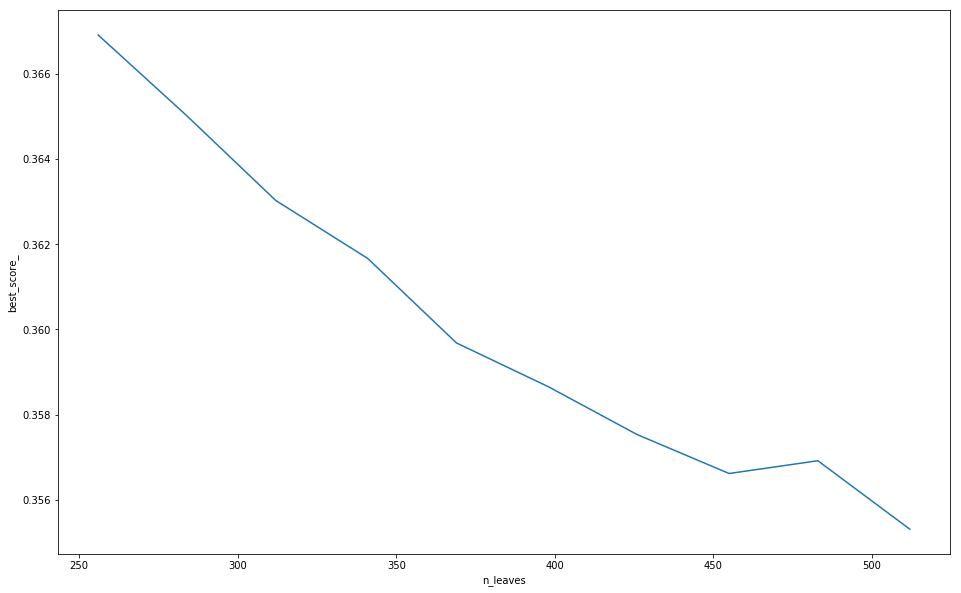

In [139]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

In [140]:
#----------------------------
#2. try larger value of num_leaves
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 512, stop = 1024, num = 10).astype('int'):
    print ('n_leaves',n_leaves)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

n_leaves 512
[1]	valid_0's mape: 0.685143
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.657063
[3]	valid_0's mape: 0.631712
[4]	valid_0's mape: 0.609303
[5]	valid_0's mape: 0.589897
[6]	valid_0's mape: 0.57255
[7]	valid_0's mape: 0.556354
[8]	valid_0's mape: 0.542908
[9]	valid_0's mape: 0.530604
[10]	valid_0's mape: 0.519109
[11]	valid_0's mape: 0.508702
[12]	valid_0's mape: 0.499959
[13]	valid_0's mape: 0.491234
[14]	valid_0's mape: 0.483278
[15]	valid_0's mape: 0.476316
[16]	valid_0's mape: 0.469182
[17]	valid_0's mape: 0.463593
[18]	valid_0's mape: 0.458082
[19]	valid_0's mape: 0.452826
[20]	valid_0's mape: 0.448716
[21]	valid_0's mape: 0.444098
[22]	valid_0's mape: 0.440277
[23]	valid_0's mape: 0.43638
[24]	valid_0's mape: 0.431874
[25]	valid_0's mape: 0.42894
[26]	valid_0's mape: 0.425075
[27]	valid_0's mape: 0.422222
[28]	valid_0's mape: 0.419914
[29]	valid_0's mape: 0.41747
[30]	valid_0's mape: 0.41538
[31]	valid_0's mape: 0.412919
[32]	vali

[267]	valid_0's mape: 0.362322
[268]	valid_0's mape: 0.36235
[269]	valid_0's mape: 0.36236
[270]	valid_0's mape: 0.362383
[271]	valid_0's mape: 0.362351
[272]	valid_0's mape: 0.362355
[273]	valid_0's mape: 0.362341
[274]	valid_0's mape: 0.362325
[275]	valid_0's mape: 0.362315
[276]	valid_0's mape: 0.362295
[277]	valid_0's mape: 0.362301
[278]	valid_0's mape: 0.362229
[279]	valid_0's mape: 0.362114
[280]	valid_0's mape: 0.362095
[281]	valid_0's mape: 0.36209
[282]	valid_0's mape: 0.362072
[283]	valid_0's mape: 0.362064
[284]	valid_0's mape: 0.362031
[285]	valid_0's mape: 0.361998
[286]	valid_0's mape: 0.361994
[287]	valid_0's mape: 0.361986
[288]	valid_0's mape: 0.361919
[289]	valid_0's mape: 0.361874
[290]	valid_0's mape: 0.36187
[291]	valid_0's mape: 0.361853
[292]	valid_0's mape: 0.361812
[293]	valid_0's mape: 0.361806
[294]	valid_0's mape: 0.361791
[295]	valid_0's mape: 0.361669
[296]	valid_0's mape: 0.361633
[297]	valid_0's mape: 0.361643
[298]	valid_0's mape: 0.361605
[299]	valid_

[532]	valid_0's mape: 0.358486
[533]	valid_0's mape: 0.358468
[534]	valid_0's mape: 0.358438
[535]	valid_0's mape: 0.358419
[536]	valid_0's mape: 0.358416
[537]	valid_0's mape: 0.358382
[538]	valid_0's mape: 0.358381
[539]	valid_0's mape: 0.358323
[540]	valid_0's mape: 0.358327
[541]	valid_0's mape: 0.35833
[542]	valid_0's mape: 0.358352
[543]	valid_0's mape: 0.358357
[544]	valid_0's mape: 0.358341
[545]	valid_0's mape: 0.358378
[546]	valid_0's mape: 0.358355
[547]	valid_0's mape: 0.358353
[548]	valid_0's mape: 0.35837
[549]	valid_0's mape: 0.358366
[550]	valid_0's mape: 0.358358
[551]	valid_0's mape: 0.358308
[552]	valid_0's mape: 0.358301
[553]	valid_0's mape: 0.358307
[554]	valid_0's mape: 0.358279
[555]	valid_0's mape: 0.358286
[556]	valid_0's mape: 0.358265
[557]	valid_0's mape: 0.358247
[558]	valid_0's mape: 0.358265
[559]	valid_0's mape: 0.358242
[560]	valid_0's mape: 0.35826
[561]	valid_0's mape: 0.358249
[562]	valid_0's mape: 0.358241
[563]	valid_0's mape: 0.358224
[564]	valid

[125]	valid_0's mape: 0.365999
[126]	valid_0's mape: 0.365936
[127]	valid_0's mape: 0.365764
[128]	valid_0's mape: 0.365662
[129]	valid_0's mape: 0.365545
[130]	valid_0's mape: 0.365357
[131]	valid_0's mape: 0.365311
[132]	valid_0's mape: 0.365235
[133]	valid_0's mape: 0.365122
[134]	valid_0's mape: 0.365023
[135]	valid_0's mape: 0.364709
[136]	valid_0's mape: 0.36451
[137]	valid_0's mape: 0.364478
[138]	valid_0's mape: 0.364402
[139]	valid_0's mape: 0.364365
[140]	valid_0's mape: 0.364226
[141]	valid_0's mape: 0.364129
[142]	valid_0's mape: 0.364091
[143]	valid_0's mape: 0.364059
[144]	valid_0's mape: 0.363989
[145]	valid_0's mape: 0.363933
[146]	valid_0's mape: 0.363821
[147]	valid_0's mape: 0.363768
[148]	valid_0's mape: 0.363746
[149]	valid_0's mape: 0.363688
[150]	valid_0's mape: 0.363696
[151]	valid_0's mape: 0.363655
[152]	valid_0's mape: 0.363575
[153]	valid_0's mape: 0.363534
[154]	valid_0's mape: 0.363462
[155]	valid_0's mape: 0.363455
[156]	valid_0's mape: 0.363367
[157]	val

[391]	valid_0's mape: 0.357938
[392]	valid_0's mape: 0.357939
[393]	valid_0's mape: 0.357919
[394]	valid_0's mape: 0.357919
[395]	valid_0's mape: 0.357907
[396]	valid_0's mape: 0.357901
[397]	valid_0's mape: 0.357883
[398]	valid_0's mape: 0.357897
[399]	valid_0's mape: 0.357889
[400]	valid_0's mape: 0.357892
[401]	valid_0's mape: 0.357892
[402]	valid_0's mape: 0.357892
[403]	valid_0's mape: 0.35773
[404]	valid_0's mape: 0.35772
[405]	valid_0's mape: 0.357744
[406]	valid_0's mape: 0.357757
[407]	valid_0's mape: 0.357571
[408]	valid_0's mape: 0.357578
[409]	valid_0's mape: 0.357561
[410]	valid_0's mape: 0.357517
[411]	valid_0's mape: 0.357487
[412]	valid_0's mape: 0.357474
[413]	valid_0's mape: 0.357462
[414]	valid_0's mape: 0.357459
[415]	valid_0's mape: 0.357449
[416]	valid_0's mape: 0.357442
[417]	valid_0's mape: 0.357434
[418]	valid_0's mape: 0.357436
[419]	valid_0's mape: 0.357455
[420]	valid_0's mape: 0.357449
[421]	valid_0's mape: 0.357447
[422]	valid_0's mape: 0.357459
[423]	vali

[657]	valid_0's mape: 0.35568
[658]	valid_0's mape: 0.355658
[659]	valid_0's mape: 0.355662
[660]	valid_0's mape: 0.355637
[661]	valid_0's mape: 0.355631
[662]	valid_0's mape: 0.355627
[663]	valid_0's mape: 0.355615
[664]	valid_0's mape: 0.355644
[665]	valid_0's mape: 0.355602
[666]	valid_0's mape: 0.355588
[667]	valid_0's mape: 0.355574
[668]	valid_0's mape: 0.355718
[669]	valid_0's mape: 0.355695
[670]	valid_0's mape: 0.355692
[671]	valid_0's mape: 0.355675
[672]	valid_0's mape: 0.355662
[673]	valid_0's mape: 0.355761
[674]	valid_0's mape: 0.355752
[675]	valid_0's mape: 0.355748
[676]	valid_0's mape: 0.355738
[677]	valid_0's mape: 0.355747
[678]	valid_0's mape: 0.355783
[679]	valid_0's mape: 0.355795
[680]	valid_0's mape: 0.355765
[681]	valid_0's mape: 0.355753
[682]	valid_0's mape: 0.35574
[683]	valid_0's mape: 0.355727
[684]	valid_0's mape: 0.355746
[685]	valid_0's mape: 0.355736
[686]	valid_0's mape: 0.355728
[687]	valid_0's mape: 0.35572
[688]	valid_0's mape: 0.355732
[689]	valid

[205]	valid_0's mape: 0.357766
[206]	valid_0's mape: 0.357718
[207]	valid_0's mape: 0.357619
[208]	valid_0's mape: 0.357554
[209]	valid_0's mape: 0.35751
[210]	valid_0's mape: 0.35746
[211]	valid_0's mape: 0.357422
[212]	valid_0's mape: 0.357426
[213]	valid_0's mape: 0.357408
[214]	valid_0's mape: 0.357411
[215]	valid_0's mape: 0.357261
[216]	valid_0's mape: 0.357208
[217]	valid_0's mape: 0.357176
[218]	valid_0's mape: 0.357179
[219]	valid_0's mape: 0.357092
[220]	valid_0's mape: 0.357087
[221]	valid_0's mape: 0.356983
[222]	valid_0's mape: 0.356937
[223]	valid_0's mape: 0.356938
[224]	valid_0's mape: 0.356957
[225]	valid_0's mape: 0.356934
[226]	valid_0's mape: 0.356938
[227]	valid_0's mape: 0.356836
[228]	valid_0's mape: 0.35683
[229]	valid_0's mape: 0.356793
[230]	valid_0's mape: 0.356783
[231]	valid_0's mape: 0.356793
[232]	valid_0's mape: 0.356791
[233]	valid_0's mape: 0.356743
[234]	valid_0's mape: 0.356751
[235]	valid_0's mape: 0.356699
[236]	valid_0's mape: 0.356678
[237]	valid

[471]	valid_0's mape: 0.35263
[472]	valid_0's mape: 0.352641
[473]	valid_0's mape: 0.352644
[474]	valid_0's mape: 0.352695
[475]	valid_0's mape: 0.352705
[476]	valid_0's mape: 0.35267
[477]	valid_0's mape: 0.352675
[478]	valid_0's mape: 0.352664
[479]	valid_0's mape: 0.352614
[480]	valid_0's mape: 0.352592
[481]	valid_0's mape: 0.35257
[482]	valid_0's mape: 0.352545
[483]	valid_0's mape: 0.352535
[484]	valid_0's mape: 0.352533
[485]	valid_0's mape: 0.352527
[486]	valid_0's mape: 0.352542
[487]	valid_0's mape: 0.352542
[488]	valid_0's mape: 0.352553
[489]	valid_0's mape: 0.352558
[490]	valid_0's mape: 0.352557
[491]	valid_0's mape: 0.352548
[492]	valid_0's mape: 0.352536
[493]	valid_0's mape: 0.352539
[494]	valid_0's mape: 0.35256
[495]	valid_0's mape: 0.352558
[496]	valid_0's mape: 0.352578
[497]	valid_0's mape: 0.352569
[498]	valid_0's mape: 0.352576
[499]	valid_0's mape: 0.352542
[500]	valid_0's mape: 0.352517
[501]	valid_0's mape: 0.35252
[502]	valid_0's mape: 0.352532
[503]	valid_0

[737]	valid_0's mape: 0.351282
[738]	valid_0's mape: 0.351277
[739]	valid_0's mape: 0.351247
[740]	valid_0's mape: 0.35123
[741]	valid_0's mape: 0.351249
[742]	valid_0's mape: 0.351228
[743]	valid_0's mape: 0.351223
[744]	valid_0's mape: 0.351221
[745]	valid_0's mape: 0.351227
[746]	valid_0's mape: 0.351212
[747]	valid_0's mape: 0.351202
[748]	valid_0's mape: 0.351179
[749]	valid_0's mape: 0.351164
[750]	valid_0's mape: 0.351128
[751]	valid_0's mape: 0.351116
[752]	valid_0's mape: 0.35109
[753]	valid_0's mape: 0.351102
[754]	valid_0's mape: 0.351146
[755]	valid_0's mape: 0.351116
[756]	valid_0's mape: 0.35111
[757]	valid_0's mape: 0.351103
[758]	valid_0's mape: 0.35109
[759]	valid_0's mape: 0.351092
[760]	valid_0's mape: 0.351092
[761]	valid_0's mape: 0.351072
[762]	valid_0's mape: 0.351088
[763]	valid_0's mape: 0.351079
[764]	valid_0's mape: 0.351068
[765]	valid_0's mape: 0.351055
[766]	valid_0's mape: 0.351054
[767]	valid_0's mape: 0.351045
[768]	valid_0's mape: 0.351056
[769]	valid_

[1003]	valid_0's mape: 0.350601
[1004]	valid_0's mape: 0.350614
[1005]	valid_0's mape: 0.350626
[1006]	valid_0's mape: 0.350579
[1007]	valid_0's mape: 0.350641
[1008]	valid_0's mape: 0.350618
[1009]	valid_0's mape: 0.350631
[1010]	valid_0's mape: 0.350637
[1011]	valid_0's mape: 0.35065
[1012]	valid_0's mape: 0.350676
[1013]	valid_0's mape: 0.350677
[1014]	valid_0's mape: 0.350626
[1015]	valid_0's mape: 0.350629
[1016]	valid_0's mape: 0.350636
[1017]	valid_0's mape: 0.350634
[1018]	valid_0's mape: 0.350631
[1019]	valid_0's mape: 0.350618
[1020]	valid_0's mape: 0.350626
Early stopping, best iteration is:
[970]	valid_0's mape: 0.350535
[1]	valid_0's mape: 0.681656
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.653908
[3]	valid_0's mape: 0.628074
[4]	valid_0's mape: 0.605622
[5]	valid_0's mape: 0.585629
[6]	valid_0's mape: 0.567239
[7]	valid_0's mape: 0.551492
[8]	valid_0's mape: 0.536547
[9]	valid_0's mape: 0.523427
[10]	valid_0's mape: 0.511934
[11]	v

[248]	valid_0's mape: 0.358735
[249]	valid_0's mape: 0.358695
[250]	valid_0's mape: 0.358678
[251]	valid_0's mape: 0.358673
[252]	valid_0's mape: 0.35855
[253]	valid_0's mape: 0.358502
[254]	valid_0's mape: 0.358474
[255]	valid_0's mape: 0.358466
[256]	valid_0's mape: 0.358455
[257]	valid_0's mape: 0.358355
[258]	valid_0's mape: 0.35832
[259]	valid_0's mape: 0.358302
[260]	valid_0's mape: 0.358294
[261]	valid_0's mape: 0.358292
[262]	valid_0's mape: 0.358276
[263]	valid_0's mape: 0.358274
[264]	valid_0's mape: 0.358263
[265]	valid_0's mape: 0.358239
[266]	valid_0's mape: 0.358284
[267]	valid_0's mape: 0.35829
[268]	valid_0's mape: 0.358346
[269]	valid_0's mape: 0.358332
[270]	valid_0's mape: 0.358328
[271]	valid_0's mape: 0.358274
[272]	valid_0's mape: 0.358291
[273]	valid_0's mape: 0.358289
[274]	valid_0's mape: 0.358282
[275]	valid_0's mape: 0.358276
[276]	valid_0's mape: 0.358217
[277]	valid_0's mape: 0.358208
[278]	valid_0's mape: 0.358203
[279]	valid_0's mape: 0.358215
[280]	valid

[515]	valid_0's mape: 0.356499
[516]	valid_0's mape: 0.356466
[517]	valid_0's mape: 0.356475
[518]	valid_0's mape: 0.356483
[519]	valid_0's mape: 0.356508
[520]	valid_0's mape: 0.356494
[521]	valid_0's mape: 0.35648
[522]	valid_0's mape: 0.356459
[523]	valid_0's mape: 0.356455
[524]	valid_0's mape: 0.35646
[525]	valid_0's mape: 0.356482
[526]	valid_0's mape: 0.356507
[527]	valid_0's mape: 0.356524
[528]	valid_0's mape: 0.356526
[529]	valid_0's mape: 0.3565
[530]	valid_0's mape: 0.356509
[531]	valid_0's mape: 0.356568
[532]	valid_0's mape: 0.356553
[533]	valid_0's mape: 0.356559
[534]	valid_0's mape: 0.356578
[535]	valid_0's mape: 0.356577
[536]	valid_0's mape: 0.356589
[537]	valid_0's mape: 0.356555
[538]	valid_0's mape: 0.356521
[539]	valid_0's mape: 0.356501
[540]	valid_0's mape: 0.356396
[541]	valid_0's mape: 0.356367
[542]	valid_0's mape: 0.356369
[543]	valid_0's mape: 0.35638
[544]	valid_0's mape: 0.356381
[545]	valid_0's mape: 0.356304
[546]	valid_0's mape: 0.356286
[547]	valid_0

[782]	valid_0's mape: 0.3556
[783]	valid_0's mape: 0.355587
[784]	valid_0's mape: 0.355582
[785]	valid_0's mape: 0.355587
[786]	valid_0's mape: 0.355574
[787]	valid_0's mape: 0.355556
[788]	valid_0's mape: 0.355546
[789]	valid_0's mape: 0.355607
[790]	valid_0's mape: 0.355604
[791]	valid_0's mape: 0.355611
[792]	valid_0's mape: 0.355608
[793]	valid_0's mape: 0.355573
[794]	valid_0's mape: 0.355602
[795]	valid_0's mape: 0.355593
[796]	valid_0's mape: 0.355628
[797]	valid_0's mape: 0.355627
[798]	valid_0's mape: 0.355625
[799]	valid_0's mape: 0.355616
[800]	valid_0's mape: 0.355619
[801]	valid_0's mape: 0.355631
[802]	valid_0's mape: 0.355671
[803]	valid_0's mape: 0.355667
[804]	valid_0's mape: 0.355653
[805]	valid_0's mape: 0.355634
[806]	valid_0's mape: 0.355615
[807]	valid_0's mape: 0.355569
[808]	valid_0's mape: 0.355588
[809]	valid_0's mape: 0.355567
[810]	valid_0's mape: 0.355547
[811]	valid_0's mape: 0.35553
[812]	valid_0's mape: 0.355514
[813]	valid_0's mape: 0.355515
[814]	valid

[67]	valid_0's mape: 0.379819
[68]	valid_0's mape: 0.379582
[69]	valid_0's mape: 0.379151
[70]	valid_0's mape: 0.378832
[71]	valid_0's mape: 0.378536
[72]	valid_0's mape: 0.37823
[73]	valid_0's mape: 0.37791
[74]	valid_0's mape: 0.377525
[75]	valid_0's mape: 0.377195
[76]	valid_0's mape: 0.376795
[77]	valid_0's mape: 0.376585
[78]	valid_0's mape: 0.376316
[79]	valid_0's mape: 0.376153
[80]	valid_0's mape: 0.375942
[81]	valid_0's mape: 0.375784
[82]	valid_0's mape: 0.375521
[83]	valid_0's mape: 0.375308
[84]	valid_0's mape: 0.375015
[85]	valid_0's mape: 0.374539
[86]	valid_0's mape: 0.374314
[87]	valid_0's mape: 0.373977
[88]	valid_0's mape: 0.373626
[89]	valid_0's mape: 0.373332
[90]	valid_0's mape: 0.372903
[91]	valid_0's mape: 0.372662
[92]	valid_0's mape: 0.37245
[93]	valid_0's mape: 0.372219
[94]	valid_0's mape: 0.372003
[95]	valid_0's mape: 0.371744
[96]	valid_0's mape: 0.371551
[97]	valid_0's mape: 0.371285
[98]	valid_0's mape: 0.3711
[99]	valid_0's mape: 0.370946
[100]	valid_0's

[334]	valid_0's mape: 0.35907
[335]	valid_0's mape: 0.359065
[336]	valid_0's mape: 0.359049
[337]	valid_0's mape: 0.359033
[338]	valid_0's mape: 0.359099
[339]	valid_0's mape: 0.359084
[340]	valid_0's mape: 0.35907
[341]	valid_0's mape: 0.359089
[342]	valid_0's mape: 0.359087
[343]	valid_0's mape: 0.359062
[344]	valid_0's mape: 0.359059
[345]	valid_0's mape: 0.359028
[346]	valid_0's mape: 0.358991
[347]	valid_0's mape: 0.358977
[348]	valid_0's mape: 0.358963
[349]	valid_0's mape: 0.358977
[350]	valid_0's mape: 0.358969
[351]	valid_0's mape: 0.358938
[352]	valid_0's mape: 0.358917
[353]	valid_0's mape: 0.35892
[354]	valid_0's mape: 0.358922
[355]	valid_0's mape: 0.358949
[356]	valid_0's mape: 0.358936
[357]	valid_0's mape: 0.358923
[358]	valid_0's mape: 0.358915
[359]	valid_0's mape: 0.35893
[360]	valid_0's mape: 0.358953
[361]	valid_0's mape: 0.358906
[362]	valid_0's mape: 0.358902
[363]	valid_0's mape: 0.358882
[364]	valid_0's mape: 0.358859
[365]	valid_0's mape: 0.358877
[366]	valid_

[46]	valid_0's mape: 0.38777
[47]	valid_0's mape: 0.387064
[48]	valid_0's mape: 0.386419
[49]	valid_0's mape: 0.385873
[50]	valid_0's mape: 0.385308
[51]	valid_0's mape: 0.384432
[52]	valid_0's mape: 0.383565
[53]	valid_0's mape: 0.382942
[54]	valid_0's mape: 0.382446
[55]	valid_0's mape: 0.381964
[56]	valid_0's mape: 0.381637
[57]	valid_0's mape: 0.380723
[58]	valid_0's mape: 0.380325
[59]	valid_0's mape: 0.380018
[60]	valid_0's mape: 0.379756
[61]	valid_0's mape: 0.379478
[62]	valid_0's mape: 0.378812
[63]	valid_0's mape: 0.378372
[64]	valid_0's mape: 0.377956
[65]	valid_0's mape: 0.377658
[66]	valid_0's mape: 0.377335
[67]	valid_0's mape: 0.377039
[68]	valid_0's mape: 0.376798
[69]	valid_0's mape: 0.376519
[70]	valid_0's mape: 0.376145
[71]	valid_0's mape: 0.375831
[72]	valid_0's mape: 0.375514
[73]	valid_0's mape: 0.375098
[74]	valid_0's mape: 0.374601
[75]	valid_0's mape: 0.374318
[76]	valid_0's mape: 0.37404
[77]	valid_0's mape: 0.373752
[78]	valid_0's mape: 0.373388
[79]	valid_0

[314]	valid_0's mape: 0.359051
[315]	valid_0's mape: 0.358999
[316]	valid_0's mape: 0.359007
[317]	valid_0's mape: 0.358993
[318]	valid_0's mape: 0.358991
[319]	valid_0's mape: 0.358945
[320]	valid_0's mape: 0.358959
[321]	valid_0's mape: 0.358949
[322]	valid_0's mape: 0.358931
[323]	valid_0's mape: 0.358901
[324]	valid_0's mape: 0.358927
[325]	valid_0's mape: 0.358915
[326]	valid_0's mape: 0.358848
[327]	valid_0's mape: 0.358832
[328]	valid_0's mape: 0.358825
[329]	valid_0's mape: 0.358818
[330]	valid_0's mape: 0.358802
[331]	valid_0's mape: 0.35879
[332]	valid_0's mape: 0.358797
[333]	valid_0's mape: 0.358831
[334]	valid_0's mape: 0.358795
[335]	valid_0's mape: 0.35873
[336]	valid_0's mape: 0.358734
[337]	valid_0's mape: 0.358726
[338]	valid_0's mape: 0.358722
[339]	valid_0's mape: 0.358722
[340]	valid_0's mape: 0.358725
[341]	valid_0's mape: 0.358664
[342]	valid_0's mape: 0.358637
[343]	valid_0's mape: 0.358634
[344]	valid_0's mape: 0.358635
[345]	valid_0's mape: 0.358636
[346]	vali

[581]	valid_0's mape: 0.356882
[582]	valid_0's mape: 0.356879
[583]	valid_0's mape: 0.35683
[584]	valid_0's mape: 0.356828
[585]	valid_0's mape: 0.356815
[586]	valid_0's mape: 0.356797
[587]	valid_0's mape: 0.356796
[588]	valid_0's mape: 0.356774
[589]	valid_0's mape: 0.356803
[590]	valid_0's mape: 0.356748
[591]	valid_0's mape: 0.356759
[592]	valid_0's mape: 0.35674
[593]	valid_0's mape: 0.356707
[594]	valid_0's mape: 0.356617
[595]	valid_0's mape: 0.356592
[596]	valid_0's mape: 0.356588
[597]	valid_0's mape: 0.356601
[598]	valid_0's mape: 0.356556
[599]	valid_0's mape: 0.356567
[600]	valid_0's mape: 0.356553
[601]	valid_0's mape: 0.356475
[602]	valid_0's mape: 0.356464
[603]	valid_0's mape: 0.356452
[604]	valid_0's mape: 0.356456
[605]	valid_0's mape: 0.356453
[606]	valid_0's mape: 0.356437
[607]	valid_0's mape: 0.356503
[608]	valid_0's mape: 0.356492
[609]	valid_0's mape: 0.356507
[610]	valid_0's mape: 0.35653
[611]	valid_0's mape: 0.356532
[612]	valid_0's mape: 0.356549
[613]	valid

[50]	valid_0's mape: 0.383046
[51]	valid_0's mape: 0.382353
[52]	valid_0's mape: 0.381808
[53]	valid_0's mape: 0.381174
[54]	valid_0's mape: 0.380759
[55]	valid_0's mape: 0.380247
[56]	valid_0's mape: 0.379711
[57]	valid_0's mape: 0.379243
[58]	valid_0's mape: 0.378839
[59]	valid_0's mape: 0.378334
[60]	valid_0's mape: 0.377603
[61]	valid_0's mape: 0.377209
[62]	valid_0's mape: 0.376922
[63]	valid_0's mape: 0.376412
[64]	valid_0's mape: 0.375523
[65]	valid_0's mape: 0.375152
[66]	valid_0's mape: 0.37486
[67]	valid_0's mape: 0.37454
[68]	valid_0's mape: 0.374113
[69]	valid_0's mape: 0.373844
[70]	valid_0's mape: 0.373558
[71]	valid_0's mape: 0.373115
[72]	valid_0's mape: 0.372836
[73]	valid_0's mape: 0.372581
[74]	valid_0's mape: 0.372158
[75]	valid_0's mape: 0.371888
[76]	valid_0's mape: 0.371373
[77]	valid_0's mape: 0.371067
[78]	valid_0's mape: 0.370906
[79]	valid_0's mape: 0.370648
[80]	valid_0's mape: 0.37045
[81]	valid_0's mape: 0.370025
[82]	valid_0's mape: 0.369853
[83]	valid_0'

[317]	valid_0's mape: 0.356931
[318]	valid_0's mape: 0.356908
[319]	valid_0's mape: 0.356878
[320]	valid_0's mape: 0.356878
[321]	valid_0's mape: 0.356867
[322]	valid_0's mape: 0.356867
[323]	valid_0's mape: 0.356871
[324]	valid_0's mape: 0.356846
[325]	valid_0's mape: 0.356838
[326]	valid_0's mape: 0.357
[327]	valid_0's mape: 0.357096
[328]	valid_0's mape: 0.357175
[329]	valid_0's mape: 0.357152
[330]	valid_0's mape: 0.357134
[331]	valid_0's mape: 0.357097
[332]	valid_0's mape: 0.357092
[333]	valid_0's mape: 0.357094
[334]	valid_0's mape: 0.35706
[335]	valid_0's mape: 0.357041
[336]	valid_0's mape: 0.356996
[337]	valid_0's mape: 0.356964
[338]	valid_0's mape: 0.356937
[339]	valid_0's mape: 0.356917
[340]	valid_0's mape: 0.356911
[341]	valid_0's mape: 0.3569
[342]	valid_0's mape: 0.35689
[343]	valid_0's mape: 0.356899
[344]	valid_0's mape: 0.356864
[345]	valid_0's mape: 0.356847
[346]	valid_0's mape: 0.356818
[347]	valid_0's mape: 0.35681
[348]	valid_0's mape: 0.356777
[349]	valid_0's 

[583]	valid_0's mape: 0.354847
[584]	valid_0's mape: 0.354873
[585]	valid_0's mape: 0.354883
[586]	valid_0's mape: 0.35485
[587]	valid_0's mape: 0.354845
[588]	valid_0's mape: 0.354813
[589]	valid_0's mape: 0.354897
[590]	valid_0's mape: 0.354943
[591]	valid_0's mape: 0.355034
[592]	valid_0's mape: 0.355012
[593]	valid_0's mape: 0.354992
[594]	valid_0's mape: 0.35498
[595]	valid_0's mape: 0.355007
[596]	valid_0's mape: 0.354972
[597]	valid_0's mape: 0.35494
[598]	valid_0's mape: 0.354903
[599]	valid_0's mape: 0.354903
[600]	valid_0's mape: 0.354863
[601]	valid_0's mape: 0.354819
[602]	valid_0's mape: 0.354798
[603]	valid_0's mape: 0.354764
[604]	valid_0's mape: 0.354787
[605]	valid_0's mape: 0.35475
[606]	valid_0's mape: 0.354761
[607]	valid_0's mape: 0.354772
[608]	valid_0's mape: 0.354783
[609]	valid_0's mape: 0.354796
[610]	valid_0's mape: 0.354819
[611]	valid_0's mape: 0.35484
Early stopping, best iteration is:
[561]	valid_0's mape: 0.354561
[1]	valid_0's mape: 0.680961
Training un

[237]	valid_0's mape: 0.354763
[238]	valid_0's mape: 0.3547
[239]	valid_0's mape: 0.354626
[240]	valid_0's mape: 0.354612
[241]	valid_0's mape: 0.354558
[242]	valid_0's mape: 0.354529
[243]	valid_0's mape: 0.35451
[244]	valid_0's mape: 0.354492
[245]	valid_0's mape: 0.354489
[246]	valid_0's mape: 0.354421
[247]	valid_0's mape: 0.354423
[248]	valid_0's mape: 0.354415
[249]	valid_0's mape: 0.354386
[250]	valid_0's mape: 0.354339
[251]	valid_0's mape: 0.354333
[252]	valid_0's mape: 0.354335
[253]	valid_0's mape: 0.354296
[254]	valid_0's mape: 0.354268
[255]	valid_0's mape: 0.354211
[256]	valid_0's mape: 0.354113
[257]	valid_0's mape: 0.354114
[258]	valid_0's mape: 0.354076
[259]	valid_0's mape: 0.354101
[260]	valid_0's mape: 0.354008
[261]	valid_0's mape: 0.353982
[262]	valid_0's mape: 0.353974
[263]	valid_0's mape: 0.353958
[264]	valid_0's mape: 0.353927
[265]	valid_0's mape: 0.353907
[266]	valid_0's mape: 0.353859
[267]	valid_0's mape: 0.353873
[268]	valid_0's mape: 0.353835
[269]	valid

[503]	valid_0's mape: 0.352253
[504]	valid_0's mape: 0.352222
[505]	valid_0's mape: 0.352294
[506]	valid_0's mape: 0.352255
[507]	valid_0's mape: 0.352223
[508]	valid_0's mape: 0.352226
[509]	valid_0's mape: 0.352206
[510]	valid_0's mape: 0.352208
[511]	valid_0's mape: 0.352198
[512]	valid_0's mape: 0.352196
[513]	valid_0's mape: 0.352225
[514]	valid_0's mape: 0.352202
[515]	valid_0's mape: 0.352177
[516]	valid_0's mape: 0.352261
[517]	valid_0's mape: 0.352288
[518]	valid_0's mape: 0.352262
[519]	valid_0's mape: 0.352238
[520]	valid_0's mape: 0.352216
[521]	valid_0's mape: 0.352201
Early stopping, best iteration is:
[471]	valid_0's mape: 0.351483
[1]	valid_0's mape: 0.681295
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.651735
[3]	valid_0's mape: 0.624762
[4]	valid_0's mape: 0.600165
[5]	valid_0's mape: 0.579344
[6]	valid_0's mape: 0.560969
[7]	valid_0's mape: 0.545388
[8]	valid_0's mape: 0.530757
[9]	valid_0's mape: 0.517581
[10]	valid_0's mape: 0

[248]	valid_0's mape: 0.356831
[249]	valid_0's mape: 0.356835
[250]	valid_0's mape: 0.356823
[251]	valid_0's mape: 0.356779
[252]	valid_0's mape: 0.356798
[253]	valid_0's mape: 0.356775
[254]	valid_0's mape: 0.356751
[255]	valid_0's mape: 0.356746
[256]	valid_0's mape: 0.356754
[257]	valid_0's mape: 0.356766
[258]	valid_0's mape: 0.356757
[259]	valid_0's mape: 0.356735
[260]	valid_0's mape: 0.356733
[261]	valid_0's mape: 0.356678
[262]	valid_0's mape: 0.356654
[263]	valid_0's mape: 0.356625
[264]	valid_0's mape: 0.356637
[265]	valid_0's mape: 0.356618
[266]	valid_0's mape: 0.356573
[267]	valid_0's mape: 0.356462
[268]	valid_0's mape: 0.356437
[269]	valid_0's mape: 0.356437
[270]	valid_0's mape: 0.356392
[271]	valid_0's mape: 0.356386
[272]	valid_0's mape: 0.3564
[273]	valid_0's mape: 0.356423
[274]	valid_0's mape: 0.356425
[275]	valid_0's mape: 0.356409
[276]	valid_0's mape: 0.356392
[277]	valid_0's mape: 0.3564
[278]	valid_0's mape: 0.356323
[279]	valid_0's mape: 0.356313
[280]	valid_

[142]	valid_0's mape: 0.362199
[143]	valid_0's mape: 0.362108
[144]	valid_0's mape: 0.362069
[145]	valid_0's mape: 0.362062
[146]	valid_0's mape: 0.36198
[147]	valid_0's mape: 0.36196
[148]	valid_0's mape: 0.361888
[149]	valid_0's mape: 0.361831
[150]	valid_0's mape: 0.361768
[151]	valid_0's mape: 0.361747
[152]	valid_0's mape: 0.361709
[153]	valid_0's mape: 0.361579
[154]	valid_0's mape: 0.361573
[155]	valid_0's mape: 0.361507
[156]	valid_0's mape: 0.361458
[157]	valid_0's mape: 0.361387
[158]	valid_0's mape: 0.361362
[159]	valid_0's mape: 0.361231
[160]	valid_0's mape: 0.361197
[161]	valid_0's mape: 0.361083
[162]	valid_0's mape: 0.361066
[163]	valid_0's mape: 0.360946
[164]	valid_0's mape: 0.360877
[165]	valid_0's mape: 0.360681
[166]	valid_0's mape: 0.360633
[167]	valid_0's mape: 0.360592
[168]	valid_0's mape: 0.360568
[169]	valid_0's mape: 0.360533
[170]	valid_0's mape: 0.360504
[171]	valid_0's mape: 0.360466
[172]	valid_0's mape: 0.360441
[173]	valid_0's mape: 0.360366
[174]	vali

[408]	valid_0's mape: 0.356261
[409]	valid_0's mape: 0.356247
[410]	valid_0's mape: 0.356265
[411]	valid_0's mape: 0.356256
[412]	valid_0's mape: 0.356252
[413]	valid_0's mape: 0.356226
[414]	valid_0's mape: 0.356213
[415]	valid_0's mape: 0.356456
[416]	valid_0's mape: 0.356456
[417]	valid_0's mape: 0.356439
[418]	valid_0's mape: 0.356452
[419]	valid_0's mape: 0.356427
[420]	valid_0's mape: 0.356442
[421]	valid_0's mape: 0.356403
[422]	valid_0's mape: 0.356409
[423]	valid_0's mape: 0.356419
[424]	valid_0's mape: 0.356435
[425]	valid_0's mape: 0.356437
[426]	valid_0's mape: 0.356431
[427]	valid_0's mape: 0.356374
[428]	valid_0's mape: 0.356392
[429]	valid_0's mape: 0.356406
[430]	valid_0's mape: 0.356398
[431]	valid_0's mape: 0.356395
[432]	valid_0's mape: 0.356369
[433]	valid_0's mape: 0.356392
[434]	valid_0's mape: 0.356388
[435]	valid_0's mape: 0.356374
[436]	valid_0's mape: 0.356343
[437]	valid_0's mape: 0.356367
[438]	valid_0's mape: 0.356361
[439]	valid_0's mape: 0.356348
[440]	va

[208]	valid_0's mape: 0.358841
[209]	valid_0's mape: 0.358812
[210]	valid_0's mape: 0.358819
[211]	valid_0's mape: 0.358766
[212]	valid_0's mape: 0.358751
[213]	valid_0's mape: 0.358717
[214]	valid_0's mape: 0.358701
[215]	valid_0's mape: 0.358675
[216]	valid_0's mape: 0.358634
[217]	valid_0's mape: 0.358601
[218]	valid_0's mape: 0.358627
[219]	valid_0's mape: 0.358595
[220]	valid_0's mape: 0.358507
[221]	valid_0's mape: 0.358419
[222]	valid_0's mape: 0.358426
[223]	valid_0's mape: 0.358381
[224]	valid_0's mape: 0.358374
[225]	valid_0's mape: 0.358387
[226]	valid_0's mape: 0.358377
[227]	valid_0's mape: 0.35837
[228]	valid_0's mape: 0.358366
[229]	valid_0's mape: 0.358305
[230]	valid_0's mape: 0.358224
[231]	valid_0's mape: 0.358205
[232]	valid_0's mape: 0.358187
[233]	valid_0's mape: 0.358147
[234]	valid_0's mape: 0.358145
[235]	valid_0's mape: 0.358136
[236]	valid_0's mape: 0.35808
[237]	valid_0's mape: 0.358057
[238]	valid_0's mape: 0.35802
[239]	valid_0's mape: 0.357989
[240]	valid

[473]	valid_0's mape: 0.356308
[474]	valid_0's mape: 0.356282
[475]	valid_0's mape: 0.35625
[476]	valid_0's mape: 0.356249
[477]	valid_0's mape: 0.356229
[478]	valid_0's mape: 0.356231
[479]	valid_0's mape: 0.356205
[480]	valid_0's mape: 0.356201
[481]	valid_0's mape: 0.356207
[482]	valid_0's mape: 0.356197
[483]	valid_0's mape: 0.356251
[484]	valid_0's mape: 0.356268
[485]	valid_0's mape: 0.356244
[486]	valid_0's mape: 0.356204
[487]	valid_0's mape: 0.356244
[488]	valid_0's mape: 0.356245
[489]	valid_0's mape: 0.356107
[490]	valid_0's mape: 0.356076
[491]	valid_0's mape: 0.35608
[492]	valid_0's mape: 0.356085
[493]	valid_0's mape: 0.356073
[494]	valid_0's mape: 0.356092
[495]	valid_0's mape: 0.356095
[496]	valid_0's mape: 0.356087
[497]	valid_0's mape: 0.356076
[498]	valid_0's mape: 0.356072
[499]	valid_0's mape: 0.356098
[500]	valid_0's mape: 0.356074
[501]	valid_0's mape: 0.356093
[502]	valid_0's mape: 0.356047
[503]	valid_0's mape: 0.356076
[504]	valid_0's mape: 0.35608
[505]	valid

[179]	valid_0's mape: 0.357557
[180]	valid_0's mape: 0.357526
[181]	valid_0's mape: 0.357512
[182]	valid_0's mape: 0.357508
[183]	valid_0's mape: 0.357517
[184]	valid_0's mape: 0.357462
[185]	valid_0's mape: 0.357464
[186]	valid_0's mape: 0.357437
[187]	valid_0's mape: 0.357391
[188]	valid_0's mape: 0.357367
[189]	valid_0's mape: 0.357388
[190]	valid_0's mape: 0.357364
[191]	valid_0's mape: 0.357362
[192]	valid_0's mape: 0.357353
[193]	valid_0's mape: 0.357393
[194]	valid_0's mape: 0.357348
[195]	valid_0's mape: 0.357324
[196]	valid_0's mape: 0.357319
[197]	valid_0's mape: 0.357295
[198]	valid_0's mape: 0.357279
[199]	valid_0's mape: 0.357272
[200]	valid_0's mape: 0.357253
[201]	valid_0's mape: 0.357193
[202]	valid_0's mape: 0.357187
[203]	valid_0's mape: 0.357161
[204]	valid_0's mape: 0.357155
[205]	valid_0's mape: 0.357129
[206]	valid_0's mape: 0.357107
[207]	valid_0's mape: 0.357046
[208]	valid_0's mape: 0.357032
[209]	valid_0's mape: 0.357023
[210]	valid_0's mape: 0.357018
[211]	va

[445]	valid_0's mape: 0.354095
[446]	valid_0's mape: 0.35418
[447]	valid_0's mape: 0.35416
[448]	valid_0's mape: 0.354167
[449]	valid_0's mape: 0.354155
[450]	valid_0's mape: 0.354155
[451]	valid_0's mape: 0.354147
[452]	valid_0's mape: 0.354123
[453]	valid_0's mape: 0.354147
[454]	valid_0's mape: 0.354122
[455]	valid_0's mape: 0.354147
[456]	valid_0's mape: 0.354136
[457]	valid_0's mape: 0.354137
[458]	valid_0's mape: 0.354126
[459]	valid_0's mape: 0.354096
[460]	valid_0's mape: 0.354129
[461]	valid_0's mape: 0.354149
[462]	valid_0's mape: 0.354151
[463]	valid_0's mape: 0.354129
[464]	valid_0's mape: 0.35412
[465]	valid_0's mape: 0.354131
[466]	valid_0's mape: 0.354128
[467]	valid_0's mape: 0.354119
[468]	valid_0's mape: 0.354142
[469]	valid_0's mape: 0.35417
[470]	valid_0's mape: 0.354151
[471]	valid_0's mape: 0.354159
[472]	valid_0's mape: 0.354143
[473]	valid_0's mape: 0.354134
[474]	valid_0's mape: 0.354158
[475]	valid_0's mape: 0.354167
[476]	valid_0's mape: 0.354184
[477]	valid_

[216]	valid_0's mape: 0.353637
[217]	valid_0's mape: 0.353549
[218]	valid_0's mape: 0.353544
[219]	valid_0's mape: 0.353535
[220]	valid_0's mape: 0.353554
[221]	valid_0's mape: 0.353593
[222]	valid_0's mape: 0.353542
[223]	valid_0's mape: 0.353529
[224]	valid_0's mape: 0.353488
[225]	valid_0's mape: 0.35343
[226]	valid_0's mape: 0.353383
[227]	valid_0's mape: 0.353332
[228]	valid_0's mape: 0.353331
[229]	valid_0's mape: 0.35327
[230]	valid_0's mape: 0.353247
[231]	valid_0's mape: 0.353167
[232]	valid_0's mape: 0.353186
[233]	valid_0's mape: 0.353198
[234]	valid_0's mape: 0.353171
[235]	valid_0's mape: 0.353146
[236]	valid_0's mape: 0.35304
[237]	valid_0's mape: 0.353043
[238]	valid_0's mape: 0.353032
[239]	valid_0's mape: 0.352979
[240]	valid_0's mape: 0.352941
[241]	valid_0's mape: 0.352963
[242]	valid_0's mape: 0.35297
[243]	valid_0's mape: 0.352925
[244]	valid_0's mape: 0.352891
[245]	valid_0's mape: 0.352889
[246]	valid_0's mape: 0.352886
[247]	valid_0's mape: 0.352923
[248]	valid_

[16]	valid_0's mape: 0.447375
[17]	valid_0's mape: 0.441452
[18]	valid_0's mape: 0.435636
[19]	valid_0's mape: 0.431454
[20]	valid_0's mape: 0.426627
[21]	valid_0's mape: 0.4231
[22]	valid_0's mape: 0.419047
[23]	valid_0's mape: 0.415451
[24]	valid_0's mape: 0.41218
[25]	valid_0's mape: 0.409175
[26]	valid_0's mape: 0.406968
[27]	valid_0's mape: 0.404171
[28]	valid_0's mape: 0.401403
[29]	valid_0's mape: 0.399402
[30]	valid_0's mape: 0.39689
[31]	valid_0's mape: 0.395067
[32]	valid_0's mape: 0.393512
[33]	valid_0's mape: 0.3922
[34]	valid_0's mape: 0.391182
[35]	valid_0's mape: 0.390013
[36]	valid_0's mape: 0.388677
[37]	valid_0's mape: 0.387334
[38]	valid_0's mape: 0.385993
[39]	valid_0's mape: 0.385313
[40]	valid_0's mape: 0.384325
[41]	valid_0's mape: 0.383224
[42]	valid_0's mape: 0.382546
[43]	valid_0's mape: 0.381839
[44]	valid_0's mape: 0.380886
[45]	valid_0's mape: 0.379701
[46]	valid_0's mape: 0.378955
[47]	valid_0's mape: 0.378269
[48]	valid_0's mape: 0.37771
[49]	valid_0's ma

[284]	valid_0's mape: 0.355824
[285]	valid_0's mape: 0.355775
[286]	valid_0's mape: 0.35576
[287]	valid_0's mape: 0.355757
[288]	valid_0's mape: 0.355726
[289]	valid_0's mape: 0.355728
[290]	valid_0's mape: 0.35569
[291]	valid_0's mape: 0.355645
[292]	valid_0's mape: 0.355649
[293]	valid_0's mape: 0.355621
[294]	valid_0's mape: 0.355596
[295]	valid_0's mape: 0.355593
[296]	valid_0's mape: 0.355606
[297]	valid_0's mape: 0.355621
[298]	valid_0's mape: 0.355606
[299]	valid_0's mape: 0.355598
[300]	valid_0's mape: 0.355584
[301]	valid_0's mape: 0.355554
[302]	valid_0's mape: 0.355551
[303]	valid_0's mape: 0.355543
[304]	valid_0's mape: 0.355549
[305]	valid_0's mape: 0.355503
[306]	valid_0's mape: 0.355462
[307]	valid_0's mape: 0.355465
[308]	valid_0's mape: 0.355459
[309]	valid_0's mape: 0.355431
[310]	valid_0's mape: 0.355409
[311]	valid_0's mape: 0.355411
[312]	valid_0's mape: 0.355403
[313]	valid_0's mape: 0.355384
[314]	valid_0's mape: 0.355357
[315]	valid_0's mape: 0.355375
[316]	vali

[123]	valid_0's mape: 0.362194
[124]	valid_0's mape: 0.36214
[125]	valid_0's mape: 0.361983
[126]	valid_0's mape: 0.361935
[127]	valid_0's mape: 0.361856
[128]	valid_0's mape: 0.361741
[129]	valid_0's mape: 0.3617
[130]	valid_0's mape: 0.361673
[131]	valid_0's mape: 0.361561
[132]	valid_0's mape: 0.361472
[133]	valid_0's mape: 0.361443
[134]	valid_0's mape: 0.361383
[135]	valid_0's mape: 0.361352
[136]	valid_0's mape: 0.36126
[137]	valid_0's mape: 0.361072
[138]	valid_0's mape: 0.360952
[139]	valid_0's mape: 0.360911
[140]	valid_0's mape: 0.360796
[141]	valid_0's mape: 0.360747
[142]	valid_0's mape: 0.360713
[143]	valid_0's mape: 0.360631
[144]	valid_0's mape: 0.360512
[145]	valid_0's mape: 0.360485
[146]	valid_0's mape: 0.360997
[147]	valid_0's mape: 0.361006
[148]	valid_0's mape: 0.361056
[149]	valid_0's mape: 0.360948
[150]	valid_0's mape: 0.360915
[151]	valid_0's mape: 0.360771
[152]	valid_0's mape: 0.360711
[153]	valid_0's mape: 0.360611
[154]	valid_0's mape: 0.36052
[155]	valid_0

[389]	valid_0's mape: 0.355874
[390]	valid_0's mape: 0.355903
[391]	valid_0's mape: 0.355911
[392]	valid_0's mape: 0.355882
[393]	valid_0's mape: 0.355862
[394]	valid_0's mape: 0.355827
[395]	valid_0's mape: 0.355837
[396]	valid_0's mape: 0.355842
[397]	valid_0's mape: 0.355796
[398]	valid_0's mape: 0.355771
[399]	valid_0's mape: 0.355753
[400]	valid_0's mape: 0.355726
[401]	valid_0's mape: 0.355723
[402]	valid_0's mape: 0.355703
[403]	valid_0's mape: 0.355622
[404]	valid_0's mape: 0.355588
[405]	valid_0's mape: 0.355601
[406]	valid_0's mape: 0.355582
[407]	valid_0's mape: 0.35552
[408]	valid_0's mape: 0.355559
[409]	valid_0's mape: 0.355545
[410]	valid_0's mape: 0.355493
[411]	valid_0's mape: 0.355489
[412]	valid_0's mape: 0.355475
[413]	valid_0's mape: 0.355474
[414]	valid_0's mape: 0.355494
[415]	valid_0's mape: 0.355463
[416]	valid_0's mape: 0.355447
[417]	valid_0's mape: 0.355449
[418]	valid_0's mape: 0.355437
[419]	valid_0's mape: 0.355429
[420]	valid_0's mape: 0.355442
[421]	val

[143]	valid_0's mape: 0.361148
[144]	valid_0's mape: 0.361121
[145]	valid_0's mape: 0.361065
[146]	valid_0's mape: 0.360964
[147]	valid_0's mape: 0.360906
[148]	valid_0's mape: 0.360837
[149]	valid_0's mape: 0.360817
[150]	valid_0's mape: 0.360738
[151]	valid_0's mape: 0.360654
[152]	valid_0's mape: 0.360596
[153]	valid_0's mape: 0.360524
[154]	valid_0's mape: 0.360392
[155]	valid_0's mape: 0.360327
[156]	valid_0's mape: 0.360276
[157]	valid_0's mape: 0.360209
[158]	valid_0's mape: 0.360179
[159]	valid_0's mape: 0.360071
[160]	valid_0's mape: 0.359967
[161]	valid_0's mape: 0.359949
[162]	valid_0's mape: 0.359891
[163]	valid_0's mape: 0.359894
[164]	valid_0's mape: 0.359865
[165]	valid_0's mape: 0.359866
[166]	valid_0's mape: 0.359837
[167]	valid_0's mape: 0.359738
[168]	valid_0's mape: 0.35967
[169]	valid_0's mape: 0.359655
[170]	valid_0's mape: 0.359574
[171]	valid_0's mape: 0.359595
[172]	valid_0's mape: 0.359501
[173]	valid_0's mape: 0.359509
[174]	valid_0's mape: 0.359439
[175]	val

[409]	valid_0's mape: 0.35536
[410]	valid_0's mape: 0.355372
[411]	valid_0's mape: 0.355347
[412]	valid_0's mape: 0.35535
[413]	valid_0's mape: 0.355409
[414]	valid_0's mape: 0.355406
[415]	valid_0's mape: 0.355367
[416]	valid_0's mape: 0.35532
[417]	valid_0's mape: 0.355345
[418]	valid_0's mape: 0.355349
[419]	valid_0's mape: 0.355365
[420]	valid_0's mape: 0.355389
[421]	valid_0's mape: 0.355438
[422]	valid_0's mape: 0.355431
[423]	valid_0's mape: 0.355382
[424]	valid_0's mape: 0.355401
[425]	valid_0's mape: 0.355374
[426]	valid_0's mape: 0.355345
[427]	valid_0's mape: 0.355309
[428]	valid_0's mape: 0.355276
[429]	valid_0's mape: 0.355256
[430]	valid_0's mape: 0.355262
[431]	valid_0's mape: 0.355276
[432]	valid_0's mape: 0.355264
[433]	valid_0's mape: 0.355241
[434]	valid_0's mape: 0.355223
[435]	valid_0's mape: 0.355206
[436]	valid_0's mape: 0.355217
[437]	valid_0's mape: 0.355182
[438]	valid_0's mape: 0.355199
[439]	valid_0's mape: 0.355205
[440]	valid_0's mape: 0.355209
[441]	valid

[79]	valid_0's mape: 0.364057
[80]	valid_0's mape: 0.363845
[81]	valid_0's mape: 0.363581
[82]	valid_0's mape: 0.363389
[83]	valid_0's mape: 0.36304
[84]	valid_0's mape: 0.362889
[85]	valid_0's mape: 0.362775
[86]	valid_0's mape: 0.36265
[87]	valid_0's mape: 0.362506
[88]	valid_0's mape: 0.362206
[89]	valid_0's mape: 0.362087
[90]	valid_0's mape: 0.361737
[91]	valid_0's mape: 0.361585
[92]	valid_0's mape: 0.361287
[93]	valid_0's mape: 0.361142
[94]	valid_0's mape: 0.361048
[95]	valid_0's mape: 0.360931
[96]	valid_0's mape: 0.360803
[97]	valid_0's mape: 0.360636
[98]	valid_0's mape: 0.360565
[99]	valid_0's mape: 0.360473
[100]	valid_0's mape: 0.360376
[101]	valid_0's mape: 0.360252
[102]	valid_0's mape: 0.360028
[103]	valid_0's mape: 0.359962
[104]	valid_0's mape: 0.359825
[105]	valid_0's mape: 0.359685
[106]	valid_0's mape: 0.359619
[107]	valid_0's mape: 0.359534
[108]	valid_0's mape: 0.35939
[109]	valid_0's mape: 0.359353
[110]	valid_0's mape: 0.359336
[111]	valid_0's mape: 0.359289
[

[124]	valid_0's mape: 0.356009
[125]	valid_0's mape: 0.355942
[126]	valid_0's mape: 0.355898
[127]	valid_0's mape: 0.35582
[128]	valid_0's mape: 0.355708
[129]	valid_0's mape: 0.35563
[130]	valid_0's mape: 0.355541
[131]	valid_0's mape: 0.355511
[132]	valid_0's mape: 0.355386
[133]	valid_0's mape: 0.355339
[134]	valid_0's mape: 0.355215
[135]	valid_0's mape: 0.355161
[136]	valid_0's mape: 0.355123
[137]	valid_0's mape: 0.35507
[138]	valid_0's mape: 0.355054
[139]	valid_0's mape: 0.354938
[140]	valid_0's mape: 0.354877
[141]	valid_0's mape: 0.354783
[142]	valid_0's mape: 0.354728
[143]	valid_0's mape: 0.354711
[144]	valid_0's mape: 0.354629
[145]	valid_0's mape: 0.354623
[146]	valid_0's mape: 0.354436
[147]	valid_0's mape: 0.354359
[148]	valid_0's mape: 0.354186
[149]	valid_0's mape: 0.354156
[150]	valid_0's mape: 0.354122
[151]	valid_0's mape: 0.354108
[152]	valid_0's mape: 0.354091
[153]	valid_0's mape: 0.354037
[154]	valid_0's mape: 0.353938
[155]	valid_0's mape: 0.353944
[156]	valid

[390]	valid_0's mape: 0.350252
[391]	valid_0's mape: 0.350271
[392]	valid_0's mape: 0.350268
[393]	valid_0's mape: 0.350177
[394]	valid_0's mape: 0.350244
[395]	valid_0's mape: 0.350163
[396]	valid_0's mape: 0.350155
[397]	valid_0's mape: 0.35015
[398]	valid_0's mape: 0.35013
[399]	valid_0's mape: 0.350112
[400]	valid_0's mape: 0.350207
[401]	valid_0's mape: 0.350187
[402]	valid_0's mape: 0.350173
[403]	valid_0's mape: 0.350166
[404]	valid_0's mape: 0.350201
[405]	valid_0's mape: 0.35018
[406]	valid_0's mape: 0.350266
[407]	valid_0's mape: 0.350298
[408]	valid_0's mape: 0.350303
[409]	valid_0's mape: 0.350274
[410]	valid_0's mape: 0.350237
[411]	valid_0's mape: 0.350202
[412]	valid_0's mape: 0.350211
[413]	valid_0's mape: 0.350244
[414]	valid_0's mape: 0.350373
[415]	valid_0's mape: 0.350542
[416]	valid_0's mape: 0.350506
[417]	valid_0's mape: 0.350544
[418]	valid_0's mape: 0.350556
[419]	valid_0's mape: 0.350504
[420]	valid_0's mape: 0.350467
[421]	valid_0's mape: 0.350442
[422]	valid

[44]	valid_0's mape: 0.378183
[45]	valid_0's mape: 0.37771
[46]	valid_0's mape: 0.377001
[47]	valid_0's mape: 0.376554
[48]	valid_0's mape: 0.37594
[49]	valid_0's mape: 0.375449
[50]	valid_0's mape: 0.374815
[51]	valid_0's mape: 0.374358
[52]	valid_0's mape: 0.373782
[53]	valid_0's mape: 0.373286
[54]	valid_0's mape: 0.37275
[55]	valid_0's mape: 0.372138
[56]	valid_0's mape: 0.371947
[57]	valid_0's mape: 0.371425
[58]	valid_0's mape: 0.371063
[59]	valid_0's mape: 0.370678
[60]	valid_0's mape: 0.370133
[61]	valid_0's mape: 0.369654
[62]	valid_0's mape: 0.369326
[63]	valid_0's mape: 0.369145
[64]	valid_0's mape: 0.368595
[65]	valid_0's mape: 0.368316
[66]	valid_0's mape: 0.368055
[67]	valid_0's mape: 0.367857
[68]	valid_0's mape: 0.367715
[69]	valid_0's mape: 0.367451
[70]	valid_0's mape: 0.367137
[71]	valid_0's mape: 0.366678
[72]	valid_0's mape: 0.366394
[73]	valid_0's mape: 0.366093
[74]	valid_0's mape: 0.365838
[75]	valid_0's mape: 0.365648
[76]	valid_0's mape: 0.365396
[77]	valid_0'

[311]	valid_0's mape: 0.354434
[312]	valid_0's mape: 0.354423
[313]	valid_0's mape: 0.354426
[314]	valid_0's mape: 0.354468
[315]	valid_0's mape: 0.354505
[316]	valid_0's mape: 0.354477
[317]	valid_0's mape: 0.354498
[318]	valid_0's mape: 0.354491
[319]	valid_0's mape: 0.354479
[320]	valid_0's mape: 0.354522
[321]	valid_0's mape: 0.354693
[322]	valid_0's mape: 0.35465
[323]	valid_0's mape: 0.354627
[324]	valid_0's mape: 0.354656
[325]	valid_0's mape: 0.354663
[326]	valid_0's mape: 0.354625
[327]	valid_0's mape: 0.354643
[328]	valid_0's mape: 0.354626
[329]	valid_0's mape: 0.35466
[330]	valid_0's mape: 0.35461
[331]	valid_0's mape: 0.354587
[332]	valid_0's mape: 0.354542
[333]	valid_0's mape: 0.354484
[334]	valid_0's mape: 0.354483
[335]	valid_0's mape: 0.354496
[336]	valid_0's mape: 0.354489
[337]	valid_0's mape: 0.354481
[338]	valid_0's mape: 0.35446
[339]	valid_0's mape: 0.35443
[340]	valid_0's mape: 0.354416
[341]	valid_0's mape: 0.35441
[342]	valid_0's mape: 0.354507
[343]	valid_0'

[177]	valid_0's mape: 0.356745
[178]	valid_0's mape: 0.356705
[179]	valid_0's mape: 0.356668
[180]	valid_0's mape: 0.356637
[181]	valid_0's mape: 0.35661
[182]	valid_0's mape: 0.356585
[183]	valid_0's mape: 0.356534
[184]	valid_0's mape: 0.356534
[185]	valid_0's mape: 0.356483
[186]	valid_0's mape: 0.356465
[187]	valid_0's mape: 0.356454
[188]	valid_0's mape: 0.356356
[189]	valid_0's mape: 0.356317
[190]	valid_0's mape: 0.356301
[191]	valid_0's mape: 0.356297
[192]	valid_0's mape: 0.356268
[193]	valid_0's mape: 0.356256
[194]	valid_0's mape: 0.35623
[195]	valid_0's mape: 0.356228
[196]	valid_0's mape: 0.356123
[197]	valid_0's mape: 0.356091
[198]	valid_0's mape: 0.356076
[199]	valid_0's mape: 0.356058
[200]	valid_0's mape: 0.35608
[201]	valid_0's mape: 0.356051
[202]	valid_0's mape: 0.356037
[203]	valid_0's mape: 0.356036
[204]	valid_0's mape: 0.356047
[205]	valid_0's mape: 0.355972
[206]	valid_0's mape: 0.355958
[207]	valid_0's mape: 0.35593
[208]	valid_0's mape: 0.355898
[209]	valid_

[35]	valid_0's mape: 0.389803
[36]	valid_0's mape: 0.38861
[37]	valid_0's mape: 0.387202
[38]	valid_0's mape: 0.385862
[39]	valid_0's mape: 0.384931
[40]	valid_0's mape: 0.383982
[41]	valid_0's mape: 0.382826
[42]	valid_0's mape: 0.381809
[43]	valid_0's mape: 0.380913
[44]	valid_0's mape: 0.379895
[45]	valid_0's mape: 0.379345
[46]	valid_0's mape: 0.378758
[47]	valid_0's mape: 0.3782
[48]	valid_0's mape: 0.3775
[49]	valid_0's mape: 0.376872
[50]	valid_0's mape: 0.376313
[51]	valid_0's mape: 0.375873
[52]	valid_0's mape: 0.375291
[53]	valid_0's mape: 0.374924
[54]	valid_0's mape: 0.374509
[55]	valid_0's mape: 0.374201
[56]	valid_0's mape: 0.373845
[57]	valid_0's mape: 0.373417
[58]	valid_0's mape: 0.373051
[59]	valid_0's mape: 0.372578
[60]	valid_0's mape: 0.372251
[61]	valid_0's mape: 0.371906
[62]	valid_0's mape: 0.371558
[63]	valid_0's mape: 0.371137
[64]	valid_0's mape: 0.370852
[65]	valid_0's mape: 0.370477
[66]	valid_0's mape: 0.370178
[67]	valid_0's mape: 0.369798
[68]	valid_0's 

[79]	valid_0's mape: 0.362786
[80]	valid_0's mape: 0.362699
[81]	valid_0's mape: 0.362335
[82]	valid_0's mape: 0.362144
[83]	valid_0's mape: 0.361869
[84]	valid_0's mape: 0.361701
[85]	valid_0's mape: 0.361593
[86]	valid_0's mape: 0.36142
[87]	valid_0's mape: 0.361101
[88]	valid_0's mape: 0.36083
[89]	valid_0's mape: 0.360658
[90]	valid_0's mape: 0.360544
[91]	valid_0's mape: 0.360433
[92]	valid_0's mape: 0.360275
[93]	valid_0's mape: 0.360138
[94]	valid_0's mape: 0.359999
[95]	valid_0's mape: 0.359805
[96]	valid_0's mape: 0.359723
[97]	valid_0's mape: 0.359608
[98]	valid_0's mape: 0.359441
[99]	valid_0's mape: 0.359343
[100]	valid_0's mape: 0.359289
[101]	valid_0's mape: 0.359239
[102]	valid_0's mape: 0.359139
[103]	valid_0's mape: 0.359042
[104]	valid_0's mape: 0.35893
[105]	valid_0's mape: 0.358831
[106]	valid_0's mape: 0.358658
[107]	valid_0's mape: 0.358537
[108]	valid_0's mape: 0.358431
[109]	valid_0's mape: 0.358295
[110]	valid_0's mape: 0.358106
[111]	valid_0's mape: 0.357985
[

[41]	valid_0's mape: 0.377815
[42]	valid_0's mape: 0.377181
[43]	valid_0's mape: 0.376387
[44]	valid_0's mape: 0.375616
[45]	valid_0's mape: 0.374826
[46]	valid_0's mape: 0.373977
[47]	valid_0's mape: 0.373323
[48]	valid_0's mape: 0.372779
[49]	valid_0's mape: 0.372213
[50]	valid_0's mape: 0.371688
[51]	valid_0's mape: 0.370869
[52]	valid_0's mape: 0.370226
[53]	valid_0's mape: 0.369706
[54]	valid_0's mape: 0.369335
[55]	valid_0's mape: 0.368694
[56]	valid_0's mape: 0.368275
[57]	valid_0's mape: 0.367796
[58]	valid_0's mape: 0.367333
[59]	valid_0's mape: 0.366761
[60]	valid_0's mape: 0.366499
[61]	valid_0's mape: 0.366109
[62]	valid_0's mape: 0.365626
[63]	valid_0's mape: 0.365271
[64]	valid_0's mape: 0.364916
[65]	valid_0's mape: 0.364708
[66]	valid_0's mape: 0.364522
[67]	valid_0's mape: 0.364278
[68]	valid_0's mape: 0.363958
[69]	valid_0's mape: 0.363612
[70]	valid_0's mape: 0.363346
[71]	valid_0's mape: 0.362972
[72]	valid_0's mape: 0.362737
[73]	valid_0's mape: 0.362463
[74]	valid

[309]	valid_0's mape: 0.349621
[310]	valid_0's mape: 0.34961
[311]	valid_0's mape: 0.349558
[312]	valid_0's mape: 0.349552
[313]	valid_0's mape: 0.349571
[314]	valid_0's mape: 0.349537
[315]	valid_0's mape: 0.349496
[316]	valid_0's mape: 0.349481
[317]	valid_0's mape: 0.349501
[318]	valid_0's mape: 0.349497
[319]	valid_0's mape: 0.349512
[320]	valid_0's mape: 0.349501
[321]	valid_0's mape: 0.349374
[322]	valid_0's mape: 0.349382
[323]	valid_0's mape: 0.349381
[324]	valid_0's mape: 0.349343
[325]	valid_0's mape: 0.349309
[326]	valid_0's mape: 0.349234
[327]	valid_0's mape: 0.349226
[328]	valid_0's mape: 0.349244
[329]	valid_0's mape: 0.349184
[330]	valid_0's mape: 0.349176
[331]	valid_0's mape: 0.349199
[332]	valid_0's mape: 0.349207
[333]	valid_0's mape: 0.349195
[334]	valid_0's mape: 0.349142
[335]	valid_0's mape: 0.349103
[336]	valid_0's mape: 0.349117
[337]	valid_0's mape: 0.349081
[338]	valid_0's mape: 0.349051
[339]	valid_0's mape: 0.349161
[340]	valid_0's mape: 0.349192
[341]	val

[112]	valid_0's mape: 0.358689
[113]	valid_0's mape: 0.358643
[114]	valid_0's mape: 0.35842
[115]	valid_0's mape: 0.358299
[116]	valid_0's mape: 0.358258
[117]	valid_0's mape: 0.358206
[118]	valid_0's mape: 0.358168
[119]	valid_0's mape: 0.358083
[120]	valid_0's mape: 0.358034
[121]	valid_0's mape: 0.357968
[122]	valid_0's mape: 0.357856
[123]	valid_0's mape: 0.357839
[124]	valid_0's mape: 0.357787
[125]	valid_0's mape: 0.357686
[126]	valid_0's mape: 0.357658
[127]	valid_0's mape: 0.357578
[128]	valid_0's mape: 0.357588
[129]	valid_0's mape: 0.357597
[130]	valid_0's mape: 0.357556
[131]	valid_0's mape: 0.35745
[132]	valid_0's mape: 0.357388
[133]	valid_0's mape: 0.357364
[134]	valid_0's mape: 0.357323
[135]	valid_0's mape: 0.357243
[136]	valid_0's mape: 0.357196
[137]	valid_0's mape: 0.357207
[138]	valid_0's mape: 0.357167
[139]	valid_0's mape: 0.357122
[140]	valid_0's mape: 0.357043
[141]	valid_0's mape: 0.356972
[142]	valid_0's mape: 0.356942
[143]	valid_0's mape: 0.356899
[144]	vali

[34]	valid_0's mape: 0.387548
[35]	valid_0's mape: 0.386554
[36]	valid_0's mape: 0.385776
[37]	valid_0's mape: 0.384623
[38]	valid_0's mape: 0.38303
[39]	valid_0's mape: 0.382265
[40]	valid_0's mape: 0.381245
[41]	valid_0's mape: 0.380344
[42]	valid_0's mape: 0.379603
[43]	valid_0's mape: 0.379159
[44]	valid_0's mape: 0.378425
[45]	valid_0's mape: 0.377667
[46]	valid_0's mape: 0.376814
[47]	valid_0's mape: 0.376295
[48]	valid_0's mape: 0.375837
[49]	valid_0's mape: 0.375122
[50]	valid_0's mape: 0.374549
[51]	valid_0's mape: 0.374086
[52]	valid_0's mape: 0.373613
[53]	valid_0's mape: 0.373038
[54]	valid_0's mape: 0.372364
[55]	valid_0's mape: 0.37209
[56]	valid_0's mape: 0.37175
[57]	valid_0's mape: 0.371321
[58]	valid_0's mape: 0.370796
[59]	valid_0's mape: 0.37046
[60]	valid_0's mape: 0.370067
[61]	valid_0's mape: 0.369741
[62]	valid_0's mape: 0.369466
[63]	valid_0's mape: 0.369142
[64]	valid_0's mape: 0.368822
[65]	valid_0's mape: 0.368593
[66]	valid_0's mape: 0.368259
[67]	valid_0's

[302]	valid_0's mape: 0.354878
[303]	valid_0's mape: 0.35486
[304]	valid_0's mape: 0.354862
[305]	valid_0's mape: 0.354822
[306]	valid_0's mape: 0.354816
[307]	valid_0's mape: 0.354821
[308]	valid_0's mape: 0.354805
[309]	valid_0's mape: 0.354735
[310]	valid_0's mape: 0.354725
[311]	valid_0's mape: 0.354739
[312]	valid_0's mape: 0.354739
[313]	valid_0's mape: 0.354728
[314]	valid_0's mape: 0.35474
[315]	valid_0's mape: 0.354733
[316]	valid_0's mape: 0.354749
[317]	valid_0's mape: 0.354714
[318]	valid_0's mape: 0.354713
[319]	valid_0's mape: 0.354713
[320]	valid_0's mape: 0.354698
[321]	valid_0's mape: 0.354679
[322]	valid_0's mape: 0.354623
[323]	valid_0's mape: 0.354613
[324]	valid_0's mape: 0.354596
[325]	valid_0's mape: 0.354592
[326]	valid_0's mape: 0.354596
[327]	valid_0's mape: 0.354491
[328]	valid_0's mape: 0.354484
[329]	valid_0's mape: 0.35445
[330]	valid_0's mape: 0.354444
[331]	valid_0's mape: 0.354445
[332]	valid_0's mape: 0.354503
[333]	valid_0's mape: 0.354483
[334]	valid

[164]	valid_0's mape: 0.356946
[165]	valid_0's mape: 0.35689
[166]	valid_0's mape: 0.356874
[167]	valid_0's mape: 0.356897
[168]	valid_0's mape: 0.356948
[169]	valid_0's mape: 0.356892
[170]	valid_0's mape: 0.356821
[171]	valid_0's mape: 0.356751
[172]	valid_0's mape: 0.35674
[173]	valid_0's mape: 0.356691
[174]	valid_0's mape: 0.356626
[175]	valid_0's mape: 0.356627
[176]	valid_0's mape: 0.356592
[177]	valid_0's mape: 0.356528
[178]	valid_0's mape: 0.356518
[179]	valid_0's mape: 0.356505
[180]	valid_0's mape: 0.356506
[181]	valid_0's mape: 0.356493
[182]	valid_0's mape: 0.356456
[183]	valid_0's mape: 0.356431
[184]	valid_0's mape: 0.356384
[185]	valid_0's mape: 0.356377
[186]	valid_0's mape: 0.356238
[187]	valid_0's mape: 0.356188
[188]	valid_0's mape: 0.356232
[189]	valid_0's mape: 0.356217
[190]	valid_0's mape: 0.35621
[191]	valid_0's mape: 0.356189
[192]	valid_0's mape: 0.356175
[193]	valid_0's mape: 0.356179
[194]	valid_0's mape: 0.356153
[195]	valid_0's mape: 0.356135
[196]	valid

[137]	valid_0's mape: 0.35453
[138]	valid_0's mape: 0.354555
[139]	valid_0's mape: 0.354509
[140]	valid_0's mape: 0.354509
[141]	valid_0's mape: 0.354466
[142]	valid_0's mape: 0.354407
[143]	valid_0's mape: 0.354406
[144]	valid_0's mape: 0.354285
[145]	valid_0's mape: 0.354267
[146]	valid_0's mape: 0.354298
[147]	valid_0's mape: 0.354271
[148]	valid_0's mape: 0.354257
[149]	valid_0's mape: 0.35424
[150]	valid_0's mape: 0.354179
[151]	valid_0's mape: 0.354151
[152]	valid_0's mape: 0.354059
[153]	valid_0's mape: 0.354023
[154]	valid_0's mape: 0.353832
[155]	valid_0's mape: 0.353735
[156]	valid_0's mape: 0.353701
[157]	valid_0's mape: 0.353671
[158]	valid_0's mape: 0.353625
[159]	valid_0's mape: 0.35369
[160]	valid_0's mape: 0.353663
[161]	valid_0's mape: 0.353633
[162]	valid_0's mape: 0.353579
[163]	valid_0's mape: 0.353552
[164]	valid_0's mape: 0.353491
[165]	valid_0's mape: 0.353436
[166]	valid_0's mape: 0.353399
[167]	valid_0's mape: 0.353317
[168]	valid_0's mape: 0.353326
[169]	valid

[58]	valid_0's mape: 0.364347
[59]	valid_0's mape: 0.36388
[60]	valid_0's mape: 0.363525
[61]	valid_0's mape: 0.363268
[62]	valid_0's mape: 0.362637
[63]	valid_0's mape: 0.362252
[64]	valid_0's mape: 0.361866
[65]	valid_0's mape: 0.361557
[66]	valid_0's mape: 0.361249
[67]	valid_0's mape: 0.360854
[68]	valid_0's mape: 0.360546
[69]	valid_0's mape: 0.360293
[70]	valid_0's mape: 0.360056
[71]	valid_0's mape: 0.359862
[72]	valid_0's mape: 0.359639
[73]	valid_0's mape: 0.359413
[74]	valid_0's mape: 0.359082
[75]	valid_0's mape: 0.358971
[76]	valid_0's mape: 0.358584
[77]	valid_0's mape: 0.358428
[78]	valid_0's mape: 0.358301
[79]	valid_0's mape: 0.358076
[80]	valid_0's mape: 0.357923
[81]	valid_0's mape: 0.357732
[82]	valid_0's mape: 0.357495
[83]	valid_0's mape: 0.35727
[84]	valid_0's mape: 0.357104
[85]	valid_0's mape: 0.356867
[86]	valid_0's mape: 0.356613
[87]	valid_0's mape: 0.356508
[88]	valid_0's mape: 0.356229
[89]	valid_0's mape: 0.355929
[90]	valid_0's mape: 0.35579
[91]	valid_0'

[116]	valid_0's mape: 0.355997
[117]	valid_0's mape: 0.355945
[118]	valid_0's mape: 0.355914
[119]	valid_0's mape: 0.35583
[120]	valid_0's mape: 0.355749
[121]	valid_0's mape: 0.355731
[122]	valid_0's mape: 0.355664
[123]	valid_0's mape: 0.355611
[124]	valid_0's mape: 0.355577
[125]	valid_0's mape: 0.355555
[126]	valid_0's mape: 0.355544
[127]	valid_0's mape: 0.355494
[128]	valid_0's mape: 0.355423
[129]	valid_0's mape: 0.355308
[130]	valid_0's mape: 0.355344
[131]	valid_0's mape: 0.355267
[132]	valid_0's mape: 0.355224
[133]	valid_0's mape: 0.355204
[134]	valid_0's mape: 0.355139
[135]	valid_0's mape: 0.355095
[136]	valid_0's mape: 0.355041
[137]	valid_0's mape: 0.355028
[138]	valid_0's mape: 0.354988
[139]	valid_0's mape: 0.35497
[140]	valid_0's mape: 0.35496
[141]	valid_0's mape: 0.354933
[142]	valid_0's mape: 0.354932
[143]	valid_0's mape: 0.354895
[144]	valid_0's mape: 0.354865
[145]	valid_0's mape: 0.354928
[146]	valid_0's mape: 0.354954
[147]	valid_0's mape: 0.354933
[148]	valid

[106]	valid_0's mape: 0.35782
[107]	valid_0's mape: 0.357756
[108]	valid_0's mape: 0.357634
[109]	valid_0's mape: 0.357611
[110]	valid_0's mape: 0.357495
[111]	valid_0's mape: 0.357456
[112]	valid_0's mape: 0.357429
[113]	valid_0's mape: 0.357294
[114]	valid_0's mape: 0.357181
[115]	valid_0's mape: 0.357038
[116]	valid_0's mape: 0.356942
[117]	valid_0's mape: 0.356813
[118]	valid_0's mape: 0.356797
[119]	valid_0's mape: 0.356768
[120]	valid_0's mape: 0.356677
[121]	valid_0's mape: 0.356575
[122]	valid_0's mape: 0.356438
[123]	valid_0's mape: 0.356302
[124]	valid_0's mape: 0.356295
[125]	valid_0's mape: 0.356215
[126]	valid_0's mape: 0.356225
[127]	valid_0's mape: 0.356189
[128]	valid_0's mape: 0.356129
[129]	valid_0's mape: 0.356089
[130]	valid_0's mape: 0.355999
[131]	valid_0's mape: 0.355996
[132]	valid_0's mape: 0.355969
[133]	valid_0's mape: 0.355888
[134]	valid_0's mape: 0.355829
[135]	valid_0's mape: 0.355779
[136]	valid_0's mape: 0.355668
[137]	valid_0's mape: 0.355584
[138]	val

[128]	valid_0's mape: 0.364684
[129]	valid_0's mape: 0.365023
[130]	valid_0's mape: 0.364927
[131]	valid_0's mape: 0.365223
[132]	valid_0's mape: 0.365637
[133]	valid_0's mape: 0.365555
[134]	valid_0's mape: 0.365543
[135]	valid_0's mape: 0.365471
[136]	valid_0's mape: 0.365853
[137]	valid_0's mape: 0.365829
[138]	valid_0's mape: 0.365735
[139]	valid_0's mape: 0.366068
[140]	valid_0's mape: 0.366178
[141]	valid_0's mape: 0.366122
[142]	valid_0's mape: 0.366094
[143]	valid_0's mape: 0.366093
[144]	valid_0's mape: 0.366236
[145]	valid_0's mape: 0.366227
[146]	valid_0's mape: 0.366178
[147]	valid_0's mape: 0.366123
[148]	valid_0's mape: 0.365358
[149]	valid_0's mape: 0.364571
[150]	valid_0's mape: 0.363751
[151]	valid_0's mape: 0.36372
[152]	valid_0's mape: 0.363248
[153]	valid_0's mape: 0.363211
[154]	valid_0's mape: 0.363241
[155]	valid_0's mape: 0.363082
[156]	valid_0's mape: 0.36386
[157]	valid_0's mape: 0.363875
[158]	valid_0's mape: 0.363844
[159]	valid_0's mape: 0.363867
[160]	vali

[117]	valid_0's mape: 0.355563
[118]	valid_0's mape: 0.355492
[119]	valid_0's mape: 0.355341
[120]	valid_0's mape: 0.355324
[121]	valid_0's mape: 0.355244
[122]	valid_0's mape: 0.355222
[123]	valid_0's mape: 0.355244
[124]	valid_0's mape: 0.355263
[125]	valid_0's mape: 0.355114
[126]	valid_0's mape: 0.355063
[127]	valid_0's mape: 0.355058
[128]	valid_0's mape: 0.355024
[129]	valid_0's mape: 0.354966
[130]	valid_0's mape: 0.354903
[131]	valid_0's mape: 0.354717
[132]	valid_0's mape: 0.354686
[133]	valid_0's mape: 0.354598
[134]	valid_0's mape: 0.354515
[135]	valid_0's mape: 0.354506
[136]	valid_0's mape: 0.354498
[137]	valid_0's mape: 0.354489
[138]	valid_0's mape: 0.354428
[139]	valid_0's mape: 0.354432
[140]	valid_0's mape: 0.354384
[141]	valid_0's mape: 0.354155
[142]	valid_0's mape: 0.354131
[143]	valid_0's mape: 0.354111
[144]	valid_0's mape: 0.354019
[145]	valid_0's mape: 0.353982
[146]	valid_0's mape: 0.354041
[147]	valid_0's mape: 0.354125
[148]	valid_0's mape: 0.354091
[149]	va

[174]	valid_0's mape: 0.350249
[175]	valid_0's mape: 0.350193
[176]	valid_0's mape: 0.350164
[177]	valid_0's mape: 0.350128
[178]	valid_0's mape: 0.350353
[179]	valid_0's mape: 0.350364
[180]	valid_0's mape: 0.350243
[181]	valid_0's mape: 0.350234
[182]	valid_0's mape: 0.350219
[183]	valid_0's mape: 0.350296
[184]	valid_0's mape: 0.350214
[185]	valid_0's mape: 0.350078
[186]	valid_0's mape: 0.350229
[187]	valid_0's mape: 0.350348
[188]	valid_0's mape: 0.350323
[189]	valid_0's mape: 0.350443
[190]	valid_0's mape: 0.350838
[191]	valid_0's mape: 0.350917
[192]	valid_0's mape: 0.351018
[193]	valid_0's mape: 0.350932
[194]	valid_0's mape: 0.350822
[195]	valid_0's mape: 0.350745
[196]	valid_0's mape: 0.350701
[197]	valid_0's mape: 0.350682
[198]	valid_0's mape: 0.350734
[199]	valid_0's mape: 0.350833
[200]	valid_0's mape: 0.350927
[201]	valid_0's mape: 0.350913
[202]	valid_0's mape: 0.351139
[203]	valid_0's mape: 0.35114
[204]	valid_0's mape: 0.351136
[205]	valid_0's mape: 0.351348
[206]	val

[204]	valid_0's mape: 0.353594
[205]	valid_0's mape: 0.35354
[206]	valid_0's mape: 0.35358
[207]	valid_0's mape: 0.353669
[208]	valid_0's mape: 0.353607
[209]	valid_0's mape: 0.353578
[210]	valid_0's mape: 0.353511
[211]	valid_0's mape: 0.354276
[212]	valid_0's mape: 0.354184
[213]	valid_0's mape: 0.354221
[214]	valid_0's mape: 0.354187
[215]	valid_0's mape: 0.35411
[216]	valid_0's mape: 0.354086
[217]	valid_0's mape: 0.35403
[218]	valid_0's mape: 0.353985
[219]	valid_0's mape: 0.353939
[220]	valid_0's mape: 0.353976
[221]	valid_0's mape: 0.353922
[222]	valid_0's mape: 0.353917
[223]	valid_0's mape: 0.353917
[224]	valid_0's mape: 0.353896
[225]	valid_0's mape: 0.353882
[226]	valid_0's mape: 0.353898
[227]	valid_0's mape: 0.354173
[228]	valid_0's mape: 0.35419
[229]	valid_0's mape: 0.354183
[230]	valid_0's mape: 0.354174
[231]	valid_0's mape: 0.354161
[232]	valid_0's mape: 0.354112
[233]	valid_0's mape: 0.354105
[234]	valid_0's mape: 0.354091
[235]	valid_0's mape: 0.354077
[236]	valid_0

[221]	valid_0's mape: 0.354535
[222]	valid_0's mape: 0.354578
[223]	valid_0's mape: 0.35463
[224]	valid_0's mape: 0.354622
[225]	valid_0's mape: 0.35455
[226]	valid_0's mape: 0.354616
[227]	valid_0's mape: 0.354618
[228]	valid_0's mape: 0.354611
[229]	valid_0's mape: 0.354583
[230]	valid_0's mape: 0.354578
[231]	valid_0's mape: 0.354599
[232]	valid_0's mape: 0.354621
[233]	valid_0's mape: 0.354636
[234]	valid_0's mape: 0.354619
[235]	valid_0's mape: 0.354602
[236]	valid_0's mape: 0.354595
[237]	valid_0's mape: 0.354572
[238]	valid_0's mape: 0.354556
[239]	valid_0's mape: 0.354544
[240]	valid_0's mape: 0.3545
[241]	valid_0's mape: 0.354459
[242]	valid_0's mape: 0.354436
[243]	valid_0's mape: 0.354448
[244]	valid_0's mape: 0.354474
[245]	valid_0's mape: 0.354414
[246]	valid_0's mape: 0.354406
[247]	valid_0's mape: 0.354439
[248]	valid_0's mape: 0.354444
[249]	valid_0's mape: 0.354371
[250]	valid_0's mape: 0.354344
[251]	valid_0's mape: 0.354327
[252]	valid_0's mape: 0.354313
[253]	valid_

[158]	valid_0's mape: 0.356659
[159]	valid_0's mape: 0.35666
[160]	valid_0's mape: 0.356593
[161]	valid_0's mape: 0.356535
[162]	valid_0's mape: 0.356472
[163]	valid_0's mape: 0.356372
[164]	valid_0's mape: 0.356349
[165]	valid_0's mape: 0.35629
[166]	valid_0's mape: 0.356218
[167]	valid_0's mape: 0.356272
[168]	valid_0's mape: 0.3562
[169]	valid_0's mape: 0.356209
[170]	valid_0's mape: 0.35617
[171]	valid_0's mape: 0.356064
[172]	valid_0's mape: 0.356185
[173]	valid_0's mape: 0.35628
[174]	valid_0's mape: 0.356338
[175]	valid_0's mape: 0.356342
[176]	valid_0's mape: 0.356301
[177]	valid_0's mape: 0.356244
[178]	valid_0's mape: 0.356288
[179]	valid_0's mape: 0.356298
[180]	valid_0's mape: 0.35731
[181]	valid_0's mape: 0.357322
[182]	valid_0's mape: 0.357311
[183]	valid_0's mape: 0.35746
[184]	valid_0's mape: 0.357444
[185]	valid_0's mape: 0.35742
[186]	valid_0's mape: 0.357399
[187]	valid_0's mape: 0.357334
[188]	valid_0's mape: 0.357403
[189]	valid_0's mape: 0.357381
[190]	valid_0's m

[1]	valid_0's mape: 0.676523
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.641848
[3]	valid_0's mape: 0.611585
[4]	valid_0's mape: 0.584472
[5]	valid_0's mape: 0.560739
[6]	valid_0's mape: 0.539223
[7]	valid_0's mape: 0.520953
[8]	valid_0's mape: 0.50569
[9]	valid_0's mape: 0.490872
[10]	valid_0's mape: 0.478625
[11]	valid_0's mape: 0.467728
[12]	valid_0's mape: 0.458457
[13]	valid_0's mape: 0.449832
[14]	valid_0's mape: 0.441794
[15]	valid_0's mape: 0.434811
[16]	valid_0's mape: 0.428609
[17]	valid_0's mape: 0.422981
[18]	valid_0's mape: 0.417548
[19]	valid_0's mape: 0.412796
[20]	valid_0's mape: 0.409082
[21]	valid_0's mape: 0.404972
[22]	valid_0's mape: 0.401448
[23]	valid_0's mape: 0.398468
[24]	valid_0's mape: 0.395388
[25]	valid_0's mape: 0.392378
[26]	valid_0's mape: 0.390176
[27]	valid_0's mape: 0.388272
[28]	valid_0's mape: 0.386078
[29]	valid_0's mape: 0.384184
[30]	valid_0's mape: 0.382043
[31]	valid_0's mape: 0.380297
[32]	valid_0's map

[93]	valid_0's mape: 0.356483
[94]	valid_0's mape: 0.3564
[95]	valid_0's mape: 0.356285
[96]	valid_0's mape: 0.356087
[97]	valid_0's mape: 0.355906
[98]	valid_0's mape: 0.355754
[99]	valid_0's mape: 0.355734
[100]	valid_0's mape: 0.35569
[101]	valid_0's mape: 0.355608
[102]	valid_0's mape: 0.355582
[103]	valid_0's mape: 0.355592
[104]	valid_0's mape: 0.355463
[105]	valid_0's mape: 0.355357
[106]	valid_0's mape: 0.355266
[107]	valid_0's mape: 0.355505
[108]	valid_0's mape: 0.355461
[109]	valid_0's mape: 0.355322
[110]	valid_0's mape: 0.355299
[111]	valid_0's mape: 0.355187
[112]	valid_0's mape: 0.354978
[113]	valid_0's mape: 0.354947
[114]	valid_0's mape: 0.354896
[115]	valid_0's mape: 0.355258
[116]	valid_0's mape: 0.35518
[117]	valid_0's mape: 0.355205
[118]	valid_0's mape: 0.355204
[119]	valid_0's mape: 0.355509
[120]	valid_0's mape: 0.355462
[121]	valid_0's mape: 0.35541
[122]	valid_0's mape: 0.355807
[123]	valid_0's mape: 0.35577
[124]	valid_0's mape: 0.355686
[125]	valid_0's mape:

[3]	valid_0's mape: 0.610905
[4]	valid_0's mape: 0.584564
[5]	valid_0's mape: 0.56183
[6]	valid_0's mape: 0.542105
[7]	valid_0's mape: 0.525114
[8]	valid_0's mape: 0.509041
[9]	valid_0's mape: 0.495261
[10]	valid_0's mape: 0.482662
[11]	valid_0's mape: 0.472212
[12]	valid_0's mape: 0.462642
[13]	valid_0's mape: 0.454047
[14]	valid_0's mape: 0.445928
[15]	valid_0's mape: 0.439131
[16]	valid_0's mape: 0.433251
[17]	valid_0's mape: 0.427753
[18]	valid_0's mape: 0.42288
[19]	valid_0's mape: 0.418192
[20]	valid_0's mape: 0.414057
[21]	valid_0's mape: 0.410471
[22]	valid_0's mape: 0.407062
[23]	valid_0's mape: 0.403656
[24]	valid_0's mape: 0.400968
[25]	valid_0's mape: 0.398471
[26]	valid_0's mape: 0.395916
[27]	valid_0's mape: 0.393537
[28]	valid_0's mape: 0.391486
[29]	valid_0's mape: 0.389016
[30]	valid_0's mape: 0.387367
[31]	valid_0's mape: 0.385871
[32]	valid_0's mape: 0.384475
[33]	valid_0's mape: 0.383342
[34]	valid_0's mape: 0.382031
[35]	valid_0's mape: 0.381168
[36]	valid_0's mape

[75]	valid_0's mape: 0.357548
[76]	valid_0's mape: 0.357195
[77]	valid_0's mape: 0.357035
[78]	valid_0's mape: 0.35681
[79]	valid_0's mape: 0.356581
[80]	valid_0's mape: 0.356243
[81]	valid_0's mape: 0.356169
[82]	valid_0's mape: 0.355989
[83]	valid_0's mape: 0.355789
[84]	valid_0's mape: 0.355581
[85]	valid_0's mape: 0.355449
[86]	valid_0's mape: 0.355383
[87]	valid_0's mape: 0.355253
[88]	valid_0's mape: 0.35518
[89]	valid_0's mape: 0.355012
[90]	valid_0's mape: 0.354753
[91]	valid_0's mape: 0.354617
[92]	valid_0's mape: 0.354546
[93]	valid_0's mape: 0.354392
[94]	valid_0's mape: 0.354231
[95]	valid_0's mape: 0.354132
[96]	valid_0's mape: 0.354082
[97]	valid_0's mape: 0.353962
[98]	valid_0's mape: 0.353872
[99]	valid_0's mape: 0.353767
[100]	valid_0's mape: 0.353662
[101]	valid_0's mape: 0.35358
[102]	valid_0's mape: 0.353481
[103]	valid_0's mape: 0.353415
[104]	valid_0's mape: 0.353289
[105]	valid_0's mape: 0.353206
[106]	valid_0's mape: 0.353165
[107]	valid_0's mape: 0.353117
[108]

[173]	valid_0's mape: 0.349096
[174]	valid_0's mape: 0.349112
[175]	valid_0's mape: 0.349118
[176]	valid_0's mape: 0.349466
[177]	valid_0's mape: 0.349602
[178]	valid_0's mape: 0.34965
[179]	valid_0's mape: 0.349716
[180]	valid_0's mape: 0.34967
[181]	valid_0's mape: 0.349589
[182]	valid_0's mape: 0.349598
[183]	valid_0's mape: 0.349989
[184]	valid_0's mape: 0.35064
[185]	valid_0's mape: 0.351039
[186]	valid_0's mape: 0.351425
[187]	valid_0's mape: 0.351536
[188]	valid_0's mape: 0.351531
[189]	valid_0's mape: 0.351506
[190]	valid_0's mape: 0.351941
[191]	valid_0's mape: 0.352342
[192]	valid_0's mape: 0.352487
[193]	valid_0's mape: 0.352851
[194]	valid_0's mape: 0.352544
[195]	valid_0's mape: 0.352396
[196]	valid_0's mape: 0.35239
[197]	valid_0's mape: 0.352877
[198]	valid_0's mape: 0.353456
[199]	valid_0's mape: 0.353803
[200]	valid_0's mape: 0.354219
[201]	valid_0's mape: 0.354134
[202]	valid_0's mape: 0.354677
[203]	valid_0's mape: 0.354633
[204]	valid_0's mape: 0.354681
[205]	valid_

[49]	valid_0's mape: 0.368085
[50]	valid_0's mape: 0.367543
[51]	valid_0's mape: 0.367242
[52]	valid_0's mape: 0.366911
[53]	valid_0's mape: 0.366267
[54]	valid_0's mape: 0.365834
[55]	valid_0's mape: 0.365455
[56]	valid_0's mape: 0.365113
[57]	valid_0's mape: 0.364751
[58]	valid_0's mape: 0.364412
[59]	valid_0's mape: 0.364077
[60]	valid_0's mape: 0.363668
[61]	valid_0's mape: 0.363341
[62]	valid_0's mape: 0.362909
[63]	valid_0's mape: 0.36261
[64]	valid_0's mape: 0.362184
[65]	valid_0's mape: 0.361727
[66]	valid_0's mape: 0.361482
[67]	valid_0's mape: 0.361397
[68]	valid_0's mape: 0.361185
[69]	valid_0's mape: 0.360938
[70]	valid_0's mape: 0.360593
[71]	valid_0's mape: 0.360413
[72]	valid_0's mape: 0.360236
[73]	valid_0's mape: 0.360019
[74]	valid_0's mape: 0.359846
[75]	valid_0's mape: 0.359645
[76]	valid_0's mape: 0.359442
[77]	valid_0's mape: 0.359227
[78]	valid_0's mape: 0.359006
[79]	valid_0's mape: 0.358773
[80]	valid_0's mape: 0.358549
[81]	valid_0's mape: 0.358439
[82]	valid_

[159]	valid_0's mape: 0.360016
[160]	valid_0's mape: 0.360001
[161]	valid_0's mape: 0.36012
[162]	valid_0's mape: 0.360028
[163]	valid_0's mape: 0.359906
[164]	valid_0's mape: 0.359878
[165]	valid_0's mape: 0.359853
[166]	valid_0's mape: 0.359465
[167]	valid_0's mape: 0.359591
[168]	valid_0's mape: 0.35966
[169]	valid_0's mape: 0.359779
[170]	valid_0's mape: 0.359866
[171]	valid_0's mape: 0.359781
[172]	valid_0's mape: 0.359613
[173]	valid_0's mape: 0.359579
[174]	valid_0's mape: 0.359561
[175]	valid_0's mape: 0.359699
[176]	valid_0's mape: 0.360134
[177]	valid_0's mape: 0.360186
[178]	valid_0's mape: 0.360236
[179]	valid_0's mape: 0.36067
[180]	valid_0's mape: 0.361052
[181]	valid_0's mape: 0.361108
[182]	valid_0's mape: 0.361082
Early stopping, best iteration is:
[132]	valid_0's mape: 0.356236
[1]	valid_0's mape: 0.674397
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.638746
[3]	valid_0's mape: 0.60764
[4]	valid_0's mape: 0.579971
[5]	valid_0's ma

[74]	valid_0's mape: 0.353518
[75]	valid_0's mape: 0.353243
[76]	valid_0's mape: 0.353074
[77]	valid_0's mape: 0.352917
[78]	valid_0's mape: 0.352759
[79]	valid_0's mape: 0.352631
[80]	valid_0's mape: 0.352504
[81]	valid_0's mape: 0.352421
[82]	valid_0's mape: 0.352246
[83]	valid_0's mape: 0.352084
[84]	valid_0's mape: 0.351972
[85]	valid_0's mape: 0.35185
[86]	valid_0's mape: 0.351799
[87]	valid_0's mape: 0.351605
[88]	valid_0's mape: 0.351453
[89]	valid_0's mape: 0.351347
[90]	valid_0's mape: 0.351231
[91]	valid_0's mape: 0.351046
[92]	valid_0's mape: 0.350808
[93]	valid_0's mape: 0.350587
[94]	valid_0's mape: 0.350496
[95]	valid_0's mape: 0.350403
[96]	valid_0's mape: 0.350329
[97]	valid_0's mape: 0.350268
[98]	valid_0's mape: 0.350181
[99]	valid_0's mape: 0.350106
[100]	valid_0's mape: 0.349992
[101]	valid_0's mape: 0.349865
[102]	valid_0's mape: 0.34981
[103]	valid_0's mape: 0.349728
[104]	valid_0's mape: 0.349595
[105]	valid_0's mape: 0.349618
[106]	valid_0's mape: 0.349582
[107]

[159]	valid_0's mape: 0.353867
[160]	valid_0's mape: 0.353849
[161]	valid_0's mape: 0.353813
[162]	valid_0's mape: 0.35376
[163]	valid_0's mape: 0.353751
[164]	valid_0's mape: 0.353976
[165]	valid_0's mape: 0.353964
[166]	valid_0's mape: 0.353921
[167]	valid_0's mape: 0.354204
[168]	valid_0's mape: 0.354358
[169]	valid_0's mape: 0.354441
[170]	valid_0's mape: 0.354684
[171]	valid_0's mape: 0.354632
[172]	valid_0's mape: 0.354601
[173]	valid_0's mape: 0.354515
[174]	valid_0's mape: 0.354644
[175]	valid_0's mape: 0.354467
[176]	valid_0's mape: 0.354413
[177]	valid_0's mape: 0.354413
[178]	valid_0's mape: 0.354508
[179]	valid_0's mape: 0.354488
[180]	valid_0's mape: 0.354503
[181]	valid_0's mape: 0.354588
[182]	valid_0's mape: 0.35458
[183]	valid_0's mape: 0.354588
[184]	valid_0's mape: 0.354978
Early stopping, best iteration is:
[134]	valid_0's mape: 0.352434
[1]	valid_0's mape: 0.675367
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.639591
[3]	valid_

results [(512, 0.3553143497233236), (568, 0.35481906190451695), (625, 0.3540952768409443), (682, 0.35352017960527676), (739, 0.35406275612324445), (796, 0.3532027614857506), (853, 0.35396971553704326), (910, 0.3540191917447521), (967, 0.3534214149122801), (1024, 0.3526479189524169)]
best paras 1024
best_score_ 0.3526479189524169


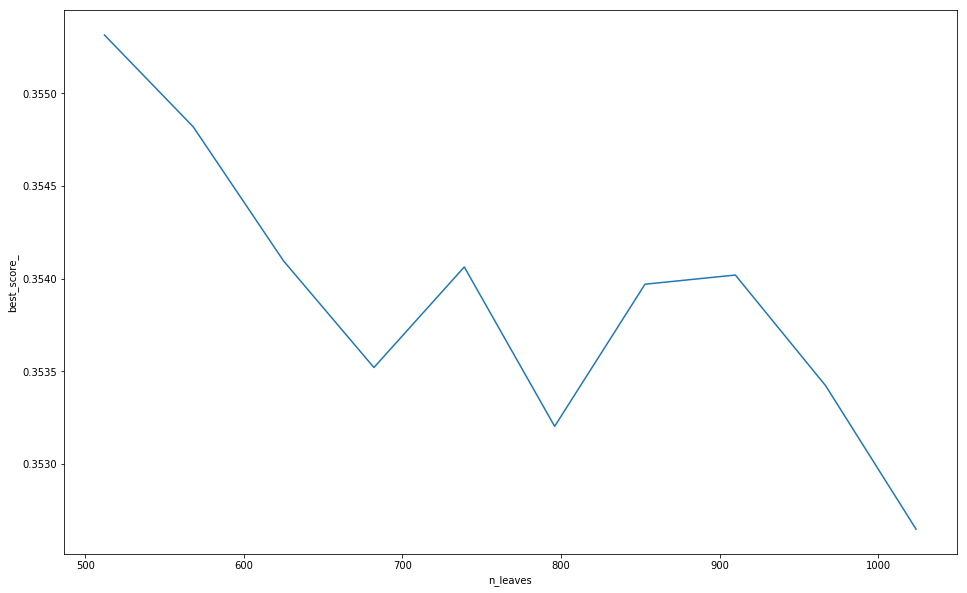

In [141]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

In [142]:
#----------------------------
#2. try larger value of num_leaves
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 1024, stop = 2048, num = 10).astype('int'):
    print ('n_leaves',n_leaves)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

n_leaves 1024
[1]	valid_0's mape: 0.676929
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.64139
[3]	valid_0's mape: 0.610803
[4]	valid_0's mape: 0.584843
[5]	valid_0's mape: 0.561112
[6]	valid_0's mape: 0.540992
[7]	valid_0's mape: 0.522307
[8]	valid_0's mape: 0.506793
[9]	valid_0's mape: 0.49295
[10]	valid_0's mape: 0.481087
[11]	valid_0's mape: 0.469822
[12]	valid_0's mape: 0.46053
[13]	valid_0's mape: 0.451718
[14]	valid_0's mape: 0.444071
[15]	valid_0's mape: 0.436879
[16]	valid_0's mape: 0.430408
[17]	valid_0's mape: 0.424963
[18]	valid_0's mape: 0.419413
[19]	valid_0's mape: 0.415529
[20]	valid_0's mape: 0.411895
[21]	valid_0's mape: 0.408102
[22]	valid_0's mape: 0.404827
[23]	valid_0's mape: 0.401966
[24]	valid_0's mape: 0.399009
[25]	valid_0's mape: 0.39637
[26]	valid_0's mape: 0.394143
[27]	valid_0's mape: 0.3917
[28]	valid_0's mape: 0.389993
[29]	valid_0's mape: 0.388256
[30]	valid_0's mape: 0.38659
[31]	valid_0's mape: 0.385168
[32]	valid

[85]	valid_0's mape: 0.355133
[86]	valid_0's mape: 0.35497
[87]	valid_0's mape: 0.354985
[88]	valid_0's mape: 0.354965
[89]	valid_0's mape: 0.354866
[90]	valid_0's mape: 0.354794
[91]	valid_0's mape: 0.354706
[92]	valid_0's mape: 0.354762
[93]	valid_0's mape: 0.354801
[94]	valid_0's mape: 0.354759
[95]	valid_0's mape: 0.35476
[96]	valid_0's mape: 0.354731
[97]	valid_0's mape: 0.354606
[98]	valid_0's mape: 0.35447
[99]	valid_0's mape: 0.354374
[100]	valid_0's mape: 0.354331
[101]	valid_0's mape: 0.354703
[102]	valid_0's mape: 0.354708
[103]	valid_0's mape: 0.354628
[104]	valid_0's mape: 0.354557
[105]	valid_0's mape: 0.354605
[106]	valid_0's mape: 0.354516
[107]	valid_0's mape: 0.354497
[108]	valid_0's mape: 0.354659
[109]	valid_0's mape: 0.354564
[110]	valid_0's mape: 0.354548
[111]	valid_0's mape: 0.354543
[112]	valid_0's mape: 0.354375
[113]	valid_0's mape: 0.354329
[114]	valid_0's mape: 0.354515
[115]	valid_0's mape: 0.354419
[116]	valid_0's mape: 0.354268
[117]	valid_0's mape: 0.35

[1]	valid_0's mape: 0.674034
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.638343
[3]	valid_0's mape: 0.606576
[4]	valid_0's mape: 0.579
[5]	valid_0's mape: 0.55588
[6]	valid_0's mape: 0.534684
[7]	valid_0's mape: 0.515742
[8]	valid_0's mape: 0.499597
[9]	valid_0's mape: 0.486164
[10]	valid_0's mape: 0.473441
[11]	valid_0's mape: 0.463121
[12]	valid_0's mape: 0.453089
[13]	valid_0's mape: 0.444409
[14]	valid_0's mape: 0.437142
[15]	valid_0's mape: 0.430133
[16]	valid_0's mape: 0.423969
[17]	valid_0's mape: 0.418831
[18]	valid_0's mape: 0.41405
[19]	valid_0's mape: 0.409569
[20]	valid_0's mape: 0.405631
[21]	valid_0's mape: 0.402269
[22]	valid_0's mape: 0.398795
[23]	valid_0's mape: 0.395344
[24]	valid_0's mape: 0.392472
[25]	valid_0's mape: 0.390267
[26]	valid_0's mape: 0.387589
[27]	valid_0's mape: 0.385762
[28]	valid_0's mape: 0.383979
[29]	valid_0's mape: 0.38208
[30]	valid_0's mape: 0.380236
[31]	valid_0's mape: 0.378868
[32]	valid_0's mape: 0.

[83]	valid_0's mape: 0.356836
[84]	valid_0's mape: 0.35669
[85]	valid_0's mape: 0.356514
[86]	valid_0's mape: 0.356329
[87]	valid_0's mape: 0.356156
[88]	valid_0's mape: 0.356118
[89]	valid_0's mape: 0.355891
[90]	valid_0's mape: 0.355799
[91]	valid_0's mape: 0.355684
[92]	valid_0's mape: 0.3556
[93]	valid_0's mape: 0.355497
[94]	valid_0's mape: 0.355442
[95]	valid_0's mape: 0.355287
[96]	valid_0's mape: 0.355222
[97]	valid_0's mape: 0.355138
[98]	valid_0's mape: 0.355081
[99]	valid_0's mape: 0.354981
[100]	valid_0's mape: 0.354907
[101]	valid_0's mape: 0.354839
[102]	valid_0's mape: 0.354732
[103]	valid_0's mape: 0.354648
[104]	valid_0's mape: 0.354546
[105]	valid_0's mape: 0.354451
[106]	valid_0's mape: 0.354387
[107]	valid_0's mape: 0.354297
[108]	valid_0's mape: 0.354229
[109]	valid_0's mape: 0.35414
[110]	valid_0's mape: 0.354048
[111]	valid_0's mape: 0.35399
[112]	valid_0's mape: 0.353992
[113]	valid_0's mape: 0.353933
[114]	valid_0's mape: 0.353778
[115]	valid_0's mape: 0.35372


[112]	valid_0's mape: 0.358374
[113]	valid_0's mape: 0.358183
[114]	valid_0's mape: 0.358076
[115]	valid_0's mape: 0.358017
[116]	valid_0's mape: 0.357939
[117]	valid_0's mape: 0.35799
[118]	valid_0's mape: 0.358311
[119]	valid_0's mape: 0.358308
[120]	valid_0's mape: 0.358962
[121]	valid_0's mape: 0.359406
[122]	valid_0's mape: 0.359715
[123]	valid_0's mape: 0.359641
[124]	valid_0's mape: 0.359582
[125]	valid_0's mape: 0.359535
[126]	valid_0's mape: 0.360166
[127]	valid_0's mape: 0.360507
[128]	valid_0's mape: 0.360851
[129]	valid_0's mape: 0.360967
[130]	valid_0's mape: 0.360899
[131]	valid_0's mape: 0.361341
[132]	valid_0's mape: 0.361689
[133]	valid_0's mape: 0.361634
[134]	valid_0's mape: 0.362329
[135]	valid_0's mape: 0.362393
[136]	valid_0's mape: 0.362364
[137]	valid_0's mape: 0.362351
[138]	valid_0's mape: 0.362097
[139]	valid_0's mape: 0.362291
[140]	valid_0's mape: 0.363221
[141]	valid_0's mape: 0.363135
[142]	valid_0's mape: 0.363203
[143]	valid_0's mape: 0.362988
[144]	val

[33]	valid_0's mape: 0.371956
[34]	valid_0's mape: 0.37094
[35]	valid_0's mape: 0.370221
[36]	valid_0's mape: 0.369106
[37]	valid_0's mape: 0.36813
[38]	valid_0's mape: 0.367083
[39]	valid_0's mape: 0.366168
[40]	valid_0's mape: 0.365403
[41]	valid_0's mape: 0.36464
[42]	valid_0's mape: 0.364017
[43]	valid_0's mape: 0.363486
[44]	valid_0's mape: 0.362805
[45]	valid_0's mape: 0.362214
[46]	valid_0's mape: 0.361786
[47]	valid_0's mape: 0.361408
[48]	valid_0's mape: 0.360824
[49]	valid_0's mape: 0.360198
[50]	valid_0's mape: 0.359698
[51]	valid_0's mape: 0.359199
[52]	valid_0's mape: 0.358797
[53]	valid_0's mape: 0.358454
[54]	valid_0's mape: 0.358125
[55]	valid_0's mape: 0.357771
[56]	valid_0's mape: 0.357529
[57]	valid_0's mape: 0.357176
[58]	valid_0's mape: 0.356686
[59]	valid_0's mape: 0.356331
[60]	valid_0's mape: 0.355866
[61]	valid_0's mape: 0.355601
[62]	valid_0's mape: 0.355371
[63]	valid_0's mape: 0.355156
[64]	valid_0's mape: 0.354874
[65]	valid_0's mape: 0.354538
[66]	valid_0'

[2]	valid_0's mape: 0.638161
[3]	valid_0's mape: 0.605714
[4]	valid_0's mape: 0.576895
[5]	valid_0's mape: 0.553177
[6]	valid_0's mape: 0.531169
[7]	valid_0's mape: 0.512731
[8]	valid_0's mape: 0.497064
[9]	valid_0's mape: 0.482539
[10]	valid_0's mape: 0.470009
[11]	valid_0's mape: 0.459815
[12]	valid_0's mape: 0.449753
[13]	valid_0's mape: 0.441463
[14]	valid_0's mape: 0.433872
[15]	valid_0's mape: 0.42715
[16]	valid_0's mape: 0.420823
[17]	valid_0's mape: 0.41525
[18]	valid_0's mape: 0.410358
[19]	valid_0's mape: 0.406066
[20]	valid_0's mape: 0.402364
[21]	valid_0's mape: 0.398381
[22]	valid_0's mape: 0.394688
[23]	valid_0's mape: 0.39244
[24]	valid_0's mape: 0.390249
[25]	valid_0's mape: 0.387926
[26]	valid_0's mape: 0.38566
[27]	valid_0's mape: 0.383776
[28]	valid_0's mape: 0.382091
[29]	valid_0's mape: 0.380296
[30]	valid_0's mape: 0.378794
[31]	valid_0's mape: 0.377441
[32]	valid_0's mape: 0.37637
[33]	valid_0's mape: 0.375396
[34]	valid_0's mape: 0.374467
[35]	valid_0's mape: 0.

[124]	valid_0's mape: 0.355227
[125]	valid_0's mape: 0.355797
[126]	valid_0's mape: 0.355704
[127]	valid_0's mape: 0.355518
[128]	valid_0's mape: 0.355299
[129]	valid_0's mape: 0.355238
[130]	valid_0's mape: 0.35513
[131]	valid_0's mape: 0.355022
[132]	valid_0's mape: 0.354865
[133]	valid_0's mape: 0.354651
[134]	valid_0's mape: 0.354768
[135]	valid_0's mape: 0.354732
[136]	valid_0's mape: 0.354716
[137]	valid_0's mape: 0.354655
[138]	valid_0's mape: 0.354583
[139]	valid_0's mape: 0.354501
[140]	valid_0's mape: 0.354744
[141]	valid_0's mape: 0.356078
[142]	valid_0's mape: 0.35594
[143]	valid_0's mape: 0.355999
[144]	valid_0's mape: 0.356023
[145]	valid_0's mape: 0.355943
[146]	valid_0's mape: 0.355884
[147]	valid_0's mape: 0.35612
[148]	valid_0's mape: 0.35603
[149]	valid_0's mape: 0.355936
[150]	valid_0's mape: 0.356033
[151]	valid_0's mape: 0.355959
[152]	valid_0's mape: 0.35602
[153]	valid_0's mape: 0.356076
[154]	valid_0's mape: 0.356208
[155]	valid_0's mape: 0.35616
[156]	valid_0'

[58]	valid_0's mape: 0.354039
[59]	valid_0's mape: 0.353711
[60]	valid_0's mape: 0.353351
[61]	valid_0's mape: 0.353134
[62]	valid_0's mape: 0.352897
[63]	valid_0's mape: 0.352662
[64]	valid_0's mape: 0.352498
[65]	valid_0's mape: 0.352123
[66]	valid_0's mape: 0.351924
[67]	valid_0's mape: 0.351722
[68]	valid_0's mape: 0.351561
[69]	valid_0's mape: 0.351288
[70]	valid_0's mape: 0.351215
[71]	valid_0's mape: 0.351128
[72]	valid_0's mape: 0.350857
[73]	valid_0's mape: 0.350667
[74]	valid_0's mape: 0.350849
[75]	valid_0's mape: 0.350758
[76]	valid_0's mape: 0.350734
[77]	valid_0's mape: 0.350587
[78]	valid_0's mape: 0.350415
[79]	valid_0's mape: 0.35042
[80]	valid_0's mape: 0.350324
[81]	valid_0's mape: 0.350338
[82]	valid_0's mape: 0.350152
[83]	valid_0's mape: 0.349924
[84]	valid_0's mape: 0.349866
[85]	valid_0's mape: 0.349744
[86]	valid_0's mape: 0.349801
[87]	valid_0's mape: 0.349633
[88]	valid_0's mape: 0.349582
[89]	valid_0's mape: 0.349587
[90]	valid_0's mape: 0.349505
[91]	valid_

[6]	valid_0's mape: 0.528063
[7]	valid_0's mape: 0.508825
[8]	valid_0's mape: 0.491885
[9]	valid_0's mape: 0.477877
[10]	valid_0's mape: 0.465801
[11]	valid_0's mape: 0.455385
[12]	valid_0's mape: 0.44608
[13]	valid_0's mape: 0.437293
[14]	valid_0's mape: 0.42992
[15]	valid_0's mape: 0.422993
[16]	valid_0's mape: 0.417172
[17]	valid_0's mape: 0.411751
[18]	valid_0's mape: 0.407076
[19]	valid_0's mape: 0.403151
[20]	valid_0's mape: 0.399497
[21]	valid_0's mape: 0.39591
[22]	valid_0's mape: 0.392709
[23]	valid_0's mape: 0.389844
[24]	valid_0's mape: 0.387351
[25]	valid_0's mape: 0.385435
[26]	valid_0's mape: 0.383051
[27]	valid_0's mape: 0.381028
[28]	valid_0's mape: 0.379319
[29]	valid_0's mape: 0.377903
[30]	valid_0's mape: 0.376187
[31]	valid_0's mape: 0.374686
[32]	valid_0's mape: 0.373701
[33]	valid_0's mape: 0.372423
[34]	valid_0's mape: 0.371356
[35]	valid_0's mape: 0.370559
[36]	valid_0's mape: 0.369505
[37]	valid_0's mape: 0.369265
[38]	valid_0's mape: 0.368378
[39]	valid_0's ma

[113]	valid_0's mape: 0.359386
[114]	valid_0's mape: 0.359494
[115]	valid_0's mape: 0.36043
[116]	valid_0's mape: 0.361164
[117]	valid_0's mape: 0.361411
[118]	valid_0's mape: 0.360937
[119]	valid_0's mape: 0.361332
[120]	valid_0's mape: 0.361185
[121]	valid_0's mape: 0.361028
[122]	valid_0's mape: 0.361571
[123]	valid_0's mape: 0.362353
[124]	valid_0's mape: 0.362901
[125]	valid_0's mape: 0.362747
[126]	valid_0's mape: 0.362641
[127]	valid_0's mape: 0.362312
[128]	valid_0's mape: 0.362222
[129]	valid_0's mape: 0.362105
[130]	valid_0's mape: 0.361533
[131]	valid_0's mape: 0.361658
[132]	valid_0's mape: 0.362324
[133]	valid_0's mape: 0.36244
[134]	valid_0's mape: 0.362997
[135]	valid_0's mape: 0.36296
[136]	valid_0's mape: 0.362835
[137]	valid_0's mape: 0.3627
[138]	valid_0's mape: 0.362529
[139]	valid_0's mape: 0.362457
Early stopping, best iteration is:
[89]	valid_0's mape: 0.354202
[1]	valid_0's mape: 0.671701
Training until validation scores don't improve for 50 rounds.
[2]	valid_0'

[114]	valid_0's mape: 0.348154
[115]	valid_0's mape: 0.348347
[116]	valid_0's mape: 0.348458
[117]	valid_0's mape: 0.348644
[118]	valid_0's mape: 0.348807
[119]	valid_0's mape: 0.3489
[120]	valid_0's mape: 0.349023
[121]	valid_0's mape: 0.349103
[122]	valid_0's mape: 0.349016
[123]	valid_0's mape: 0.34917
[124]	valid_0's mape: 0.349204
[125]	valid_0's mape: 0.349112
[126]	valid_0's mape: 0.348997
[127]	valid_0's mape: 0.349052
[128]	valid_0's mape: 0.349173
[129]	valid_0's mape: 0.349304
[130]	valid_0's mape: 0.349346
[131]	valid_0's mape: 0.349452
[132]	valid_0's mape: 0.349492
[133]	valid_0's mape: 0.349532
[134]	valid_0's mape: 0.349725
[135]	valid_0's mape: 0.349632
[136]	valid_0's mape: 0.349589
[137]	valid_0's mape: 0.349583
[138]	valid_0's mape: 0.349398
[139]	valid_0's mape: 0.349611
[140]	valid_0's mape: 0.350021
[141]	valid_0's mape: 0.349969
[142]	valid_0's mape: 0.35017
[143]	valid_0's mape: 0.350321
[144]	valid_0's mape: 0.351003
[145]	valid_0's mape: 0.351068
[146]	valid_

[79]	valid_0's mape: 0.354519
[80]	valid_0's mape: 0.354407
[81]	valid_0's mape: 0.354241
[82]	valid_0's mape: 0.354152
[83]	valid_0's mape: 0.354299
[84]	valid_0's mape: 0.354272
[85]	valid_0's mape: 0.354107
[86]	valid_0's mape: 0.353997
[87]	valid_0's mape: 0.353917
[88]	valid_0's mape: 0.353917
[89]	valid_0's mape: 0.353821
[90]	valid_0's mape: 0.353827
[91]	valid_0's mape: 0.353807
[92]	valid_0's mape: 0.353772
[93]	valid_0's mape: 0.353781
[94]	valid_0's mape: 0.354018
[95]	valid_0's mape: 0.354116
[96]	valid_0's mape: 0.354105
[97]	valid_0's mape: 0.354336
[98]	valid_0's mape: 0.354214
[99]	valid_0's mape: 0.354191
[100]	valid_0's mape: 0.354615
[101]	valid_0's mape: 0.354326
[102]	valid_0's mape: 0.354474
[103]	valid_0's mape: 0.354531
[104]	valid_0's mape: 0.354954
[105]	valid_0's mape: 0.355116
[106]	valid_0's mape: 0.354919
[107]	valid_0's mape: 0.354786
[108]	valid_0's mape: 0.355123
[109]	valid_0's mape: 0.35503
[110]	valid_0's mape: 0.354797
[111]	valid_0's mape: 0.354628

[51]	valid_0's mape: 0.357133
[52]	valid_0's mape: 0.356714
[53]	valid_0's mape: 0.356249
[54]	valid_0's mape: 0.356129
[55]	valid_0's mape: 0.35581
[56]	valid_0's mape: 0.355403
[57]	valid_0's mape: 0.35512
[58]	valid_0's mape: 0.354864
[59]	valid_0's mape: 0.354488
[60]	valid_0's mape: 0.354225
[61]	valid_0's mape: 0.354342
[62]	valid_0's mape: 0.354108
[63]	valid_0's mape: 0.353877
[64]	valid_0's mape: 0.353675
[65]	valid_0's mape: 0.353483
[66]	valid_0's mape: 0.353159
[67]	valid_0's mape: 0.352902
[68]	valid_0's mape: 0.352812
[69]	valid_0's mape: 0.352655
[70]	valid_0's mape: 0.35298
[71]	valid_0's mape: 0.352912
[72]	valid_0's mape: 0.352845
[73]	valid_0's mape: 0.352701
[74]	valid_0's mape: 0.35328
[75]	valid_0's mape: 0.353441
[76]	valid_0's mape: 0.353551
[77]	valid_0's mape: 0.353409
[78]	valid_0's mape: 0.353402
[79]	valid_0's mape: 0.353561
[80]	valid_0's mape: 0.353414
[81]	valid_0's mape: 0.353319
[82]	valid_0's mape: 0.354239
[83]	valid_0's mape: 0.354746
[84]	valid_0's

[57]	valid_0's mape: 0.354648
[58]	valid_0's mape: 0.354288
[59]	valid_0's mape: 0.354089
[60]	valid_0's mape: 0.354057
[61]	valid_0's mape: 0.35452
[62]	valid_0's mape: 0.354744
[63]	valid_0's mape: 0.354614
[64]	valid_0's mape: 0.354535
[65]	valid_0's mape: 0.354226
[66]	valid_0's mape: 0.353953
[67]	valid_0's mape: 0.354571
[68]	valid_0's mape: 0.355166
[69]	valid_0's mape: 0.355973
[70]	valid_0's mape: 0.356723
[71]	valid_0's mape: 0.357489
[72]	valid_0's mape: 0.357205
[73]	valid_0's mape: 0.358188
[74]	valid_0's mape: 0.358969
[75]	valid_0's mape: 0.359809
[76]	valid_0's mape: 0.359737
[77]	valid_0's mape: 0.360596
[78]	valid_0's mape: 0.361568
[79]	valid_0's mape: 0.362635
[80]	valid_0's mape: 0.363336
[81]	valid_0's mape: 0.363833
[82]	valid_0's mape: 0.364536
[83]	valid_0's mape: 0.365539
[84]	valid_0's mape: 0.365516
[85]	valid_0's mape: 0.366578
[86]	valid_0's mape: 0.367418
[87]	valid_0's mape: 0.368457
[88]	valid_0's mape: 0.369337
[89]	valid_0's mape: 0.370211
[90]	valid_

[74]	valid_0's mape: 0.358505
[75]	valid_0's mape: 0.358271
[76]	valid_0's mape: 0.358035
[77]	valid_0's mape: 0.358311
[78]	valid_0's mape: 0.358847
[79]	valid_0's mape: 0.358541
[80]	valid_0's mape: 0.358444
[81]	valid_0's mape: 0.358122
[82]	valid_0's mape: 0.357942
[83]	valid_0's mape: 0.357925
[84]	valid_0's mape: 0.358
[85]	valid_0's mape: 0.35837
[86]	valid_0's mape: 0.358946
[87]	valid_0's mape: 0.359288
[88]	valid_0's mape: 0.359413
[89]	valid_0's mape: 0.359246
[90]	valid_0's mape: 0.360019
[91]	valid_0's mape: 0.359948
[92]	valid_0's mape: 0.359716
[93]	valid_0's mape: 0.359906
[94]	valid_0's mape: 0.359879
[95]	valid_0's mape: 0.36009
[96]	valid_0's mape: 0.359901
[97]	valid_0's mape: 0.359851
[98]	valid_0's mape: 0.36017
[99]	valid_0's mape: 0.360554
[100]	valid_0's mape: 0.360675
[101]	valid_0's mape: 0.361025
[102]	valid_0's mape: 0.361252
[103]	valid_0's mape: 0.361342
[104]	valid_0's mape: 0.361355
[105]	valid_0's mape: 0.361726
[106]	valid_0's mape: 0.362024
[107]	val

[106]	valid_0's mape: 0.353168
[107]	valid_0's mape: 0.353277
[108]	valid_0's mape: 0.353712
[109]	valid_0's mape: 0.353803
[110]	valid_0's mape: 0.353627
[111]	valid_0's mape: 0.353933
[112]	valid_0's mape: 0.354087
[113]	valid_0's mape: 0.354258
[114]	valid_0's mape: 0.354215
[115]	valid_0's mape: 0.354464
[116]	valid_0's mape: 0.354574
[117]	valid_0's mape: 0.354394
[118]	valid_0's mape: 0.354344
[119]	valid_0's mape: 0.354431
[120]	valid_0's mape: 0.354502
[121]	valid_0's mape: 0.354299
[122]	valid_0's mape: 0.354399
[123]	valid_0's mape: 0.354565
[124]	valid_0's mape: 0.355182
[125]	valid_0's mape: 0.355724
[126]	valid_0's mape: 0.356248
[127]	valid_0's mape: 0.35669
[128]	valid_0's mape: 0.356881
[129]	valid_0's mape: 0.356859
[130]	valid_0's mape: 0.357225
[131]	valid_0's mape: 0.35777
Early stopping, best iteration is:
[81]	valid_0's mape: 0.348637
[1]	valid_0's mape: 0.670139
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.629939
[3]	valid_0

[130]	valid_0's mape: 0.365415
Early stopping, best iteration is:
[80]	valid_0's mape: 0.35477
n_leaves 1706
[1]	valid_0's mape: 0.672094
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.632574
[3]	valid_0's mape: 0.597747
[4]	valid_0's mape: 0.568111
[5]	valid_0's mape: 0.542088
[6]	valid_0's mape: 0.518705
[7]	valid_0's mape: 0.499177
[8]	valid_0's mape: 0.482062
[9]	valid_0's mape: 0.467354
[10]	valid_0's mape: 0.454372
[11]	valid_0's mape: 0.443451
[12]	valid_0's mape: 0.434203
[13]	valid_0's mape: 0.426317
[14]	valid_0's mape: 0.419125
[15]	valid_0's mape: 0.413118
[16]	valid_0's mape: 0.407682
[17]	valid_0's mape: 0.403151
[18]	valid_0's mape: 0.398615
[19]	valid_0's mape: 0.394486
[20]	valid_0's mape: 0.390966
[21]	valid_0's mape: 0.387958
[22]	valid_0's mape: 0.385617
[23]	valid_0's mape: 0.38319
[24]	valid_0's mape: 0.380816
[25]	valid_0's mape: 0.378792
[26]	valid_0's mape: 0.377016
[27]	valid_0's mape: 0.375204
[28]	valid_0's mape: 0.373948

[29]	valid_0's mape: 0.365881
[30]	valid_0's mape: 0.364765
[31]	valid_0's mape: 0.36362
[32]	valid_0's mape: 0.363011
[33]	valid_0's mape: 0.36194
[34]	valid_0's mape: 0.361028
[35]	valid_0's mape: 0.360022
[36]	valid_0's mape: 0.359202
[37]	valid_0's mape: 0.358495
[38]	valid_0's mape: 0.357783
[39]	valid_0's mape: 0.3571
[40]	valid_0's mape: 0.356557
[41]	valid_0's mape: 0.35599
[42]	valid_0's mape: 0.355319
[43]	valid_0's mape: 0.354907
[44]	valid_0's mape: 0.354477
[45]	valid_0's mape: 0.353972
[46]	valid_0's mape: 0.353851
[47]	valid_0's mape: 0.35346
[48]	valid_0's mape: 0.353154
[49]	valid_0's mape: 0.352582
[50]	valid_0's mape: 0.352382
[51]	valid_0's mape: 0.351958
[52]	valid_0's mape: 0.351718
[53]	valid_0's mape: 0.351448
[54]	valid_0's mape: 0.351157
[55]	valid_0's mape: 0.350785
[56]	valid_0's mape: 0.350837
[57]	valid_0's mape: 0.350505
[58]	valid_0's mape: 0.350394
[59]	valid_0's mape: 0.350238
[60]	valid_0's mape: 0.350366
[61]	valid_0's mape: 0.350258
[62]	valid_0's m

[34]	valid_0's mape: 0.366074
[35]	valid_0's mape: 0.365285
[36]	valid_0's mape: 0.36432
[37]	valid_0's mape: 0.363412
[38]	valid_0's mape: 0.362665
[39]	valid_0's mape: 0.36199
[40]	valid_0's mape: 0.361466
[41]	valid_0's mape: 0.360992
[42]	valid_0's mape: 0.360252
[43]	valid_0's mape: 0.359638
[44]	valid_0's mape: 0.359087
[45]	valid_0's mape: 0.358945
[46]	valid_0's mape: 0.358862
[47]	valid_0's mape: 0.358216
[48]	valid_0's mape: 0.357623
[49]	valid_0's mape: 0.357824
[50]	valid_0's mape: 0.357513
[51]	valid_0's mape: 0.357306
[52]	valid_0's mape: 0.356781
[53]	valid_0's mape: 0.356468
[54]	valid_0's mape: 0.356008
[55]	valid_0's mape: 0.355644
[56]	valid_0's mape: 0.355292
[57]	valid_0's mape: 0.354991
[58]	valid_0's mape: 0.354707
[59]	valid_0's mape: 0.354562
[60]	valid_0's mape: 0.354687
[61]	valid_0's mape: 0.354371
[62]	valid_0's mape: 0.354039
[63]	valid_0's mape: 0.354139
[64]	valid_0's mape: 0.354474
[65]	valid_0's mape: 0.354619
[66]	valid_0's mape: 0.354553
[67]	valid_0

[55]	valid_0's mape: 0.354419
[56]	valid_0's mape: 0.354199
[57]	valid_0's mape: 0.35423
[58]	valid_0's mape: 0.35411
[59]	valid_0's mape: 0.353927
[60]	valid_0's mape: 0.353656
[61]	valid_0's mape: 0.353425
[62]	valid_0's mape: 0.353422
[63]	valid_0's mape: 0.35318
[64]	valid_0's mape: 0.353074
[65]	valid_0's mape: 0.352923
[66]	valid_0's mape: 0.352645
[67]	valid_0's mape: 0.352457
[68]	valid_0's mape: 0.352372
[69]	valid_0's mape: 0.352286
[70]	valid_0's mape: 0.352339
[71]	valid_0's mape: 0.352196
[72]	valid_0's mape: 0.352073
[73]	valid_0's mape: 0.352093
[74]	valid_0's mape: 0.351994
[75]	valid_0's mape: 0.352065
[76]	valid_0's mape: 0.352038
[77]	valid_0's mape: 0.352195
[78]	valid_0's mape: 0.352283
[79]	valid_0's mape: 0.352212
[80]	valid_0's mape: 0.352149
[81]	valid_0's mape: 0.352134
[82]	valid_0's mape: 0.352344
[83]	valid_0's mape: 0.352707
[84]	valid_0's mape: 0.352886
[85]	valid_0's mape: 0.35281
[86]	valid_0's mape: 0.352722
[87]	valid_0's mape: 0.35275
[88]	valid_0's 

[51]	valid_0's mape: 0.357626
[52]	valid_0's mape: 0.358305
[53]	valid_0's mape: 0.357849
[54]	valid_0's mape: 0.358457
[55]	valid_0's mape: 0.359122
[56]	valid_0's mape: 0.358611
[57]	valid_0's mape: 0.358317
[58]	valid_0's mape: 0.359144
[59]	valid_0's mape: 0.35991
[60]	valid_0's mape: 0.359687
[61]	valid_0's mape: 0.360791
[62]	valid_0's mape: 0.360048
[63]	valid_0's mape: 0.360709
[64]	valid_0's mape: 0.361692
[65]	valid_0's mape: 0.362438
[66]	valid_0's mape: 0.362421
[67]	valid_0's mape: 0.362314
[68]	valid_0's mape: 0.364148
[69]	valid_0's mape: 0.365649
[70]	valid_0's mape: 0.36702
[71]	valid_0's mape: 0.368438
[72]	valid_0's mape: 0.368626
[73]	valid_0's mape: 0.369988
[74]	valid_0's mape: 0.37086
[75]	valid_0's mape: 0.371864
[76]	valid_0's mape: 0.373244
[77]	valid_0's mape: 0.372321
[78]	valid_0's mape: 0.372652
[79]	valid_0's mape: 0.372992
[80]	valid_0's mape: 0.375113
[81]	valid_0's mape: 0.37499
[82]	valid_0's mape: 0.37635
[83]	valid_0's mape: 0.376763
[84]	valid_0's 

[91]	valid_0's mape: 0.356466
[92]	valid_0's mape: 0.356659
[93]	valid_0's mape: 0.3567
[94]	valid_0's mape: 0.357243
[95]	valid_0's mape: 0.357429
[96]	valid_0's mape: 0.357693
[97]	valid_0's mape: 0.357857
[98]	valid_0's mape: 0.357764
[99]	valid_0's mape: 0.358127
[100]	valid_0's mape: 0.357935
[101]	valid_0's mape: 0.358412
[102]	valid_0's mape: 0.358527
[103]	valid_0's mape: 0.358506
[104]	valid_0's mape: 0.358447
[105]	valid_0's mape: 0.358487
[106]	valid_0's mape: 0.359315
[107]	valid_0's mape: 0.359083
[108]	valid_0's mape: 0.35904
[109]	valid_0's mape: 0.358888
[110]	valid_0's mape: 0.359015
[111]	valid_0's mape: 0.359425
[112]	valid_0's mape: 0.359341
[113]	valid_0's mape: 0.359965
[114]	valid_0's mape: 0.360045
[115]	valid_0's mape: 0.359948
[116]	valid_0's mape: 0.360208
[117]	valid_0's mape: 0.360255
[118]	valid_0's mape: 0.360933
Early stopping, best iteration is:
[68]	valid_0's mape: 0.353526
[1]	valid_0's mape: 0.669351
Training until validation scores don't improve for

[113]	valid_0's mape: 0.354426
[114]	valid_0's mape: 0.354542
[115]	valid_0's mape: 0.354527
[116]	valid_0's mape: 0.355447
[117]	valid_0's mape: 0.35556
[118]	valid_0's mape: 0.355921
[119]	valid_0's mape: 0.35769
[120]	valid_0's mape: 0.357791
[121]	valid_0's mape: 0.357955
[122]	valid_0's mape: 0.357922
[123]	valid_0's mape: 0.357977
[124]	valid_0's mape: 0.358715
[125]	valid_0's mape: 0.358917
[126]	valid_0's mape: 0.358929
[127]	valid_0's mape: 0.358649
[128]	valid_0's mape: 0.358692
[129]	valid_0's mape: 0.358856
[130]	valid_0's mape: 0.358651
Early stopping, best iteration is:
[80]	valid_0's mape: 0.347388
[1]	valid_0's mape: 0.668587
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.626848
[3]	valid_0's mape: 0.591786
[4]	valid_0's mape: 0.560619
[5]	valid_0's mape: 0.533223
[6]	valid_0's mape: 0.509473
[7]	valid_0's mape: 0.489395
[8]	valid_0's mape: 0.472173
[9]	valid_0's mape: 0.457506
[10]	valid_0's mape: 0.444927
[11]	valid_0's mape: 0.433

[36]	valid_0's mape: 0.362624
[37]	valid_0's mape: 0.361811
[38]	valid_0's mape: 0.36111
[39]	valid_0's mape: 0.360633
[40]	valid_0's mape: 0.360073
[41]	valid_0's mape: 0.359394
[42]	valid_0's mape: 0.358879
[43]	valid_0's mape: 0.358324
[44]	valid_0's mape: 0.358081
[45]	valid_0's mape: 0.357669
[46]	valid_0's mape: 0.357469
[47]	valid_0's mape: 0.357125
[48]	valid_0's mape: 0.356875
[49]	valid_0's mape: 0.356552
[50]	valid_0's mape: 0.356279
[51]	valid_0's mape: 0.355993
[52]	valid_0's mape: 0.35583
[53]	valid_0's mape: 0.355758
[54]	valid_0's mape: 0.355592
[55]	valid_0's mape: 0.355582
[56]	valid_0's mape: 0.355174
[57]	valid_0's mape: 0.354941
[58]	valid_0's mape: 0.354861
[59]	valid_0's mape: 0.354645
[60]	valid_0's mape: 0.3545
[61]	valid_0's mape: 0.354828
[62]	valid_0's mape: 0.354886
[63]	valid_0's mape: 0.354813
[64]	valid_0's mape: 0.354716
[65]	valid_0's mape: 0.354549
[66]	valid_0's mape: 0.354578
[67]	valid_0's mape: 0.355051
[68]	valid_0's mape: 0.354983
[69]	valid_0's

[77]	valid_0's mape: 0.346996
[78]	valid_0's mape: 0.347023
[79]	valid_0's mape: 0.346981
[80]	valid_0's mape: 0.346799
[81]	valid_0's mape: 0.34675
[82]	valid_0's mape: 0.346705
[83]	valid_0's mape: 0.346759
[84]	valid_0's mape: 0.346855
[85]	valid_0's mape: 0.346826
[86]	valid_0's mape: 0.346864
[87]	valid_0's mape: 0.346929
[88]	valid_0's mape: 0.347033
[89]	valid_0's mape: 0.346995
[90]	valid_0's mape: 0.347011
[91]	valid_0's mape: 0.34706
[92]	valid_0's mape: 0.347083
[93]	valid_0's mape: 0.347038
[94]	valid_0's mape: 0.347048
[95]	valid_0's mape: 0.347025
[96]	valid_0's mape: 0.346967
[97]	valid_0's mape: 0.347016
[98]	valid_0's mape: 0.34712
[99]	valid_0's mape: 0.347342
[100]	valid_0's mape: 0.347651
[101]	valid_0's mape: 0.347689
[102]	valid_0's mape: 0.348065
[103]	valid_0's mape: 0.348086
[104]	valid_0's mape: 0.348993
[105]	valid_0's mape: 0.348999
[106]	valid_0's mape: 0.349167
[107]	valid_0's mape: 0.349335
[108]	valid_0's mape: 0.350102
[109]	valid_0's mape: 0.350777
[11

[109]	valid_0's mape: 0.363575
[110]	valid_0's mape: 0.364859
[111]	valid_0's mape: 0.365863
Early stopping, best iteration is:
[61]	valid_0's mape: 0.354876


results [(1024, 0.3526479189524169), (1137, 0.35481084762183107), (1251, 0.3520111229885298), (1365, 0.3529203798145529), (1479, 0.3524376030694615), (1592, 0.35357196568513427), (1706, 0.3525554552316202), (1820, 0.35265053732752555), (1934, 0.3527751350325221), (2048, 0.35243965306423536)]
best paras 1251
best_score_ 0.3520111229885298


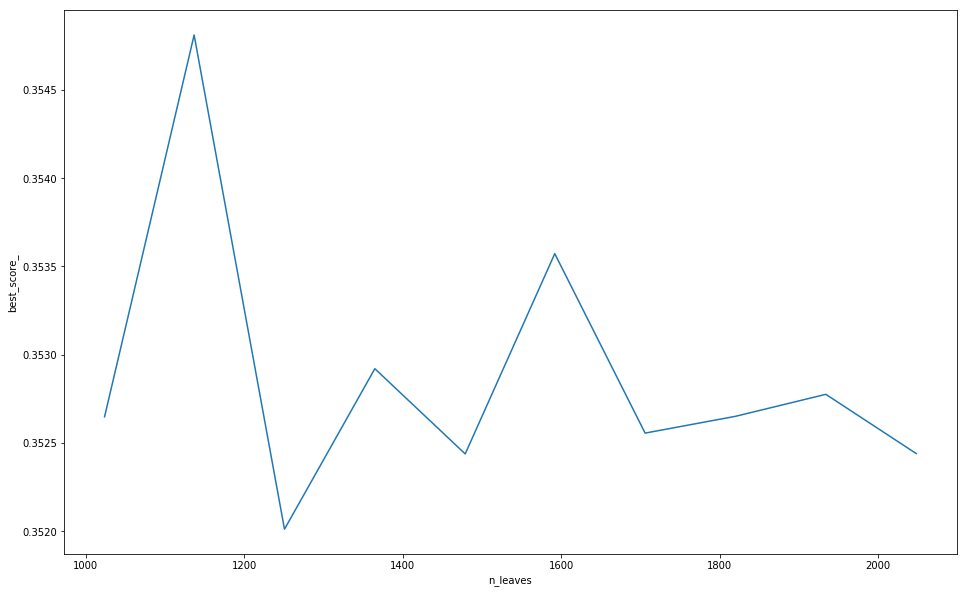

In [143]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

In [144]:
#----------------------------
#2. narrow down value of num_leaves
#----------------------------
lgb_pars = []
for n_leaves in np.linspace(start = 1251-5, stop = 1251+ 5, num = 10).astype('int'):
    print ('n_leaves',n_leaves)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = 0,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('n_leaves', n_leaves, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((n_leaves, np.mean(n_fold_result)))

n_leaves 1246
[1]	valid_0's mape: 0.674601
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.637559
[3]	valid_0's mape: 0.605639
[4]	valid_0's mape: 0.577453
[5]	valid_0's mape: 0.552531
[6]	valid_0's mape: 0.531465
[7]	valid_0's mape: 0.513391
[8]	valid_0's mape: 0.496886
[9]	valid_0's mape: 0.482828
[10]	valid_0's mape: 0.470009
[11]	valid_0's mape: 0.459261
[12]	valid_0's mape: 0.450239
[13]	valid_0's mape: 0.442159
[14]	valid_0's mape: 0.434713
[15]	valid_0's mape: 0.428218
[16]	valid_0's mape: 0.422889
[17]	valid_0's mape: 0.417409
[18]	valid_0's mape: 0.412474
[19]	valid_0's mape: 0.408483
[20]	valid_0's mape: 0.404156
[21]	valid_0's mape: 0.400873
[22]	valid_0's mape: 0.397391
[23]	valid_0's mape: 0.394456
[24]	valid_0's mape: 0.391978
[25]	valid_0's mape: 0.389392
[26]	valid_0's mape: 0.386902
[27]	valid_0's mape: 0.385058
[28]	valid_0's mape: 0.383252
[29]	valid_0's mape: 0.381691
[30]	valid_0's mape: 0.380194
[31]	valid_0's mape: 0.379014
[32

[135]	valid_0's mape: 0.356005
[136]	valid_0's mape: 0.355898
[137]	valid_0's mape: 0.355918
[138]	valid_0's mape: 0.35632
[139]	valid_0's mape: 0.356282
[140]	valid_0's mape: 0.357154
[141]	valid_0's mape: 0.357474
[142]	valid_0's mape: 0.357828
[143]	valid_0's mape: 0.358702
[144]	valid_0's mape: 0.35997
[145]	valid_0's mape: 0.360939
[146]	valid_0's mape: 0.361723
[147]	valid_0's mape: 0.362596
[148]	valid_0's mape: 0.362462
Early stopping, best iteration is:
[98]	valid_0's mape: 0.35184
[1]	valid_0's mape: 0.673147
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.634736
[3]	valid_0's mape: 0.601856
[4]	valid_0's mape: 0.573679
[5]	valid_0's mape: 0.548357
[6]	valid_0's mape: 0.526592
[7]	valid_0's mape: 0.507686
[8]	valid_0's mape: 0.490844
[9]	valid_0's mape: 0.47684
[10]	valid_0's mape: 0.464138
[11]	valid_0's mape: 0.453244
[12]	valid_0's mape: 0.443076
[13]	valid_0's mape: 0.434588
[14]	valid_0's mape: 0.426462
[15]	valid_0's mape: 0.419921
[1

[110]	valid_0's mape: 0.355178
[111]	valid_0's mape: 0.355275
[112]	valid_0's mape: 0.355429
[113]	valid_0's mape: 0.35579
[114]	valid_0's mape: 0.356762
[115]	valid_0's mape: 0.357662
[116]	valid_0's mape: 0.358611
[117]	valid_0's mape: 0.359599
[118]	valid_0's mape: 0.36049
[119]	valid_0's mape: 0.361449
[120]	valid_0's mape: 0.361242
[121]	valid_0's mape: 0.362326
[122]	valid_0's mape: 0.362025
[123]	valid_0's mape: 0.362514
[124]	valid_0's mape: 0.363043
[125]	valid_0's mape: 0.363865
[126]	valid_0's mape: 0.36465
[127]	valid_0's mape: 0.365563
[128]	valid_0's mape: 0.366523
[129]	valid_0's mape: 0.367178
[130]	valid_0's mape: 0.36707
[131]	valid_0's mape: 0.367992
[132]	valid_0's mape: 0.369021
[133]	valid_0's mape: 0.369796
[134]	valid_0's mape: 0.370781
[135]	valid_0's mape: 0.371077
[136]	valid_0's mape: 0.37214
[137]	valid_0's mape: 0.373294
[138]	valid_0's mape: 0.373255
[139]	valid_0's mape: 0.373803
[140]	valid_0's mape: 0.373541
[141]	valid_0's mape: 0.37471
[142]	valid_0'

[56]	valid_0's mape: 0.360861
[57]	valid_0's mape: 0.360577
[58]	valid_0's mape: 0.360324
[59]	valid_0's mape: 0.360149
[60]	valid_0's mape: 0.359995
[61]	valid_0's mape: 0.359673
[62]	valid_0's mape: 0.359288
[63]	valid_0's mape: 0.359061
[64]	valid_0's mape: 0.358829
[65]	valid_0's mape: 0.358586
[66]	valid_0's mape: 0.358325
[67]	valid_0's mape: 0.358102
[68]	valid_0's mape: 0.357882
[69]	valid_0's mape: 0.35758
[70]	valid_0's mape: 0.357472
[71]	valid_0's mape: 0.357352
[72]	valid_0's mape: 0.357194
[73]	valid_0's mape: 0.357064
[74]	valid_0's mape: 0.356868
[75]	valid_0's mape: 0.35678
[76]	valid_0's mape: 0.356709
[77]	valid_0's mape: 0.356554
[78]	valid_0's mape: 0.356355
[79]	valid_0's mape: 0.356208
[80]	valid_0's mape: 0.356096
[81]	valid_0's mape: 0.356092
[82]	valid_0's mape: 0.355963
[83]	valid_0's mape: 0.355816
[84]	valid_0's mape: 0.355796
[85]	valid_0's mape: 0.35581
[86]	valid_0's mape: 0.355818
[87]	valid_0's mape: 0.355752
[88]	valid_0's mape: 0.355574
[89]	valid_0'

[38]	valid_0's mape: 0.364811
[39]	valid_0's mape: 0.363926
[40]	valid_0's mape: 0.363216
[41]	valid_0's mape: 0.362466
[42]	valid_0's mape: 0.361851
[43]	valid_0's mape: 0.361216
[44]	valid_0's mape: 0.360427
[45]	valid_0's mape: 0.359868
[46]	valid_0's mape: 0.359199
[47]	valid_0's mape: 0.358496
[48]	valid_0's mape: 0.358042
[49]	valid_0's mape: 0.357538
[50]	valid_0's mape: 0.357098
[51]	valid_0's mape: 0.356535
[52]	valid_0's mape: 0.356012
[53]	valid_0's mape: 0.355631
[54]	valid_0's mape: 0.355301
[55]	valid_0's mape: 0.354934
[56]	valid_0's mape: 0.354595
[57]	valid_0's mape: 0.354209
[58]	valid_0's mape: 0.353846
[59]	valid_0's mape: 0.35366
[60]	valid_0's mape: 0.353434
[61]	valid_0's mape: 0.353352
[62]	valid_0's mape: 0.353218
[63]	valid_0's mape: 0.352909
[64]	valid_0's mape: 0.352803
[65]	valid_0's mape: 0.35256
[66]	valid_0's mape: 0.35239
[67]	valid_0's mape: 0.352193
[68]	valid_0's mape: 0.351989
[69]	valid_0's mape: 0.351833
[70]	valid_0's mape: 0.351686
[71]	valid_0'

[32]	valid_0's mape: 0.373484
[33]	valid_0's mape: 0.372581
[34]	valid_0's mape: 0.371698
[35]	valid_0's mape: 0.370805
[36]	valid_0's mape: 0.369906
[37]	valid_0's mape: 0.369228
[38]	valid_0's mape: 0.368459
[39]	valid_0's mape: 0.367746
[40]	valid_0's mape: 0.367086
[41]	valid_0's mape: 0.366467
[42]	valid_0's mape: 0.365811
[43]	valid_0's mape: 0.365238
[44]	valid_0's mape: 0.364998
[45]	valid_0's mape: 0.364597
[46]	valid_0's mape: 0.364048
[47]	valid_0's mape: 0.363413
[48]	valid_0's mape: 0.362756
[49]	valid_0's mape: 0.362353
[50]	valid_0's mape: 0.361565
[51]	valid_0's mape: 0.361255
[52]	valid_0's mape: 0.361064
[53]	valid_0's mape: 0.360523
[54]	valid_0's mape: 0.360033
[55]	valid_0's mape: 0.360345
[56]	valid_0's mape: 0.360095
[57]	valid_0's mape: 0.359962
[58]	valid_0's mape: 0.359706
[59]	valid_0's mape: 0.359669
[60]	valid_0's mape: 0.359453
[61]	valid_0's mape: 0.359242
[62]	valid_0's mape: 0.358981
[63]	valid_0's mape: 0.359137
[64]	valid_0's mape: 0.359406
[65]	valid

[117]	valid_0's mape: 0.356734
[118]	valid_0's mape: 0.356758
[119]	valid_0's mape: 0.356695
[120]	valid_0's mape: 0.357332
[121]	valid_0's mape: 0.357527
[122]	valid_0's mape: 0.357846
[123]	valid_0's mape: 0.358329
[124]	valid_0's mape: 0.358346
[125]	valid_0's mape: 0.35853
[126]	valid_0's mape: 0.358482
[127]	valid_0's mape: 0.358635
[128]	valid_0's mape: 0.358445
[129]	valid_0's mape: 0.359161
[130]	valid_0's mape: 0.359108
[131]	valid_0's mape: 0.359613
[132]	valid_0's mape: 0.36034
[133]	valid_0's mape: 0.361408
[134]	valid_0's mape: 0.361593
[135]	valid_0's mape: 0.361676
[136]	valid_0's mape: 0.362007
[137]	valid_0's mape: 0.362901
[138]	valid_0's mape: 0.362871
[139]	valid_0's mape: 0.36315
[140]	valid_0's mape: 0.36277
[141]	valid_0's mape: 0.362746
Early stopping, best iteration is:
[91]	valid_0's mape: 0.355204
[1]	valid_0's mape: 0.672489
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635757
[3]	valid_0's mape: 0.602655
[4]	valid_0's m

[95]	valid_0's mape: 0.348831
[96]	valid_0's mape: 0.348797
[97]	valid_0's mape: 0.349002
[98]	valid_0's mape: 0.349065
[99]	valid_0's mape: 0.349008
[100]	valid_0's mape: 0.34898
[101]	valid_0's mape: 0.348907
[102]	valid_0's mape: 0.349353
[103]	valid_0's mape: 0.349294
[104]	valid_0's mape: 0.34943
[105]	valid_0's mape: 0.350065
[106]	valid_0's mape: 0.350073
[107]	valid_0's mape: 0.349947
[108]	valid_0's mape: 0.349965
[109]	valid_0's mape: 0.34996
[110]	valid_0's mape: 0.349865
[111]	valid_0's mape: 0.350224
[112]	valid_0's mape: 0.350134
[113]	valid_0's mape: 0.350638
[114]	valid_0's mape: 0.350687
[115]	valid_0's mape: 0.350747
[116]	valid_0's mape: 0.35087
[117]	valid_0's mape: 0.351322
[118]	valid_0's mape: 0.351398
[119]	valid_0's mape: 0.351452
[120]	valid_0's mape: 0.351467
[121]	valid_0's mape: 0.351443
[122]	valid_0's mape: 0.352152
[123]	valid_0's mape: 0.352166
[124]	valid_0's mape: 0.353543
[125]	valid_0's mape: 0.353748
[126]	valid_0's mape: 0.355078
[127]	valid_0's m

[89]	valid_0's mape: 0.353542
[90]	valid_0's mape: 0.353671
[91]	valid_0's mape: 0.353618
[92]	valid_0's mape: 0.35378
[93]	valid_0's mape: 0.353725
[94]	valid_0's mape: 0.353628
[95]	valid_0's mape: 0.353571
[96]	valid_0's mape: 0.353538
[97]	valid_0's mape: 0.353531
[98]	valid_0's mape: 0.353514
[99]	valid_0's mape: 0.353388
[100]	valid_0's mape: 0.353347
[101]	valid_0's mape: 0.35334
[102]	valid_0's mape: 0.353187
[103]	valid_0's mape: 0.35329
[104]	valid_0's mape: 0.35347
[105]	valid_0's mape: 0.353377
[106]	valid_0's mape: 0.353348
[107]	valid_0's mape: 0.353173
[108]	valid_0's mape: 0.353061
[109]	valid_0's mape: 0.353038
[110]	valid_0's mape: 0.352961
[111]	valid_0's mape: 0.352863
[112]	valid_0's mape: 0.353049
[113]	valid_0's mape: 0.353063
[114]	valid_0's mape: 0.352993
[115]	valid_0's mape: 0.353112
[116]	valid_0's mape: 0.353146
[117]	valid_0's mape: 0.353219
[118]	valid_0's mape: 0.353234
[119]	valid_0's mape: 0.353034
[120]	valid_0's mape: 0.353011
[121]	valid_0's mape: 0

[39]	valid_0's mape: 0.367205
[40]	valid_0's mape: 0.366623
[41]	valid_0's mape: 0.365775
[42]	valid_0's mape: 0.364991
[43]	valid_0's mape: 0.364223
[44]	valid_0's mape: 0.363301
[45]	valid_0's mape: 0.362629
[46]	valid_0's mape: 0.362119
[47]	valid_0's mape: 0.361648
[48]	valid_0's mape: 0.360968
[49]	valid_0's mape: 0.360612
[50]	valid_0's mape: 0.360202
[51]	valid_0's mape: 0.359695
[52]	valid_0's mape: 0.359253
[53]	valid_0's mape: 0.358904
[54]	valid_0's mape: 0.35848
[55]	valid_0's mape: 0.358089
[56]	valid_0's mape: 0.357776
[57]	valid_0's mape: 0.357621
[58]	valid_0's mape: 0.357339
[59]	valid_0's mape: 0.35703
[60]	valid_0's mape: 0.356639
[61]	valid_0's mape: 0.356451
[62]	valid_0's mape: 0.356202
[63]	valid_0's mape: 0.355903
[64]	valid_0's mape: 0.355733
[65]	valid_0's mape: 0.355448
[66]	valid_0's mape: 0.355271
[67]	valid_0's mape: 0.35507
[68]	valid_0's mape: 0.354904
[69]	valid_0's mape: 0.354894
[70]	valid_0's mape: 0.354697
[71]	valid_0's mape: 0.354619
[72]	valid_0'

[6]	valid_0's mape: 0.526316
[7]	valid_0's mape: 0.507233
[8]	valid_0's mape: 0.491118
[9]	valid_0's mape: 0.476499
[10]	valid_0's mape: 0.463764
[11]	valid_0's mape: 0.451866
[12]	valid_0's mape: 0.441546
[13]	valid_0's mape: 0.433031
[14]	valid_0's mape: 0.425329
[15]	valid_0's mape: 0.41884
[16]	valid_0's mape: 0.413375
[17]	valid_0's mape: 0.408364
[18]	valid_0's mape: 0.403841
[19]	valid_0's mape: 0.399868
[20]	valid_0's mape: 0.396093
[21]	valid_0's mape: 0.39281
[22]	valid_0's mape: 0.389848
[23]	valid_0's mape: 0.387483
[24]	valid_0's mape: 0.384715
[25]	valid_0's mape: 0.382815
[26]	valid_0's mape: 0.381028
[27]	valid_0's mape: 0.379172
[28]	valid_0's mape: 0.377673
[29]	valid_0's mape: 0.376266
[30]	valid_0's mape: 0.374753
[31]	valid_0's mape: 0.373296
[32]	valid_0's mape: 0.372056
[33]	valid_0's mape: 0.371141
[34]	valid_0's mape: 0.370428
[35]	valid_0's mape: 0.369761
[36]	valid_0's mape: 0.368667
[37]	valid_0's mape: 0.367964
[38]	valid_0's mape: 0.367177
[39]	valid_0's m

[144]	valid_0's mape: 0.360556
[145]	valid_0's mape: 0.360383
[146]	valid_0's mape: 0.360284
[147]	valid_0's mape: 0.360311
[148]	valid_0's mape: 0.360231
[149]	valid_0's mape: 0.360151
[150]	valid_0's mape: 0.360151
[151]	valid_0's mape: 0.360102
[152]	valid_0's mape: 0.360114
[153]	valid_0's mape: 0.360013
[154]	valid_0's mape: 0.359971
[155]	valid_0's mape: 0.359899
Early stopping, best iteration is:
[105]	valid_0's mape: 0.354586
n_leaves 1250
[1]	valid_0's mape: 0.674576
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.63743
[3]	valid_0's mape: 0.604877
[4]	valid_0's mape: 0.576487
[5]	valid_0's mape: 0.551033
[6]	valid_0's mape: 0.530526
[7]	valid_0's mape: 0.511845
[8]	valid_0's mape: 0.496038
[9]	valid_0's mape: 0.482171
[10]	valid_0's mape: 0.469913
[11]	valid_0's mape: 0.458952
[12]	valid_0's mape: 0.449288
[13]	valid_0's mape: 0.440742
[14]	valid_0's mape: 0.433139
[15]	valid_0's mape: 0.426655
[16]	valid_0's mape: 0.420087
[17]	valid_0's m

[121]	valid_0's mape: 0.35348
[122]	valid_0's mape: 0.353525
[123]	valid_0's mape: 0.353534
[124]	valid_0's mape: 0.354153
[125]	valid_0's mape: 0.354263
[126]	valid_0's mape: 0.354188
[127]	valid_0's mape: 0.354118
[128]	valid_0's mape: 0.354053
[129]	valid_0's mape: 0.353878
[130]	valid_0's mape: 0.35423
[131]	valid_0's mape: 0.354109
[132]	valid_0's mape: 0.353795
[133]	valid_0's mape: 0.353666
[134]	valid_0's mape: 0.353726
[135]	valid_0's mape: 0.353594
[136]	valid_0's mape: 0.354714
[137]	valid_0's mape: 0.355255
[138]	valid_0's mape: 0.355702
[139]	valid_0's mape: 0.355921
[140]	valid_0's mape: 0.356193
[141]	valid_0's mape: 0.35663
[142]	valid_0's mape: 0.357063
[143]	valid_0's mape: 0.356966
[144]	valid_0's mape: 0.357367
[145]	valid_0's mape: 0.357407
[146]	valid_0's mape: 0.358357
[147]	valid_0's mape: 0.359181
[148]	valid_0's mape: 0.358994
[149]	valid_0's mape: 0.359942
[150]	valid_0's mape: 0.360877
[151]	valid_0's mape: 0.360904
[152]	valid_0's mape: 0.360314
[153]	valid

[88]	valid_0's mape: 0.357452
[89]	valid_0's mape: 0.35798
[90]	valid_0's mape: 0.358667
[91]	valid_0's mape: 0.359614
[92]	valid_0's mape: 0.359187
[93]	valid_0's mape: 0.359079
[94]	valid_0's mape: 0.358702
[95]	valid_0's mape: 0.359127
[96]	valid_0's mape: 0.359953
[97]	valid_0's mape: 0.3596
[98]	valid_0's mape: 0.359287
[99]	valid_0's mape: 0.359162
[100]	valid_0's mape: 0.358942
[101]	valid_0's mape: 0.358705
[102]	valid_0's mape: 0.359462
[103]	valid_0's mape: 0.360264
[104]	valid_0's mape: 0.361211
[105]	valid_0's mape: 0.362594
[106]	valid_0's mape: 0.362398
[107]	valid_0's mape: 0.363362
[108]	valid_0's mape: 0.36412
[109]	valid_0's mape: 0.364031
[110]	valid_0's mape: 0.363299
[111]	valid_0's mape: 0.364358
[112]	valid_0's mape: 0.365045
[113]	valid_0's mape: 0.365804
[114]	valid_0's mape: 0.365897
[115]	valid_0's mape: 0.365038
[116]	valid_0's mape: 0.365249
[117]	valid_0's mape: 0.366376
[118]	valid_0's mape: 0.366124
[119]	valid_0's mape: 0.366974
[120]	valid_0's mape: 0.

[37]	valid_0's mape: 0.371614
[38]	valid_0's mape: 0.370617
[39]	valid_0's mape: 0.369806
[40]	valid_0's mape: 0.369187
[41]	valid_0's mape: 0.368499
[42]	valid_0's mape: 0.367762
[43]	valid_0's mape: 0.367226
[44]	valid_0's mape: 0.366696
[45]	valid_0's mape: 0.366108
[46]	valid_0's mape: 0.36554
[47]	valid_0's mape: 0.365017
[48]	valid_0's mape: 0.364321
[49]	valid_0's mape: 0.363887
[50]	valid_0's mape: 0.363445
[51]	valid_0's mape: 0.363161
[52]	valid_0's mape: 0.362765
[53]	valid_0's mape: 0.362303
[54]	valid_0's mape: 0.361903
[55]	valid_0's mape: 0.361614
[56]	valid_0's mape: 0.361246
[57]	valid_0's mape: 0.360724
[58]	valid_0's mape: 0.360529
[59]	valid_0's mape: 0.360171
[60]	valid_0's mape: 0.359871
[61]	valid_0's mape: 0.359502
[62]	valid_0's mape: 0.359279
[63]	valid_0's mape: 0.359125
[64]	valid_0's mape: 0.358867
[65]	valid_0's mape: 0.358753
[66]	valid_0's mape: 0.358474
[67]	valid_0's mape: 0.358136
[68]	valid_0's mape: 0.357894
[69]	valid_0's mape: 0.357634
[70]	valid_

[115]	valid_0's mape: 0.357089
[116]	valid_0's mape: 0.356894
[117]	valid_0's mape: 0.356655
[118]	valid_0's mape: 0.357548
[119]	valid_0's mape: 0.357845
[120]	valid_0's mape: 0.35836
[121]	valid_0's mape: 0.358399
[122]	valid_0's mape: 0.358425
[123]	valid_0's mape: 0.358332
[124]	valid_0's mape: 0.359155
[125]	valid_0's mape: 0.359988
[126]	valid_0's mape: 0.360204
[127]	valid_0's mape: 0.360275
[128]	valid_0's mape: 0.360831
[129]	valid_0's mape: 0.361404
[130]	valid_0's mape: 0.363104
[131]	valid_0's mape: 0.363887
[132]	valid_0's mape: 0.364351
[133]	valid_0's mape: 0.36399
[134]	valid_0's mape: 0.364155
[135]	valid_0's mape: 0.364115
[136]	valid_0's mape: 0.365147
[137]	valid_0's mape: 0.365393
[138]	valid_0's mape: 0.365296
[139]	valid_0's mape: 0.365316
[140]	valid_0's mape: 0.365608
Early stopping, best iteration is:
[90]	valid_0's mape: 0.352151
[1]	valid_0's mape: 0.673152
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.634711
[3]	valid_0

[74]	valid_0's mape: 0.353895
[75]	valid_0's mape: 0.353771
[76]	valid_0's mape: 0.353617
[77]	valid_0's mape: 0.3536
[78]	valid_0's mape: 0.353419
[79]	valid_0's mape: 0.353438
[80]	valid_0's mape: 0.353358
[81]	valid_0's mape: 0.353248
[82]	valid_0's mape: 0.353135
[83]	valid_0's mape: 0.353024
[84]	valid_0's mape: 0.35289
[85]	valid_0's mape: 0.352797
[86]	valid_0's mape: 0.352586
[87]	valid_0's mape: 0.352474
[88]	valid_0's mape: 0.352408
[89]	valid_0's mape: 0.352284
[90]	valid_0's mape: 0.35225
[91]	valid_0's mape: 0.352083
[92]	valid_0's mape: 0.351988
[93]	valid_0's mape: 0.351929
[94]	valid_0's mape: 0.351888
[95]	valid_0's mape: 0.351769
[96]	valid_0's mape: 0.351732
[97]	valid_0's mape: 0.351694
[98]	valid_0's mape: 0.351661
[99]	valid_0's mape: 0.351728
[100]	valid_0's mape: 0.351629
[101]	valid_0's mape: 0.351647
[102]	valid_0's mape: 0.35175
[103]	valid_0's mape: 0.351771
[104]	valid_0's mape: 0.35175
[105]	valid_0's mape: 0.35197
[106]	valid_0's mape: 0.351845
[107]	vali

[26]	valid_0's mape: 0.386673
[27]	valid_0's mape: 0.385095
[28]	valid_0's mape: 0.383305
[29]	valid_0's mape: 0.381478
[30]	valid_0's mape: 0.380271
[31]	valid_0's mape: 0.378819
[32]	valid_0's mape: 0.377461
[33]	valid_0's mape: 0.376382
[34]	valid_0's mape: 0.375456
[35]	valid_0's mape: 0.374283
[36]	valid_0's mape: 0.373357
[37]	valid_0's mape: 0.372412
[38]	valid_0's mape: 0.371447
[39]	valid_0's mape: 0.3704
[40]	valid_0's mape: 0.369667
[41]	valid_0's mape: 0.369139
[42]	valid_0's mape: 0.36856
[43]	valid_0's mape: 0.367664
[44]	valid_0's mape: 0.367142
[45]	valid_0's mape: 0.366509
[46]	valid_0's mape: 0.366071
[47]	valid_0's mape: 0.365427
[48]	valid_0's mape: 0.364793
[49]	valid_0's mape: 0.364279
[50]	valid_0's mape: 0.363863
[51]	valid_0's mape: 0.363409
[52]	valid_0's mape: 0.362943
[53]	valid_0's mape: 0.362589
[54]	valid_0's mape: 0.36221
[55]	valid_0's mape: 0.361761
[56]	valid_0's mape: 0.361259
[57]	valid_0's mape: 0.360894
[58]	valid_0's mape: 0.360442
[59]	valid_0's

[129]	valid_0's mape: 0.352889
[130]	valid_0's mape: 0.352946
[131]	valid_0's mape: 0.352973
[132]	valid_0's mape: 0.353202
[133]	valid_0's mape: 0.353467
[134]	valid_0's mape: 0.353452
[135]	valid_0's mape: 0.35338
[136]	valid_0's mape: 0.353465
[137]	valid_0's mape: 0.353261
[138]	valid_0's mape: 0.353149
[139]	valid_0's mape: 0.35322
[140]	valid_0's mape: 0.353415
[141]	valid_0's mape: 0.353802
[142]	valid_0's mape: 0.35362
[143]	valid_0's mape: 0.353471
[144]	valid_0's mape: 0.353455
[145]	valid_0's mape: 0.353309
[146]	valid_0's mape: 0.353331
[147]	valid_0's mape: 0.353359
[148]	valid_0's mape: 0.353402
[149]	valid_0's mape: 0.353357
[150]	valid_0's mape: 0.353474
[151]	valid_0's mape: 0.353726
[152]	valid_0's mape: 0.354473
[153]	valid_0's mape: 0.355491
Early stopping, best iteration is:
[103]	valid_0's mape: 0.351759
[1]	valid_0's mape: 0.673152
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.634681
[3]	valid_0's mape: 0.60202
[4]	valid_0's 

[94]	valid_0's mape: 0.35708
[95]	valid_0's mape: 0.356989
[96]	valid_0's mape: 0.357446
[97]	valid_0's mape: 0.357936
[98]	valid_0's mape: 0.359229
[99]	valid_0's mape: 0.359516
[100]	valid_0's mape: 0.360038
[101]	valid_0's mape: 0.360205
[102]	valid_0's mape: 0.360217
[103]	valid_0's mape: 0.360551
[104]	valid_0's mape: 0.36092
[105]	valid_0's mape: 0.361156
[106]	valid_0's mape: 0.361095
[107]	valid_0's mape: 0.362299
[108]	valid_0's mape: 0.363197
[109]	valid_0's mape: 0.363388
[110]	valid_0's mape: 0.363685
[111]	valid_0's mape: 0.363869
[112]	valid_0's mape: 0.363487
[113]	valid_0's mape: 0.36401
[114]	valid_0's mape: 0.363896
[115]	valid_0's mape: 0.36386
[116]	valid_0's mape: 0.364206
[117]	valid_0's mape: 0.366436
[118]	valid_0's mape: 0.366351
[119]	valid_0's mape: 0.366755
[120]	valid_0's mape: 0.366847
[121]	valid_0's mape: 0.367213
[122]	valid_0's mape: 0.366824
[123]	valid_0's mape: 0.366574
[124]	valid_0's mape: 0.366843
[125]	valid_0's mape: 0.367257
[126]	valid_0's ma

[76]	valid_0's mape: 0.357273
[77]	valid_0's mape: 0.357637
[78]	valid_0's mape: 0.357734
[79]	valid_0's mape: 0.357746
[80]	valid_0's mape: 0.357787
[81]	valid_0's mape: 0.357815
[82]	valid_0's mape: 0.357874
[83]	valid_0's mape: 0.357924
[84]	valid_0's mape: 0.358786
[85]	valid_0's mape: 0.358658
[86]	valid_0's mape: 0.358994
[87]	valid_0's mape: 0.358807
[88]	valid_0's mape: 0.359117
[89]	valid_0's mape: 0.359022
[90]	valid_0's mape: 0.358526
[91]	valid_0's mape: 0.358846
[92]	valid_0's mape: 0.358977
[93]	valid_0's mape: 0.359186
[94]	valid_0's mape: 0.359032
[95]	valid_0's mape: 0.358835
[96]	valid_0's mape: 0.358824
[97]	valid_0's mape: 0.358559
[98]	valid_0's mape: 0.358109
[99]	valid_0's mape: 0.358854
[100]	valid_0's mape: 0.358738
[101]	valid_0's mape: 0.358664
[102]	valid_0's mape: 0.358465
[103]	valid_0's mape: 0.358341
[104]	valid_0's mape: 0.358392
[105]	valid_0's mape: 0.358152
[106]	valid_0's mape: 0.358054
[107]	valid_0's mape: 0.357917
[108]	valid_0's mape: 0.358149
[

[43]	valid_0's mape: 0.36106
[44]	valid_0's mape: 0.360455
[45]	valid_0's mape: 0.359936
[46]	valid_0's mape: 0.359342
[47]	valid_0's mape: 0.358689
[48]	valid_0's mape: 0.358258
[49]	valid_0's mape: 0.357648
[50]	valid_0's mape: 0.357282
[51]	valid_0's mape: 0.356907
[52]	valid_0's mape: 0.356598
[53]	valid_0's mape: 0.356316
[54]	valid_0's mape: 0.355989
[55]	valid_0's mape: 0.355564
[56]	valid_0's mape: 0.355219
[57]	valid_0's mape: 0.354852
[58]	valid_0's mape: 0.354521
[59]	valid_0's mape: 0.354246
[60]	valid_0's mape: 0.353912
[61]	valid_0's mape: 0.353586
[62]	valid_0's mape: 0.353261
[63]	valid_0's mape: 0.353032
[64]	valid_0's mape: 0.352754
[65]	valid_0's mape: 0.352618
[66]	valid_0's mape: 0.352428
[67]	valid_0's mape: 0.35218
[68]	valid_0's mape: 0.352012
[69]	valid_0's mape: 0.351882
[70]	valid_0's mape: 0.351755
[71]	valid_0's mape: 0.351564
[72]	valid_0's mape: 0.351387
[73]	valid_0's mape: 0.351217
[74]	valid_0's mape: 0.351039
[75]	valid_0's mape: 0.350833
[76]	valid_0

[10]	valid_0's mape: 0.465878
[11]	valid_0's mape: 0.455306
[12]	valid_0's mape: 0.44551
[13]	valid_0's mape: 0.437068
[14]	valid_0's mape: 0.429924
[15]	valid_0's mape: 0.423305
[16]	valid_0's mape: 0.416871
[17]	valid_0's mape: 0.411493
[18]	valid_0's mape: 0.406808
[19]	valid_0's mape: 0.402595
[20]	valid_0's mape: 0.39901
[21]	valid_0's mape: 0.395477
[22]	valid_0's mape: 0.39254
[23]	valid_0's mape: 0.389671
[24]	valid_0's mape: 0.387244
[25]	valid_0's mape: 0.385047
[26]	valid_0's mape: 0.382846
[27]	valid_0's mape: 0.381172
[28]	valid_0's mape: 0.379852
[29]	valid_0's mape: 0.378295
[30]	valid_0's mape: 0.376997
[31]	valid_0's mape: 0.375533
[32]	valid_0's mape: 0.374409
[33]	valid_0's mape: 0.373111
[34]	valid_0's mape: 0.372137
[35]	valid_0's mape: 0.371263
[36]	valid_0's mape: 0.370265
[37]	valid_0's mape: 0.369593
[38]	valid_0's mape: 0.368677
[39]	valid_0's mape: 0.367853
[40]	valid_0's mape: 0.367121
[41]	valid_0's mape: 0.366211
[42]	valid_0's mape: 0.365671
[43]	valid_0'

[125]	valid_0's mape: 0.355539
[126]	valid_0's mape: 0.35557
[127]	valid_0's mape: 0.355901
[128]	valid_0's mape: 0.355856
[129]	valid_0's mape: 0.356516
[130]	valid_0's mape: 0.356909
[131]	valid_0's mape: 0.356788
[132]	valid_0's mape: 0.356698
[133]	valid_0's mape: 0.356712
[134]	valid_0's mape: 0.356682
[135]	valid_0's mape: 0.356609
[136]	valid_0's mape: 0.356476
[137]	valid_0's mape: 0.356423
[138]	valid_0's mape: 0.356892
[139]	valid_0's mape: 0.357013
[140]	valid_0's mape: 0.357517
[141]	valid_0's mape: 0.35882
[142]	valid_0's mape: 0.359394
[143]	valid_0's mape: 0.359964
[144]	valid_0's mape: 0.360203
[145]	valid_0's mape: 0.360665
[146]	valid_0's mape: 0.361002
[147]	valid_0's mape: 0.36107
[148]	valid_0's mape: 0.361525
[149]	valid_0's mape: 0.361234
[150]	valid_0's mape: 0.361621
[151]	valid_0's mape: 0.361477
[152]	valid_0's mape: 0.361255
[153]	valid_0's mape: 0.361221
[154]	valid_0's mape: 0.361469
[155]	valid_0's mape: 0.361874
[156]	valid_0's mape: 0.362241
[157]	valid

[34]	valid_0's mape: 0.367212
[35]	valid_0's mape: 0.36624
[36]	valid_0's mape: 0.365475
[37]	valid_0's mape: 0.364681
[38]	valid_0's mape: 0.363621
[39]	valid_0's mape: 0.362809
[40]	valid_0's mape: 0.361967
[41]	valid_0's mape: 0.361189
[42]	valid_0's mape: 0.360448
[43]	valid_0's mape: 0.359844
[44]	valid_0's mape: 0.359111
[45]	valid_0's mape: 0.35852
[46]	valid_0's mape: 0.358172
[47]	valid_0's mape: 0.357675
[48]	valid_0's mape: 0.357297
[49]	valid_0's mape: 0.35672
[50]	valid_0's mape: 0.356381
[51]	valid_0's mape: 0.356169
[52]	valid_0's mape: 0.355619
[53]	valid_0's mape: 0.355165
[54]	valid_0's mape: 0.354724
[55]	valid_0's mape: 0.354387
[56]	valid_0's mape: 0.353963
[57]	valid_0's mape: 0.353512
[58]	valid_0's mape: 0.35325
[59]	valid_0's mape: 0.352969
[60]	valid_0's mape: 0.352718
[61]	valid_0's mape: 0.352516
[62]	valid_0's mape: 0.352404
[63]	valid_0's mape: 0.352274
[64]	valid_0's mape: 0.35206
[65]	valid_0's mape: 0.351824
[66]	valid_0's mape: 0.351573
[67]	valid_0's 

[136]	valid_0's mape: 0.355009
[137]	valid_0's mape: 0.355024
[138]	valid_0's mape: 0.355203
[139]	valid_0's mape: 0.355151
[140]	valid_0's mape: 0.355655
[141]	valid_0's mape: 0.356117
[142]	valid_0's mape: 0.356299
[143]	valid_0's mape: 0.356506
[144]	valid_0's mape: 0.356458
[145]	valid_0's mape: 0.357491
[146]	valid_0's mape: 0.35772
[147]	valid_0's mape: 0.358888
[148]	valid_0's mape: 0.359668
[149]	valid_0's mape: 0.359504
[150]	valid_0's mape: 0.360295
[151]	valid_0's mape: 0.360671
[152]	valid_0's mape: 0.360556
[153]	valid_0's mape: 0.360689
[154]	valid_0's mape: 0.360971
[155]	valid_0's mape: 0.361248
[156]	valid_0's mape: 0.361308
[157]	valid_0's mape: 0.361259
[158]	valid_0's mape: 0.361199
[159]	valid_0's mape: 0.361685
[160]	valid_0's mape: 0.360959
[161]	valid_0's mape: 0.360596
[162]	valid_0's mape: 0.362308
[163]	valid_0's mape: 0.362796
[164]	valid_0's mape: 0.362976
Early stopping, best iteration is:
[114]	valid_0's mape: 0.351839
[1]	valid_0's mape: 0.673462
Trainin

[79]	valid_0's mape: 0.35579
[80]	valid_0's mape: 0.355688
[81]	valid_0's mape: 0.355583
[82]	valid_0's mape: 0.355546
[83]	valid_0's mape: 0.355685
[84]	valid_0's mape: 0.355804
[85]	valid_0's mape: 0.355928
[86]	valid_0's mape: 0.355786
[87]	valid_0's mape: 0.3561
[88]	valid_0's mape: 0.356015
[89]	valid_0's mape: 0.355812
[90]	valid_0's mape: 0.355684
[91]	valid_0's mape: 0.355716
[92]	valid_0's mape: 0.355374
[93]	valid_0's mape: 0.355235
[94]	valid_0's mape: 0.355183
[95]	valid_0's mape: 0.354966
[96]	valid_0's mape: 0.354999
[97]	valid_0's mape: 0.355024
[98]	valid_0's mape: 0.354872
[99]	valid_0's mape: 0.35504
[100]	valid_0's mape: 0.355046
[101]	valid_0's mape: 0.355039
[102]	valid_0's mape: 0.354899
[103]	valid_0's mape: 0.354754
[104]	valid_0's mape: 0.354677
[105]	valid_0's mape: 0.354914
[106]	valid_0's mape: 0.354882
[107]	valid_0's mape: 0.354721
[108]	valid_0's mape: 0.354684
[109]	valid_0's mape: 0.354717
[110]	valid_0's mape: 0.354576
[111]	valid_0's mape: 0.354393
[1

[34]	valid_0's mape: 0.366979
[35]	valid_0's mape: 0.365988
[36]	valid_0's mape: 0.364804
[37]	valid_0's mape: 0.363922
[38]	valid_0's mape: 0.362814
[39]	valid_0's mape: 0.362094
[40]	valid_0's mape: 0.361425
[41]	valid_0's mape: 0.360554
[42]	valid_0's mape: 0.359835
[43]	valid_0's mape: 0.359246
[44]	valid_0's mape: 0.358557
[45]	valid_0's mape: 0.35804
[46]	valid_0's mape: 0.357249
[47]	valid_0's mape: 0.356767
[48]	valid_0's mape: 0.356436
[49]	valid_0's mape: 0.355997
[50]	valid_0's mape: 0.355648
[51]	valid_0's mape: 0.355274
[52]	valid_0's mape: 0.355102
[53]	valid_0's mape: 0.354785
[54]	valid_0's mape: 0.354392
[55]	valid_0's mape: 0.354191
[56]	valid_0's mape: 0.353806
[57]	valid_0's mape: 0.353548
[58]	valid_0's mape: 0.353176
[59]	valid_0's mape: 0.353023
[60]	valid_0's mape: 0.35274
[61]	valid_0's mape: 0.352645
[62]	valid_0's mape: 0.352659
[63]	valid_0's mape: 0.352512
[64]	valid_0's mape: 0.352402
[65]	valid_0's mape: 0.352188
[66]	valid_0's mape: 0.352029
[67]	valid_0

[2]	valid_0's mape: 0.636326
[3]	valid_0's mape: 0.604246
[4]	valid_0's mape: 0.575393
[5]	valid_0's mape: 0.550205
[6]	valid_0's mape: 0.528518
[7]	valid_0's mape: 0.509054
[8]	valid_0's mape: 0.492704
[9]	valid_0's mape: 0.47877
[10]	valid_0's mape: 0.466248
[11]	valid_0's mape: 0.455791
[12]	valid_0's mape: 0.446808
[13]	valid_0's mape: 0.438232
[14]	valid_0's mape: 0.430538
[15]	valid_0's mape: 0.423542
[16]	valid_0's mape: 0.417504
[17]	valid_0's mape: 0.411804
[18]	valid_0's mape: 0.407175
[19]	valid_0's mape: 0.403254
[20]	valid_0's mape: 0.399527
[21]	valid_0's mape: 0.396005
[22]	valid_0's mape: 0.393152
[23]	valid_0's mape: 0.390608
[24]	valid_0's mape: 0.388058
[25]	valid_0's mape: 0.385641
[26]	valid_0's mape: 0.383369
[27]	valid_0's mape: 0.381261
[28]	valid_0's mape: 0.379531
[29]	valid_0's mape: 0.378002
[30]	valid_0's mape: 0.376544
[31]	valid_0's mape: 0.375077
[32]	valid_0's mape: 0.373812
[33]	valid_0's mape: 0.372948
[34]	valid_0's mape: 0.371785
[35]	valid_0's mape

results [(1246, 0.3531946721252655), (1247, 0.3544147746546625), (1248, 0.35287395970834096), (1249, 0.3530674774092758), (1250, 0.3529061246345431), (1251, 0.3520111229885298), (1252, 0.3529142424961216), (1253, 0.35267354841552195), (1254, 0.3515007716811535), (1256, 0.3535636882897991)]
best paras 1254
best_score_ 0.3515007716811535


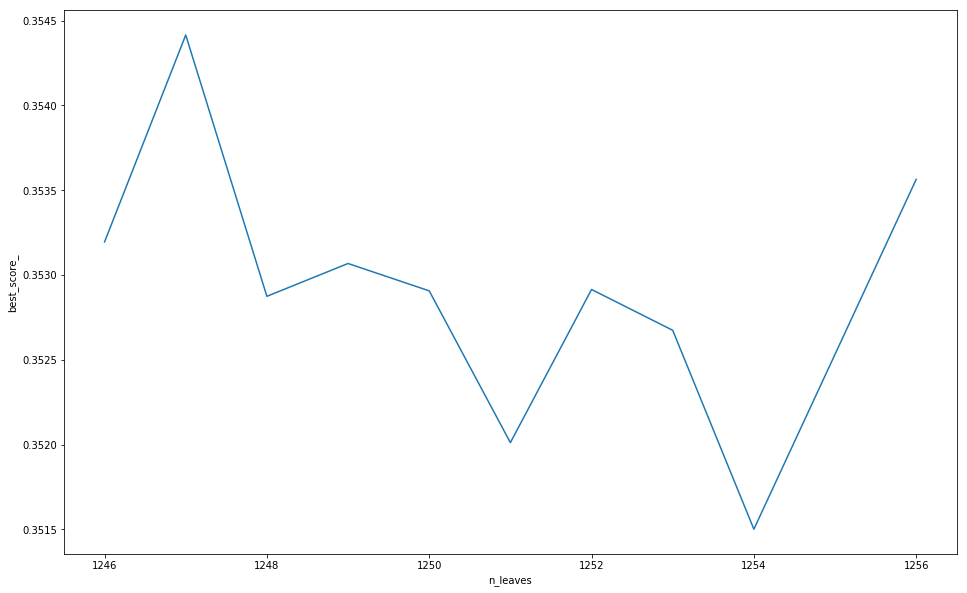

In [145]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['n_leaves','best_score_'])
plt.plot(df['n_leaves'],df['best_score_'])
plt.xlabel('n_leaves')
plt.ylabel('best_score_')
plt.show()

# Step 3:Tune min_split_gain(Minimum loss reduction required to make a further partition on a leaf node of the tree), starting with wider range

In [146]:
##########################################
#Step 3: Tune min_split_gain(Lightgbm)
##########################################
lgb_pars = []
for min_split_gain in [i/10.0 for i in range(0,5)]:
    # [0, 0.1, 0.2, 0.3, 0.4]
    print ('min_split_gain',min_split_gain)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    n_leaves = 1254
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_split_gain = min_split_gain ,
                               subsample = 1.0,
                               colsample_bytree = 1.0,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('min_split_gain', min_split_gain, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((min_split_gain, np.mean(n_fold_result)))

min_split_gain 0.0
[1]	valid_0's mape: 0.674579
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.637442
[3]	valid_0's mape: 0.604964
[4]	valid_0's mape: 0.576602
[5]	valid_0's mape: 0.550998
[6]	valid_0's mape: 0.530233
[7]	valid_0's mape: 0.511788
[8]	valid_0's mape: 0.49581
[9]	valid_0's mape: 0.481357
[10]	valid_0's mape: 0.469345
[11]	valid_0's mape: 0.458185
[12]	valid_0's mape: 0.448796
[13]	valid_0's mape: 0.440486
[14]	valid_0's mape: 0.432846
[15]	valid_0's mape: 0.42588
[16]	valid_0's mape: 0.420117
[17]	valid_0's mape: 0.41485
[18]	valid_0's mape: 0.410469
[19]	valid_0's mape: 0.40606
[20]	valid_0's mape: 0.402191
[21]	valid_0's mape: 0.398771
[22]	valid_0's mape: 0.395589
[23]	valid_0's mape: 0.392512
[24]	valid_0's mape: 0.390351
[25]	valid_0's mape: 0.388223
[26]	valid_0's mape: 0.386244
[27]	valid_0's mape: 0.384317
[28]	valid_0's mape: 0.38254
[29]	valid_0's mape: 0.381066
[30]	valid_0's mape: 0.379622
[31]	valid_0's mape: 0.377982
[32

[95]	valid_0's mape: 0.35206
[96]	valid_0's mape: 0.352089
[97]	valid_0's mape: 0.351849
[98]	valid_0's mape: 0.351841
[99]	valid_0's mape: 0.35193
[100]	valid_0's mape: 0.351972
[101]	valid_0's mape: 0.351927
[102]	valid_0's mape: 0.351996
[103]	valid_0's mape: 0.351857
[104]	valid_0's mape: 0.351747
[105]	valid_0's mape: 0.351567
[106]	valid_0's mape: 0.351514
[107]	valid_0's mape: 0.351409
[108]	valid_0's mape: 0.351302
[109]	valid_0's mape: 0.351241
[110]	valid_0's mape: 0.351227
[111]	valid_0's mape: 0.35128
[112]	valid_0's mape: 0.351255
[113]	valid_0's mape: 0.351386
[114]	valid_0's mape: 0.351259
[115]	valid_0's mape: 0.351401
[116]	valid_0's mape: 0.351527
[117]	valid_0's mape: 0.351521
[118]	valid_0's mape: 0.351413
[119]	valid_0's mape: 0.351315
[120]	valid_0's mape: 0.351122
[121]	valid_0's mape: 0.351111
[122]	valid_0's mape: 0.351246
[123]	valid_0's mape: 0.351119
[124]	valid_0's mape: 0.35103
[125]	valid_0's mape: 0.351076
[126]	valid_0's mape: 0.351079
[127]	valid_0's m

[9]	valid_0's mape: 0.475955
[10]	valid_0's mape: 0.463806
[11]	valid_0's mape: 0.452794
[12]	valid_0's mape: 0.44271
[13]	valid_0's mape: 0.4338
[14]	valid_0's mape: 0.426592
[15]	valid_0's mape: 0.420199
[16]	valid_0's mape: 0.414632
[17]	valid_0's mape: 0.40926
[18]	valid_0's mape: 0.404402
[19]	valid_0's mape: 0.400075
[20]	valid_0's mape: 0.396719
[21]	valid_0's mape: 0.393562
[22]	valid_0's mape: 0.390506
[23]	valid_0's mape: 0.387787
[24]	valid_0's mape: 0.385565
[25]	valid_0's mape: 0.383595
[26]	valid_0's mape: 0.381542
[27]	valid_0's mape: 0.379672
[28]	valid_0's mape: 0.378063
[29]	valid_0's mape: 0.376563
[30]	valid_0's mape: 0.375078
[31]	valid_0's mape: 0.373677
[32]	valid_0's mape: 0.372257
[33]	valid_0's mape: 0.371185
[34]	valid_0's mape: 0.370288
[35]	valid_0's mape: 0.36954
[36]	valid_0's mape: 0.36871
[37]	valid_0's mape: 0.367856
[38]	valid_0's mape: 0.367052
[39]	valid_0's mape: 0.366471
[40]	valid_0's mape: 0.365819
[41]	valid_0's mape: 0.365225
[42]	valid_0's ma

[113]	valid_0's mape: 0.354626
[114]	valid_0's mape: 0.354668
[115]	valid_0's mape: 0.355693
[116]	valid_0's mape: 0.356785
[117]	valid_0's mape: 0.357821
[118]	valid_0's mape: 0.358059
[119]	valid_0's mape: 0.358005
[120]	valid_0's mape: 0.358049
[121]	valid_0's mape: 0.358084
[122]	valid_0's mape: 0.358061
[123]	valid_0's mape: 0.358148
[124]	valid_0's mape: 0.358204
[125]	valid_0's mape: 0.358205
[126]	valid_0's mape: 0.358219
[127]	valid_0's mape: 0.358291
[128]	valid_0's mape: 0.357715
[129]	valid_0's mape: 0.357648
[130]	valid_0's mape: 0.357923
[131]	valid_0's mape: 0.357925
[132]	valid_0's mape: 0.35796
[133]	valid_0's mape: 0.358011
[134]	valid_0's mape: 0.358096
[135]	valid_0's mape: 0.358106
[136]	valid_0's mape: 0.35841
[137]	valid_0's mape: 0.358428
[138]	valid_0's mape: 0.358425
[139]	valid_0's mape: 0.358399
[140]	valid_0's mape: 0.358379
[141]	valid_0's mape: 0.358299
[142]	valid_0's mape: 0.358359
[143]	valid_0's mape: 0.358342
[144]	valid_0's mape: 0.358484
[145]	vali

[119]	valid_0's mape: 0.455467
[120]	valid_0's mape: 0.455467
[121]	valid_0's mape: 0.455467
[122]	valid_0's mape: 0.455467
[123]	valid_0's mape: 0.455467
[124]	valid_0's mape: 0.455467
[125]	valid_0's mape: 0.455467
[126]	valid_0's mape: 0.455467
[127]	valid_0's mape: 0.455467
[128]	valid_0's mape: 0.455467
[129]	valid_0's mape: 0.455467
[130]	valid_0's mape: 0.455467
[131]	valid_0's mape: 0.455467
Early stopping, best iteration is:
[81]	valid_0's mape: 0.455467
[1]	valid_0's mape: 0.686182
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.660086
[3]	valid_0's mape: 0.636465
[4]	valid_0's mape: 0.615419
[5]	valid_0's mape: 0.59635
[6]	valid_0's mape: 0.578682
[7]	valid_0's mape: 0.563143
[8]	valid_0's mape: 0.549865
[9]	valid_0's mape: 0.539646
[10]	valid_0's mape: 0.530865
[11]	valid_0's mape: 0.522672
[12]	valid_0's mape: 0.515557
[13]	valid_0's mape: 0.509544
[14]	valid_0's mape: 0.504298
[15]	valid_0's mape: 0.499066
[16]	valid_0's mape: 0.494329


[13]	valid_0's mape: 0.506204
[14]	valid_0's mape: 0.499992
[15]	valid_0's mape: 0.495
[16]	valid_0's mape: 0.490472
[17]	valid_0's mape: 0.486068
[18]	valid_0's mape: 0.481563
[19]	valid_0's mape: 0.478502
[20]	valid_0's mape: 0.475198
[21]	valid_0's mape: 0.472482
[22]	valid_0's mape: 0.470643
[23]	valid_0's mape: 0.468273
[24]	valid_0's mape: 0.466476
[25]	valid_0's mape: 0.464564
[26]	valid_0's mape: 0.46333
[27]	valid_0's mape: 0.462235
[28]	valid_0's mape: 0.461526
[29]	valid_0's mape: 0.460283
[30]	valid_0's mape: 0.459095
[31]	valid_0's mape: 0.458036
[32]	valid_0's mape: 0.45676
[33]	valid_0's mape: 0.456229
[34]	valid_0's mape: 0.455464
[35]	valid_0's mape: 0.455247
[36]	valid_0's mape: 0.454727
[37]	valid_0's mape: 0.454418
[38]	valid_0's mape: 0.453573
[39]	valid_0's mape: 0.453402
[40]	valid_0's mape: 0.453053
[41]	valid_0's mape: 0.452768
[42]	valid_0's mape: 0.452688
[43]	valid_0's mape: 0.45241
[44]	valid_0's mape: 0.451982
[45]	valid_0's mape: 0.451603
[46]	valid_0's m

[69]	valid_0's mape: 0.495127
[70]	valid_0's mape: 0.495127
[71]	valid_0's mape: 0.495127
[72]	valid_0's mape: 0.495127
[73]	valid_0's mape: 0.495127
[74]	valid_0's mape: 0.495127
[75]	valid_0's mape: 0.495127
[76]	valid_0's mape: 0.495127
[77]	valid_0's mape: 0.495127
[78]	valid_0's mape: 0.495127
[79]	valid_0's mape: 0.495127
[80]	valid_0's mape: 0.495127
[81]	valid_0's mape: 0.495127
[82]	valid_0's mape: 0.495127
[83]	valid_0's mape: 0.495127
[84]	valid_0's mape: 0.495127
[85]	valid_0's mape: 0.495127
[86]	valid_0's mape: 0.495127
[87]	valid_0's mape: 0.495127
[88]	valid_0's mape: 0.495127
[89]	valid_0's mape: 0.495127
[90]	valid_0's mape: 0.495127
[91]	valid_0's mape: 0.495127
[92]	valid_0's mape: 0.495127
[93]	valid_0's mape: 0.495127
[94]	valid_0's mape: 0.495127
[95]	valid_0's mape: 0.495127
Early stopping, best iteration is:
[45]	valid_0's mape: 0.495127
[1]	valid_0's mape: 0.690965
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.669373
[3]	v

[68]	valid_0's mape: 0.489493
[69]	valid_0's mape: 0.489493
[70]	valid_0's mape: 0.489493
[71]	valid_0's mape: 0.489493
[72]	valid_0's mape: 0.489493
[73]	valid_0's mape: 0.489493
[74]	valid_0's mape: 0.489493
[75]	valid_0's mape: 0.489493
[76]	valid_0's mape: 0.489493
[77]	valid_0's mape: 0.489493
[78]	valid_0's mape: 0.489493
[79]	valid_0's mape: 0.489493
[80]	valid_0's mape: 0.489493
[81]	valid_0's mape: 0.489493
[82]	valid_0's mape: 0.489493
[83]	valid_0's mape: 0.489493
[84]	valid_0's mape: 0.489493
[85]	valid_0's mape: 0.489493
[86]	valid_0's mape: 0.489493
[87]	valid_0's mape: 0.489493
[88]	valid_0's mape: 0.489493
[89]	valid_0's mape: 0.489493
[90]	valid_0's mape: 0.489493
[91]	valid_0's mape: 0.489493
[92]	valid_0's mape: 0.489493
[93]	valid_0's mape: 0.489493
[94]	valid_0's mape: 0.489493
[95]	valid_0's mape: 0.489493
[96]	valid_0's mape: 0.489493
[97]	valid_0's mape: 0.489493
[98]	valid_0's mape: 0.489493
[99]	valid_0's mape: 0.489493
[100]	valid_0's mape: 0.489493
Early sto

[33]	valid_0's mape: 0.518987
[34]	valid_0's mape: 0.518858
[35]	valid_0's mape: 0.518774
[36]	valid_0's mape: 0.518515
[37]	valid_0's mape: 0.518403
[38]	valid_0's mape: 0.518046
[39]	valid_0's mape: 0.518012
[40]	valid_0's mape: 0.517978
[41]	valid_0's mape: 0.51796
[42]	valid_0's mape: 0.5179
[43]	valid_0's mape: 0.5179
[44]	valid_0's mape: 0.5179
[45]	valid_0's mape: 0.5179
[46]	valid_0's mape: 0.5179
[47]	valid_0's mape: 0.5179
[48]	valid_0's mape: 0.5179
[49]	valid_0's mape: 0.5179
[50]	valid_0's mape: 0.5179
[51]	valid_0's mape: 0.5179
[52]	valid_0's mape: 0.5179
[53]	valid_0's mape: 0.5179
[54]	valid_0's mape: 0.5179
[55]	valid_0's mape: 0.5179
[56]	valid_0's mape: 0.5179
[57]	valid_0's mape: 0.5179
[58]	valid_0's mape: 0.5179
[59]	valid_0's mape: 0.5179
[60]	valid_0's mape: 0.5179
[61]	valid_0's mape: 0.5179
[62]	valid_0's mape: 0.5179
[63]	valid_0's mape: 0.5179
[64]	valid_0's mape: 0.5179
[65]	valid_0's mape: 0.5179
[66]	valid_0's mape: 0.5179
[67]	valid_0's mape: 0.5179
[68

[25]	valid_0's mape: 0.549084
[26]	valid_0's mape: 0.548486
[27]	valid_0's mape: 0.548108
[28]	valid_0's mape: 0.545084
[29]	valid_0's mape: 0.542471
[30]	valid_0's mape: 0.541805
[31]	valid_0's mape: 0.54089
[32]	valid_0's mape: 0.540696
[33]	valid_0's mape: 0.539948
[34]	valid_0's mape: 0.539872
[35]	valid_0's mape: 0.539664
[36]	valid_0's mape: 0.539472
[37]	valid_0's mape: 0.539032
[38]	valid_0's mape: 0.538994
[39]	valid_0's mape: 0.538973
[40]	valid_0's mape: 0.538924
[41]	valid_0's mape: 0.538905
[42]	valid_0's mape: 0.538889
[43]	valid_0's mape: 0.538889
[44]	valid_0's mape: 0.538889
[45]	valid_0's mape: 0.538889
[46]	valid_0's mape: 0.538889
[47]	valid_0's mape: 0.538889
[48]	valid_0's mape: 0.538889
[49]	valid_0's mape: 0.538889
[50]	valid_0's mape: 0.538889
[51]	valid_0's mape: 0.538889
[52]	valid_0's mape: 0.538889
[53]	valid_0's mape: 0.538889
[54]	valid_0's mape: 0.538889
[55]	valid_0's mape: 0.538889
[56]	valid_0's mape: 0.538889
[57]	valid_0's mape: 0.538889
[58]	valid_

[11]	valid_0's mape: 0.582885
[12]	valid_0's mape: 0.577182
[13]	valid_0's mape: 0.573254
[14]	valid_0's mape: 0.568729
[15]	valid_0's mape: 0.564743
[16]	valid_0's mape: 0.560516
[17]	valid_0's mape: 0.556229
[18]	valid_0's mape: 0.553042
[19]	valid_0's mape: 0.550519
[20]	valid_0's mape: 0.547892
[21]	valid_0's mape: 0.545998
[22]	valid_0's mape: 0.544118
[23]	valid_0's mape: 0.541844
[24]	valid_0's mape: 0.540101
[25]	valid_0's mape: 0.538629
[26]	valid_0's mape: 0.536151
[27]	valid_0's mape: 0.535695
[28]	valid_0's mape: 0.535346
[29]	valid_0's mape: 0.534168
[30]	valid_0's mape: 0.533943
[31]	valid_0's mape: 0.533225
[32]	valid_0's mape: 0.533042
[33]	valid_0's mape: 0.531615
[34]	valid_0's mape: 0.531464
[35]	valid_0's mape: 0.531237
[36]	valid_0's mape: 0.530635
[37]	valid_0's mape: 0.530253
[38]	valid_0's mape: 0.530236
[39]	valid_0's mape: 0.530212
[40]	valid_0's mape: 0.530181
[41]	valid_0's mape: 0.530181
[42]	valid_0's mape: 0.530181
[43]	valid_0's mape: 0.530181
[44]	valid

results [(0.0, 0.3515007716811535), (0.1, 0.4555442813640839), (0.2, 0.49396525169228084), (0.3, 0.5171190351604104), (0.4, 0.5319958792066648)]
best paras 0.0
best_score_ 0.3515007716811535


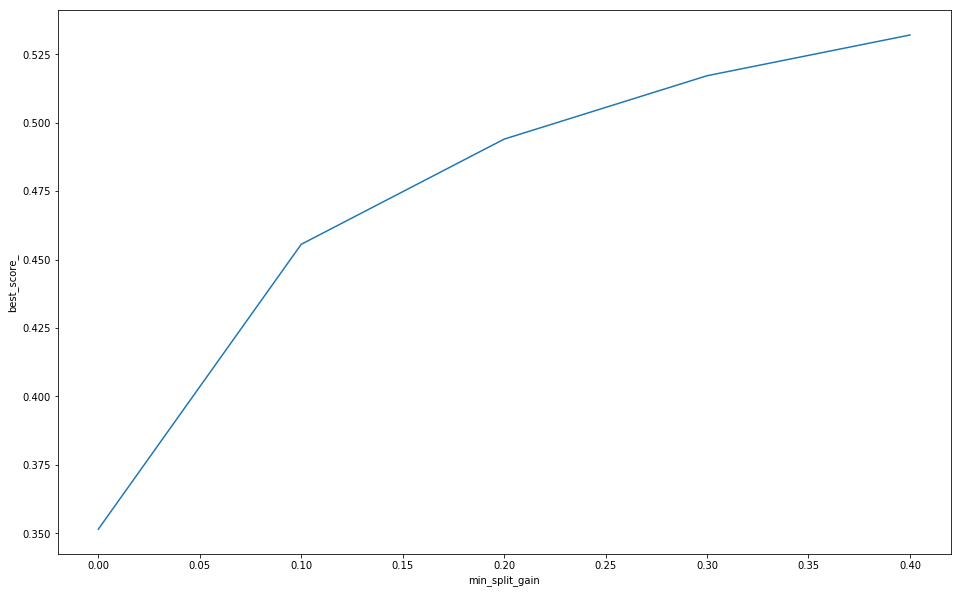

In [147]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(-1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['min_split_gain','best_score_'])
plt.plot(df['min_split_gain'],df['best_score_'])
plt.xlabel('min_split_gain')
plt.ylabel('best_score_')
plt.show()

# Step 4: Tune subsample and colsample_bytree

In [153]:
##########################################
#Step 4: Tune subsample and colsample_bytree
##########################################

#----------------------------
#1. Start with wider range 
#----------------------------
lgb_pars = []
for subsample in [i/10.0 for i in range(6,11)]:
    for colsample_bytree in [i/10.0 for i in range(6,11)]:
        # [0,6, 0,7, 0.8, 0.9, 1.0]
        print ('paras_combination :', subsample, colsample_bytree)
        # the below is optimun result got from experiments
        fixed_estimator = 1155
        n_leaves = 1254
        min_split_gain = 0.0
        # n-fold (n = 5)
        skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
        n_fold_result = []
        for train_index, test_index in skf.split(X_train, Y_train):
            x_train, x_val = X_train[train_index], X_train[test_index]
            y_train, y_val = Y_train[train_index], Y_train[test_index]
            # model
            model = LGBMModel(objective = 'mape',
                                   learning_rate = 0.1,
                                   max_depth = -1,
                                   min_child_weight = 0.001,
                                   min_split_gain = min_split_gain ,
                                   subsample = subsample,
                                   colsample_bytree = colsample_bytree,
                                   num_leaves = n_leaves,
                                   n_estimators = fixed_estimator,
                                   random_state = seed
                                  )
            model.fit(x_train, y_train, 
                      eval_metric ='mape',
                      eval_set = [(x_val, y_val)],
                      early_stopping_rounds = 50)  
            # saving model
            path = '../output/model-PM2.5/tuning'
            if not os.path.isdir(path):
                os.makedirs(path)
            pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}_{}.model'.format('subsample+colsample_bytree', subsample, colsample_bytree, seed), "wb"))   
            # validating evaluation result
            n_fold_result.append(model.best_score_['valid_0']['mape'])
        #output
        lgb_pars.append((subsample, colsample_bytree, np.mean(n_fold_result)))

paras_combination : 0.6 0.6
[1]	valid_0's mape: 0.675132
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.638699
[3]	valid_0's mape: 0.606222
[4]	valid_0's mape: 0.577584
[5]	valid_0's mape: 0.553541
[6]	valid_0's mape: 0.533301
[7]	valid_0's mape: 0.515127
[8]	valid_0's mape: 0.500261
[9]	valid_0's mape: 0.487205
[10]	valid_0's mape: 0.474949
[11]	valid_0's mape: 0.464222
[12]	valid_0's mape: 0.455193
[13]	valid_0's mape: 0.447112
[14]	valid_0's mape: 0.440794
[15]	valid_0's mape: 0.434788
[16]	valid_0's mape: 0.429224
[17]	valid_0's mape: 0.424097
[18]	valid_0's mape: 0.419915
[19]	valid_0's mape: 0.416173
[20]	valid_0's mape: 0.412554
[21]	valid_0's mape: 0.409423
[22]	valid_0's mape: 0.406648
[23]	valid_0's mape: 0.404103
[24]	valid_0's mape: 0.401801
[25]	valid_0's mape: 0.399785
[26]	valid_0's mape: 0.398338
[27]	valid_0's mape: 0.396717
[28]	valid_0's mape: 0.394765
[29]	valid_0's mape: 0.393204
[30]	valid_0's mape: 0.39159
[31]	valid_0's mape:

[57]	valid_0's mape: 0.368479
[58]	valid_0's mape: 0.368043
[59]	valid_0's mape: 0.367769
[60]	valid_0's mape: 0.367406
[61]	valid_0's mape: 0.367158
[62]	valid_0's mape: 0.366807
[63]	valid_0's mape: 0.366403
[64]	valid_0's mape: 0.36618
[65]	valid_0's mape: 0.36601
[66]	valid_0's mape: 0.365826
[67]	valid_0's mape: 0.365375
[68]	valid_0's mape: 0.365111
[69]	valid_0's mape: 0.365007
[70]	valid_0's mape: 0.364765
[71]	valid_0's mape: 0.364488
[72]	valid_0's mape: 0.364436
[73]	valid_0's mape: 0.364408
[74]	valid_0's mape: 0.36432
[75]	valid_0's mape: 0.364182
[76]	valid_0's mape: 0.363954
[77]	valid_0's mape: 0.363632
[78]	valid_0's mape: 0.363373
[79]	valid_0's mape: 0.363295
[80]	valid_0's mape: 0.363066
[81]	valid_0's mape: 0.363032
[82]	valid_0's mape: 0.362893
[83]	valid_0's mape: 0.362872
[84]	valid_0's mape: 0.362765
[85]	valid_0's mape: 0.36253
[86]	valid_0's mape: 0.362362
[87]	valid_0's mape: 0.362116
[88]	valid_0's mape: 0.361916
[89]	valid_0's mape: 0.361755
[90]	valid_0's

[125]	valid_0's mape: 0.355927
[126]	valid_0's mape: 0.355988
[127]	valid_0's mape: 0.355887
[128]	valid_0's mape: 0.355871
[129]	valid_0's mape: 0.356172
[130]	valid_0's mape: 0.356087
[131]	valid_0's mape: 0.355959
[132]	valid_0's mape: 0.356332
[133]	valid_0's mape: 0.356106
[134]	valid_0's mape: 0.355991
[135]	valid_0's mape: 0.356086
[136]	valid_0's mape: 0.357435
[137]	valid_0's mape: 0.35731
[138]	valid_0's mape: 0.35717
[139]	valid_0's mape: 0.357716
[140]	valid_0's mape: 0.357611
[141]	valid_0's mape: 0.357514
[142]	valid_0's mape: 0.357621
[143]	valid_0's mape: 0.357546
[144]	valid_0's mape: 0.357367
[145]	valid_0's mape: 0.3574
[146]	valid_0's mape: 0.35709
[147]	valid_0's mape: 0.356847
[148]	valid_0's mape: 0.356656
[149]	valid_0's mape: 0.356605
[150]	valid_0's mape: 0.356258
[151]	valid_0's mape: 0.356632
[152]	valid_0's mape: 0.356362
[153]	valid_0's mape: 0.356076
[154]	valid_0's mape: 0.35589
[155]	valid_0's mape: 0.356034
[156]	valid_0's mape: 0.355846
[157]	valid_0'

[154]	valid_0's mape: 0.371261
[155]	valid_0's mape: 0.371139
[156]	valid_0's mape: 0.371542
[157]	valid_0's mape: 0.371207
[158]	valid_0's mape: 0.372798
[159]	valid_0's mape: 0.372564
[160]	valid_0's mape: 0.372588
[161]	valid_0's mape: 0.37373
[162]	valid_0's mape: 0.373533
[163]	valid_0's mape: 0.373681
[164]	valid_0's mape: 0.373568
Early stopping, best iteration is:
[114]	valid_0's mape: 0.35866
[1]	valid_0's mape: 0.674286
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.638154
[3]	valid_0's mape: 0.605661
[4]	valid_0's mape: 0.577871
[5]	valid_0's mape: 0.553483
[6]	valid_0's mape: 0.532984
[7]	valid_0's mape: 0.514789
[8]	valid_0's mape: 0.499678
[9]	valid_0's mape: 0.485644
[10]	valid_0's mape: 0.473344
[11]	valid_0's mape: 0.462972
[12]	valid_0's mape: 0.453591
[13]	valid_0's mape: 0.445854
[14]	valid_0's mape: 0.43863
[15]	valid_0's mape: 0.43267
[16]	valid_0's mape: 0.427059
[17]	valid_0's mape: 0.421835
[18]	valid_0's mape: 0.417443
[19]

[79]	valid_0's mape: 0.365376
[80]	valid_0's mape: 0.365162
[81]	valid_0's mape: 0.365167
[82]	valid_0's mape: 0.365022
[83]	valid_0's mape: 0.364948
[84]	valid_0's mape: 0.364853
[85]	valid_0's mape: 0.364644
[86]	valid_0's mape: 0.364392
[87]	valid_0's mape: 0.364267
[88]	valid_0's mape: 0.364098
[89]	valid_0's mape: 0.363895
[90]	valid_0's mape: 0.363756
[91]	valid_0's mape: 0.363606
[92]	valid_0's mape: 0.363234
[93]	valid_0's mape: 0.363157
[94]	valid_0's mape: 0.36305
[95]	valid_0's mape: 0.362874
[96]	valid_0's mape: 0.362738
[97]	valid_0's mape: 0.362602
[98]	valid_0's mape: 0.362375
[99]	valid_0's mape: 0.362394
[100]	valid_0's mape: 0.362262
[101]	valid_0's mape: 0.362246
[102]	valid_0's mape: 0.362162
[103]	valid_0's mape: 0.362052
[104]	valid_0's mape: 0.362109
[105]	valid_0's mape: 0.362045
[106]	valid_0's mape: 0.361935
[107]	valid_0's mape: 0.361948
[108]	valid_0's mape: 0.361843
[109]	valid_0's mape: 0.361723
[110]	valid_0's mape: 0.36177
[111]	valid_0's mape: 0.362179


[186]	valid_0's mape: 0.355103
[187]	valid_0's mape: 0.355076
[188]	valid_0's mape: 0.355257
[189]	valid_0's mape: 0.355239
[190]	valid_0's mape: 0.355235
[191]	valid_0's mape: 0.355231
[192]	valid_0's mape: 0.355273
[193]	valid_0's mape: 0.355194
[194]	valid_0's mape: 0.355044
[195]	valid_0's mape: 0.35508
[196]	valid_0's mape: 0.354997
[197]	valid_0's mape: 0.355273
[198]	valid_0's mape: 0.355191
[199]	valid_0's mape: 0.355445
[200]	valid_0's mape: 0.355713
[201]	valid_0's mape: 0.35567
[202]	valid_0's mape: 0.355607
[203]	valid_0's mape: 0.355562
[204]	valid_0's mape: 0.356057
[205]	valid_0's mape: 0.355986
[206]	valid_0's mape: 0.356022
[207]	valid_0's mape: 0.355975
[208]	valid_0's mape: 0.355927
[209]	valid_0's mape: 0.355741
[210]	valid_0's mape: 0.355657
[211]	valid_0's mape: 0.355679
[212]	valid_0's mape: 0.355768
[213]	valid_0's mape: 0.355706
[214]	valid_0's mape: 0.355626
[215]	valid_0's mape: 0.355873
[216]	valid_0's mape: 0.356012
[217]	valid_0's mape: 0.356303
[218]	vali

[1]	valid_0's mape: 0.670962
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.633271
[3]	valid_0's mape: 0.600927
[4]	valid_0's mape: 0.572851
[5]	valid_0's mape: 0.548332
[6]	valid_0's mape: 0.528121
[7]	valid_0's mape: 0.509393
[8]	valid_0's mape: 0.49387
[9]	valid_0's mape: 0.480558
[10]	valid_0's mape: 0.46803
[11]	valid_0's mape: 0.458435
[12]	valid_0's mape: 0.448889
[13]	valid_0's mape: 0.44098
[14]	valid_0's mape: 0.434001
[15]	valid_0's mape: 0.427811
[16]	valid_0's mape: 0.42272
[17]	valid_0's mape: 0.418323
[18]	valid_0's mape: 0.414085
[19]	valid_0's mape: 0.410173
[20]	valid_0's mape: 0.40683
[21]	valid_0's mape: 0.403927
[22]	valid_0's mape: 0.401342
[23]	valid_0's mape: 0.398638
[24]	valid_0's mape: 0.396708
[25]	valid_0's mape: 0.394665
[26]	valid_0's mape: 0.392263
[27]	valid_0's mape: 0.390631
[28]	valid_0's mape: 0.389014
[29]	valid_0's mape: 0.387671
[30]	valid_0's mape: 0.386233
[31]	valid_0's mape: 0.384702
[32]	valid_0's mape: 0

[74]	valid_0's mape: 0.364766
[75]	valid_0's mape: 0.364581
[76]	valid_0's mape: 0.364557
[77]	valid_0's mape: 0.364347
[78]	valid_0's mape: 0.364217
[79]	valid_0's mape: 0.36402
[80]	valid_0's mape: 0.363731
[81]	valid_0's mape: 0.363583
[82]	valid_0's mape: 0.363392
[83]	valid_0's mape: 0.363539
[84]	valid_0's mape: 0.363438
[85]	valid_0's mape: 0.363057
[86]	valid_0's mape: 0.362774
[87]	valid_0's mape: 0.362583
[88]	valid_0's mape: 0.362444
[89]	valid_0's mape: 0.362212
[90]	valid_0's mape: 0.36199
[91]	valid_0's mape: 0.361789
[92]	valid_0's mape: 0.361759
[93]	valid_0's mape: 0.361668
[94]	valid_0's mape: 0.361423
[95]	valid_0's mape: 0.361176
[96]	valid_0's mape: 0.361074
[97]	valid_0's mape: 0.361012
[98]	valid_0's mape: 0.360995
[99]	valid_0's mape: 0.360917
[100]	valid_0's mape: 0.360758
[101]	valid_0's mape: 0.360622
[102]	valid_0's mape: 0.360545
[103]	valid_0's mape: 0.360427
[104]	valid_0's mape: 0.360404
[105]	valid_0's mape: 0.360427
[106]	valid_0's mape: 0.360391
[107]

[112]	valid_0's mape: 0.361899
[113]	valid_0's mape: 0.361812
[114]	valid_0's mape: 0.361752
[115]	valid_0's mape: 0.361732
[116]	valid_0's mape: 0.361938
[117]	valid_0's mape: 0.361738
[118]	valid_0's mape: 0.361613
[119]	valid_0's mape: 0.361378
[120]	valid_0's mape: 0.361289
[121]	valid_0's mape: 0.361587
[122]	valid_0's mape: 0.361389
[123]	valid_0's mape: 0.361369
[124]	valid_0's mape: 0.361312
[125]	valid_0's mape: 0.361469
[126]	valid_0's mape: 0.361783
[127]	valid_0's mape: 0.361599
[128]	valid_0's mape: 0.361545
[129]	valid_0's mape: 0.361629
[130]	valid_0's mape: 0.361502
[131]	valid_0's mape: 0.361566
[132]	valid_0's mape: 0.361422
[133]	valid_0's mape: 0.361411
[134]	valid_0's mape: 0.361451
[135]	valid_0's mape: 0.361529
[136]	valid_0's mape: 0.361503
[137]	valid_0's mape: 0.36141
[138]	valid_0's mape: 0.361333
[139]	valid_0's mape: 0.361297
[140]	valid_0's mape: 0.361109
[141]	valid_0's mape: 0.36103
[142]	valid_0's mape: 0.360996
[143]	valid_0's mape: 0.360946
[144]	vali

[109]	valid_0's mape: 0.362455
[110]	valid_0's mape: 0.362335
[111]	valid_0's mape: 0.362211
[112]	valid_0's mape: 0.362179
[113]	valid_0's mape: 0.36175
[114]	valid_0's mape: 0.361697
[115]	valid_0's mape: 0.361551
[116]	valid_0's mape: 0.361555
[117]	valid_0's mape: 0.361445
[118]	valid_0's mape: 0.362714
[119]	valid_0's mape: 0.36263
[120]	valid_0's mape: 0.362507
[121]	valid_0's mape: 0.362339
[122]	valid_0's mape: 0.36227
[123]	valid_0's mape: 0.362099
[124]	valid_0's mape: 0.361915
[125]	valid_0's mape: 0.361847
[126]	valid_0's mape: 0.361816
[127]	valid_0's mape: 0.361773
[128]	valid_0's mape: 0.361784
[129]	valid_0's mape: 0.361761
[130]	valid_0's mape: 0.361652
[131]	valid_0's mape: 0.361625
[132]	valid_0's mape: 0.361577
[133]	valid_0's mape: 0.361292
[134]	valid_0's mape: 0.361239
[135]	valid_0's mape: 0.362352
[136]	valid_0's mape: 0.362344
[137]	valid_0's mape: 0.362312
[138]	valid_0's mape: 0.362264
[139]	valid_0's mape: 0.362194
[140]	valid_0's mape: 0.362145
[141]	valid

[137]	valid_0's mape: 0.35318
[138]	valid_0's mape: 0.353128
[139]	valid_0's mape: 0.353297
[140]	valid_0's mape: 0.353251
[141]	valid_0's mape: 0.353214
[142]	valid_0's mape: 0.353181
[143]	valid_0's mape: 0.353293
[144]	valid_0's mape: 0.353182
[145]	valid_0's mape: 0.353157
[146]	valid_0's mape: 0.353027
[147]	valid_0's mape: 0.353029
[148]	valid_0's mape: 0.35305
[149]	valid_0's mape: 0.352894
[150]	valid_0's mape: 0.352833
[151]	valid_0's mape: 0.352776
[152]	valid_0's mape: 0.35273
[153]	valid_0's mape: 0.352581
[154]	valid_0's mape: 0.352572
[155]	valid_0's mape: 0.352501
[156]	valid_0's mape: 0.352404
[157]	valid_0's mape: 0.352383
[158]	valid_0's mape: 0.352511
[159]	valid_0's mape: 0.352377
[160]	valid_0's mape: 0.352364
[161]	valid_0's mape: 0.352491
[162]	valid_0's mape: 0.352685
[163]	valid_0's mape: 0.352669
[164]	valid_0's mape: 0.352645
[165]	valid_0's mape: 0.35262
[166]	valid_0's mape: 0.352599
[167]	valid_0's mape: 0.352725
[168]	valid_0's mape: 0.35269
[169]	valid_0

[104]	valid_0's mape: 0.362805
[105]	valid_0's mape: 0.362613
[106]	valid_0's mape: 0.362511
[107]	valid_0's mape: 0.362356
[108]	valid_0's mape: 0.362245
[109]	valid_0's mape: 0.362018
[110]	valid_0's mape: 0.361963
[111]	valid_0's mape: 0.361986
[112]	valid_0's mape: 0.361862
[113]	valid_0's mape: 0.362576
[114]	valid_0's mape: 0.364066
[115]	valid_0's mape: 0.365017
[116]	valid_0's mape: 0.364945
[117]	valid_0's mape: 0.364846
[118]	valid_0's mape: 0.364822
[119]	valid_0's mape: 0.364798
[120]	valid_0's mape: 0.364641
[121]	valid_0's mape: 0.364544
[122]	valid_0's mape: 0.36425
[123]	valid_0's mape: 0.36431
[124]	valid_0's mape: 0.36388
[125]	valid_0's mape: 0.364518
[126]	valid_0's mape: 0.365386
[127]	valid_0's mape: 0.366373
[128]	valid_0's mape: 0.366306
[129]	valid_0's mape: 0.366353
[130]	valid_0's mape: 0.366323
[131]	valid_0's mape: 0.367214
[132]	valid_0's mape: 0.36662
[133]	valid_0's mape: 0.366342
[134]	valid_0's mape: 0.36663
[135]	valid_0's mape: 0.366463
[136]	valid_0

[46]	valid_0's mape: 0.377229
[47]	valid_0's mape: 0.376708
[48]	valid_0's mape: 0.376184
[49]	valid_0's mape: 0.375594
[50]	valid_0's mape: 0.375216
[51]	valid_0's mape: 0.374734
[52]	valid_0's mape: 0.374201
[53]	valid_0's mape: 0.373819
[54]	valid_0's mape: 0.373262
[55]	valid_0's mape: 0.372883
[56]	valid_0's mape: 0.372542
[57]	valid_0's mape: 0.372257
[58]	valid_0's mape: 0.372019
[59]	valid_0's mape: 0.371575
[60]	valid_0's mape: 0.37144
[61]	valid_0's mape: 0.371106
[62]	valid_0's mape: 0.370895
[63]	valid_0's mape: 0.3707
[64]	valid_0's mape: 0.370354
[65]	valid_0's mape: 0.370106
[66]	valid_0's mape: 0.369773
[67]	valid_0's mape: 0.369462
[68]	valid_0's mape: 0.36904
[69]	valid_0's mape: 0.368875
[70]	valid_0's mape: 0.368556
[71]	valid_0's mape: 0.368416
[72]	valid_0's mape: 0.368113
[73]	valid_0's mape: 0.367678
[74]	valid_0's mape: 0.367521
[75]	valid_0's mape: 0.367321
[76]	valid_0's mape: 0.367219
[77]	valid_0's mape: 0.366884
[78]	valid_0's mape: 0.36664
[79]	valid_0's 

[136]	valid_0's mape: 0.357026
[137]	valid_0's mape: 0.356942
[138]	valid_0's mape: 0.356804
[139]	valid_0's mape: 0.356634
[140]	valid_0's mape: 0.356651
[141]	valid_0's mape: 0.356787
[142]	valid_0's mape: 0.35681
[143]	valid_0's mape: 0.35686
[144]	valid_0's mape: 0.356923
[145]	valid_0's mape: 0.35674
[146]	valid_0's mape: 0.356787
[147]	valid_0's mape: 0.356751
[148]	valid_0's mape: 0.356553
[149]	valid_0's mape: 0.35677
[150]	valid_0's mape: 0.356747
[151]	valid_0's mape: 0.356704
[152]	valid_0's mape: 0.356696
[153]	valid_0's mape: 0.356683
[154]	valid_0's mape: 0.357052
[155]	valid_0's mape: 0.356987
[156]	valid_0's mape: 0.356989
[157]	valid_0's mape: 0.356944
[158]	valid_0's mape: 0.356719
[159]	valid_0's mape: 0.35675
[160]	valid_0's mape: 0.356649
[161]	valid_0's mape: 0.356936
[162]	valid_0's mape: 0.357038
[163]	valid_0's mape: 0.357012
[164]	valid_0's mape: 0.35736
[165]	valid_0's mape: 0.35789
[166]	valid_0's mape: 0.357778
[167]	valid_0's mape: 0.357602
[168]	valid_0's

[203]	valid_0's mape: 0.353397
[204]	valid_0's mape: 0.353458
[205]	valid_0's mape: 0.353506
[206]	valid_0's mape: 0.353398
[207]	valid_0's mape: 0.353296
[208]	valid_0's mape: 0.353258
[209]	valid_0's mape: 0.353271
[210]	valid_0's mape: 0.353197
[211]	valid_0's mape: 0.353157
[212]	valid_0's mape: 0.353094
[213]	valid_0's mape: 0.353034
[214]	valid_0's mape: 0.352944
[215]	valid_0's mape: 0.352877
[216]	valid_0's mape: 0.35287
[217]	valid_0's mape: 0.352847
[218]	valid_0's mape: 0.352791
[219]	valid_0's mape: 0.352841
[220]	valid_0's mape: 0.352795
[221]	valid_0's mape: 0.352775
[222]	valid_0's mape: 0.352704
[223]	valid_0's mape: 0.353758
[224]	valid_0's mape: 0.353699
[225]	valid_0's mape: 0.353715
[226]	valid_0's mape: 0.353659
[227]	valid_0's mape: 0.353439
[228]	valid_0's mape: 0.353422
[229]	valid_0's mape: 0.353348
[230]	valid_0's mape: 0.353258
[231]	valid_0's mape: 0.353147
[232]	valid_0's mape: 0.353111
[233]	valid_0's mape: 0.352998
[234]	valid_0's mape: 0.352898
[235]	val

[30]	valid_0's mape: 0.389754
[31]	valid_0's mape: 0.388406
[32]	valid_0's mape: 0.387144
[33]	valid_0's mape: 0.386125
[34]	valid_0's mape: 0.385037
[35]	valid_0's mape: 0.383839
[36]	valid_0's mape: 0.382949
[37]	valid_0's mape: 0.381852
[38]	valid_0's mape: 0.380749
[39]	valid_0's mape: 0.380037
[40]	valid_0's mape: 0.379173
[41]	valid_0's mape: 0.378192
[42]	valid_0's mape: 0.377322
[43]	valid_0's mape: 0.376721
[44]	valid_0's mape: 0.375958
[45]	valid_0's mape: 0.375413
[46]	valid_0's mape: 0.374747
[47]	valid_0's mape: 0.374191
[48]	valid_0's mape: 0.373503
[49]	valid_0's mape: 0.372854
[50]	valid_0's mape: 0.372425
[51]	valid_0's mape: 0.371803
[52]	valid_0's mape: 0.371348
[53]	valid_0's mape: 0.370863
[54]	valid_0's mape: 0.370472
[55]	valid_0's mape: 0.369883
[56]	valid_0's mape: 0.369454
[57]	valid_0's mape: 0.369063
[58]	valid_0's mape: 0.368625
[59]	valid_0's mape: 0.368087
[60]	valid_0's mape: 0.367943
[61]	valid_0's mape: 0.367624
[62]	valid_0's mape: 0.367455
[63]	valid

[96]	valid_0's mape: 0.362726
[97]	valid_0's mape: 0.362596
[98]	valid_0's mape: 0.362519
[99]	valid_0's mape: 0.362459
[100]	valid_0's mape: 0.362325
[101]	valid_0's mape: 0.362341
[102]	valid_0's mape: 0.362202
[103]	valid_0's mape: 0.362125
[104]	valid_0's mape: 0.361985
[105]	valid_0's mape: 0.361696
[106]	valid_0's mape: 0.361475
[107]	valid_0's mape: 0.361393
[108]	valid_0's mape: 0.361399
[109]	valid_0's mape: 0.361316
[110]	valid_0's mape: 0.36118
[111]	valid_0's mape: 0.361079
[112]	valid_0's mape: 0.360988
[113]	valid_0's mape: 0.360981
[114]	valid_0's mape: 0.360964
[115]	valid_0's mape: 0.360834
[116]	valid_0's mape: 0.360849
[117]	valid_0's mape: 0.360743
[118]	valid_0's mape: 0.360685
[119]	valid_0's mape: 0.360669
[120]	valid_0's mape: 0.360584
[121]	valid_0's mape: 0.360579
[122]	valid_0's mape: 0.360465
[123]	valid_0's mape: 0.360454
[124]	valid_0's mape: 0.360323
[125]	valid_0's mape: 0.360238
[126]	valid_0's mape: 0.36035
[127]	valid_0's mape: 0.360267
[128]	valid_0'

[160]	valid_0's mape: 0.357348
[161]	valid_0's mape: 0.357357
[162]	valid_0's mape: 0.357307
[163]	valid_0's mape: 0.357298
[164]	valid_0's mape: 0.357308
[165]	valid_0's mape: 0.35729
[166]	valid_0's mape: 0.357276
[167]	valid_0's mape: 0.35723
[168]	valid_0's mape: 0.357205
[169]	valid_0's mape: 0.357019
[170]	valid_0's mape: 0.356855
[171]	valid_0's mape: 0.35692
[172]	valid_0's mape: 0.356744
[173]	valid_0's mape: 0.356687
[174]	valid_0's mape: 0.356672
[175]	valid_0's mape: 0.35667
[176]	valid_0's mape: 0.356566
[177]	valid_0's mape: 0.356489
[178]	valid_0's mape: 0.356487
[179]	valid_0's mape: 0.356461
[180]	valid_0's mape: 0.356462
[181]	valid_0's mape: 0.356253
[182]	valid_0's mape: 0.35619
[183]	valid_0's mape: 0.356183
[184]	valid_0's mape: 0.356275
[185]	valid_0's mape: 0.356174
[186]	valid_0's mape: 0.356322
[187]	valid_0's mape: 0.356312
[188]	valid_0's mape: 0.356237
[189]	valid_0's mape: 0.356712
[190]	valid_0's mape: 0.356667
[191]	valid_0's mape: 0.356586
[192]	valid_0

[190]	valid_0's mape: 0.355071
[191]	valid_0's mape: 0.354843
[192]	valid_0's mape: 0.35475
[193]	valid_0's mape: 0.354674
[194]	valid_0's mape: 0.354723
[195]	valid_0's mape: 0.354686
[196]	valid_0's mape: 0.354614
[197]	valid_0's mape: 0.355645
[198]	valid_0's mape: 0.355993
[199]	valid_0's mape: 0.356318
[200]	valid_0's mape: 0.356411
[201]	valid_0's mape: 0.356319
[202]	valid_0's mape: 0.356254
[203]	valid_0's mape: 0.356199
[204]	valid_0's mape: 0.356172
[205]	valid_0's mape: 0.356422
[206]	valid_0's mape: 0.356509
[207]	valid_0's mape: 0.35627
[208]	valid_0's mape: 0.356258
[209]	valid_0's mape: 0.357541
[210]	valid_0's mape: 0.358149
[211]	valid_0's mape: 0.358105
[212]	valid_0's mape: 0.357998
[213]	valid_0's mape: 0.358325
[214]	valid_0's mape: 0.358396
[215]	valid_0's mape: 0.358816
[216]	valid_0's mape: 0.358487
[217]	valid_0's mape: 0.35899
[218]	valid_0's mape: 0.35886
[219]	valid_0's mape: 0.359144
[220]	valid_0's mape: 0.359409
[221]	valid_0's mape: 0.358909
[222]	valid_

[92]	valid_0's mape: 0.361577
[93]	valid_0's mape: 0.361398
[94]	valid_0's mape: 0.361296
[95]	valid_0's mape: 0.361132
[96]	valid_0's mape: 0.360969
[97]	valid_0's mape: 0.360807
[98]	valid_0's mape: 0.360963
[99]	valid_0's mape: 0.360912
[100]	valid_0's mape: 0.360804
[101]	valid_0's mape: 0.360699
[102]	valid_0's mape: 0.36061
[103]	valid_0's mape: 0.36056
[104]	valid_0's mape: 0.360492
[105]	valid_0's mape: 0.360376
[106]	valid_0's mape: 0.360381
[107]	valid_0's mape: 0.360165
[108]	valid_0's mape: 0.360161
[109]	valid_0's mape: 0.360172
[110]	valid_0's mape: 0.360237
[111]	valid_0's mape: 0.360133
[112]	valid_0's mape: 0.360092
[113]	valid_0's mape: 0.359858
[114]	valid_0's mape: 0.359731
[115]	valid_0's mape: 0.359659
[116]	valid_0's mape: 0.359425
[117]	valid_0's mape: 0.359265
[118]	valid_0's mape: 0.359075
[119]	valid_0's mape: 0.359074
[120]	valid_0's mape: 0.359048
[121]	valid_0's mape: 0.358914
[122]	valid_0's mape: 0.358868
[123]	valid_0's mape: 0.358787
[124]	valid_0's ma

[171]	valid_0's mape: 0.357142
[172]	valid_0's mape: 0.357194
[173]	valid_0's mape: 0.357298
[174]	valid_0's mape: 0.357239
[175]	valid_0's mape: 0.357441
[176]	valid_0's mape: 0.357491
[177]	valid_0's mape: 0.35741
[178]	valid_0's mape: 0.35758
[179]	valid_0's mape: 0.357444
[180]	valid_0's mape: 0.357435
[181]	valid_0's mape: 0.357296
[182]	valid_0's mape: 0.357313
[183]	valid_0's mape: 0.357272
[184]	valid_0's mape: 0.357352
[185]	valid_0's mape: 0.357277
[186]	valid_0's mape: 0.357406
[187]	valid_0's mape: 0.357522
[188]	valid_0's mape: 0.357438
[189]	valid_0's mape: 0.357391
[190]	valid_0's mape: 0.357338
[191]	valid_0's mape: 0.357354
[192]	valid_0's mape: 0.357412
[193]	valid_0's mape: 0.357288
[194]	valid_0's mape: 0.357661
[195]	valid_0's mape: 0.35765
[196]	valid_0's mape: 0.357611
[197]	valid_0's mape: 0.35758
[198]	valid_0's mape: 0.357651
[199]	valid_0's mape: 0.357527
[200]	valid_0's mape: 0.359419
[201]	valid_0's mape: 0.359733
[202]	valid_0's mape: 0.359605
[203]	valid_

[30]	valid_0's mape: 0.385311
[31]	valid_0's mape: 0.383728
[32]	valid_0's mape: 0.382141
[33]	valid_0's mape: 0.380814
[34]	valid_0's mape: 0.379732
[35]	valid_0's mape: 0.378649
[36]	valid_0's mape: 0.377845
[37]	valid_0's mape: 0.376683
[38]	valid_0's mape: 0.375483
[39]	valid_0's mape: 0.374544
[40]	valid_0's mape: 0.373765
[41]	valid_0's mape: 0.372804
[42]	valid_0's mape: 0.37211
[43]	valid_0's mape: 0.37137
[44]	valid_0's mape: 0.370961
[45]	valid_0's mape: 0.370247
[46]	valid_0's mape: 0.369485
[47]	valid_0's mape: 0.36893
[48]	valid_0's mape: 0.368378
[49]	valid_0's mape: 0.36784
[50]	valid_0's mape: 0.367528
[51]	valid_0's mape: 0.366753
[52]	valid_0's mape: 0.366338
[53]	valid_0's mape: 0.365876
[54]	valid_0's mape: 0.365208
[55]	valid_0's mape: 0.364615
[56]	valid_0's mape: 0.364354
[57]	valid_0's mape: 0.364193
[58]	valid_0's mape: 0.363903
[59]	valid_0's mape: 0.363577
[60]	valid_0's mape: 0.363188
[61]	valid_0's mape: 0.363583
[62]	valid_0's mape: 0.363251
[63]	valid_0's

[83]	valid_0's mape: 0.35985
[84]	valid_0's mape: 0.360014
[85]	valid_0's mape: 0.359948
[86]	valid_0's mape: 0.359762
[87]	valid_0's mape: 0.359587
[88]	valid_0's mape: 0.360472
[89]	valid_0's mape: 0.360413
[90]	valid_0's mape: 0.360828
[91]	valid_0's mape: 0.361112
[92]	valid_0's mape: 0.362066
[93]	valid_0's mape: 0.361894
[94]	valid_0's mape: 0.361718
[95]	valid_0's mape: 0.361457
[96]	valid_0's mape: 0.362282
[97]	valid_0's mape: 0.362867
[98]	valid_0's mape: 0.363408
[99]	valid_0's mape: 0.363128
[100]	valid_0's mape: 0.363127
[101]	valid_0's mape: 0.363189
[102]	valid_0's mape: 0.364233
[103]	valid_0's mape: 0.364136
[104]	valid_0's mape: 0.364807
[105]	valid_0's mape: 0.365799
[106]	valid_0's mape: 0.366711
[107]	valid_0's mape: 0.366059
[108]	valid_0's mape: 0.366144
[109]	valid_0's mape: 0.366295
[110]	valid_0's mape: 0.367085
[111]	valid_0's mape: 0.367963
[112]	valid_0's mape: 0.367858
[113]	valid_0's mape: 0.367748
[114]	valid_0's mape: 0.368525
[115]	valid_0's mape: 0.36

[27]	valid_0's mape: 0.39598
[28]	valid_0's mape: 0.393847
[29]	valid_0's mape: 0.392504
[30]	valid_0's mape: 0.3909
[31]	valid_0's mape: 0.389351
[32]	valid_0's mape: 0.38814
[33]	valid_0's mape: 0.38711
[34]	valid_0's mape: 0.385821
[35]	valid_0's mape: 0.384588
[36]	valid_0's mape: 0.383661
[37]	valid_0's mape: 0.382588
[38]	valid_0's mape: 0.38159
[39]	valid_0's mape: 0.380647
[40]	valid_0's mape: 0.379647
[41]	valid_0's mape: 0.378846
[42]	valid_0's mape: 0.378224
[43]	valid_0's mape: 0.377783
[44]	valid_0's mape: 0.377132
[45]	valid_0's mape: 0.376448
[46]	valid_0's mape: 0.375759
[47]	valid_0's mape: 0.375117
[48]	valid_0's mape: 0.374599
[49]	valid_0's mape: 0.373817
[50]	valid_0's mape: 0.373198
[51]	valid_0's mape: 0.372634
[52]	valid_0's mape: 0.372246
[53]	valid_0's mape: 0.371608
[54]	valid_0's mape: 0.371107
[55]	valid_0's mape: 0.370504
[56]	valid_0's mape: 0.370016
[57]	valid_0's mape: 0.369704
[58]	valid_0's mape: 0.36926
[59]	valid_0's mape: 0.36905
[60]	valid_0's map

[74]	valid_0's mape: 0.362309
[75]	valid_0's mape: 0.36209
[76]	valid_0's mape: 0.361852
[77]	valid_0's mape: 0.361527
[78]	valid_0's mape: 0.361302
[79]	valid_0's mape: 0.361132
[80]	valid_0's mape: 0.360875
[81]	valid_0's mape: 0.360759
[82]	valid_0's mape: 0.360502
[83]	valid_0's mape: 0.360298
[84]	valid_0's mape: 0.360207
[85]	valid_0's mape: 0.360088
[86]	valid_0's mape: 0.359773
[87]	valid_0's mape: 0.359501
[88]	valid_0's mape: 0.359375
[89]	valid_0's mape: 0.359322
[90]	valid_0's mape: 0.359142
[91]	valid_0's mape: 0.358974
[92]	valid_0's mape: 0.358726
[93]	valid_0's mape: 0.358578
[94]	valid_0's mape: 0.358544
[95]	valid_0's mape: 0.358335
[96]	valid_0's mape: 0.358206
[97]	valid_0's mape: 0.358005
[98]	valid_0's mape: 0.357906
[99]	valid_0's mape: 0.357968
[100]	valid_0's mape: 0.357863
[101]	valid_0's mape: 0.357727
[102]	valid_0's mape: 0.357689
[103]	valid_0's mape: 0.35761
[104]	valid_0's mape: 0.357398
[105]	valid_0's mape: 0.357341
[106]	valid_0's mape: 0.357184
[107]

[140]	valid_0's mape: 0.352903
[141]	valid_0's mape: 0.352909
[142]	valid_0's mape: 0.352865
[143]	valid_0's mape: 0.352822
[144]	valid_0's mape: 0.352776
[145]	valid_0's mape: 0.35277
[146]	valid_0's mape: 0.352758
[147]	valid_0's mape: 0.35275
[148]	valid_0's mape: 0.352677
[149]	valid_0's mape: 0.35256
[150]	valid_0's mape: 0.352525
[151]	valid_0's mape: 0.352472
[152]	valid_0's mape: 0.352505
[153]	valid_0's mape: 0.35233
[154]	valid_0's mape: 0.352212
[155]	valid_0's mape: 0.352123
[156]	valid_0's mape: 0.352044
[157]	valid_0's mape: 0.35208
[158]	valid_0's mape: 0.352089
[159]	valid_0's mape: 0.351939
[160]	valid_0's mape: 0.351882
[161]	valid_0's mape: 0.351878
[162]	valid_0's mape: 0.351815
[163]	valid_0's mape: 0.351781
[164]	valid_0's mape: 0.35187
[165]	valid_0's mape: 0.351838
[166]	valid_0's mape: 0.351852
[167]	valid_0's mape: 0.351853
[168]	valid_0's mape: 0.352029
[169]	valid_0's mape: 0.351948
[170]	valid_0's mape: 0.351951
[171]	valid_0's mape: 0.351944
[172]	valid_0'

[54]	valid_0's mape: 0.369536
[55]	valid_0's mape: 0.369086
[56]	valid_0's mape: 0.368843
[57]	valid_0's mape: 0.368482
[58]	valid_0's mape: 0.367942
[59]	valid_0's mape: 0.367464
[60]	valid_0's mape: 0.367143
[61]	valid_0's mape: 0.366665
[62]	valid_0's mape: 0.366332
[63]	valid_0's mape: 0.366108
[64]	valid_0's mape: 0.365805
[65]	valid_0's mape: 0.365689
[66]	valid_0's mape: 0.365166
[67]	valid_0's mape: 0.3647
[68]	valid_0's mape: 0.364422
[69]	valid_0's mape: 0.364251
[70]	valid_0's mape: 0.363944
[71]	valid_0's mape: 0.363677
[72]	valid_0's mape: 0.363412
[73]	valid_0's mape: 0.363297
[74]	valid_0's mape: 0.363004
[75]	valid_0's mape: 0.362755
[76]	valid_0's mape: 0.362628
[77]	valid_0's mape: 0.362334
[78]	valid_0's mape: 0.362213
[79]	valid_0's mape: 0.36195
[80]	valid_0's mape: 0.361815
[81]	valid_0's mape: 0.36161
[82]	valid_0's mape: 0.361365
[83]	valid_0's mape: 0.361105
[84]	valid_0's mape: 0.360977
[85]	valid_0's mape: 0.360766
[86]	valid_0's mape: 0.360696
[87]	valid_0's

[100]	valid_0's mape: 0.360932
[101]	valid_0's mape: 0.360791
[102]	valid_0's mape: 0.360702
[103]	valid_0's mape: 0.360509
[104]	valid_0's mape: 0.360411
[105]	valid_0's mape: 0.360379
[106]	valid_0's mape: 0.360427
[107]	valid_0's mape: 0.360449
[108]	valid_0's mape: 0.360389
[109]	valid_0's mape: 0.360261
[110]	valid_0's mape: 0.360199
[111]	valid_0's mape: 0.360076
[112]	valid_0's mape: 0.360046
[113]	valid_0's mape: 0.359941
[114]	valid_0's mape: 0.359952
[115]	valid_0's mape: 0.359802
[116]	valid_0's mape: 0.359849
[117]	valid_0's mape: 0.359653
[118]	valid_0's mape: 0.359506
[119]	valid_0's mape: 0.3594
[120]	valid_0's mape: 0.359341
[121]	valid_0's mape: 0.359277
[122]	valid_0's mape: 0.359167
[123]	valid_0's mape: 0.359017
[124]	valid_0's mape: 0.359057
[125]	valid_0's mape: 0.358971
[126]	valid_0's mape: 0.358846
[127]	valid_0's mape: 0.358709
[128]	valid_0's mape: 0.358655
[129]	valid_0's mape: 0.358522
[130]	valid_0's mape: 0.358494
[131]	valid_0's mape: 0.358542
[132]	vali

[123]	valid_0's mape: 0.361584
[124]	valid_0's mape: 0.361434
[125]	valid_0's mape: 0.362415
[126]	valid_0's mape: 0.36236
[127]	valid_0's mape: 0.362333
[128]	valid_0's mape: 0.362626
[129]	valid_0's mape: 0.363386
[130]	valid_0's mape: 0.363332
[131]	valid_0's mape: 0.363225
[132]	valid_0's mape: 0.36288
[133]	valid_0's mape: 0.362515
[134]	valid_0's mape: 0.362394
[135]	valid_0's mape: 0.362301
[136]	valid_0's mape: 0.362271
[137]	valid_0's mape: 0.362203
[138]	valid_0's mape: 0.36194
[139]	valid_0's mape: 0.361838
[140]	valid_0's mape: 0.361784
[141]	valid_0's mape: 0.361779
[142]	valid_0's mape: 0.361856
[143]	valid_0's mape: 0.361779
[144]	valid_0's mape: 0.361646
[145]	valid_0's mape: 0.361631
[146]	valid_0's mape: 0.361679
[147]	valid_0's mape: 0.361605
[148]	valid_0's mape: 0.361609
[149]	valid_0's mape: 0.361853
[150]	valid_0's mape: 0.362207
[151]	valid_0's mape: 0.361865
[152]	valid_0's mape: 0.361742
Early stopping, best iteration is:
[102]	valid_0's mape: 0.358541
[1]	val

[9]	valid_0's mape: 0.481056
[10]	valid_0's mape: 0.468588
[11]	valid_0's mape: 0.457917
[12]	valid_0's mape: 0.447746
[13]	valid_0's mape: 0.439985
[14]	valid_0's mape: 0.433287
[15]	valid_0's mape: 0.426979
[16]	valid_0's mape: 0.421506
[17]	valid_0's mape: 0.416392
[18]	valid_0's mape: 0.412828
[19]	valid_0's mape: 0.408825
[20]	valid_0's mape: 0.405465
[21]	valid_0's mape: 0.402779
[22]	valid_0's mape: 0.400057
[23]	valid_0's mape: 0.397534
[24]	valid_0's mape: 0.395206
[25]	valid_0's mape: 0.39343
[26]	valid_0's mape: 0.39191
[27]	valid_0's mape: 0.390125
[28]	valid_0's mape: 0.388454
[29]	valid_0's mape: 0.386769
[30]	valid_0's mape: 0.38535
[31]	valid_0's mape: 0.384352
[32]	valid_0's mape: 0.383118
[33]	valid_0's mape: 0.381969
[34]	valid_0's mape: 0.380627
[35]	valid_0's mape: 0.379534
[36]	valid_0's mape: 0.378364
[37]	valid_0's mape: 0.37749
[38]	valid_0's mape: 0.376663
[39]	valid_0's mape: 0.375767
[40]	valid_0's mape: 0.375181
[41]	valid_0's mape: 0.374501
[42]	valid_0's 

[126]	valid_0's mape: 0.357069
[127]	valid_0's mape: 0.35704
[128]	valid_0's mape: 0.356902
[129]	valid_0's mape: 0.356808
[130]	valid_0's mape: 0.356724
[131]	valid_0's mape: 0.356678
[132]	valid_0's mape: 0.356631
[133]	valid_0's mape: 0.35658
[134]	valid_0's mape: 0.356568
[135]	valid_0's mape: 0.356636
[136]	valid_0's mape: 0.356611
[137]	valid_0's mape: 0.35658
[138]	valid_0's mape: 0.35676
[139]	valid_0's mape: 0.356764
[140]	valid_0's mape: 0.356964
[141]	valid_0's mape: 0.357392
[142]	valid_0's mape: 0.357364
[143]	valid_0's mape: 0.357276
[144]	valid_0's mape: 0.35719
[145]	valid_0's mape: 0.357764
[146]	valid_0's mape: 0.357954
[147]	valid_0's mape: 0.357863
[148]	valid_0's mape: 0.357892
[149]	valid_0's mape: 0.357905
[150]	valid_0's mape: 0.357848
[151]	valid_0's mape: 0.35779
[152]	valid_0's mape: 0.357834
[153]	valid_0's mape: 0.357859
[154]	valid_0's mape: 0.357942
[155]	valid_0's mape: 0.357819
[156]	valid_0's mape: 0.35762
[157]	valid_0's mape: 0.357466
[158]	valid_0's

[30]	valid_0's mape: 0.386732
[31]	valid_0's mape: 0.385481
[32]	valid_0's mape: 0.384337
[33]	valid_0's mape: 0.383019
[34]	valid_0's mape: 0.381771
[35]	valid_0's mape: 0.380644
[36]	valid_0's mape: 0.379829
[37]	valid_0's mape: 0.378741
[38]	valid_0's mape: 0.377727
[39]	valid_0's mape: 0.376681
[40]	valid_0's mape: 0.375892
[41]	valid_0's mape: 0.37516
[42]	valid_0's mape: 0.374201
[43]	valid_0's mape: 0.373405
[44]	valid_0's mape: 0.372902
[45]	valid_0's mape: 0.372169
[46]	valid_0's mape: 0.3715
[47]	valid_0's mape: 0.3709
[48]	valid_0's mape: 0.370232
[49]	valid_0's mape: 0.369595
[50]	valid_0's mape: 0.368955
[51]	valid_0's mape: 0.368457
[52]	valid_0's mape: 0.367929
[53]	valid_0's mape: 0.367348
[54]	valid_0's mape: 0.366825
[55]	valid_0's mape: 0.366395
[56]	valid_0's mape: 0.365968
[57]	valid_0's mape: 0.365561
[58]	valid_0's mape: 0.365257
[59]	valid_0's mape: 0.364979
[60]	valid_0's mape: 0.364695
[61]	valid_0's mape: 0.364399
[62]	valid_0's mape: 0.364041
[63]	valid_0's 

[135]	valid_0's mape: 0.353174
[136]	valid_0's mape: 0.353196
[137]	valid_0's mape: 0.353214
[138]	valid_0's mape: 0.354321
[139]	valid_0's mape: 0.354262
[140]	valid_0's mape: 0.354327
[141]	valid_0's mape: 0.354273
[142]	valid_0's mape: 0.354273
[143]	valid_0's mape: 0.354201
[144]	valid_0's mape: 0.35424
[145]	valid_0's mape: 0.354272
[146]	valid_0's mape: 0.354161
[147]	valid_0's mape: 0.3545
[148]	valid_0's mape: 0.354471
[149]	valid_0's mape: 0.354368
[150]	valid_0's mape: 0.354351
[151]	valid_0's mape: 0.354239
[152]	valid_0's mape: 0.354099
[153]	valid_0's mape: 0.353918
[154]	valid_0's mape: 0.35364
[155]	valid_0's mape: 0.353576
[156]	valid_0's mape: 0.353585
[157]	valid_0's mape: 0.353405
[158]	valid_0's mape: 0.353235
[159]	valid_0's mape: 0.353375
[160]	valid_0's mape: 0.353577
[161]	valid_0's mape: 0.353624
[162]	valid_0's mape: 0.353734
[163]	valid_0's mape: 0.353489
[164]	valid_0's mape: 0.35367
[165]	valid_0's mape: 0.353564
[166]	valid_0's mape: 0.353501
[167]	valid_0

[79]	valid_0's mape: 0.363059
[80]	valid_0's mape: 0.36286
[81]	valid_0's mape: 0.362699
[82]	valid_0's mape: 0.362391
[83]	valid_0's mape: 0.362324
[84]	valid_0's mape: 0.362334
[85]	valid_0's mape: 0.362126
[86]	valid_0's mape: 0.362184
[87]	valid_0's mape: 0.362095
[88]	valid_0's mape: 0.361833
[89]	valid_0's mape: 0.361659
[90]	valid_0's mape: 0.361512
[91]	valid_0's mape: 0.361403
[92]	valid_0's mape: 0.361184
[93]	valid_0's mape: 0.36106
[94]	valid_0's mape: 0.360864
[95]	valid_0's mape: 0.360774
[96]	valid_0's mape: 0.360639
[97]	valid_0's mape: 0.360673
[98]	valid_0's mape: 0.360648
[99]	valid_0's mape: 0.36054
[100]	valid_0's mape: 0.360466
[101]	valid_0's mape: 0.360404
[102]	valid_0's mape: 0.36026
[103]	valid_0's mape: 0.360169
[104]	valid_0's mape: 0.360053
[105]	valid_0's mape: 0.360016
[106]	valid_0's mape: 0.359743
[107]	valid_0's mape: 0.359711
[108]	valid_0's mape: 0.359608
[109]	valid_0's mape: 0.35966
[110]	valid_0's mape: 0.359425
[111]	valid_0's mape: 0.359389
[11

[169]	valid_0's mape: 0.358374
[170]	valid_0's mape: 0.358382
[171]	valid_0's mape: 0.358248
[172]	valid_0's mape: 0.358239
[173]	valid_0's mape: 0.35819
[174]	valid_0's mape: 0.358116
[175]	valid_0's mape: 0.358087
[176]	valid_0's mape: 0.358179
[177]	valid_0's mape: 0.358205
[178]	valid_0's mape: 0.358178
[179]	valid_0's mape: 0.358143
[180]	valid_0's mape: 0.35816
[181]	valid_0's mape: 0.358073
[182]	valid_0's mape: 0.357954
[183]	valid_0's mape: 0.357816
[184]	valid_0's mape: 0.3578
[185]	valid_0's mape: 0.35788
[186]	valid_0's mape: 0.358047
[187]	valid_0's mape: 0.357974
[188]	valid_0's mape: 0.358051
[189]	valid_0's mape: 0.35799
[190]	valid_0's mape: 0.358141
[191]	valid_0's mape: 0.358181
[192]	valid_0's mape: 0.358248
[193]	valid_0's mape: 0.358207
[194]	valid_0's mape: 0.358123
[195]	valid_0's mape: 0.358072
[196]	valid_0's mape: 0.358036
[197]	valid_0's mape: 0.358135
[198]	valid_0's mape: 0.358402
[199]	valid_0's mape: 0.358347
[200]	valid_0's mape: 0.35854
[201]	valid_0's

[44]	valid_0's mape: 0.369291
[45]	valid_0's mape: 0.368739
[46]	valid_0's mape: 0.367998
[47]	valid_0's mape: 0.367074
[48]	valid_0's mape: 0.366552
[49]	valid_0's mape: 0.366122
[50]	valid_0's mape: 0.365704
[51]	valid_0's mape: 0.365316
[52]	valid_0's mape: 0.364896
[53]	valid_0's mape: 0.364487
[54]	valid_0's mape: 0.363882
[55]	valid_0's mape: 0.363421
[56]	valid_0's mape: 0.362876
[57]	valid_0's mape: 0.362534
[58]	valid_0's mape: 0.362305
[59]	valid_0's mape: 0.361993
[60]	valid_0's mape: 0.361576
[61]	valid_0's mape: 0.361367
[62]	valid_0's mape: 0.361108
[63]	valid_0's mape: 0.360809
[64]	valid_0's mape: 0.360506
[65]	valid_0's mape: 0.360222
[66]	valid_0's mape: 0.359902
[67]	valid_0's mape: 0.359806
[68]	valid_0's mape: 0.3596
[69]	valid_0's mape: 0.359428
[70]	valid_0's mape: 0.359198
[71]	valid_0's mape: 0.358958
[72]	valid_0's mape: 0.358877
[73]	valid_0's mape: 0.358748
[74]	valid_0's mape: 0.358434
[75]	valid_0's mape: 0.358278
[76]	valid_0's mape: 0.358124
[77]	valid_0

[16]	valid_0's mape: 0.420403
[17]	valid_0's mape: 0.415166
[18]	valid_0's mape: 0.411117
[19]	valid_0's mape: 0.407577
[20]	valid_0's mape: 0.404384
[21]	valid_0's mape: 0.401435
[22]	valid_0's mape: 0.399257
[23]	valid_0's mape: 0.397173
[24]	valid_0's mape: 0.394757
[25]	valid_0's mape: 0.393012
[26]	valid_0's mape: 0.391205
[27]	valid_0's mape: 0.38926
[28]	valid_0's mape: 0.387619
[29]	valid_0's mape: 0.386214
[30]	valid_0's mape: 0.3848
[31]	valid_0's mape: 0.383628
[32]	valid_0's mape: 0.382137
[33]	valid_0's mape: 0.380837
[34]	valid_0's mape: 0.379755
[35]	valid_0's mape: 0.378533
[36]	valid_0's mape: 0.37763
[37]	valid_0's mape: 0.376495
[38]	valid_0's mape: 0.375704
[39]	valid_0's mape: 0.374797
[40]	valid_0's mape: 0.374158
[41]	valid_0's mape: 0.373688
[42]	valid_0's mape: 0.372974
[43]	valid_0's mape: 0.372354
[44]	valid_0's mape: 0.371798
[45]	valid_0's mape: 0.371255
[46]	valid_0's mape: 0.370568
[47]	valid_0's mape: 0.370033
[48]	valid_0's mape: 0.369727
[49]	valid_0's

[163]	valid_0's mape: 0.362009
[164]	valid_0's mape: 0.361982
[165]	valid_0's mape: 0.362094
[166]	valid_0's mape: 0.362021
[167]	valid_0's mape: 0.362479
[168]	valid_0's mape: 0.363014
[169]	valid_0's mape: 0.362947
[170]	valid_0's mape: 0.362908
[171]	valid_0's mape: 0.363918
[172]	valid_0's mape: 0.364051
[173]	valid_0's mape: 0.364202
[174]	valid_0's mape: 0.364214
[175]	valid_0's mape: 0.364488
[176]	valid_0's mape: 0.364448
[177]	valid_0's mape: 0.364325
[178]	valid_0's mape: 0.364574
Early stopping, best iteration is:
[128]	valid_0's mape: 0.360144
paras_combination : 0.8 0.6
[1]	valid_0's mape: 0.675102
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.638478
[3]	valid_0's mape: 0.607431
[4]	valid_0's mape: 0.58001
[5]	valid_0's mape: 0.556027
[6]	valid_0's mape: 0.535582
[7]	valid_0's mape: 0.51756
[8]	valid_0's mape: 0.501858
[9]	valid_0's mape: 0.48753
[10]	valid_0's mape: 0.475453
[11]	valid_0's mape: 0.464999
[12]	valid_0's mape: 0.455585


[53]	valid_0's mape: 0.366218
[54]	valid_0's mape: 0.365688
[55]	valid_0's mape: 0.365403
[56]	valid_0's mape: 0.36498
[57]	valid_0's mape: 0.364644
[58]	valid_0's mape: 0.364246
[59]	valid_0's mape: 0.364212
[60]	valid_0's mape: 0.363909
[61]	valid_0's mape: 0.363564
[62]	valid_0's mape: 0.363021
[63]	valid_0's mape: 0.362749
[64]	valid_0's mape: 0.362493
[65]	valid_0's mape: 0.362424
[66]	valid_0's mape: 0.36245
[67]	valid_0's mape: 0.362195
[68]	valid_0's mape: 0.362011
[69]	valid_0's mape: 0.362365
[70]	valid_0's mape: 0.362111
[71]	valid_0's mape: 0.361992
[72]	valid_0's mape: 0.36174
[73]	valid_0's mape: 0.36165
[74]	valid_0's mape: 0.361265
[75]	valid_0's mape: 0.361007
[76]	valid_0's mape: 0.360906
[77]	valid_0's mape: 0.360619
[78]	valid_0's mape: 0.360438
[79]	valid_0's mape: 0.360264
[80]	valid_0's mape: 0.35999
[81]	valid_0's mape: 0.359751
[82]	valid_0's mape: 0.359473
[83]	valid_0's mape: 0.359378
[84]	valid_0's mape: 0.359268
[85]	valid_0's mape: 0.359076
[86]	valid_0's 

[150]	valid_0's mape: 0.352325
[151]	valid_0's mape: 0.352275
[152]	valid_0's mape: 0.352445
[153]	valid_0's mape: 0.352349
[154]	valid_0's mape: 0.35225
[155]	valid_0's mape: 0.352148
[156]	valid_0's mape: 0.352082
[157]	valid_0's mape: 0.352426
[158]	valid_0's mape: 0.352386
[159]	valid_0's mape: 0.352372
[160]	valid_0's mape: 0.352379
[161]	valid_0's mape: 0.35232
[162]	valid_0's mape: 0.352222
[163]	valid_0's mape: 0.352398
[164]	valid_0's mape: 0.352406
[165]	valid_0's mape: 0.352208
[166]	valid_0's mape: 0.352261
[167]	valid_0's mape: 0.352114
[168]	valid_0's mape: 0.352321
[169]	valid_0's mape: 0.352276
[170]	valid_0's mape: 0.352237
[171]	valid_0's mape: 0.352215
[172]	valid_0's mape: 0.352539
[173]	valid_0's mape: 0.352686
[174]	valid_0's mape: 0.352671
[175]	valid_0's mape: 0.352688
[176]	valid_0's mape: 0.352624
[177]	valid_0's mape: 0.352762
[178]	valid_0's mape: 0.353335
[179]	valid_0's mape: 0.353463
[180]	valid_0's mape: 0.353761
[181]	valid_0's mape: 0.353657
[182]	vali

[38]	valid_0's mape: 0.377345
[39]	valid_0's mape: 0.376711
[40]	valid_0's mape: 0.375788
[41]	valid_0's mape: 0.375067
[42]	valid_0's mape: 0.374442
[43]	valid_0's mape: 0.37376
[44]	valid_0's mape: 0.373251
[45]	valid_0's mape: 0.372554
[46]	valid_0's mape: 0.372136
[47]	valid_0's mape: 0.371378
[48]	valid_0's mape: 0.370821
[49]	valid_0's mape: 0.370366
[50]	valid_0's mape: 0.369851
[51]	valid_0's mape: 0.369166
[52]	valid_0's mape: 0.368754
[53]	valid_0's mape: 0.368476
[54]	valid_0's mape: 0.367803
[55]	valid_0's mape: 0.367058
[56]	valid_0's mape: 0.366806
[57]	valid_0's mape: 0.366511
[58]	valid_0's mape: 0.36602
[59]	valid_0's mape: 0.365656
[60]	valid_0's mape: 0.365406
[61]	valid_0's mape: 0.365098
[62]	valid_0's mape: 0.36462
[63]	valid_0's mape: 0.364273
[64]	valid_0's mape: 0.364067
[65]	valid_0's mape: 0.363662
[66]	valid_0's mape: 0.363431
[67]	valid_0's mape: 0.363336
[68]	valid_0's mape: 0.363105
[69]	valid_0's mape: 0.362979
[70]	valid_0's mape: 0.362695
[71]	valid_0'

[117]	valid_0's mape: 0.358112
[118]	valid_0's mape: 0.358001
[119]	valid_0's mape: 0.357897
[120]	valid_0's mape: 0.357819
[121]	valid_0's mape: 0.357796
[122]	valid_0's mape: 0.357821
[123]	valid_0's mape: 0.357873
[124]	valid_0's mape: 0.357846
[125]	valid_0's mape: 0.357711
[126]	valid_0's mape: 0.357548
[127]	valid_0's mape: 0.357409
[128]	valid_0's mape: 0.357347
[129]	valid_0's mape: 0.357366
[130]	valid_0's mape: 0.357291
[131]	valid_0's mape: 0.357238
[132]	valid_0's mape: 0.35759
[133]	valid_0's mape: 0.35736
[134]	valid_0's mape: 0.357205
[135]	valid_0's mape: 0.357196
[136]	valid_0's mape: 0.357189
[137]	valid_0's mape: 0.357237
[138]	valid_0's mape: 0.357187
[139]	valid_0's mape: 0.357278
[140]	valid_0's mape: 0.357205
[141]	valid_0's mape: 0.357105
[142]	valid_0's mape: 0.357135
[143]	valid_0's mape: 0.357079
[144]	valid_0's mape: 0.357063
[145]	valid_0's mape: 0.356908
[146]	valid_0's mape: 0.356899
[147]	valid_0's mape: 0.356779
[148]	valid_0's mape: 0.356695
[149]	vali

[153]	valid_0's mape: 0.354857
[154]	valid_0's mape: 0.354855
[155]	valid_0's mape: 0.354861
[156]	valid_0's mape: 0.354791
[157]	valid_0's mape: 0.354815
[158]	valid_0's mape: 0.354819
[159]	valid_0's mape: 0.354951
[160]	valid_0's mape: 0.354866
[161]	valid_0's mape: 0.355038
[162]	valid_0's mape: 0.35502
[163]	valid_0's mape: 0.355895
[164]	valid_0's mape: 0.35592
[165]	valid_0's mape: 0.355897
[166]	valid_0's mape: 0.356006
[167]	valid_0's mape: 0.356328
[168]	valid_0's mape: 0.357374
[169]	valid_0's mape: 0.357286
[170]	valid_0's mape: 0.357244
[171]	valid_0's mape: 0.357399
[172]	valid_0's mape: 0.357353
[173]	valid_0's mape: 0.357181
[174]	valid_0's mape: 0.358064
[175]	valid_0's mape: 0.359058
[176]	valid_0's mape: 0.359045
[177]	valid_0's mape: 0.358998
[178]	valid_0's mape: 0.359033
[179]	valid_0's mape: 0.360591
[180]	valid_0's mape: 0.360574
[181]	valid_0's mape: 0.36111
[182]	valid_0's mape: 0.36135
[183]	valid_0's mape: 0.361472
[184]	valid_0's mape: 0.361432
[185]	valid_

[19]	valid_0's mape: 0.408225
[20]	valid_0's mape: 0.404736
[21]	valid_0's mape: 0.401749
[22]	valid_0's mape: 0.398419
[23]	valid_0's mape: 0.39549
[24]	valid_0's mape: 0.393346
[25]	valid_0's mape: 0.391683
[26]	valid_0's mape: 0.389827
[27]	valid_0's mape: 0.387916
[28]	valid_0's mape: 0.386108
[29]	valid_0's mape: 0.384998
[30]	valid_0's mape: 0.383515
[31]	valid_0's mape: 0.382576
[32]	valid_0's mape: 0.381291
[33]	valid_0's mape: 0.379962
[34]	valid_0's mape: 0.378596
[35]	valid_0's mape: 0.377391
[36]	valid_0's mape: 0.376469
[37]	valid_0's mape: 0.375703
[38]	valid_0's mape: 0.374775
[39]	valid_0's mape: 0.373858
[40]	valid_0's mape: 0.372977
[41]	valid_0's mape: 0.372322
[42]	valid_0's mape: 0.371432
[43]	valid_0's mape: 0.370888
[44]	valid_0's mape: 0.370239
[45]	valid_0's mape: 0.369584
[46]	valid_0's mape: 0.369034
[47]	valid_0's mape: 0.368312
[48]	valid_0's mape: 0.367752
[49]	valid_0's mape: 0.367349
[50]	valid_0's mape: 0.366901
[51]	valid_0's mape: 0.366468
[52]	valid_

[2]	valid_0's mape: 0.638663
[3]	valid_0's mape: 0.606762
[4]	valid_0's mape: 0.577686
[5]	valid_0's mape: 0.553877
[6]	valid_0's mape: 0.533546
[7]	valid_0's mape: 0.514714
[8]	valid_0's mape: 0.500032
[9]	valid_0's mape: 0.486898
[10]	valid_0's mape: 0.475262
[11]	valid_0's mape: 0.463809
[12]	valid_0's mape: 0.455096
[13]	valid_0's mape: 0.446569
[14]	valid_0's mape: 0.439196
[15]	valid_0's mape: 0.43276
[16]	valid_0's mape: 0.426747
[17]	valid_0's mape: 0.421809
[18]	valid_0's mape: 0.417457
[19]	valid_0's mape: 0.413519
[20]	valid_0's mape: 0.409546
[21]	valid_0's mape: 0.406562
[22]	valid_0's mape: 0.403914
[23]	valid_0's mape: 0.401124
[24]	valid_0's mape: 0.39903
[25]	valid_0's mape: 0.396923
[26]	valid_0's mape: 0.394757
[27]	valid_0's mape: 0.392776
[28]	valid_0's mape: 0.391031
[29]	valid_0's mape: 0.389653
[30]	valid_0's mape: 0.388276
[31]	valid_0's mape: 0.386904
[32]	valid_0's mape: 0.385633
[33]	valid_0's mape: 0.384191
[34]	valid_0's mape: 0.383262
[35]	valid_0's mape:

[58]	valid_0's mape: 0.364019
[59]	valid_0's mape: 0.363642
[60]	valid_0's mape: 0.363299
[61]	valid_0's mape: 0.363075
[62]	valid_0's mape: 0.362688
[63]	valid_0's mape: 0.362524
[64]	valid_0's mape: 0.362211
[65]	valid_0's mape: 0.362166
[66]	valid_0's mape: 0.361866
[67]	valid_0's mape: 0.361575
[68]	valid_0's mape: 0.361415
[69]	valid_0's mape: 0.36124
[70]	valid_0's mape: 0.361065
[71]	valid_0's mape: 0.360971
[72]	valid_0's mape: 0.360684
[73]	valid_0's mape: 0.3605
[74]	valid_0's mape: 0.360404
[75]	valid_0's mape: 0.360109
[76]	valid_0's mape: 0.359953
[77]	valid_0's mape: 0.359725
[78]	valid_0's mape: 0.359563
[79]	valid_0's mape: 0.359419
[80]	valid_0's mape: 0.359294
[81]	valid_0's mape: 0.359005
[82]	valid_0's mape: 0.358768
[83]	valid_0's mape: 0.358631
[84]	valid_0's mape: 0.35853
[85]	valid_0's mape: 0.358346
[86]	valid_0's mape: 0.358246
[87]	valid_0's mape: 0.35797
[88]	valid_0's mape: 0.357683
[89]	valid_0's mape: 0.357554
[90]	valid_0's mape: 0.357432
[91]	valid_0's 

[172]	valid_0's mape: 0.351168
[173]	valid_0's mape: 0.350957
[174]	valid_0's mape: 0.350792
[175]	valid_0's mape: 0.350761
[176]	valid_0's mape: 0.350686
[177]	valid_0's mape: 0.350667
[178]	valid_0's mape: 0.350722
[179]	valid_0's mape: 0.350879
[180]	valid_0's mape: 0.351081
[181]	valid_0's mape: 0.350983
[182]	valid_0's mape: 0.350854
[183]	valid_0's mape: 0.350796
[184]	valid_0's mape: 0.350965
[185]	valid_0's mape: 0.350889
[186]	valid_0's mape: 0.350824
[187]	valid_0's mape: 0.350743
[188]	valid_0's mape: 0.350993
[189]	valid_0's mape: 0.350924
[190]	valid_0's mape: 0.350853
[191]	valid_0's mape: 0.350837
[192]	valid_0's mape: 0.350777
[193]	valid_0's mape: 0.350976
[194]	valid_0's mape: 0.350834
[195]	valid_0's mape: 0.350947
[196]	valid_0's mape: 0.350874
[197]	valid_0's mape: 0.350678
[198]	valid_0's mape: 0.350655
[199]	valid_0's mape: 0.351293
[200]	valid_0's mape: 0.351279
Early stopping, best iteration is:
[150]	valid_0's mape: 0.349885
[1]	valid_0's mape: 0.672164
Traini

[90]	valid_0's mape: 0.358533
[91]	valid_0's mape: 0.358302
[92]	valid_0's mape: 0.358067
[93]	valid_0's mape: 0.358009
[94]	valid_0's mape: 0.357894
[95]	valid_0's mape: 0.357814
[96]	valid_0's mape: 0.357723
[97]	valid_0's mape: 0.357647
[98]	valid_0's mape: 0.357627
[99]	valid_0's mape: 0.357462
[100]	valid_0's mape: 0.357267
[101]	valid_0's mape: 0.35712
[102]	valid_0's mape: 0.35707
[103]	valid_0's mape: 0.357081
[104]	valid_0's mape: 0.357015
[105]	valid_0's mape: 0.357041
[106]	valid_0's mape: 0.356907
[107]	valid_0's mape: 0.357073
[108]	valid_0's mape: 0.357034
[109]	valid_0's mape: 0.357102
[110]	valid_0's mape: 0.357037
[111]	valid_0's mape: 0.356879
[112]	valid_0's mape: 0.356853
[113]	valid_0's mape: 0.356663
[114]	valid_0's mape: 0.35665
[115]	valid_0's mape: 0.356595
[116]	valid_0's mape: 0.356671
[117]	valid_0's mape: 0.356555
[118]	valid_0's mape: 0.356411
[119]	valid_0's mape: 0.356554
[120]	valid_0's mape: 0.356528
[121]	valid_0's mape: 0.356425
[122]	valid_0's mape:

[127]	valid_0's mape: 0.358846
[128]	valid_0's mape: 0.35975
[129]	valid_0's mape: 0.360022
[130]	valid_0's mape: 0.360599
[131]	valid_0's mape: 0.36053
[132]	valid_0's mape: 0.360809
[133]	valid_0's mape: 0.361534
[134]	valid_0's mape: 0.36167
[135]	valid_0's mape: 0.361513
[136]	valid_0's mape: 0.363048
[137]	valid_0's mape: 0.36343
[138]	valid_0's mape: 0.363706
[139]	valid_0's mape: 0.363573
[140]	valid_0's mape: 0.363336
[141]	valid_0's mape: 0.364499
[142]	valid_0's mape: 0.364781
[143]	valid_0's mape: 0.36524
[144]	valid_0's mape: 0.36603
[145]	valid_0's mape: 0.366713
[146]	valid_0's mape: 0.36658
[147]	valid_0's mape: 0.3672
[148]	valid_0's mape: 0.367728
[149]	valid_0's mape: 0.368065
[150]	valid_0's mape: 0.367906
[151]	valid_0's mape: 0.368643
[152]	valid_0's mape: 0.36914
[153]	valid_0's mape: 0.369604
[154]	valid_0's mape: 0.369547
[155]	valid_0's mape: 0.368982
[156]	valid_0's mape: 0.369554
[157]	valid_0's mape: 0.369889
[158]	valid_0's mape: 0.370277
[159]	valid_0's ma

[42]	valid_0's mape: 0.369078
[43]	valid_0's mape: 0.368361
[44]	valid_0's mape: 0.367811
[45]	valid_0's mape: 0.36753
[46]	valid_0's mape: 0.366874
[47]	valid_0's mape: 0.366155
[48]	valid_0's mape: 0.365621
[49]	valid_0's mape: 0.365238
[50]	valid_0's mape: 0.36481
[51]	valid_0's mape: 0.364094
[52]	valid_0's mape: 0.363585
[53]	valid_0's mape: 0.363051
[54]	valid_0's mape: 0.362618
[55]	valid_0's mape: 0.362219
[56]	valid_0's mape: 0.361847
[57]	valid_0's mape: 0.361436
[58]	valid_0's mape: 0.361056
[59]	valid_0's mape: 0.360788
[60]	valid_0's mape: 0.360517
[61]	valid_0's mape: 0.360086
[62]	valid_0's mape: 0.359795
[63]	valid_0's mape: 0.359476
[64]	valid_0's mape: 0.359236
[65]	valid_0's mape: 0.358977
[66]	valid_0's mape: 0.358766
[67]	valid_0's mape: 0.358592
[68]	valid_0's mape: 0.358211
[69]	valid_0's mape: 0.358035
[70]	valid_0's mape: 0.35792
[71]	valid_0's mape: 0.357685
[72]	valid_0's mape: 0.357396
[73]	valid_0's mape: 0.357184
[74]	valid_0's mape: 0.357006
[75]	valid_0'

[4]	valid_0's mape: 0.577116
[5]	valid_0's mape: 0.552421
[6]	valid_0's mape: 0.530975
[7]	valid_0's mape: 0.512142
[8]	valid_0's mape: 0.49539
[9]	valid_0's mape: 0.481547
[10]	valid_0's mape: 0.468999
[11]	valid_0's mape: 0.45854
[12]	valid_0's mape: 0.448951
[13]	valid_0's mape: 0.440666
[14]	valid_0's mape: 0.43365
[15]	valid_0's mape: 0.427714
[16]	valid_0's mape: 0.422546
[17]	valid_0's mape: 0.417721
[18]	valid_0's mape: 0.413445
[19]	valid_0's mape: 0.409208
[20]	valid_0's mape: 0.405331
[21]	valid_0's mape: 0.40195
[22]	valid_0's mape: 0.399499
[23]	valid_0's mape: 0.397146
[24]	valid_0's mape: 0.394957
[25]	valid_0's mape: 0.392895
[26]	valid_0's mape: 0.390459
[27]	valid_0's mape: 0.388462
[28]	valid_0's mape: 0.38706
[29]	valid_0's mape: 0.385554
[30]	valid_0's mape: 0.383996
[31]	valid_0's mape: 0.382677
[32]	valid_0's mape: 0.381457
[33]	valid_0's mape: 0.379922
[34]	valid_0's mape: 0.378799
[35]	valid_0's mape: 0.377723
[36]	valid_0's mape: 0.376973
[37]	valid_0's mape: 

[135]	valid_0's mape: 0.361618
[136]	valid_0's mape: 0.361439
[137]	valid_0's mape: 0.36137
[138]	valid_0's mape: 0.361248
[139]	valid_0's mape: 0.361256
[140]	valid_0's mape: 0.361058
[141]	valid_0's mape: 0.36098
[142]	valid_0's mape: 0.360849
[143]	valid_0's mape: 0.360802
[144]	valid_0's mape: 0.361594
[145]	valid_0's mape: 0.361566
[146]	valid_0's mape: 0.362453
[147]	valid_0's mape: 0.362418
[148]	valid_0's mape: 0.362315
[149]	valid_0's mape: 0.362248
[150]	valid_0's mape: 0.362001
[151]	valid_0's mape: 0.361793
[152]	valid_0's mape: 0.36177
[153]	valid_0's mape: 0.361838
[154]	valid_0's mape: 0.362098
[155]	valid_0's mape: 0.362332
Early stopping, best iteration is:
[105]	valid_0's mape: 0.360428
[1]	valid_0's mape: 0.67272
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.634325
[3]	valid_0's mape: 0.602008
[4]	valid_0's mape: 0.573142
[5]	valid_0's mape: 0.547568
[6]	valid_0's mape: 0.526965
[7]	valid_0's mape: 0.508237
[8]	valid_0's mape: 0.

[81]	valid_0's mape: 0.356562
[82]	valid_0's mape: 0.356336
[83]	valid_0's mape: 0.356087
[84]	valid_0's mape: 0.355933
[85]	valid_0's mape: 0.355675
[86]	valid_0's mape: 0.355369
[87]	valid_0's mape: 0.355204
[88]	valid_0's mape: 0.355082
[89]	valid_0's mape: 0.354846
[90]	valid_0's mape: 0.354752
[91]	valid_0's mape: 0.354623
[92]	valid_0's mape: 0.354482
[93]	valid_0's mape: 0.354208
[94]	valid_0's mape: 0.354142
[95]	valid_0's mape: 0.354008
[96]	valid_0's mape: 0.353989
[97]	valid_0's mape: 0.353844
[98]	valid_0's mape: 0.353722
[99]	valid_0's mape: 0.353611
[100]	valid_0's mape: 0.353422
[101]	valid_0's mape: 0.353339
[102]	valid_0's mape: 0.353286
[103]	valid_0's mape: 0.353294
[104]	valid_0's mape: 0.353203
[105]	valid_0's mape: 0.353168
[106]	valid_0's mape: 0.3531
[107]	valid_0's mape: 0.352984
[108]	valid_0's mape: 0.352925
[109]	valid_0's mape: 0.352816
[110]	valid_0's mape: 0.352914
[111]	valid_0's mape: 0.352823
[112]	valid_0's mape: 0.352667
[113]	valid_0's mape: 0.35273

[47]	valid_0's mape: 0.370386
[48]	valid_0's mape: 0.369833
[49]	valid_0's mape: 0.368997
[50]	valid_0's mape: 0.368522
[51]	valid_0's mape: 0.368116
[52]	valid_0's mape: 0.367618
[53]	valid_0's mape: 0.367184
[54]	valid_0's mape: 0.366734
[55]	valid_0's mape: 0.366269
[56]	valid_0's mape: 0.365943
[57]	valid_0's mape: 0.365691
[58]	valid_0's mape: 0.365391
[59]	valid_0's mape: 0.36509
[60]	valid_0's mape: 0.364863
[61]	valid_0's mape: 0.364627
[62]	valid_0's mape: 0.364417
[63]	valid_0's mape: 0.364099
[64]	valid_0's mape: 0.363747
[65]	valid_0's mape: 0.363518
[66]	valid_0's mape: 0.363353
[67]	valid_0's mape: 0.363127
[68]	valid_0's mape: 0.362927
[69]	valid_0's mape: 0.362794
[70]	valid_0's mape: 0.362456
[71]	valid_0's mape: 0.362323
[72]	valid_0's mape: 0.362137
[73]	valid_0's mape: 0.362308
[74]	valid_0's mape: 0.362489
[75]	valid_0's mape: 0.362304
[76]	valid_0's mape: 0.362115
[77]	valid_0's mape: 0.36176
[78]	valid_0's mape: 0.361511
[79]	valid_0's mape: 0.36121
[80]	valid_0'

[150]	valid_0's mape: 0.359679
[151]	valid_0's mape: 0.359953
[152]	valid_0's mape: 0.360481
[153]	valid_0's mape: 0.360221
[154]	valid_0's mape: 0.360756
[155]	valid_0's mape: 0.360492
[156]	valid_0's mape: 0.360747
[157]	valid_0's mape: 0.361282
[158]	valid_0's mape: 0.361112
[159]	valid_0's mape: 0.361216
[160]	valid_0's mape: 0.361066
[161]	valid_0's mape: 0.360853
[162]	valid_0's mape: 0.360942
[163]	valid_0's mape: 0.361687
[164]	valid_0's mape: 0.361591
[165]	valid_0's mape: 0.362064
[166]	valid_0's mape: 0.361915
[167]	valid_0's mape: 0.363029
[168]	valid_0's mape: 0.36293
[169]	valid_0's mape: 0.362954
[170]	valid_0's mape: 0.36477
[171]	valid_0's mape: 0.365076
[172]	valid_0's mape: 0.364921
[173]	valid_0's mape: 0.365355
Early stopping, best iteration is:
[123]	valid_0's mape: 0.356839
[1]	valid_0's mape: 0.673256
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.6359
[3]	valid_0's mape: 0.603994
[4]	valid_0's mape: 0.575148
[5]	valid_0's ma

[92]	valid_0's mape: 0.351478
[93]	valid_0's mape: 0.351283
[94]	valid_0's mape: 0.351124
[95]	valid_0's mape: 0.351077
[96]	valid_0's mape: 0.351046
[97]	valid_0's mape: 0.350885
[98]	valid_0's mape: 0.350898
[99]	valid_0's mape: 0.350768
[100]	valid_0's mape: 0.350712
[101]	valid_0's mape: 0.350706
[102]	valid_0's mape: 0.350632
[103]	valid_0's mape: 0.350521
[104]	valid_0's mape: 0.350697
[105]	valid_0's mape: 0.35055
[106]	valid_0's mape: 0.350559
[107]	valid_0's mape: 0.350598
[108]	valid_0's mape: 0.350586
[109]	valid_0's mape: 0.350414
[110]	valid_0's mape: 0.350334
[111]	valid_0's mape: 0.350345
[112]	valid_0's mape: 0.350302
[113]	valid_0's mape: 0.350245
[114]	valid_0's mape: 0.350241
[115]	valid_0's mape: 0.350196
[116]	valid_0's mape: 0.350214
[117]	valid_0's mape: 0.350169
[118]	valid_0's mape: 0.350015
[119]	valid_0's mape: 0.350028
[120]	valid_0's mape: 0.349984
[121]	valid_0's mape: 0.349999
[122]	valid_0's mape: 0.349937
[123]	valid_0's mape: 0.34988
[124]	valid_0's ma

[33]	valid_0's mape: 0.379869
[34]	valid_0's mape: 0.378831
[35]	valid_0's mape: 0.37781
[36]	valid_0's mape: 0.376709
[37]	valid_0's mape: 0.375778
[38]	valid_0's mape: 0.37491
[39]	valid_0's mape: 0.373909
[40]	valid_0's mape: 0.373121
[41]	valid_0's mape: 0.372217
[42]	valid_0's mape: 0.371461
[43]	valid_0's mape: 0.370956
[44]	valid_0's mape: 0.370212
[45]	valid_0's mape: 0.369593
[46]	valid_0's mape: 0.368961
[47]	valid_0's mape: 0.368376
[48]	valid_0's mape: 0.367762
[49]	valid_0's mape: 0.367162
[50]	valid_0's mape: 0.366755
[51]	valid_0's mape: 0.366389
[52]	valid_0's mape: 0.365918
[53]	valid_0's mape: 0.365388
[54]	valid_0's mape: 0.364947
[55]	valid_0's mape: 0.364551
[56]	valid_0's mape: 0.364092
[57]	valid_0's mape: 0.363712
[58]	valid_0's mape: 0.36346
[59]	valid_0's mape: 0.362979
[60]	valid_0's mape: 0.362778
[61]	valid_0's mape: 0.362414
[62]	valid_0's mape: 0.362251
[63]	valid_0's mape: 0.361802
[64]	valid_0's mape: 0.361608
[65]	valid_0's mape: 0.361382
[66]	valid_0'

[146]	valid_0's mape: 0.367812
[147]	valid_0's mape: 0.367572
[148]	valid_0's mape: 0.368053
[149]	valid_0's mape: 0.368639
[150]	valid_0's mape: 0.368829
[151]	valid_0's mape: 0.368171
[152]	valid_0's mape: 0.367608
[153]	valid_0's mape: 0.367576
[154]	valid_0's mape: 0.36724
[155]	valid_0's mape: 0.366608
[156]	valid_0's mape: 0.366613
[157]	valid_0's mape: 0.367015
[158]	valid_0's mape: 0.366921
[159]	valid_0's mape: 0.366491
[160]	valid_0's mape: 0.366336
[161]	valid_0's mape: 0.366214
[162]	valid_0's mape: 0.365746
[163]	valid_0's mape: 0.366398
[164]	valid_0's mape: 0.366666
[165]	valid_0's mape: 0.36629
Early stopping, best iteration is:
[115]	valid_0's mape: 0.361939
[1]	valid_0's mape: 0.673239
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.636394
[3]	valid_0's mape: 0.603489
[4]	valid_0's mape: 0.574586
[5]	valid_0's mape: 0.550176
[6]	valid_0's mape: 0.529976
[7]	valid_0's mape: 0.511625
[8]	valid_0's mape: 0.495629
[9]	valid_0's mape: 0.

[97]	valid_0's mape: 0.35192
[98]	valid_0's mape: 0.351854
[99]	valid_0's mape: 0.351751
[100]	valid_0's mape: 0.351707
[101]	valid_0's mape: 0.351526
[102]	valid_0's mape: 0.351553
[103]	valid_0's mape: 0.35141
[104]	valid_0's mape: 0.351783
[105]	valid_0's mape: 0.351727
[106]	valid_0's mape: 0.351838
[107]	valid_0's mape: 0.351632
[108]	valid_0's mape: 0.351705
[109]	valid_0's mape: 0.351794
[110]	valid_0's mape: 0.351763
[111]	valid_0's mape: 0.351924
[112]	valid_0's mape: 0.351777
[113]	valid_0's mape: 0.35168
[114]	valid_0's mape: 0.35162
[115]	valid_0's mape: 0.351572
[116]	valid_0's mape: 0.351882
[117]	valid_0's mape: 0.351664
[118]	valid_0's mape: 0.351605
[119]	valid_0's mape: 0.351507
[120]	valid_0's mape: 0.351559
[121]	valid_0's mape: 0.351505
[122]	valid_0's mape: 0.351388
[123]	valid_0's mape: 0.351356
[124]	valid_0's mape: 0.351408
[125]	valid_0's mape: 0.351722
[126]	valid_0's mape: 0.351676
[127]	valid_0's mape: 0.351885
[128]	valid_0's mape: 0.351738
[129]	valid_0's

[68]	valid_0's mape: 0.360089
[69]	valid_0's mape: 0.359868
[70]	valid_0's mape: 0.359703
[71]	valid_0's mape: 0.359372
[72]	valid_0's mape: 0.359158
[73]	valid_0's mape: 0.358977
[74]	valid_0's mape: 0.358769
[75]	valid_0's mape: 0.358699
[76]	valid_0's mape: 0.358571
[77]	valid_0's mape: 0.358502
[78]	valid_0's mape: 0.358358
[79]	valid_0's mape: 0.358316
[80]	valid_0's mape: 0.358391
[81]	valid_0's mape: 0.358299
[82]	valid_0's mape: 0.358219
[83]	valid_0's mape: 0.358152
[84]	valid_0's mape: 0.358058
[85]	valid_0's mape: 0.357906
[86]	valid_0's mape: 0.357743
[87]	valid_0's mape: 0.357507
[88]	valid_0's mape: 0.357289
[89]	valid_0's mape: 0.35717
[90]	valid_0's mape: 0.356965
[91]	valid_0's mape: 0.356888
[92]	valid_0's mape: 0.356614
[93]	valid_0's mape: 0.356563
[94]	valid_0's mape: 0.356437
[95]	valid_0's mape: 0.356244
[96]	valid_0's mape: 0.356244
[97]	valid_0's mape: 0.356116
[98]	valid_0's mape: 0.35612
[99]	valid_0's mape: 0.355982
[100]	valid_0's mape: 0.355888
[101]	valid

[132]	valid_0's mape: 0.355019
[133]	valid_0's mape: 0.354892
[134]	valid_0's mape: 0.354862
[135]	valid_0's mape: 0.354759
[136]	valid_0's mape: 0.354739
[137]	valid_0's mape: 0.354757
[138]	valid_0's mape: 0.354796
[139]	valid_0's mape: 0.354741
[140]	valid_0's mape: 0.354716
[141]	valid_0's mape: 0.354721
[142]	valid_0's mape: 0.354621
[143]	valid_0's mape: 0.354663
[144]	valid_0's mape: 0.35477
[145]	valid_0's mape: 0.354758
[146]	valid_0's mape: 0.354616
[147]	valid_0's mape: 0.35459
[148]	valid_0's mape: 0.354723
[149]	valid_0's mape: 0.354709
[150]	valid_0's mape: 0.354671
[151]	valid_0's mape: 0.354625
[152]	valid_0's mape: 0.354465
[153]	valid_0's mape: 0.35434
[154]	valid_0's mape: 0.354427
[155]	valid_0's mape: 0.354434
[156]	valid_0's mape: 0.354723
[157]	valid_0's mape: 0.354714
[158]	valid_0's mape: 0.354755
[159]	valid_0's mape: 0.354775
[160]	valid_0's mape: 0.354828
[161]	valid_0's mape: 0.354807
[162]	valid_0's mape: 0.354986
[163]	valid_0's mape: 0.355019
[164]	valid

[21]	valid_0's mape: 0.397586
[22]	valid_0's mape: 0.394541
[23]	valid_0's mape: 0.391795
[24]	valid_0's mape: 0.389265
[25]	valid_0's mape: 0.387008
[26]	valid_0's mape: 0.384817
[27]	valid_0's mape: 0.382995
[28]	valid_0's mape: 0.381301
[29]	valid_0's mape: 0.37986
[30]	valid_0's mape: 0.378479
[31]	valid_0's mape: 0.376882
[32]	valid_0's mape: 0.375609
[33]	valid_0's mape: 0.374314
[34]	valid_0's mape: 0.37326
[35]	valid_0's mape: 0.372217
[36]	valid_0's mape: 0.371284
[37]	valid_0's mape: 0.370338
[38]	valid_0's mape: 0.369469
[39]	valid_0's mape: 0.368417
[40]	valid_0's mape: 0.367713
[41]	valid_0's mape: 0.367004
[42]	valid_0's mape: 0.366053
[43]	valid_0's mape: 0.365396
[44]	valid_0's mape: 0.364571
[45]	valid_0's mape: 0.363968
[46]	valid_0's mape: 0.363418
[47]	valid_0's mape: 0.362627
[48]	valid_0's mape: 0.362085
[49]	valid_0's mape: 0.361631
[50]	valid_0's mape: 0.361008
[51]	valid_0's mape: 0.360224
[52]	valid_0's mape: 0.359656
[53]	valid_0's mape: 0.359151
[54]	valid_0

[136]	valid_0's mape: 0.361811
[137]	valid_0's mape: 0.361238
[138]	valid_0's mape: 0.362109
[139]	valid_0's mape: 0.362972
[140]	valid_0's mape: 0.363872
[141]	valid_0's mape: 0.364608
[142]	valid_0's mape: 0.365545
[143]	valid_0's mape: 0.366928
[144]	valid_0's mape: 0.367251
[145]	valid_0's mape: 0.367724
[146]	valid_0's mape: 0.367679
[147]	valid_0's mape: 0.366562
[148]	valid_0's mape: 0.365939
[149]	valid_0's mape: 0.366791
Early stopping, best iteration is:
[99]	valid_0's mape: 0.354982
[1]	valid_0's mape: 0.673284
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635499
[3]	valid_0's mape: 0.604279
[4]	valid_0's mape: 0.575422
[5]	valid_0's mape: 0.550476
[6]	valid_0's mape: 0.529071
[7]	valid_0's mape: 0.510703
[8]	valid_0's mape: 0.494759
[9]	valid_0's mape: 0.480194
[10]	valid_0's mape: 0.469249
[11]	valid_0's mape: 0.458383
[12]	valid_0's mape: 0.449353
[13]	valid_0's mape: 0.441511
[14]	valid_0's mape: 0.434119
[15]	valid_0's mape: 0.42761

[75]	valid_0's mape: 0.359686
[76]	valid_0's mape: 0.359479
[77]	valid_0's mape: 0.359335
[78]	valid_0's mape: 0.359304
[79]	valid_0's mape: 0.359161
[80]	valid_0's mape: 0.359056
[81]	valid_0's mape: 0.358822
[82]	valid_0's mape: 0.358727
[83]	valid_0's mape: 0.358619
[84]	valid_0's mape: 0.35847
[85]	valid_0's mape: 0.358363
[86]	valid_0's mape: 0.358082
[87]	valid_0's mape: 0.357892
[88]	valid_0's mape: 0.357832
[89]	valid_0's mape: 0.357611
[90]	valid_0's mape: 0.357568
[91]	valid_0's mape: 0.357395
[92]	valid_0's mape: 0.357273
[93]	valid_0's mape: 0.357184
[94]	valid_0's mape: 0.357114
[95]	valid_0's mape: 0.357043
[96]	valid_0's mape: 0.356977
[97]	valid_0's mape: 0.356803
[98]	valid_0's mape: 0.356708
[99]	valid_0's mape: 0.356574
[100]	valid_0's mape: 0.35652
[101]	valid_0's mape: 0.35648
[102]	valid_0's mape: 0.356422
[103]	valid_0's mape: 0.356297
[104]	valid_0's mape: 0.35624
[105]	valid_0's mape: 0.356096
[106]	valid_0's mape: 0.356016
[107]	valid_0's mape: 0.356014
[108]	

[29]	valid_0's mape: 0.379061
[30]	valid_0's mape: 0.377521
[31]	valid_0's mape: 0.376362
[32]	valid_0's mape: 0.374979
[33]	valid_0's mape: 0.373736
[34]	valid_0's mape: 0.372508
[35]	valid_0's mape: 0.371707
[36]	valid_0's mape: 0.370806
[37]	valid_0's mape: 0.369669
[38]	valid_0's mape: 0.368704
[39]	valid_0's mape: 0.367699
[40]	valid_0's mape: 0.367082
[41]	valid_0's mape: 0.366163
[42]	valid_0's mape: 0.365472
[43]	valid_0's mape: 0.364732
[44]	valid_0's mape: 0.36416
[45]	valid_0's mape: 0.363381
[46]	valid_0's mape: 0.362647
[47]	valid_0's mape: 0.362141
[48]	valid_0's mape: 0.361646
[49]	valid_0's mape: 0.361247
[50]	valid_0's mape: 0.360602
[51]	valid_0's mape: 0.360217
[52]	valid_0's mape: 0.35982
[53]	valid_0's mape: 0.359374
[54]	valid_0's mape: 0.358933
[55]	valid_0's mape: 0.358447
[56]	valid_0's mape: 0.358115
[57]	valid_0's mape: 0.357838
[58]	valid_0's mape: 0.357583
[59]	valid_0's mape: 0.357165
[60]	valid_0's mape: 0.356687
[61]	valid_0's mape: 0.356421
[62]	valid_0

[108]	valid_0's mape: 0.35833
[109]	valid_0's mape: 0.358755
[110]	valid_0's mape: 0.358685
[111]	valid_0's mape: 0.359066
[112]	valid_0's mape: 0.359073
[113]	valid_0's mape: 0.359039
[114]	valid_0's mape: 0.359015
[115]	valid_0's mape: 0.359012
[116]	valid_0's mape: 0.358926
[117]	valid_0's mape: 0.359595
[118]	valid_0's mape: 0.35954
[119]	valid_0's mape: 0.360549
[120]	valid_0's mape: 0.360638
[121]	valid_0's mape: 0.360952
[122]	valid_0's mape: 0.361485
[123]	valid_0's mape: 0.361726
[124]	valid_0's mape: 0.36171
[125]	valid_0's mape: 0.361819
[126]	valid_0's mape: 0.361639
[127]	valid_0's mape: 0.361782
[128]	valid_0's mape: 0.361726
[129]	valid_0's mape: 0.361714
[130]	valid_0's mape: 0.361636
[131]	valid_0's mape: 0.361542
[132]	valid_0's mape: 0.361597
[133]	valid_0's mape: 0.361879
[134]	valid_0's mape: 0.361863
[135]	valid_0's mape: 0.361996
[136]	valid_0's mape: 0.362741
[137]	valid_0's mape: 0.363132
[138]	valid_0's mape: 0.363074
[139]	valid_0's mape: 0.363601
[140]	valid

[62]	valid_0's mape: 0.364095
[63]	valid_0's mape: 0.363828
[64]	valid_0's mape: 0.363644
[65]	valid_0's mape: 0.363235
[66]	valid_0's mape: 0.362897
[67]	valid_0's mape: 0.362609
[68]	valid_0's mape: 0.362338
[69]	valid_0's mape: 0.362164
[70]	valid_0's mape: 0.362088
[71]	valid_0's mape: 0.361853
[72]	valid_0's mape: 0.361681
[73]	valid_0's mape: 0.361389
[74]	valid_0's mape: 0.361183
[75]	valid_0's mape: 0.360972
[76]	valid_0's mape: 0.360699
[77]	valid_0's mape: 0.360589
[78]	valid_0's mape: 0.360434
[79]	valid_0's mape: 0.360383
[80]	valid_0's mape: 0.360286
[81]	valid_0's mape: 0.360124
[82]	valid_0's mape: 0.359934
[83]	valid_0's mape: 0.359823
[84]	valid_0's mape: 0.359723
[85]	valid_0's mape: 0.359496
[86]	valid_0's mape: 0.359396
[87]	valid_0's mape: 0.359972
[88]	valid_0's mape: 0.359771
[89]	valid_0's mape: 0.359822
[90]	valid_0's mape: 0.3597
[91]	valid_0's mape: 0.359529
[92]	valid_0's mape: 0.359532
[93]	valid_0's mape: 0.359387
[94]	valid_0's mape: 0.359487
[95]	valid_0

[55]	valid_0's mape: 0.359284
[56]	valid_0's mape: 0.358955
[57]	valid_0's mape: 0.358538
[58]	valid_0's mape: 0.358117
[59]	valid_0's mape: 0.357895
[60]	valid_0's mape: 0.357683
[61]	valid_0's mape: 0.357476
[62]	valid_0's mape: 0.357182
[63]	valid_0's mape: 0.356766
[64]	valid_0's mape: 0.356417
[65]	valid_0's mape: 0.356021
[66]	valid_0's mape: 0.355802
[67]	valid_0's mape: 0.355602
[68]	valid_0's mape: 0.355249
[69]	valid_0's mape: 0.355051
[70]	valid_0's mape: 0.355198
[71]	valid_0's mape: 0.354989
[72]	valid_0's mape: 0.354768
[73]	valid_0's mape: 0.354566
[74]	valid_0's mape: 0.354354
[75]	valid_0's mape: 0.354073
[76]	valid_0's mape: 0.354035
[77]	valid_0's mape: 0.353963
[78]	valid_0's mape: 0.353774
[79]	valid_0's mape: 0.353513
[80]	valid_0's mape: 0.353301
[81]	valid_0's mape: 0.353199
[82]	valid_0's mape: 0.35306
[83]	valid_0's mape: 0.352964
[84]	valid_0's mape: 0.352898
[85]	valid_0's mape: 0.353051
[86]	valid_0's mape: 0.35292
[87]	valid_0's mape: 0.352826
[88]	valid_0

[16]	valid_0's mape: 0.420243
[17]	valid_0's mape: 0.415125
[18]	valid_0's mape: 0.410447
[19]	valid_0's mape: 0.406007
[20]	valid_0's mape: 0.402451
[21]	valid_0's mape: 0.399021
[22]	valid_0's mape: 0.395989
[23]	valid_0's mape: 0.393304
[24]	valid_0's mape: 0.390724
[25]	valid_0's mape: 0.388621
[26]	valid_0's mape: 0.386968
[27]	valid_0's mape: 0.385121
[28]	valid_0's mape: 0.383516
[29]	valid_0's mape: 0.382206
[30]	valid_0's mape: 0.380611
[31]	valid_0's mape: 0.379161
[32]	valid_0's mape: 0.377926
[33]	valid_0's mape: 0.376615
[34]	valid_0's mape: 0.375509
[35]	valid_0's mape: 0.374363
[36]	valid_0's mape: 0.373663
[37]	valid_0's mape: 0.372747
[38]	valid_0's mape: 0.371983
[39]	valid_0's mape: 0.371077
[40]	valid_0's mape: 0.370298
[41]	valid_0's mape: 0.369488
[42]	valid_0's mape: 0.368952
[43]	valid_0's mape: 0.368399
[44]	valid_0's mape: 0.367781
[45]	valid_0's mape: 0.367273
[46]	valid_0's mape: 0.366868
[47]	valid_0's mape: 0.366543
[48]	valid_0's mape: 0.366256
[49]	valid

[102]	valid_0's mape: 0.357392
[103]	valid_0's mape: 0.357281
[104]	valid_0's mape: 0.35724
[105]	valid_0's mape: 0.356943
[106]	valid_0's mape: 0.356946
[107]	valid_0's mape: 0.357092
[108]	valid_0's mape: 0.35706
[109]	valid_0's mape: 0.356986
[110]	valid_0's mape: 0.356973
[111]	valid_0's mape: 0.356892
[112]	valid_0's mape: 0.357257
[113]	valid_0's mape: 0.35703
[114]	valid_0's mape: 0.357593
[115]	valid_0's mape: 0.357565
[116]	valid_0's mape: 0.357669
[117]	valid_0's mape: 0.357916
[118]	valid_0's mape: 0.357908
[119]	valid_0's mape: 0.357871
[120]	valid_0's mape: 0.357749
[121]	valid_0's mape: 0.35769
[122]	valid_0's mape: 0.357653
[123]	valid_0's mape: 0.358413
[124]	valid_0's mape: 0.358446
[125]	valid_0's mape: 0.358799
[126]	valid_0's mape: 0.358785
[127]	valid_0's mape: 0.358791
[128]	valid_0's mape: 0.359129
[129]	valid_0's mape: 0.359092
[130]	valid_0's mape: 0.359531
[131]	valid_0's mape: 0.359539
[132]	valid_0's mape: 0.360168
[133]	valid_0's mape: 0.360975
[134]	valid_

[62]	valid_0's mape: 0.352676
[63]	valid_0's mape: 0.352591
[64]	valid_0's mape: 0.352263
[65]	valid_0's mape: 0.351984
[66]	valid_0's mape: 0.35179
[67]	valid_0's mape: 0.351493
[68]	valid_0's mape: 0.351262
[69]	valid_0's mape: 0.351289
[70]	valid_0's mape: 0.351163
[71]	valid_0's mape: 0.350908
[72]	valid_0's mape: 0.350852
[73]	valid_0's mape: 0.350647
[74]	valid_0's mape: 0.350469
[75]	valid_0's mape: 0.350196
[76]	valid_0's mape: 0.349887
[77]	valid_0's mape: 0.349862
[78]	valid_0's mape: 0.349744
[79]	valid_0's mape: 0.34971
[80]	valid_0's mape: 0.350063
[81]	valid_0's mape: 0.349986
[82]	valid_0's mape: 0.349729
[83]	valid_0's mape: 0.349584
[84]	valid_0's mape: 0.34965
[85]	valid_0's mape: 0.349575
[86]	valid_0's mape: 0.349502
[87]	valid_0's mape: 0.349531
[88]	valid_0's mape: 0.349592
[89]	valid_0's mape: 0.349599
[90]	valid_0's mape: 0.349559
[91]	valid_0's mape: 0.34954
[92]	valid_0's mape: 0.3494
[93]	valid_0's mape: 0.349259
[94]	valid_0's mape: 0.349297
[95]	valid_0's m

[5]	valid_0's mape: 0.550611
[6]	valid_0's mape: 0.530417
[7]	valid_0's mape: 0.511826
[8]	valid_0's mape: 0.495878
[9]	valid_0's mape: 0.482201
[10]	valid_0's mape: 0.469407
[11]	valid_0's mape: 0.459221
[12]	valid_0's mape: 0.449609
[13]	valid_0's mape: 0.440816
[14]	valid_0's mape: 0.433089
[15]	valid_0's mape: 0.42655
[16]	valid_0's mape: 0.420345
[17]	valid_0's mape: 0.414522
[18]	valid_0's mape: 0.409853
[19]	valid_0's mape: 0.405229
[20]	valid_0's mape: 0.401559
[21]	valid_0's mape: 0.398107
[22]	valid_0's mape: 0.395239
[23]	valid_0's mape: 0.39226
[24]	valid_0's mape: 0.389548
[25]	valid_0's mape: 0.387158
[26]	valid_0's mape: 0.385013
[27]	valid_0's mape: 0.38321
[28]	valid_0's mape: 0.381794
[29]	valid_0's mape: 0.380216
[30]	valid_0's mape: 0.378913
[31]	valid_0's mape: 0.377332
[32]	valid_0's mape: 0.375946
[33]	valid_0's mape: 0.374807
[34]	valid_0's mape: 0.373659
[35]	valid_0's mape: 0.372595
[36]	valid_0's mape: 0.371759
[37]	valid_0's mape: 0.370695
[38]	valid_0's map

[107]	valid_0's mape: 0.361477
[108]	valid_0's mape: 0.362461
[109]	valid_0's mape: 0.362193
[110]	valid_0's mape: 0.36249
[111]	valid_0's mape: 0.363351
[112]	valid_0's mape: 0.36317
[113]	valid_0's mape: 0.363235
[114]	valid_0's mape: 0.363751
[115]	valid_0's mape: 0.363213
[116]	valid_0's mape: 0.363388
[117]	valid_0's mape: 0.363802
[118]	valid_0's mape: 0.363559
[119]	valid_0's mape: 0.363409
[120]	valid_0's mape: 0.363167
[121]	valid_0's mape: 0.363517
[122]	valid_0's mape: 0.363544
[123]	valid_0's mape: 0.364224
[124]	valid_0's mape: 0.364298
[125]	valid_0's mape: 0.364622
[126]	valid_0's mape: 0.3644
[127]	valid_0's mape: 0.3644
[128]	valid_0's mape: 0.364467
Early stopping, best iteration is:
[78]	valid_0's mape: 0.35823
[1]	valid_0's mape: 0.672677
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.634954
[3]	valid_0's mape: 0.601915
[4]	valid_0's mape: 0.573053
[5]	valid_0's mape: 0.547835
[6]	valid_0's mape: 0.526844
[7]	valid_0's mape: 0.50

[90]	valid_0's mape: 0.349103
[91]	valid_0's mape: 0.348996
[92]	valid_0's mape: 0.348843
[93]	valid_0's mape: 0.348742
[94]	valid_0's mape: 0.348692
[95]	valid_0's mape: 0.348582
[96]	valid_0's mape: 0.348612
[97]	valid_0's mape: 0.348609
[98]	valid_0's mape: 0.348487
[99]	valid_0's mape: 0.34847
[100]	valid_0's mape: 0.348415
[101]	valid_0's mape: 0.348392
[102]	valid_0's mape: 0.34825
[103]	valid_0's mape: 0.34835
[104]	valid_0's mape: 0.348327
[105]	valid_0's mape: 0.348184
[106]	valid_0's mape: 0.348258
[107]	valid_0's mape: 0.348286
[108]	valid_0's mape: 0.348231
[109]	valid_0's mape: 0.348135
[110]	valid_0's mape: 0.347978
[111]	valid_0's mape: 0.347822
[112]	valid_0's mape: 0.347779
[113]	valid_0's mape: 0.34764
[114]	valid_0's mape: 0.347661
[115]	valid_0's mape: 0.347595
[116]	valid_0's mape: 0.347561
[117]	valid_0's mape: 0.347529
[118]	valid_0's mape: 0.347509
[119]	valid_0's mape: 0.347966
[120]	valid_0's mape: 0.347902
[121]	valid_0's mape: 0.347858
[122]	valid_0's mape: 

[44]	valid_0's mape: 0.364815
[45]	valid_0's mape: 0.364207
[46]	valid_0's mape: 0.363806
[47]	valid_0's mape: 0.363312
[48]	valid_0's mape: 0.363314
[49]	valid_0's mape: 0.363531
[50]	valid_0's mape: 0.363568
[51]	valid_0's mape: 0.362915
[52]	valid_0's mape: 0.362931
[53]	valid_0's mape: 0.362679
[54]	valid_0's mape: 0.362828
[55]	valid_0's mape: 0.362239
[56]	valid_0's mape: 0.362389
[57]	valid_0's mape: 0.361876
[58]	valid_0's mape: 0.361495
[59]	valid_0's mape: 0.360964
[60]	valid_0's mape: 0.360428
[61]	valid_0's mape: 0.360236
[62]	valid_0's mape: 0.360071
[63]	valid_0's mape: 0.36028
[64]	valid_0's mape: 0.360526
[65]	valid_0's mape: 0.360349
[66]	valid_0's mape: 0.360596
[67]	valid_0's mape: 0.360373
[68]	valid_0's mape: 0.359968
[69]	valid_0's mape: 0.359682
[70]	valid_0's mape: 0.359475
[71]	valid_0's mape: 0.359319
[72]	valid_0's mape: 0.359522
[73]	valid_0's mape: 0.359614
[74]	valid_0's mape: 0.359458
[75]	valid_0's mape: 0.359323
[76]	valid_0's mape: 0.359087
[77]	valid_

[27]	valid_0's mape: 0.379965
[28]	valid_0's mape: 0.378198
[29]	valid_0's mape: 0.376507
[30]	valid_0's mape: 0.374899
[31]	valid_0's mape: 0.373459
[32]	valid_0's mape: 0.372015
[33]	valid_0's mape: 0.370835
[34]	valid_0's mape: 0.36956
[35]	valid_0's mape: 0.368648
[36]	valid_0's mape: 0.367813
[37]	valid_0's mape: 0.367265
[38]	valid_0's mape: 0.366593
[39]	valid_0's mape: 0.365704
[40]	valid_0's mape: 0.365219
[41]	valid_0's mape: 0.364642
[42]	valid_0's mape: 0.364048
[43]	valid_0's mape: 0.36351
[44]	valid_0's mape: 0.362937
[45]	valid_0's mape: 0.362326
[46]	valid_0's mape: 0.361547
[47]	valid_0's mape: 0.361098
[48]	valid_0's mape: 0.36062
[49]	valid_0's mape: 0.36012
[50]	valid_0's mape: 0.359852
[51]	valid_0's mape: 0.359477
[52]	valid_0's mape: 0.358886
[53]	valid_0's mape: 0.358325
[54]	valid_0's mape: 0.357903
[55]	valid_0's mape: 0.357581
[56]	valid_0's mape: 0.357475
[57]	valid_0's mape: 0.357115
[58]	valid_0's mape: 0.357018
[59]	valid_0's mape: 0.356647
[60]	valid_0's

[154]	valid_0's mape: 0.3508
[155]	valid_0's mape: 0.351189
[156]	valid_0's mape: 0.35143
[157]	valid_0's mape: 0.351801
[158]	valid_0's mape: 0.351944
[159]	valid_0's mape: 0.352282
[160]	valid_0's mape: 0.352474
[161]	valid_0's mape: 0.352576
[162]	valid_0's mape: 0.35261
[163]	valid_0's mape: 0.352335
[164]	valid_0's mape: 0.352287
[165]	valid_0's mape: 0.352327
[166]	valid_0's mape: 0.35232
[167]	valid_0's mape: 0.352429
[168]	valid_0's mape: 0.352428
[169]	valid_0's mape: 0.352465
[170]	valid_0's mape: 0.352766
[171]	valid_0's mape: 0.352785
[172]	valid_0's mape: 0.352771
[173]	valid_0's mape: 0.352951
[174]	valid_0's mape: 0.353093
[175]	valid_0's mape: 0.352945
[176]	valid_0's mape: 0.352792
[177]	valid_0's mape: 0.352704
[178]	valid_0's mape: 0.352852
[179]	valid_0's mape: 0.353565
[180]	valid_0's mape: 0.353448
[181]	valid_0's mape: 0.353966
[182]	valid_0's mape: 0.353979
[183]	valid_0's mape: 0.354886
Early stopping, best iteration is:
[133]	valid_0's mape: 0.348702
[1]	valid

[80]	valid_0's mape: 0.354422
[81]	valid_0's mape: 0.354379
[82]	valid_0's mape: 0.354431
[83]	valid_0's mape: 0.354329
[84]	valid_0's mape: 0.354317
[85]	valid_0's mape: 0.354229
[86]	valid_0's mape: 0.354223
[87]	valid_0's mape: 0.354107
[88]	valid_0's mape: 0.353982
[89]	valid_0's mape: 0.353885
[90]	valid_0's mape: 0.353792
[91]	valid_0's mape: 0.353736
[92]	valid_0's mape: 0.353708
[93]	valid_0's mape: 0.353715
[94]	valid_0's mape: 0.353608
[95]	valid_0's mape: 0.353594
[96]	valid_0's mape: 0.353806
[97]	valid_0's mape: 0.353629
[98]	valid_0's mape: 0.353562
[99]	valid_0's mape: 0.353615
[100]	valid_0's mape: 0.354458
[101]	valid_0's mape: 0.355132
[102]	valid_0's mape: 0.355507
[103]	valid_0's mape: 0.355624
[104]	valid_0's mape: 0.355429
[105]	valid_0's mape: 0.355332
[106]	valid_0's mape: 0.355696
[107]	valid_0's mape: 0.35588
[108]	valid_0's mape: 0.355846
[109]	valid_0's mape: 0.356144
[110]	valid_0's mape: 0.355842
[111]	valid_0's mape: 0.355493
[112]	valid_0's mape: 0.35544

[76]	valid_0's mape: 0.354183
[77]	valid_0's mape: 0.3547
[78]	valid_0's mape: 0.354402
[79]	valid_0's mape: 0.354802
[80]	valid_0's mape: 0.354653
[81]	valid_0's mape: 0.354472
[82]	valid_0's mape: 0.354696
[83]	valid_0's mape: 0.354571
[84]	valid_0's mape: 0.354739
[85]	valid_0's mape: 0.354593
[86]	valid_0's mape: 0.354757
[87]	valid_0's mape: 0.354635
[88]	valid_0's mape: 0.354467
[89]	valid_0's mape: 0.354367
[90]	valid_0's mape: 0.354968
[91]	valid_0's mape: 0.354995
[92]	valid_0's mape: 0.355024
[93]	valid_0's mape: 0.35483
[94]	valid_0's mape: 0.354759
[95]	valid_0's mape: 0.354719
[96]	valid_0's mape: 0.354637
[97]	valid_0's mape: 0.354913
[98]	valid_0's mape: 0.354986
[99]	valid_0's mape: 0.354739
[100]	valid_0's mape: 0.354796
[101]	valid_0's mape: 0.354827
[102]	valid_0's mape: 0.354594
[103]	valid_0's mape: 0.354885
[104]	valid_0's mape: 0.355236
[105]	valid_0's mape: 0.355114
[106]	valid_0's mape: 0.356303
[107]	valid_0's mape: 0.356337
[108]	valid_0's mape: 0.356268
[109

[14]	valid_0's mape: 0.427053
[15]	valid_0's mape: 0.420254
[16]	valid_0's mape: 0.414373
[17]	valid_0's mape: 0.409237
[18]	valid_0's mape: 0.404657
[19]	valid_0's mape: 0.40121
[20]	valid_0's mape: 0.397416
[21]	valid_0's mape: 0.39417
[22]	valid_0's mape: 0.390873
[23]	valid_0's mape: 0.388292
[24]	valid_0's mape: 0.385779
[25]	valid_0's mape: 0.383665
[26]	valid_0's mape: 0.381143
[27]	valid_0's mape: 0.379314
[28]	valid_0's mape: 0.377662
[29]	valid_0's mape: 0.376349
[30]	valid_0's mape: 0.375028
[31]	valid_0's mape: 0.373821
[32]	valid_0's mape: 0.372671
[33]	valid_0's mape: 0.37143
[34]	valid_0's mape: 0.370461
[35]	valid_0's mape: 0.369497
[36]	valid_0's mape: 0.368465
[37]	valid_0's mape: 0.367692
[38]	valid_0's mape: 0.366927
[39]	valid_0's mape: 0.366223
[40]	valid_0's mape: 0.365516
[41]	valid_0's mape: 0.364806
[42]	valid_0's mape: 0.364095
[43]	valid_0's mape: 0.363509
[44]	valid_0's mape: 0.362948
[45]	valid_0's mape: 0.362314
[46]	valid_0's mape: 0.361795
[47]	valid_0'

[134]	valid_0's mape: 0.353477
[135]	valid_0's mape: 0.353461
[136]	valid_0's mape: 0.353677
[137]	valid_0's mape: 0.353609
[138]	valid_0's mape: 0.353804
[139]	valid_0's mape: 0.353688
[140]	valid_0's mape: 0.353833
[141]	valid_0's mape: 0.353894
[142]	valid_0's mape: 0.353795
[143]	valid_0's mape: 0.353778
[144]	valid_0's mape: 0.35379
[145]	valid_0's mape: 0.353761
[146]	valid_0's mape: 0.353784
[147]	valid_0's mape: 0.353755
[148]	valid_0's mape: 0.353893
[149]	valid_0's mape: 0.353908
[150]	valid_0's mape: 0.354013
[151]	valid_0's mape: 0.354263
[152]	valid_0's mape: 0.354475
[153]	valid_0's mape: 0.354271
[154]	valid_0's mape: 0.354382
[155]	valid_0's mape: 0.354156
[156]	valid_0's mape: 0.35418
[157]	valid_0's mape: 0.354287
[158]	valid_0's mape: 0.354479
[159]	valid_0's mape: 0.354572
[160]	valid_0's mape: 0.35449
[161]	valid_0's mape: 0.354446
[162]	valid_0's mape: 0.354374
[163]	valid_0's mape: 0.354413
[164]	valid_0's mape: 0.354345
[165]	valid_0's mape: 0.354574
[166]	valid

[50]	valid_0's mape: 0.358418
[51]	valid_0's mape: 0.358066
[52]	valid_0's mape: 0.357447
[53]	valid_0's mape: 0.357099
[54]	valid_0's mape: 0.356815
[55]	valid_0's mape: 0.356479
[56]	valid_0's mape: 0.356322
[57]	valid_0's mape: 0.356121
[58]	valid_0's mape: 0.355722
[59]	valid_0's mape: 0.355437
[60]	valid_0's mape: 0.355206
[61]	valid_0's mape: 0.355023
[62]	valid_0's mape: 0.354764
[63]	valid_0's mape: 0.354709
[64]	valid_0's mape: 0.354507
[65]	valid_0's mape: 0.354331
[66]	valid_0's mape: 0.35422
[67]	valid_0's mape: 0.354136
[68]	valid_0's mape: 0.353962
[69]	valid_0's mape: 0.353892
[70]	valid_0's mape: 0.353706
[71]	valid_0's mape: 0.353499
[72]	valid_0's mape: 0.353304
[73]	valid_0's mape: 0.353155
[74]	valid_0's mape: 0.353101
[75]	valid_0's mape: 0.352942
[76]	valid_0's mape: 0.353016
[77]	valid_0's mape: 0.353033
[78]	valid_0's mape: 0.352866
[79]	valid_0's mape: 0.35275
[80]	valid_0's mape: 0.352673
[81]	valid_0's mape: 0.352566
[82]	valid_0's mape: 0.352424
[83]	valid_0

[134]	valid_0's mape: 0.347821
[135]	valid_0's mape: 0.347785
[136]	valid_0's mape: 0.34773
[137]	valid_0's mape: 0.347773
[138]	valid_0's mape: 0.347792
[139]	valid_0's mape: 0.34781
[140]	valid_0's mape: 0.347815
[141]	valid_0's mape: 0.347908
[142]	valid_0's mape: 0.348
[143]	valid_0's mape: 0.348085
[144]	valid_0's mape: 0.348246
[145]	valid_0's mape: 0.348142
[146]	valid_0's mape: 0.34819
[147]	valid_0's mape: 0.34802
[148]	valid_0's mape: 0.347911
[149]	valid_0's mape: 0.347865
[150]	valid_0's mape: 0.348099
[151]	valid_0's mape: 0.348233
[152]	valid_0's mape: 0.348365
[153]	valid_0's mape: 0.348289
[154]	valid_0's mape: 0.348371
[155]	valid_0's mape: 0.348451
[156]	valid_0's mape: 0.34848
[157]	valid_0's mape: 0.348532
[158]	valid_0's mape: 0.348913
[159]	valid_0's mape: 0.34894
[160]	valid_0's mape: 0.348889
[161]	valid_0's mape: 0.349045
[162]	valid_0's mape: 0.349023
[163]	valid_0's mape: 0.349361
[164]	valid_0's mape: 0.34933
[165]	valid_0's mape: 0.349342
[166]	valid_0's ma

[68]	valid_0's mape: 0.355304
[69]	valid_0's mape: 0.355125
[70]	valid_0's mape: 0.35491
[71]	valid_0's mape: 0.354672
[72]	valid_0's mape: 0.354519
[73]	valid_0's mape: 0.354319
[74]	valid_0's mape: 0.354159
[75]	valid_0's mape: 0.353902
[76]	valid_0's mape: 0.353818
[77]	valid_0's mape: 0.35361
[78]	valid_0's mape: 0.353476
[79]	valid_0's mape: 0.353272
[80]	valid_0's mape: 0.353153
[81]	valid_0's mape: 0.35307
[82]	valid_0's mape: 0.353011
[83]	valid_0's mape: 0.352954
[84]	valid_0's mape: 0.353153
[85]	valid_0's mape: 0.353109
[86]	valid_0's mape: 0.353048
[87]	valid_0's mape: 0.352951
[88]	valid_0's mape: 0.3529
[89]	valid_0's mape: 0.352932
[90]	valid_0's mape: 0.352961
[91]	valid_0's mape: 0.352893
[92]	valid_0's mape: 0.352961
[93]	valid_0's mape: 0.352841
[94]	valid_0's mape: 0.352816
[95]	valid_0's mape: 0.352763
[96]	valid_0's mape: 0.352752
[97]	valid_0's mape: 0.352729
[98]	valid_0's mape: 0.352699
[99]	valid_0's mape: 0.352689
[100]	valid_0's mape: 0.352706
[101]	valid_0'

In [154]:
print ('results',lgb_pars)
print ('best paras:', 'subsample', min(lgb_pars,key=itemgetter(-1))[0],'colsample_bytree', min(lgb_pars,key=itemgetter(-1))[1] )
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[-1])

results [(0.6, 0.6, 0.3578390098578352), (0.6, 0.7, 0.357108388538735), (0.6, 0.8, 0.35821652086458183), (0.6, 0.9, 0.35803962411471163), (0.6, 1.0, 0.35799423754732645), (0.7, 0.6, 0.3571496115450878), (0.7, 0.7, 0.3571196808334629), (0.7, 0.8, 0.35671430084139183), (0.7, 0.9, 0.35763460496918337), (0.7, 1.0, 0.3579334635100028), (0.8, 0.6, 0.3561883325756955), (0.8, 0.7, 0.3565475740978205), (0.8, 0.8, 0.35498632721053985), (0.8, 0.9, 0.3570666810076232), (0.8, 1.0, 0.3584370343110024), (0.9, 0.6, 0.3549779073362819), (0.9, 0.7, 0.3564043682837455), (0.9, 0.8, 0.3539813985502536), (0.9, 0.9, 0.35413832286211433), (0.9, 1.0, 0.356376888766313), (1.0, 0.6, 0.3516788459776159), (1.0, 0.7, 0.35351673114906623), (1.0, 0.8, 0.3532231137182965), (1.0, 0.9, 0.35340754201783475), (1.0, 1.0, 0.3515007716811535)]
best paras: subsample 1.0 colsample_bytree 1.0
best_score_ 0.3515007716811535


In [155]:
#----------------------------
#2. Start with narrower range 
#----------------------------
lgb_pars = []
for subsample in [0.95, 1.0]:
    for colsample_bytree in [0.95, 1.0]:
        print ('paras_combination :', subsample, colsample_bytree)
        # the below is optimun result got from experiments
        fixed_estimator = 1155
        n_leaves = 1254
        min_split_gain = 0.0
        # n-fold (n = 5)
        skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
        n_fold_result = []
        for train_index, test_index in skf.split(X_train, Y_train):
            x_train, x_val = X_train[train_index], X_train[test_index]
            y_train, y_val = Y_train[train_index], Y_train[test_index]
            # model
            model = LGBMModel(objective = 'mape',
                                   learning_rate = 0.1,
                                   max_depth = -1,
                                   min_child_weight = 0.001,
                                   min_split_gain = min_split_gain ,
                                   subsample = subsample,
                                   colsample_bytree = colsample_bytree,
                                   num_leaves = n_leaves,
                                   n_estimators = fixed_estimator,
                                   random_state = seed
                                  )
            model.fit(x_train, y_train, 
                      eval_metric ='mape',
                      eval_set = [(x_val, y_val)],
                      early_stopping_rounds = 50)  
            # saving model
            path = '../output/model-PM2.5//tuning'
            if not os.path.isdir(path):
                os.makedirs(path)
            pickle.dump(model, open('../output/model-PM2.5//tuning/lightgbm_{}_{}_{}_{}.model'.format('subsample+colsample_bytree', subsample, colsample_bytree, seed), "wb"))   
            # validating evaluation result
            n_fold_result.append(model.best_score_['valid_0']['mape'])
        #output
        lgb_pars.append((subsample, colsample_bytree, np.mean(n_fold_result)))

paras_combination : 0.95 0.95
[1]	valid_0's mape: 0.674401
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.637125
[3]	valid_0's mape: 0.604927
[4]	valid_0's mape: 0.576498
[5]	valid_0's mape: 0.552034
[6]	valid_0's mape: 0.530409
[7]	valid_0's mape: 0.512557
[8]	valid_0's mape: 0.496501
[9]	valid_0's mape: 0.482766
[10]	valid_0's mape: 0.470959
[11]	valid_0's mape: 0.460443
[12]	valid_0's mape: 0.450867
[13]	valid_0's mape: 0.442256
[14]	valid_0's mape: 0.434848
[15]	valid_0's mape: 0.428235
[16]	valid_0's mape: 0.422554
[17]	valid_0's mape: 0.416844
[18]	valid_0's mape: 0.412651
[19]	valid_0's mape: 0.408185
[20]	valid_0's mape: 0.404374
[21]	valid_0's mape: 0.400508
[22]	valid_0's mape: 0.397737
[23]	valid_0's mape: 0.395153
[24]	valid_0's mape: 0.392824
[25]	valid_0's mape: 0.390668
[26]	valid_0's mape: 0.388298
[27]	valid_0's mape: 0.386724
[28]	valid_0's mape: 0.384818
[29]	valid_0's mape: 0.383469
[30]	valid_0's mape: 0.381928
[31]	valid_0's ma

[113]	valid_0's mape: 0.367335
[114]	valid_0's mape: 0.366394
[115]	valid_0's mape: 0.367463
[116]	valid_0's mape: 0.368263
[117]	valid_0's mape: 0.368129
Early stopping, best iteration is:
[67]	valid_0's mape: 0.356342
[1]	valid_0's mape: 0.673425
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.636281
[3]	valid_0's mape: 0.602781
[4]	valid_0's mape: 0.573538
[5]	valid_0's mape: 0.548193
[6]	valid_0's mape: 0.526532
[7]	valid_0's mape: 0.50757
[8]	valid_0's mape: 0.491381
[9]	valid_0's mape: 0.476712
[10]	valid_0's mape: 0.463942
[11]	valid_0's mape: 0.453394
[12]	valid_0's mape: 0.444171
[13]	valid_0's mape: 0.435778
[14]	valid_0's mape: 0.428289
[15]	valid_0's mape: 0.421709
[16]	valid_0's mape: 0.415937
[17]	valid_0's mape: 0.410522
[18]	valid_0's mape: 0.405964
[19]	valid_0's mape: 0.401995
[20]	valid_0's mape: 0.398507
[21]	valid_0's mape: 0.3949
[22]	valid_0's mape: 0.391513
[23]	valid_0's mape: 0.38868
[24]	valid_0's mape: 0.386057
[25]	valid_

[84]	valid_0's mape: 0.355452
[85]	valid_0's mape: 0.35555
[86]	valid_0's mape: 0.355592
[87]	valid_0's mape: 0.355535
[88]	valid_0's mape: 0.355535
[89]	valid_0's mape: 0.355452
[90]	valid_0's mape: 0.355476
[91]	valid_0's mape: 0.355318
[92]	valid_0's mape: 0.355331
[93]	valid_0's mape: 0.355824
[94]	valid_0's mape: 0.355712
[95]	valid_0's mape: 0.355657
[96]	valid_0's mape: 0.355513
[97]	valid_0's mape: 0.355539
[98]	valid_0's mape: 0.355479
[99]	valid_0's mape: 0.355381
[100]	valid_0's mape: 0.355652
[101]	valid_0's mape: 0.355557
[102]	valid_0's mape: 0.355609
[103]	valid_0's mape: 0.355632
[104]	valid_0's mape: 0.355973
[105]	valid_0's mape: 0.356382
[106]	valid_0's mape: 0.356202
[107]	valid_0's mape: 0.356653
[108]	valid_0's mape: 0.35652
[109]	valid_0's mape: 0.35635
[110]	valid_0's mape: 0.356306
[111]	valid_0's mape: 0.357418
[112]	valid_0's mape: 0.357293
[113]	valid_0's mape: 0.357156
[114]	valid_0's mape: 0.357027
[115]	valid_0's mape: 0.357214
[116]	valid_0's mape: 0.357

[26]	valid_0's mape: 0.389374
[27]	valid_0's mape: 0.387729
[28]	valid_0's mape: 0.386016
[29]	valid_0's mape: 0.384269
[30]	valid_0's mape: 0.382482
[31]	valid_0's mape: 0.381009
[32]	valid_0's mape: 0.379804
[33]	valid_0's mape: 0.37871
[34]	valid_0's mape: 0.377793
[35]	valid_0's mape: 0.376725
[36]	valid_0's mape: 0.375773
[37]	valid_0's mape: 0.375077
[38]	valid_0's mape: 0.373938
[39]	valid_0's mape: 0.373403
[40]	valid_0's mape: 0.372554
[41]	valid_0's mape: 0.371737
[42]	valid_0's mape: 0.371035
[43]	valid_0's mape: 0.370562
[44]	valid_0's mape: 0.369741
[45]	valid_0's mape: 0.369565
[46]	valid_0's mape: 0.368949
[47]	valid_0's mape: 0.368496
[48]	valid_0's mape: 0.368246
[49]	valid_0's mape: 0.36777
[50]	valid_0's mape: 0.367439
[51]	valid_0's mape: 0.36697
[52]	valid_0's mape: 0.366312
[53]	valid_0's mape: 0.365871
[54]	valid_0's mape: 0.365442
[55]	valid_0's mape: 0.36519
[56]	valid_0's mape: 0.364998
[57]	valid_0's mape: 0.36443
[58]	valid_0's mape: 0.364121
[59]	valid_0's 

[124]	valid_0's mape: 0.360358
[125]	valid_0's mape: 0.36075
[126]	valid_0's mape: 0.361198
[127]	valid_0's mape: 0.362016
[128]	valid_0's mape: 0.362512
[129]	valid_0's mape: 0.361893
[130]	valid_0's mape: 0.361709
[131]	valid_0's mape: 0.361572
[132]	valid_0's mape: 0.361126
Early stopping, best iteration is:
[82]	valid_0's mape: 0.354806
[1]	valid_0's mape: 0.673239
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635682
[3]	valid_0's mape: 0.603144
[4]	valid_0's mape: 0.573681
[5]	valid_0's mape: 0.54853
[6]	valid_0's mape: 0.525954
[7]	valid_0's mape: 0.507292
[8]	valid_0's mape: 0.491042
[9]	valid_0's mape: 0.476672
[10]	valid_0's mape: 0.464157
[11]	valid_0's mape: 0.453045
[12]	valid_0's mape: 0.442983
[13]	valid_0's mape: 0.43449
[14]	valid_0's mape: 0.426771
[15]	valid_0's mape: 0.420848
[16]	valid_0's mape: 0.415464
[17]	valid_0's mape: 0.410251
[18]	valid_0's mape: 0.405626
[19]	valid_0's mape: 0.401452
[20]	valid_0's mape: 0.397808
[21]	v

[99]	valid_0's mape: 0.357784
[100]	valid_0's mape: 0.358326
[101]	valid_0's mape: 0.358621
[102]	valid_0's mape: 0.358666
[103]	valid_0's mape: 0.358664
[104]	valid_0's mape: 0.358826
[105]	valid_0's mape: 0.358907
[106]	valid_0's mape: 0.358801
[107]	valid_0's mape: 0.358575
[108]	valid_0's mape: 0.358398
[109]	valid_0's mape: 0.358586
[110]	valid_0's mape: 0.358937
[111]	valid_0's mape: 0.35923
[112]	valid_0's mape: 0.359439
[113]	valid_0's mape: 0.359319
[114]	valid_0's mape: 0.359335
[115]	valid_0's mape: 0.360028
[116]	valid_0's mape: 0.359787
[117]	valid_0's mape: 0.360827
[118]	valid_0's mape: 0.362325
[119]	valid_0's mape: 0.363912
[120]	valid_0's mape: 0.365286
Early stopping, best iteration is:
[70]	valid_0's mape: 0.355104
[1]	valid_0's mape: 0.673182
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635594
[3]	valid_0's mape: 0.603098
[4]	valid_0's mape: 0.574411
[5]	valid_0's mape: 0.549732
[6]	valid_0's mape: 0.52799
[7]	valid_0's mape: 

[70]	valid_0's mape: 0.359546
[71]	valid_0's mape: 0.359523
[72]	valid_0's mape: 0.359405
[73]	valid_0's mape: 0.359267
[74]	valid_0's mape: 0.358882
[75]	valid_0's mape: 0.358658
[76]	valid_0's mape: 0.358313
[77]	valid_0's mape: 0.358186
[78]	valid_0's mape: 0.358069
[79]	valid_0's mape: 0.357714
[80]	valid_0's mape: 0.357719
[81]	valid_0's mape: 0.357559
[82]	valid_0's mape: 0.357467
[83]	valid_0's mape: 0.357339
[84]	valid_0's mape: 0.35726
[85]	valid_0's mape: 0.357487
[86]	valid_0's mape: 0.357237
[87]	valid_0's mape: 0.357187
[88]	valid_0's mape: 0.357121
[89]	valid_0's mape: 0.356991
[90]	valid_0's mape: 0.356887
[91]	valid_0's mape: 0.356847
[92]	valid_0's mape: 0.35719
[93]	valid_0's mape: 0.356839
[94]	valid_0's mape: 0.357171
[95]	valid_0's mape: 0.357249
[96]	valid_0's mape: 0.357323
[97]	valid_0's mape: 0.357971
[98]	valid_0's mape: 0.357877
[99]	valid_0's mape: 0.357788
[100]	valid_0's mape: 0.358218
[101]	valid_0's mape: 0.358546
[102]	valid_0's mape: 0.358513
[103]	val

[52]	valid_0's mape: 0.35583
[53]	valid_0's mape: 0.35543
[54]	valid_0's mape: 0.355052
[55]	valid_0's mape: 0.354677
[56]	valid_0's mape: 0.354384
[57]	valid_0's mape: 0.354088
[58]	valid_0's mape: 0.353804
[59]	valid_0's mape: 0.35352
[60]	valid_0's mape: 0.353219
[61]	valid_0's mape: 0.352908
[62]	valid_0's mape: 0.352483
[63]	valid_0's mape: 0.352096
[64]	valid_0's mape: 0.351821
[65]	valid_0's mape: 0.351539
[66]	valid_0's mape: 0.351403
[67]	valid_0's mape: 0.351115
[68]	valid_0's mape: 0.35086
[69]	valid_0's mape: 0.35069
[70]	valid_0's mape: 0.350554
[71]	valid_0's mape: 0.350346
[72]	valid_0's mape: 0.350225
[73]	valid_0's mape: 0.350077
[74]	valid_0's mape: 0.349878
[75]	valid_0's mape: 0.349765
[76]	valid_0's mape: 0.349738
[77]	valid_0's mape: 0.349618
[78]	valid_0's mape: 0.349467
[79]	valid_0's mape: 0.349372
[80]	valid_0's mape: 0.349058
[81]	valid_0's mape: 0.34907
[82]	valid_0's mape: 0.349038
[83]	valid_0's mape: 0.348917
[84]	valid_0's mape: 0.348817
[85]	valid_0's m

[35]	valid_0's mape: 0.370993
[36]	valid_0's mape: 0.370281
[37]	valid_0's mape: 0.369459
[38]	valid_0's mape: 0.368593
[39]	valid_0's mape: 0.367948
[40]	valid_0's mape: 0.367281
[41]	valid_0's mape: 0.366705
[42]	valid_0's mape: 0.36615
[43]	valid_0's mape: 0.365471
[44]	valid_0's mape: 0.364775
[45]	valid_0's mape: 0.364119
[46]	valid_0's mape: 0.363712
[47]	valid_0's mape: 0.36332
[48]	valid_0's mape: 0.362899
[49]	valid_0's mape: 0.362618
[50]	valid_0's mape: 0.362106
[51]	valid_0's mape: 0.361757
[52]	valid_0's mape: 0.361303
[53]	valid_0's mape: 0.360991
[54]	valid_0's mape: 0.360731
[55]	valid_0's mape: 0.360423
[56]	valid_0's mape: 0.360099
[57]	valid_0's mape: 0.359624
[58]	valid_0's mape: 0.35923
[59]	valid_0's mape: 0.358855
[60]	valid_0's mape: 0.358602
[61]	valid_0's mape: 0.358449
[62]	valid_0's mape: 0.358239
[63]	valid_0's mape: 0.35797
[64]	valid_0's mape: 0.357821
[65]	valid_0's mape: 0.357572
[66]	valid_0's mape: 0.357531
[67]	valid_0's mape: 0.357226
[68]	valid_0's

[132]	valid_0's mape: 0.356698
[133]	valid_0's mape: 0.356712
[134]	valid_0's mape: 0.356682
[135]	valid_0's mape: 0.356609
[136]	valid_0's mape: 0.356476
[137]	valid_0's mape: 0.356423
[138]	valid_0's mape: 0.356892
[139]	valid_0's mape: 0.357013
[140]	valid_0's mape: 0.357517
[141]	valid_0's mape: 0.35882
[142]	valid_0's mape: 0.359394
[143]	valid_0's mape: 0.359964
[144]	valid_0's mape: 0.360203
[145]	valid_0's mape: 0.360665
[146]	valid_0's mape: 0.361002
[147]	valid_0's mape: 0.36107
[148]	valid_0's mape: 0.361525
[149]	valid_0's mape: 0.361234
[150]	valid_0's mape: 0.361621
[151]	valid_0's mape: 0.361477
[152]	valid_0's mape: 0.361255
[153]	valid_0's mape: 0.361221
[154]	valid_0's mape: 0.361469
[155]	valid_0's mape: 0.361874
[156]	valid_0's mape: 0.362241
[157]	valid_0's mape: 0.362187
[158]	valid_0's mape: 0.362387
[159]	valid_0's mape: 0.362662
[160]	valid_0's mape: 0.362622
[161]	valid_0's mape: 0.363378
[162]	valid_0's mape: 0.363837
[163]	valid_0's mape: 0.364171
[164]	vali

[41]	valid_0's mape: 0.361189
[42]	valid_0's mape: 0.360448
[43]	valid_0's mape: 0.359844
[44]	valid_0's mape: 0.359111
[45]	valid_0's mape: 0.35852
[46]	valid_0's mape: 0.358172
[47]	valid_0's mape: 0.357675
[48]	valid_0's mape: 0.357297
[49]	valid_0's mape: 0.35672
[50]	valid_0's mape: 0.356381
[51]	valid_0's mape: 0.356169
[52]	valid_0's mape: 0.355619
[53]	valid_0's mape: 0.355165
[54]	valid_0's mape: 0.354724
[55]	valid_0's mape: 0.354387
[56]	valid_0's mape: 0.353963
[57]	valid_0's mape: 0.353512
[58]	valid_0's mape: 0.35325
[59]	valid_0's mape: 0.352969
[60]	valid_0's mape: 0.352718
[61]	valid_0's mape: 0.352516
[62]	valid_0's mape: 0.352404
[63]	valid_0's mape: 0.352274
[64]	valid_0's mape: 0.35206
[65]	valid_0's mape: 0.351824
[66]	valid_0's mape: 0.351573
[67]	valid_0's mape: 0.351353
[68]	valid_0's mape: 0.351228
[69]	valid_0's mape: 0.351099
[70]	valid_0's mape: 0.350962
[71]	valid_0's mape: 0.350686
[72]	valid_0's mape: 0.350559
[73]	valid_0's mape: 0.350426
[74]	valid_0's

[142]	valid_0's mape: 0.356299
[143]	valid_0's mape: 0.356506
[144]	valid_0's mape: 0.356458
[145]	valid_0's mape: 0.357491
[146]	valid_0's mape: 0.35772
[147]	valid_0's mape: 0.358888
[148]	valid_0's mape: 0.359668
[149]	valid_0's mape: 0.359504
[150]	valid_0's mape: 0.360295
[151]	valid_0's mape: 0.360671
[152]	valid_0's mape: 0.360556
[153]	valid_0's mape: 0.360689
[154]	valid_0's mape: 0.360971
[155]	valid_0's mape: 0.361248
[156]	valid_0's mape: 0.361308
[157]	valid_0's mape: 0.361259
[158]	valid_0's mape: 0.361199
[159]	valid_0's mape: 0.361685
[160]	valid_0's mape: 0.360959
[161]	valid_0's mape: 0.360596
[162]	valid_0's mape: 0.362308
[163]	valid_0's mape: 0.362796
[164]	valid_0's mape: 0.362976
Early stopping, best iteration is:
[114]	valid_0's mape: 0.351839
[1]	valid_0's mape: 0.673462
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.636348
[3]	valid_0's mape: 0.604291
[4]	valid_0's mape: 0.575014
[5]	valid_0's mape: 0.549854
[6]	valid_0's m

In [156]:
print ('results',lgb_pars)
print ('best paras:', 'subsample', min(lgb_pars,key=itemgetter(-1))[0],'colsample_bytree', min(lgb_pars,key=itemgetter(-1))[1] )
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[-1])

results [(0.95, 0.95, 0.354199072919182), (0.95, 1.0, 0.35387897913811817), (1.0, 0.95, 0.3533684892161963), (1.0, 1.0, 0.3515007716811535)]
best paras: subsample 1.0 colsample_bytree 1.0
best_score_ 0.3515007716811535


# Step 5: Tuning Regularization Parameters (L2 + L1) 

In [ ]:
print ('pass for saving time. In addition, default usually is the parameter with better performance in practice.')

# step 6: min_child_samples(Minimum number of data need in a child(leaf))

In [158]:
'''
Can be used to deal with over-fitting.

Setting it to a large value can avoid growing too deep a tree, but may cause under-fitting. (default value = 20)
In practice, setting it to hundreds or thousands is enough for a large dataset.
'''
lgb_pars = []
for min_child_samples in np.linspace(start = 20, stop = 100, num = 10).astype('int'):
    print ('min_child_samples :', min_child_samples)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    n_leaves = 1254
    min_split_gain = 0.0
    subsample = 1.0
    colsample_bytree = 1.0
    reg_lambda = 0
    reg_alpha = 0
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_child_samples = min_child_samples,
                               reg_lambda = reg_lambda,
                               reg_alpha = reg_alpha,
                               min_split_gain = min_split_gain ,
                               subsample = subsample,
                               colsample_bytree = colsample_bytree,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('min_child_samples', min_child_samples, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((min_child_samples, np.mean(n_fold_result)))

min_child_samples : 20
[1]	valid_0's mape: 0.674579
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.637442
[3]	valid_0's mape: 0.604964
[4]	valid_0's mape: 0.576602
[5]	valid_0's mape: 0.550998
[6]	valid_0's mape: 0.530233
[7]	valid_0's mape: 0.511788
[8]	valid_0's mape: 0.49581
[9]	valid_0's mape: 0.481357
[10]	valid_0's mape: 0.469345
[11]	valid_0's mape: 0.458185
[12]	valid_0's mape: 0.448796
[13]	valid_0's mape: 0.440486
[14]	valid_0's mape: 0.432846
[15]	valid_0's mape: 0.42588
[16]	valid_0's mape: 0.420117
[17]	valid_0's mape: 0.41485
[18]	valid_0's mape: 0.410469
[19]	valid_0's mape: 0.40606
[20]	valid_0's mape: 0.402191
[21]	valid_0's mape: 0.398771
[22]	valid_0's mape: 0.395589
[23]	valid_0's mape: 0.392512
[24]	valid_0's mape: 0.390351
[25]	valid_0's mape: 0.388223
[26]	valid_0's mape: 0.386244
[27]	valid_0's mape: 0.384317
[28]	valid_0's mape: 0.38254
[29]	valid_0's mape: 0.381066
[30]	valid_0's mape: 0.379622
[31]	valid_0's mape: 0.377982

[95]	valid_0's mape: 0.35206
[96]	valid_0's mape: 0.352089
[97]	valid_0's mape: 0.351849
[98]	valid_0's mape: 0.351841
[99]	valid_0's mape: 0.35193
[100]	valid_0's mape: 0.351972
[101]	valid_0's mape: 0.351927
[102]	valid_0's mape: 0.351996
[103]	valid_0's mape: 0.351857
[104]	valid_0's mape: 0.351747
[105]	valid_0's mape: 0.351567
[106]	valid_0's mape: 0.351514
[107]	valid_0's mape: 0.351409
[108]	valid_0's mape: 0.351302
[109]	valid_0's mape: 0.351241
[110]	valid_0's mape: 0.351227
[111]	valid_0's mape: 0.35128
[112]	valid_0's mape: 0.351255
[113]	valid_0's mape: 0.351386
[114]	valid_0's mape: 0.351259
[115]	valid_0's mape: 0.351401
[116]	valid_0's mape: 0.351527
[117]	valid_0's mape: 0.351521
[118]	valid_0's mape: 0.351413
[119]	valid_0's mape: 0.351315
[120]	valid_0's mape: 0.351122
[121]	valid_0's mape: 0.351111
[122]	valid_0's mape: 0.351246
[123]	valid_0's mape: 0.351119
[124]	valid_0's mape: 0.35103
[125]	valid_0's mape: 0.351076
[126]	valid_0's mape: 0.351079
[127]	valid_0's m

[9]	valid_0's mape: 0.475955
[10]	valid_0's mape: 0.463806
[11]	valid_0's mape: 0.452794
[12]	valid_0's mape: 0.44271
[13]	valid_0's mape: 0.4338
[14]	valid_0's mape: 0.426592
[15]	valid_0's mape: 0.420199
[16]	valid_0's mape: 0.414632
[17]	valid_0's mape: 0.40926
[18]	valid_0's mape: 0.404402
[19]	valid_0's mape: 0.400075
[20]	valid_0's mape: 0.396719
[21]	valid_0's mape: 0.393562
[22]	valid_0's mape: 0.390506
[23]	valid_0's mape: 0.387787
[24]	valid_0's mape: 0.385565
[25]	valid_0's mape: 0.383595
[26]	valid_0's mape: 0.381542
[27]	valid_0's mape: 0.379672
[28]	valid_0's mape: 0.378063
[29]	valid_0's mape: 0.376563
[30]	valid_0's mape: 0.375078
[31]	valid_0's mape: 0.373677
[32]	valid_0's mape: 0.372257
[33]	valid_0's mape: 0.371185
[34]	valid_0's mape: 0.370288
[35]	valid_0's mape: 0.36954
[36]	valid_0's mape: 0.36871
[37]	valid_0's mape: 0.367856
[38]	valid_0's mape: 0.367052
[39]	valid_0's mape: 0.366471
[40]	valid_0's mape: 0.365819
[41]	valid_0's mape: 0.365225
[42]	valid_0's ma

[113]	valid_0's mape: 0.354626
[114]	valid_0's mape: 0.354668
[115]	valid_0's mape: 0.355693
[116]	valid_0's mape: 0.356785
[117]	valid_0's mape: 0.357821
[118]	valid_0's mape: 0.358059
[119]	valid_0's mape: 0.358005
[120]	valid_0's mape: 0.358049
[121]	valid_0's mape: 0.358084
[122]	valid_0's mape: 0.358061
[123]	valid_0's mape: 0.358148
[124]	valid_0's mape: 0.358204
[125]	valid_0's mape: 0.358205
[126]	valid_0's mape: 0.358219
[127]	valid_0's mape: 0.358291
[128]	valid_0's mape: 0.357715
[129]	valid_0's mape: 0.357648
[130]	valid_0's mape: 0.357923
[131]	valid_0's mape: 0.357925
[132]	valid_0's mape: 0.35796
[133]	valid_0's mape: 0.358011
[134]	valid_0's mape: 0.358096
[135]	valid_0's mape: 0.358106
[136]	valid_0's mape: 0.35841
[137]	valid_0's mape: 0.358428
[138]	valid_0's mape: 0.358425
[139]	valid_0's mape: 0.358399
[140]	valid_0's mape: 0.358379
[141]	valid_0's mape: 0.358299
[142]	valid_0's mape: 0.358359
[143]	valid_0's mape: 0.358342
[144]	valid_0's mape: 0.358484
[145]	vali

[28]	valid_0's mape: 0.376027
[29]	valid_0's mape: 0.374226
[30]	valid_0's mape: 0.372588
[31]	valid_0's mape: 0.371277
[32]	valid_0's mape: 0.36982
[33]	valid_0's mape: 0.368893
[34]	valid_0's mape: 0.367645
[35]	valid_0's mape: 0.366728
[36]	valid_0's mape: 0.365811
[37]	valid_0's mape: 0.365269
[38]	valid_0's mape: 0.364536
[39]	valid_0's mape: 0.363863
[40]	valid_0's mape: 0.363171
[41]	valid_0's mape: 0.362315
[42]	valid_0's mape: 0.361744
[43]	valid_0's mape: 0.361019
[44]	valid_0's mape: 0.360409
[45]	valid_0's mape: 0.359869
[46]	valid_0's mape: 0.359427
[47]	valid_0's mape: 0.358877
[48]	valid_0's mape: 0.358329
[49]	valid_0's mape: 0.357806
[50]	valid_0's mape: 0.357358
[51]	valid_0's mape: 0.356927
[52]	valid_0's mape: 0.356502
[53]	valid_0's mape: 0.356174
[54]	valid_0's mape: 0.355604
[55]	valid_0's mape: 0.355413
[56]	valid_0's mape: 0.355145
[57]	valid_0's mape: 0.354781
[58]	valid_0's mape: 0.354657
[59]	valid_0's mape: 0.354412
[60]	valid_0's mape: 0.354209
[61]	valid_

[110]	valid_0's mape: 0.345077
[111]	valid_0's mape: 0.345045
[112]	valid_0's mape: 0.34497
[113]	valid_0's mape: 0.345062
[114]	valid_0's mape: 0.345001
[115]	valid_0's mape: 0.344951
[116]	valid_0's mape: 0.344971
[117]	valid_0's mape: 0.344854
[118]	valid_0's mape: 0.344858
[119]	valid_0's mape: 0.344825
[120]	valid_0's mape: 0.34481
[121]	valid_0's mape: 0.344732
[122]	valid_0's mape: 0.344767
[123]	valid_0's mape: 0.344706
[124]	valid_0's mape: 0.344727
[125]	valid_0's mape: 0.344758
[126]	valid_0's mape: 0.344709
[127]	valid_0's mape: 0.344756
[128]	valid_0's mape: 0.344785
[129]	valid_0's mape: 0.345264
[130]	valid_0's mape: 0.345371
[131]	valid_0's mape: 0.345901
[132]	valid_0's mape: 0.345829
[133]	valid_0's mape: 0.346179
[134]	valid_0's mape: 0.346121
[135]	valid_0's mape: 0.346278
[136]	valid_0's mape: 0.346292
[137]	valid_0's mape: 0.346237
[138]	valid_0's mape: 0.346176
[139]	valid_0's mape: 0.346671
[140]	valid_0's mape: 0.347153
[141]	valid_0's mape: 0.347053
[142]	vali

[27]	valid_0's mape: 0.379052
[28]	valid_0's mape: 0.377406
[29]	valid_0's mape: 0.376139
[30]	valid_0's mape: 0.374692
[31]	valid_0's mape: 0.373356
[32]	valid_0's mape: 0.371868
[33]	valid_0's mape: 0.370864
[34]	valid_0's mape: 0.369765
[35]	valid_0's mape: 0.369
[36]	valid_0's mape: 0.368208
[37]	valid_0's mape: 0.367511
[38]	valid_0's mape: 0.366648
[39]	valid_0's mape: 0.36582
[40]	valid_0's mape: 0.365168
[41]	valid_0's mape: 0.364499
[42]	valid_0's mape: 0.363859
[43]	valid_0's mape: 0.363228
[44]	valid_0's mape: 0.362614
[45]	valid_0's mape: 0.362073
[46]	valid_0's mape: 0.361609
[47]	valid_0's mape: 0.361254
[48]	valid_0's mape: 0.36076
[49]	valid_0's mape: 0.360065
[50]	valid_0's mape: 0.359528
[51]	valid_0's mape: 0.35921
[52]	valid_0's mape: 0.358683
[53]	valid_0's mape: 0.358309
[54]	valid_0's mape: 0.358027
[55]	valid_0's mape: 0.357774
[56]	valid_0's mape: 0.357264
[57]	valid_0's mape: 0.356929
[58]	valid_0's mape: 0.356592
[59]	valid_0's mape: 0.356383
[60]	valid_0's m

[118]	valid_0's mape: 0.348951
[119]	valid_0's mape: 0.348855
[120]	valid_0's mape: 0.348797
[121]	valid_0's mape: 0.348737
[122]	valid_0's mape: 0.348569
[123]	valid_0's mape: 0.34858
[124]	valid_0's mape: 0.34855
[125]	valid_0's mape: 0.348483
[126]	valid_0's mape: 0.348522
[127]	valid_0's mape: 0.348424
[128]	valid_0's mape: 0.348484
[129]	valid_0's mape: 0.348451
[130]	valid_0's mape: 0.348409
[131]	valid_0's mape: 0.348433
[132]	valid_0's mape: 0.348364
[133]	valid_0's mape: 0.348279
[134]	valid_0's mape: 0.348448
[135]	valid_0's mape: 0.348413
[136]	valid_0's mape: 0.348475
[137]	valid_0's mape: 0.348381
[138]	valid_0's mape: 0.348379
[139]	valid_0's mape: 0.348346
[140]	valid_0's mape: 0.348334
[141]	valid_0's mape: 0.348363
[142]	valid_0's mape: 0.34838
[143]	valid_0's mape: 0.348331
[144]	valid_0's mape: 0.348263
[145]	valid_0's mape: 0.348314
[146]	valid_0's mape: 0.348226
[147]	valid_0's mape: 0.348201
[148]	valid_0's mape: 0.348228
[149]	valid_0's mape: 0.348197
[150]	valid

[155]	valid_0's mape: 0.347795
[156]	valid_0's mape: 0.347748
[157]	valid_0's mape: 0.347653
[158]	valid_0's mape: 0.347619
[159]	valid_0's mape: 0.347563
[160]	valid_0's mape: 0.347594
[161]	valid_0's mape: 0.347458
[162]	valid_0's mape: 0.3475
[163]	valid_0's mape: 0.347503
[164]	valid_0's mape: 0.34749
[165]	valid_0's mape: 0.347493
[166]	valid_0's mape: 0.347507
[167]	valid_0's mape: 0.347465
[168]	valid_0's mape: 0.347567
[169]	valid_0's mape: 0.347479
[170]	valid_0's mape: 0.347503
[171]	valid_0's mape: 0.347452
[172]	valid_0's mape: 0.347386
[173]	valid_0's mape: 0.347367
[174]	valid_0's mape: 0.34735
[175]	valid_0's mape: 0.347289
[176]	valid_0's mape: 0.347287
[177]	valid_0's mape: 0.347304
[178]	valid_0's mape: 0.347265
[179]	valid_0's mape: 0.34718
[180]	valid_0's mape: 0.347116
[181]	valid_0's mape: 0.347082
[182]	valid_0's mape: 0.346995
[183]	valid_0's mape: 0.346983
[184]	valid_0's mape: 0.34697
[185]	valid_0's mape: 0.346935
[186]	valid_0's mape: 0.346937
[187]	valid_0'

[180]	valid_0's mape: 0.344258
[181]	valid_0's mape: 0.344277
[182]	valid_0's mape: 0.344263
[183]	valid_0's mape: 0.344201
[184]	valid_0's mape: 0.344149
[185]	valid_0's mape: 0.344177
[186]	valid_0's mape: 0.344353
[187]	valid_0's mape: 0.344463
[188]	valid_0's mape: 0.344459
[189]	valid_0's mape: 0.344464
[190]	valid_0's mape: 0.344527
[191]	valid_0's mape: 0.344831
[192]	valid_0's mape: 0.344863
[193]	valid_0's mape: 0.345069
[194]	valid_0's mape: 0.345202
[195]	valid_0's mape: 0.345735
Early stopping, best iteration is:
[145]	valid_0's mape: 0.343579
[1]	valid_0's mape: 0.670782
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.631505
[3]	valid_0's mape: 0.59782
[4]	valid_0's mape: 0.568078
[5]	valid_0's mape: 0.541879
[6]	valid_0's mape: 0.519865
[7]	valid_0's mape: 0.500286
[8]	valid_0's mape: 0.483952
[9]	valid_0's mape: 0.468838
[10]	valid_0's mape: 0.456309
[11]	valid_0's mape: 0.445502
[12]	valid_0's mape: 0.436127
[13]	valid_0's mape: 0.427

[43]	valid_0's mape: 0.360027
[44]	valid_0's mape: 0.359354
[45]	valid_0's mape: 0.358719
[46]	valid_0's mape: 0.358188
[47]	valid_0's mape: 0.357733
[48]	valid_0's mape: 0.357343
[49]	valid_0's mape: 0.356961
[50]	valid_0's mape: 0.356619
[51]	valid_0's mape: 0.356128
[52]	valid_0's mape: 0.355787
[53]	valid_0's mape: 0.355343
[54]	valid_0's mape: 0.355084
[55]	valid_0's mape: 0.354583
[56]	valid_0's mape: 0.354231
[57]	valid_0's mape: 0.353946
[58]	valid_0's mape: 0.353568
[59]	valid_0's mape: 0.353379
[60]	valid_0's mape: 0.35321
[61]	valid_0's mape: 0.352969
[62]	valid_0's mape: 0.352762
[63]	valid_0's mape: 0.352554
[64]	valid_0's mape: 0.352357
[65]	valid_0's mape: 0.352185
[66]	valid_0's mape: 0.352037
[67]	valid_0's mape: 0.35187
[68]	valid_0's mape: 0.351725
[69]	valid_0's mape: 0.351581
[70]	valid_0's mape: 0.351311
[71]	valid_0's mape: 0.351197
[72]	valid_0's mape: 0.35109
[73]	valid_0's mape: 0.351008
[74]	valid_0's mape: 0.350887
[75]	valid_0's mape: 0.350727
[76]	valid_0'

[113]	valid_0's mape: 0.348455
[114]	valid_0's mape: 0.348479
[115]	valid_0's mape: 0.348422
[116]	valid_0's mape: 0.348327
[117]	valid_0's mape: 0.348359
[118]	valid_0's mape: 0.348342
[119]	valid_0's mape: 0.348255
[120]	valid_0's mape: 0.348243
[121]	valid_0's mape: 0.348164
[122]	valid_0's mape: 0.348071
[123]	valid_0's mape: 0.34804
[124]	valid_0's mape: 0.347878
[125]	valid_0's mape: 0.34791
[126]	valid_0's mape: 0.347864
[127]	valid_0's mape: 0.34784
[128]	valid_0's mape: 0.347884
[129]	valid_0's mape: 0.347865
[130]	valid_0's mape: 0.347832
[131]	valid_0's mape: 0.347777
[132]	valid_0's mape: 0.347743
[133]	valid_0's mape: 0.347742
[134]	valid_0's mape: 0.34772
[135]	valid_0's mape: 0.347735
[136]	valid_0's mape: 0.347705
[137]	valid_0's mape: 0.347715
[138]	valid_0's mape: 0.347741
[139]	valid_0's mape: 0.347757
[140]	valid_0's mape: 0.347791
[141]	valid_0's mape: 0.347781
[142]	valid_0's mape: 0.347807
[143]	valid_0's mape: 0.347764
[144]	valid_0's mape: 0.347929
[145]	valid_

[152]	valid_0's mape: 0.347257
[153]	valid_0's mape: 0.347227
[154]	valid_0's mape: 0.347251
[155]	valid_0's mape: 0.347503
[156]	valid_0's mape: 0.347453
[157]	valid_0's mape: 0.34744
[158]	valid_0's mape: 0.34738
[159]	valid_0's mape: 0.347384
[160]	valid_0's mape: 0.347393
[161]	valid_0's mape: 0.347412
[162]	valid_0's mape: 0.347398
[163]	valid_0's mape: 0.347311
[164]	valid_0's mape: 0.347339
[165]	valid_0's mape: 0.347432
Early stopping, best iteration is:
[115]	valid_0's mape: 0.345604
[1]	valid_0's mape: 0.671096
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.631982
[3]	valid_0's mape: 0.596771
[4]	valid_0's mape: 0.566175
[5]	valid_0's mape: 0.540245
[6]	valid_0's mape: 0.516937
[7]	valid_0's mape: 0.497647
[8]	valid_0's mape: 0.480252
[9]	valid_0's mape: 0.464842
[10]	valid_0's mape: 0.452152
[11]	valid_0's mape: 0.440631
[12]	valid_0's mape: 0.430851
[13]	valid_0's mape: 0.422091
[14]	valid_0's mape: 0.414963
[15]	valid_0's mape: 0.408526

[37]	valid_0's mape: 0.360839
[38]	valid_0's mape: 0.360174
[39]	valid_0's mape: 0.359512
[40]	valid_0's mape: 0.359125
[41]	valid_0's mape: 0.358439
[42]	valid_0's mape: 0.357834
[43]	valid_0's mape: 0.357249
[44]	valid_0's mape: 0.35683
[45]	valid_0's mape: 0.3562
[46]	valid_0's mape: 0.355674
[47]	valid_0's mape: 0.355225
[48]	valid_0's mape: 0.354822
[49]	valid_0's mape: 0.354333
[50]	valid_0's mape: 0.35381
[51]	valid_0's mape: 0.353501
[52]	valid_0's mape: 0.353227
[53]	valid_0's mape: 0.352909
[54]	valid_0's mape: 0.35267
[55]	valid_0's mape: 0.352404
[56]	valid_0's mape: 0.352163
[57]	valid_0's mape: 0.351875
[58]	valid_0's mape: 0.351654
[59]	valid_0's mape: 0.351449
[60]	valid_0's mape: 0.351305
[61]	valid_0's mape: 0.351075
[62]	valid_0's mape: 0.350918
[63]	valid_0's mape: 0.350672
[64]	valid_0's mape: 0.350504
[65]	valid_0's mape: 0.350329
[66]	valid_0's mape: 0.350084
[67]	valid_0's mape: 0.349931
[68]	valid_0's mape: 0.349889
[69]	valid_0's mape: 0.349902
[70]	valid_0's 

[147]	valid_0's mape: 0.347407
[148]	valid_0's mape: 0.347393
[149]	valid_0's mape: 0.34739
[150]	valid_0's mape: 0.347371
[151]	valid_0's mape: 0.347372
[152]	valid_0's mape: 0.347322
[153]	valid_0's mape: 0.347322
[154]	valid_0's mape: 0.347404
[155]	valid_0's mape: 0.347351
[156]	valid_0's mape: 0.347383
[157]	valid_0's mape: 0.347343
[158]	valid_0's mape: 0.347301
[159]	valid_0's mape: 0.347296
[160]	valid_0's mape: 0.347237
[161]	valid_0's mape: 0.347232
[162]	valid_0's mape: 0.347172
[163]	valid_0's mape: 0.347109
[164]	valid_0's mape: 0.347151
[165]	valid_0's mape: 0.347221
[166]	valid_0's mape: 0.347323
[167]	valid_0's mape: 0.34741
[168]	valid_0's mape: 0.347388
[169]	valid_0's mape: 0.347363
[170]	valid_0's mape: 0.347356
[171]	valid_0's mape: 0.347369
[172]	valid_0's mape: 0.347334
[173]	valid_0's mape: 0.347344
[174]	valid_0's mape: 0.34728
[175]	valid_0's mape: 0.347219
[176]	valid_0's mape: 0.347201
[177]	valid_0's mape: 0.34718
[178]	valid_0's mape: 0.347138
[179]	valid_

[181]	valid_0's mape: 0.34592
[182]	valid_0's mape: 0.345925
[183]	valid_0's mape: 0.345945
[184]	valid_0's mape: 0.34596
[185]	valid_0's mape: 0.345933
[186]	valid_0's mape: 0.345906
[187]	valid_0's mape: 0.345908
[188]	valid_0's mape: 0.345911
[189]	valid_0's mape: 0.345917
[190]	valid_0's mape: 0.345944
[191]	valid_0's mape: 0.346073
[192]	valid_0's mape: 0.34606
[193]	valid_0's mape: 0.346019
[194]	valid_0's mape: 0.345988
[195]	valid_0's mape: 0.345984
[196]	valid_0's mape: 0.345939
[197]	valid_0's mape: 0.346
[198]	valid_0's mape: 0.345962
[199]	valid_0's mape: 0.345939
[200]	valid_0's mape: 0.345918
[201]	valid_0's mape: 0.346126
[202]	valid_0's mape: 0.346076
[203]	valid_0's mape: 0.346124
[204]	valid_0's mape: 0.346098
[205]	valid_0's mape: 0.346136
[206]	valid_0's mape: 0.346141
[207]	valid_0's mape: 0.346164
[208]	valid_0's mape: 0.346137
[209]	valid_0's mape: 0.346128
[210]	valid_0's mape: 0.346146
[211]	valid_0's mape: 0.34611
[212]	valid_0's mape: 0.3461
[213]	valid_0's m

[35]	valid_0's mape: 0.357867
[36]	valid_0's mape: 0.357036
[37]	valid_0's mape: 0.356214
[38]	valid_0's mape: 0.355459
[39]	valid_0's mape: 0.35484
[40]	valid_0's mape: 0.354217
[41]	valid_0's mape: 0.353559
[42]	valid_0's mape: 0.352975
[43]	valid_0's mape: 0.352455
[44]	valid_0's mape: 0.351953
[45]	valid_0's mape: 0.351358
[46]	valid_0's mape: 0.350879
[47]	valid_0's mape: 0.350353
[48]	valid_0's mape: 0.350027
[49]	valid_0's mape: 0.349576
[50]	valid_0's mape: 0.349201
[51]	valid_0's mape: 0.348942
[52]	valid_0's mape: 0.348546
[53]	valid_0's mape: 0.348179
[54]	valid_0's mape: 0.347943
[55]	valid_0's mape: 0.347597
[56]	valid_0's mape: 0.347297
[57]	valid_0's mape: 0.347076
[58]	valid_0's mape: 0.346911
[59]	valid_0's mape: 0.346651
[60]	valid_0's mape: 0.346383
[61]	valid_0's mape: 0.346148
[62]	valid_0's mape: 0.345885
[63]	valid_0's mape: 0.345729
[64]	valid_0's mape: 0.345584
[65]	valid_0's mape: 0.345429
[66]	valid_0's mape: 0.345182
[67]	valid_0's mape: 0.345048
[68]	valid_

[79]	valid_0's mape: 0.347198
[80]	valid_0's mape: 0.347188
[81]	valid_0's mape: 0.347129
[82]	valid_0's mape: 0.347063
[83]	valid_0's mape: 0.346963
[84]	valid_0's mape: 0.346904
[85]	valid_0's mape: 0.346743
[86]	valid_0's mape: 0.346698
[87]	valid_0's mape: 0.346677
[88]	valid_0's mape: 0.346621
[89]	valid_0's mape: 0.346551
[90]	valid_0's mape: 0.346508
[91]	valid_0's mape: 0.346518
[92]	valid_0's mape: 0.346442
[93]	valid_0's mape: 0.346371
[94]	valid_0's mape: 0.346307
[95]	valid_0's mape: 0.346297
[96]	valid_0's mape: 0.346228
[97]	valid_0's mape: 0.346176
[98]	valid_0's mape: 0.346131
[99]	valid_0's mape: 0.346109
[100]	valid_0's mape: 0.346025
[101]	valid_0's mape: 0.345995
[102]	valid_0's mape: 0.345965
[103]	valid_0's mape: 0.345955
[104]	valid_0's mape: 0.34594
[105]	valid_0's mape: 0.345928
[106]	valid_0's mape: 0.345923
[107]	valid_0's mape: 0.345911
[108]	valid_0's mape: 0.345868
[109]	valid_0's mape: 0.345849
[110]	valid_0's mape: 0.345808
[111]	valid_0's mape: 0.345809

[147]	valid_0's mape: 0.346427
[148]	valid_0's mape: 0.346381
[149]	valid_0's mape: 0.346434
[150]	valid_0's mape: 0.346443
[151]	valid_0's mape: 0.346394
[152]	valid_0's mape: 0.346388
[153]	valid_0's mape: 0.346358
[154]	valid_0's mape: 0.346357
[155]	valid_0's mape: 0.346394
[156]	valid_0's mape: 0.346427
[157]	valid_0's mape: 0.346457
[158]	valid_0's mape: 0.346429
[159]	valid_0's mape: 0.346416
[160]	valid_0's mape: 0.346386
[161]	valid_0's mape: 0.346374
[162]	valid_0's mape: 0.346366
[163]	valid_0's mape: 0.346312
[164]	valid_0's mape: 0.346284
[165]	valid_0's mape: 0.346275
[166]	valid_0's mape: 0.346272
[167]	valid_0's mape: 0.346258
[168]	valid_0's mape: 0.34625
[169]	valid_0's mape: 0.346262
[170]	valid_0's mape: 0.346264
[171]	valid_0's mape: 0.346282
[172]	valid_0's mape: 0.34625
[173]	valid_0's mape: 0.346291
[174]	valid_0's mape: 0.346313
[175]	valid_0's mape: 0.346299
[176]	valid_0's mape: 0.346304
[177]	valid_0's mape: 0.346314
[178]	valid_0's mape: 0.346425
[179]	vali

[228]	valid_0's mape: 0.346126
[229]	valid_0's mape: 0.346047
[230]	valid_0's mape: 0.346029
[231]	valid_0's mape: 0.346001
[232]	valid_0's mape: 0.345963
[233]	valid_0's mape: 0.345953
[234]	valid_0's mape: 0.345988
[235]	valid_0's mape: 0.345994
[236]	valid_0's mape: 0.345933
[237]	valid_0's mape: 0.345921
[238]	valid_0's mape: 0.345934
[239]	valid_0's mape: 0.34593
[240]	valid_0's mape: 0.345952
[241]	valid_0's mape: 0.345958
[242]	valid_0's mape: 0.345963
[243]	valid_0's mape: 0.345989
[244]	valid_0's mape: 0.345965
[245]	valid_0's mape: 0.34597
[246]	valid_0's mape: 0.345976
[247]	valid_0's mape: 0.34594
[248]	valid_0's mape: 0.345933
[249]	valid_0's mape: 0.345958
[250]	valid_0's mape: 0.345976
[251]	valid_0's mape: 0.345935
[252]	valid_0's mape: 0.345979
[253]	valid_0's mape: 0.345973
[254]	valid_0's mape: 0.345942
[255]	valid_0's mape: 0.346008
[256]	valid_0's mape: 0.34603
[257]	valid_0's mape: 0.346055
[258]	valid_0's mape: 0.346062
Early stopping, best iteration is:
[208]	va

[50]	valid_0's mape: 0.346647
[51]	valid_0's mape: 0.346424
[52]	valid_0's mape: 0.346113
[53]	valid_0's mape: 0.345748
[54]	valid_0's mape: 0.345403
[55]	valid_0's mape: 0.345108
[56]	valid_0's mape: 0.344835
[57]	valid_0's mape: 0.344567
[58]	valid_0's mape: 0.344365
[59]	valid_0's mape: 0.344097
[60]	valid_0's mape: 0.343927
[61]	valid_0's mape: 0.343723
[62]	valid_0's mape: 0.343559
[63]	valid_0's mape: 0.343358
[64]	valid_0's mape: 0.343171
[65]	valid_0's mape: 0.342982
[66]	valid_0's mape: 0.342864
[67]	valid_0's mape: 0.342767
[68]	valid_0's mape: 0.342686
[69]	valid_0's mape: 0.342587
[70]	valid_0's mape: 0.34251
[71]	valid_0's mape: 0.342412
[72]	valid_0's mape: 0.342317
[73]	valid_0's mape: 0.342225
[74]	valid_0's mape: 0.342062
[75]	valid_0's mape: 0.341927
[76]	valid_0's mape: 0.341872
[77]	valid_0's mape: 0.341827
[78]	valid_0's mape: 0.341761
[79]	valid_0's mape: 0.341685
[80]	valid_0's mape: 0.341573
[81]	valid_0's mape: 0.341488
[82]	valid_0's mape: 0.341416
[83]	valid_

[125]	valid_0's mape: 0.344642
[126]	valid_0's mape: 0.3446
[127]	valid_0's mape: 0.344613
[128]	valid_0's mape: 0.3446
[129]	valid_0's mape: 0.344569
[130]	valid_0's mape: 0.344501
[131]	valid_0's mape: 0.344467
[132]	valid_0's mape: 0.344444
[133]	valid_0's mape: 0.344436
[134]	valid_0's mape: 0.344417
[135]	valid_0's mape: 0.344406
[136]	valid_0's mape: 0.34444
[137]	valid_0's mape: 0.34445
[138]	valid_0's mape: 0.344473
[139]	valid_0's mape: 0.344487
[140]	valid_0's mape: 0.344486
[141]	valid_0's mape: 0.344443
[142]	valid_0's mape: 0.344414
[143]	valid_0's mape: 0.344419
[144]	valid_0's mape: 0.344449
[145]	valid_0's mape: 0.344449
[146]	valid_0's mape: 0.344471
[147]	valid_0's mape: 0.344537
[148]	valid_0's mape: 0.344505
[149]	valid_0's mape: 0.344489
[150]	valid_0's mape: 0.344465
[151]	valid_0's mape: 0.344478
[152]	valid_0's mape: 0.344502
[153]	valid_0's mape: 0.344456
[154]	valid_0's mape: 0.344454
[155]	valid_0's mape: 0.344424
[156]	valid_0's mape: 0.344419
[157]	valid_0'

[2]	valid_0's mape: 0.633251
[3]	valid_0's mape: 0.599109
[4]	valid_0's mape: 0.568417
[5]	valid_0's mape: 0.541749
[6]	valid_0's mape: 0.517491
[7]	valid_0's mape: 0.496887
[8]	valid_0's mape: 0.479292
[9]	valid_0's mape: 0.463981
[10]	valid_0's mape: 0.450796
[11]	valid_0's mape: 0.439047
[12]	valid_0's mape: 0.429087
[13]	valid_0's mape: 0.420233
[14]	valid_0's mape: 0.412927
[15]	valid_0's mape: 0.406451
[16]	valid_0's mape: 0.400806
[17]	valid_0's mape: 0.395986
[18]	valid_0's mape: 0.391677
[19]	valid_0's mape: 0.387712
[20]	valid_0's mape: 0.384317
[21]	valid_0's mape: 0.381335
[22]	valid_0's mape: 0.378425
[23]	valid_0's mape: 0.376336
[24]	valid_0's mape: 0.374471
[25]	valid_0's mape: 0.372593
[26]	valid_0's mape: 0.370998
[27]	valid_0's mape: 0.369177
[28]	valid_0's mape: 0.36779
[29]	valid_0's mape: 0.366331
[30]	valid_0's mape: 0.365229
[31]	valid_0's mape: 0.364167
[32]	valid_0's mape: 0.363176
[33]	valid_0's mape: 0.362237
[34]	valid_0's mape: 0.361429
[35]	valid_0's mape

[36]	valid_0's mape: 0.354698
[37]	valid_0's mape: 0.354151
[38]	valid_0's mape: 0.353514
[39]	valid_0's mape: 0.352936
[40]	valid_0's mape: 0.352375
[41]	valid_0's mape: 0.351917
[42]	valid_0's mape: 0.351539
[43]	valid_0's mape: 0.351135
[44]	valid_0's mape: 0.350887
[45]	valid_0's mape: 0.350498
[46]	valid_0's mape: 0.350069
[47]	valid_0's mape: 0.349698
[48]	valid_0's mape: 0.349463
[49]	valid_0's mape: 0.349254
[50]	valid_0's mape: 0.348898
[51]	valid_0's mape: 0.348736
[52]	valid_0's mape: 0.348448
[53]	valid_0's mape: 0.348226
[54]	valid_0's mape: 0.348004
[55]	valid_0's mape: 0.347806
[56]	valid_0's mape: 0.347646
[57]	valid_0's mape: 0.347447
[58]	valid_0's mape: 0.347239
[59]	valid_0's mape: 0.347052
[60]	valid_0's mape: 0.346946
[61]	valid_0's mape: 0.346741
[62]	valid_0's mape: 0.346631
[63]	valid_0's mape: 0.346428
[64]	valid_0's mape: 0.346257
[65]	valid_0's mape: 0.346154
[66]	valid_0's mape: 0.346109
[67]	valid_0's mape: 0.346002
[68]	valid_0's mape: 0.345852
[69]	valid

[81]	valid_0's mape: 0.342681
[82]	valid_0's mape: 0.342554
[83]	valid_0's mape: 0.342567
[84]	valid_0's mape: 0.342517
[85]	valid_0's mape: 0.342429
[86]	valid_0's mape: 0.342325
[87]	valid_0's mape: 0.342267
[88]	valid_0's mape: 0.342189
[89]	valid_0's mape: 0.342168
[90]	valid_0's mape: 0.342104
[91]	valid_0's mape: 0.342039
[92]	valid_0's mape: 0.34201
[93]	valid_0's mape: 0.341959
[94]	valid_0's mape: 0.341944
[95]	valid_0's mape: 0.341836
[96]	valid_0's mape: 0.341814
[97]	valid_0's mape: 0.341748
[98]	valid_0's mape: 0.341723
[99]	valid_0's mape: 0.341695
[100]	valid_0's mape: 0.341626
[101]	valid_0's mape: 0.34156
[102]	valid_0's mape: 0.341531
[103]	valid_0's mape: 0.341525
[104]	valid_0's mape: 0.341527
[105]	valid_0's mape: 0.341524
[106]	valid_0's mape: 0.34151
[107]	valid_0's mape: 0.341471
[108]	valid_0's mape: 0.341421
[109]	valid_0's mape: 0.341383
[110]	valid_0's mape: 0.341359
[111]	valid_0's mape: 0.341309
[112]	valid_0's mape: 0.341272
[113]	valid_0's mape: 0.341281

[139]	valid_0's mape: 0.344525
[140]	valid_0's mape: 0.344503
[141]	valid_0's mape: 0.344518
[142]	valid_0's mape: 0.344541
[143]	valid_0's mape: 0.344527
[144]	valid_0's mape: 0.344546
[145]	valid_0's mape: 0.344546
[146]	valid_0's mape: 0.344601
[147]	valid_0's mape: 0.344625
[148]	valid_0's mape: 0.344647
[149]	valid_0's mape: 0.344696
[150]	valid_0's mape: 0.344681
[151]	valid_0's mape: 0.344685
[152]	valid_0's mape: 0.344628
[153]	valid_0's mape: 0.344632
[154]	valid_0's mape: 0.344643
[155]	valid_0's mape: 0.344631
[156]	valid_0's mape: 0.344634
[157]	valid_0's mape: 0.344641
[158]	valid_0's mape: 0.344695
[159]	valid_0's mape: 0.34467
[160]	valid_0's mape: 0.344691
[161]	valid_0's mape: 0.344695
[162]	valid_0's mape: 0.344733
[163]	valid_0's mape: 0.344746
[164]	valid_0's mape: 0.344781
[165]	valid_0's mape: 0.344785
[166]	valid_0's mape: 0.34482
[167]	valid_0's mape: 0.344838
[168]	valid_0's mape: 0.344848
[169]	valid_0's mape: 0.344838
[170]	valid_0's mape: 0.344857
[171]	vali

[27]	valid_0's mape: 0.366097
[28]	valid_0's mape: 0.364758
[29]	valid_0's mape: 0.36362
[30]	valid_0's mape: 0.362396
[31]	valid_0's mape: 0.361335
[32]	valid_0's mape: 0.360516
[33]	valid_0's mape: 0.359672
[34]	valid_0's mape: 0.358946
[35]	valid_0's mape: 0.358294
[36]	valid_0's mape: 0.35761
[37]	valid_0's mape: 0.35716
[38]	valid_0's mape: 0.356543
[39]	valid_0's mape: 0.356094
[40]	valid_0's mape: 0.355719
[41]	valid_0's mape: 0.355237
[42]	valid_0's mape: 0.354916
[43]	valid_0's mape: 0.354513
[44]	valid_0's mape: 0.354051
[45]	valid_0's mape: 0.353651
[46]	valid_0's mape: 0.35319
[47]	valid_0's mape: 0.35296
[48]	valid_0's mape: 0.352605
[49]	valid_0's mape: 0.35225
[50]	valid_0's mape: 0.351994
[51]	valid_0's mape: 0.35162
[52]	valid_0's mape: 0.351347
[53]	valid_0's mape: 0.351112
[54]	valid_0's mape: 0.350884
[55]	valid_0's mape: 0.350649
[56]	valid_0's mape: 0.350508
[57]	valid_0's mape: 0.350253
[58]	valid_0's mape: 0.350131
[59]	valid_0's mape: 0.350006
[60]	valid_0's ma

[31]	valid_0's mape: 0.358306
[32]	valid_0's mape: 0.357303
[33]	valid_0's mape: 0.356261
[34]	valid_0's mape: 0.355602
[35]	valid_0's mape: 0.354915
[36]	valid_0's mape: 0.354434
[37]	valid_0's mape: 0.353874
[38]	valid_0's mape: 0.353258
[39]	valid_0's mape: 0.352756
[40]	valid_0's mape: 0.352235
[41]	valid_0's mape: 0.351733
[42]	valid_0's mape: 0.351199
[43]	valid_0's mape: 0.350769
[44]	valid_0's mape: 0.35048
[45]	valid_0's mape: 0.350053
[46]	valid_0's mape: 0.349622
[47]	valid_0's mape: 0.34932
[48]	valid_0's mape: 0.349006
[49]	valid_0's mape: 0.34873
[50]	valid_0's mape: 0.348492
[51]	valid_0's mape: 0.34824
[52]	valid_0's mape: 0.347958
[53]	valid_0's mape: 0.347735
[54]	valid_0's mape: 0.347563
[55]	valid_0's mape: 0.347343
[56]	valid_0's mape: 0.347185
[57]	valid_0's mape: 0.346965
[58]	valid_0's mape: 0.346733
[59]	valid_0's mape: 0.346595
[60]	valid_0's mape: 0.346429
[61]	valid_0's mape: 0.346218
[62]	valid_0's mape: 0.346038
[63]	valid_0's mape: 0.345976
[64]	valid_0's

[102]	valid_0's mape: 0.34095
[103]	valid_0's mape: 0.340914
[104]	valid_0's mape: 0.340901
[105]	valid_0's mape: 0.340936
[106]	valid_0's mape: 0.340873
[107]	valid_0's mape: 0.340869
[108]	valid_0's mape: 0.34083
[109]	valid_0's mape: 0.340806
[110]	valid_0's mape: 0.340754
[111]	valid_0's mape: 0.340718
[112]	valid_0's mape: 0.340693
[113]	valid_0's mape: 0.340686
[114]	valid_0's mape: 0.340668
[115]	valid_0's mape: 0.340643
[116]	valid_0's mape: 0.340645
[117]	valid_0's mape: 0.340645
[118]	valid_0's mape: 0.340655
[119]	valid_0's mape: 0.340655
[120]	valid_0's mape: 0.340638
[121]	valid_0's mape: 0.34064
[122]	valid_0's mape: 0.340636
[123]	valid_0's mape: 0.340626
[124]	valid_0's mape: 0.340645
[125]	valid_0's mape: 0.340609
[126]	valid_0's mape: 0.340652
[127]	valid_0's mape: 0.340684
[128]	valid_0's mape: 0.340669
[129]	valid_0's mape: 0.340634
[130]	valid_0's mape: 0.34061
[131]	valid_0's mape: 0.340564
[132]	valid_0's mape: 0.340543
[133]	valid_0's mape: 0.340563
[134]	valid_

[10]	valid_0's mape: 0.447261
[11]	valid_0's mape: 0.435123
[12]	valid_0's mape: 0.425123
[13]	valid_0's mape: 0.416426
[14]	valid_0's mape: 0.408649
[15]	valid_0's mape: 0.40169
[16]	valid_0's mape: 0.396011
[17]	valid_0's mape: 0.390912
[18]	valid_0's mape: 0.386474
[19]	valid_0's mape: 0.382344
[20]	valid_0's mape: 0.378771
[21]	valid_0's mape: 0.375689
[22]	valid_0's mape: 0.373224
[23]	valid_0's mape: 0.370805
[24]	valid_0's mape: 0.368738
[25]	valid_0's mape: 0.366643
[26]	valid_0's mape: 0.364987
[27]	valid_0's mape: 0.363466
[28]	valid_0's mape: 0.362062
[29]	valid_0's mape: 0.360786
[30]	valid_0's mape: 0.359732
[31]	valid_0's mape: 0.358675
[32]	valid_0's mape: 0.357921
[33]	valid_0's mape: 0.357047
[34]	valid_0's mape: 0.356562
[35]	valid_0's mape: 0.355891
[36]	valid_0's mape: 0.355313
[37]	valid_0's mape: 0.354659
[38]	valid_0's mape: 0.354034
[39]	valid_0's mape: 0.353583
[40]	valid_0's mape: 0.353126
[41]	valid_0's mape: 0.352575
[42]	valid_0's mape: 0.352243
[43]	valid_

[43]	valid_0's mape: 0.353104
[44]	valid_0's mape: 0.352618
[45]	valid_0's mape: 0.352225
[46]	valid_0's mape: 0.351862
[47]	valid_0's mape: 0.351489
[48]	valid_0's mape: 0.351234
[49]	valid_0's mape: 0.350963
[50]	valid_0's mape: 0.3506
[51]	valid_0's mape: 0.350317
[52]	valid_0's mape: 0.350066
[53]	valid_0's mape: 0.349857
[54]	valid_0's mape: 0.349649
[55]	valid_0's mape: 0.349457
[56]	valid_0's mape: 0.349259
[57]	valid_0's mape: 0.349065
[58]	valid_0's mape: 0.348928
[59]	valid_0's mape: 0.348793
[60]	valid_0's mape: 0.348626
[61]	valid_0's mape: 0.348556
[62]	valid_0's mape: 0.348487
[63]	valid_0's mape: 0.348391
[64]	valid_0's mape: 0.348273
[65]	valid_0's mape: 0.348211
[66]	valid_0's mape: 0.348089
[67]	valid_0's mape: 0.348005
[68]	valid_0's mape: 0.347896
[69]	valid_0's mape: 0.34787
[70]	valid_0's mape: 0.347817
[71]	valid_0's mape: 0.347698
[72]	valid_0's mape: 0.347646
[73]	valid_0's mape: 0.347596
[74]	valid_0's mape: 0.34752
[75]	valid_0's mape: 0.347462
[76]	valid_0's

[33]	valid_0's mape: 0.354859
[34]	valid_0's mape: 0.354148
[35]	valid_0's mape: 0.353416
[36]	valid_0's mape: 0.352713
[37]	valid_0's mape: 0.352042
[38]	valid_0's mape: 0.351619
[39]	valid_0's mape: 0.351004
[40]	valid_0's mape: 0.350542
[41]	valid_0's mape: 0.350148
[42]	valid_0's mape: 0.349703
[43]	valid_0's mape: 0.34932
[44]	valid_0's mape: 0.349034
[45]	valid_0's mape: 0.34859
[46]	valid_0's mape: 0.34816
[47]	valid_0's mape: 0.347829
[48]	valid_0's mape: 0.347505
[49]	valid_0's mape: 0.347231
[50]	valid_0's mape: 0.346921
[51]	valid_0's mape: 0.346581
[52]	valid_0's mape: 0.346349
[53]	valid_0's mape: 0.346131
[54]	valid_0's mape: 0.345918
[55]	valid_0's mape: 0.345795
[56]	valid_0's mape: 0.345586
[57]	valid_0's mape: 0.34545
[58]	valid_0's mape: 0.34536
[59]	valid_0's mape: 0.345191
[60]	valid_0's mape: 0.345092
[61]	valid_0's mape: 0.344991
[62]	valid_0's mape: 0.344839
[63]	valid_0's mape: 0.344747
[64]	valid_0's mape: 0.344651
[65]	valid_0's mape: 0.344458
[66]	valid_0's 

[116]	valid_0's mape: 0.34011
[117]	valid_0's mape: 0.340104
[118]	valid_0's mape: 0.340092
[119]	valid_0's mape: 0.340083
[120]	valid_0's mape: 0.340098
[121]	valid_0's mape: 0.340108
[122]	valid_0's mape: 0.340074
[123]	valid_0's mape: 0.340043
[124]	valid_0's mape: 0.340038
[125]	valid_0's mape: 0.340018
[126]	valid_0's mape: 0.34003
[127]	valid_0's mape: 0.340041
[128]	valid_0's mape: 0.340044
[129]	valid_0's mape: 0.34003
[130]	valid_0's mape: 0.340013
[131]	valid_0's mape: 0.340025
[132]	valid_0's mape: 0.340036
[133]	valid_0's mape: 0.340024
[134]	valid_0's mape: 0.34
[135]	valid_0's mape: 0.33996
[136]	valid_0's mape: 0.339942
[137]	valid_0's mape: 0.339947
[138]	valid_0's mape: 0.33996
[139]	valid_0's mape: 0.339957
[140]	valid_0's mape: 0.339968
[141]	valid_0's mape: 0.340018
[142]	valid_0's mape: 0.340025
[143]	valid_0's mape: 0.340081
[144]	valid_0's mape: 0.340079
[145]	valid_0's mape: 0.340082
[146]	valid_0's mape: 0.340102
[147]	valid_0's mape: 0.340123
[148]	valid_0's m

[28]	valid_0's mape: 0.362369
[29]	valid_0's mape: 0.361247
[30]	valid_0's mape: 0.360247
[31]	valid_0's mape: 0.359369
[32]	valid_0's mape: 0.358471
[33]	valid_0's mape: 0.357715
[34]	valid_0's mape: 0.356888
[35]	valid_0's mape: 0.356249
[36]	valid_0's mape: 0.355628
[37]	valid_0's mape: 0.355097
[38]	valid_0's mape: 0.35462
[39]	valid_0's mape: 0.354065
[40]	valid_0's mape: 0.353488
[41]	valid_0's mape: 0.353121
[42]	valid_0's mape: 0.35278
[43]	valid_0's mape: 0.352401
[44]	valid_0's mape: 0.351951
[45]	valid_0's mape: 0.351643
[46]	valid_0's mape: 0.351205
[47]	valid_0's mape: 0.350881
[48]	valid_0's mape: 0.350623
[49]	valid_0's mape: 0.350372
[50]	valid_0's mape: 0.350184
[51]	valid_0's mape: 0.349972
[52]	valid_0's mape: 0.349726
[53]	valid_0's mape: 0.349451
[54]	valid_0's mape: 0.349262
[55]	valid_0's mape: 0.349066
[56]	valid_0's mape: 0.348883
[57]	valid_0's mape: 0.348823
[58]	valid_0's mape: 0.348645
[59]	valid_0's mape: 0.348492
[60]	valid_0's mape: 0.348363
[61]	valid_0

[100]	valid_0's mape: 0.346255
[101]	valid_0's mape: 0.346256
[102]	valid_0's mape: 0.346254
[103]	valid_0's mape: 0.346212
[104]	valid_0's mape: 0.346213
[105]	valid_0's mape: 0.346191
[106]	valid_0's mape: 0.346185
[107]	valid_0's mape: 0.346135
[108]	valid_0's mape: 0.346122
[109]	valid_0's mape: 0.346149
[110]	valid_0's mape: 0.346115
[111]	valid_0's mape: 0.346045
[112]	valid_0's mape: 0.346019
[113]	valid_0's mape: 0.345991
[114]	valid_0's mape: 0.345978
[115]	valid_0's mape: 0.345962
[116]	valid_0's mape: 0.345897
[117]	valid_0's mape: 0.345867
[118]	valid_0's mape: 0.345861
[119]	valid_0's mape: 0.345846
[120]	valid_0's mape: 0.345847
[121]	valid_0's mape: 0.345838
[122]	valid_0's mape: 0.345814
[123]	valid_0's mape: 0.345807
[124]	valid_0's mape: 0.34577
[125]	valid_0's mape: 0.345772
[126]	valid_0's mape: 0.345724
[127]	valid_0's mape: 0.345767
[128]	valid_0's mape: 0.345743
[129]	valid_0's mape: 0.345733
[130]	valid_0's mape: 0.345696
[131]	valid_0's mape: 0.34567
[132]	vali

[112]	valid_0's mape: 0.343196
[113]	valid_0's mape: 0.343199
[114]	valid_0's mape: 0.34319
[115]	valid_0's mape: 0.343167
[116]	valid_0's mape: 0.343134
[117]	valid_0's mape: 0.343113
[118]	valid_0's mape: 0.343147
[119]	valid_0's mape: 0.343146
[120]	valid_0's mape: 0.343191
[121]	valid_0's mape: 0.343189
[122]	valid_0's mape: 0.34315
[123]	valid_0's mape: 0.343125
[124]	valid_0's mape: 0.343089
[125]	valid_0's mape: 0.343107
[126]	valid_0's mape: 0.343105
[127]	valid_0's mape: 0.3431
[128]	valid_0's mape: 0.343123
[129]	valid_0's mape: 0.343134
[130]	valid_0's mape: 0.343238
[131]	valid_0's mape: 0.343252
[132]	valid_0's mape: 0.34323
[133]	valid_0's mape: 0.343215
[134]	valid_0's mape: 0.343222
[135]	valid_0's mape: 0.343226
[136]	valid_0's mape: 0.343242
[137]	valid_0's mape: 0.34324
[138]	valid_0's mape: 0.343205
[139]	valid_0's mape: 0.343204
[140]	valid_0's mape: 0.34321
[141]	valid_0's mape: 0.343204
[142]	valid_0's mape: 0.343212
[143]	valid_0's mape: 0.343216
[144]	valid_0's

[10]	valid_0's mape: 0.44708
[11]	valid_0's mape: 0.434849
[12]	valid_0's mape: 0.4243
[13]	valid_0's mape: 0.415277
[14]	valid_0's mape: 0.406945
[15]	valid_0's mape: 0.39999
[16]	valid_0's mape: 0.39381
[17]	valid_0's mape: 0.388477
[18]	valid_0's mape: 0.38387
[19]	valid_0's mape: 0.379568
[20]	valid_0's mape: 0.375767
[21]	valid_0's mape: 0.372783
[22]	valid_0's mape: 0.370049
[23]	valid_0's mape: 0.367539
[24]	valid_0's mape: 0.365437
[25]	valid_0's mape: 0.363344
[26]	valid_0's mape: 0.36154
[27]	valid_0's mape: 0.360034
[28]	valid_0's mape: 0.35858
[29]	valid_0's mape: 0.357302
[30]	valid_0's mape: 0.356116
[31]	valid_0's mape: 0.355112
[32]	valid_0's mape: 0.354206
[33]	valid_0's mape: 0.353496
[34]	valid_0's mape: 0.352935
[35]	valid_0's mape: 0.352381
[36]	valid_0's mape: 0.351739
[37]	valid_0's mape: 0.351171
[38]	valid_0's mape: 0.350518
[39]	valid_0's mape: 0.350122
[40]	valid_0's mape: 0.349729
[41]	valid_0's mape: 0.349427
[42]	valid_0's mape: 0.349125
[43]	valid_0's map

[106]	valid_0's mape: 0.345329
[107]	valid_0's mape: 0.345339
[108]	valid_0's mape: 0.345333
[109]	valid_0's mape: 0.345319
[110]	valid_0's mape: 0.345312
[111]	valid_0's mape: 0.34532
[112]	valid_0's mape: 0.345322
[113]	valid_0's mape: 0.345298
[114]	valid_0's mape: 0.345277
[115]	valid_0's mape: 0.345246
[116]	valid_0's mape: 0.345242
[117]	valid_0's mape: 0.345209
[118]	valid_0's mape: 0.345174
[119]	valid_0's mape: 0.345185
[120]	valid_0's mape: 0.345194
[121]	valid_0's mape: 0.345207
[122]	valid_0's mape: 0.345222
[123]	valid_0's mape: 0.345196
[124]	valid_0's mape: 0.345211
[125]	valid_0's mape: 0.345233
[126]	valid_0's mape: 0.345241
[127]	valid_0's mape: 0.34523
[128]	valid_0's mape: 0.34522
[129]	valid_0's mape: 0.345197
[130]	valid_0's mape: 0.34518
[131]	valid_0's mape: 0.34517
[132]	valid_0's mape: 0.345172
[133]	valid_0's mape: 0.345166
[134]	valid_0's mape: 0.345239
[135]	valid_0's mape: 0.345246
[136]	valid_0's mape: 0.345247
[137]	valid_0's mape: 0.345233
[138]	valid_0

results [(20, 0.3515007716811535), (28, 0.34906842629653295), (37, 0.346612717933376), (46, 0.3457550539304729), (55, 0.3444689074550051), (64, 0.3440535266517877), (73, 0.34401518923069985), (82, 0.3436413389450488), (91, 0.3435165189450488), (100, 0.34353665568095393)]
best paras 91
best_score_ 0.3435165189450488


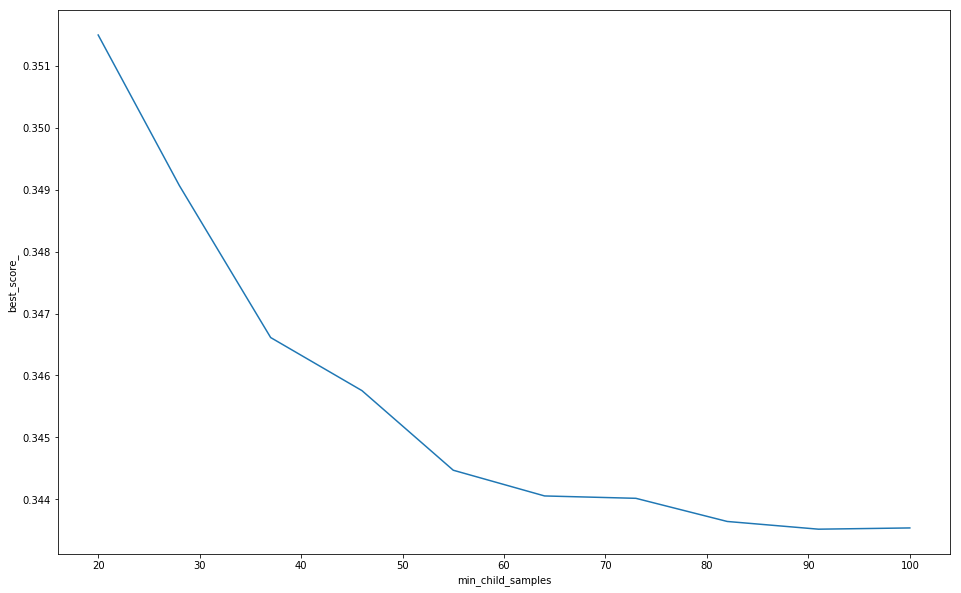

In [159]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(-1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['min_child_samples','best_score_'])
plt.plot(df['min_child_samples'],df['best_score_'])
plt.xlabel('min_child_samples')
plt.ylabel('best_score_')
plt.show()

In [160]:
#----------------------------
#2. Start with narrower range 
#----------------------------
lgb_pars = []
for min_child_samples in np.linspace(start = 91-5, stop = 91+5, num = 8).astype('int'):
    print ('min_child_samples :', min_child_samples)
    # the below is optimun result got from experiments
    fixed_estimator = 1155
    n_leaves = 1254
    min_split_gain = 0.0
    subsample = 1.0
    colsample_bytree = 1.0
    reg_lambda = 0
    reg_alpha = 0
    # n-fold (n = 5)
    skf = StratifiedKFold(n_splits=5, shuffle = True, random_state = seed)
    n_fold_result = []
    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_val = X_train[train_index], X_train[test_index]
        y_train, y_val = Y_train[train_index], Y_train[test_index]
        # model
        model = LGBMModel(objective = 'mape',
                               learning_rate = 0.1,
                               max_depth = -1,
                               min_child_weight = 0.001,
                               min_child_samples = min_child_samples,
                               reg_lambda = reg_lambda,
                               reg_alpha = reg_alpha,
                               min_split_gain = min_split_gain ,
                               subsample = subsample,
                               colsample_bytree = colsample_bytree,
                               num_leaves = n_leaves,
                               n_estimators = fixed_estimator,
                               random_state = seed
                              )
        model.fit(x_train, y_train, 
                  eval_metric ='mape',
                  eval_set = [(x_val, y_val)],
                  early_stopping_rounds = 50)  
        # saving model
        path = '../output/model-PM2.5/tuning'
        if not os.path.isdir(path):
            os.makedirs(path)
        pickle.dump(model, open('../output/model-PM2.5/tuning/lightgbm_{}_{}_{}.model'.format('min_child_samples', min_child_samples, seed), "wb"))   
        # validating evaluation result
        n_fold_result.append(model.best_score_['valid_0']['mape'])
    #output
    lgb_pars.append((min_child_samples, np.mean(n_fold_result)))

min_child_samples : 86
[1]	valid_0's mape: 0.674266
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635101
[3]	valid_0's mape: 0.600219
[4]	valid_0's mape: 0.569878
[5]	valid_0's mape: 0.543081
[6]	valid_0's mape: 0.519739
[7]	valid_0's mape: 0.498898
[8]	valid_0's mape: 0.481025
[9]	valid_0's mape: 0.465249
[10]	valid_0's mape: 0.451666
[11]	valid_0's mape: 0.439513
[12]	valid_0's mape: 0.429041
[13]	valid_0's mape: 0.420002
[14]	valid_0's mape: 0.412265
[15]	valid_0's mape: 0.405552
[16]	valid_0's mape: 0.399631
[17]	valid_0's mape: 0.394304
[18]	valid_0's mape: 0.389435
[19]	valid_0's mape: 0.385491
[20]	valid_0's mape: 0.381749
[21]	valid_0's mape: 0.378602
[22]	valid_0's mape: 0.37587
[23]	valid_0's mape: 0.373376
[24]	valid_0's mape: 0.371309
[25]	valid_0's mape: 0.369351
[26]	valid_0's mape: 0.367709
[27]	valid_0's mape: 0.366418
[28]	valid_0's mape: 0.364901
[29]	valid_0's mape: 0.363604
[30]	valid_0's mape: 0.36238
[31]	valid_0's mape: 0.361

[17]	valid_0's mape: 0.388726
[18]	valid_0's mape: 0.384526
[19]	valid_0's mape: 0.380592
[20]	valid_0's mape: 0.37716
[21]	valid_0's mape: 0.374182
[22]	valid_0's mape: 0.371712
[23]	valid_0's mape: 0.369385
[24]	valid_0's mape: 0.367379
[25]	valid_0's mape: 0.365615
[26]	valid_0's mape: 0.363895
[27]	valid_0's mape: 0.362398
[28]	valid_0's mape: 0.361235
[29]	valid_0's mape: 0.359824
[30]	valid_0's mape: 0.358708
[31]	valid_0's mape: 0.357635
[32]	valid_0's mape: 0.356684
[33]	valid_0's mape: 0.355908
[34]	valid_0's mape: 0.355148
[35]	valid_0's mape: 0.354501
[36]	valid_0's mape: 0.353815
[37]	valid_0's mape: 0.353304
[38]	valid_0's mape: 0.352958
[39]	valid_0's mape: 0.35243
[40]	valid_0's mape: 0.351969
[41]	valid_0's mape: 0.351423
[42]	valid_0's mape: 0.350962
[43]	valid_0's mape: 0.350458
[44]	valid_0's mape: 0.35011
[45]	valid_0's mape: 0.349742
[46]	valid_0's mape: 0.34936
[47]	valid_0's mape: 0.349083
[48]	valid_0's mape: 0.348801
[49]	valid_0's mape: 0.348472
[50]	valid_0's

[83]	valid_0's mape: 0.341612
[84]	valid_0's mape: 0.341551
[85]	valid_0's mape: 0.341499
[86]	valid_0's mape: 0.341426
[87]	valid_0's mape: 0.341396
[88]	valid_0's mape: 0.341486
[89]	valid_0's mape: 0.34147
[90]	valid_0's mape: 0.341415
[91]	valid_0's mape: 0.341408
[92]	valid_0's mape: 0.34137
[93]	valid_0's mape: 0.341339
[94]	valid_0's mape: 0.341269
[95]	valid_0's mape: 0.341194
[96]	valid_0's mape: 0.341181
[97]	valid_0's mape: 0.341157
[98]	valid_0's mape: 0.341128
[99]	valid_0's mape: 0.341119
[100]	valid_0's mape: 0.341117
[101]	valid_0's mape: 0.341037
[102]	valid_0's mape: 0.34102
[103]	valid_0's mape: 0.340982
[104]	valid_0's mape: 0.340973
[105]	valid_0's mape: 0.340982
[106]	valid_0's mape: 0.340942
[107]	valid_0's mape: 0.340923
[108]	valid_0's mape: 0.34086
[109]	valid_0's mape: 0.340842
[110]	valid_0's mape: 0.340843
[111]	valid_0's mape: 0.3408
[112]	valid_0's mape: 0.34081
[113]	valid_0's mape: 0.340804
[114]	valid_0's mape: 0.340777
[115]	valid_0's mape: 0.340759
[

[156]	valid_0's mape: 0.344128
[157]	valid_0's mape: 0.344145
[158]	valid_0's mape: 0.344129
[159]	valid_0's mape: 0.344142
[160]	valid_0's mape: 0.344117
[161]	valid_0's mape: 0.344101
[162]	valid_0's mape: 0.344103
[163]	valid_0's mape: 0.344139
[164]	valid_0's mape: 0.34411
[165]	valid_0's mape: 0.344099
[166]	valid_0's mape: 0.344117
[167]	valid_0's mape: 0.344112
[168]	valid_0's mape: 0.344148
[169]	valid_0's mape: 0.344174
[170]	valid_0's mape: 0.34414
[171]	valid_0's mape: 0.34413
[172]	valid_0's mape: 0.344146
[173]	valid_0's mape: 0.344158
[174]	valid_0's mape: 0.344133
[175]	valid_0's mape: 0.344166
[176]	valid_0's mape: 0.344166
[177]	valid_0's mape: 0.344138
[178]	valid_0's mape: 0.344155
[179]	valid_0's mape: 0.344145
[180]	valid_0's mape: 0.344151
[181]	valid_0's mape: 0.344161
[182]	valid_0's mape: 0.344156
[183]	valid_0's mape: 0.344133
[184]	valid_0's mape: 0.34414
[185]	valid_0's mape: 0.344155
[186]	valid_0's mape: 0.344188
[187]	valid_0's mape: 0.344213
[188]	valid_

[206]	valid_0's mape: 0.345788
[207]	valid_0's mape: 0.345813
[208]	valid_0's mape: 0.345811
[209]	valid_0's mape: 0.345816
[210]	valid_0's mape: 0.345818
[211]	valid_0's mape: 0.345832
[212]	valid_0's mape: 0.34591
[213]	valid_0's mape: 0.345946
[214]	valid_0's mape: 0.345917
[215]	valid_0's mape: 0.345909
[216]	valid_0's mape: 0.34591
Early stopping, best iteration is:
[166]	valid_0's mape: 0.345386
min_child_samples : 87
[1]	valid_0's mape: 0.674295
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635171
[3]	valid_0's mape: 0.601055
[4]	valid_0's mape: 0.570116
[5]	valid_0's mape: 0.543499
[6]	valid_0's mape: 0.519901
[7]	valid_0's mape: 0.498839
[8]	valid_0's mape: 0.480983
[9]	valid_0's mape: 0.465079
[10]	valid_0's mape: 0.451296
[11]	valid_0's mape: 0.439447
[12]	valid_0's mape: 0.429221
[13]	valid_0's mape: 0.420157
[14]	valid_0's mape: 0.412218
[15]	valid_0's mape: 0.405378
[16]	valid_0's mape: 0.399291
[17]	valid_0's mape: 0.394088
[18]	vali

[27]	valid_0's mape: 0.36198
[28]	valid_0's mape: 0.360598
[29]	valid_0's mape: 0.359418
[30]	valid_0's mape: 0.35851
[31]	valid_0's mape: 0.357334
[32]	valid_0's mape: 0.35642
[33]	valid_0's mape: 0.355721
[34]	valid_0's mape: 0.354993
[35]	valid_0's mape: 0.354074
[36]	valid_0's mape: 0.35335
[37]	valid_0's mape: 0.352605
[38]	valid_0's mape: 0.352132
[39]	valid_0's mape: 0.351563
[40]	valid_0's mape: 0.35096
[41]	valid_0's mape: 0.35049
[42]	valid_0's mape: 0.350171
[43]	valid_0's mape: 0.349901
[44]	valid_0's mape: 0.34949
[45]	valid_0's mape: 0.349238
[46]	valid_0's mape: 0.34886
[47]	valid_0's mape: 0.348471
[48]	valid_0's mape: 0.348153
[49]	valid_0's mape: 0.347833
[50]	valid_0's mape: 0.347624
[51]	valid_0's mape: 0.347399
[52]	valid_0's mape: 0.347209
[53]	valid_0's mape: 0.347133
[54]	valid_0's mape: 0.346975
[55]	valid_0's mape: 0.346804
[56]	valid_0's mape: 0.346686
[57]	valid_0's mape: 0.34654
[58]	valid_0's mape: 0.346388
[59]	valid_0's mape: 0.346196
[60]	valid_0's mape

[72]	valid_0's mape: 0.341874
[73]	valid_0's mape: 0.341771
[74]	valid_0's mape: 0.341678
[75]	valid_0's mape: 0.341646
[76]	valid_0's mape: 0.34158
[77]	valid_0's mape: 0.341547
[78]	valid_0's mape: 0.341429
[79]	valid_0's mape: 0.341379
[80]	valid_0's mape: 0.341312
[81]	valid_0's mape: 0.341271
[82]	valid_0's mape: 0.341233
[83]	valid_0's mape: 0.341177
[84]	valid_0's mape: 0.341186
[85]	valid_0's mape: 0.34114
[86]	valid_0's mape: 0.341085
[87]	valid_0's mape: 0.341047
[88]	valid_0's mape: 0.341026
[89]	valid_0's mape: 0.341019
[90]	valid_0's mape: 0.341005
[91]	valid_0's mape: 0.34099
[92]	valid_0's mape: 0.341017
[93]	valid_0's mape: 0.340998
[94]	valid_0's mape: 0.340947
[95]	valid_0's mape: 0.34094
[96]	valid_0's mape: 0.340881
[97]	valid_0's mape: 0.340924
[98]	valid_0's mape: 0.340899
[99]	valid_0's mape: 0.340848
[100]	valid_0's mape: 0.340865
[101]	valid_0's mape: 0.340812
[102]	valid_0's mape: 0.340787
[103]	valid_0's mape: 0.340762
[104]	valid_0's mape: 0.340733
[105]	val

[145]	valid_0's mape: 0.344653
[146]	valid_0's mape: 0.34464
[147]	valid_0's mape: 0.344638
[148]	valid_0's mape: 0.34464
[149]	valid_0's mape: 0.344643
[150]	valid_0's mape: 0.344627
[151]	valid_0's mape: 0.3447
[152]	valid_0's mape: 0.344701
[153]	valid_0's mape: 0.344676
[154]	valid_0's mape: 0.344684
[155]	valid_0's mape: 0.344658
[156]	valid_0's mape: 0.344644
[157]	valid_0's mape: 0.344675
[158]	valid_0's mape: 0.344659
[159]	valid_0's mape: 0.344673
[160]	valid_0's mape: 0.344669
[161]	valid_0's mape: 0.344667
[162]	valid_0's mape: 0.344687
[163]	valid_0's mape: 0.344676
[164]	valid_0's mape: 0.344668
[165]	valid_0's mape: 0.344647
[166]	valid_0's mape: 0.344644
[167]	valid_0's mape: 0.344656
[168]	valid_0's mape: 0.344636
[169]	valid_0's mape: 0.344636
[170]	valid_0's mape: 0.344654
[171]	valid_0's mape: 0.344673
Early stopping, best iteration is:
[121]	valid_0's mape: 0.344362
[1]	valid_0's mape: 0.671741
Training until validation scores don't improve for 50 rounds.
[2]	valid_

[28]	valid_0's mape: 0.365345
[29]	valid_0's mape: 0.364189
[30]	valid_0's mape: 0.363114
[31]	valid_0's mape: 0.36208
[32]	valid_0's mape: 0.360947
[33]	valid_0's mape: 0.360207
[34]	valid_0's mape: 0.359345
[35]	valid_0's mape: 0.35869
[36]	valid_0's mape: 0.358193
[37]	valid_0's mape: 0.357571
[38]	valid_0's mape: 0.356907
[39]	valid_0's mape: 0.356199
[40]	valid_0's mape: 0.355723
[41]	valid_0's mape: 0.355339
[42]	valid_0's mape: 0.354864
[43]	valid_0's mape: 0.354471
[44]	valid_0's mape: 0.354038
[45]	valid_0's mape: 0.353715
[46]	valid_0's mape: 0.353354
[47]	valid_0's mape: 0.353022
[48]	valid_0's mape: 0.352654
[49]	valid_0's mape: 0.35231
[50]	valid_0's mape: 0.352022
[51]	valid_0's mape: 0.351724
[52]	valid_0's mape: 0.351392
[53]	valid_0's mape: 0.35113
[54]	valid_0's mape: 0.350858
[55]	valid_0's mape: 0.350648
[56]	valid_0's mape: 0.350488
[57]	valid_0's mape: 0.350301
[58]	valid_0's mape: 0.350107
[59]	valid_0's mape: 0.349997
[60]	valid_0's mape: 0.349837
[61]	valid_0's

[296]	valid_0's mape: 0.345665
[297]	valid_0's mape: 0.345727
[298]	valid_0's mape: 0.345712
[299]	valid_0's mape: 0.345723
[300]	valid_0's mape: 0.345727
[301]	valid_0's mape: 0.345785
[302]	valid_0's mape: 0.345788
[303]	valid_0's mape: 0.345822
[304]	valid_0's mape: 0.345821
[305]	valid_0's mape: 0.34584
[306]	valid_0's mape: 0.345828
[307]	valid_0's mape: 0.345823
[308]	valid_0's mape: 0.345834
[309]	valid_0's mape: 0.345883
[310]	valid_0's mape: 0.345896
[311]	valid_0's mape: 0.345881
[312]	valid_0's mape: 0.345884
[313]	valid_0's mape: 0.345924
[314]	valid_0's mape: 0.345904
[315]	valid_0's mape: 0.345884
[316]	valid_0's mape: 0.345929
[317]	valid_0's mape: 0.345917
[318]	valid_0's mape: 0.345918
[319]	valid_0's mape: 0.345901
[320]	valid_0's mape: 0.345876
[321]	valid_0's mape: 0.345844
[322]	valid_0's mape: 0.345834
[323]	valid_0's mape: 0.345824
[324]	valid_0's mape: 0.345825
[325]	valid_0's mape: 0.345849
[326]	valid_0's mape: 0.34584
[327]	valid_0's mape: 0.34584
[328]	valid

[33]	valid_0's mape: 0.351651
[34]	valid_0's mape: 0.350956
[35]	valid_0's mape: 0.350162
[36]	valid_0's mape: 0.349473
[37]	valid_0's mape: 0.348951
[38]	valid_0's mape: 0.348302
[39]	valid_0's mape: 0.347865
[40]	valid_0's mape: 0.347366
[41]	valid_0's mape: 0.346956
[42]	valid_0's mape: 0.346605
[43]	valid_0's mape: 0.346192
[44]	valid_0's mape: 0.345712
[45]	valid_0's mape: 0.345268
[46]	valid_0's mape: 0.344948
[47]	valid_0's mape: 0.344537
[48]	valid_0's mape: 0.344224
[49]	valid_0's mape: 0.343903
[50]	valid_0's mape: 0.343708
[51]	valid_0's mape: 0.343521
[52]	valid_0's mape: 0.343286
[53]	valid_0's mape: 0.343055
[54]	valid_0's mape: 0.342746
[55]	valid_0's mape: 0.342709
[56]	valid_0's mape: 0.342504
[57]	valid_0's mape: 0.342401
[58]	valid_0's mape: 0.342213
[59]	valid_0's mape: 0.342109
[60]	valid_0's mape: 0.342013
[61]	valid_0's mape: 0.3419
[62]	valid_0's mape: 0.34183
[63]	valid_0's mape: 0.341677
[64]	valid_0's mape: 0.341515
[65]	valid_0's mape: 0.341369
[66]	valid_0'

[111]	valid_0's mape: 0.343994
[112]	valid_0's mape: 0.344052
[113]	valid_0's mape: 0.344035
[114]	valid_0's mape: 0.344034
[115]	valid_0's mape: 0.344044
[116]	valid_0's mape: 0.344031
[117]	valid_0's mape: 0.344042
[118]	valid_0's mape: 0.344021
[119]	valid_0's mape: 0.34407
[120]	valid_0's mape: 0.344087
[121]	valid_0's mape: 0.344077
[122]	valid_0's mape: 0.344175
[123]	valid_0's mape: 0.344162
[124]	valid_0's mape: 0.344157
[125]	valid_0's mape: 0.344124
[126]	valid_0's mape: 0.344142
[127]	valid_0's mape: 0.34415
[128]	valid_0's mape: 0.344153
[129]	valid_0's mape: 0.344144
[130]	valid_0's mape: 0.344122
[131]	valid_0's mape: 0.344131
[132]	valid_0's mape: 0.344148
[133]	valid_0's mape: 0.344108
[134]	valid_0's mape: 0.344056
[135]	valid_0's mape: 0.344027
[136]	valid_0's mape: 0.344071
[137]	valid_0's mape: 0.344078
[138]	valid_0's mape: 0.344103
[139]	valid_0's mape: 0.344106
[140]	valid_0's mape: 0.344085
[141]	valid_0's mape: 0.344044
[142]	valid_0's mape: 0.344018
[143]	vali

[18]	valid_0's mape: 0.388593
[19]	valid_0's mape: 0.384331
[20]	valid_0's mape: 0.38059
[21]	valid_0's mape: 0.377397
[22]	valid_0's mape: 0.374818
[23]	valid_0's mape: 0.372469
[24]	valid_0's mape: 0.370307
[25]	valid_0's mape: 0.368424
[26]	valid_0's mape: 0.366651
[27]	valid_0's mape: 0.365192
[28]	valid_0's mape: 0.363866
[29]	valid_0's mape: 0.362676
[30]	valid_0's mape: 0.361692
[31]	valid_0's mape: 0.36074
[32]	valid_0's mape: 0.359915
[33]	valid_0's mape: 0.358914
[34]	valid_0's mape: 0.358114
[35]	valid_0's mape: 0.357358
[36]	valid_0's mape: 0.356613
[37]	valid_0's mape: 0.356067
[38]	valid_0's mape: 0.355557
[39]	valid_0's mape: 0.354889
[40]	valid_0's mape: 0.354435
[41]	valid_0's mape: 0.353913
[42]	valid_0's mape: 0.353414
[43]	valid_0's mape: 0.353149
[44]	valid_0's mape: 0.352761
[45]	valid_0's mape: 0.35242
[46]	valid_0's mape: 0.352025
[47]	valid_0's mape: 0.35168
[48]	valid_0's mape: 0.351396
[49]	valid_0's mape: 0.351155
[50]	valid_0's mape: 0.35093
[51]	valid_0's 

[94]	valid_0's mape: 0.343617
[95]	valid_0's mape: 0.343621
[96]	valid_0's mape: 0.343576
[97]	valid_0's mape: 0.343566
[98]	valid_0's mape: 0.343594
[99]	valid_0's mape: 0.34356
[100]	valid_0's mape: 0.343531
[101]	valid_0's mape: 0.343523
[102]	valid_0's mape: 0.343519
[103]	valid_0's mape: 0.343498
[104]	valid_0's mape: 0.343483
[105]	valid_0's mape: 0.343575
[106]	valid_0's mape: 0.343552
[107]	valid_0's mape: 0.343513
[108]	valid_0's mape: 0.343456
[109]	valid_0's mape: 0.343439
[110]	valid_0's mape: 0.343425
[111]	valid_0's mape: 0.343387
[112]	valid_0's mape: 0.343361
[113]	valid_0's mape: 0.343324
[114]	valid_0's mape: 0.343288
[115]	valid_0's mape: 0.343279
[116]	valid_0's mape: 0.343271
[117]	valid_0's mape: 0.343283
[118]	valid_0's mape: 0.343291
[119]	valid_0's mape: 0.343281
[120]	valid_0's mape: 0.343273
[121]	valid_0's mape: 0.343271
[122]	valid_0's mape: 0.343244
[123]	valid_0's mape: 0.343246
[124]	valid_0's mape: 0.34326
[125]	valid_0's mape: 0.343244
[126]	valid_0's 

[180]	valid_0's mape: 0.340398
[181]	valid_0's mape: 0.340362
[182]	valid_0's mape: 0.340333
[183]	valid_0's mape: 0.340354
[184]	valid_0's mape: 0.340357
[185]	valid_0's mape: 0.340341
[186]	valid_0's mape: 0.340337
[187]	valid_0's mape: 0.34035
[188]	valid_0's mape: 0.34035
[189]	valid_0's mape: 0.340368
[190]	valid_0's mape: 0.340436
[191]	valid_0's mape: 0.340474
[192]	valid_0's mape: 0.340441
[193]	valid_0's mape: 0.340474
[194]	valid_0's mape: 0.340458
[195]	valid_0's mape: 0.340477
[196]	valid_0's mape: 0.340454
[197]	valid_0's mape: 0.340458
[198]	valid_0's mape: 0.34047
[199]	valid_0's mape: 0.340471
[200]	valid_0's mape: 0.340473
[201]	valid_0's mape: 0.340501
[202]	valid_0's mape: 0.340529
[203]	valid_0's mape: 0.340547
[204]	valid_0's mape: 0.340554
[205]	valid_0's mape: 0.340531
[206]	valid_0's mape: 0.340565
[207]	valid_0's mape: 0.340545
Early stopping, best iteration is:
[157]	valid_0's mape: 0.340208
[1]	valid_0's mape: 0.670295
Training until validation scores don't i

[55]	valid_0's mape: 0.34915
[56]	valid_0's mape: 0.349015
[57]	valid_0's mape: 0.34884
[58]	valid_0's mape: 0.348655
[59]	valid_0's mape: 0.348498
[60]	valid_0's mape: 0.348382
[61]	valid_0's mape: 0.348221
[62]	valid_0's mape: 0.34814
[63]	valid_0's mape: 0.348058
[64]	valid_0's mape: 0.347965
[65]	valid_0's mape: 0.347876
[66]	valid_0's mape: 0.347731
[67]	valid_0's mape: 0.347629
[68]	valid_0's mape: 0.347521
[69]	valid_0's mape: 0.347526
[70]	valid_0's mape: 0.347479
[71]	valid_0's mape: 0.347424
[72]	valid_0's mape: 0.347373
[73]	valid_0's mape: 0.347287
[74]	valid_0's mape: 0.347245
[75]	valid_0's mape: 0.347152
[76]	valid_0's mape: 0.347083
[77]	valid_0's mape: 0.347025
[78]	valid_0's mape: 0.346963
[79]	valid_0's mape: 0.346954
[80]	valid_0's mape: 0.346868
[81]	valid_0's mape: 0.346817
[82]	valid_0's mape: 0.346733
[83]	valid_0's mape: 0.346685
[84]	valid_0's mape: 0.346613
[85]	valid_0's mape: 0.346591
[86]	valid_0's mape: 0.346565
[87]	valid_0's mape: 0.346502
[88]	valid_0'

[140]	valid_0's mape: 0.345916
[141]	valid_0's mape: 0.34589
[142]	valid_0's mape: 0.345871
[143]	valid_0's mape: 0.345861
[144]	valid_0's mape: 0.345858
[145]	valid_0's mape: 0.345858
[146]	valid_0's mape: 0.34588
[147]	valid_0's mape: 0.345877
[148]	valid_0's mape: 0.345898
[149]	valid_0's mape: 0.345895
[150]	valid_0's mape: 0.345896
[151]	valid_0's mape: 0.34589
[152]	valid_0's mape: 0.345862
[153]	valid_0's mape: 0.345883
[154]	valid_0's mape: 0.3459
[155]	valid_0's mape: 0.345907
[156]	valid_0's mape: 0.345893
[157]	valid_0's mape: 0.345917
[158]	valid_0's mape: 0.345902
[159]	valid_0's mape: 0.345934
[160]	valid_0's mape: 0.345939
[161]	valid_0's mape: 0.345956
[162]	valid_0's mape: 0.345927
[163]	valid_0's mape: 0.34593
[164]	valid_0's mape: 0.345915
[165]	valid_0's mape: 0.345914
[166]	valid_0's mape: 0.345915
[167]	valid_0's mape: 0.345896
[168]	valid_0's mape: 0.345925
[169]	valid_0's mape: 0.345912
[170]	valid_0's mape: 0.34591
[171]	valid_0's mape: 0.345901
[172]	valid_0's

[130]	valid_0's mape: 0.342563
[131]	valid_0's mape: 0.342542
[132]	valid_0's mape: 0.34255
[133]	valid_0's mape: 0.342535
[134]	valid_0's mape: 0.342529
[135]	valid_0's mape: 0.342552
[136]	valid_0's mape: 0.342545
[137]	valid_0's mape: 0.342587
[138]	valid_0's mape: 0.342563
[139]	valid_0's mape: 0.342571
[140]	valid_0's mape: 0.342568
[141]	valid_0's mape: 0.342584
[142]	valid_0's mape: 0.342566
[143]	valid_0's mape: 0.342556
[144]	valid_0's mape: 0.342565
[145]	valid_0's mape: 0.342632
[146]	valid_0's mape: 0.34263
[147]	valid_0's mape: 0.342609
[148]	valid_0's mape: 0.342589
[149]	valid_0's mape: 0.342578
[150]	valid_0's mape: 0.342598
[151]	valid_0's mape: 0.342602
[152]	valid_0's mape: 0.342606
[153]	valid_0's mape: 0.342601
[154]	valid_0's mape: 0.34261
[155]	valid_0's mape: 0.342621
[156]	valid_0's mape: 0.342645
[157]	valid_0's mape: 0.342687
[158]	valid_0's mape: 0.342738
[159]	valid_0's mape: 0.342989
[160]	valid_0's mape: 0.34301
[161]	valid_0's mape: 0.343044
[162]	valid_

[22]	valid_0's mape: 0.369734
[23]	valid_0's mape: 0.367384
[24]	valid_0's mape: 0.365278
[25]	valid_0's mape: 0.363291
[26]	valid_0's mape: 0.361654
[27]	valid_0's mape: 0.360231
[28]	valid_0's mape: 0.359066
[29]	valid_0's mape: 0.357919
[30]	valid_0's mape: 0.357006
[31]	valid_0's mape: 0.35602
[32]	valid_0's mape: 0.354974
[33]	valid_0's mape: 0.354341
[34]	valid_0's mape: 0.353807
[35]	valid_0's mape: 0.353113
[36]	valid_0's mape: 0.352651
[37]	valid_0's mape: 0.351969
[38]	valid_0's mape: 0.351446
[39]	valid_0's mape: 0.350949
[40]	valid_0's mape: 0.350414
[41]	valid_0's mape: 0.350033
[42]	valid_0's mape: 0.349643
[43]	valid_0's mape: 0.349377
[44]	valid_0's mape: 0.349113
[45]	valid_0's mape: 0.348886
[46]	valid_0's mape: 0.348612
[47]	valid_0's mape: 0.348339
[48]	valid_0's mape: 0.348073
[49]	valid_0's mape: 0.34784
[50]	valid_0's mape: 0.34763
[51]	valid_0's mape: 0.347487
[52]	valid_0's mape: 0.347298
[53]	valid_0's mape: 0.347144
[54]	valid_0's mape: 0.346921
[55]	valid_0'

[125]	valid_0's mape: 0.345958
[126]	valid_0's mape: 0.345952
[127]	valid_0's mape: 0.34596
[128]	valid_0's mape: 0.345934
[129]	valid_0's mape: 0.345905
[130]	valid_0's mape: 0.345873
[131]	valid_0's mape: 0.345877
[132]	valid_0's mape: 0.34589
[133]	valid_0's mape: 0.345896
[134]	valid_0's mape: 0.345888
[135]	valid_0's mape: 0.345879
[136]	valid_0's mape: 0.345895
[137]	valid_0's mape: 0.345861
[138]	valid_0's mape: 0.345846
[139]	valid_0's mape: 0.345858
[140]	valid_0's mape: 0.345845
[141]	valid_0's mape: 0.345839
[142]	valid_0's mape: 0.345843
[143]	valid_0's mape: 0.345823
[144]	valid_0's mape: 0.345809
[145]	valid_0's mape: 0.345832
[146]	valid_0's mape: 0.345824
[147]	valid_0's mape: 0.345832
[148]	valid_0's mape: 0.345833
[149]	valid_0's mape: 0.345843
[150]	valid_0's mape: 0.345837
[151]	valid_0's mape: 0.345867
[152]	valid_0's mape: 0.345888
[153]	valid_0's mape: 0.345897
[154]	valid_0's mape: 0.345839
[155]	valid_0's mape: 0.34586
[156]	valid_0's mape: 0.345859
[157]	valid

[195]	valid_0's mape: 0.345471
[196]	valid_0's mape: 0.345469
[197]	valid_0's mape: 0.345495
[198]	valid_0's mape: 0.345527
[199]	valid_0's mape: 0.345541
[200]	valid_0's mape: 0.345508
[201]	valid_0's mape: 0.345511
[202]	valid_0's mape: 0.345531
[203]	valid_0's mape: 0.345541
[204]	valid_0's mape: 0.345522
[205]	valid_0's mape: 0.345504
[206]	valid_0's mape: 0.345621
[207]	valid_0's mape: 0.34561
[208]	valid_0's mape: 0.345607
[209]	valid_0's mape: 0.34561
[210]	valid_0's mape: 0.345632
[211]	valid_0's mape: 0.34567
[212]	valid_0's mape: 0.345648
[213]	valid_0's mape: 0.345657
[214]	valid_0's mape: 0.345635
[215]	valid_0's mape: 0.345634
[216]	valid_0's mape: 0.345711
[217]	valid_0's mape: 0.345705
[218]	valid_0's mape: 0.345693
[219]	valid_0's mape: 0.345722
[220]	valid_0's mape: 0.345697
[221]	valid_0's mape: 0.345672
[222]	valid_0's mape: 0.345677
[223]	valid_0's mape: 0.345677
[224]	valid_0's mape: 0.345684
[225]	valid_0's mape: 0.345682
[226]	valid_0's mape: 0.345691
[227]	valid

[9]	valid_0's mape: 0.459874
[10]	valid_0's mape: 0.445796
[11]	valid_0's mape: 0.433945
[12]	valid_0's mape: 0.423727
[13]	valid_0's mape: 0.414218
[14]	valid_0's mape: 0.406095
[15]	valid_0's mape: 0.398809
[16]	valid_0's mape: 0.392647
[17]	valid_0's mape: 0.387471
[18]	valid_0's mape: 0.382658
[19]	valid_0's mape: 0.378644
[20]	valid_0's mape: 0.374932
[21]	valid_0's mape: 0.371636
[22]	valid_0's mape: 0.368726
[23]	valid_0's mape: 0.366128
[24]	valid_0's mape: 0.363837
[25]	valid_0's mape: 0.361905
[26]	valid_0's mape: 0.360226
[27]	valid_0's mape: 0.358769
[28]	valid_0's mape: 0.357485
[29]	valid_0's mape: 0.356254
[30]	valid_0's mape: 0.355065
[31]	valid_0's mape: 0.353997
[32]	valid_0's mape: 0.353017
[33]	valid_0's mape: 0.352208
[34]	valid_0's mape: 0.351465
[35]	valid_0's mape: 0.35075
[36]	valid_0's mape: 0.350108
[37]	valid_0's mape: 0.349559
[38]	valid_0's mape: 0.348931
[39]	valid_0's mape: 0.348343
[40]	valid_0's mape: 0.347746
[41]	valid_0's mape: 0.347324
[42]	valid_0

[107]	valid_0's mape: 0.344506
[108]	valid_0's mape: 0.344517
[109]	valid_0's mape: 0.344558
[110]	valid_0's mape: 0.344542
[111]	valid_0's mape: 0.344526
[112]	valid_0's mape: 0.344535
[113]	valid_0's mape: 0.344531
[114]	valid_0's mape: 0.344549
[115]	valid_0's mape: 0.344522
[116]	valid_0's mape: 0.344478
[117]	valid_0's mape: 0.344447
[118]	valid_0's mape: 0.34443
[119]	valid_0's mape: 0.344413
[120]	valid_0's mape: 0.344441
[121]	valid_0's mape: 0.344441
[122]	valid_0's mape: 0.34442
[123]	valid_0's mape: 0.344396
[124]	valid_0's mape: 0.344398
[125]	valid_0's mape: 0.344417
[126]	valid_0's mape: 0.344437
[127]	valid_0's mape: 0.344371
[128]	valid_0's mape: 0.34435
[129]	valid_0's mape: 0.344345
[130]	valid_0's mape: 0.344391
[131]	valid_0's mape: 0.344386
[132]	valid_0's mape: 0.344401
[133]	valid_0's mape: 0.344412
[134]	valid_0's mape: 0.344437
[135]	valid_0's mape: 0.344445
[136]	valid_0's mape: 0.344412
[137]	valid_0's mape: 0.344442
[138]	valid_0's mape: 0.344449
[139]	valid

[193]	valid_0's mape: 0.346112
[194]	valid_0's mape: 0.346132
Early stopping, best iteration is:
[144]	valid_0's mape: 0.345816
min_child_samples : 94
[1]	valid_0's mape: 0.674013
Training until validation scores don't improve for 50 rounds.
[2]	valid_0's mape: 0.635347
[3]	valid_0's mape: 0.600904
[4]	valid_0's mape: 0.570372
[5]	valid_0's mape: 0.543657
[6]	valid_0's mape: 0.520333
[7]	valid_0's mape: 0.499275
[8]	valid_0's mape: 0.480824
[9]	valid_0's mape: 0.464707
[10]	valid_0's mape: 0.451065
[11]	valid_0's mape: 0.439053
[12]	valid_0's mape: 0.428666
[13]	valid_0's mape: 0.419356
[14]	valid_0's mape: 0.41105
[15]	valid_0's mape: 0.403941
[16]	valid_0's mape: 0.397947
[17]	valid_0's mape: 0.39267
[18]	valid_0's mape: 0.387964
[19]	valid_0's mape: 0.383818
[20]	valid_0's mape: 0.380252
[21]	valid_0's mape: 0.377289
[22]	valid_0's mape: 0.374492
[23]	valid_0's mape: 0.372004
[24]	valid_0's mape: 0.369811
[25]	valid_0's mape: 0.367767
[26]	valid_0's mape: 0.365988
[27]	valid_0's map

[263]	valid_0's mape: 0.344721
[264]	valid_0's mape: 0.344705
[265]	valid_0's mape: 0.344744
[266]	valid_0's mape: 0.34481
[267]	valid_0's mape: 0.344799
[268]	valid_0's mape: 0.34479
[269]	valid_0's mape: 0.344799
[270]	valid_0's mape: 0.344867
[271]	valid_0's mape: 0.344849
[272]	valid_0's mape: 0.344839
[273]	valid_0's mape: 0.34486
[274]	valid_0's mape: 0.344842
[275]	valid_0's mape: 0.344809
[276]	valid_0's mape: 0.344804
[277]	valid_0's mape: 0.34481
[278]	valid_0's mape: 0.344803
[279]	valid_0's mape: 0.344845
[280]	valid_0's mape: 0.344853
[281]	valid_0's mape: 0.344888
[282]	valid_0's mape: 0.344892
[283]	valid_0's mape: 0.344871
[284]	valid_0's mape: 0.344847
[285]	valid_0's mape: 0.344828
[286]	valid_0's mape: 0.344839
[287]	valid_0's mape: 0.344841
[288]	valid_0's mape: 0.34484
[289]	valid_0's mape: 0.344841
[290]	valid_0's mape: 0.344825
[291]	valid_0's mape: 0.344818
[292]	valid_0's mape: 0.344812
[293]	valid_0's mape: 0.344828
[294]	valid_0's mape: 0.34485
[295]	valid_0'

[37]	valid_0's mape: 0.349871
[38]	valid_0's mape: 0.349301
[39]	valid_0's mape: 0.348653
[40]	valid_0's mape: 0.348274
[41]	valid_0's mape: 0.347814
[42]	valid_0's mape: 0.347372
[43]	valid_0's mape: 0.346961
[44]	valid_0's mape: 0.346558
[45]	valid_0's mape: 0.346173
[46]	valid_0's mape: 0.345826
[47]	valid_0's mape: 0.345505
[48]	valid_0's mape: 0.345083
[49]	valid_0's mape: 0.344831
[50]	valid_0's mape: 0.344618
[51]	valid_0's mape: 0.344377
[52]	valid_0's mape: 0.344135
[53]	valid_0's mape: 0.34398
[54]	valid_0's mape: 0.343792
[55]	valid_0's mape: 0.343604
[56]	valid_0's mape: 0.34345
[57]	valid_0's mape: 0.3433
[58]	valid_0's mape: 0.343179
[59]	valid_0's mape: 0.34297
[60]	valid_0's mape: 0.342811
[61]	valid_0's mape: 0.342669
[62]	valid_0's mape: 0.342563
[63]	valid_0's mape: 0.342459
[64]	valid_0's mape: 0.342358
[65]	valid_0's mape: 0.342242
[66]	valid_0's mape: 0.34213
[67]	valid_0's mape: 0.342062
[68]	valid_0's mape: 0.341971
[69]	valid_0's mape: 0.341795
[70]	valid_0's m

[98]	valid_0's mape: 0.344047
[99]	valid_0's mape: 0.344023
[100]	valid_0's mape: 0.344035
[101]	valid_0's mape: 0.34406
[102]	valid_0's mape: 0.344069
[103]	valid_0's mape: 0.344046
[104]	valid_0's mape: 0.344083
[105]	valid_0's mape: 0.344148
[106]	valid_0's mape: 0.344133
[107]	valid_0's mape: 0.344098
[108]	valid_0's mape: 0.344078
[109]	valid_0's mape: 0.34411
[110]	valid_0's mape: 0.344139
[111]	valid_0's mape: 0.344125
[112]	valid_0's mape: 0.344119
[113]	valid_0's mape: 0.344098
[114]	valid_0's mape: 0.344064
[115]	valid_0's mape: 0.344045
[116]	valid_0's mape: 0.344039
[117]	valid_0's mape: 0.344069
[118]	valid_0's mape: 0.344078
[119]	valid_0's mape: 0.344084
[120]	valid_0's mape: 0.344044
[121]	valid_0's mape: 0.344074
[122]	valid_0's mape: 0.344085
[123]	valid_0's mape: 0.344113
[124]	valid_0's mape: 0.344114
[125]	valid_0's mape: 0.34411
[126]	valid_0's mape: 0.344098
[127]	valid_0's mape: 0.344125
[128]	valid_0's mape: 0.344132
[129]	valid_0's mape: 0.344125
[130]	valid_0

[19]	valid_0's mape: 0.384236
[20]	valid_0's mape: 0.380692
[21]	valid_0's mape: 0.377644
[22]	valid_0's mape: 0.374947
[23]	valid_0's mape: 0.372384
[24]	valid_0's mape: 0.370048
[25]	valid_0's mape: 0.368064
[26]	valid_0's mape: 0.366341
[27]	valid_0's mape: 0.364983
[28]	valid_0's mape: 0.363613
[29]	valid_0's mape: 0.362327
[30]	valid_0's mape: 0.361224
[31]	valid_0's mape: 0.360069
[32]	valid_0's mape: 0.358971
[33]	valid_0's mape: 0.358051
[34]	valid_0's mape: 0.35729
[35]	valid_0's mape: 0.35648
[36]	valid_0's mape: 0.355875
[37]	valid_0's mape: 0.355365
[38]	valid_0's mape: 0.354717
[39]	valid_0's mape: 0.354134
[40]	valid_0's mape: 0.353752
[41]	valid_0's mape: 0.35335
[42]	valid_0's mape: 0.352993
[43]	valid_0's mape: 0.352717
[44]	valid_0's mape: 0.352408
[45]	valid_0's mape: 0.352097
[46]	valid_0's mape: 0.351763
[47]	valid_0's mape: 0.35154
[48]	valid_0's mape: 0.351183
[49]	valid_0's mape: 0.3509
[50]	valid_0's mape: 0.350671
[51]	valid_0's mape: 0.35045
[52]	valid_0's ma

[6]	valid_0's mape: 0.516129
[7]	valid_0's mape: 0.495017
[8]	valid_0's mape: 0.476149
[9]	valid_0's mape: 0.460288
[10]	valid_0's mape: 0.446468
[11]	valid_0's mape: 0.434345
[12]	valid_0's mape: 0.42412
[13]	valid_0's mape: 0.415056
[14]	valid_0's mape: 0.406997
[15]	valid_0's mape: 0.39998
[16]	valid_0's mape: 0.393673
[17]	valid_0's mape: 0.388193
[18]	valid_0's mape: 0.383464
[19]	valid_0's mape: 0.379311
[20]	valid_0's mape: 0.375815
[21]	valid_0's mape: 0.372751
[22]	valid_0's mape: 0.370171
[23]	valid_0's mape: 0.367683
[24]	valid_0's mape: 0.365484
[25]	valid_0's mape: 0.363599
[26]	valid_0's mape: 0.361733
[27]	valid_0's mape: 0.360144
[28]	valid_0's mape: 0.358748
[29]	valid_0's mape: 0.357554
[30]	valid_0's mape: 0.356312
[31]	valid_0's mape: 0.355304
[32]	valid_0's mape: 0.354219
[33]	valid_0's mape: 0.35341
[34]	valid_0's mape: 0.352722
[35]	valid_0's mape: 0.352182
[36]	valid_0's mape: 0.351618
[37]	valid_0's mape: 0.351216
[38]	valid_0's mape: 0.350569
[39]	valid_0's ma

[83]	valid_0's mape: 0.341371
[84]	valid_0's mape: 0.341322
[85]	valid_0's mape: 0.341301
[86]	valid_0's mape: 0.341302
[87]	valid_0's mape: 0.341266
[88]	valid_0's mape: 0.341237
[89]	valid_0's mape: 0.341248
[90]	valid_0's mape: 0.34123
[91]	valid_0's mape: 0.341203
[92]	valid_0's mape: 0.341123
[93]	valid_0's mape: 0.341097
[94]	valid_0's mape: 0.341071
[95]	valid_0's mape: 0.341042
[96]	valid_0's mape: 0.34107
[97]	valid_0's mape: 0.341097
[98]	valid_0's mape: 0.341081
[99]	valid_0's mape: 0.341089
[100]	valid_0's mape: 0.341075
[101]	valid_0's mape: 0.34105
[102]	valid_0's mape: 0.341049
[103]	valid_0's mape: 0.341044
[104]	valid_0's mape: 0.341052
[105]	valid_0's mape: 0.341033
[106]	valid_0's mape: 0.341056
[107]	valid_0's mape: 0.341046
[108]	valid_0's mape: 0.341056
[109]	valid_0's mape: 0.341048
[110]	valid_0's mape: 0.341051
[111]	valid_0's mape: 0.341003
[112]	valid_0's mape: 0.340989
[113]	valid_0's mape: 0.34101
[114]	valid_0's mape: 0.34102
[115]	valid_0's mape: 0.340999

[132]	valid_0's mape: 0.34438
[133]	valid_0's mape: 0.34435
[134]	valid_0's mape: 0.344418
[135]	valid_0's mape: 0.344478
[136]	valid_0's mape: 0.34448
[137]	valid_0's mape: 0.344414
[138]	valid_0's mape: 0.344399
[139]	valid_0's mape: 0.344371
[140]	valid_0's mape: 0.344335
[141]	valid_0's mape: 0.344355
[142]	valid_0's mape: 0.344375
[143]	valid_0's mape: 0.344375
[144]	valid_0's mape: 0.34439
[145]	valid_0's mape: 0.34439
[146]	valid_0's mape: 0.344418
[147]	valid_0's mape: 0.344478
[148]	valid_0's mape: 0.344499
[149]	valid_0's mape: 0.344518
[150]	valid_0's mape: 0.344501
[151]	valid_0's mape: 0.344499
[152]	valid_0's mape: 0.344497
[153]	valid_0's mape: 0.344517
[154]	valid_0's mape: 0.344535
[155]	valid_0's mape: 0.34456
[156]	valid_0's mape: 0.344559
[157]	valid_0's mape: 0.344556
[158]	valid_0's mape: 0.344553
[159]	valid_0's mape: 0.344566
[160]	valid_0's mape: 0.344553
Early stopping, best iteration is:
[110]	valid_0's mape: 0.344279
[1]	valid_0's mape: 0.672013
Training unt

results [(86, 0.3436689447013487), (87, 0.3437058366201719), (88, 0.34360731370681025), (90, 0.34375801953004725), (91, 0.3435165189450488), (93, 0.3438068238829398), (94, 0.343535486410789), (96, 0.3436579582153798)]
best paras 91
best_score_ 0.3435165189450488


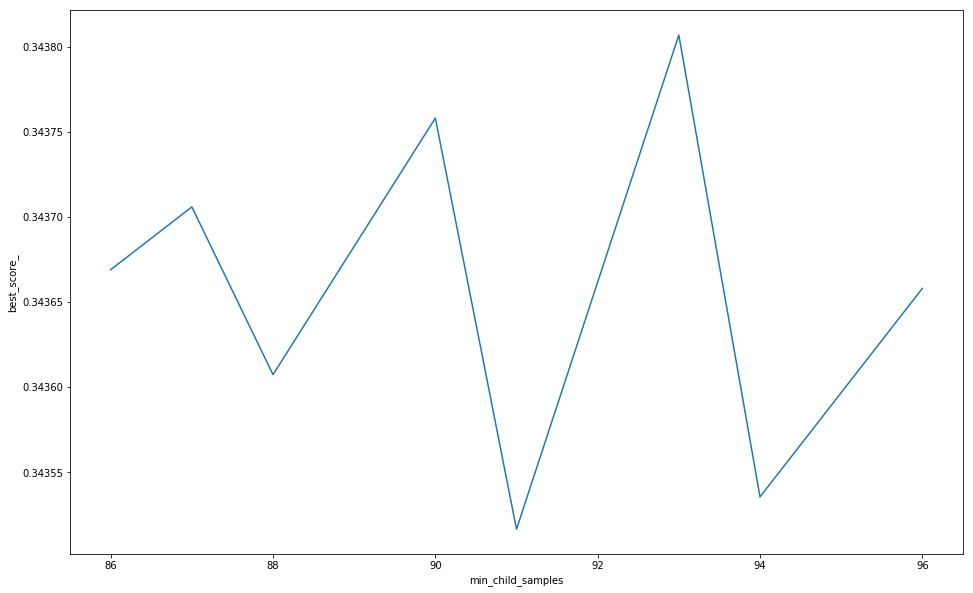

In [161]:
print ('results',lgb_pars)
print ('best paras', min(lgb_pars,key=itemgetter(-1))[0])
print ('best_score_',min(lgb_pars,key=itemgetter(-1))[1])
# visualization
df = pd.DataFrame(lgb_pars,columns = ['min_child_samples','best_score_'])
plt.plot(df['min_child_samples'],df['best_score_'])
plt.xlabel('min_child_samples')
plt.ylabel('best_score_')
plt.show()

# Final Step: Reducing Learning Rate + adding more trees

In [ ]:
##########################################
#Step 6: Reducing Learning Rate + adding more trees
##########################################

'''
Here we did is lower the learning rate and add more trees.

'''
n_estimators = 10000
learning_rate = 0.01

# the below is optimun result got from experiments
n_leaves = 1254
min_split_gain = 0.0
subsample = 1.0
colsample_bytree = 1.0
reg_lambda = 0
reg_alpha = 0
min_child_samples = 91 
# model
model = LGBMModel(objective = 'mape',
                       learning_rate = learning_rate,
                       max_depth = -1,
                       min_child_weight = 0.001,
                       min_child_samples = min_child_samples,
                       reg_lambda = reg_lambda,
                       reg_alpha = reg_alpha,
                       min_split_gain = min_split_gain ,
                       subsample = subsample,
                       colsample_bytree = colsample_bytree,
                       num_leaves = n_leaves,
                       n_estimators = n_estimators,
                       scale_pos_weight = ratio
                      )
#
model.fit(x_train, y_train, 
          eval_metric ='auc',
          eval_set = [(x_val, y_val)],
          early_stopping_rounds = 50)  

In [26]:
#==============================================================================
print('test')
#==============================================================================
test = pd.read_csv('../feature/test/bj/{}/all_features.csv.gz'.format('PM2.5'), compression='gzip')
sub_test = test[['utc_time','station_id']]
sub_test['label'] = 0
test.shape

test


(1680, 80)

In [27]:
test.head()

,utc_time,station_id,month_of_year_given_utc,week_of_year_given_utc,week_of_month_given_utc,day_of_the_month_given_utc,day_of_the_week_given_utc,hour_of_the_day_given_utc,window_3_day_PM2.5_mean,window_3_day_NO2_mean,...,log_window_1_day_PM2.5_sum,log_window_1_day_PM10_sum,log_window_1_day_NO2_sum,log_window_1_day_O3_sum,log_window_3_day_PM10_median,log_window_3_day_O3_median,log_window_2_day_PM10_median,log_window_2_day_O3_median,log_window_1_day_PM10_median,log_window_1_day_O3_median
0,2018-05-13 23:00:00,daxing,5,19,2,13,6,23,83.031250,44.093750,...,5.828946,6.605298,5.655992,6.877296,4.753590,4.418841,4.672829,4.499810,4.505350,4.828314
1,2018-05-14 00:00:00,daxing,5,20,3,14,0,0,84.258065,43.709677,...,5.828946,6.605298,5.655992,6.877296,4.718499,4.430817,4.624973,4.615121,4.505350,4.828314
2,2018-05-14 01:00:00,daxing,5,20,3,14,0,1,85.033333,43.566667,...,5.700444,6.480045,5.416100,6.831954,4.695925,4.465908,4.574711,4.718499,4.521789,4.890349
3,2018-05-14 02:00:00,daxing,5,20,3,14,0,2,85.896552,42.896552,...,5.549076,6.326149,5.049856,6.776507,4.672829,4.499810,4.569543,4.740575,4.505350,5.023881
4,2018-05-14 03:00:00,daxing,5,20,3,14,0,3,85.896552,42.896552,...,5.361292,6.148468,4.709530,6.669498,4.672829,4.499810,4.564348,4.762174,4.488636,5.141664


In [28]:
test.utc_time.min()

'2018-05-13 23:00:00'

In [29]:
test.utc_time.max()

'2018-05-15 22:00:00'

In [30]:
test[['utc_time','window_2_day_PM2.5_mean']]

,utc_time,window_2_day_PM2.5_mean
0,2018-05-13 23:00:00,85.896552
1,2018-05-14 00:00:00,83.785714
2,2018-05-14 01:00:00,81.074074
3,2018-05-14 02:00:00,77.653846
4,2018-05-14 03:00:00,73.760000
5,2018-05-14 04:00:00,70.041667
6,2018-05-14 05:00:00,66.391304
7,2018-05-14 06:00:00,62.727273
8,2018-05-14 07:00:00,59.380952
9,2018-05-14 08:00:00,55.900000


In [31]:
test.drop(['utc_time','station_id'], axis = 1, inplace = True) # remove sth which is not features
sub_test['label'] += model.predict(test)

In [32]:
sub_test

,utc_time,station_id,label
0,2018-05-13 23:00:00,daxing,64.284352
1,2018-05-14 00:00:00,daxing,79.060749
2,2018-05-14 01:00:00,daxing,79.484829
3,2018-05-14 02:00:00,daxing,79.187281
4,2018-05-14 03:00:00,daxing,81.478372
5,2018-05-14 04:00:00,daxing,75.195788
6,2018-05-14 05:00:00,daxing,79.063334
7,2018-05-14 06:00:00,daxing,96.591968
8,2018-05-14 07:00:00,daxing,78.045473
9,2018-05-14 08:00:00,daxing,36.595370


In [172]:
# setting
DATE_model = ['0519_1030', '0519_25', '0519_1992']


OUTF = "../output/sub/final/bagging_PM2.5.csv"

print("""#==== print param ======""")
print('OUTF:', OUTF)
print('DATE_churn:', DATE_model)

#==============================================================================
# load
#==============================================================================
finla_sub = pd.concat([pd.read_csv('../output/sub/{}/sub_test.csv'.format(d)) for d in DATE_model])
finla_sub = finla_sub.groupby(['utc_time','station_id']).label.mean().reset_index()

#==== print param ======
OUTF: ../output/sub/final/bagging_PM2.5.csv
DATE_churn: ['0519_1030', '0519_25', '0519_1992']


In [175]:
#==============================================================================
# output
#==============================================================================
print('writing...')
finla_sub[['utc_time','station_id','label']].to_csv(OUTF, index=False)


writing...


FileNotFoundError: [Errno 2] No such file or directory: '../output/sub/final/bagging_PM2.5.csv'

In [174]:
35*48

1680